In [5]:
#!pip install SPARQLWrapper
#!pip install pandas
#!pip install numpy
#!pip install matplotlib
#!pip install seaborn
#!pip install sparqlwrapper
#!pip install plotly

In [6]:
import os
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import seaborn as sns
from SPARQLWrapper import SPARQLWrapper, N3, JSON
from rdflib import Graph
import plotly.graph_objects as go
import plotly.express as px
import re




%matplotlib inline

In [7]:
#endpoint = "http://localhost:9999/blazegraph/sparql" # SPARQL endpoint hosting ITO.owl

endpoint = "http://149.148.106.153:9999/blazegraph/sparql"
prefixes = """
PREFIX edam: <http://edamontology.org/>
PREFIX obo:  <http://purl.obolibrary.org/obo/>
PREFIX ito:  <https://identifiers.org/ito#>
PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
PREFIX foaf: <http://xmlns.com/foaf/0.1/>
"""

def query(service, query, numeric_cols = []):
    """
    Helper function to convert SPARQL results into a Pandas data frame.
    """
    sparql = SPARQLWrapper(service)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    result = sparql.query()

    processed_results = json.load(result.response)
    cols = processed_results['head']['vars']

    out = []
    for row in processed_results['results']['bindings']:
        item = []
        for c in cols:
            item.append(row.get(c, {}).get('value'))
        out.append(item)
        
    df = pd.DataFrame(out, columns=cols)
    for col in numeric_cols:
        df[col] = pd.to_numeric(df[col])
    
    return df


In [8]:
#First select here the metricName that we will use

#desired_measure = "Accuracy"
#desired_measure = "Hits-at-10"
#desired_measure = "Hits-at-1"
#desired_measure = "MRR"
#desired_measure = "AUC"

query = """
    PREFIX edam: <http://edamontology.org/>
    PREFIX obo:  <http://purl.obolibrary.org/obo/>
    PREFIX ito:  <https://identifiers.org/ito:>
    PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
    PREFIX foaf: <http://xmlns.com/foaf/0.1/>

    SELECT *
    WHERE {
        ?paper a edam:data_0971 . 
        ?paper rdfs:label ?paperTitle. 
        ?paper obo:date ?date. 

        ?benchmark_process_individual 	rdfs:seeAlso ?paper ;
                                        rdfs:label ?model_label ;
                                        a ?benchmark_process_class . # this will create a place holder for the rdfs:type results that contains the information about the individual
        
        ?benchmark_process_class rdfs:label ?benchmark_process_class_label ;
                                 rdfs:subClassOf* ito:ITO_00141 . # this limits for the NLP class


        ?performance_measure rdfs:subPropertyOf* ito:performance_measure .
        ?performance_measure rdfs:label ?metricName .



        ?performance_measure rdfs:label ?metricName .
        ?benchmark_process_individual ?performance_measure ?result .	


        #FILTER regex(?paperTitle, "Quaternion Knowledge Graph Embeddings" ). # this searches a specific match
        #FILTER regex(?benchmark_process_class_label, "- Link Prediction benchmarking" ). # this searches a specific match
        
        #FILTER regex(?benchmark_process_class_label, " - Sentiment Analysis benchmarking" ). # this searches a specific match

        #WN18RR - Link Prediction benchmarking




    } ORDER by ?date



    """

#send query via API
sparql = SPARQLWrapper(endpoint)
sparql.setQuery(query)
sparql.setReturnFormat(JSON)
result = sparql.query()

#process results as JSON
processed_results = json.load(result.response)

#Use accessory function to process results
cols = processed_results['head']['vars']

out = []
for row in processed_results['results']['bindings']:
    item = []
    for c in cols:
        item.append(row.get(c, {}).get('value'))

        out.append(item)


#this is the final df containing the results of the query
df2 = pd.DataFrame(out, columns=cols)

#get unique benchmark_process_class_label
#benchmark_process_class_label = df2["benchmark_process_class_label"].unique()

#get unique metricName
metricName = df2["metricName"].unique()


print("Number of metrics: ",len(metricName))

for desired_measure in metricName:
    print ("|"+desired_measure+"|")

URLError: <urlopen error [WinError 10061] No connection could be made because the target machine actively refused it>

In [ ]:
#Query database and get one ratio dataframe per mesure. Example provided.


def create_ratio(desired_measure, desired_benchmark, ds_count):
    print("Creating ratio df for ",desired_measure,", ",desired_benchmark,", ds_count=",ds_count)
    query = """
    PREFIX edam: <http://edamontology.org/>
    PREFIX obo:  <http://purl.obolibrary.org/obo/>
    PREFIX ito:  <https://identifiers.org/ito:>
    PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
    PREFIX foaf: <http://xmlns.com/foaf/0.1/>

    SELECT *
    WHERE {
        ?paper a edam:data_0971 . 
        ?paper rdfs:label ?paperTitle. 
        ?paper obo:date ?date. 

        ?benchmark_process_individual 	rdfs:seeAlso ?paper ;
                                        rdfs:label ?model_label ;
                                        a ?benchmark_process_class . # this will create a place holder for the rdfs:type results that contains the information about the individual
        
        ?benchmark_process_class rdfs:label ?benchmark_process_class_label ;
                                 rdfs:subClassOf* ito:ITO_00141 . # this limits for the NLP class
        

        ?performance_measure rdfs:subPropertyOf* ito:performance_measure .
        ?performance_measure rdfs:label ?metricName .



        ?performance_measure rdfs:label ?metricName .
        ?benchmark_process_individual ?performance_measure ?result .	


        #FILTER regex(?paperTitle, "Quaternion Knowledge Graph Embeddings" ). # this searches a specific match
        FILTER regex(?metricName, "^"""+ desired_measure +"""$" ). # this searches a specific match
        FILTER regex(?benchmark_process_class_label, "^"""+desired_benchmark+"""$" ). # this searches a specific match
        #FILTER regex(?benchmark_process_class_label, "- Link Prediction benchmarking" ). # this searches a specific match
        #FILTER regex(?benchmark_process_class_label, " - Sentiment Analysis benchmarking" ). # this searches a specific match
        #WN18RR - Link Prediction benchmarking




    } ORDER by ?date



    """

    #send query via API
    sparql = SPARQLWrapper(endpoint)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    result = sparql.query()

    #process results as JSON
    processed_results = json.load(result.response)

    #Use accessory function to process results
    cols = processed_results['head']['vars']

    out = []
    for row in processed_results['results']['bindings']:
        item = []
        for c in cols:
            item.append(row.get(c, {}).get('value'))

        out.append(item)

    #this is the final df containing the results of the query
    df = pd.DataFrame(out, columns=cols)
    
    if len(df.index)==0:
        return None
           
    #Set date column to datetime
    df['date'] = pd.to_datetime(df['date'])

    #Keep only the model name
    df.new = df.replace(to_replace =' model in .*$', value = '', regex = True)

    df.new["result"] = pd.to_numeric(df.new["result"]) 

    #Create dataframe to store state of art results
    sota = pd.DataFrame(columns = df.new.columns)

    best_value = 0
    i=0

    for result in df.new["result"]:        
            if result > best_value:
                best_value = result
                sota_add = pd.DataFrame(df.new.iloc[i]).transpose()
                sota = sota.append(sota_add)            
            i = i+1    

    #This variable is containing the data points to plot the state of the art line        
    #sota

    #this is a copy to use as hovertemplate below
    y=df.new["result"].astype(str)


    #create this data frame to store the ratios
    ratio_df = pd.DataFrame(columns = ["ds_count", 
                                       "task",
                                       "ds", 
                                       "date",
                                       "model_label",
                                       "value",
                                       "percent_of_max_sota",
                                       "gain",
                                       "ratio",
                                       "max_sota"])


    #This block collects the rate of the benchmarkings along the years and saves it
    #ratio_df = pd.DataFrame(columns = ["ds_count", "ds", "date", "value","gain","ratio","max_sota"])

    #len(sota["result"])
    max(sota["result"])
    min(sota["result"])

    i=0
    for res in sota["result"]:
        if sota.loc[sota.index[i], 'result'] <= max(sota["result"]) :
            if(i == 0):
                gain = sota.loc[sota.index[i], 'result']
            else :
                gain = round(sota.loc[sota.index[i], 'result'] - sota.loc[sota.index[i-1], 'result'],1)

            ratio = round( gain / max(sota["result"]) ,2)
            #total = round((sota.loc[sota.index[i+1], 'result'] - sota.loc[sota.index[i], 'result'] ),2)
            #print(sota["result"][i+1] - sota["result"][i])
            #OK print(total.astype(str)+ " : " + max(sota["result"]).astype(str) )

            #year=sota.loc[sota.index[i], 'date'].strftime('%Y-%m-%d')
            year=sota.loc[sota.index[i], 'date'].strftime('%Y-%m')
            value=sota.loc[sota.index[i], 'result'].astype(str)
            percent_of_max_sota=round((sota.loc[sota.index[i], 'result'] / max(sota["result"]) * 100),2)
            benchmarking=sota.loc[sota.index[i], 'benchmark_process_class_label']
            model_label=sota.loc[sota.index[i], 'model_label']

            #clears the name of the task
            
            task=re.sub("^.*\s-\s","",benchmarking)
            task=re.sub(" benchmarking","",task)
            
            
             
                
            #benchmarking = df.replace(to_replace =' model in .*$', value = '', regex = True)
            

            #reduce the name of the benchmark
            #benchmarking = re.sub(r'\-.*',"",benchmarking) 
            #re.sub(r'\.\.\..*',"",test)

            new_row = {'ds_count':ds_count,
                       "task":task,
                       'ds':benchmarking, 
                       'date':year,
                       'model_label':model_label,
                       'value':value, 
                       'percent_of_max_sota':percent_of_max_sota.astype(float),  
                       'gain':gain.astype(str), 
                       'ratio':ratio.astype(str), 
                       'max_sota':max(sota["result"]).astype(str)}
            
            ratio_df = ratio_df.append(new_row, ignore_index=True)

            i = i+1
    return ratio_df

    

In [9]:
#return ratio_df_all dataframe per desired measure
def get_ratio_df_all_per_measure(desired_measure):

    
    query = """
        PREFIX edam: <http://edamontology.org/>
        PREFIX obo:  <http://purl.obolibrary.org/obo/>
        PREFIX ito:  <https://identifiers.org/ito:>
        PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
        PREFIX foaf: <http://xmlns.com/foaf/0.1/>

        SELECT *
        WHERE {
            ?paper a edam:data_0971 . 
            ?paper rdfs:label ?paperTitle. 
            ?paper obo:date ?date. 

            ?benchmark_process_individual 	rdfs:seeAlso ?paper ;
                                            rdfs:label ?model_label ;
                                            a ?benchmark_process_class . # this will create a place holder for the rdfs:type results that contains the information about the individual

            ?benchmark_process_class rdfs:label ?benchmark_process_class_label ;
                                     rdfs:subClassOf* ito:ITO_00141 . # this limits for the NLP class


            ?performance_measure rdfs:subPropertyOf* ito:performance_measure .
            ?performance_measure rdfs:label ?metricName .



            ?performance_measure rdfs:label ?metricName .
            ?benchmark_process_individual ?performance_measure ?result .	


            #FILTER regex(?paperTitle, "Quaternion Knowledge Graph Embeddings" ). # this searches a specific match
            FILTER regex(?metricName, "^"""+ desired_measure +"""$" ). # this searches a specific match
            #FILTER regex(?benchmark_process_class_label, " - Link Prediction benchmarking$" ). # this searches a specific match
            
            #FILTER regex(?benchmark_process_class_label, " - Sentiment Analysis benchmarking" ). # this searches a specific match

            #WN18RR - Link Prediction benchmarking




        } ORDER by ?date



        """

    #send query via API
    sparql = SPARQLWrapper(endpoint)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    result = sparql.query()

    #process results as JSON
    processed_results = json.load(result.response)

    #Use accessory function to process results
    cols = processed_results['head']['vars']

    out = []
    for row in processed_results['results']['bindings']:
        item = []
        for c in cols:
            item.append(row.get(c, {}).get('value'))

            out.append(item)


    #this is the final df containing the results of the query
    df2 = pd.DataFrame(out, columns=cols)

    #now get the unique list of benchmark datasets
    benchmark_process_class_label = df2["benchmark_process_class_label"].unique()

    #start here the ds_count, which is actually the unique combination of 'desired_measure' and 'desired_benchmark'
    ds_count = 1
    #this place holder will contain the plots to be contatenated in the final plot
    plt_data = []

    #create final ratio_df_all for all the combinations
    ratio_df_all = pd.DataFrame(columns = ["ds_count", 
                                           "task",
                                           "ds", 
                                           "date",
                                           "model_label",
                                           "value",
                                           "percent_of_max_sota",
                                           "gain",
                                           "ratio",
                                           "max_sota"])
    #fig = go.Figure()

    #iterate over the benchmark list to create the ratio_df_all, which will be used to plot later
    for desired_benchmark in benchmark_process_class_label:

        #print(desired_benchmark)
        ratio_df = create_ratio(desired_measure,desired_benchmark,ds_count)
        #print("ds_count: ",ds_count)
        #ratio_df = create_ratio(desired_measure,"Citeseer",ds_count)

        if ratio_df is None:
                print("null")  
        elif len(ratio_df.index)>0:
            #print(desired_benchmark)  
            ratio_df_all = ratio_df_all.append(ratio_df, ignore_index=True)
        
        #ds_count = ds_count + 1

    
    if len(ratio_df_all.index) > 0:
        
        print("number of sota per dataset/metric: ",len(ratio_df_all.index))
        #edit here the column with the benchmark name
        ratio_df_all = ratio_df_all.replace(to_replace =' \- .*', value = '', regex = True)

        #add a column representing the percentual of the max obtained value per value
        #ratio_df_all["percent"] = round(ratio_df_all["value"].astype(float)/max(ratio_df_all["total"].astype(float)),2)*100

        #add one extra column wihth the desired measure name in order to condendate the plot
        ratio_df_all["merge"]=desired_measure


        
    return ratio_df_all

In [10]:
pd.DataFrame(metricName)

NameError: name 'metricName' is not defined

In [11]:
#Number of metrics for query output
len(metricName)

NameError: name 'metricName' is not defined

## Important change 
this percentage has to be calculated out of the function, because it congregates the maximum obtained value across all benchmarks.


In [147]:
#this will concatenate all the get_ratio_df_all_per_measure into only one df.
get_ratio_df_all_per_global = pd.DataFrame(columns = ["ds_count", 
                                                      "task",
                                                      "ds", 
                                                      "date",
                                                      "model_label",
                                                      "value",
                                                      "percent_of_max_sota",
                                                      "gain",
                                                      "ratio",
                                                      "max_sota",
                                                      "percent_of_max_metric"])

for desired_measure in metricName:
    
    #desired_measure = "Accuracy"
    #this is necessary to query the database correctly, it will be editaded later in the code.
    desired_measure = re.escape(desired_measure).replace("\\", "\\\\")
    print("#######",desired_measure)
    
    ratio_df_all_per_measure=get_ratio_df_all_per_measure(desired_measure)
    
    if len(ratio_df_all_per_measure)>0:
        #this percentage has to be calculated out of the function, 
        #because it congreate the maximum obtained value accross all benchmarks
        ratio_df_all_per_measure["value"]=ratio_df_all_per_measure["value"].astype(float)
        ratio_df_all_per_measure["percent_of_max_metric"] = round(ratio_df_all_per_measure["value"] / max(ratio_df_all_per_measure["value"]),2)

        #save the results of the function to the global dataframe
        get_ratio_df_all_per_global=get_ratio_df_all_per_global.append(ratio_df_all_per_measure)
    

####### 1\\ in\\ 10\\ R\\-at\\-1
Creating ratio df for  1\\ in\\ 10\\ R\\-at\\-1 ,  1B Words - Sentiment Analysis benchmarking , ds_count= 1


<ipython-input-143-d17c9c912e56>:82: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access



Creating ratio df for  1\\ in\\ 10\\ R\\-at\\-1 ,  Ubuntu Dialogue (v1, Ranking) - Answer Selection benchmarking , ds_count= 1
null
Creating ratio df for  1\\ in\\ 10\\ R\\-at\\-1 ,  Ubuntu Dialogue (v2, Ranking) - Answer Selection benchmarking , ds_count= 1
null
number of sota per dataset/metric:  1
####### F1
Creating ratio df for  F1 ,  ACL-ARC - Citation Intent Classification benchmarking , ds_count= 1
Creating ratio df for  F1 ,  MRPC - Semantic Textual Similarity benchmarking , ds_count= 1
Creating ratio df for  F1 ,  WebQuestions - Question Answering benchmarking , ds_count= 1
Creating ratio df for  F1 ,  SciERC - Named Entity Recognition benchmarking , ds_count= 1
Creating ratio df for  F1 ,  SensEval 3 Lexical Sample - Word Sense Disambiguation benchmarking , ds_count= 1
Creating ratio df for  F1 ,  SensEval 2 Lexical Sample - Word Sense Disambiguation benchmarking , ds_count= 1
Creating ratio df for  F1 ,  SimpleQuestions - Question Answering benchmarking , ds_count= 1
Creati

Creating ratio df for  F1 ,  IEMOCAP - Speech Emotion Recognition benchmarking , ds_count= 1
Creating ratio df for  F1 ,  AAPD - Document Classification benchmarking , ds_count= 1
Creating ratio df for  F1 ,  MSRA Dev - Chinese Named Entity Recognition benchmarking , ds_count= 1
Creating ratio df for  F1 ,  FewRel - Relation Extraction benchmarking , ds_count= 1
Creating ratio df for  F1 ,  Open Entity - Entity Typing benchmarking , ds_count= 1
Creating ratio df for  F1 ,  LDC2017T10 - Abstract Meaning Representation (AMR) Parsing benchmarking , ds_count= 1
null
Creating ratio df for  F1 ,  DocRED - Relation Extraction benchmarking , ds_count= 1
Creating ratio df for  F1 ,  ChnSentiCorp Dev - Sentiment Analysis benchmarking , ds_count= 1
Creating ratio df for  F1 ,  ChnSentiCorp - Sentiment Analysis benchmarking , ds_count= 1
Creating ratio df for  F1 ,  NaturalQA - Question Answering benchmarking , ds_count= 1
Creating ratio df for  F1 ,  ATIS - Intent Detection benchmarking , ds_coun

Creating ratio df for  Accuracy ,  Geo - Semantic Parsing benchmarking , ds_count= 1
Creating ratio df for  Accuracy ,  MLDoc Zero-Shot English-to-German - Cross-Lingual Document Classification benchmarking , ds_count= 1
Creating ratio df for  Accuracy ,  MSRP - Paraphrase Identification benchmarking , ds_count= 1
Creating ratio df for  Accuracy ,  MLDoc Zero-Shot English-to-Chinese - Cross-Lingual Document Classification benchmarking , ds_count= 1
Creating ratio df for  Accuracy ,  MLDoc Zero-Shot German-to-French - Cross-Lingual Document Classification benchmarking , ds_count= 1
Creating ratio df for  Accuracy ,  MLDoc Zero-Shot English-to-Spanish - Cross-Lingual Document Classification benchmarking , ds_count= 1
Creating ratio df for  Accuracy ,  MLDoc Zero-Shot English-to-French - Cross-Lingual Document Classification benchmarking , ds_count= 1
Creating ratio df for  Accuracy ,  MLDoc Zero-Shot English-to-Russian - Cross-Lingual Document Classification benchmarking , ds_count= 1
Cr

Creating ratio df for  MAP ,  QASent - Question Answering benchmarking , ds_count= 1
Creating ratio df for  MAP ,  TrecQA - Question Answering benchmarking , ds_count= 1
Creating ratio df for  MAP ,  SemEvalCQA - Question Answering benchmarking , ds_count= 1
Creating ratio df for  MAP ,  Music domain - Hypernym Discovery benchmarking , ds_count= 1
Creating ratio df for  MAP ,  General - Hypernym Discovery benchmarking , ds_count= 1
Creating ratio df for  MAP ,  Medical domain - Hypernym Discovery benchmarking , ds_count= 1
Creating ratio df for  MAP ,  TREC Robust04 - Ad-Hoc Information Retrieval benchmarking , ds_count= 1
number of sota per dataset/metric:  31
####### Relation\\ F1
Creating ratio df for  Relation\\ F1 ,  ACE 2005 - Relation Extraction benchmarking , ds_count= 1
Creating ratio df for  Relation\\ F1 ,  CoNLL04 - Relation Extraction benchmarking , ds_count= 1
Creating ratio df for  Relation\\ F1 ,  SciERC - Joint Entity and Relation Extraction benchmarking , ds_count= 1


Creating ratio df for  Pearson\\ Correlation ,  STS Benchmark - Semantic Textual Similarity benchmarking , ds_count= 1
number of sota per dataset/metric:  4
####### Spearman\\ Correlation
Creating ratio df for  Spearman\\ Correlation ,  SICK - Semantic Similarity Estimation benchmarking , ds_count= 1
Creating ratio df for  Spearman\\ Correlation ,  STS Benchmark - Semantic Textual Similarity benchmarking , ds_count= 1
number of sota per dataset/metric:  2
####### MSE
Creating ratio df for  MSE ,  SICK - Semantic Similarity Estimation benchmarking , ds_count= 1
Creating ratio df for  MSE ,  FiQA - Sentiment Analysis benchmarking , ds_count= 1
Creating ratio df for  MSE ,  CrowdSource QA - Reading Comprehension benchmarking , ds_count= 1
Creating ratio df for  MSE ,  CrowdSource QA - Community Question Answering benchmarking , ds_count= 1
Creating ratio df for  MSE ,  CrowdSource QA - Question Quality Assessment benchmarking , ds_count= 1
number of sota per dataset/metric:  8
####### P\\

Creating ratio df for  ROUGE\\-2 ,  GigaWord - Unsupervised Sentence Summarization benchmarking , ds_count= 1
number of sota per dataset/metric:  25
####### ROUGE\\-L
Creating ratio df for  ROUGE\\-L ,  DUC 2004 Task 1 - Text Summarization benchmarking , ds_count= 1
Creating ratio df for  ROUGE\\-L ,  GigaWord - Text Summarization benchmarking , ds_count= 1
Creating ratio df for  ROUGE\\-L ,  CNN / Daily Mail - Document Summarization benchmarking , ds_count= 1
Creating ratio df for  ROUGE\\-L ,  E2E NLG Challenge - Data-to-Text Generation benchmarking , ds_count= 1
Creating ratio df for  ROUGE\\-L ,  ACL Title and Abstract Dataset - Paper generation benchmarking , ds_count= 1
Creating ratio df for  ROUGE\\-L ,  CNN / Daily Mail - Extractive Document Summarization benchmarking , ds_count= 1
Creating ratio df for  ROUGE\\-L ,  CNN / Daily Mail - Abstractive Text Summarization benchmarking , ds_count= 1
Creating ratio df for  ROUGE\\-L ,  GigaWord - Sentence Summarization benchmarking , d

Creating ratio df for  Micro\\-F1 ,  Derczynski - Entity Linking benchmarking , ds_count= 1
Creating ratio df for  Micro\\-F1 ,  EC - Emotion Recognition in Conversation benchmarking , ds_count= 1
Creating ratio df for  Micro\\-F1 ,  RCV1-v2 - Multi-Label Text Classification benchmarking , ds_count= 1
Creating ratio df for  Micro\\-F1 ,  Reuters-21578 - Multi-Label Text Classification benchmarking , ds_count= 1
Creating ratio df for  Micro\\-F1 ,  Slashdot - Multi-Label Text Classification benchmarking , ds_count= 1
number of sota per dataset/metric:  25
####### Bit\\ per\\ Character\\ \\(BPC\\)
Creating ratio df for  Bit\\ per\\ Character\\ \\(BPC\\) ,  Text8 - Language Modelling benchmarking , ds_count= 1
Creating ratio df for  Bit\\ per\\ Character\\ \\(BPC\\) ,  enwiki8 - Language Modelling benchmarking , ds_count= 1
Creating ratio df for  Bit\\ per\\ Character\\ \\(BPC\\) ,  Hutter Prize - Language Modelling benchmarking , ds_count= 1
Creating ratio df for  Bit\\ per\\ Character\\

number of sota per dataset/metric:  3
####### Joint
Creating ratio df for  Joint ,  Wizard-of-Oz - Dialog State Tracking benchmarking , ds_count= 1
Creating ratio df for  Joint ,  Second dialogue state tracking challenge - Dialog State Tracking benchmarking , ds_count= 1
number of sota per dataset/metric:  6
####### Area
Creating ratio df for  Area ,  Second dialogue state tracking challenge - Dialog State Tracking benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### Food
Creating ratio df for  Food ,  Second dialogue state tracking challenge - Dialog State Tracking benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### Price
Creating ratio df for  Price ,  Second dialogue state tracking challenge - Dialog State Tracking benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### Request
Creating ratio df for  Request ,  Wizard-of-Oz - Dialog State Tracking benchmarking , ds_count= 1
Creating ratio df for  Request ,  Second dialogue st

Creating ratio df for  Perplexity ,  Yahoo Questions - Text Generation benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### KL
Creating ratio df for  KL ,  Yahoo Questions - Text Generation benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### NLL
Creating ratio df for  NLL ,  Yahoo Questions - Text Generation benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### Avg\\ F1
Creating ratio df for  Avg\\ F1 ,  SARC (pol-unbal) - Sarcasm Detection benchmarking , ds_count= 1
null
Creating ratio df for  Avg\\ F1 ,  CoNLL 2012 - Coreference Resolution benchmarking , ds_count= 1
Creating ratio df for  Avg\\ F1 ,  WebQSP-WD - Knowledge Base Question Answering benchmarking , ds_count= 1
Creating ratio df for  Avg\\ F1 ,  Persona-Chat - Dialog Generation benchmarking , ds_count= 1
number of sota per dataset/metric:  3
####### F1\\-score
Creating ratio df for  F1\\-score ,  SemEval - Sentiment Analysis benchmarking , ds_count= 1
Creating rat

null
####### Test
Creating ratio df for  Test ,  WikiHop - Question Answering benchmarking , ds_count= 1
Creating ratio df for  Test ,  TabFact - Table-based Fact Verification benchmarking , ds_count= 1
number of sota per dataset/metric:  5
####### Holder\\ Binary\\ F1
Creating ratio df for  Holder\\ Binary\\ F1 ,  MPQA - Fine-Grained Opinion Analysis benchmarking , ds_count= 1
number of sota per dataset/metric:  2
####### Target\\ Binary\\ F1
Creating ratio df for  Target\\ Binary\\ F1 ,  MPQA - Fine-Grained Opinion Analysis benchmarking , ds_count= 1
number of sota per dataset/metric:  2
####### Mean\\ F1\\ \\(WSJ\\)
Creating ratio df for  Mean\\ F1\\ \\(WSJ\\) ,  PTB - Constituency Grammar Induction benchmarking , ds_count= 1
number of sota per dataset/metric:  4
####### Max\\ F1\\ \\(WSJ\\)
Creating ratio df for  Max\\ F1\\ \\(WSJ\\) ,  PTB - Constituency Grammar Induction benchmarking , ds_count= 1
number of sota per dataset/metric:  5
####### nDCG\\-at\\-20
Creating ratio df for 

####### Max\\ F1\\ \\(WSJ10\\)
Creating ratio df for  Max\\ F1\\ \\(WSJ10\\) ,  PTB - Constituency Grammar Induction benchmarking , ds_count= 1
number of sota per dataset/metric:  2
####### infNDCG
Creating ratio df for  infNDCG ,  TREC-PM - Information Retrieval benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### Pointing\\ Game\\ Accuracy
Creating ratio df for  Pointing\\ Game\\ Accuracy ,  Visual Genome - Phrase Grounding benchmarking , ds_count= 1
Creating ratio df for  Pointing\\ Game\\ Accuracy ,  Flickr30k - Phrase Grounding benchmarking , ds_count= 1
Creating ratio df for  Pointing\\ Game\\ Accuracy ,  ReferIt - Phrase Grounding benchmarking , ds_count= 1
number of sota per dataset/metric:  3
####### Macro\\-F1
Creating ratio df for  Macro\\-F1 ,  SemEval 2018 Task 1E-c - Emotion Classification benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### F1\\ \\(Long\\)
Creating ratio df for  F1\\ \\(Long\\) ,  Natural Questions - Question Answe

Creating ratio df for  Val ,  TabFact - Table-based Fact Verification benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### SPICE
Creating ratio df for  SPICE ,  Flickr30k Captions test - Image Captioning benchmarking , ds_count= 1
Creating ratio df for  SPICE ,  COCO Captions test - Image Captioning benchmarking , ds_count= 1
number of sota per dataset/metric:  2
####### F1a
Creating ratio df for  F1a ,  MultiRC - Question Answering benchmarking , ds_count= 1
number of sota per dataset/metric:  1
####### UPOS
Creating ratio df for  UPOS ,  French GSD - Part-Of-Speech Tagging benchmarking , ds_count= 1
Creating ratio df for  UPOS ,  Sequoia Treebank - Part-Of-Speech Tagging benchmarking , ds_count= 1
Creating ratio df for  UPOS ,  Spoken Corpus - Part-Of-Speech Tagging benchmarking , ds_count= 1
Creating ratio df for  UPOS ,  ParTUT - Part-Of-Speech Tagging benchmarking , ds_count= 1
number of sota per dataset/metric:  4
####### Exact\\ Span\\ F1
Creating ratio df fo

In [148]:
get_ratio_df_all_per_global.head(3)

,ds_count,task,ds,date,model_label,value,percent_of_max_sota,gain,ratio,max_sota,percent_of_max_metric,merge
0,1,Sentiment Analysis,1B Words,2012-06,BilSTM,93.0,100.00,93,1.0,93,1.00,1\\ in\\ 10\\ R\\-at\\-1
0,1,Citation Intent Classification,ACL-ARC,2013-06,SVM,41.0,60.38,41.0,0.6,67.9,0.42,F1
1,1,Citation Intent Classification,ACL-ARC,2016-06,BiLSTM-Attention,51.8,76.29,10.8,0.16,67.9,0.53,F1


In [10]:
#as an example, this plots the last df obatined per measure. Useful if you need to explore where it crashed.
ratio_df_all_per_measure

,ds_count,task,ds,date,value,percent_of_max_sota,gain,ratio,max_sota,merge,percent_of_max_metric
0,1,Question Answering,SCDE,2020-04,0.717,100.0,0.717,1.0,0.717,BA,1.0


In [150]:
#Write query results to CSV file
get_ratio_df_all_per_global.to_csv("get_ratio_df_all_per_global1.csv")
get_ratio_df_all_per_global.to_csv("get_ratio_df_all_per_global2.csv")

In [12]:
#Read query results from CSV file
get_ratio_df_all_per_global = pd.read_csv("get_ratio_df_all_per_global1.csv")

#drop first column
get_ratio_df_all_per_global = get_ratio_df_all_per_global.drop(['Unnamed: 0'], axis=1)


#change the column to name the facets of the plot
get_ratio_df_all_per_global = get_ratio_df_all_per_global.rename(columns={'merge': 'metricName'})
get_ratio_df_all_per_global['metricName'] = get_ratio_df_all_per_global['metricName'].str.replace('\\','')

get_ratio_df_all_per_global['unique_ds']=get_ratio_df_all_per_global['ds'].astype(str)+', '+get_ratio_df_all_per_global['metricName']
get_ratio_df_all_per_global['unique_task']=get_ratio_df_all_per_global['task'].astype(str)+', '+get_ratio_df_all_per_global['metricName']

get_ratio_df_all_per_global["metricName"].unique()

<ipython-input-12-7388914bb717>:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  get_ratio_df_all_per_global['metricName'] = get_ratio_df_all_per_global['metricName'].str.replace('\\','')


array(['1 in 10 R-at-1', 'F1', 'Accuracy', 'PPL', '% Test Accuracy',
       'MRR', 'MAP', 'Relation F1', 'Entity+Relation F1', 'Entity F1',
       'BLEU score', 'Test perplexity', 'Validation perplexity', 'BLEU-1',
       'F1 score', 'Pearson Correlation', 'Spearman Correlation', 'MSE',
       'P-at-1', 'Mean Error Rate', 'Accuracy (trained on 10k)',
       'Accuracy (trained on 1k)', 'Error', 'Average', 'DVD', 'Books',
       'Electronics', 'Kitchen', 'CNN', 'Daily Mail', 'LAS', 'UAS', 'POS',
       '% Train Accuracy', 'Parameters', 'CR', 'ROUGE-2', 'ROUGE-L',
       'ROUGE-1', 'Mean Acc (Restaurant + Laptop)', 'Restaurant (Acc)',
       'Laptop (Acc)', 'BLEU', 'Micro-F1', 'Bit per Character (BPC)',
       'Accuracy-CN', 'Accuracy-NE', 'Unigram Acc', 'N-gram F1', 'ROUGE',
       'Number of params', 'Avg accuracy', 'Precision', 'Recall',
       'EM (Quasar-T)', 'F1 (Quasar-T)', 'Joint', 'Area', 'Food', 'Price',
       'Request', 'F0.5', 'EM', 'BLEU-4', 'BLEU-2', 'BLEU-3', 'BLEU-5',
   

In [13]:
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 10)


In [14]:
get_ratio_df_all_per_global

,ds_count,task,ds,date,model_label,value,percent_of_max_sota,gain,ratio,max_sota,percent_of_max_metric,metricName,unique_ds,unique_task
0,1,Sentiment Analysis,1B Words,2012-06,BilSTM,93.000,100.00,93.000,1.00,93.000,1.00,1 in 10 R-at-1,"1B Words, 1 in 10 R-at-1","Sentiment Analysis, 1 in 10 R-at-1"
1,1,Citation Intent Classification,ACL-ARC,2013-06,SVM,41.000,60.38,41.000,0.60,67.900,0.42,F1,"ACL-ARC, F1","Citation Intent Classification, F1"
2,1,Citation Intent Classification,ACL-ARC,2016-06,BiLSTM-Attention,51.800,76.29,10.800,0.16,67.900,0.53,F1,"ACL-ARC, F1","Citation Intent Classification, F1"
3,1,Citation Intent Classification,ACL-ARC,2018-01,Feature-rich Random Forest,53.000,78.06,1.200,0.02,67.900,0.54,F1,"ACL-ARC, F1","Citation Intent Classification, F1"
4,1,Citation Intent Classification,ACL-ARC,2018-02,BiLSTM-Attention + ELMo,54.600,80.41,1.600,0.02,67.900,0.55,F1,"ACL-ARC, F1","Citation Intent Classification, F1"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1602,1,Aspect Extraction,SemEval 2014 Task 4 Sub Task 2,2020-01,BAT,81.500,100.00,81.500,1.00,81.500,1.00,Restaurant (F1),"SemEval 2014 Task 4 Sub Task 2, Restaurant (F1)","Aspect Extraction, Restaurant (F1)"
1603,1,Bias Detection,StereoSet,2020-04,GPT-2 (small),72.970,100.00,72.970,1.00,72.970,1.00,ICAT Score,"StereoSet, ICAT Score","Bias Detection, ICAT Score"
1604,1,Question Answering,SCDE,2020-04,bert-large-uncased + APN,0.299,100.00,0.299,1.00,0.299,1.00,PA,"SCDE, PA","Question Answering, PA"
1605,1,Question Answering,SCDE,2020-04,bert-large-uncased + APN,0.661,100.00,0.661,1.00,0.661,1.00,DE,"SCDE, DE","Question Answering, DE"


In [18]:
#plot a trajectory plot for a selected task

#select task here:
get_ratio_df_all_per_global[get_ratio_df_all_per_global["task"]=="Sentiment Analysis"].head(3)

traj = get_ratio_df_all_per_global[get_ratio_df_all_per_global["task"]=="Sentiment Analysis"].copy()
fig = px.line(traj, x='date' , y='ds' , color='ds')

fig.add_trace(go.Scatter(
    x = traj["date"],
    y = traj["ds"],
    mode='markers',
    name=None,
    hovertemplate=traj["ds"]+
                  "<BR>model_label: "+ traj["model_label"]+
                  "<BR>metricName: "+ traj["metricName"]+
                  "<BR>value: "+ traj["value"].astype("string")+
                  "<BR>max. sota: "+ traj["max_sota"].astype("string")+
                  "<BR>% of max. sota: "+traj["percent_of_max_sota"].astype("string")+"%",
    marker=dict(
        size=15, #alpha ratio
        opacity=0.5,
        color=traj["percent_of_max_sota"], #set color equal to a variable
        colorscale='Viridis', # one of plotly colorscales
        colorbar=dict(title='% of highest<BR>metric value'),
        showscale=True
    )
))


fig.update_traces(marker=dict(line=dict(color='black',width=1)),
                  line=dict(width=17, color='#E4F1FE'),
                 )

fig.update_xaxes(showgrid=True, gridcolor="lightBlue", title="Year")
fig.update_yaxes(showgrid=True, gridcolor="lightBlue", title="Benchmark")

fig.update_layout(title="Trajectory for: "+traj["task"][0], 
                  showlegend=False,
                  plot_bgcolor='white',
                  height=1000, 
                  width=1000) # set the background colour)

fig.show()

In [21]:
#Benchmark/Metric trajectory for same Task

#select task here:
get_ratio_df_all_per_global[get_ratio_df_all_per_global["task"]=="Sentiment Analysis"].head(3)

traj = get_ratio_df_all_per_global[get_ratio_df_all_per_global["task"]=="Sentiment Analysis"].copy()
fig = px.line(traj, x='date' , y='unique_ds' , color='unique_ds')

fig.add_trace(go.Scatter(
    x = traj["date"],
    y = traj["unique_ds"],
    mode='markers',
    name=None,
    hovertemplate=traj["unique_ds"]+
                  "<BR>model_label: "+ traj["model_label"]+
                  "<BR>metricName: "+ traj["metricName"]+
                  "<BR>value: "+ traj["value"].astype("string")+
                  "<BR>max. sota: "+ traj["max_sota"].astype("string")+
                  "<BR>% of max. sota: "+traj["percent_of_max_sota"].astype("string")+"%",
    marker=dict(
        size=15, #alpha ratio
        opacity=0.5,
        color=traj["percent_of_max_sota"], #set color equal to a variable
        colorscale='Viridis', # one of plotly colorscales
        colorbar=dict(title='% of highest<BR>metric value'),
        showscale=True
    )
))


fig.update_traces(marker=dict(line=dict(color='black',width=1)),
                  line=dict(width=17, color='#E4F1FE'),
                 )

fig.update_xaxes(showgrid=True, gridcolor="lightBlue", title="Year")
fig.update_yaxes(showgrid=True, gridcolor="lightBlue", title="Benchmark, Metric")

fig.update_layout(title="Trajectory for: "+traj["task"][0], 
                  showlegend=False,
                  plot_bgcolor='white',
                  height=1000, 
                  width=1000) # set the background colour)

fig.show()

### Summarize the average of metrics' sota achieved in the same date

In [112]:

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

#copy and filter traj dataframe as example
traj = get_ratio_df_all_per_global.copy()
traj[traj["task"]=="Visual Dialog"].sort_values(by=['date'], ascending=True)

,ds_count,task,ds,date,model_label,value,percent_of_max_sota,gain,ratio,max_sota,percent_of_max_metric,metricName,unique_ds,unique_task
536,1,Visual Dialog,VisDial v0.9 val,2017-09,AMEM Seo et al. (2017),62.27,90.35,62.27,0.90,68.92,0.90,MRR,"VisDial v0.9 val, MRR","Visual Dialog, MRR"
1424,1,Visual Dialog,VisDial v0.9 val,2017-09,AMEM Seo et al. (2017),4.86,100.00,4.86,1.00,4.86,1.00,Mean Rank,"VisDial v0.9 val, Mean Rank","Visual Dialog, Mean Rank"
1394,1,Visual Dialog,VisDial v0.9 val,2017-09,AMEM Seo et al. (2017),48.53,87.98,48.53,0.88,55.16,0.68,R-at-1,"VisDial v0.9 val, R-at-1","Visual Dialog, R-at-1"
1404,1,Visual Dialog,VisDial v0.9 val,2017-09,AMEM Seo et al. (2017),87.43,94.06,87.43,0.94,92.95,0.93,R-at-10,"VisDial v0.9 val, R-at-10","Visual Dialog, R-at-10"
1414,1,Visual Dialog,VisDial v0.9 val,2017-09,AMEM Seo et al. (2017),78.66,91.19,78.66,0.91,86.26,0.91,R-at-5,"VisDial v0.9 val, R-at-5","Visual Dialog, R-at-5"
1395,1,Visual Dialog,VisDial v0.9 val,2017-11,CoAtt Wu et al. (2018),50.29,91.17,1.80,0.03,55.16,0.71,R-at-1,"VisDial v0.9 val, R-at-1","Visual Dialog, R-at-1"
1405,1,Visual Dialog,VisDial v0.9 val,2017-11,CoAtt Wu et al. (2018),88.81,95.55,1.40,0.02,92.95,0.94,R-at-10,"VisDial v0.9 val, R-at-10","Visual Dialog, R-at-10"
537,1,Visual Dialog,VisDial v0.9 val,2017-11,CoAtt Wu et al. (2018),63.98,92.83,1.70,0.02,68.92,0.92,MRR,"VisDial v0.9 val, MRR","Visual Dialog, MRR"
1415,1,Visual Dialog,VisDial v0.9 val,2017-11,CoAtt Wu et al. (2018),80.71,93.57,2.00,0.02,86.26,0.93,R-at-5,"VisDial v0.9 val, R-at-5","Visual Dialog, R-at-5"
1425,1,Visual Dialog,VisDial v1.0 test-std,2018-09,CorefNMN Kottur et al. (2018),4.40,100.00,4.40,1.00,4.40,0.91,Mean Rank,"VisDial v1.0 test-std, Mean Rank","Visual Dialog, Mean Rank"


In [27]:
type(traj["date"][0])

str

In [32]:
#group per date and calculate average
VisDiag = pd.DataFrame(traj[traj["task"]=="Visual Dialog"].groupby('date')['percent_of_max_sota'].mean()    )
VisDiag.sort_values(by=['date'], ascending=True)
VisDiag["date"]=VisDiag.index

#run some editions of the date field to extract only the years
VisDiag["date"]=pd.to_datetime(VisDiag['date'])
VisDiag["date"]=VisDiag["date"].dt.year
#resent index, this will facilitate to exclude lower values later
VisDiag.reset_index(drop=True, inplace=True)
VisDiag

,percent_of_max_sota,date
0,92.716000,2017
1,93.280000,2017
2,92.271667,2018
3,95.936429,2019
4,100.000000,2019
5,100.000000,2020


In [388]:
type(VisDiag)

pandas.core.frame.DataFrame

In [34]:
sota_per = 0
for i in VisDiag.index:
    per = VisDiag.loc[i]["percent_of_max_sota"].astype(float)
    if(per > sota_per):
        #print(per)
        sota_per = per
    else:
        VisDiag = VisDiag.drop(i) # exclude average values that are lower that previous
        sota_per = per
VisDiag
#needs to rename here to average of percentage of maximum sota

,percent_of_max_sota,date
0,92.716000,2017
1,93.280000,2017
3,95.936429,2019
4,100.000000,2019


In [120]:
#get the global trajectories, aggregate and calculate the mean value per year
traj = get_ratio_df_all_per_global.copy()
average_summary = pd.DataFrame(traj.groupby(['task','date'])['percent_of_max_sota'].mean())
average_summary.sort_values(by=['date'], ascending=True)
average_summary.reset_index(inplace=True)  
average_summary["date"]=pd.to_datetime(average_summary['date'])
average_summary["date"]=average_summary["date"].dt.year
average_summary
average_summary[average_summary["task"]=="Sentiment Analysis"]

#Note: when comparing the different metrics per year, it is interesting to note that in the case of Sentiment analysis,
#the first year (2012) has already reached the maximum percentage of the considered metric for that year (1 in 10 R-at-1).
#Therefore, the average value across the metrics of that year will be already 100%. Stopping the trajectory at the first data point


,task,date,percent_of_max_sota
484,Sentiment Analysis,2012,100.000000
485,Sentiment Analysis,2013,85.010000
486,Sentiment Analysis,2014,89.370000
487,Sentiment Analysis,2014,90.450000
488,Sentiment Analysis,2014,94.790000
489,Sentiment Analysis,2015,91.890000
490,Sentiment Analysis,2015,92.300000
491,Sentiment Analysis,2015,90.970000
492,Sentiment Analysis,2015,90.545000
493,Sentiment Analysis,2015,94.836000


In [117]:
get_ratio_df_all_per_global[get_ratio_df_all_per_global["task"]=="Sentiment Analysis"]

,ds_count,task,ds,date,model_label,value,percent_of_max_sota,gain,ratio,max_sota,percent_of_max_metric,metricName,unique_ds,unique_task
0,1,Sentiment Analysis,1B Words,2012-06,BilSTM,93.000,100.00,93.000,1.00,93.000,1.00,1 in 10 R-at-1,"1B Words, 1 in 10 R-at-1","Sentiment Analysis, 1 in 10 R-at-1"
236,1,Sentiment Analysis,ChnSentiCorp Dev,2019-06,RoBERTa-wwm-ext-large,95.800,100.00,95.800,1.00,95.800,0.97,F1,"ChnSentiCorp Dev, F1","Sentiment Analysis, F1"
237,1,Sentiment Analysis,ChnSentiCorp,2019-06,RoBERTa-wwm-ext-large,95.800,100.00,95.800,1.00,95.800,0.97,F1,"ChnSentiCorp, F1","Sentiment Analysis, F1"
258,1,Sentiment Analysis,DBRD,2020-01,RobBERT,94.422,100.00,94.422,1.00,94.422,0.96,F1,"DBRD, F1","Sentiment Analysis, F1"
261,1,Sentiment Analysis,SST-2 Binary classification,2013-10,RNTN,85.400,87.68,85.400,0.88,97.400,0.86,Accuracy,"SST-2 Binary classification, Accuracy","Sentiment Analysis, Accuracy"
262,1,Sentiment Analysis,SST-2 Binary classification,2014-08,CNN-MC [kim:13],88.100,90.45,2.700,0.03,97.400,0.88,Accuracy,"SST-2 Binary classification, Accuracy","Sentiment Analysis, Accuracy"
263,1,Sentiment Analysis,SST-2 Binary classification,2015-06,DMN [ankit16],88.600,90.97,0.500,0.01,97.400,0.89,Accuracy,"SST-2 Binary classification, Accuracy","Sentiment Analysis, Accuracy"
264,1,Sentiment Analysis,SST-2 Binary classification,2016-03,CNN + Logic rules,89.300,91.68,0.700,0.01,97.400,0.90,Accuracy,"SST-2 Binary classification, Accuracy","Sentiment Analysis, Accuracy"
265,1,Sentiment Analysis,SST-2 Binary classification,2016-07,Neural Semantic Encoder,89.700,92.09,0.400,0.00,97.400,0.90,Accuracy,"SST-2 Binary classification, Accuracy","Sentiment Analysis, Accuracy"
266,1,Sentiment Analysis,SST-2 Binary classification,2017-04,bmLSTM,91.800,94.25,2.100,0.02,97.400,0.92,Accuracy,"SST-2 Binary classification, Accuracy","Sentiment Analysis, Accuracy"


In [69]:
test1 = average_summary[(average_summary["task"]=="Abstract Anaphora Resolution")&(average_summary["date"]==2017)].percent_of_max_sota.astype(float)
test1.iloc[0]

100.0

In [1]:
i=0
for t in average_summary.task.unique():
    sota_per = 0
    #here the date can't be unique, because we want to look for the best value per year
    for d in average_summary[average_summary["task"]==t].date:
        per = average_summary[(average_summary["task"]==t)&(average_summary["date"]==d)].percent_of_max_sota.astype(float)
        per = per.iloc[0]
        if(per > sota_per):
            #print(per)
            sota_per = per
        else:
            average_summary = average_summary.drop(i)
            #sota_per = per
        i = i+1         

average_summary = average_summary.rename(columns={'percent_of_max_sota': 'average_perc_max_sota'})

#needs to rename here to average of percentage of maximum sota

NameError: name 'average_summary' is not defined

In [122]:
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

average_summary[average_summary["task"]=="Text Classification"]

#average_summary

,task,date,average_perc_max_sota
533,Text Classification,2014,95.64
537,Text Classification,2016,100.00


In [123]:
get_ratio_df_all_per_global.head(3)

,ds_count,task,ds,date,model_label,value,percent_of_max_sota,gain,ratio,max_sota,percent_of_max_metric,metricName,unique_ds,unique_task
0,1,Sentiment Analysis,1B Words,2012-06,BilSTM,93.0,100.00,93.0,1.00,93.0,1.00,1 in 10 R-at-1,"1B Words, 1 in 10 R-at-1","Sentiment Analysis, 1 in 10 R-at-1"
1,1,Citation Intent Classification,ACL-ARC,2013-06,SVM,41.0,60.38,41.0,0.60,67.9,0.42,F1,"ACL-ARC, F1","Citation Intent Classification, F1"
2,1,Citation Intent Classification,ACL-ARC,2016-06,BiLSTM-Attention,51.8,76.29,10.8,0.16,67.9,0.53,F1,"ACL-ARC, F1","Citation Intent Classification, F1"


In [144]:
#plot a trajectory plot for all tasks

#select alls task
#traj = get_ratio_df_all_per_global.copy()

fig = go.Figure()

for task in average_summary["task"].unique() :
    try: 
        task
    
    except (ValueError, RuntimeError, TypeError, NameError):
        print("task not loaded")
        
    else:
        
        #plot one line trajectory for only one task
        
        fig3_df=get_ratio_df_all_per_global[get_ratio_df_all_per_global["task"]==task]    
        fig3_df["date"]=pd.to_datetime(fig3_df['date'])
        fig3_df["date"]=fig3_df["date"].dt.year
        fig3=go.Scatter(
            x = fig3_df["date"],
            y = fig3_df["task"],
            mode='markers',
            name=None,
            marker=dict(
                size=15, 
                color=None,
                opacity=1,
                )
        )
        fig.add_trace(fig3) 
        
        
        
        average_summary2 = average_summary[average_summary["task"]==task]
        
        #test the length of the trajectory and:
        #a)print the whole trajectory for multiple points, or
        if(len(average_summary2["date"])>1):
            fig2=go.Scatter(
            x = average_summary2["date"],
            y = average_summary2["task"],
            mode='markers+lines',
            name=None,
            hovertemplate=average_summary2["task"]+
                      "<BR>task: "+ average_summary2["task"]+
                      "<BR>average % of sota: "+average_summary2["average_perc_max_sota"].astype("string"),

            marker=dict(
                size=15, #alpha ratio
                opacity=1,
                color=average_summary2["average_perc_max_sota"], #set color equal to a variable
                colorscale='Plasma', # one of plotly colorscales
                #colorbar=dict(title='average of % sota'),
                colorbar=None,
                )
            )
        #b)print one single point with maximum color (yellow)
        else:
            
            fig2=go.Scatter(
            x = average_summary2["date"],
            y = average_summary2["task"],
            mode='markers',
            name=None,
            hovertemplate=average_summary2["task"]+
                      "<BR>task: "+ average_summary2["task"]+
                      "<BR>average % of sota: "+average_summary2["average_perc_max_sota"].astype("string"),

            marker=dict(
                size=15, #alpha ratio
                opacity=1,
                color="yellow", #set color equal to a variable
                #color=average_summary2["average_perc_max_sota"], #set color equal to a variable
                colorscale='Viridis', # one of plotly colorscales
                #colorbar=dict(title='average of % sota'),
                #colorbar=None,
                )
            )
            

        fig.add_trace(fig2) ### create an if here for the single point color!!!!!!

        
            
fig.update_traces(line=dict(width=17, color='#E4F1FE'),
                  marker=dict(line=dict(color='black',width=1))
                 )

fig.update_layout(title="Trajectory for all tasks - avg % of sota for all metrics", 
                  showlegend=False,
                  plot_bgcolor='lightBlue',
                  height=2500, 
                  width=1000)

fig.show()


#Quarta: corrigir quando tem apenas 1 data point, o gráfico plota ele em verde. Pronto
#Considerar repetir o valor do ano anterior para completar o data frame para HC

<ipython-input-144-a3e50c557279>:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-144-a3e50c557279>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [110]:
average_summary[average_summary["task"]=="Sentiment Analysis"]

,task,date,average_perc_max_sota
484,Sentiment Analysis,2012,100.0


In [114]:
#try using plotly
import pandas as pd
import plotly.express as px

fig = px.line(average_summary, x='date' , y='task' , color='task')

fig.add_trace(go.Scatter(
    x = average_summary["date"],
    y = average_summary["task"],
    mode='markers',
    name=None,
    hovertemplate=average_summary["task"]+
                  "<BR>Model_label: "+ average_summary["task"]+
                  "<BR>average_perc_max_sota: "+ average_summary["average_perc_max_sota"].astype("string"),
    marker=dict(
        size=15, #alpha ratio
        opacity=0.5,
        color=average_summary["average_perc_max_sota"], #set color equal to a variable
        colorscale='Viridis', # one of plotly colorscales
        colorbar=dict(title='% of highest<BR>metric value', lenmode="pixels", len=500),
        showscale=True
    )
))


fig.update_traces(marker=dict(line=dict(color='black',width=1)),
                  line=dict(width=17, color='#E4F1FE'),
                 )

fig.update_xaxes(showgrid=True, gridcolor="lightBlue", title="Year")
fig.update_yaxes(showgrid=True, gridcolor="lightBlue", title="Benchmark")

fig.update_layout(title="Trajectory for average % of sota (test plotly plot)", 
                  showlegend=False,
                  plot_bgcolor='white',
                  height=3000,
                  width=800,
                  xaxis = dict(
                    tickmode = 'linear',
                    tick0 = 2012,
                    dtick = 1
                    )
                 ) # set the background colour)

fig.show()

KeyError: 'average_perc_max_sota'

In [93]:
#try using plotly
import pandas as pd
import plotly.express as px

#fig = px.line(average_summary, x='date' , y='task' , color='task')
fig = px.line(average_summary, x='task' , y='date' , color='task')

fig.add_trace(go.Scatter(
    #x = average_summary["date"],y = average_summary["task"],
    x = average_summary["task"],y = average_summary["date"],
    
    mode='markers',
    name=None,
    hovertemplate=average_summary["task"]+
                  "<BR>Model_label: "+ average_summary["task"]+
                  "<BR>average_perc_max_sota: "+ average_summary["average_perc_max_sota"].astype("string"),
    marker=dict(
        size=15, #alpha ratio
        opacity=0.5,
        color=average_summary["average_perc_max_sota"], #set color equal to a variable
        colorscale='Viridis', # one of plotly colorscales
        colorbar=dict(title='% of highest<BR>metric value'),
        showscale=True
    )
))


fig.update_traces(marker=dict(line=dict(color='black',width=1)),
                  line=dict(width=17, color='#E4F1FE'),
                 )

fig.update_xaxes(showgrid=True, gridcolor="lightBlue", title="Benchmark")
fig.update_yaxes(showgrid=True, gridcolor="lightBlue", title="Year")

fig.update_layout(title="Trajectory for average % of sota (test plotly plot)", 
                  showlegend=False,
                  plot_bgcolor='white',
                  height=700,
                  width=3000
                 ) # set the background colour)

fig.show()

In [546]:
#plot a trajectory plot for selected tasks
traj = get_ratio_df_all_per_global.copy()
traj=traj[traj["task"]=="Visual Dialog"].sort_values(by=['date'], ascending=True)

fig = go.Figure()

for task in traj["unique_task"].unique() :
    fig.add_trace(go.Scatter(
        x = traj[traj["unique_task"]==task]["date"],
        y = traj[traj["unique_task"]==task]["unique_task"],
        mode='markers+lines',
        name=None,
        hovertemplate=traj["unique_task"]+
                  "<BR>model_label: "+ traj["model_label"]+
                  "<BR>Year: "+ traj["date"]+          
                  "<BR>metricName: "+ traj["metricName"]+
                  "<BR>value: "+ traj["value"].astype("string")+
                  "<BR>max. sota: "+ traj["max_sota"].astype("string")+
                  "<BR>% of max. sota: "+traj["percent_of_max_sota"].astype("string")+"%"+
                  "<BR>% of max. metric: "+traj["percent_of_max_metric"].astype("string")+"%",
        marker=dict(
            size=15, #alpha ratio
            opacity=0.5,
            color=traj["percent_of_max_sota"], #set color equal to a variable
            colorscale='Viridis', # one of plotly colorscales
            colorbar=dict(title='% of highest<BR>metric value'),
            )
        ),
                         
    )

fig.update_traces(line=dict(width=17, color='#E4F1FE'),
                  marker=dict(line=dict(color='black',width=1))
                 )

fig.update_layout(title="Trajectory for selected task", 
                  showlegend=False,
                  plot_bgcolor='white',
                  height=400, 
                  width=1000)

fig.update_xaxes(showgrid=True, gridcolor="lightBlue", title="Year")
fig.update_yaxes(showgrid=True, gridcolor="lightBlue", title="Selected Task")

fig.show()

#This graph has a problem that is to consider the color schemes of the markers to go up and down.
#This is caused because for the same metric (e.g. R-at-5) there are different benchmarks that reach 
#the maximum at different dates. For that purpose, we have created another plot that looks for the benchmarks that 
#reach the maximum of such a metric only...

In [550]:
#plot this subset to demonstrate the problem stated above
traj[traj["metricName"]=="R-at-5"][["task","ds","date","value"]]
#values that should be deleted: 2018-09, 2019-02, 

,task,ds,date,value
1414,Visual Dialog,VisDial v0.9 val,2017-09,78.66
1415,Visual Dialog,VisDial v0.9 val,2017-11,80.71
1420,Visual Dialog,VisDial v1.0 test-std,2018-09,78.10
1416,Visual Dialog,VisDial v0.9 val,2019-02,82.42
1421,Visual Dialog,VisDial v1.0 test-std,2019-02,79.75
1417,Visual Dialog,VisDial v0.9 val,2019-04,86.26
1422,Visual Dialog,VisDial v1.0 test-std,2019-04,86.73


#### Consider plotting the full get_ratio_df_all_per_global dataframe

In [132]:
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

get_ratio_df_all_per_global[get_ratio_df_all_per_global["merge"]=="Accuracy"]

,ds_count,task,ds,date,value,percent_of_max_sota,gain,ratio,max_sota,percent_of_max_metric,merge
261,1,Sentiment Analysis,SST-5 Fine-grained classification,2013-10,45.7000,82.34,45.700,0.82,55.5000,0.46,Accuracy
262,1,Sentiment Analysis,SST-5 Fine-grained classification,2014-06,49.6000,89.37,3.900,0.07,55.5000,0.50,Accuracy
263,1,Sentiment Analysis,SST-5 Fine-grained classification,2015-02,51.0000,91.89,1.400,0.03,55.5000,0.51,Accuracy
264,1,Sentiment Analysis,SST-5 Fine-grained classification,2017-08,53.7000,96.76,2.700,0.05,55.5000,0.54,Accuracy
265,1,Sentiment Analysis,SST-5 Fine-grained classification,2018-02,54.7000,98.56,1.000,0.02,55.5000,0.55,Accuracy
266,1,Sentiment Analysis,SST-5 Fine-grained classification,2019-10,55.5000,100.00,0.800,0.01,55.5000,0.56,Accuracy
267,1,Semantic Textual Similarity,MRPC,2013-10,80.4000,86.08,80.400,0.86,93.4000,0.81,Accuracy
268,1,Semantic Textual Similarity,MRPC,2019-05,88.2000,94.43,7.800,0.08,93.4000,0.89,Accuracy
269,1,Semantic Textual Similarity,MRPC,2019-06,90.8000,97.22,2.600,0.03,93.4000,0.91,Accuracy
270,1,Semantic Textual Similarity,MRPC,2019-07,90.9000,97.32,0.100,0.00,93.4000,0.91,Accuracy


In [135]:
#check the number of times a metric was obtained for a given ds
len(get_ratio_df_all_per_global[get_ratio_df_all_per_global["ds"]=="SQuAD1.1"])


20

In [137]:
#check the number of times a metric was collected
len(get_ratio_df_all_per_global[get_ratio_df_all_per_global["metricName"]=="F1"])

260

In [138]:
#copy the global data frame to facilitate reuse the plots below from the other notebooks
ratio_df = get_ratio_df_all_per_global.copy()
#del get_ratio_df_all_per_global

ratio_df['unique_ds']=ratio_df['ds'].astype(str)+', '+ratio_df['metricName']

#ratio_df = ratio_df[ratio_df["metricName"]=="Accuracy"]

#ratio_df["percent"]=round((ratio_df["value"].astype(float)/max(ratio_df["percent"].astype(float)))*100,2)

ratio_df = ratio_df.reset_index()

ratio_df["date"]=pd.to_datetime(ratio_df['date'])


#ratio_df["date"]=ratio_df["date"].strftime('%Y-%m')


ratio_df

,index,ds_count,task,ds,date,value,percent_of_max_sota,gain,ratio,max_sota,percent_of_max_metric,metricName,unique_ds
0,0,1,Sentiment Analysis,1B Words,2012-06-01,9.300000e+01,100.00,9.300000e+01,1.00,9.300000e+01,1.00,1 in 10 R-at-1,"1B Words, 1 in 10 R-at-1"
1,1,1,Citation Intent Classification,ACL-ARC,2013-06-01,4.100000e+01,60.38,4.100000e+01,0.60,6.790000e+01,0.42,F1,"ACL-ARC, F1"
2,2,1,Citation Intent Classification,ACL-ARC,2016-06-01,5.180000e+01,76.29,1.080000e+01,0.16,6.790000e+01,0.53,F1,"ACL-ARC, F1"
3,3,1,Citation Intent Classification,ACL-ARC,2018-01-01,5.300000e+01,78.06,1.200000e+00,0.02,6.790000e+01,0.54,F1,"ACL-ARC, F1"
4,4,1,Citation Intent Classification,ACL-ARC,2018-02-01,5.460000e+01,80.41,1.600000e+00,0.02,6.790000e+01,0.55,F1,"ACL-ARC, F1"
5,5,1,Citation Intent Classification,ACL-ARC,2019-03-01,6.580000e+01,96.91,1.120000e+01,0.16,6.790000e+01,0.67,F1,"ACL-ARC, F1"
6,6,1,Citation Intent Classification,ACL-ARC,2019-04-01,6.790000e+01,100.00,2.100000e+00,0.03,6.790000e+01,0.69,F1,"ACL-ARC, F1"
7,7,1,Semantic Textual Similarity,MRPC,2013-10-01,8.590000e+01,92.86,8.590000e+01,0.93,9.250000e+01,0.87,F1,"MRPC, F1"
8,8,1,Semantic Textual Similarity,MRPC,2019-10-01,9.240000e+01,99.89,6.500000e+00,0.07,9.250000e+01,0.94,F1,"MRPC, F1"
9,9,1,Semantic Textual Similarity,MRPC,2019-10-01,9.250000e+01,100.00,1.000000e-01,0.00,9.250000e+01,0.94,F1,"MRPC, F1"


In [16]:
#Edit date column to display in the formate year-month
n=0
for i in ratio_df["date"]: 
    i2=i.strftime('%Y-%m')
    ratio_df["date"][n] = i2
    print(ratio_df["date"][n])
    n=n+1

<ipython-input-16-f94d0525c35c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ratio_df["date"][n] = i2


2012-06-01 00:00:00
2013-06-01 00:00:00
2016-06-01 00:00:00
2018-01-01 00:00:00
2018-02-01 00:00:00
2019-03-01 00:00:00
2019-04-01 00:00:00
2013-10-01 00:00:00
2019-10-01 00:00:00
2019-10-01 00:00:00
2014-04-01 00:00:00
2014-06-01 00:00:00
2015-06-01 00:00:00
2014-09-01 00:00:00
2019-03-01 00:00:00
2019-09-01 00:00:00
2015-05-01 00:00:00
2019-09-01 00:00:00
2015-05-01 00:00:00
2016-06-01 00:00:00
2019-09-01 00:00:00
2015-06-01 00:00:00
2015-09-01 00:00:00
2018-07-01 00:00:00
2015-09-01 00:00:00
2016-03-01 00:00:00
2018-11-01 00:00:00
2019-05-01 00:00:00
2016-03-01 00:00:00
2018-11-01 00:00:00
2019-05-01 00:00:00
2016-03-01 00:00:00
2018-11-01 00:00:00
2019-05-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2019-05-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2018-11-01 00:00:00
2019-05-01 00:00:00
2016-04-01 00:00:00
2016-06-01 00:00:00
2016-09-01 00:00:00
2017-07-01 00:00:00
2018-02-01 00:00:00
2018-04-01 00:00:00
2019-07-01 00:00:00
2019-07-01 00:00:00
2016-08-01 00:00:00


2017-07-01 00:00:00
2020-02-01 00:00:00
2016-11-01 00:00:00
2018-06-01 00:00:00
2016-11-01 00:00:00
2018-06-01 00:00:00
2016-11-01 00:00:00
2018-06-01 00:00:00
2017-09-01 00:00:00
2017-11-01 00:00:00
2019-02-01 00:00:00
2019-04-01 00:00:00
2018-09-01 00:00:00
2019-02-01 00:00:00
2019-04-01 00:00:00
2019-01-01 00:00:00
2019-04-01 00:00:00
2019-02-01 00:00:00
2020-04-01 00:00:00
2014-05-01 00:00:00
2014-12-01 00:00:00
2015-11-01 00:00:00
2014-05-01 00:00:00
2014-12-01 00:00:00
2015-11-01 00:00:00
2015-11-01 00:00:00
2016-02-01 00:00:00
2016-06-01 00:00:00
2017-07-01 00:00:00
2019-05-01 00:00:00
2019-11-01 00:00:00
2014-12-01 00:00:00
2016-06-01 00:00:00
2017-07-01 00:00:00
2019-05-01 00:00:00
2019-11-01 00:00:00
2015-03-01 00:00:00
2016-06-01 00:00:00
2017-07-01 00:00:00
2016-11-01 00:00:00
2018-06-01 00:00:00
2016-11-01 00:00:00
2018-06-01 00:00:00
2016-11-01 00:00:00
2018-06-01 00:00:00
2017-04-01 00:00:00
2018-10-01 00:00:00
2018-10-01 00:00:00
2018-12-01 00:00:00
2019-03-01 00:00:00


2019-11-01 00:00:00
2016-01-01 00:00:00
2017-05-01 00:00:00
2016-01-01 00:00:00
2017-05-01 00:00:00
2019-09-01 00:00:00
2017-04-01 00:00:00
2019-09-01 00:00:00
2017-04-01 00:00:00
2019-09-01 00:00:00
2017-04-01 00:00:00
2019-09-01 00:00:00
2017-04-01 00:00:00
2019-09-01 00:00:00
2017-04-01 00:00:00
2019-09-01 00:00:00
2018-08-01 00:00:00
2018-08-01 00:00:00
2018-08-01 00:00:00
2018-08-01 00:00:00
2018-08-01 00:00:00
2019-03-01 00:00:00
2019-04-01 00:00:00
2020-02-01 00:00:00
2020-02-01 00:00:00
2020-02-01 00:00:00
2016-02-01 00:00:00
2016-07-01 00:00:00
2016-09-01 00:00:00
2016-09-01 00:00:00
2016-07-01 00:00:00
2016-07-01 00:00:00
2016-03-01 00:00:00
2018-01-01 00:00:00
2018-10-01 00:00:00
2018-11-01 00:00:00
2016-03-01 00:00:00
2016-06-01 00:00:00
2019-02-01 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
2016-06-01 00:00:00
2016-06-01 00:00:00
2019-02-01 00:00:00
2016-03-01 00:00:00
2018-01-01 00:00:00
2018-10-01 00:00:00
2018-11-01 00:00:00
2016-03-01 00:00:00
2017-11-01 00:00:00


2019-11-01 00:00:00
2019-11-01 00:00:00
2020-01-01 00:00:00
2020-01-01 00:00:00
2020-01-01 00:00:00
2020-01-01 00:00:00
2020-01-01 00:00:00
2020-04-01 00:00:00
2020-04-01 00:00:00
2020-04-01 00:00:00
2020-04-01 00:00:00


In [17]:
#Sort data frame per obtained values
ratio_df = ratio_df.sort_values(by=['value'], ascending=True)

In [18]:
#Create a copy and prepare the clustering variable
tmp = ratio_df.copy()
#del ratio_df

#get only the year in order to calculate the clustering variable
#update: as discussed, we will create an average of gain across the metrics to represent an unique value per year.
tmp["year"]=tmp["date"].dt.year

#create this column to set a filter for matric and year
tmp['clustering_var']=tmp['metricName'].astype(str)+', '+tmp['year'].astype(str)


#define here which value column to use for the HC
df = tmp[["year","ds","task","clustering_var","value","percent_of_max_sota"]]

df["clustering_var"].unique()

array(['Diacritic Error Rate, 2019', 'MSE, 2020', 'MSE, 2019',
       'Error rate, 2017', 'MAE (Valence), 2017',
       'MAE (Expectancy), 2017', 'MAE (Valence), 2018',
       'MAE (Expectancy), 2018', 'MAE (Arousal), 2017', 'MSE, 2015',
       'Avg F1, 2018', 'MAP, 2017', 'MAP, 2018', 'PA, 2020', 'MSE, 2017',
       'MAP, 2019', 'Accuracy, 2018', 'MRR, 2019', 'CR, 2015',
       'P-at-20, 2017', 'P-at-20, 2018', 'BLEU-5, 2016', 'P-at-20, 2019',
       'CR, 2017', 'nDCG-at-20, 2017', 'BLEU-4, 2016', 'BLEU-5, 2017',
       'nDCG-at-20, 2018', 'F1 score, 2017', 'F1 score, 2016',
       'nDCG-at-20, 2019', 'R^2, 2019', 'BLEU-4, 2017', 'BLEU, 2018',
       'infNDCG, 2018', 'P-at-1, 2016', 'MAP, 2014', 'BLEU-3, 2016',
       'MRR, 2014', 'Average Recall, 2019', 'BLEU-3, 2018', 'DE, 2020',
       'BLEU-3, 2017', 'MAP, 2015', 'P-at-1, 2017', 'F1-score, 2017',
       'F1, 2017', 'MRR, 2015', 'MAP, 2016', 'MAE, 2018',
       'F1 score, 2019', 'BA, 2020', 'WAP, 2018', 'F1, 2019', 'MRR, 2016',
   

In [19]:

#this is dropping the repeated datasets, which are placed unders different brances in the ontology
tmp = tmp.drop(['index', 'ds_count'], axis=1)
#tmp = tmp.drop(['percent2'], axis=1)

In [20]:
tmp = tmp.drop_duplicates()

tmp[tmp["metricName"]=="Accuracy"]

,task,ds,date,value,percent_of_max_sota,gain,ratio,max_sota,percent_of_max_metric,metricName,unique_ds,year,clustering_var
410,Memex Question Answering,MemexQA,2018-06-01,0.3570,100.00,0.357,1.0,0.357,0.00,Accuracy,"MemexQA, Accuracy",2018,"Accuracy, 2018"
434,Hate Speech Detection,Automatic Misogynistic Identification,2018-12-01,0.7040,100.00,0.704,1.0,0.704,0.01,Accuracy,"Automatic Misogynistic Identification, Accuracy",2018,"Accuracy, 2018"
349,Stance Detection,RumourEval,2017-04-01,0.7840,100.00,0.784,1.0,0.784,0.01,Accuracy,"RumourEval, Accuracy",2017,"Accuracy, 2017"
436,Intent Detection,ATIS,2018-12-01,0.9500,97.18,0.95,0.97,0.9776,0.01,Accuracy,"ATIS, Accuracy",2018,"Accuracy, 2018"
435,Intent Detection,SNIPS,2018-12-01,0.9770,100.00,0.977,1.0,0.977,0.01,Accuracy,"SNIPS, Accuracy",2018,"Accuracy, 2018"
437,Intent Detection,ATIS,2019-06-01,0.9776,100.00,0.0,0.0,0.9776,0.01,Accuracy,"ATIS, Accuracy",2019,"Accuracy, 2019"
319,Machine Translation,20NEWS,2015-08-01,1.0000,100.00,1,1.0,1,0.01,Accuracy,"20NEWS, Accuracy",2015,"Accuracy, 2015"
417,Text-To-Speech Synthesis,LJSpeech,2018-06-01,12.0000,100.00,12,1.0,12,0.12,Accuracy,"LJSpeech, Accuracy",2018,"Accuracy, 2018"
430,Semantic Parsing,spider,2018-09-01,19.7000,100.00,19.7,1.0,19.7,0.20,Accuracy,"spider, Accuracy",2018,"Accuracy, 2018"
330,Phrase Grounding,ReferIt,2016-06-01,28.9100,100.00,28.91,1.0,28.91,0.29,Accuracy,"ReferIt, Accuracy",2016,"Accuracy, 2016"


In [88]:
#working!
traj = tmp.copy()
traj = traj.sort_values(by=['ds'], ascending=True)

import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots

fig = make_subplots(specs=[[{"secondary_y": True}]])

#fig = px.line(traj, x='date' , y='unique_ds' , color='unique_ds')
fig.add_trace(go.Scatter(
    x = traj["date"],
    y = traj["unique_ds"],
    mode='markers',
    name=None,
    hovertemplate=traj["unique_ds"]+
                  #"<BR>Model_label: "+ traj["model_label"]+
                  "<BR>metricName: "+ traj["metricName"]+
                  "<BR>value: "+ traj["value"].astype("string")+
                  #"<BR>Max. value: "+ max(traj["value"].astype("string"))+
                  "<BR>% of max. value: "+traj["percent_of_max_sota"].astype("string"),
    marker=dict(
        size=7,
        opacity=0.5,
        color=traj["percent_of_max_sota"], #set color equal to a variable
        colorscale='Viridis', # one of plotly colorscales
        colorbar=dict(title='% of highest<BR>metric value'),
        showscale=True,        
    )
    
))


fig.update_layout(showlegend=False, 
                  font=dict(
                    size=8,
                    ),
                  autosize=False,
                  margin=dict(l=0, r=0, t=0, b=0, pad=0),
                  height=9000, 
                  width=920)

fig.update_xaxes(showgrid=True, gridcolor="lightBlue", title="Year")
fig.update_yaxes(showgrid=True, gridcolor="lightBlue", title="Task")


fig.update_traces(marker=dict(line=dict(color='black',width=1)))
fig.update_traces(line=dict(width=7, color='#E4F1FE'))

fig.update_layout(title="Trajectory for: "+traj["metricName"][0], 
                  showlegend=False,
                  plot_bgcolor='white') # set the background colour)


#fig.update_yaxes(automargin=True)

#fig.update_layout(title="Trajectory for: "+ratio_df_all["metricName"][0], showlegend=False)


fig.show()

In [90]:
traj.head(100)

,task,ds,date,value,percent_of_max_sota,gain,ratio,max_sota,percent_of_max_metric,metricName,unique_ds,year,clustering_var
0,Sentiment Analysis,1B Words,2012-06-01,93.000,100.00,93,1.0,93,1.00,1 in 10 R-at-1,"1B Words, 1 in 10 R-at-1",2012,"1 in 10 R-at-1, 2012"
1337,Humor Detection,200k Short Texts for Humor Detection,2020-04-01,0.981,100.00,0.981,1.0,0.981,1.00,F1-score,"200k Short Texts for Humor Detection, F1-score",2020,"F1-score, 2020"
1510,Paraphrase Identification,2017_test set,2018-06-01,50.000,100.00,50,1.0,50,1.00,10 fold Cross validation,"2017_test set, 10 fold Cross validation",2018,"10 fold Cross validation, 2018"
377,Text Classification,20NEWS,2019-02-01,88.500,100.00,0.6,0.01,88.5,0.89,Accuracy,"20NEWS, Accuracy",2019,"Accuracy, 2019"
1385,Machine Translation,20NEWS,2017-09-01,5.000,100.00,5,1.0,5,0.06,1-of-100 Accuracy,"20NEWS, 1-of-100 Accuracy",2017,"1-of-100 Accuracy, 2017"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
321,Entity Linking,AIDA-CoNLL,2017-05-01,94.700,100.00,1.6,0.02,94.7,0.95,Accuracy,"AIDA-CoNLL, Accuracy",2017,"Accuracy, 2017"
320,Entity Linking,AIDA-CoNLL,2016-01-01,93.100,98.31,93.1,0.98,94.7,0.93,Accuracy,"AIDA-CoNLL, Accuracy",2016,"Accuracy, 2016"
1060,Entity Disambiguation,AIDA-CoNLL,2019-09-01,95.000,100.00,0.3,0.0,95.0,0.99,Micro-F1,"AIDA-CoNLL, Micro-F1",2019,"Micro-F1, 2019"
1059,Entity Disambiguation,AIDA-CoNLL,2017-05-01,94.700,99.68,1.6,0.02,95.0,0.98,Micro-F1,"AIDA-CoNLL, Micro-F1",2017,"Micro-F1, 2017"


In [528]:
#try
import pandas as pd
import plotly.express as px

fig = px.line(traj, x='date' , y='task' , color='task')

fig.add_trace(go.Scatter(
    x = traj["date"],
    y = traj["task"],
    mode='markers',
    name=None,
    hovertemplate=traj["task"]+
                  "<BR>metricName: "+ traj["metricName"]+
                  "<BR>value: "+ traj["value"].astype("string")+
                  "<BR>Max. value: "+ max(traj["max_sota"].astype("string"))+
                  "<BR>% of max. value: "+traj["percent_of_max_sota"].astype("string"),
    marker=dict(
        size=15, #alpha ratio
        opacity=0.5,
        color=traj["percent_of_max_sota"], #set color equal to a variable
        colorscale='Viridis', # one of plotly colorscales
        colorbar=dict(title='% of highest<BR>metric value'),
        showscale=True
    )
))


fig.update_traces(marker=dict(line=dict(color='black',width=1)),
                  line=dict(width=17, color='#E4F1FE'),
                 )




fig.update_xaxes(showgrid=True, gridcolor="lightBlue", title="Year")
fig.update_yaxes(showgrid=True, gridcolor="lightBlue", title="Benchmark")

fig.update_layout(title="Trajectory for NLP tasks", 
                  showlegend=False,
                  width=1000, height=2500,
                  plot_bgcolor='white',) # set the background colour)

fig.show()

In [22]:
pd.set_option("display.max_columns", 10)
pd.set_option("display.max_rows", None)


In [23]:
df = df = df.sort_values(by=['year'], ascending=True)
df

,year,ds,task,clustering_var,value,percent_of_max_sota
0,2012,1B Words,Sentiment Analysis,"1 in 10 R-at-1, 2012",9.300000e+01,100.00
272,2013,SST-5 Fine-grained classification,Sentiment Analysis,"Accuracy, 2013",4.570000e+01,82.34
493,2013,One Billion Word,Language Modelling,"PPL, 2013",5.130000e+01,96.98
261,2013,SST-2 Binary classification,Sentiment Analysis,"Accuracy, 2013",8.540000e+01,87.68
7,2013,MRPC,Semantic Textual Similarity,"F1, 2013",8.590000e+01,92.86
1,2013,ACL-ARC,Citation Intent Classification,"F1, 2013",4.100000e+01,60.38
284,2013,Reuters RCV1/RCV2 English-to-German,Cross-Lingual Document Classification,"Accuracy, 2013",8.620000e+01,92.99
287,2013,Reuters RCV1/RCV2 German-to-English,Cross-Lingual Document Classification,"Accuracy, 2013",7.690000e+01,91.11
278,2013,MRPC,Semantic Textual Similarity,"Accuracy, 2013",8.040000e+01,86.08
273,2014,SST-5 Fine-grained classification,Sentiment Analysis,"Accuracy, 2014",4.960000e+01,89.37


In [24]:
#Choose here the variable for the clustering, it can be either value or percent
#df_melted = pd.melt(df, id_vars=["ds", "clustering_var"], value_vars=["value"])
df_melted = pd.melt(df, id_vars=["year","ds","task","clustering_var"], value_vars=["percent_of_max_sota"])

#df_melted

c:\users\adriano\appdata\local\programs\python\python39\lib\site-packages\IPython\core\interactiveshell.py:3441: FutureWarning:

This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.



In [25]:
#this sets the TASK as leaves for the clustering entities

df=pd.DataFrame(columns=df_melted["clustering_var"].unique())

df["task"]=df_melted["task"].unique()

df=df.set_index("task")

#df

#fill the clustering df
#create this data frame to use for clustering, fill variables that are not available with 0
#df_melted["value"] = df_melted["value"].astype(float)
for ds in df_melted["task"].unique():
    for var in df_melted["clustering_var"].unique():
    #print(ds)
        value = df_melted[(df_melted["task"]==ds)&(df_melted["clustering_var"]==var)]["value"]
        if(len(value)>0):
            print(ds,"\t",var,"\t",value.iloc[0])
            df.loc[ds,var] = value.iloc[0]
            #df = df.append(pd.Series({var: value}, name=ds))
        else:
            print(ds,"\t",var,"\t0",)
            #df(ds)[var] = "NaN"
            #df = df.append(pd.Series({var: "NaN"}, name=ds))    

Sentiment Analysis 	 1 in 10 R-at-1, 2012 	 100.0
Sentiment Analysis 	 Accuracy, 2013 	 82.34
Sentiment Analysis 	 PPL, 2013 	0
Sentiment Analysis 	 F1, 2013 	0
Sentiment Analysis 	 Accuracy, 2014 	 89.37
Sentiment Analysis 	 Relation F1, 2014 	0
Sentiment Analysis 	 MRR, 2014 	0
Sentiment Analysis 	 F1 score, 2014 	0
Sentiment Analysis 	 PPL, 2014 	0
Sentiment Analysis 	 MAP, 2014 	0
Sentiment Analysis 	 F1, 2014 	0
Sentiment Analysis 	 Entity+Relation F1, 2014 	0
Sentiment Analysis 	 BLEU score, 2014 	0
Sentiment Analysis 	 % Test Accuracy, 2014 	0
Sentiment Analysis 	 Entity F1, 2014 	0
Sentiment Analysis 	 POS, 2015 	0
Sentiment Analysis 	 F1, 2015 	0
Sentiment Analysis 	 Daily Mail, 2015 	0
Sentiment Analysis 	 Accuracy, 2015 	 90.97
Sentiment Analysis 	 BLEU score, 2015 	0
Sentiment Analysis 	 ROUGE-L, 2015 	0
Sentiment Analysis 	 Error, 2015 	 100.0
Sentiment Analysis 	 Mean Error Rate, 2015 	0
Sentiment Analysis 	 % Train Accuracy, 2015 	0
Sentiment Analysis 	 Parameters, 2015 

Sentiment Analysis 	 SacreBLEU, 2018 	0
Sentiment Analysis 	 Validation perplexity, 2018 	0
Sentiment Analysis 	 ROUGE-1, 2018 	0
Sentiment Analysis 	 MAE, 2018 	0
Sentiment Analysis 	 BLEU-4, 2018 	0
Sentiment Analysis 	 BLEU-1, 2018 	0
Sentiment Analysis 	 MRR, 2018 	0
Sentiment Analysis 	 Rouge-L, 2018 	0
Sentiment Analysis 	 METEOR, 2018 	0
Sentiment Analysis 	 Number of params, 2018 	0
Sentiment Analysis 	 Unigram Acc, 2018 	0
Sentiment Analysis 	 LAS, 2018 	0
Sentiment Analysis 	 P-at-5, 2018 	0
Sentiment Analysis 	 Relation F1, 2018 	0
Sentiment Analysis 	 BEP, 2018 	0
Sentiment Analysis 	 F1 (surface form), 2018 	0
Sentiment Analysis 	 ROUGE, 2018 	0
Sentiment Analysis 	 HEQD, 2018 	0
Sentiment Analysis 	 Error, 2018 	0
Sentiment Analysis 	 NIST, 2018 	0
Sentiment Analysis 	 MAE (Power), 2018 	0
Sentiment Analysis 	 10%, 2018 	0
Sentiment Analysis 	 POS, 2018 	0
Sentiment Analysis 	 Per-class Accuracy (Disagree), 2018 	0
Sentiment Analysis 	 ROUGE-2, 2018 	0
Sentiment Analysis 

Language Modelling 	 CNN, 2016 	0
Language Modelling 	 Test perplexity, 2016 	 88.32
Language Modelling 	 Accuracy (trained on 1k), 2016 	0
Language Modelling 	 Restaurant (Acc), 2016 	0
Language Modelling 	 Daily Mail, 2016 	0
Language Modelling 	 Area, 2016 	0
Language Modelling 	 P-at-5, 2016 	0
Language Modelling 	 N-gram F1, 2016 	0
Language Modelling 	 MRR, 2016 	0
Language Modelling 	 Rouge-L, 2016 	0
Language Modelling 	 ROUGE-L, 2016 	0
Language Modelling 	 ROUGE, 2016 	0
Language Modelling 	 Validation perplexity, 2016 	 100.0
Language Modelling 	 EM (Quasar-T), 2016 	0
Language Modelling 	 Relation F1, 2016 	0
Language Modelling 	 Accuracy-NE, 2016 	0
Language Modelling 	 UAS, 2016 	0
Language Modelling 	 F0.5, 2016 	0
Language Modelling 	 Unigram Acc, 2016 	0
Language Modelling 	 Price, 2016 	0
Language Modelling 	 F1 score, 2016 	0
Language Modelling 	 LAS, 2016 	0
Language Modelling 	 Laptop (Acc), 2016 	0
Language Modelling 	 Accuracy-CN, 2016 	0
Language Modelling 	 BLE

Language Modelling 	 R-at-5, 2019 	0
Language Modelling 	 R-at-10, 2019 	0
Language Modelling 	 P-at-1, 2019 	0
Language Modelling 	 F-measure, 2019 	0
Language Modelling 	 UAS, 2019 	0
Language Modelling 	 Holder Binary F1, 2019 	0
Language Modelling 	 Parameters, 2019 	0
Language Modelling 	 Restaurant (Acc), 2019 	0
Language Modelling 	 PPL, 2019 	0
Language Modelling 	 Speedup, 2019 	0
Language Modelling 	 Accuracy (4-way), 2019 	0
Language Modelling 	 CIDEr, 2019 	0
Language Modelling 	 Accuracy (Middle), 2019 	0
Language Modelling 	 F1a, 2019 	0
Language Modelling 	 nDCG-at-3, 2019 	0
Language Modelling 	 Binary Accuracy, 2019 	0
Language Modelling 	 LAS, 2019 	0
Language Modelling 	 F1 score, 2019 	0
Language Modelling 	 Accuracy-CN, 2019 	0
Language Modelling 	 Sentiment, 2019 	0
Language Modelling 	 Entity F1, 2019 	0
Language Modelling 	 Accuracy-NE, 2019 	0
Language Modelling 	 nDCG-at-5, 2019 	0
Language Modelling 	 Avg accuracy, 2019 	0
Language Modelling 	 Accuracy (3-way

Semantic Textual Similarity 	 BLEU-2, 2016 	0
Semantic Textual Similarity 	 ROUGE-2, 2016 	0
Semantic Textual Similarity 	 Sentiment, 2016 	0
Semantic Textual Similarity 	 Bit per Character (BPC), 2016 	0
Semantic Textual Similarity 	 Entity F1, 2016 	0
Semantic Textual Similarity 	 Number of params, 2016 	0
Semantic Textual Similarity 	 Food, 2016 	0
Semantic Textual Similarity 	 Error, 2016 	0
Semantic Textual Similarity 	 Accuracy (trained on 10k), 2016 	0
Semantic Textual Similarity 	 METEOR, 2016 	0
Semantic Textual Similarity 	 NLL, 2017 	0
Semantic Textual Similarity 	 ROUGE-1, 2017 	0
Semantic Textual Similarity 	 Accuracy, 2017 	0
Semantic Textual Similarity 	 % Test Accuracy, 2017 	0
Semantic Textual Similarity 	 Holder Binary F1, 2017 	0
Semantic Textual Similarity 	 F1, 2017 	0
Semantic Textual Similarity 	 R-at-1, 2017 	0
Semantic Textual Similarity 	 Entity F1, 2017 	0
Semantic Textual Similarity 	 ROUGE-L, 2017 	0
Semantic Textual Similarity 	 BLEU-5, 2017 	0
Semantic Te

Semantic Textual Similarity 	 Max F1 (WSJ), 2019 	0
Semantic Textual Similarity 	 NDCG, 2019 	0
Semantic Textual Similarity 	 Entity+Relation F1, 2019 	0
Semantic Textual Similarity 	 Joint F1, 2019 	0
Semantic Textual Similarity 	 Rouge-L, 2019 	0
Semantic Textual Similarity 	 Macro F1, 2019 	0
Semantic Textual Similarity 	 BLEU-1, 2019 	0
Semantic Textual Similarity 	 BLEU-2, 2019 	0
Semantic Textual Similarity 	 ROUGE, 2019 	0
Semantic Textual Similarity 	 F1 (Short), 2019 	0
Semantic Textual Similarity 	 MRR, 2019 	0
Semantic Textual Similarity 	 MAP, 2019 	0
Semantic Textual Similarity 	 MOS, 2019 	0
Semantic Textual Similarity 	 Mean Rank, 2019 	0
Semantic Textual Similarity 	 Phoneme Error Rate, 2019 	0
Semantic Textual Similarity 	 NIST, 2019 	0
Semantic Textual Similarity 	 ROUGE-2, 2019 	0
Semantic Textual Similarity 	 SPICE, 2019 	0
Semantic Textual Similarity 	 Pearson Correlation, 2019 	 100.0
Semantic Textual Similarity 	 Spearman Correlation, 2019 	 100.0
Semantic Textua

Citation Intent Classification 	 CNN, 2017 	0
Citation Intent Classification 	 PPL, 2017 	0
Citation Intent Classification 	 Average, 2017 	0
Citation Intent Classification 	 Avg accuracy, 2017 	0
Citation Intent Classification 	 Temporal awareness, 2017 	0
Citation Intent Classification 	 ROUGE-2, 2017 	0
Citation Intent Classification 	 Relation F1, 2017 	0
Citation Intent Classification 	 MAE (Power), 2017 	0
Citation Intent Classification 	 NIST, 2017 	0
Citation Intent Classification 	 MAE (Expectancy), 2017 	0
Citation Intent Classification 	 P-at-20, 2017 	0
Citation Intent Classification 	 MAE (Valence), 2017 	0
Citation Intent Classification 	 CIDEr, 2017 	0
Citation Intent Classification 	 Error, 2017 	0
Citation Intent Classification 	 Error rate, 2017 	0
Citation Intent Classification 	 SICK-E, 2017 	0
Citation Intent Classification 	 MSE, 2017 	0
Citation Intent Classification 	 BLEU-1, 2017 	0
Citation Intent Classification 	 1-of-100 Accuracy, 2017 	0
Citation Intent Cla

Citation Intent Classification 	 Precision, 2020 	0
Citation Intent Classification 	 Recall, 2020 	0
Citation Intent Classification 	 EM, 2020 	0
Citation Intent Classification 	 BLEU score, 2020 	0
Citation Intent Classification 	 BA, 2020 	0
Citation Intent Classification 	 DE, 2020 	0
Citation Intent Classification 	 NDCG, 2020 	0
Citation Intent Classification 	 BLEU-4, 2020 	0
Citation Intent Classification 	 ICAT Score, 2020 	0
Citation Intent Classification 	 PA, 2020 	0
Citation Intent Classification 	 MSE, 2020 	0
Citation Intent Classification 	 P-at-1, 2020 	0
Citation Intent Classification 	 ROUGE-L, 2020 	0
Citation Intent Classification 	 Avg F1, 2020 	0
Citation Intent Classification 	 Test perplexity, 2020 	0
Citation Intent Classification 	 Exact Span F1, 2020 	0
Citation Intent Classification 	 ROUGE-1, 2020 	0
Citation Intent Classification 	 ROUGE-2, 2020 	0
Citation Intent Classification 	 Restaurant (F1), 2020 	0
Citation Intent Classification 	 BLEU, 2020 	0
Cita

Cross-Lingual Document Classification 	 Joint, 2018 	0
Cross-Lingual Document Classification 	 ROUGE-L, 2018 	0
Cross-Lingual Document Classification 	 N-gram F1, 2018 	0
Cross-Lingual Document Classification 	 Test, 2018 	0
Cross-Lingual Document Classification 	 SemEval 2013, 2018 	0
Cross-Lingual Document Classification 	 EM, 2018 	0
Cross-Lingual Document Classification 	 Micro-F1, 2018 	0
Cross-Lingual Document Classification 	 Sentiment, 2018 	0
Cross-Lingual Document Classification 	 Pearson Correlation, 2018 	0
Cross-Lingual Document Classification 	 Mismatched, 2018 	0
Cross-Lingual Document Classification 	 R-at-10, 2018 	0
Cross-Lingual Document Classification 	 Mean Acc (Restaurant + Laptop), 2018 	0
Cross-Lingual Document Classification 	 MAP, 2018 	0
Cross-Lingual Document Classification 	 Average, 2018 	0
Cross-Lingual Document Classification 	 Avg F1, 2018 	0
Cross-Lingual Document Classification 	 Aspect, 2018 	0
Cross-Lingual Document Classification 	 DVD, 2018 	0
Cro

Cross-Lingual Document Classification 	 ROUGE-2, 2020 	0
Cross-Lingual Document Classification 	 Restaurant (F1), 2020 	0
Cross-Lingual Document Classification 	 BLEU, 2020 	0
Cross-Lingual Document Classification 	 Accuracy (trained on 10k), 2020 	0
Cross-Lingual Document Classification 	 F1 score, 2020 	0
Cross-Lingual Document Classification 	 Laptop (F1), 2020 	0
Cross-Lingual Document Classification 	 Restaurant (Acc), 2020 	0
Cross-Lingual Document Classification 	 F1-score, 2020 	0
Relation Extraction 	 1 in 10 R-at-1, 2012 	0
Relation Extraction 	 Accuracy, 2013 	0
Relation Extraction 	 PPL, 2013 	0
Relation Extraction 	 F1, 2013 	0
Relation Extraction 	 Accuracy, 2014 	0
Relation Extraction 	 Relation F1, 2014 	 82.44
Relation Extraction 	 MRR, 2014 	0
Relation Extraction 	 F1 score, 2014 	0
Relation Extraction 	 PPL, 2014 	0
Relation Extraction 	 MAP, 2014 	0
Relation Extraction 	 F1, 2014 	0
Relation Extraction 	 Entity+Relation F1, 2014 	 75.88
Relation Extraction 	 BLEU sc

Relation Extraction 	 R-at-10, 2018 	0
Relation Extraction 	 Mean Acc (Restaurant + Laptop), 2018 	0
Relation Extraction 	 MAP, 2018 	0
Relation Extraction 	 Average, 2018 	0
Relation Extraction 	 Avg F1, 2018 	0
Relation Extraction 	 Aspect, 2018 	0
Relation Extraction 	 DVD, 2018 	0
Relation Extraction 	 R-at-5, 2018 	0
Relation Extraction 	 Out-of-domain, 2018 	0
Relation Extraction 	 SICK-E, 2018 	0
Relation Extraction 	 MAE (Expectancy), 2018 	0
Relation Extraction 	 Macro F1, 2018 	0
Relation Extraction 	 MAE (Valence), 2018 	0
Relation Extraction 	 Micro F1, 2018 	0
Relation Extraction 	 Kitchen, 2018 	0
Relation Extraction 	 Restaurant (Acc), 2018 	0
Relation Extraction 	 Electronics, 2018 	0
Relation Extraction 	 Books, 2018 	0
Relation Extraction 	 Laptop (Acc), 2018 	0
Relation Extraction 	 Matched, 2018 	0
Relation Extraction 	 Senseval 2, 2018 	0
Relation Extraction 	 Parameters, 2018 	0
Relation Extraction 	 Entity+Relation F1, 2018 	 95.79
Relation Extraction 	 P-at-20, 

Question Answering 	 F1, 2015 	 100.0
Question Answering 	 Daily Mail, 2015 	 84.05
Question Answering 	 Accuracy, 2015 	0
Question Answering 	 BLEU score, 2015 	0
Question Answering 	 ROUGE-L, 2015 	0
Question Answering 	 Error, 2015 	0
Question Answering 	 Mean Error Rate, 2015 	 26.13
Question Answering 	 % Train Accuracy, 2015 	0
Question Answering 	 Parameters, 2015 	0
Question Answering 	 Pearson Correlation, 2015 	0
Question Answering 	 MRR, 2015 	 100.0
Question Answering 	 Spearman Correlation, 2015 	0
Question Answering 	 ROUGE-2, 2015 	0
Question Answering 	 Kitchen, 2015 	0
Question Answering 	 ROUGE-1, 2015 	0
Question Answering 	 CNN, 2015 	 88.3
Question Answering 	 Books, 2015 	0
Question Answering 	 Mean Acc (Restaurant + Laptop), 2015 	0
Question Answering 	 LAS, 2015 	0
Question Answering 	 DVD, 2015 	0
Question Answering 	 Restaurant (Acc), 2015 	0
Question Answering 	 F1 score, 2015 	0
Question Answering 	 Average, 2015 	0
Question Answering 	 Accuracy (trained on 

Question Answering 	 R-at-10, 2019 	0
Question Answering 	 P-at-1, 2019 	0
Question Answering 	 F-measure, 2019 	0
Question Answering 	 UAS, 2019 	0
Question Answering 	 Holder Binary F1, 2019 	0
Question Answering 	 Parameters, 2019 	0
Question Answering 	 Restaurant (Acc), 2019 	0
Question Answering 	 PPL, 2019 	0
Question Answering 	 Speedup, 2019 	0
Question Answering 	 Accuracy (4-way), 2019 	0
Question Answering 	 CIDEr, 2019 	0
Question Answering 	 Accuracy (Middle), 2019 	0
Question Answering 	 F1a, 2019 	 100.0
Question Answering 	 nDCG-at-3, 2019 	0
Question Answering 	 Binary Accuracy, 2019 	0
Question Answering 	 LAS, 2019 	0
Question Answering 	 F1 score, 2019 	0
Question Answering 	 Accuracy-CN, 2019 	 100.0
Question Answering 	 Sentiment, 2019 	0
Question Answering 	 Entity F1, 2019 	0
Question Answering 	 Accuracy-NE, 2019 	 100.0
Question Answering 	 nDCG-at-5, 2019 	0
Question Answering 	 Avg accuracy, 2019 	0
Question Answering 	 Accuracy (3-way), 2019 	0
Question An

Text Classification 	 ROUGE-2, 2016 	0
Text Classification 	 Sentiment, 2016 	0
Text Classification 	 Bit per Character (BPC), 2016 	0
Text Classification 	 Entity F1, 2016 	0
Text Classification 	 Number of params, 2016 	0
Text Classification 	 Food, 2016 	0
Text Classification 	 Error, 2016 	 100.0
Text Classification 	 Accuracy (trained on 10k), 2016 	0
Text Classification 	 METEOR, 2016 	0
Text Classification 	 NLL, 2017 	0
Text Classification 	 ROUGE-1, 2017 	0
Text Classification 	 Accuracy, 2017 	 52.85
Text Classification 	 % Test Accuracy, 2017 	0
Text Classification 	 Holder Binary F1, 2017 	0
Text Classification 	 F1, 2017 	0
Text Classification 	 R-at-1, 2017 	0
Text Classification 	 Entity F1, 2017 	0
Text Classification 	 ROUGE-L, 2017 	0
Text Classification 	 BLEU-5, 2017 	0
Text Classification 	 Kitchen, 2017 	0
Text Classification 	 MAP, 2017 	0
Text Classification 	 Number of params, 2017 	0
Text Classification 	 F1-score, 2017 	0
Text Classification 	 Max F1 (WSJ), 2

Text Classification 	 nDCG-at-3, 2019 	 100.0
Text Classification 	 Binary Accuracy, 2019 	0
Text Classification 	 LAS, 2019 	0
Text Classification 	 F1 score, 2019 	0
Text Classification 	 Accuracy-CN, 2019 	0
Text Classification 	 Sentiment, 2019 	0
Text Classification 	 Entity F1, 2019 	0
Text Classification 	 Accuracy-NE, 2019 	0
Text Classification 	 nDCG-at-5, 2019 	 100.0
Text Classification 	 Avg accuracy, 2019 	0
Text Classification 	 Accuracy (3-way), 2019 	0
Text Classification 	 nDCG-at-1, 2019 	 100.0
Text Classification 	 Aspect, 2019 	0
Text Classification 	 Diacritic Error Rate, 2019 	0
Text Classification 	 ROUGE-1, 2019 	0
Text Classification 	 ROUGE-L, 2019 	0
Text Classification 	 BLEU, 2019 	0
Text Classification 	 BLEU score, 2019 	0
Text Classification 	 P-at-5, 2019 	 100.0
Text Classification 	 Relation F1, 2019 	0
Text Classification 	 SacreBLEU, 2019 	0
Text Classification 	 Error, 2019 	 100.0
Text Classification 	 BLEU-4, 2019 	0
Text Classification 	 mAP, 

Constituency Parsing 	 Error, 2016 	0
Constituency Parsing 	 Accuracy (trained on 10k), 2016 	0
Constituency Parsing 	 METEOR, 2016 	0
Constituency Parsing 	 NLL, 2017 	0
Constituency Parsing 	 ROUGE-1, 2017 	0
Constituency Parsing 	 Accuracy, 2017 	0
Constituency Parsing 	 % Test Accuracy, 2017 	0
Constituency Parsing 	 Holder Binary F1, 2017 	0
Constituency Parsing 	 F1, 2017 	0
Constituency Parsing 	 R-at-1, 2017 	0
Constituency Parsing 	 Entity F1, 2017 	0
Constituency Parsing 	 ROUGE-L, 2017 	0
Constituency Parsing 	 BLEU-5, 2017 	0
Constituency Parsing 	 Kitchen, 2017 	0
Constituency Parsing 	 MAP, 2017 	0
Constituency Parsing 	 Number of params, 2017 	0
Constituency Parsing 	 F1-score, 2017 	0
Constituency Parsing 	 Max F1 (WSJ), 2017 	0
Constituency Parsing 	 P-at-1, 2017 	0
Constituency Parsing 	 Mean F1 (WSJ), 2017 	0
Constituency Parsing 	 F1 (surface form), 2017 	0
Constituency Parsing 	 BLEU-2, 2017 	0
Constituency Parsing 	 Laptop (Acc), 2017 	0
Constituency Parsing 	 F1 

Constituency Parsing 	 F1a, 2019 	0
Constituency Parsing 	 nDCG-at-3, 2019 	0
Constituency Parsing 	 Binary Accuracy, 2019 	0
Constituency Parsing 	 LAS, 2019 	0
Constituency Parsing 	 F1 score, 2019 	 100.0
Constituency Parsing 	 Accuracy-CN, 2019 	0
Constituency Parsing 	 Sentiment, 2019 	0
Constituency Parsing 	 Entity F1, 2019 	0
Constituency Parsing 	 Accuracy-NE, 2019 	0
Constituency Parsing 	 nDCG-at-5, 2019 	0
Constituency Parsing 	 Avg accuracy, 2019 	0
Constituency Parsing 	 Accuracy (3-way), 2019 	0
Constituency Parsing 	 nDCG-at-1, 2019 	0
Constituency Parsing 	 Aspect, 2019 	0
Constituency Parsing 	 Diacritic Error Rate, 2019 	0
Constituency Parsing 	 ROUGE-1, 2019 	0
Constituency Parsing 	 ROUGE-L, 2019 	0
Constituency Parsing 	 BLEU, 2019 	0
Constituency Parsing 	 BLEU score, 2019 	0
Constituency Parsing 	 P-at-5, 2019 	0
Constituency Parsing 	 Relation F1, 2019 	0
Constituency Parsing 	 SacreBLEU, 2019 	0
Constituency Parsing 	 Error, 2019 	0
Constituency Parsing 	 BLEU

Named Entity Recognition 	 SICK-E, 2017 	0
Named Entity Recognition 	 MSE, 2017 	0
Named Entity Recognition 	 BLEU-1, 2017 	0
Named Entity Recognition 	 1-of-100 Accuracy, 2017 	0
Named Entity Recognition 	 MAE (Arousal), 2017 	0
Named Entity Recognition 	 1 in 10 R-at-2, 2017 	0
Named Entity Recognition 	 Mean Rank, 2017 	0
Named Entity Recognition 	 BLEU, 2018 	0
Named Entity Recognition 	 SemEval 2007, 2018 	0
Named Entity Recognition 	 Pointing Game Accuracy, 2018 	0
Named Entity Recognition 	 Max F1 (WSJ10), 2018 	0
Named Entity Recognition 	 F1, 2018 	 100.0
Named Entity Recognition 	 % Test Accuracy, 2018 	0
Named Entity Recognition 	 All, 2018 	0
Named Entity Recognition 	 R-at-1, 2018 	0
Named Entity Recognition 	 Senseval 3, 2018 	0
Named Entity Recognition 	 Entity F1, 2018 	0
Named Entity Recognition 	 Mean F1 (WSJ10), 2018 	0
Named Entity Recognition 	 SemEval 2015, 2018 	0
Named Entity Recognition 	 Accuracy, 2018 	0
Named Entity Recognition 	 Overall, 2018 	0
Named Entit

Named Entity Recognition 	 ERR-at-20, 2019 	0
Named Entity Recognition 	 F0.5, 2019 	0
Named Entity Recognition 	 Senseval 3, 2019 	0
Named Entity Recognition 	 RP-at-5, 2019 	0
Named Entity Recognition 	 SemEval 2013, 2019 	0
Named Entity Recognition 	 Micro F1, 2019 	0
Named Entity Recognition 	 Target Binary F1, 2019 	0
Named Entity Recognition 	 SemEval 2007, 2019 	0
Named Entity Recognition 	 GLEU, 2019 	0
Named Entity Recognition 	 Senseval 2, 2019 	0
Named Entity Recognition 	 SemEval 2015, 2019 	0
Named Entity Recognition 	 Accuracy (High), 2019 	0
Named Entity Recognition 	 Laptop (Acc), 2019 	0
Named Entity Recognition 	 Val, 2019 	0
Named Entity Recognition 	 F1 (Long), 2019 	0
Named Entity Recognition 	 Max F1 (WSJ10), 2019 	0
Named Entity Recognition 	 Mean F1 (WSJ10), 2019 	0
Named Entity Recognition 	 Test, 2019 	0
Named Entity Recognition 	 F1, 2020 	 100.0
Named Entity Recognition 	 Accuracy, 2020 	0
Named Entity Recognition 	 MRR, 2020 	0
Named Entity Recognition 	 Mi

Machine Translation 	 MRR, 2018 	0
Machine Translation 	 Rouge-L, 2018 	0
Machine Translation 	 METEOR, 2018 	0
Machine Translation 	 Number of params, 2018 	0
Machine Translation 	 Unigram Acc, 2018 	0
Machine Translation 	 LAS, 2018 	0
Machine Translation 	 P-at-5, 2018 	0
Machine Translation 	 Relation F1, 2018 	0
Machine Translation 	 BEP, 2018 	0
Machine Translation 	 F1 (surface form), 2018 	0
Machine Translation 	 ROUGE, 2018 	0
Machine Translation 	 HEQD, 2018 	0
Machine Translation 	 Error, 2018 	0
Machine Translation 	 NIST, 2018 	0
Machine Translation 	 MAE (Power), 2018 	0
Machine Translation 	 10%, 2018 	0
Machine Translation 	 POS, 2018 	0
Machine Translation 	 Per-class Accuracy (Disagree), 2018 	0
Machine Translation 	 ROUGE-2, 2018 	0
Machine Translation 	 BLEU-2, 2018 	0
Machine Translation 	 BLEU-3, 2018 	0
Machine Translation 	 UA, 2018 	0
Machine Translation 	 AUC, 2018 	0
Machine Translation 	 SICK-R, 2018 	0
Machine Translation 	 Mean Rank, 2018 	0
Machine Transl

Document Classification 	 Spearman Correlation, 2015 	0
Document Classification 	 ROUGE-2, 2015 	0
Document Classification 	 Kitchen, 2015 	0
Document Classification 	 ROUGE-1, 2015 	0
Document Classification 	 CNN, 2015 	0
Document Classification 	 Books, 2015 	0
Document Classification 	 Mean Acc (Restaurant + Laptop), 2015 	0
Document Classification 	 LAS, 2015 	0
Document Classification 	 DVD, 2015 	0
Document Classification 	 Restaurant (Acc), 2015 	0
Document Classification 	 F1 score, 2015 	0
Document Classification 	 Average, 2015 	0
Document Classification 	 Accuracy (trained on 10k), 2015 	0
Document Classification 	 Electronics, 2015 	0
Document Classification 	 UAS, 2015 	0
Document Classification 	 Laptop (Acc), 2015 	0
Document Classification 	 Accuracy (trained on 1k), 2015 	0
Document Classification 	 BLEU, 2015 	0
Document Classification 	 MSE, 2015 	0
Document Classification 	 MAP, 2015 	0
Document Classification 	 CR, 2015 	0
Document Classification 	 P-at-1, 2015 	0

Document Classification 	 Average, 2018 	0
Document Classification 	 Avg F1, 2018 	0
Document Classification 	 Aspect, 2018 	0
Document Classification 	 DVD, 2018 	0
Document Classification 	 R-at-5, 2018 	0
Document Classification 	 Out-of-domain, 2018 	0
Document Classification 	 SICK-E, 2018 	0
Document Classification 	 MAE (Expectancy), 2018 	0
Document Classification 	 Macro F1, 2018 	0
Document Classification 	 MAE (Valence), 2018 	0
Document Classification 	 Micro F1, 2018 	0
Document Classification 	 Kitchen, 2018 	0
Document Classification 	 Restaurant (Acc), 2018 	0
Document Classification 	 Electronics, 2018 	0
Document Classification 	 Books, 2018 	0
Document Classification 	 Laptop (Acc), 2018 	0
Document Classification 	 Matched, 2018 	0
Document Classification 	 Senseval 2, 2018 	0
Document Classification 	 Parameters, 2018 	0
Document Classification 	 Entity+Relation F1, 2018 	0
Document Classification 	 P-at-20, 2018 	0
Document Classification 	 Macro-F1, 2018 	0
Docum

Natural Language Inference 	 F1, 2014 	0
Natural Language Inference 	 Entity+Relation F1, 2014 	0
Natural Language Inference 	 BLEU score, 2014 	0
Natural Language Inference 	 % Test Accuracy, 2014 	 94.45
Natural Language Inference 	 Entity F1, 2014 	0
Natural Language Inference 	 POS, 2015 	0
Natural Language Inference 	 F1, 2015 	0
Natural Language Inference 	 Daily Mail, 2015 	0
Natural Language Inference 	 Accuracy, 2015 	0
Natural Language Inference 	 BLEU score, 2015 	0
Natural Language Inference 	 ROUGE-L, 2015 	0
Natural Language Inference 	 Error, 2015 	0
Natural Language Inference 	 Mean Error Rate, 2015 	0
Natural Language Inference 	 % Train Accuracy, 2015 	 100.0
Natural Language Inference 	 Parameters, 2015 	 0.06
Natural Language Inference 	 Pearson Correlation, 2015 	0
Natural Language Inference 	 MRR, 2015 	0
Natural Language Inference 	 Spearman Correlation, 2015 	0
Natural Language Inference 	 ROUGE-2, 2015 	0
Natural Language Inference 	 Kitchen, 2015 	0
Natural La

Natural Language Inference 	 Micro-F1, 2018 	0
Natural Language Inference 	 Sentiment, 2018 	0
Natural Language Inference 	 Pearson Correlation, 2018 	0
Natural Language Inference 	 Mismatched, 2018 	 77.75
Natural Language Inference 	 R-at-10, 2018 	0
Natural Language Inference 	 Mean Acc (Restaurant + Laptop), 2018 	0
Natural Language Inference 	 MAP, 2018 	0
Natural Language Inference 	 Average, 2018 	0
Natural Language Inference 	 Avg F1, 2018 	0
Natural Language Inference 	 Aspect, 2018 	0
Natural Language Inference 	 DVD, 2018 	0
Natural Language Inference 	 R-at-5, 2018 	0
Natural Language Inference 	 Out-of-domain, 2018 	0
Natural Language Inference 	 SICK-E, 2018 	0
Natural Language Inference 	 MAE (Expectancy), 2018 	0
Natural Language Inference 	 Macro F1, 2018 	0
Natural Language Inference 	 MAE (Valence), 2018 	0
Natural Language Inference 	 Micro F1, 2018 	0
Natural Language Inference 	 Kitchen, 2018 	0
Natural Language Inference 	 Restaurant (Acc), 2018 	0
Natural Langua

Natural Language Inference 	 SemEval 2007, 2019 	0
Natural Language Inference 	 GLEU, 2019 	0
Natural Language Inference 	 Senseval 2, 2019 	0
Natural Language Inference 	 SemEval 2015, 2019 	0
Natural Language Inference 	 Accuracy (High), 2019 	0
Natural Language Inference 	 Laptop (Acc), 2019 	0
Natural Language Inference 	 Val, 2019 	0
Natural Language Inference 	 F1 (Long), 2019 	0
Natural Language Inference 	 Max F1 (WSJ10), 2019 	0
Natural Language Inference 	 Mean F1 (WSJ10), 2019 	0
Natural Language Inference 	 Test, 2019 	0
Natural Language Inference 	 F1, 2020 	0
Natural Language Inference 	 Accuracy, 2020 	0
Natural Language Inference 	 MRR, 2020 	0
Natural Language Inference 	 Micro-F1, 2020 	0
Natural Language Inference 	 Mean F1 (Laptop + Restaurant), 2020 	0
Natural Language Inference 	 Precision, 2020 	0
Natural Language Inference 	 Recall, 2020 	0
Natural Language Inference 	 EM, 2020 	0
Natural Language Inference 	 BLEU score, 2020 	0
Natural Language Inference 	 BA, 

Semantic Parsing 	 Avg accuracy, 2017 	0
Semantic Parsing 	 Temporal awareness, 2017 	0
Semantic Parsing 	 ROUGE-2, 2017 	0
Semantic Parsing 	 Relation F1, 2017 	0
Semantic Parsing 	 MAE (Power), 2017 	0
Semantic Parsing 	 NIST, 2017 	0
Semantic Parsing 	 MAE (Expectancy), 2017 	0
Semantic Parsing 	 P-at-20, 2017 	0
Semantic Parsing 	 MAE (Valence), 2017 	0
Semantic Parsing 	 CIDEr, 2017 	0
Semantic Parsing 	 Error, 2017 	0
Semantic Parsing 	 Error rate, 2017 	0
Semantic Parsing 	 SICK-E, 2017 	0
Semantic Parsing 	 MSE, 2017 	0
Semantic Parsing 	 BLEU-1, 2017 	0
Semantic Parsing 	 1-of-100 Accuracy, 2017 	0
Semantic Parsing 	 MAE (Arousal), 2017 	0
Semantic Parsing 	 1 in 10 R-at-2, 2017 	0
Semantic Parsing 	 Mean Rank, 2017 	0
Semantic Parsing 	 BLEU, 2018 	0
Semantic Parsing 	 SemEval 2007, 2018 	0
Semantic Parsing 	 Pointing Game Accuracy, 2018 	0
Semantic Parsing 	 Max F1 (WSJ10), 2018 	0
Semantic Parsing 	 F1, 2018 	0
Semantic Parsing 	 % Test Accuracy, 2018 	0
Semantic Parsing 	 

Semantic Parsing 	 Test, 2019 	0
Semantic Parsing 	 F1, 2020 	0
Semantic Parsing 	 Accuracy, 2020 	0
Semantic Parsing 	 MRR, 2020 	0
Semantic Parsing 	 Micro-F1, 2020 	0
Semantic Parsing 	 Mean F1 (Laptop + Restaurant), 2020 	0
Semantic Parsing 	 Precision, 2020 	0
Semantic Parsing 	 Recall, 2020 	0
Semantic Parsing 	 EM, 2020 	0
Semantic Parsing 	 BLEU score, 2020 	0
Semantic Parsing 	 BA, 2020 	0
Semantic Parsing 	 DE, 2020 	0
Semantic Parsing 	 NDCG, 2020 	0
Semantic Parsing 	 BLEU-4, 2020 	0
Semantic Parsing 	 ICAT Score, 2020 	0
Semantic Parsing 	 PA, 2020 	0
Semantic Parsing 	 MSE, 2020 	0
Semantic Parsing 	 P-at-1, 2020 	0
Semantic Parsing 	 ROUGE-L, 2020 	0
Semantic Parsing 	 Avg F1, 2020 	0
Semantic Parsing 	 Test perplexity, 2020 	0
Semantic Parsing 	 Exact Span F1, 2020 	0
Semantic Parsing 	 ROUGE-1, 2020 	0
Semantic Parsing 	 ROUGE-2, 2020 	0
Semantic Parsing 	 Restaurant (F1), 2020 	0
Semantic Parsing 	 BLEU, 2020 	0
Semantic Parsing 	 Accuracy (trained on 10k), 2020 	0
Se

Dependency Parsing 	 Joint, 2018 	0
Dependency Parsing 	 ROUGE-L, 2018 	0
Dependency Parsing 	 N-gram F1, 2018 	0
Dependency Parsing 	 Test, 2018 	0
Dependency Parsing 	 SemEval 2013, 2018 	0
Dependency Parsing 	 EM, 2018 	0
Dependency Parsing 	 Micro-F1, 2018 	0
Dependency Parsing 	 Sentiment, 2018 	0
Dependency Parsing 	 Pearson Correlation, 2018 	0
Dependency Parsing 	 Mismatched, 2018 	0
Dependency Parsing 	 R-at-10, 2018 	0
Dependency Parsing 	 Mean Acc (Restaurant + Laptop), 2018 	0
Dependency Parsing 	 MAP, 2018 	0
Dependency Parsing 	 Average, 2018 	0
Dependency Parsing 	 Avg F1, 2018 	0
Dependency Parsing 	 Aspect, 2018 	0
Dependency Parsing 	 DVD, 2018 	0
Dependency Parsing 	 R-at-5, 2018 	0
Dependency Parsing 	 Out-of-domain, 2018 	0
Dependency Parsing 	 SICK-E, 2018 	0
Dependency Parsing 	 MAE (Expectancy), 2018 	0
Dependency Parsing 	 Macro F1, 2018 	0
Dependency Parsing 	 MAE (Valence), 2018 	0
Dependency Parsing 	 Micro F1, 2018 	0
Dependency Parsing 	 Kitchen, 2018 	0
D

Chinese Word Segmentation 	 CNN, 2015 	0
Chinese Word Segmentation 	 Books, 2015 	0
Chinese Word Segmentation 	 Mean Acc (Restaurant + Laptop), 2015 	0
Chinese Word Segmentation 	 LAS, 2015 	0
Chinese Word Segmentation 	 DVD, 2015 	0
Chinese Word Segmentation 	 Restaurant (Acc), 2015 	0
Chinese Word Segmentation 	 F1 score, 2015 	0
Chinese Word Segmentation 	 Average, 2015 	0
Chinese Word Segmentation 	 Accuracy (trained on 10k), 2015 	0
Chinese Word Segmentation 	 Electronics, 2015 	0
Chinese Word Segmentation 	 UAS, 2015 	0
Chinese Word Segmentation 	 Laptop (Acc), 2015 	0
Chinese Word Segmentation 	 Accuracy (trained on 1k), 2015 	0
Chinese Word Segmentation 	 BLEU, 2015 	0
Chinese Word Segmentation 	 MSE, 2015 	0
Chinese Word Segmentation 	 MAP, 2015 	0
Chinese Word Segmentation 	 CR, 2015 	0
Chinese Word Segmentation 	 P-at-1, 2015 	0
Chinese Word Segmentation 	 ROUGE-1, 2016 	0
Chinese Word Segmentation 	 BLEU score, 2016 	0
Chinese Word Segmentation 	 EM, 2016 	0
Chinese Word Se

Chinese Word Segmentation 	 BLEU-2, 2018 	0
Chinese Word Segmentation 	 BLEU-3, 2018 	0
Chinese Word Segmentation 	 UA, 2018 	0
Chinese Word Segmentation 	 AUC, 2018 	0
Chinese Word Segmentation 	 SICK-R, 2018 	0
Chinese Word Segmentation 	 Mean Rank, 2018 	0
Chinese Word Segmentation 	 Request, 2018 	0
Chinese Word Segmentation 	 WAP, 2018 	0
Chinese Word Segmentation 	 Mean F1 (WSJ), 2018 	0
Chinese Word Segmentation 	 1-of-100 Accuracy, 2018 	0
Chinese Word Segmentation 	 F0.5, 2018 	0
Chinese Word Segmentation 	 infNDCG, 2018 	0
Chinese Word Segmentation 	 RACE, 2018 	0
Chinese Word Segmentation 	 GLEU, 2018 	0
Chinese Word Segmentation 	 RACE-m, 2018 	0
Chinese Word Segmentation 	 HEQQ, 2018 	0
Chinese Word Segmentation 	 NDCG, 2018 	0
Chinese Word Segmentation 	 Per-class Accuracy (Agree), 2018 	0
Chinese Word Segmentation 	 RACE-h, 2018 	0
Chinese Word Segmentation 	 P-at-1, 2018 	0
Chinese Word Segmentation 	 Max F1 (WSJ), 2018 	0
Chinese Word Segmentation 	 10 fold Cross valid

Part-Of-Speech Tagging 	 LAS, 2016 	0
Part-Of-Speech Tagging 	 Laptop (Acc), 2016 	0
Part-Of-Speech Tagging 	 Accuracy-CN, 2016 	0
Part-Of-Speech Tagging 	 BLEU-3, 2016 	0
Part-Of-Speech Tagging 	 % Test Accuracy, 2016 	0
Part-Of-Speech Tagging 	 BLEU-5, 2016 	0
Part-Of-Speech Tagging 	 BLEU-4, 2016 	0
Part-Of-Speech Tagging 	 Entity+Relation F1, 2016 	0
Part-Of-Speech Tagging 	 Joint, 2016 	0
Part-Of-Speech Tagging 	 BLEU-1, 2016 	0
Part-Of-Speech Tagging 	 Aspect, 2016 	0
Part-Of-Speech Tagging 	 P-at-1, 2016 	0
Part-Of-Speech Tagging 	 BLEU, 2016 	0
Part-Of-Speech Tagging 	 Micro-F1, 2016 	0
Part-Of-Speech Tagging 	 BLEU-2, 2016 	0
Part-Of-Speech Tagging 	 ROUGE-2, 2016 	0
Part-Of-Speech Tagging 	 Sentiment, 2016 	0
Part-Of-Speech Tagging 	 Bit per Character (BPC), 2016 	0
Part-Of-Speech Tagging 	 Entity F1, 2016 	0
Part-Of-Speech Tagging 	 Number of params, 2016 	0
Part-Of-Speech Tagging 	 Food, 2016 	0
Part-Of-Speech Tagging 	 Error, 2016 	0
Part-Of-Speech Tagging 	 Accuracy (trai

Part-Of-Speech Tagging 	 Entity+Relation F1, 2019 	0
Part-Of-Speech Tagging 	 Joint F1, 2019 	0
Part-Of-Speech Tagging 	 Rouge-L, 2019 	0
Part-Of-Speech Tagging 	 Macro F1, 2019 	0
Part-Of-Speech Tagging 	 BLEU-1, 2019 	0
Part-Of-Speech Tagging 	 BLEU-2, 2019 	0
Part-Of-Speech Tagging 	 ROUGE, 2019 	0
Part-Of-Speech Tagging 	 F1 (Short), 2019 	0
Part-Of-Speech Tagging 	 MRR, 2019 	0
Part-Of-Speech Tagging 	 MAP, 2019 	0
Part-Of-Speech Tagging 	 MOS, 2019 	0
Part-Of-Speech Tagging 	 Mean Rank, 2019 	0
Part-Of-Speech Tagging 	 Phoneme Error Rate, 2019 	0
Part-Of-Speech Tagging 	 NIST, 2019 	0
Part-Of-Speech Tagging 	 ROUGE-2, 2019 	0
Part-Of-Speech Tagging 	 SPICE, 2019 	0
Part-Of-Speech Tagging 	 Pearson Correlation, 2019 	0
Part-Of-Speech Tagging 	 Spearman Correlation, 2019 	0
Part-Of-Speech Tagging 	 MSE, 2019 	0
Part-Of-Speech Tagging 	 P-at-20, 2019 	0
Part-Of-Speech Tagging 	 nDCG-at-20, 2019 	0
Part-Of-Speech Tagging 	 R^2, 2019 	0
Part-Of-Speech Tagging 	 Average Recall, 2019 	0

Text Summarization 	 SemEval 2007, 2018 	0
Text Summarization 	 Pointing Game Accuracy, 2018 	0
Text Summarization 	 Max F1 (WSJ10), 2018 	0
Text Summarization 	 F1, 2018 	0
Text Summarization 	 % Test Accuracy, 2018 	0
Text Summarization 	 All, 2018 	0
Text Summarization 	 R-at-1, 2018 	0
Text Summarization 	 Senseval 3, 2018 	0
Text Summarization 	 Entity F1, 2018 	0
Text Summarization 	 Mean F1 (WSJ10), 2018 	0
Text Summarization 	 SemEval 2015, 2018 	0
Text Summarization 	 Accuracy, 2018 	0
Text Summarization 	 Overall, 2018 	0
Text Summarization 	 In-domain, 2018 	0
Text Summarization 	 nDCG-at-20, 2018 	0
Text Summarization 	 F-measure, 2018 	0
Text Summarization 	 Joint, 2018 	0
Text Summarization 	 ROUGE-L, 2018 	 95.2
Text Summarization 	 N-gram F1, 2018 	0
Text Summarization 	 Test, 2018 	0
Text Summarization 	 SemEval 2013, 2018 	0
Text Summarization 	 EM, 2018 	0
Text Summarization 	 Micro-F1, 2018 	0
Text Summarization 	 Sentiment, 2018 	0
Text Summarization 	 Pearson Corr

Semantic Similarity Estimation 	 PPL, 2013 	0
Semantic Similarity Estimation 	 F1, 2013 	0
Semantic Similarity Estimation 	 Accuracy, 2014 	0
Semantic Similarity Estimation 	 Relation F1, 2014 	0
Semantic Similarity Estimation 	 MRR, 2014 	0
Semantic Similarity Estimation 	 F1 score, 2014 	0
Semantic Similarity Estimation 	 PPL, 2014 	0
Semantic Similarity Estimation 	 MAP, 2014 	0
Semantic Similarity Estimation 	 F1, 2014 	0
Semantic Similarity Estimation 	 Entity+Relation F1, 2014 	0
Semantic Similarity Estimation 	 BLEU score, 2014 	0
Semantic Similarity Estimation 	 % Test Accuracy, 2014 	0
Semantic Similarity Estimation 	 Entity F1, 2014 	0
Semantic Similarity Estimation 	 POS, 2015 	0
Semantic Similarity Estimation 	 F1, 2015 	0
Semantic Similarity Estimation 	 Daily Mail, 2015 	0
Semantic Similarity Estimation 	 Accuracy, 2015 	0
Semantic Similarity Estimation 	 BLEU score, 2015 	0
Semantic Similarity Estimation 	 ROUGE-L, 2015 	0
Semantic Similarity Estimation 	 Error, 2015 	0


Semantic Similarity Estimation 	 P-at-5, 2018 	0
Semantic Similarity Estimation 	 Relation F1, 2018 	0
Semantic Similarity Estimation 	 BEP, 2018 	0
Semantic Similarity Estimation 	 F1 (surface form), 2018 	0
Semantic Similarity Estimation 	 ROUGE, 2018 	0
Semantic Similarity Estimation 	 HEQD, 2018 	0
Semantic Similarity Estimation 	 Error, 2018 	0
Semantic Similarity Estimation 	 NIST, 2018 	0
Semantic Similarity Estimation 	 MAE (Power), 2018 	0
Semantic Similarity Estimation 	 10%, 2018 	0
Semantic Similarity Estimation 	 POS, 2018 	0
Semantic Similarity Estimation 	 Per-class Accuracy (Disagree), 2018 	0
Semantic Similarity Estimation 	 ROUGE-2, 2018 	0
Semantic Similarity Estimation 	 BLEU-2, 2018 	0
Semantic Similarity Estimation 	 BLEU-3, 2018 	0
Semantic Similarity Estimation 	 UA, 2018 	0
Semantic Similarity Estimation 	 AUC, 2018 	0
Semantic Similarity Estimation 	 SICK-R, 2018 	0
Semantic Similarity Estimation 	 Mean Rank, 2018 	0
Semantic Similarity Estimation 	 Request, 2

Sentence Compression 	 Unigram Acc, 2016 	0
Sentence Compression 	 Price, 2016 	0
Sentence Compression 	 F1 score, 2016 	0
Sentence Compression 	 LAS, 2016 	0
Sentence Compression 	 Laptop (Acc), 2016 	0
Sentence Compression 	 Accuracy-CN, 2016 	0
Sentence Compression 	 BLEU-3, 2016 	0
Sentence Compression 	 % Test Accuracy, 2016 	0
Sentence Compression 	 BLEU-5, 2016 	0
Sentence Compression 	 BLEU-4, 2016 	0
Sentence Compression 	 Entity+Relation F1, 2016 	0
Sentence Compression 	 Joint, 2016 	0
Sentence Compression 	 BLEU-1, 2016 	0
Sentence Compression 	 Aspect, 2016 	0
Sentence Compression 	 P-at-1, 2016 	0
Sentence Compression 	 BLEU, 2016 	0
Sentence Compression 	 Micro-F1, 2016 	0
Sentence Compression 	 BLEU-2, 2016 	0
Sentence Compression 	 ROUGE-2, 2016 	0
Sentence Compression 	 Sentiment, 2016 	0
Sentence Compression 	 Bit per Character (BPC), 2016 	0
Sentence Compression 	 Entity F1, 2016 	0
Sentence Compression 	 Number of params, 2016 	0
Sentence Compression 	 Food, 2016 	

Sentence Compression 	 Avg accuracy, 2019 	0
Sentence Compression 	 Accuracy (3-way), 2019 	0
Sentence Compression 	 nDCG-at-1, 2019 	0
Sentence Compression 	 Aspect, 2019 	0
Sentence Compression 	 Diacritic Error Rate, 2019 	0
Sentence Compression 	 ROUGE-1, 2019 	0
Sentence Compression 	 ROUGE-L, 2019 	0
Sentence Compression 	 BLEU, 2019 	0
Sentence Compression 	 BLEU score, 2019 	0
Sentence Compression 	 P-at-5, 2019 	0
Sentence Compression 	 Relation F1, 2019 	0
Sentence Compression 	 SacreBLEU, 2019 	0
Sentence Compression 	 Error, 2019 	0
Sentence Compression 	 BLEU-4, 2019 	0
Sentence Compression 	 mAP, 2019 	0
Sentence Compression 	 BLEU-3, 2019 	0
Sentence Compression 	 P-at-3, 2019 	0
Sentence Compression 	 R-at-1, 2019 	0
Sentence Compression 	 Mean F1 (WSJ), 2019 	0
Sentence Compression 	 Max F1 (WSJ), 2019 	0
Sentence Compression 	 NDCG, 2019 	0
Sentence Compression 	 Entity+Relation F1, 2019 	0
Sentence Compression 	 Joint F1, 2019 	0
Sentence Compression 	 Rouge-L, 2019 

Subjectivity Analysis 	 PPL, 2017 	0
Subjectivity Analysis 	 Average, 2017 	0
Subjectivity Analysis 	 Avg accuracy, 2017 	0
Subjectivity Analysis 	 Temporal awareness, 2017 	0
Subjectivity Analysis 	 ROUGE-2, 2017 	0
Subjectivity Analysis 	 Relation F1, 2017 	0
Subjectivity Analysis 	 MAE (Power), 2017 	0
Subjectivity Analysis 	 NIST, 2017 	0
Subjectivity Analysis 	 MAE (Expectancy), 2017 	0
Subjectivity Analysis 	 P-at-20, 2017 	0
Subjectivity Analysis 	 MAE (Valence), 2017 	0
Subjectivity Analysis 	 CIDEr, 2017 	0
Subjectivity Analysis 	 Error, 2017 	0
Subjectivity Analysis 	 Error rate, 2017 	0
Subjectivity Analysis 	 SICK-E, 2017 	0
Subjectivity Analysis 	 MSE, 2017 	0
Subjectivity Analysis 	 BLEU-1, 2017 	0
Subjectivity Analysis 	 1-of-100 Accuracy, 2017 	0
Subjectivity Analysis 	 MAE (Arousal), 2017 	0
Subjectivity Analysis 	 1 in 10 R-at-2, 2017 	0
Subjectivity Analysis 	 Mean Rank, 2017 	0
Subjectivity Analysis 	 BLEU, 2018 	0
Subjectivity Analysis 	 SemEval 2007, 2018 	0
Subje

Subjectivity Analysis 	 BLEU score, 2020 	0
Subjectivity Analysis 	 BA, 2020 	0
Subjectivity Analysis 	 DE, 2020 	0
Subjectivity Analysis 	 NDCG, 2020 	0
Subjectivity Analysis 	 BLEU-4, 2020 	0
Subjectivity Analysis 	 ICAT Score, 2020 	0
Subjectivity Analysis 	 PA, 2020 	0
Subjectivity Analysis 	 MSE, 2020 	0
Subjectivity Analysis 	 P-at-1, 2020 	0
Subjectivity Analysis 	 ROUGE-L, 2020 	0
Subjectivity Analysis 	 Avg F1, 2020 	0
Subjectivity Analysis 	 Test perplexity, 2020 	0
Subjectivity Analysis 	 Exact Span F1, 2020 	0
Subjectivity Analysis 	 ROUGE-1, 2020 	0
Subjectivity Analysis 	 ROUGE-2, 2020 	0
Subjectivity Analysis 	 Restaurant (F1), 2020 	0
Subjectivity Analysis 	 BLEU, 2020 	0
Subjectivity Analysis 	 Accuracy (trained on 10k), 2020 	0
Subjectivity Analysis 	 F1 score, 2020 	0
Subjectivity Analysis 	 Laptop (F1), 2020 	0
Subjectivity Analysis 	 Restaurant (Acc), 2020 	0
Subjectivity Analysis 	 F1-score, 2020 	0
Word Sense Disambiguation 	 1 in 10 R-at-1, 2012 	0
Word Sense Di

Word Sense Disambiguation 	 Aspect, 2018 	0
Word Sense Disambiguation 	 DVD, 2018 	0
Word Sense Disambiguation 	 R-at-5, 2018 	0
Word Sense Disambiguation 	 Out-of-domain, 2018 	0
Word Sense Disambiguation 	 SICK-E, 2018 	0
Word Sense Disambiguation 	 MAE (Expectancy), 2018 	0
Word Sense Disambiguation 	 Macro F1, 2018 	0
Word Sense Disambiguation 	 MAE (Valence), 2018 	0
Word Sense Disambiguation 	 Micro F1, 2018 	0
Word Sense Disambiguation 	 Kitchen, 2018 	0
Word Sense Disambiguation 	 Restaurant (Acc), 2018 	0
Word Sense Disambiguation 	 Electronics, 2018 	0
Word Sense Disambiguation 	 Books, 2018 	0
Word Sense Disambiguation 	 Laptop (Acc), 2018 	0
Word Sense Disambiguation 	 Matched, 2018 	0
Word Sense Disambiguation 	 Senseval 2, 2018 	 90.59
Word Sense Disambiguation 	 Parameters, 2018 	0
Word Sense Disambiguation 	 Entity+Relation F1, 2018 	0
Word Sense Disambiguation 	 P-at-20, 2018 	0
Word Sense Disambiguation 	 Macro-F1, 2018 	0
Word Sense Disambiguation 	 F1 score, 2018 	0

Aspect-Based Sentiment Analysis 	 Accuracy, 2015 	0
Aspect-Based Sentiment Analysis 	 BLEU score, 2015 	0
Aspect-Based Sentiment Analysis 	 ROUGE-L, 2015 	0
Aspect-Based Sentiment Analysis 	 Error, 2015 	0
Aspect-Based Sentiment Analysis 	 Mean Error Rate, 2015 	0
Aspect-Based Sentiment Analysis 	 % Train Accuracy, 2015 	0
Aspect-Based Sentiment Analysis 	 Parameters, 2015 	0
Aspect-Based Sentiment Analysis 	 Pearson Correlation, 2015 	0
Aspect-Based Sentiment Analysis 	 MRR, 2015 	0
Aspect-Based Sentiment Analysis 	 Spearman Correlation, 2015 	0
Aspect-Based Sentiment Analysis 	 ROUGE-2, 2015 	0
Aspect-Based Sentiment Analysis 	 Kitchen, 2015 	0
Aspect-Based Sentiment Analysis 	 ROUGE-1, 2015 	0
Aspect-Based Sentiment Analysis 	 CNN, 2015 	0
Aspect-Based Sentiment Analysis 	 Books, 2015 	0
Aspect-Based Sentiment Analysis 	 Mean Acc (Restaurant + Laptop), 2015 	 83.35
Aspect-Based Sentiment Analysis 	 LAS, 2015 	0
Aspect-Based Sentiment Analysis 	 DVD, 2015 	0
Aspect-Based Sentiment An

Aspect-Based Sentiment Analysis 	 BEP, 2018 	0
Aspect-Based Sentiment Analysis 	 F1 (surface form), 2018 	0
Aspect-Based Sentiment Analysis 	 ROUGE, 2018 	0
Aspect-Based Sentiment Analysis 	 HEQD, 2018 	0
Aspect-Based Sentiment Analysis 	 Error, 2018 	0
Aspect-Based Sentiment Analysis 	 NIST, 2018 	0
Aspect-Based Sentiment Analysis 	 MAE (Power), 2018 	0
Aspect-Based Sentiment Analysis 	 10%, 2018 	0
Aspect-Based Sentiment Analysis 	 POS, 2018 	0
Aspect-Based Sentiment Analysis 	 Per-class Accuracy (Disagree), 2018 	0
Aspect-Based Sentiment Analysis 	 ROUGE-2, 2018 	0
Aspect-Based Sentiment Analysis 	 BLEU-2, 2018 	0
Aspect-Based Sentiment Analysis 	 BLEU-3, 2018 	0
Aspect-Based Sentiment Analysis 	 UA, 2018 	0
Aspect-Based Sentiment Analysis 	 AUC, 2018 	0
Aspect-Based Sentiment Analysis 	 SICK-R, 2018 	0
Aspect-Based Sentiment Analysis 	 Mean Rank, 2018 	0
Aspect-Based Sentiment Analysis 	 Request, 2018 	0
Aspect-Based Sentiment Analysis 	 WAP, 2018 	0
Aspect-Based Sentiment Analysis

Cross-Lingual Bitext Mining 	 Relation F1, 2016 	0
Cross-Lingual Bitext Mining 	 Accuracy-NE, 2016 	0
Cross-Lingual Bitext Mining 	 UAS, 2016 	0
Cross-Lingual Bitext Mining 	 F0.5, 2016 	0
Cross-Lingual Bitext Mining 	 Unigram Acc, 2016 	0
Cross-Lingual Bitext Mining 	 Price, 2016 	0
Cross-Lingual Bitext Mining 	 F1 score, 2016 	0
Cross-Lingual Bitext Mining 	 LAS, 2016 	0
Cross-Lingual Bitext Mining 	 Laptop (Acc), 2016 	0
Cross-Lingual Bitext Mining 	 Accuracy-CN, 2016 	0
Cross-Lingual Bitext Mining 	 BLEU-3, 2016 	0
Cross-Lingual Bitext Mining 	 % Test Accuracy, 2016 	0
Cross-Lingual Bitext Mining 	 BLEU-5, 2016 	0
Cross-Lingual Bitext Mining 	 BLEU-4, 2016 	0
Cross-Lingual Bitext Mining 	 Entity+Relation F1, 2016 	0
Cross-Lingual Bitext Mining 	 Joint, 2016 	0
Cross-Lingual Bitext Mining 	 BLEU-1, 2016 	0
Cross-Lingual Bitext Mining 	 Aspect, 2016 	0
Cross-Lingual Bitext Mining 	 P-at-1, 2016 	0
Cross-Lingual Bitext Mining 	 BLEU, 2016 	0
Cross-Lingual Bitext Mining 	 Micro-F1, 201

Cross-Lingual Bitext Mining 	 Relation F1, 2019 	0
Cross-Lingual Bitext Mining 	 SacreBLEU, 2019 	0
Cross-Lingual Bitext Mining 	 Error, 2019 	0
Cross-Lingual Bitext Mining 	 BLEU-4, 2019 	0
Cross-Lingual Bitext Mining 	 mAP, 2019 	0
Cross-Lingual Bitext Mining 	 BLEU-3, 2019 	0
Cross-Lingual Bitext Mining 	 P-at-3, 2019 	0
Cross-Lingual Bitext Mining 	 R-at-1, 2019 	0
Cross-Lingual Bitext Mining 	 Mean F1 (WSJ), 2019 	0
Cross-Lingual Bitext Mining 	 Max F1 (WSJ), 2019 	0
Cross-Lingual Bitext Mining 	 NDCG, 2019 	0
Cross-Lingual Bitext Mining 	 Entity+Relation F1, 2019 	0
Cross-Lingual Bitext Mining 	 Joint F1, 2019 	0
Cross-Lingual Bitext Mining 	 Rouge-L, 2019 	0
Cross-Lingual Bitext Mining 	 Macro F1, 2019 	0
Cross-Lingual Bitext Mining 	 BLEU-1, 2019 	0
Cross-Lingual Bitext Mining 	 BLEU-2, 2019 	0
Cross-Lingual Bitext Mining 	 ROUGE, 2019 	0
Cross-Lingual Bitext Mining 	 F1 (Short), 2019 	0
Cross-Lingual Bitext Mining 	 MRR, 2019 	0
Cross-Lingual Bitext Mining 	 MAP, 2019 	0
Cross

Open-Domain Question Answering 	 Mean Acc (Restaurant + Laptop), 2017 	0
Open-Domain Question Answering 	 Per-class Accuracy (Unrelated), 2017 	0
Open-Domain Question Answering 	 R-at-10, 2017 	0
Open-Domain Question Answering 	 Weighted Accuracy, 2017 	0
Open-Domain Question Answering 	 R-at-5, 2017 	0
Open-Domain Question Answering 	 CNN, 2017 	0
Open-Domain Question Answering 	 PPL, 2017 	0
Open-Domain Question Answering 	 Average, 2017 	0
Open-Domain Question Answering 	 Avg accuracy, 2017 	0
Open-Domain Question Answering 	 Temporal awareness, 2017 	0
Open-Domain Question Answering 	 ROUGE-2, 2017 	0
Open-Domain Question Answering 	 Relation F1, 2017 	0
Open-Domain Question Answering 	 MAE (Power), 2017 	0
Open-Domain Question Answering 	 NIST, 2017 	0
Open-Domain Question Answering 	 MAE (Expectancy), 2017 	0
Open-Domain Question Answering 	 P-at-20, 2017 	0
Open-Domain Question Answering 	 MAE (Valence), 2017 	0
Open-Domain Question Answering 	 CIDEr, 2017 	0
Open-Domain Questio

Open-Domain Question Answering 	 Laptop (F1), 2020 	0
Open-Domain Question Answering 	 Restaurant (Acc), 2020 	0
Open-Domain Question Answering 	 F1-score, 2020 	0
Dialog State Tracking 	 1 in 10 R-at-1, 2012 	0
Dialog State Tracking 	 Accuracy, 2013 	0
Dialog State Tracking 	 PPL, 2013 	0
Dialog State Tracking 	 F1, 2013 	0
Dialog State Tracking 	 Accuracy, 2014 	0
Dialog State Tracking 	 Relation F1, 2014 	0
Dialog State Tracking 	 MRR, 2014 	0
Dialog State Tracking 	 F1 score, 2014 	0
Dialog State Tracking 	 PPL, 2014 	0
Dialog State Tracking 	 MAP, 2014 	0
Dialog State Tracking 	 F1, 2014 	0
Dialog State Tracking 	 Entity+Relation F1, 2014 	0
Dialog State Tracking 	 BLEU score, 2014 	0
Dialog State Tracking 	 % Test Accuracy, 2014 	0
Dialog State Tracking 	 Entity F1, 2014 	0
Dialog State Tracking 	 POS, 2015 	0
Dialog State Tracking 	 F1, 2015 	0
Dialog State Tracking 	 Daily Mail, 2015 	0
Dialog State Tracking 	 Accuracy, 2015 	0
Dialog State Tracking 	 BLEU score, 2015 	0
Dialog

Dialog State Tracking 	 Unigram Acc, 2018 	0
Dialog State Tracking 	 LAS, 2018 	0
Dialog State Tracking 	 P-at-5, 2018 	0
Dialog State Tracking 	 Relation F1, 2018 	0
Dialog State Tracking 	 BEP, 2018 	0
Dialog State Tracking 	 F1 (surface form), 2018 	0
Dialog State Tracking 	 ROUGE, 2018 	0
Dialog State Tracking 	 HEQD, 2018 	0
Dialog State Tracking 	 Error, 2018 	0
Dialog State Tracking 	 NIST, 2018 	0
Dialog State Tracking 	 MAE (Power), 2018 	0
Dialog State Tracking 	 10%, 2018 	0
Dialog State Tracking 	 POS, 2018 	0
Dialog State Tracking 	 Per-class Accuracy (Disagree), 2018 	0
Dialog State Tracking 	 ROUGE-2, 2018 	0
Dialog State Tracking 	 BLEU-2, 2018 	0
Dialog State Tracking 	 BLEU-3, 2018 	0
Dialog State Tracking 	 UA, 2018 	0
Dialog State Tracking 	 AUC, 2018 	0
Dialog State Tracking 	 SICK-R, 2018 	0
Dialog State Tracking 	 Mean Rank, 2018 	0
Dialog State Tracking 	 Request, 2018 	 100.0
Dialog State Tracking 	 WAP, 2018 	0
Dialog State Tracking 	 Mean F1 (WSJ), 2018 	0
Di

Phrase Grounding 	 Joint, 2016 	0
Phrase Grounding 	 BLEU-1, 2016 	0
Phrase Grounding 	 Aspect, 2016 	0
Phrase Grounding 	 P-at-1, 2016 	0
Phrase Grounding 	 BLEU, 2016 	0
Phrase Grounding 	 Micro-F1, 2016 	0
Phrase Grounding 	 BLEU-2, 2016 	0
Phrase Grounding 	 ROUGE-2, 2016 	0
Phrase Grounding 	 Sentiment, 2016 	0
Phrase Grounding 	 Bit per Character (BPC), 2016 	0
Phrase Grounding 	 Entity F1, 2016 	0
Phrase Grounding 	 Number of params, 2016 	0
Phrase Grounding 	 Food, 2016 	0
Phrase Grounding 	 Error, 2016 	0
Phrase Grounding 	 Accuracy (trained on 10k), 2016 	0
Phrase Grounding 	 METEOR, 2016 	0
Phrase Grounding 	 NLL, 2017 	0
Phrase Grounding 	 ROUGE-1, 2017 	0
Phrase Grounding 	 Accuracy, 2017 	0
Phrase Grounding 	 % Test Accuracy, 2017 	0
Phrase Grounding 	 Holder Binary F1, 2017 	0
Phrase Grounding 	 F1, 2017 	0
Phrase Grounding 	 R-at-1, 2017 	0
Phrase Grounding 	 Entity F1, 2017 	0
Phrase Grounding 	 ROUGE-L, 2017 	0
Phrase Grounding 	 BLEU-5, 2017 	0
Phrase Grounding 	 Kit

Phrase Grounding 	 Joint F1, 2019 	0
Phrase Grounding 	 Rouge-L, 2019 	0
Phrase Grounding 	 Macro F1, 2019 	0
Phrase Grounding 	 BLEU-1, 2019 	0
Phrase Grounding 	 BLEU-2, 2019 	0
Phrase Grounding 	 ROUGE, 2019 	0
Phrase Grounding 	 F1 (Short), 2019 	0
Phrase Grounding 	 MRR, 2019 	0
Phrase Grounding 	 MAP, 2019 	0
Phrase Grounding 	 MOS, 2019 	0
Phrase Grounding 	 Mean Rank, 2019 	0
Phrase Grounding 	 Phoneme Error Rate, 2019 	0
Phrase Grounding 	 NIST, 2019 	0
Phrase Grounding 	 ROUGE-2, 2019 	0
Phrase Grounding 	 SPICE, 2019 	0
Phrase Grounding 	 Pearson Correlation, 2019 	0
Phrase Grounding 	 Spearman Correlation, 2019 	0
Phrase Grounding 	 MSE, 2019 	0
Phrase Grounding 	 P-at-20, 2019 	0
Phrase Grounding 	 nDCG-at-20, 2019 	0
Phrase Grounding 	 R^2, 2019 	0
Phrase Grounding 	 Average Recall, 2019 	0
Phrase Grounding 	 METEOR, 2019 	0
Phrase Grounding 	 1-of-100 Accuracy, 2019 	0
Phrase Grounding 	 Word Error Rate (WER), 2019 	0
Phrase Grounding 	 ERR-at-20, 2019 	0
Phrase Groundin

Hypernym Discovery 	 BLEU, 2018 	0
Hypernym Discovery 	 SemEval 2007, 2018 	0
Hypernym Discovery 	 Pointing Game Accuracy, 2018 	0
Hypernym Discovery 	 Max F1 (WSJ10), 2018 	0
Hypernym Discovery 	 F1, 2018 	0
Hypernym Discovery 	 % Test Accuracy, 2018 	0
Hypernym Discovery 	 All, 2018 	0
Hypernym Discovery 	 R-at-1, 2018 	0
Hypernym Discovery 	 Senseval 3, 2018 	0
Hypernym Discovery 	 Entity F1, 2018 	0
Hypernym Discovery 	 Mean F1 (WSJ10), 2018 	0
Hypernym Discovery 	 SemEval 2015, 2018 	0
Hypernym Discovery 	 Accuracy, 2018 	0
Hypernym Discovery 	 Overall, 2018 	0
Hypernym Discovery 	 In-domain, 2018 	0
Hypernym Discovery 	 nDCG-at-20, 2018 	0
Hypernym Discovery 	 F-measure, 2018 	0
Hypernym Discovery 	 Joint, 2018 	0
Hypernym Discovery 	 ROUGE-L, 2018 	0
Hypernym Discovery 	 N-gram F1, 2018 	0
Hypernym Discovery 	 Test, 2018 	0
Hypernym Discovery 	 SemEval 2013, 2018 	0
Hypernym Discovery 	 EM, 2018 	0
Hypernym Discovery 	 Micro-F1, 2018 	0
Hypernym Discovery 	 Sentiment, 2018 	0
Hy

Table-to-Text Generation 	 % Train Accuracy, 2015 	0
Table-to-Text Generation 	 Parameters, 2015 	0
Table-to-Text Generation 	 Pearson Correlation, 2015 	0
Table-to-Text Generation 	 MRR, 2015 	0
Table-to-Text Generation 	 Spearman Correlation, 2015 	0
Table-to-Text Generation 	 ROUGE-2, 2015 	0
Table-to-Text Generation 	 Kitchen, 2015 	0
Table-to-Text Generation 	 ROUGE-1, 2015 	0
Table-to-Text Generation 	 CNN, 2015 	0
Table-to-Text Generation 	 Books, 2015 	0
Table-to-Text Generation 	 Mean Acc (Restaurant + Laptop), 2015 	0
Table-to-Text Generation 	 LAS, 2015 	0
Table-to-Text Generation 	 DVD, 2015 	0
Table-to-Text Generation 	 Restaurant (Acc), 2015 	0
Table-to-Text Generation 	 F1 score, 2015 	0
Table-to-Text Generation 	 Average, 2015 	0
Table-to-Text Generation 	 Accuracy (trained on 10k), 2015 	0
Table-to-Text Generation 	 Electronics, 2015 	0
Table-to-Text Generation 	 UAS, 2015 	0
Table-to-Text Generation 	 Laptop (Acc), 2015 	0
Table-to-Text Generation 	 Accuracy (trained 

Table-to-Text Generation 	 Per-class Accuracy (Agree), 2018 	0
Table-to-Text Generation 	 RACE-h, 2018 	0
Table-to-Text Generation 	 P-at-1, 2018 	0
Table-to-Text Generation 	 Max F1 (WSJ), 2018 	0
Table-to-Text Generation 	 10 fold Cross validation, 2018 	0
Table-to-Text Generation 	 Number of params, 2019 	0
Table-to-Text Generation 	 Matched, 2019 	0
Table-to-Text Generation 	 Mismatched, 2019 	0
Table-to-Text Generation 	 Accuracy, 2019 	0
Table-to-Text Generation 	 Precision, 2019 	0
Table-to-Text Generation 	 % Test Accuracy, 2019 	0
Table-to-Text Generation 	 EM, 2019 	0
Table-to-Text Generation 	 F1, 2019 	0
Table-to-Text Generation 	 Micro-F1, 2019 	0
Table-to-Text Generation 	 Recall, 2019 	0
Table-to-Text Generation 	 UPOS, 2019 	0
Table-to-Text Generation 	 Mean Acc (Restaurant + Laptop), 2019 	0
Table-to-Text Generation 	 Unpaired Accuracy, 2019 	0
Table-to-Text Generation 	 R-at-5, 2019 	0
Table-to-Text Generation 	 R-at-10, 2019 	0
Table-to-Text Generation 	 P-at-1, 2019

Dialog Act Classification 	 F1 (Quasar-T), 2017 	0
Dialog Act Classification 	 BLEU-4, 2017 	0
Dialog Act Classification 	 BLEU score, 2017 	0
Dialog Act Classification 	 BLEU, 2017 	0
Dialog Act Classification 	 F0.5, 2017 	0
Dialog Act Classification 	 EM, 2017 	0
Dialog Act Classification 	 Senseval 3, 2017 	0
Dialog Act Classification 	 F1 score, 2017 	0
Dialog Act Classification 	 ROUGE, 2017 	0
Dialog Act Classification 	 Parameters, 2017 	0
Dialog Act Classification 	 MRR, 2017 	0
Dialog Act Classification 	 EM (Quasar-T), 2017 	0
Dialog Act Classification 	 nDCG-at-20, 2017 	0
Dialog Act Classification 	 Test, 2017 	0
Dialog Act Classification 	 Senseval 2, 2017 	0
Dialog Act Classification 	 Target Binary F1, 2017 	0
Dialog Act Classification 	 BLEU-3, 2017 	0
Dialog Act Classification 	 SemEval 2015, 2017 	0
Dialog Act Classification 	 Perplexity, 2017 	0
Dialog Act Classification 	 Micro-F1, 2017 	0
Dialog Act Classification 	 METEOR, 2017 	0
Dialog Act Classification 	 Aver

Dialog Act Classification 	 F1, 2020 	0
Dialog Act Classification 	 Accuracy, 2020 	0
Dialog Act Classification 	 MRR, 2020 	0
Dialog Act Classification 	 Micro-F1, 2020 	0
Dialog Act Classification 	 Mean F1 (Laptop + Restaurant), 2020 	0
Dialog Act Classification 	 Precision, 2020 	0
Dialog Act Classification 	 Recall, 2020 	0
Dialog Act Classification 	 EM, 2020 	0
Dialog Act Classification 	 BLEU score, 2020 	0
Dialog Act Classification 	 BA, 2020 	0
Dialog Act Classification 	 DE, 2020 	0
Dialog Act Classification 	 NDCG, 2020 	0
Dialog Act Classification 	 BLEU-4, 2020 	0
Dialog Act Classification 	 ICAT Score, 2020 	0
Dialog Act Classification 	 PA, 2020 	0
Dialog Act Classification 	 MSE, 2020 	0
Dialog Act Classification 	 P-at-1, 2020 	0
Dialog Act Classification 	 ROUGE-L, 2020 	0
Dialog Act Classification 	 Avg F1, 2020 	0
Dialog Act Classification 	 Test perplexity, 2020 	0
Dialog Act Classification 	 Exact Span F1, 2020 	0
Dialog Act Classification 	 ROUGE-1, 2020 	0
Dial

Grammatical Error Detection 	 Restaurant (Acc), 2018 	0
Grammatical Error Detection 	 Electronics, 2018 	0
Grammatical Error Detection 	 Books, 2018 	0
Grammatical Error Detection 	 Laptop (Acc), 2018 	0
Grammatical Error Detection 	 Matched, 2018 	0
Grammatical Error Detection 	 Senseval 2, 2018 	0
Grammatical Error Detection 	 Parameters, 2018 	0
Grammatical Error Detection 	 Entity+Relation F1, 2018 	0
Grammatical Error Detection 	 P-at-20, 2018 	0
Grammatical Error Detection 	 Macro-F1, 2018 	0
Grammatical Error Detection 	 F1 score, 2018 	0
Grammatical Error Detection 	 PPL, 2018 	0
Grammatical Error Detection 	 BLEU score, 2018 	0
Grammatical Error Detection 	 UAS, 2018 	0
Grammatical Error Detection 	 SacreBLEU, 2018 	0
Grammatical Error Detection 	 Validation perplexity, 2018 	0
Grammatical Error Detection 	 ROUGE-1, 2018 	0
Grammatical Error Detection 	 MAE, 2018 	0
Grammatical Error Detection 	 BLEU-4, 2018 	0
Grammatical Error Detection 	 BLEU-1, 2018 	0
Grammatical Error De

Text Generation 	 CNN, 2016 	0
Text Generation 	 Test perplexity, 2016 	0
Text Generation 	 Accuracy (trained on 1k), 2016 	0
Text Generation 	 Restaurant (Acc), 2016 	0
Text Generation 	 Daily Mail, 2016 	0
Text Generation 	 Area, 2016 	0
Text Generation 	 P-at-5, 2016 	0
Text Generation 	 N-gram F1, 2016 	0
Text Generation 	 MRR, 2016 	0
Text Generation 	 Rouge-L, 2016 	0
Text Generation 	 ROUGE-L, 2016 	0
Text Generation 	 ROUGE, 2016 	0
Text Generation 	 Validation perplexity, 2016 	0
Text Generation 	 EM (Quasar-T), 2016 	0
Text Generation 	 Relation F1, 2016 	0
Text Generation 	 Accuracy-NE, 2016 	0
Text Generation 	 UAS, 2016 	0
Text Generation 	 F0.5, 2016 	0
Text Generation 	 Unigram Acc, 2016 	0
Text Generation 	 Price, 2016 	0
Text Generation 	 F1 score, 2016 	0
Text Generation 	 LAS, 2016 	0
Text Generation 	 Laptop (Acc), 2016 	0
Text Generation 	 Accuracy-CN, 2016 	0
Text Generation 	 BLEU-3, 2016 	 72.95
Text Generation 	 % Test Accuracy, 2016 	0
Text Generation 	 BLEU-5

Text Generation 	 Speedup, 2019 	0
Text Generation 	 Accuracy (4-way), 2019 	0
Text Generation 	 CIDEr, 2019 	 100.0
Text Generation 	 Accuracy (Middle), 2019 	0
Text Generation 	 F1a, 2019 	0
Text Generation 	 nDCG-at-3, 2019 	0
Text Generation 	 Binary Accuracy, 2019 	0
Text Generation 	 LAS, 2019 	0
Text Generation 	 F1 score, 2019 	0
Text Generation 	 Accuracy-CN, 2019 	0
Text Generation 	 Sentiment, 2019 	0
Text Generation 	 Entity F1, 2019 	0
Text Generation 	 Accuracy-NE, 2019 	0
Text Generation 	 nDCG-at-5, 2019 	0
Text Generation 	 Avg accuracy, 2019 	0
Text Generation 	 Accuracy (3-way), 2019 	0
Text Generation 	 nDCG-at-1, 2019 	0
Text Generation 	 Aspect, 2019 	0
Text Generation 	 Diacritic Error Rate, 2019 	0
Text Generation 	 ROUGE-1, 2019 	0
Text Generation 	 ROUGE-L, 2019 	0
Text Generation 	 BLEU, 2019 	0
Text Generation 	 BLEU score, 2019 	0
Text Generation 	 P-at-5, 2019 	0
Text Generation 	 Relation F1, 2019 	0
Text Generation 	 SacreBLEU, 2019 	0
Text Generation 	 

Chunking 	 BLEU-3, 2017 	0
Chunking 	 SemEval 2015, 2017 	0
Chunking 	 Perplexity, 2017 	0
Chunking 	 Micro-F1, 2017 	0
Chunking 	 METEOR, 2017 	0
Chunking 	 Average Precision, 2017 	0
Chunking 	 Per-class Accuracy (Agree), 2017 	0
Chunking 	 Avg F1, 2017 	0
Chunking 	 SICK-R, 2017 	0
Chunking 	 CR, 2017 	0
Chunking 	 Per-class Accuracy (Discuss), 2017 	0
Chunking 	 SemEval 2013, 2017 	0
Chunking 	 Per-class Accuracy (Disagree), 2017 	0
Chunking 	 KL, 2017 	0
Chunking 	 Mean Acc (Restaurant + Laptop), 2017 	0
Chunking 	 Per-class Accuracy (Unrelated), 2017 	0
Chunking 	 R-at-10, 2017 	0
Chunking 	 Weighted Accuracy, 2017 	0
Chunking 	 R-at-5, 2017 	0
Chunking 	 CNN, 2017 	0
Chunking 	 PPL, 2017 	0
Chunking 	 Average, 2017 	0
Chunking 	 Avg accuracy, 2017 	0
Chunking 	 Temporal awareness, 2017 	0
Chunking 	 ROUGE-2, 2017 	0
Chunking 	 Relation F1, 2017 	0
Chunking 	 MAE (Power), 2017 	0
Chunking 	 NIST, 2017 	0
Chunking 	 MAE (Expectancy), 2017 	0
Chunking 	 P-at-20, 2017 	0
Chunking 	 

Entity Disambiguation 	 ROUGE-1, 2017 	0
Entity Disambiguation 	 Accuracy, 2017 	0
Entity Disambiguation 	 % Test Accuracy, 2017 	0
Entity Disambiguation 	 Holder Binary F1, 2017 	0
Entity Disambiguation 	 F1, 2017 	0
Entity Disambiguation 	 R-at-1, 2017 	0
Entity Disambiguation 	 Entity F1, 2017 	0
Entity Disambiguation 	 ROUGE-L, 2017 	0
Entity Disambiguation 	 BLEU-5, 2017 	0
Entity Disambiguation 	 Kitchen, 2017 	0
Entity Disambiguation 	 MAP, 2017 	0
Entity Disambiguation 	 Number of params, 2017 	0
Entity Disambiguation 	 F1-score, 2017 	0
Entity Disambiguation 	 Max F1 (WSJ), 2017 	0
Entity Disambiguation 	 P-at-1, 2017 	0
Entity Disambiguation 	 Mean F1 (WSJ), 2017 	0
Entity Disambiguation 	 F1 (surface form), 2017 	0
Entity Disambiguation 	 BLEU-2, 2017 	0
Entity Disambiguation 	 Laptop (Acc), 2017 	0
Entity Disambiguation 	 F1 (Quasar-T), 2017 	0
Entity Disambiguation 	 BLEU-4, 2017 	0
Entity Disambiguation 	 BLEU score, 2017 	0
Entity Disambiguation 	 BLEU, 2017 	0
Entity Di

Entity Disambiguation 	 Pearson Correlation, 2019 	0
Entity Disambiguation 	 Spearman Correlation, 2019 	0
Entity Disambiguation 	 MSE, 2019 	0
Entity Disambiguation 	 P-at-20, 2019 	0
Entity Disambiguation 	 nDCG-at-20, 2019 	0
Entity Disambiguation 	 R^2, 2019 	0
Entity Disambiguation 	 Average Recall, 2019 	0
Entity Disambiguation 	 METEOR, 2019 	0
Entity Disambiguation 	 1-of-100 Accuracy, 2019 	0
Entity Disambiguation 	 Word Error Rate (WER), 2019 	0
Entity Disambiguation 	 ERR-at-20, 2019 	0
Entity Disambiguation 	 F0.5, 2019 	0
Entity Disambiguation 	 Senseval 3, 2019 	0
Entity Disambiguation 	 RP-at-5, 2019 	0
Entity Disambiguation 	 SemEval 2013, 2019 	0
Entity Disambiguation 	 Micro F1, 2019 	0
Entity Disambiguation 	 Target Binary F1, 2019 	0
Entity Disambiguation 	 SemEval 2007, 2019 	0
Entity Disambiguation 	 GLEU, 2019 	0
Entity Disambiguation 	 Senseval 2, 2019 	0
Entity Disambiguation 	 SemEval 2015, 2019 	0
Entity Disambiguation 	 Accuracy (High), 2019 	0
Entity Disamb

Entity Linking 	 Max F1 (WSJ10), 2018 	0
Entity Linking 	 F1, 2018 	 100.0
Entity Linking 	 % Test Accuracy, 2018 	0
Entity Linking 	 All, 2018 	0
Entity Linking 	 R-at-1, 2018 	0
Entity Linking 	 Senseval 3, 2018 	0
Entity Linking 	 Entity F1, 2018 	0
Entity Linking 	 Mean F1 (WSJ10), 2018 	0
Entity Linking 	 SemEval 2015, 2018 	0
Entity Linking 	 Accuracy, 2018 	0
Entity Linking 	 Overall, 2018 	0
Entity Linking 	 In-domain, 2018 	0
Entity Linking 	 nDCG-at-20, 2018 	0
Entity Linking 	 F-measure, 2018 	0
Entity Linking 	 Joint, 2018 	0
Entity Linking 	 ROUGE-L, 2018 	0
Entity Linking 	 N-gram F1, 2018 	0
Entity Linking 	 Test, 2018 	0
Entity Linking 	 SemEval 2013, 2018 	0
Entity Linking 	 EM, 2018 	0
Entity Linking 	 Micro-F1, 2018 	 100.0
Entity Linking 	 Sentiment, 2018 	0
Entity Linking 	 Pearson Correlation, 2018 	0
Entity Linking 	 Mismatched, 2018 	0
Entity Linking 	 R-at-10, 2018 	0
Entity Linking 	 Mean Acc (Restaurant + Laptop), 2018 	0
Entity Linking 	 MAP, 2018 	0
Entity 

Coreference Resolution 	 Kitchen, 2015 	0
Coreference Resolution 	 ROUGE-1, 2015 	0
Coreference Resolution 	 CNN, 2015 	0
Coreference Resolution 	 Books, 2015 	0
Coreference Resolution 	 Mean Acc (Restaurant + Laptop), 2015 	0
Coreference Resolution 	 LAS, 2015 	0
Coreference Resolution 	 DVD, 2015 	0
Coreference Resolution 	 Restaurant (Acc), 2015 	0
Coreference Resolution 	 F1 score, 2015 	0
Coreference Resolution 	 Average, 2015 	0
Coreference Resolution 	 Accuracy (trained on 10k), 2015 	0
Coreference Resolution 	 Electronics, 2015 	0
Coreference Resolution 	 UAS, 2015 	0
Coreference Resolution 	 Laptop (Acc), 2015 	0
Coreference Resolution 	 Accuracy (trained on 1k), 2015 	0
Coreference Resolution 	 BLEU, 2015 	0
Coreference Resolution 	 MSE, 2015 	0
Coreference Resolution 	 MAP, 2015 	0
Coreference Resolution 	 CR, 2015 	0
Coreference Resolution 	 P-at-1, 2015 	0
Coreference Resolution 	 ROUGE-1, 2016 	0
Coreference Resolution 	 BLEU score, 2016 	0
Coreference Resolution 	 EM, 20

Coreference Resolution 	 GLEU, 2018 	0
Coreference Resolution 	 RACE-m, 2018 	0
Coreference Resolution 	 HEQQ, 2018 	0
Coreference Resolution 	 NDCG, 2018 	0
Coreference Resolution 	 Per-class Accuracy (Agree), 2018 	0
Coreference Resolution 	 RACE-h, 2018 	0
Coreference Resolution 	 P-at-1, 2018 	0
Coreference Resolution 	 Max F1 (WSJ), 2018 	0
Coreference Resolution 	 10 fold Cross validation, 2018 	0
Coreference Resolution 	 Number of params, 2019 	0
Coreference Resolution 	 Matched, 2019 	0
Coreference Resolution 	 Mismatched, 2019 	0
Coreference Resolution 	 Accuracy, 2019 	0
Coreference Resolution 	 Precision, 2019 	0
Coreference Resolution 	 % Test Accuracy, 2019 	0
Coreference Resolution 	 EM, 2019 	0
Coreference Resolution 	 F1, 2019 	 100.0
Coreference Resolution 	 Micro-F1, 2019 	0
Coreference Resolution 	 Recall, 2019 	0
Coreference Resolution 	 UPOS, 2019 	0
Coreference Resolution 	 Mean Acc (Restaurant + Laptop), 2019 	0
Coreference Resolution 	 Unpaired Accuracy, 2019 	0

Temporal Information Extraction 	 F1, 2017 	0
Temporal Information Extraction 	 R-at-1, 2017 	0
Temporal Information Extraction 	 Entity F1, 2017 	0
Temporal Information Extraction 	 ROUGE-L, 2017 	0
Temporal Information Extraction 	 BLEU-5, 2017 	0
Temporal Information Extraction 	 Kitchen, 2017 	0
Temporal Information Extraction 	 MAP, 2017 	0
Temporal Information Extraction 	 Number of params, 2017 	0
Temporal Information Extraction 	 F1-score, 2017 	0
Temporal Information Extraction 	 Max F1 (WSJ), 2017 	0
Temporal Information Extraction 	 P-at-1, 2017 	0
Temporal Information Extraction 	 Mean F1 (WSJ), 2017 	0
Temporal Information Extraction 	 F1 (surface form), 2017 	0
Temporal Information Extraction 	 BLEU-2, 2017 	0
Temporal Information Extraction 	 Laptop (Acc), 2017 	0
Temporal Information Extraction 	 F1 (Quasar-T), 2017 	0
Temporal Information Extraction 	 BLEU-4, 2017 	0
Temporal Information Extraction 	 BLEU score, 2017 	0
Temporal Information Extraction 	 BLEU, 2017 	0
T

Temporal Information Extraction 	 Mean Rank, 2019 	0
Temporal Information Extraction 	 Phoneme Error Rate, 2019 	0
Temporal Information Extraction 	 NIST, 2019 	0
Temporal Information Extraction 	 ROUGE-2, 2019 	0
Temporal Information Extraction 	 SPICE, 2019 	0
Temporal Information Extraction 	 Pearson Correlation, 2019 	0
Temporal Information Extraction 	 Spearman Correlation, 2019 	0
Temporal Information Extraction 	 MSE, 2019 	0
Temporal Information Extraction 	 P-at-20, 2019 	0
Temporal Information Extraction 	 nDCG-at-20, 2019 	0
Temporal Information Extraction 	 R^2, 2019 	0
Temporal Information Extraction 	 Average Recall, 2019 	0
Temporal Information Extraction 	 METEOR, 2019 	0
Temporal Information Extraction 	 1-of-100 Accuracy, 2019 	0
Temporal Information Extraction 	 Word Error Rate (WER), 2019 	0
Temporal Information Extraction 	 ERR-at-20, 2019 	0
Temporal Information Extraction 	 F0.5, 2019 	0
Temporal Information Extraction 	 Senseval 3, 2019 	0
Temporal Information E

Multimodal Emotion Recognition 	 1 in 10 R-at-2, 2017 	0
Multimodal Emotion Recognition 	 Mean Rank, 2017 	0
Multimodal Emotion Recognition 	 BLEU, 2018 	0
Multimodal Emotion Recognition 	 SemEval 2007, 2018 	0
Multimodal Emotion Recognition 	 Pointing Game Accuracy, 2018 	0
Multimodal Emotion Recognition 	 Max F1 (WSJ10), 2018 	0
Multimodal Emotion Recognition 	 F1, 2018 	 100.0
Multimodal Emotion Recognition 	 % Test Accuracy, 2018 	0
Multimodal Emotion Recognition 	 All, 2018 	0
Multimodal Emotion Recognition 	 R-at-1, 2018 	0
Multimodal Emotion Recognition 	 Senseval 3, 2018 	0
Multimodal Emotion Recognition 	 Entity F1, 2018 	0
Multimodal Emotion Recognition 	 Mean F1 (WSJ10), 2018 	0
Multimodal Emotion Recognition 	 SemEval 2015, 2018 	0
Multimodal Emotion Recognition 	 Accuracy, 2018 	0
Multimodal Emotion Recognition 	 Overall, 2018 	0
Multimodal Emotion Recognition 	 In-domain, 2018 	0
Multimodal Emotion Recognition 	 nDCG-at-20, 2018 	0
Multimodal Emotion Recognition 	 F-measu

Fine-Grained Opinion Analysis 	 Mean Error Rate, 2015 	0
Fine-Grained Opinion Analysis 	 % Train Accuracy, 2015 	0
Fine-Grained Opinion Analysis 	 Parameters, 2015 	0
Fine-Grained Opinion Analysis 	 Pearson Correlation, 2015 	0
Fine-Grained Opinion Analysis 	 MRR, 2015 	0
Fine-Grained Opinion Analysis 	 Spearman Correlation, 2015 	0
Fine-Grained Opinion Analysis 	 ROUGE-2, 2015 	0
Fine-Grained Opinion Analysis 	 Kitchen, 2015 	0
Fine-Grained Opinion Analysis 	 ROUGE-1, 2015 	0
Fine-Grained Opinion Analysis 	 CNN, 2015 	0
Fine-Grained Opinion Analysis 	 Books, 2015 	0
Fine-Grained Opinion Analysis 	 Mean Acc (Restaurant + Laptop), 2015 	0
Fine-Grained Opinion Analysis 	 LAS, 2015 	0
Fine-Grained Opinion Analysis 	 DVD, 2015 	0
Fine-Grained Opinion Analysis 	 Restaurant (Acc), 2015 	0
Fine-Grained Opinion Analysis 	 F1 score, 2015 	0
Fine-Grained Opinion Analysis 	 Average, 2015 	0
Fine-Grained Opinion Analysis 	 Accuracy (trained on 10k), 2015 	0
Fine-Grained Opinion Analysis 	 Electron

Fine-Grained Opinion Analysis 	 RACE, 2018 	0
Fine-Grained Opinion Analysis 	 GLEU, 2018 	0
Fine-Grained Opinion Analysis 	 RACE-m, 2018 	0
Fine-Grained Opinion Analysis 	 HEQQ, 2018 	0
Fine-Grained Opinion Analysis 	 NDCG, 2018 	0
Fine-Grained Opinion Analysis 	 Per-class Accuracy (Agree), 2018 	0
Fine-Grained Opinion Analysis 	 RACE-h, 2018 	0
Fine-Grained Opinion Analysis 	 P-at-1, 2018 	0
Fine-Grained Opinion Analysis 	 Max F1 (WSJ), 2018 	0
Fine-Grained Opinion Analysis 	 10 fold Cross validation, 2018 	0
Fine-Grained Opinion Analysis 	 Number of params, 2019 	0
Fine-Grained Opinion Analysis 	 Matched, 2019 	0
Fine-Grained Opinion Analysis 	 Mismatched, 2019 	0
Fine-Grained Opinion Analysis 	 Accuracy, 2019 	0
Fine-Grained Opinion Analysis 	 Precision, 2019 	0
Fine-Grained Opinion Analysis 	 % Test Accuracy, 2019 	0
Fine-Grained Opinion Analysis 	 EM, 2019 	0
Fine-Grained Opinion Analysis 	 F1, 2019 	0
Fine-Grained Opinion Analysis 	 Micro-F1, 2019 	0
Fine-Grained Opinion Analysis

Sarcasm Detection 	 ROUGE-1, 2017 	0
Sarcasm Detection 	 Accuracy, 2017 	0
Sarcasm Detection 	 % Test Accuracy, 2017 	0
Sarcasm Detection 	 Holder Binary F1, 2017 	0
Sarcasm Detection 	 F1, 2017 	 100.0
Sarcasm Detection 	 R-at-1, 2017 	0
Sarcasm Detection 	 Entity F1, 2017 	0
Sarcasm Detection 	 ROUGE-L, 2017 	0
Sarcasm Detection 	 BLEU-5, 2017 	0
Sarcasm Detection 	 Kitchen, 2017 	0
Sarcasm Detection 	 MAP, 2017 	0
Sarcasm Detection 	 Number of params, 2017 	0
Sarcasm Detection 	 F1-score, 2017 	0
Sarcasm Detection 	 Max F1 (WSJ), 2017 	0
Sarcasm Detection 	 P-at-1, 2017 	0
Sarcasm Detection 	 Mean F1 (WSJ), 2017 	0
Sarcasm Detection 	 F1 (surface form), 2017 	0
Sarcasm Detection 	 BLEU-2, 2017 	0
Sarcasm Detection 	 Laptop (Acc), 2017 	0
Sarcasm Detection 	 F1 (Quasar-T), 2017 	0
Sarcasm Detection 	 BLEU-4, 2017 	0
Sarcasm Detection 	 BLEU score, 2017 	0
Sarcasm Detection 	 BLEU, 2017 	0
Sarcasm Detection 	 F0.5, 2017 	0
Sarcasm Detection 	 EM, 2017 	0
Sarcasm Detection 	 Senseval 3

Sarcasm Detection 	 SPICE, 2019 	0
Sarcasm Detection 	 Pearson Correlation, 2019 	0
Sarcasm Detection 	 Spearman Correlation, 2019 	0
Sarcasm Detection 	 MSE, 2019 	0
Sarcasm Detection 	 P-at-20, 2019 	0
Sarcasm Detection 	 nDCG-at-20, 2019 	0
Sarcasm Detection 	 R^2, 2019 	0
Sarcasm Detection 	 Average Recall, 2019 	0
Sarcasm Detection 	 METEOR, 2019 	0
Sarcasm Detection 	 1-of-100 Accuracy, 2019 	0
Sarcasm Detection 	 Word Error Rate (WER), 2019 	0
Sarcasm Detection 	 ERR-at-20, 2019 	0
Sarcasm Detection 	 F0.5, 2019 	0
Sarcasm Detection 	 Senseval 3, 2019 	0
Sarcasm Detection 	 RP-at-5, 2019 	0
Sarcasm Detection 	 SemEval 2013, 2019 	0
Sarcasm Detection 	 Micro F1, 2019 	0
Sarcasm Detection 	 Target Binary F1, 2019 	0
Sarcasm Detection 	 SemEval 2007, 2019 	0
Sarcasm Detection 	 GLEU, 2019 	0
Sarcasm Detection 	 Senseval 2, 2019 	0
Sarcasm Detection 	 SemEval 2015, 2019 	0
Sarcasm Detection 	 Accuracy (High), 2019 	0
Sarcasm Detection 	 Laptop (Acc), 2019 	0
Sarcasm Detection 	 Val,

Visual Dialog 	 EM, 2018 	0
Visual Dialog 	 Micro-F1, 2018 	0
Visual Dialog 	 Sentiment, 2018 	0
Visual Dialog 	 Pearson Correlation, 2018 	0
Visual Dialog 	 Mismatched, 2018 	0
Visual Dialog 	 R-at-10, 2018 	 94.42
Visual Dialog 	 Mean Acc (Restaurant + Laptop), 2018 	0
Visual Dialog 	 MAP, 2018 	0
Visual Dialog 	 Average, 2018 	0
Visual Dialog 	 Avg F1, 2018 	0
Visual Dialog 	 Aspect, 2018 	0
Visual Dialog 	 DVD, 2018 	0
Visual Dialog 	 R-at-5, 2018 	 90.05
Visual Dialog 	 Out-of-domain, 2018 	0
Visual Dialog 	 SICK-E, 2018 	0
Visual Dialog 	 MAE (Expectancy), 2018 	0
Visual Dialog 	 Macro F1, 2018 	0
Visual Dialog 	 MAE (Valence), 2018 	0
Visual Dialog 	 Micro F1, 2018 	0
Visual Dialog 	 Kitchen, 2018 	0
Visual Dialog 	 Restaurant (Acc), 2018 	0
Visual Dialog 	 Electronics, 2018 	0
Visual Dialog 	 Books, 2018 	0
Visual Dialog 	 Laptop (Acc), 2018 	0
Visual Dialog 	 Matched, 2018 	0
Visual Dialog 	 Senseval 2, 2018 	0
Visual Dialog 	 Parameters, 2018 	0
Visual Dialog 	 Entity+Relatio

Document Summarization 	 P-at-1, 2015 	0
Document Summarization 	 ROUGE-1, 2016 	0
Document Summarization 	 BLEU score, 2016 	0
Document Summarization 	 EM, 2016 	0
Document Summarization 	 F1 (Quasar-T), 2016 	0
Document Summarization 	 F1, 2016 	0
Document Summarization 	 MAP, 2016 	0
Document Summarization 	 Request, 2016 	0
Document Summarization 	 Mean Error Rate, 2016 	0
Document Summarization 	 Accuracy, 2016 	0
Document Summarization 	 Mean Acc (Restaurant + Laptop), 2016 	0
Document Summarization 	 Avg accuracy, 2016 	0
Document Summarization 	 CNN, 2016 	0
Document Summarization 	 Test perplexity, 2016 	0
Document Summarization 	 Accuracy (trained on 1k), 2016 	0
Document Summarization 	 Restaurant (Acc), 2016 	0
Document Summarization 	 Daily Mail, 2016 	0
Document Summarization 	 Area, 2016 	0
Document Summarization 	 P-at-5, 2016 	0
Document Summarization 	 N-gram F1, 2016 	0
Document Summarization 	 MRR, 2016 	0
Document Summarization 	 Rouge-L, 2016 	0
Document Summariza

Document Summarization 	 infNDCG, 2018 	0
Document Summarization 	 RACE, 2018 	0
Document Summarization 	 GLEU, 2018 	0
Document Summarization 	 RACE-m, 2018 	0
Document Summarization 	 HEQQ, 2018 	0
Document Summarization 	 NDCG, 2018 	0
Document Summarization 	 Per-class Accuracy (Agree), 2018 	0
Document Summarization 	 RACE-h, 2018 	0
Document Summarization 	 P-at-1, 2018 	0
Document Summarization 	 Max F1 (WSJ), 2018 	0
Document Summarization 	 10 fold Cross validation, 2018 	0
Document Summarization 	 Number of params, 2019 	0
Document Summarization 	 Matched, 2019 	0
Document Summarization 	 Mismatched, 2019 	0
Document Summarization 	 Accuracy, 2019 	0
Document Summarization 	 Precision, 2019 	0
Document Summarization 	 % Test Accuracy, 2019 	0
Document Summarization 	 EM, 2019 	0
Document Summarization 	 F1, 2019 	0
Document Summarization 	 Micro-F1, 2019 	0
Document Summarization 	 Recall, 2019 	0
Document Summarization 	 UPOS, 2019 	0
Document Summarization 	 Mean Acc (Resta

Constituency Grammar Induction 	 Sentiment, 2016 	0
Constituency Grammar Induction 	 Bit per Character (BPC), 2016 	0
Constituency Grammar Induction 	 Entity F1, 2016 	0
Constituency Grammar Induction 	 Number of params, 2016 	0
Constituency Grammar Induction 	 Food, 2016 	0
Constituency Grammar Induction 	 Error, 2016 	0
Constituency Grammar Induction 	 Accuracy (trained on 10k), 2016 	0
Constituency Grammar Induction 	 METEOR, 2016 	0
Constituency Grammar Induction 	 NLL, 2017 	0
Constituency Grammar Induction 	 ROUGE-1, 2017 	0
Constituency Grammar Induction 	 Accuracy, 2017 	0
Constituency Grammar Induction 	 % Test Accuracy, 2017 	0
Constituency Grammar Induction 	 Holder Binary F1, 2017 	0
Constituency Grammar Induction 	 F1, 2017 	0
Constituency Grammar Induction 	 R-at-1, 2017 	0
Constituency Grammar Induction 	 Entity F1, 2017 	0
Constituency Grammar Induction 	 ROUGE-L, 2017 	0
Constituency Grammar Induction 	 BLEU-5, 2017 	0
Constituency Grammar Induction 	 Kitchen, 2017 	0


Constituency Grammar Induction 	 P-at-3, 2019 	0
Constituency Grammar Induction 	 R-at-1, 2019 	0
Constituency Grammar Induction 	 Mean F1 (WSJ), 2019 	 100.0
Constituency Grammar Induction 	 Max F1 (WSJ), 2019 	 93.51
Constituency Grammar Induction 	 NDCG, 2019 	0
Constituency Grammar Induction 	 Entity+Relation F1, 2019 	0
Constituency Grammar Induction 	 Joint F1, 2019 	0
Constituency Grammar Induction 	 Rouge-L, 2019 	0
Constituency Grammar Induction 	 Macro F1, 2019 	0
Constituency Grammar Induction 	 BLEU-1, 2019 	0
Constituency Grammar Induction 	 BLEU-2, 2019 	0
Constituency Grammar Induction 	 ROUGE, 2019 	0
Constituency Grammar Induction 	 F1 (Short), 2019 	0
Constituency Grammar Induction 	 MRR, 2019 	0
Constituency Grammar Induction 	 MAP, 2019 	0
Constituency Grammar Induction 	 MOS, 2019 	0
Constituency Grammar Induction 	 Mean Rank, 2019 	0
Constituency Grammar Induction 	 Phoneme Error Rate, 2019 	0
Constituency Grammar Induction 	 NIST, 2019 	0
Constituency Grammar Ind

Paraphrase Identification 	 BLEU-4, 2017 	0
Paraphrase Identification 	 BLEU score, 2017 	0
Paraphrase Identification 	 BLEU, 2017 	0
Paraphrase Identification 	 F0.5, 2017 	0
Paraphrase Identification 	 EM, 2017 	0
Paraphrase Identification 	 Senseval 3, 2017 	0
Paraphrase Identification 	 F1 score, 2017 	0
Paraphrase Identification 	 ROUGE, 2017 	0
Paraphrase Identification 	 Parameters, 2017 	0
Paraphrase Identification 	 MRR, 2017 	0
Paraphrase Identification 	 EM (Quasar-T), 2017 	0
Paraphrase Identification 	 nDCG-at-20, 2017 	0
Paraphrase Identification 	 Test, 2017 	0
Paraphrase Identification 	 Senseval 2, 2017 	0
Paraphrase Identification 	 Target Binary F1, 2017 	0
Paraphrase Identification 	 BLEU-3, 2017 	0
Paraphrase Identification 	 SemEval 2015, 2017 	0
Paraphrase Identification 	 Perplexity, 2017 	0
Paraphrase Identification 	 Micro-F1, 2017 	0
Paraphrase Identification 	 METEOR, 2017 	0
Paraphrase Identification 	 Average Precision, 2017 	0
Paraphrase Identification 	 

Paraphrase Identification 	 Aspect, 2019 	0
Paraphrase Identification 	 Diacritic Error Rate, 2019 	0
Paraphrase Identification 	 ROUGE-1, 2019 	0
Paraphrase Identification 	 ROUGE-L, 2019 	0
Paraphrase Identification 	 BLEU, 2019 	0
Paraphrase Identification 	 BLEU score, 2019 	0
Paraphrase Identification 	 P-at-5, 2019 	0
Paraphrase Identification 	 Relation F1, 2019 	0
Paraphrase Identification 	 SacreBLEU, 2019 	0
Paraphrase Identification 	 Error, 2019 	0
Paraphrase Identification 	 BLEU-4, 2019 	0
Paraphrase Identification 	 mAP, 2019 	0
Paraphrase Identification 	 BLEU-3, 2019 	0
Paraphrase Identification 	 P-at-3, 2019 	0
Paraphrase Identification 	 R-at-1, 2019 	0
Paraphrase Identification 	 Mean F1 (WSJ), 2019 	0
Paraphrase Identification 	 Max F1 (WSJ), 2019 	0
Paraphrase Identification 	 NDCG, 2019 	0
Paraphrase Identification 	 Entity+Relation F1, 2019 	0
Paraphrase Identification 	 Joint F1, 2019 	0
Paraphrase Identification 	 Rouge-L, 2019 	0
Paraphrase Identification 	 

Data-to-Text Generation 	 Per-class Accuracy (Disagree), 2017 	0
Data-to-Text Generation 	 KL, 2017 	0
Data-to-Text Generation 	 Mean Acc (Restaurant + Laptop), 2017 	0
Data-to-Text Generation 	 Per-class Accuracy (Unrelated), 2017 	0
Data-to-Text Generation 	 R-at-10, 2017 	0
Data-to-Text Generation 	 Weighted Accuracy, 2017 	0
Data-to-Text Generation 	 R-at-5, 2017 	0
Data-to-Text Generation 	 CNN, 2017 	0
Data-to-Text Generation 	 PPL, 2017 	0
Data-to-Text Generation 	 Average, 2017 	0
Data-to-Text Generation 	 Avg accuracy, 2017 	0
Data-to-Text Generation 	 Temporal awareness, 2017 	0
Data-to-Text Generation 	 ROUGE-2, 2017 	0
Data-to-Text Generation 	 Relation F1, 2017 	0
Data-to-Text Generation 	 MAE (Power), 2017 	0
Data-to-Text Generation 	 NIST, 2017 	 95.59
Data-to-Text Generation 	 MAE (Expectancy), 2017 	0
Data-to-Text Generation 	 P-at-20, 2017 	0
Data-to-Text Generation 	 MAE (Valence), 2017 	0
Data-to-Text Generation 	 CIDEr, 2017 	 95.87
Data-to-Text Generation 	 Error,

Data-to-Text Generation 	 Max F1 (WSJ10), 2019 	0
Data-to-Text Generation 	 Mean F1 (WSJ10), 2019 	0
Data-to-Text Generation 	 Test, 2019 	0
Data-to-Text Generation 	 F1, 2020 	0
Data-to-Text Generation 	 Accuracy, 2020 	0
Data-to-Text Generation 	 MRR, 2020 	0
Data-to-Text Generation 	 Micro-F1, 2020 	0
Data-to-Text Generation 	 Mean F1 (Laptop + Restaurant), 2020 	0
Data-to-Text Generation 	 Precision, 2020 	0
Data-to-Text Generation 	 Recall, 2020 	0
Data-to-Text Generation 	 EM, 2020 	0
Data-to-Text Generation 	 BLEU score, 2020 	0
Data-to-Text Generation 	 BA, 2020 	0
Data-to-Text Generation 	 DE, 2020 	0
Data-to-Text Generation 	 NDCG, 2020 	0
Data-to-Text Generation 	 BLEU-4, 2020 	0
Data-to-Text Generation 	 ICAT Score, 2020 	0
Data-to-Text Generation 	 PA, 2020 	0
Data-to-Text Generation 	 MSE, 2020 	0
Data-to-Text Generation 	 P-at-1, 2020 	0
Data-to-Text Generation 	 ROUGE-L, 2020 	0
Data-to-Text Generation 	 Avg F1, 2020 	0
Data-to-Text Generation 	 Test perplexity, 2020 	0

Stance Detection 	 Micro-F1, 2018 	0
Stance Detection 	 Sentiment, 2018 	0
Stance Detection 	 Pearson Correlation, 2018 	0
Stance Detection 	 Mismatched, 2018 	0
Stance Detection 	 R-at-10, 2018 	0
Stance Detection 	 Mean Acc (Restaurant + Laptop), 2018 	0
Stance Detection 	 MAP, 2018 	0
Stance Detection 	 Average, 2018 	0
Stance Detection 	 Avg F1, 2018 	0
Stance Detection 	 Aspect, 2018 	0
Stance Detection 	 DVD, 2018 	0
Stance Detection 	 R-at-5, 2018 	0
Stance Detection 	 Out-of-domain, 2018 	0
Stance Detection 	 SICK-E, 2018 	0
Stance Detection 	 MAE (Expectancy), 2018 	0
Stance Detection 	 Macro F1, 2018 	0
Stance Detection 	 MAE (Valence), 2018 	0
Stance Detection 	 Micro F1, 2018 	0
Stance Detection 	 Kitchen, 2018 	0
Stance Detection 	 Restaurant (Acc), 2018 	0
Stance Detection 	 Electronics, 2018 	0
Stance Detection 	 Books, 2018 	0
Stance Detection 	 Laptop (Acc), 2018 	0
Stance Detection 	 Matched, 2018 	0
Stance Detection 	 Senseval 2, 2018 	0
Stance Detection 	 Parameters

Word Alignment 	 F1 score, 2014 	0
Word Alignment 	 PPL, 2014 	0
Word Alignment 	 MAP, 2014 	0
Word Alignment 	 F1, 2014 	0
Word Alignment 	 Entity+Relation F1, 2014 	0
Word Alignment 	 BLEU score, 2014 	0
Word Alignment 	 % Test Accuracy, 2014 	0
Word Alignment 	 Entity F1, 2014 	0
Word Alignment 	 POS, 2015 	0
Word Alignment 	 F1, 2015 	0
Word Alignment 	 Daily Mail, 2015 	0
Word Alignment 	 Accuracy, 2015 	0
Word Alignment 	 BLEU score, 2015 	0
Word Alignment 	 ROUGE-L, 2015 	0
Word Alignment 	 Error, 2015 	0
Word Alignment 	 Mean Error Rate, 2015 	0
Word Alignment 	 % Train Accuracy, 2015 	0
Word Alignment 	 Parameters, 2015 	0
Word Alignment 	 Pearson Correlation, 2015 	0
Word Alignment 	 MRR, 2015 	0
Word Alignment 	 Spearman Correlation, 2015 	0
Word Alignment 	 ROUGE-2, 2015 	0
Word Alignment 	 Kitchen, 2015 	0
Word Alignment 	 ROUGE-1, 2015 	0
Word Alignment 	 CNN, 2015 	0
Word Alignment 	 Books, 2015 	0
Word Alignment 	 Mean Acc (Restaurant + Laptop), 2015 	0
Word Alignment 	

Word Alignment 	 MRR, 2018 	0
Word Alignment 	 Rouge-L, 2018 	0
Word Alignment 	 METEOR, 2018 	0
Word Alignment 	 Number of params, 2018 	0
Word Alignment 	 Unigram Acc, 2018 	0
Word Alignment 	 LAS, 2018 	0
Word Alignment 	 P-at-5, 2018 	0
Word Alignment 	 Relation F1, 2018 	0
Word Alignment 	 BEP, 2018 	0
Word Alignment 	 F1 (surface form), 2018 	0
Word Alignment 	 ROUGE, 2018 	0
Word Alignment 	 HEQD, 2018 	0
Word Alignment 	 Error, 2018 	0
Word Alignment 	 NIST, 2018 	0
Word Alignment 	 MAE (Power), 2018 	0
Word Alignment 	 10%, 2018 	0
Word Alignment 	 POS, 2018 	0
Word Alignment 	 Per-class Accuracy (Disagree), 2018 	0
Word Alignment 	 ROUGE-2, 2018 	0
Word Alignment 	 BLEU-2, 2018 	0
Word Alignment 	 BLEU-3, 2018 	0
Word Alignment 	 UA, 2018 	0
Word Alignment 	 AUC, 2018 	0
Word Alignment 	 SICK-R, 2018 	0
Word Alignment 	 Mean Rank, 2018 	0
Word Alignment 	 Request, 2018 	0
Word Alignment 	 WAP, 2018 	0
Word Alignment 	 Mean F1 (WSJ), 2018 	0
Word Alignment 	 1-of-100 Accuracy,

Extract Aspect 	 BLEU-3, 2016 	0
Extract Aspect 	 % Test Accuracy, 2016 	0
Extract Aspect 	 BLEU-5, 2016 	0
Extract Aspect 	 BLEU-4, 2016 	0
Extract Aspect 	 Entity+Relation F1, 2016 	0
Extract Aspect 	 Joint, 2016 	0
Extract Aspect 	 BLEU-1, 2016 	0
Extract Aspect 	 Aspect, 2016 	0
Extract Aspect 	 P-at-1, 2016 	0
Extract Aspect 	 BLEU, 2016 	0
Extract Aspect 	 Micro-F1, 2016 	0
Extract Aspect 	 BLEU-2, 2016 	0
Extract Aspect 	 ROUGE-2, 2016 	0
Extract Aspect 	 Sentiment, 2016 	0
Extract Aspect 	 Bit per Character (BPC), 2016 	0
Extract Aspect 	 Entity F1, 2016 	0
Extract Aspect 	 Number of params, 2016 	0
Extract Aspect 	 Food, 2016 	0
Extract Aspect 	 Error, 2016 	0
Extract Aspect 	 Accuracy (trained on 10k), 2016 	0
Extract Aspect 	 METEOR, 2016 	0
Extract Aspect 	 NLL, 2017 	0
Extract Aspect 	 ROUGE-1, 2017 	0
Extract Aspect 	 Accuracy, 2017 	0
Extract Aspect 	 % Test Accuracy, 2017 	0
Extract Aspect 	 Holder Binary F1, 2017 	0
Extract Aspect 	 F1, 2017 	0
Extract Aspect 	 R-at-1,

Extract Aspect 	 BLEU-4, 2019 	0
Extract Aspect 	 mAP, 2019 	0
Extract Aspect 	 BLEU-3, 2019 	0
Extract Aspect 	 P-at-3, 2019 	0
Extract Aspect 	 R-at-1, 2019 	0
Extract Aspect 	 Mean F1 (WSJ), 2019 	0
Extract Aspect 	 Max F1 (WSJ), 2019 	0
Extract Aspect 	 NDCG, 2019 	0
Extract Aspect 	 Entity+Relation F1, 2019 	0
Extract Aspect 	 Joint F1, 2019 	0
Extract Aspect 	 Rouge-L, 2019 	0
Extract Aspect 	 Macro F1, 2019 	0
Extract Aspect 	 BLEU-1, 2019 	0
Extract Aspect 	 BLEU-2, 2019 	0
Extract Aspect 	 ROUGE, 2019 	0
Extract Aspect 	 F1 (Short), 2019 	0
Extract Aspect 	 MRR, 2019 	0
Extract Aspect 	 MAP, 2019 	0
Extract Aspect 	 MOS, 2019 	0
Extract Aspect 	 Mean Rank, 2019 	0
Extract Aspect 	 Phoneme Error Rate, 2019 	0
Extract Aspect 	 NIST, 2019 	0
Extract Aspect 	 ROUGE-2, 2019 	0
Extract Aspect 	 SPICE, 2019 	0
Extract Aspect 	 Pearson Correlation, 2019 	0
Extract Aspect 	 Spearman Correlation, 2019 	0
Extract Aspect 	 MSE, 2019 	0
Extract Aspect 	 P-at-20, 2019 	0
Extract Aspect 	 nD

Abstractive Text Summarization 	 BLEU, 2017 	0
Abstractive Text Summarization 	 F0.5, 2017 	0
Abstractive Text Summarization 	 EM, 2017 	0
Abstractive Text Summarization 	 Senseval 3, 2017 	0
Abstractive Text Summarization 	 F1 score, 2017 	0
Abstractive Text Summarization 	 ROUGE, 2017 	0
Abstractive Text Summarization 	 Parameters, 2017 	0
Abstractive Text Summarization 	 MRR, 2017 	0
Abstractive Text Summarization 	 EM (Quasar-T), 2017 	0
Abstractive Text Summarization 	 nDCG-at-20, 2017 	0
Abstractive Text Summarization 	 Test, 2017 	0
Abstractive Text Summarization 	 Senseval 2, 2017 	0
Abstractive Text Summarization 	 Target Binary F1, 2017 	0
Abstractive Text Summarization 	 BLEU-3, 2017 	0
Abstractive Text Summarization 	 SemEval 2015, 2017 	0
Abstractive Text Summarization 	 Perplexity, 2017 	0
Abstractive Text Summarization 	 Micro-F1, 2017 	0
Abstractive Text Summarization 	 METEOR, 2017 	0
Abstractive Text Summarization 	 Average Precision, 2017 	0
Abstractive Text Summariz

Abstractive Text Summarization 	 Accuracy (High), 2019 	0
Abstractive Text Summarization 	 Laptop (Acc), 2019 	0
Abstractive Text Summarization 	 Val, 2019 	0
Abstractive Text Summarization 	 F1 (Long), 2019 	0
Abstractive Text Summarization 	 Max F1 (WSJ10), 2019 	0
Abstractive Text Summarization 	 Mean F1 (WSJ10), 2019 	0
Abstractive Text Summarization 	 Test, 2019 	0
Abstractive Text Summarization 	 F1, 2020 	0
Abstractive Text Summarization 	 Accuracy, 2020 	0
Abstractive Text Summarization 	 MRR, 2020 	0
Abstractive Text Summarization 	 Micro-F1, 2020 	0
Abstractive Text Summarization 	 Mean F1 (Laptop + Restaurant), 2020 	0
Abstractive Text Summarization 	 Precision, 2020 	0
Abstractive Text Summarization 	 Recall, 2020 	0
Abstractive Text Summarization 	 EM, 2020 	0
Abstractive Text Summarization 	 BLEU score, 2020 	0
Abstractive Text Summarization 	 BA, 2020 	0
Abstractive Text Summarization 	 DE, 2020 	0
Abstractive Text Summarization 	 NDCG, 2020 	0
Abstractive Text Summariza

Ad-Hoc Information Retrieval 	 Mismatched, 2018 	0
Ad-Hoc Information Retrieval 	 R-at-10, 2018 	0
Ad-Hoc Information Retrieval 	 Mean Acc (Restaurant + Laptop), 2018 	0
Ad-Hoc Information Retrieval 	 MAP, 2018 	 87.13
Ad-Hoc Information Retrieval 	 Average, 2018 	0
Ad-Hoc Information Retrieval 	 Avg F1, 2018 	0
Ad-Hoc Information Retrieval 	 Aspect, 2018 	0
Ad-Hoc Information Retrieval 	 DVD, 2018 	0
Ad-Hoc Information Retrieval 	 R-at-5, 2018 	0
Ad-Hoc Information Retrieval 	 Out-of-domain, 2018 	0
Ad-Hoc Information Retrieval 	 SICK-E, 2018 	0
Ad-Hoc Information Retrieval 	 MAE (Expectancy), 2018 	0
Ad-Hoc Information Retrieval 	 Macro F1, 2018 	0
Ad-Hoc Information Retrieval 	 MAE (Valence), 2018 	0
Ad-Hoc Information Retrieval 	 Micro F1, 2018 	0
Ad-Hoc Information Retrieval 	 Kitchen, 2018 	0
Ad-Hoc Information Retrieval 	 Restaurant (Acc), 2018 	0
Ad-Hoc Information Retrieval 	 Electronics, 2018 	0
Ad-Hoc Information Retrieval 	 Books, 2018 	0
Ad-Hoc Information Retrieval 	 Lapt

Abstract Anaphora Resolution 	 Electronics, 2015 	0
Abstract Anaphora Resolution 	 UAS, 2015 	0
Abstract Anaphora Resolution 	 Laptop (Acc), 2015 	0
Abstract Anaphora Resolution 	 Accuracy (trained on 1k), 2015 	0
Abstract Anaphora Resolution 	 BLEU, 2015 	0
Abstract Anaphora Resolution 	 MSE, 2015 	0
Abstract Anaphora Resolution 	 MAP, 2015 	0
Abstract Anaphora Resolution 	 CR, 2015 	0
Abstract Anaphora Resolution 	 P-at-1, 2015 	0
Abstract Anaphora Resolution 	 ROUGE-1, 2016 	0
Abstract Anaphora Resolution 	 BLEU score, 2016 	0
Abstract Anaphora Resolution 	 EM, 2016 	0
Abstract Anaphora Resolution 	 F1 (Quasar-T), 2016 	0
Abstract Anaphora Resolution 	 F1, 2016 	0
Abstract Anaphora Resolution 	 MAP, 2016 	0
Abstract Anaphora Resolution 	 Request, 2016 	0
Abstract Anaphora Resolution 	 Mean Error Rate, 2016 	0
Abstract Anaphora Resolution 	 Accuracy, 2016 	0
Abstract Anaphora Resolution 	 Mean Acc (Restaurant + Laptop), 2016 	0
Abstract Anaphora Resolution 	 Avg accuracy, 2016 	0
Abs

Abstract Anaphora Resolution 	 % Test Accuracy, 2019 	0
Abstract Anaphora Resolution 	 EM, 2019 	0
Abstract Anaphora Resolution 	 F1, 2019 	0
Abstract Anaphora Resolution 	 Micro-F1, 2019 	0
Abstract Anaphora Resolution 	 Recall, 2019 	0
Abstract Anaphora Resolution 	 UPOS, 2019 	0
Abstract Anaphora Resolution 	 Mean Acc (Restaurant + Laptop), 2019 	0
Abstract Anaphora Resolution 	 Unpaired Accuracy, 2019 	0
Abstract Anaphora Resolution 	 R-at-5, 2019 	0
Abstract Anaphora Resolution 	 R-at-10, 2019 	0
Abstract Anaphora Resolution 	 P-at-1, 2019 	0
Abstract Anaphora Resolution 	 F-measure, 2019 	0
Abstract Anaphora Resolution 	 UAS, 2019 	0
Abstract Anaphora Resolution 	 Holder Binary F1, 2019 	0
Abstract Anaphora Resolution 	 Parameters, 2019 	0
Abstract Anaphora Resolution 	 Restaurant (Acc), 2019 	0
Abstract Anaphora Resolution 	 PPL, 2019 	0
Abstract Anaphora Resolution 	 Speedup, 2019 	0
Abstract Anaphora Resolution 	 Accuracy (4-way), 2019 	0
Abstract Anaphora Resolution 	 CIDEr, 

Fake News Detection 	 Entity F1, 2017 	0
Fake News Detection 	 ROUGE-L, 2017 	0
Fake News Detection 	 BLEU-5, 2017 	0
Fake News Detection 	 Kitchen, 2017 	0
Fake News Detection 	 MAP, 2017 	0
Fake News Detection 	 Number of params, 2017 	0
Fake News Detection 	 F1-score, 2017 	0
Fake News Detection 	 Max F1 (WSJ), 2017 	0
Fake News Detection 	 P-at-1, 2017 	0
Fake News Detection 	 Mean F1 (WSJ), 2017 	0
Fake News Detection 	 F1 (surface form), 2017 	0
Fake News Detection 	 BLEU-2, 2017 	0
Fake News Detection 	 Laptop (Acc), 2017 	0
Fake News Detection 	 F1 (Quasar-T), 2017 	0
Fake News Detection 	 BLEU-4, 2017 	0
Fake News Detection 	 BLEU score, 2017 	0
Fake News Detection 	 BLEU, 2017 	0
Fake News Detection 	 F0.5, 2017 	0
Fake News Detection 	 EM, 2017 	0
Fake News Detection 	 Senseval 3, 2017 	0
Fake News Detection 	 F1 score, 2017 	0
Fake News Detection 	 ROUGE, 2017 	0
Fake News Detection 	 Parameters, 2017 	0
Fake News Detection 	 MRR, 2017 	0
Fake News Detection 	 EM (Quasar-T)

Fake News Detection 	 BLEU-3, 2019 	0
Fake News Detection 	 P-at-3, 2019 	0
Fake News Detection 	 R-at-1, 2019 	0
Fake News Detection 	 Mean F1 (WSJ), 2019 	0
Fake News Detection 	 Max F1 (WSJ), 2019 	0
Fake News Detection 	 NDCG, 2019 	0
Fake News Detection 	 Entity+Relation F1, 2019 	0
Fake News Detection 	 Joint F1, 2019 	0
Fake News Detection 	 Rouge-L, 2019 	0
Fake News Detection 	 Macro F1, 2019 	0
Fake News Detection 	 BLEU-1, 2019 	0
Fake News Detection 	 BLEU-2, 2019 	0
Fake News Detection 	 ROUGE, 2019 	0
Fake News Detection 	 F1 (Short), 2019 	0
Fake News Detection 	 MRR, 2019 	0
Fake News Detection 	 MAP, 2019 	0
Fake News Detection 	 MOS, 2019 	0
Fake News Detection 	 Mean Rank, 2019 	0
Fake News Detection 	 Phoneme Error Rate, 2019 	0
Fake News Detection 	 NIST, 2019 	0
Fake News Detection 	 ROUGE-2, 2019 	0
Fake News Detection 	 SPICE, 2019 	0
Fake News Detection 	 Pearson Correlation, 2019 	0
Fake News Detection 	 Spearman Correlation, 2019 	0
Fake News Detection 	 MSE,

Query-Based Extractive Summarization 	 R-at-5, 2017 	0
Query-Based Extractive Summarization 	 CNN, 2017 	0
Query-Based Extractive Summarization 	 PPL, 2017 	0
Query-Based Extractive Summarization 	 Average, 2017 	0
Query-Based Extractive Summarization 	 Avg accuracy, 2017 	0
Query-Based Extractive Summarization 	 Temporal awareness, 2017 	0
Query-Based Extractive Summarization 	 ROUGE-2, 2017 	0
Query-Based Extractive Summarization 	 Relation F1, 2017 	0
Query-Based Extractive Summarization 	 MAE (Power), 2017 	0
Query-Based Extractive Summarization 	 NIST, 2017 	0
Query-Based Extractive Summarization 	 MAE (Expectancy), 2017 	0
Query-Based Extractive Summarization 	 P-at-20, 2017 	0
Query-Based Extractive Summarization 	 MAE (Valence), 2017 	0
Query-Based Extractive Summarization 	 CIDEr, 2017 	0
Query-Based Extractive Summarization 	 Error, 2017 	0
Query-Based Extractive Summarization 	 Error rate, 2017 	0
Query-Based Extractive Summarization 	 SICK-E, 2017 	0
Query-Based Extractive 

Query-Based Extractive Summarization 	 Micro-F1, 2020 	0
Query-Based Extractive Summarization 	 Mean F1 (Laptop + Restaurant), 2020 	0
Query-Based Extractive Summarization 	 Precision, 2020 	0
Query-Based Extractive Summarization 	 Recall, 2020 	0
Query-Based Extractive Summarization 	 EM, 2020 	0
Query-Based Extractive Summarization 	 BLEU score, 2020 	0
Query-Based Extractive Summarization 	 BA, 2020 	0
Query-Based Extractive Summarization 	 DE, 2020 	0
Query-Based Extractive Summarization 	 NDCG, 2020 	0
Query-Based Extractive Summarization 	 BLEU-4, 2020 	0
Query-Based Extractive Summarization 	 ICAT Score, 2020 	0
Query-Based Extractive Summarization 	 PA, 2020 	0
Query-Based Extractive Summarization 	 MSE, 2020 	0
Query-Based Extractive Summarization 	 P-at-1, 2020 	0
Query-Based Extractive Summarization 	 ROUGE-L, 2020 	0
Query-Based Extractive Summarization 	 Avg F1, 2020 	0
Query-Based Extractive Summarization 	 Test perplexity, 2020 	0
Query-Based Extractive Summarization 	 E

Cross-Lingual Natural Language Inference 	 F-measure, 2018 	0
Cross-Lingual Natural Language Inference 	 Joint, 2018 	0
Cross-Lingual Natural Language Inference 	 ROUGE-L, 2018 	0
Cross-Lingual Natural Language Inference 	 N-gram F1, 2018 	0
Cross-Lingual Natural Language Inference 	 Test, 2018 	0
Cross-Lingual Natural Language Inference 	 SemEval 2013, 2018 	0
Cross-Lingual Natural Language Inference 	 EM, 2018 	0
Cross-Lingual Natural Language Inference 	 Micro-F1, 2018 	0
Cross-Lingual Natural Language Inference 	 Sentiment, 2018 	0
Cross-Lingual Natural Language Inference 	 Pearson Correlation, 2018 	0
Cross-Lingual Natural Language Inference 	 Mismatched, 2018 	0
Cross-Lingual Natural Language Inference 	 R-at-10, 2018 	0
Cross-Lingual Natural Language Inference 	 Mean Acc (Restaurant + Laptop), 2018 	0
Cross-Lingual Natural Language Inference 	 MAP, 2018 	0
Cross-Lingual Natural Language Inference 	 Average, 2018 	0
Cross-Lingual Natural Language Inference 	 Avg F1, 2018 	0
Cross

Lexical Normalization 	 Relation F1, 2014 	0
Lexical Normalization 	 MRR, 2014 	0
Lexical Normalization 	 F1 score, 2014 	0
Lexical Normalization 	 PPL, 2014 	0
Lexical Normalization 	 MAP, 2014 	0
Lexical Normalization 	 F1, 2014 	0
Lexical Normalization 	 Entity+Relation F1, 2014 	0
Lexical Normalization 	 BLEU score, 2014 	0
Lexical Normalization 	 % Test Accuracy, 2014 	0
Lexical Normalization 	 Entity F1, 2014 	0
Lexical Normalization 	 POS, 2015 	0
Lexical Normalization 	 F1, 2015 	0
Lexical Normalization 	 Daily Mail, 2015 	0
Lexical Normalization 	 Accuracy, 2015 	0
Lexical Normalization 	 BLEU score, 2015 	0
Lexical Normalization 	 ROUGE-L, 2015 	0
Lexical Normalization 	 Error, 2015 	0
Lexical Normalization 	 Mean Error Rate, 2015 	0
Lexical Normalization 	 % Train Accuracy, 2015 	0
Lexical Normalization 	 Parameters, 2015 	0
Lexical Normalization 	 Pearson Correlation, 2015 	0
Lexical Normalization 	 MRR, 2015 	0
Lexical Normalization 	 Spearman Correlation, 2015 	0
Lexical 

Lexical Normalization 	 Rouge-L, 2018 	0
Lexical Normalization 	 METEOR, 2018 	0
Lexical Normalization 	 Number of params, 2018 	0
Lexical Normalization 	 Unigram Acc, 2018 	0
Lexical Normalization 	 LAS, 2018 	0
Lexical Normalization 	 P-at-5, 2018 	0
Lexical Normalization 	 Relation F1, 2018 	0
Lexical Normalization 	 BEP, 2018 	0
Lexical Normalization 	 F1 (surface form), 2018 	0
Lexical Normalization 	 ROUGE, 2018 	0
Lexical Normalization 	 HEQD, 2018 	0
Lexical Normalization 	 Error, 2018 	0
Lexical Normalization 	 NIST, 2018 	0
Lexical Normalization 	 MAE (Power), 2018 	0
Lexical Normalization 	 10%, 2018 	0
Lexical Normalization 	 POS, 2018 	0
Lexical Normalization 	 Per-class Accuracy (Disagree), 2018 	0
Lexical Normalization 	 ROUGE-2, 2018 	0
Lexical Normalization 	 BLEU-2, 2018 	0
Lexical Normalization 	 BLEU-3, 2018 	0
Lexical Normalization 	 UA, 2018 	0
Lexical Normalization 	 AUC, 2018 	0
Lexical Normalization 	 SICK-R, 2018 	0
Lexical Normalization 	 Mean Rank, 2018 	0
L

Question Generation 	 Restaurant (Acc), 2016 	0
Question Generation 	 Daily Mail, 2016 	0
Question Generation 	 Area, 2016 	0
Question Generation 	 P-at-5, 2016 	0
Question Generation 	 N-gram F1, 2016 	0
Question Generation 	 MRR, 2016 	0
Question Generation 	 Rouge-L, 2016 	0
Question Generation 	 ROUGE-L, 2016 	0
Question Generation 	 ROUGE, 2016 	0
Question Generation 	 Validation perplexity, 2016 	0
Question Generation 	 EM (Quasar-T), 2016 	0
Question Generation 	 Relation F1, 2016 	0
Question Generation 	 Accuracy-NE, 2016 	0
Question Generation 	 UAS, 2016 	0
Question Generation 	 F0.5, 2016 	0
Question Generation 	 Unigram Acc, 2016 	0
Question Generation 	 Price, 2016 	0
Question Generation 	 F1 score, 2016 	0
Question Generation 	 LAS, 2016 	0
Question Generation 	 Laptop (Acc), 2016 	0
Question Generation 	 Accuracy-CN, 2016 	0
Question Generation 	 BLEU-3, 2016 	0
Question Generation 	 % Test Accuracy, 2016 	0
Question Generation 	 BLEU-5, 2016 	0
Question Generation 	 BLE

Question Generation 	 Accuracy (4-way), 2019 	0
Question Generation 	 CIDEr, 2019 	0
Question Generation 	 Accuracy (Middle), 2019 	0
Question Generation 	 F1a, 2019 	0
Question Generation 	 nDCG-at-3, 2019 	0
Question Generation 	 Binary Accuracy, 2019 	0
Question Generation 	 LAS, 2019 	0
Question Generation 	 F1 score, 2019 	0
Question Generation 	 Accuracy-CN, 2019 	0
Question Generation 	 Sentiment, 2019 	0
Question Generation 	 Entity F1, 2019 	0
Question Generation 	 Accuracy-NE, 2019 	0
Question Generation 	 nDCG-at-5, 2019 	0
Question Generation 	 Avg accuracy, 2019 	0
Question Generation 	 Accuracy (3-way), 2019 	0
Question Generation 	 nDCG-at-1, 2019 	0
Question Generation 	 Aspect, 2019 	0
Question Generation 	 Diacritic Error Rate, 2019 	0
Question Generation 	 ROUGE-1, 2019 	0
Question Generation 	 ROUGE-L, 2019 	0
Question Generation 	 BLEU, 2019 	0
Question Generation 	 BLEU score, 2019 	0
Question Generation 	 P-at-5, 2019 	0
Question Generation 	 Relation F1, 2019 	0

Semantic Role Labeling 	 F0.5, 2017 	0
Semantic Role Labeling 	 EM, 2017 	0
Semantic Role Labeling 	 Senseval 3, 2017 	0
Semantic Role Labeling 	 F1 score, 2017 	0
Semantic Role Labeling 	 ROUGE, 2017 	0
Semantic Role Labeling 	 Parameters, 2017 	0
Semantic Role Labeling 	 MRR, 2017 	0
Semantic Role Labeling 	 EM (Quasar-T), 2017 	0
Semantic Role Labeling 	 nDCG-at-20, 2017 	0
Semantic Role Labeling 	 Test, 2017 	0
Semantic Role Labeling 	 Senseval 2, 2017 	0
Semantic Role Labeling 	 Target Binary F1, 2017 	0
Semantic Role Labeling 	 BLEU-3, 2017 	0
Semantic Role Labeling 	 SemEval 2015, 2017 	0
Semantic Role Labeling 	 Perplexity, 2017 	0
Semantic Role Labeling 	 Micro-F1, 2017 	0
Semantic Role Labeling 	 METEOR, 2017 	0
Semantic Role Labeling 	 Average Precision, 2017 	0
Semantic Role Labeling 	 Per-class Accuracy (Agree), 2017 	0
Semantic Role Labeling 	 Avg F1, 2017 	0
Semantic Role Labeling 	 SICK-R, 2017 	0
Semantic Role Labeling 	 CR, 2017 	0
Semantic Role Labeling 	 Per-class A

Semantic Role Labeling 	 MSE, 2019 	0
Semantic Role Labeling 	 P-at-20, 2019 	0
Semantic Role Labeling 	 nDCG-at-20, 2019 	0
Semantic Role Labeling 	 R^2, 2019 	0
Semantic Role Labeling 	 Average Recall, 2019 	0
Semantic Role Labeling 	 METEOR, 2019 	0
Semantic Role Labeling 	 1-of-100 Accuracy, 2019 	0
Semantic Role Labeling 	 Word Error Rate (WER), 2019 	0
Semantic Role Labeling 	 ERR-at-20, 2019 	0
Semantic Role Labeling 	 F0.5, 2019 	0
Semantic Role Labeling 	 Senseval 3, 2019 	0
Semantic Role Labeling 	 RP-at-5, 2019 	0
Semantic Role Labeling 	 SemEval 2013, 2019 	0
Semantic Role Labeling 	 Micro F1, 2019 	0
Semantic Role Labeling 	 Target Binary F1, 2019 	0
Semantic Role Labeling 	 SemEval 2007, 2019 	0
Semantic Role Labeling 	 GLEU, 2019 	0
Semantic Role Labeling 	 Senseval 2, 2019 	0
Semantic Role Labeling 	 SemEval 2015, 2019 	0
Semantic Role Labeling 	 Accuracy (High), 2019 	0
Semantic Role Labeling 	 Laptop (Acc), 2019 	0
Semantic Role Labeling 	 Val, 2019 	0
Semantic Role L

Emotion Recognition in Conversation 	 Max F1 (WSJ10), 2018 	0
Emotion Recognition in Conversation 	 F1, 2018 	 91.21
Emotion Recognition in Conversation 	 % Test Accuracy, 2018 	0
Emotion Recognition in Conversation 	 All, 2018 	0
Emotion Recognition in Conversation 	 R-at-1, 2018 	0
Emotion Recognition in Conversation 	 Senseval 3, 2018 	0
Emotion Recognition in Conversation 	 Entity F1, 2018 	0
Emotion Recognition in Conversation 	 Mean F1 (WSJ10), 2018 	0
Emotion Recognition in Conversation 	 SemEval 2015, 2018 	0
Emotion Recognition in Conversation 	 Accuracy, 2018 	0
Emotion Recognition in Conversation 	 Overall, 2018 	0
Emotion Recognition in Conversation 	 In-domain, 2018 	0
Emotion Recognition in Conversation 	 nDCG-at-20, 2018 	0
Emotion Recognition in Conversation 	 F-measure, 2018 	0
Emotion Recognition in Conversation 	 Joint, 2018 	0
Emotion Recognition in Conversation 	 ROUGE-L, 2018 	0
Emotion Recognition in Conversation 	 N-gram F1, 2018 	0
Emotion Recognition in Conver

Emotion Recognition in Conversation 	 Word Error Rate (WER), 2019 	0
Emotion Recognition in Conversation 	 ERR-at-20, 2019 	0
Emotion Recognition in Conversation 	 F0.5, 2019 	0
Emotion Recognition in Conversation 	 Senseval 3, 2019 	0
Emotion Recognition in Conversation 	 RP-at-5, 2019 	0
Emotion Recognition in Conversation 	 SemEval 2013, 2019 	0
Emotion Recognition in Conversation 	 Micro F1, 2019 	0
Emotion Recognition in Conversation 	 Target Binary F1, 2019 	0
Emotion Recognition in Conversation 	 SemEval 2007, 2019 	0
Emotion Recognition in Conversation 	 GLEU, 2019 	0
Emotion Recognition in Conversation 	 Senseval 2, 2019 	0
Emotion Recognition in Conversation 	 SemEval 2015, 2019 	0
Emotion Recognition in Conversation 	 Accuracy (High), 2019 	0
Emotion Recognition in Conversation 	 Laptop (Acc), 2019 	0
Emotion Recognition in Conversation 	 Val, 2019 	0
Emotion Recognition in Conversation 	 F1 (Long), 2019 	0
Emotion Recognition in Conversation 	 Max F1 (WSJ10), 2019 	0
Emotio

Extract aspect-polarity tuple 	 Avg accuracy, 2017 	0
Extract aspect-polarity tuple 	 Temporal awareness, 2017 	0
Extract aspect-polarity tuple 	 ROUGE-2, 2017 	0
Extract aspect-polarity tuple 	 Relation F1, 2017 	0
Extract aspect-polarity tuple 	 MAE (Power), 2017 	0
Extract aspect-polarity tuple 	 NIST, 2017 	0
Extract aspect-polarity tuple 	 MAE (Expectancy), 2017 	0
Extract aspect-polarity tuple 	 P-at-20, 2017 	0
Extract aspect-polarity tuple 	 MAE (Valence), 2017 	0
Extract aspect-polarity tuple 	 CIDEr, 2017 	0
Extract aspect-polarity tuple 	 Error, 2017 	0
Extract aspect-polarity tuple 	 Error rate, 2017 	0
Extract aspect-polarity tuple 	 SICK-E, 2017 	0
Extract aspect-polarity tuple 	 MSE, 2017 	0
Extract aspect-polarity tuple 	 BLEU-1, 2017 	0
Extract aspect-polarity tuple 	 1-of-100 Accuracy, 2017 	0
Extract aspect-polarity tuple 	 MAE (Arousal), 2017 	0
Extract aspect-polarity tuple 	 1 in 10 R-at-2, 2017 	0
Extract aspect-polarity tuple 	 Mean Rank, 2017 	0
Extract aspect-

Extract aspect-polarity tuple 	 Restaurant (F1), 2020 	0
Extract aspect-polarity tuple 	 BLEU, 2020 	0
Extract aspect-polarity tuple 	 Accuracy (trained on 10k), 2020 	0
Extract aspect-polarity tuple 	 F1 score, 2020 	0
Extract aspect-polarity tuple 	 Laptop (F1), 2020 	0
Extract aspect-polarity tuple 	 Restaurant (Acc), 2020 	0
Extract aspect-polarity tuple 	 F1-score, 2020 	0
Multimodal Sentiment Analysis 	 1 in 10 R-at-1, 2012 	0
Multimodal Sentiment Analysis 	 Accuracy, 2013 	0
Multimodal Sentiment Analysis 	 PPL, 2013 	0
Multimodal Sentiment Analysis 	 F1, 2013 	0
Multimodal Sentiment Analysis 	 Accuracy, 2014 	0
Multimodal Sentiment Analysis 	 Relation F1, 2014 	0
Multimodal Sentiment Analysis 	 MRR, 2014 	0
Multimodal Sentiment Analysis 	 F1 score, 2014 	0
Multimodal Sentiment Analysis 	 PPL, 2014 	0
Multimodal Sentiment Analysis 	 MAP, 2014 	0
Multimodal Sentiment Analysis 	 F1, 2014 	0
Multimodal Sentiment Analysis 	 Entity+Relation F1, 2014 	0
Multimodal Sentiment Analysis 	 

Multimodal Sentiment Analysis 	 MRR, 2018 	0
Multimodal Sentiment Analysis 	 Rouge-L, 2018 	0
Multimodal Sentiment Analysis 	 METEOR, 2018 	0
Multimodal Sentiment Analysis 	 Number of params, 2018 	0
Multimodal Sentiment Analysis 	 Unigram Acc, 2018 	0
Multimodal Sentiment Analysis 	 LAS, 2018 	0
Multimodal Sentiment Analysis 	 P-at-5, 2018 	0
Multimodal Sentiment Analysis 	 Relation F1, 2018 	0
Multimodal Sentiment Analysis 	 BEP, 2018 	0
Multimodal Sentiment Analysis 	 F1 (surface form), 2018 	0
Multimodal Sentiment Analysis 	 ROUGE, 2018 	0
Multimodal Sentiment Analysis 	 HEQD, 2018 	0
Multimodal Sentiment Analysis 	 Error, 2018 	0
Multimodal Sentiment Analysis 	 NIST, 2018 	0
Multimodal Sentiment Analysis 	 MAE (Power), 2018 	0
Multimodal Sentiment Analysis 	 10%, 2018 	0
Multimodal Sentiment Analysis 	 POS, 2018 	0
Multimodal Sentiment Analysis 	 Per-class Accuracy (Disagree), 2018 	0
Multimodal Sentiment Analysis 	 ROUGE-2, 2018 	0
Multimodal Sentiment Analysis 	 BLEU-2, 2018 	0


Paraphrase Generation 	 EM (Quasar-T), 2016 	0
Paraphrase Generation 	 Relation F1, 2016 	0
Paraphrase Generation 	 Accuracy-NE, 2016 	0
Paraphrase Generation 	 UAS, 2016 	0
Paraphrase Generation 	 F0.5, 2016 	0
Paraphrase Generation 	 Unigram Acc, 2016 	0
Paraphrase Generation 	 Price, 2016 	0
Paraphrase Generation 	 F1 score, 2016 	0
Paraphrase Generation 	 LAS, 2016 	0
Paraphrase Generation 	 Laptop (Acc), 2016 	0
Paraphrase Generation 	 Accuracy-CN, 2016 	0
Paraphrase Generation 	 BLEU-3, 2016 	0
Paraphrase Generation 	 % Test Accuracy, 2016 	0
Paraphrase Generation 	 BLEU-5, 2016 	0
Paraphrase Generation 	 BLEU-4, 2016 	0
Paraphrase Generation 	 Entity+Relation F1, 2016 	0
Paraphrase Generation 	 Joint, 2016 	0
Paraphrase Generation 	 BLEU-1, 2016 	0
Paraphrase Generation 	 Aspect, 2016 	0
Paraphrase Generation 	 P-at-1, 2016 	0
Paraphrase Generation 	 BLEU, 2016 	0
Paraphrase Generation 	 Micro-F1, 2016 	0
Paraphrase Generation 	 BLEU-2, 2016 	0
Paraphrase Generation 	 ROUGE-2, 2

Paraphrase Generation 	 nDCG-at-5, 2019 	0
Paraphrase Generation 	 Avg accuracy, 2019 	0
Paraphrase Generation 	 Accuracy (3-way), 2019 	0
Paraphrase Generation 	 nDCG-at-1, 2019 	0
Paraphrase Generation 	 Aspect, 2019 	0
Paraphrase Generation 	 Diacritic Error Rate, 2019 	0
Paraphrase Generation 	 ROUGE-1, 2019 	0
Paraphrase Generation 	 ROUGE-L, 2019 	0
Paraphrase Generation 	 BLEU, 2019 	0
Paraphrase Generation 	 BLEU score, 2019 	0
Paraphrase Generation 	 P-at-5, 2019 	0
Paraphrase Generation 	 Relation F1, 2019 	0
Paraphrase Generation 	 SacreBLEU, 2019 	0
Paraphrase Generation 	 Error, 2019 	0
Paraphrase Generation 	 BLEU-4, 2019 	0
Paraphrase Generation 	 mAP, 2019 	0
Paraphrase Generation 	 BLEU-3, 2019 	0
Paraphrase Generation 	 P-at-3, 2019 	0
Paraphrase Generation 	 R-at-1, 2019 	0
Paraphrase Generation 	 Mean F1 (WSJ), 2019 	0
Paraphrase Generation 	 Max F1 (WSJ), 2019 	0
Paraphrase Generation 	 NDCG, 2019 	0
Paraphrase Generation 	 Entity+Relation F1, 2019 	0
Paraphrase Ge

Dialog Generation 	 CNN, 2017 	0
Dialog Generation 	 PPL, 2017 	0
Dialog Generation 	 Average, 2017 	0
Dialog Generation 	 Avg accuracy, 2017 	0
Dialog Generation 	 Temporal awareness, 2017 	0
Dialog Generation 	 ROUGE-2, 2017 	0
Dialog Generation 	 Relation F1, 2017 	0
Dialog Generation 	 MAE (Power), 2017 	0
Dialog Generation 	 NIST, 2017 	0
Dialog Generation 	 MAE (Expectancy), 2017 	0
Dialog Generation 	 P-at-20, 2017 	0
Dialog Generation 	 MAE (Valence), 2017 	0
Dialog Generation 	 CIDEr, 2017 	0
Dialog Generation 	 Error, 2017 	0
Dialog Generation 	 Error rate, 2017 	0
Dialog Generation 	 SICK-E, 2017 	0
Dialog Generation 	 MSE, 2017 	0
Dialog Generation 	 BLEU-1, 2017 	0
Dialog Generation 	 1-of-100 Accuracy, 2017 	0
Dialog Generation 	 MAE (Arousal), 2017 	0
Dialog Generation 	 1 in 10 R-at-2, 2017 	 100.0
Dialog Generation 	 Mean Rank, 2017 	0
Dialog Generation 	 BLEU, 2018 	0
Dialog Generation 	 SemEval 2007, 2018 	0
Dialog Generation 	 Pointing Game Accuracy, 2018 	0
Dialog 

Predicate Detection 	 1 in 10 R-at-1, 2012 	0
Predicate Detection 	 Accuracy, 2013 	0
Predicate Detection 	 PPL, 2013 	0
Predicate Detection 	 F1, 2013 	0
Predicate Detection 	 Accuracy, 2014 	0
Predicate Detection 	 Relation F1, 2014 	0
Predicate Detection 	 MRR, 2014 	0
Predicate Detection 	 F1 score, 2014 	0
Predicate Detection 	 PPL, 2014 	0
Predicate Detection 	 MAP, 2014 	0
Predicate Detection 	 F1, 2014 	0
Predicate Detection 	 Entity+Relation F1, 2014 	0
Predicate Detection 	 BLEU score, 2014 	0
Predicate Detection 	 % Test Accuracy, 2014 	0
Predicate Detection 	 Entity F1, 2014 	0
Predicate Detection 	 POS, 2015 	0
Predicate Detection 	 F1, 2015 	0
Predicate Detection 	 Daily Mail, 2015 	0
Predicate Detection 	 Accuracy, 2015 	0
Predicate Detection 	 BLEU score, 2015 	0
Predicate Detection 	 ROUGE-L, 2015 	0
Predicate Detection 	 Error, 2015 	0
Predicate Detection 	 Mean Error Rate, 2015 	0
Predicate Detection 	 % Train Accuracy, 2015 	0
Predicate Detection 	 Parameters, 2015 

Predicate Detection 	 MAE (Power), 2018 	0
Predicate Detection 	 10%, 2018 	0
Predicate Detection 	 POS, 2018 	0
Predicate Detection 	 Per-class Accuracy (Disagree), 2018 	0
Predicate Detection 	 ROUGE-2, 2018 	0
Predicate Detection 	 BLEU-2, 2018 	0
Predicate Detection 	 BLEU-3, 2018 	0
Predicate Detection 	 UA, 2018 	0
Predicate Detection 	 AUC, 2018 	0
Predicate Detection 	 SICK-R, 2018 	0
Predicate Detection 	 Mean Rank, 2018 	0
Predicate Detection 	 Request, 2018 	0
Predicate Detection 	 WAP, 2018 	0
Predicate Detection 	 Mean F1 (WSJ), 2018 	0
Predicate Detection 	 1-of-100 Accuracy, 2018 	0
Predicate Detection 	 F0.5, 2018 	0
Predicate Detection 	 infNDCG, 2018 	0
Predicate Detection 	 RACE, 2018 	0
Predicate Detection 	 GLEU, 2018 	0
Predicate Detection 	 RACE-m, 2018 	0
Predicate Detection 	 HEQQ, 2018 	0
Predicate Detection 	 NDCG, 2018 	0
Predicate Detection 	 Per-class Accuracy (Agree), 2018 	0
Predicate Detection 	 RACE-h, 2018 	0
Predicate Detection 	 P-at-1, 2018 	0
Pred

Chinese Named Entity Recognition 	 Accuracy-CN, 2016 	0
Chinese Named Entity Recognition 	 BLEU-3, 2016 	0
Chinese Named Entity Recognition 	 % Test Accuracy, 2016 	0
Chinese Named Entity Recognition 	 BLEU-5, 2016 	0
Chinese Named Entity Recognition 	 BLEU-4, 2016 	0
Chinese Named Entity Recognition 	 Entity+Relation F1, 2016 	0
Chinese Named Entity Recognition 	 Joint, 2016 	0
Chinese Named Entity Recognition 	 BLEU-1, 2016 	0
Chinese Named Entity Recognition 	 Aspect, 2016 	0
Chinese Named Entity Recognition 	 P-at-1, 2016 	0
Chinese Named Entity Recognition 	 BLEU, 2016 	0
Chinese Named Entity Recognition 	 Micro-F1, 2016 	0
Chinese Named Entity Recognition 	 BLEU-2, 2016 	0
Chinese Named Entity Recognition 	 ROUGE-2, 2016 	0
Chinese Named Entity Recognition 	 Sentiment, 2016 	0
Chinese Named Entity Recognition 	 Bit per Character (BPC), 2016 	0
Chinese Named Entity Recognition 	 Entity F1, 2016 	0
Chinese Named Entity Recognition 	 Number of params, 2016 	0
Chinese Named Entity Re

Chinese Named Entity Recognition 	 Accuracy-CN, 2019 	0
Chinese Named Entity Recognition 	 Sentiment, 2019 	0
Chinese Named Entity Recognition 	 Entity F1, 2019 	0
Chinese Named Entity Recognition 	 Accuracy-NE, 2019 	0
Chinese Named Entity Recognition 	 nDCG-at-5, 2019 	0
Chinese Named Entity Recognition 	 Avg accuracy, 2019 	0
Chinese Named Entity Recognition 	 Accuracy (3-way), 2019 	0
Chinese Named Entity Recognition 	 nDCG-at-1, 2019 	0
Chinese Named Entity Recognition 	 Aspect, 2019 	0
Chinese Named Entity Recognition 	 Diacritic Error Rate, 2019 	0
Chinese Named Entity Recognition 	 ROUGE-1, 2019 	0
Chinese Named Entity Recognition 	 ROUGE-L, 2019 	0
Chinese Named Entity Recognition 	 BLEU, 2019 	0
Chinese Named Entity Recognition 	 BLEU score, 2019 	0
Chinese Named Entity Recognition 	 P-at-5, 2019 	0
Chinese Named Entity Recognition 	 Relation F1, 2019 	0
Chinese Named Entity Recognition 	 SacreBLEU, 2019 	0
Chinese Named Entity Recognition 	 Error, 2019 	0
Chinese Named Entit

Joint Entity and Relation Extraction 	 Per-class Accuracy (Unrelated), 2017 	0
Joint Entity and Relation Extraction 	 R-at-10, 2017 	0
Joint Entity and Relation Extraction 	 Weighted Accuracy, 2017 	0
Joint Entity and Relation Extraction 	 R-at-5, 2017 	0
Joint Entity and Relation Extraction 	 CNN, 2017 	0
Joint Entity and Relation Extraction 	 PPL, 2017 	0
Joint Entity and Relation Extraction 	 Average, 2017 	0
Joint Entity and Relation Extraction 	 Avg accuracy, 2017 	0
Joint Entity and Relation Extraction 	 Temporal awareness, 2017 	0
Joint Entity and Relation Extraction 	 ROUGE-2, 2017 	0
Joint Entity and Relation Extraction 	 Relation F1, 2017 	0
Joint Entity and Relation Extraction 	 MAE (Power), 2017 	0
Joint Entity and Relation Extraction 	 NIST, 2017 	0
Joint Entity and Relation Extraction 	 MAE (Expectancy), 2017 	0
Joint Entity and Relation Extraction 	 P-at-20, 2017 	0
Joint Entity and Relation Extraction 	 MAE (Valence), 2017 	0
Joint Entity and Relation Extraction 	 CIDEr

Joint Entity and Relation Extraction 	 Laptop (F1), 2020 	0
Joint Entity and Relation Extraction 	 Restaurant (Acc), 2020 	0
Joint Entity and Relation Extraction 	 F1-score, 2020 	0
Query Wellformedness 	 1 in 10 R-at-1, 2012 	0
Query Wellformedness 	 Accuracy, 2013 	0
Query Wellformedness 	 PPL, 2013 	0
Query Wellformedness 	 F1, 2013 	0
Query Wellformedness 	 Accuracy, 2014 	0
Query Wellformedness 	 Relation F1, 2014 	0
Query Wellformedness 	 MRR, 2014 	0
Query Wellformedness 	 F1 score, 2014 	0
Query Wellformedness 	 PPL, 2014 	0
Query Wellformedness 	 MAP, 2014 	0
Query Wellformedness 	 F1, 2014 	0
Query Wellformedness 	 Entity+Relation F1, 2014 	0
Query Wellformedness 	 BLEU score, 2014 	0
Query Wellformedness 	 % Test Accuracy, 2014 	0
Query Wellformedness 	 Entity F1, 2014 	0
Query Wellformedness 	 POS, 2015 	0
Query Wellformedness 	 F1, 2015 	0
Query Wellformedness 	 Daily Mail, 2015 	0
Query Wellformedness 	 Accuracy, 2015 	0
Query Wellformedness 	 BLEU score, 2015 	0
Query We

Query Wellformedness 	 Number of params, 2018 	0
Query Wellformedness 	 Unigram Acc, 2018 	0
Query Wellformedness 	 LAS, 2018 	0
Query Wellformedness 	 P-at-5, 2018 	0
Query Wellformedness 	 Relation F1, 2018 	0
Query Wellformedness 	 BEP, 2018 	0
Query Wellformedness 	 F1 (surface form), 2018 	0
Query Wellformedness 	 ROUGE, 2018 	0
Query Wellformedness 	 HEQD, 2018 	0
Query Wellformedness 	 Error, 2018 	0
Query Wellformedness 	 NIST, 2018 	0
Query Wellformedness 	 MAE (Power), 2018 	0
Query Wellformedness 	 10%, 2018 	0
Query Wellformedness 	 POS, 2018 	0
Query Wellformedness 	 Per-class Accuracy (Disagree), 2018 	0
Query Wellformedness 	 ROUGE-2, 2018 	0
Query Wellformedness 	 BLEU-2, 2018 	0
Query Wellformedness 	 BLEU-3, 2018 	0
Query Wellformedness 	 UA, 2018 	0
Query Wellformedness 	 AUC, 2018 	0
Query Wellformedness 	 SICK-R, 2018 	0
Query Wellformedness 	 Mean Rank, 2018 	0
Query Wellformedness 	 Request, 2018 	0
Query Wellformedness 	 WAP, 2018 	0
Query Wellformedness 	 Mean 

Sentence Classification 	 ROUGE, 2016 	0
Sentence Classification 	 Validation perplexity, 2016 	0
Sentence Classification 	 EM (Quasar-T), 2016 	0
Sentence Classification 	 Relation F1, 2016 	0
Sentence Classification 	 Accuracy-NE, 2016 	0
Sentence Classification 	 UAS, 2016 	0
Sentence Classification 	 F0.5, 2016 	0
Sentence Classification 	 Unigram Acc, 2016 	0
Sentence Classification 	 Price, 2016 	0
Sentence Classification 	 F1 score, 2016 	0
Sentence Classification 	 LAS, 2016 	0
Sentence Classification 	 Laptop (Acc), 2016 	0
Sentence Classification 	 Accuracy-CN, 2016 	0
Sentence Classification 	 BLEU-3, 2016 	0
Sentence Classification 	 % Test Accuracy, 2016 	0
Sentence Classification 	 BLEU-5, 2016 	0
Sentence Classification 	 BLEU-4, 2016 	0
Sentence Classification 	 Entity+Relation F1, 2016 	0
Sentence Classification 	 Joint, 2016 	0
Sentence Classification 	 BLEU-1, 2016 	0
Sentence Classification 	 Aspect, 2016 	0
Sentence Classification 	 P-at-1, 2016 	0
Sentence Classif

Sentence Classification 	 Accuracy (3-way), 2019 	0
Sentence Classification 	 nDCG-at-1, 2019 	0
Sentence Classification 	 Aspect, 2019 	0
Sentence Classification 	 Diacritic Error Rate, 2019 	0
Sentence Classification 	 ROUGE-1, 2019 	0
Sentence Classification 	 ROUGE-L, 2019 	0
Sentence Classification 	 BLEU, 2019 	0
Sentence Classification 	 BLEU score, 2019 	0
Sentence Classification 	 P-at-5, 2019 	0
Sentence Classification 	 Relation F1, 2019 	0
Sentence Classification 	 SacreBLEU, 2019 	0
Sentence Classification 	 Error, 2019 	0
Sentence Classification 	 BLEU-4, 2019 	0
Sentence Classification 	 mAP, 2019 	0
Sentence Classification 	 BLEU-3, 2019 	0
Sentence Classification 	 P-at-3, 2019 	0
Sentence Classification 	 R-at-1, 2019 	0
Sentence Classification 	 Mean F1 (WSJ), 2019 	0
Sentence Classification 	 Max F1 (WSJ), 2019 	0
Sentence Classification 	 NDCG, 2019 	0
Sentence Classification 	 Entity+Relation F1, 2019 	0
Sentence Classification 	 Joint F1, 2019 	0
Sentence Classif

Knowledge Base Question Answering 	 KL, 2017 	0
Knowledge Base Question Answering 	 Mean Acc (Restaurant + Laptop), 2017 	0
Knowledge Base Question Answering 	 Per-class Accuracy (Unrelated), 2017 	0
Knowledge Base Question Answering 	 R-at-10, 2017 	0
Knowledge Base Question Answering 	 Weighted Accuracy, 2017 	0
Knowledge Base Question Answering 	 R-at-5, 2017 	0
Knowledge Base Question Answering 	 CNN, 2017 	0
Knowledge Base Question Answering 	 PPL, 2017 	0
Knowledge Base Question Answering 	 Average, 2017 	0
Knowledge Base Question Answering 	 Avg accuracy, 2017 	0
Knowledge Base Question Answering 	 Temporal awareness, 2017 	0
Knowledge Base Question Answering 	 ROUGE-2, 2017 	0
Knowledge Base Question Answering 	 Relation F1, 2017 	0
Knowledge Base Question Answering 	 MAE (Power), 2017 	0
Knowledge Base Question Answering 	 NIST, 2017 	0
Knowledge Base Question Answering 	 MAE (Expectancy), 2017 	0
Knowledge Base Question Answering 	 P-at-20, 2017 	0
Knowledge Base Question Ans

Knowledge Base Question Answering 	 Test perplexity, 2020 	0
Knowledge Base Question Answering 	 Exact Span F1, 2020 	0
Knowledge Base Question Answering 	 ROUGE-1, 2020 	0
Knowledge Base Question Answering 	 ROUGE-2, 2020 	0
Knowledge Base Question Answering 	 Restaurant (F1), 2020 	0
Knowledge Base Question Answering 	 BLEU, 2020 	0
Knowledge Base Question Answering 	 Accuracy (trained on 10k), 2020 	0
Knowledge Base Question Answering 	 F1 score, 2020 	0
Knowledge Base Question Answering 	 Laptop (F1), 2020 	0
Knowledge Base Question Answering 	 Restaurant (Acc), 2020 	0
Knowledge Base Question Answering 	 F1-score, 2020 	0
Entity Typing 	 1 in 10 R-at-1, 2012 	0
Entity Typing 	 Accuracy, 2013 	0
Entity Typing 	 PPL, 2013 	0
Entity Typing 	 F1, 2013 	0
Entity Typing 	 Accuracy, 2014 	0
Entity Typing 	 Relation F1, 2014 	0
Entity Typing 	 MRR, 2014 	0
Entity Typing 	 F1 score, 2014 	0
Entity Typing 	 PPL, 2014 	0
Entity Typing 	 MAP, 2014 	0
Entity Typing 	 F1, 2014 	0
Entity Typing 

Entity Typing 	 F1 (surface form), 2018 	0
Entity Typing 	 ROUGE, 2018 	0
Entity Typing 	 HEQD, 2018 	0
Entity Typing 	 Error, 2018 	0
Entity Typing 	 NIST, 2018 	0
Entity Typing 	 MAE (Power), 2018 	0
Entity Typing 	 10%, 2018 	0
Entity Typing 	 POS, 2018 	0
Entity Typing 	 Per-class Accuracy (Disagree), 2018 	0
Entity Typing 	 ROUGE-2, 2018 	0
Entity Typing 	 BLEU-2, 2018 	0
Entity Typing 	 BLEU-3, 2018 	0
Entity Typing 	 UA, 2018 	0
Entity Typing 	 AUC, 2018 	0
Entity Typing 	 SICK-R, 2018 	0
Entity Typing 	 Mean Rank, 2018 	0
Entity Typing 	 Request, 2018 	0
Entity Typing 	 WAP, 2018 	0
Entity Typing 	 Mean F1 (WSJ), 2018 	0
Entity Typing 	 1-of-100 Accuracy, 2018 	0
Entity Typing 	 F0.5, 2018 	0
Entity Typing 	 infNDCG, 2018 	0
Entity Typing 	 RACE, 2018 	0
Entity Typing 	 GLEU, 2018 	0
Entity Typing 	 RACE-m, 2018 	0
Entity Typing 	 HEQQ, 2018 	0
Entity Typing 	 NDCG, 2018 	0
Entity Typing 	 Per-class Accuracy (Agree), 2018 	0
Entity Typing 	 RACE-h, 2018 	0
Entity Typing 	 P-at-

Nested Mention Recognition 	 LAS, 2016 	0
Nested Mention Recognition 	 Laptop (Acc), 2016 	0
Nested Mention Recognition 	 Accuracy-CN, 2016 	0
Nested Mention Recognition 	 BLEU-3, 2016 	0
Nested Mention Recognition 	 % Test Accuracy, 2016 	0
Nested Mention Recognition 	 BLEU-5, 2016 	0
Nested Mention Recognition 	 BLEU-4, 2016 	0
Nested Mention Recognition 	 Entity+Relation F1, 2016 	0
Nested Mention Recognition 	 Joint, 2016 	0
Nested Mention Recognition 	 BLEU-1, 2016 	0
Nested Mention Recognition 	 Aspect, 2016 	0
Nested Mention Recognition 	 P-at-1, 2016 	0
Nested Mention Recognition 	 BLEU, 2016 	0
Nested Mention Recognition 	 Micro-F1, 2016 	0
Nested Mention Recognition 	 BLEU-2, 2016 	0
Nested Mention Recognition 	 ROUGE-2, 2016 	0
Nested Mention Recognition 	 Sentiment, 2016 	0
Nested Mention Recognition 	 Bit per Character (BPC), 2016 	0
Nested Mention Recognition 	 Entity F1, 2016 	0
Nested Mention Recognition 	 Number of params, 2016 	0
Nested Mention Recognition 	 Food, 201

Nested Mention Recognition 	 Mean F1 (WSJ), 2019 	0
Nested Mention Recognition 	 Max F1 (WSJ), 2019 	0
Nested Mention Recognition 	 NDCG, 2019 	0
Nested Mention Recognition 	 Entity+Relation F1, 2019 	0
Nested Mention Recognition 	 Joint F1, 2019 	0
Nested Mention Recognition 	 Rouge-L, 2019 	0
Nested Mention Recognition 	 Macro F1, 2019 	0
Nested Mention Recognition 	 BLEU-1, 2019 	0
Nested Mention Recognition 	 BLEU-2, 2019 	0
Nested Mention Recognition 	 ROUGE, 2019 	0
Nested Mention Recognition 	 F1 (Short), 2019 	0
Nested Mention Recognition 	 MRR, 2019 	0
Nested Mention Recognition 	 MAP, 2019 	0
Nested Mention Recognition 	 MOS, 2019 	0
Nested Mention Recognition 	 Mean Rank, 2019 	0
Nested Mention Recognition 	 Phoneme Error Rate, 2019 	0
Nested Mention Recognition 	 NIST, 2019 	0
Nested Mention Recognition 	 ROUGE-2, 2019 	0
Nested Mention Recognition 	 SPICE, 2019 	0
Nested Mention Recognition 	 Pearson Correlation, 2019 	0
Nested Mention Recognition 	 Spearman Correlation, 2

Memex Question Answering 	 BLEU, 2018 	0
Memex Question Answering 	 SemEval 2007, 2018 	0
Memex Question Answering 	 Pointing Game Accuracy, 2018 	0
Memex Question Answering 	 Max F1 (WSJ10), 2018 	0
Memex Question Answering 	 F1, 2018 	0
Memex Question Answering 	 % Test Accuracy, 2018 	0
Memex Question Answering 	 All, 2018 	0
Memex Question Answering 	 R-at-1, 2018 	0
Memex Question Answering 	 Senseval 3, 2018 	0
Memex Question Answering 	 Entity F1, 2018 	0
Memex Question Answering 	 Mean F1 (WSJ10), 2018 	0
Memex Question Answering 	 SemEval 2015, 2018 	0
Memex Question Answering 	 Accuracy, 2018 	 100.0
Memex Question Answering 	 Overall, 2018 	0
Memex Question Answering 	 In-domain, 2018 	0
Memex Question Answering 	 nDCG-at-20, 2018 	0
Memex Question Answering 	 F-measure, 2018 	0
Memex Question Answering 	 Joint, 2018 	0
Memex Question Answering 	 ROUGE-L, 2018 	0
Memex Question Answering 	 N-gram F1, 2018 	0
Memex Question Answering 	 Test, 2018 	0
Memex Question Answering 	

Nested Named Entity Recognition 	 % Train Accuracy, 2015 	0
Nested Named Entity Recognition 	 Parameters, 2015 	0
Nested Named Entity Recognition 	 Pearson Correlation, 2015 	0
Nested Named Entity Recognition 	 MRR, 2015 	0
Nested Named Entity Recognition 	 Spearman Correlation, 2015 	0
Nested Named Entity Recognition 	 ROUGE-2, 2015 	0
Nested Named Entity Recognition 	 Kitchen, 2015 	0
Nested Named Entity Recognition 	 ROUGE-1, 2015 	0
Nested Named Entity Recognition 	 CNN, 2015 	0
Nested Named Entity Recognition 	 Books, 2015 	0
Nested Named Entity Recognition 	 Mean Acc (Restaurant + Laptop), 2015 	0
Nested Named Entity Recognition 	 LAS, 2015 	0
Nested Named Entity Recognition 	 DVD, 2015 	0
Nested Named Entity Recognition 	 Restaurant (Acc), 2015 	0
Nested Named Entity Recognition 	 F1 score, 2015 	0
Nested Named Entity Recognition 	 Average, 2015 	0
Nested Named Entity Recognition 	 Accuracy (trained on 10k), 2015 	0
Nested Named Entity Recognition 	 Electronics, 2015 	0
Nested N

Nested Named Entity Recognition 	 RACE, 2018 	0
Nested Named Entity Recognition 	 GLEU, 2018 	0
Nested Named Entity Recognition 	 RACE-m, 2018 	0
Nested Named Entity Recognition 	 HEQQ, 2018 	0
Nested Named Entity Recognition 	 NDCG, 2018 	0
Nested Named Entity Recognition 	 Per-class Accuracy (Agree), 2018 	0
Nested Named Entity Recognition 	 RACE-h, 2018 	0
Nested Named Entity Recognition 	 P-at-1, 2018 	0
Nested Named Entity Recognition 	 Max F1 (WSJ), 2018 	0
Nested Named Entity Recognition 	 10 fold Cross validation, 2018 	0
Nested Named Entity Recognition 	 Number of params, 2019 	0
Nested Named Entity Recognition 	 Matched, 2019 	0
Nested Named Entity Recognition 	 Mismatched, 2019 	0
Nested Named Entity Recognition 	 Accuracy, 2019 	0
Nested Named Entity Recognition 	 Precision, 2019 	0
Nested Named Entity Recognition 	 % Test Accuracy, 2019 	0
Nested Named Entity Recognition 	 EM, 2019 	0
Nested Named Entity Recognition 	 F1, 2019 	 98.83
Nested Named Entity Recognition 	 Micr

Emotion Classification 	 Accuracy, 2017 	0
Emotion Classification 	 % Test Accuracy, 2017 	0
Emotion Classification 	 Holder Binary F1, 2017 	0
Emotion Classification 	 F1, 2017 	0
Emotion Classification 	 R-at-1, 2017 	0
Emotion Classification 	 Entity F1, 2017 	0
Emotion Classification 	 ROUGE-L, 2017 	0
Emotion Classification 	 BLEU-5, 2017 	0
Emotion Classification 	 Kitchen, 2017 	0
Emotion Classification 	 MAP, 2017 	0
Emotion Classification 	 Number of params, 2017 	0
Emotion Classification 	 F1-score, 2017 	0
Emotion Classification 	 Max F1 (WSJ), 2017 	0
Emotion Classification 	 P-at-1, 2017 	0
Emotion Classification 	 Mean F1 (WSJ), 2017 	0
Emotion Classification 	 F1 (surface form), 2017 	0
Emotion Classification 	 BLEU-2, 2017 	0
Emotion Classification 	 Laptop (Acc), 2017 	0
Emotion Classification 	 F1 (Quasar-T), 2017 	0
Emotion Classification 	 BLEU-4, 2017 	0
Emotion Classification 	 BLEU score, 2017 	0
Emotion Classification 	 BLEU, 2017 	0
Emotion Classification 	 F0.

Emotion Classification 	 Pearson Correlation, 2019 	0
Emotion Classification 	 Spearman Correlation, 2019 	0
Emotion Classification 	 MSE, 2019 	0
Emotion Classification 	 P-at-20, 2019 	0
Emotion Classification 	 nDCG-at-20, 2019 	0
Emotion Classification 	 R^2, 2019 	0
Emotion Classification 	 Average Recall, 2019 	0
Emotion Classification 	 METEOR, 2019 	0
Emotion Classification 	 1-of-100 Accuracy, 2019 	0
Emotion Classification 	 Word Error Rate (WER), 2019 	0
Emotion Classification 	 ERR-at-20, 2019 	0
Emotion Classification 	 F0.5, 2019 	0
Emotion Classification 	 Senseval 3, 2019 	0
Emotion Classification 	 RP-at-5, 2019 	0
Emotion Classification 	 SemEval 2013, 2019 	0
Emotion Classification 	 Micro F1, 2019 	0
Emotion Classification 	 Target Binary F1, 2019 	0
Emotion Classification 	 SemEval 2007, 2019 	0
Emotion Classification 	 GLEU, 2019 	0
Emotion Classification 	 Senseval 2, 2019 	0
Emotion Classification 	 SemEval 2015, 2019 	0
Emotion Classification 	 Accuracy (High),

Graph-to-Sequence 	 SemEval 2007, 2018 	0
Graph-to-Sequence 	 Pointing Game Accuracy, 2018 	0
Graph-to-Sequence 	 Max F1 (WSJ10), 2018 	0
Graph-to-Sequence 	 F1, 2018 	0
Graph-to-Sequence 	 % Test Accuracy, 2018 	0
Graph-to-Sequence 	 All, 2018 	0
Graph-to-Sequence 	 R-at-1, 2018 	0
Graph-to-Sequence 	 Senseval 3, 2018 	0
Graph-to-Sequence 	 Entity F1, 2018 	0
Graph-to-Sequence 	 Mean F1 (WSJ10), 2018 	0
Graph-to-Sequence 	 SemEval 2015, 2018 	0
Graph-to-Sequence 	 Accuracy, 2018 	0
Graph-to-Sequence 	 Overall, 2018 	0
Graph-to-Sequence 	 In-domain, 2018 	0
Graph-to-Sequence 	 nDCG-at-20, 2018 	0
Graph-to-Sequence 	 F-measure, 2018 	0
Graph-to-Sequence 	 Joint, 2018 	0
Graph-to-Sequence 	 ROUGE-L, 2018 	0
Graph-to-Sequence 	 N-gram F1, 2018 	0
Graph-to-Sequence 	 Test, 2018 	0
Graph-to-Sequence 	 SemEval 2013, 2018 	0
Graph-to-Sequence 	 EM, 2018 	0
Graph-to-Sequence 	 Micro-F1, 2018 	0
Graph-to-Sequence 	 Sentiment, 2018 	0
Graph-to-Sequence 	 Pearson Correlation, 2018 	0
Graph-to-Seq

Hate Speech Detection 	 F1, 2015 	0
Hate Speech Detection 	 Daily Mail, 2015 	0
Hate Speech Detection 	 Accuracy, 2015 	0
Hate Speech Detection 	 BLEU score, 2015 	0
Hate Speech Detection 	 ROUGE-L, 2015 	0
Hate Speech Detection 	 Error, 2015 	0
Hate Speech Detection 	 Mean Error Rate, 2015 	0
Hate Speech Detection 	 % Train Accuracy, 2015 	0
Hate Speech Detection 	 Parameters, 2015 	0
Hate Speech Detection 	 Pearson Correlation, 2015 	0
Hate Speech Detection 	 MRR, 2015 	0
Hate Speech Detection 	 Spearman Correlation, 2015 	0
Hate Speech Detection 	 ROUGE-2, 2015 	0
Hate Speech Detection 	 Kitchen, 2015 	0
Hate Speech Detection 	 ROUGE-1, 2015 	0
Hate Speech Detection 	 CNN, 2015 	0
Hate Speech Detection 	 Books, 2015 	0
Hate Speech Detection 	 Mean Acc (Restaurant + Laptop), 2015 	0
Hate Speech Detection 	 LAS, 2015 	0
Hate Speech Detection 	 DVD, 2015 	0
Hate Speech Detection 	 Restaurant (Acc), 2015 	0
Hate Speech Detection 	 F1 score, 2015 	0
Hate Speech Detection 	 Average, 2015 

Hate Speech Detection 	 Request, 2018 	0
Hate Speech Detection 	 WAP, 2018 	0
Hate Speech Detection 	 Mean F1 (WSJ), 2018 	0
Hate Speech Detection 	 1-of-100 Accuracy, 2018 	0
Hate Speech Detection 	 F0.5, 2018 	0
Hate Speech Detection 	 infNDCG, 2018 	0
Hate Speech Detection 	 RACE, 2018 	0
Hate Speech Detection 	 GLEU, 2018 	0
Hate Speech Detection 	 RACE-m, 2018 	0
Hate Speech Detection 	 HEQQ, 2018 	0
Hate Speech Detection 	 NDCG, 2018 	0
Hate Speech Detection 	 Per-class Accuracy (Agree), 2018 	0
Hate Speech Detection 	 RACE-h, 2018 	0
Hate Speech Detection 	 P-at-1, 2018 	0
Hate Speech Detection 	 Max F1 (WSJ), 2018 	0
Hate Speech Detection 	 10 fold Cross validation, 2018 	0
Hate Speech Detection 	 Number of params, 2019 	0
Hate Speech Detection 	 Matched, 2019 	0
Hate Speech Detection 	 Mismatched, 2019 	0
Hate Speech Detection 	 Accuracy, 2019 	0
Hate Speech Detection 	 Precision, 2019 	0
Hate Speech Detection 	 % Test Accuracy, 2019 	0
Hate Speech Detection 	 EM, 2019 	0
Hate

Extractive Document Summarization 	 % Test Accuracy, 2017 	0
Extractive Document Summarization 	 Holder Binary F1, 2017 	0
Extractive Document Summarization 	 F1, 2017 	0
Extractive Document Summarization 	 R-at-1, 2017 	0
Extractive Document Summarization 	 Entity F1, 2017 	0
Extractive Document Summarization 	 ROUGE-L, 2017 	0
Extractive Document Summarization 	 BLEU-5, 2017 	0
Extractive Document Summarization 	 Kitchen, 2017 	0
Extractive Document Summarization 	 MAP, 2017 	0
Extractive Document Summarization 	 Number of params, 2017 	0
Extractive Document Summarization 	 F1-score, 2017 	0
Extractive Document Summarization 	 Max F1 (WSJ), 2017 	0
Extractive Document Summarization 	 P-at-1, 2017 	0
Extractive Document Summarization 	 Mean F1 (WSJ), 2017 	0
Extractive Document Summarization 	 F1 (surface form), 2017 	0
Extractive Document Summarization 	 BLEU-2, 2017 	0
Extractive Document Summarization 	 Laptop (Acc), 2017 	0
Extractive Document Summarization 	 F1 (Quasar-T), 2017 	

Extractive Document Summarization 	 Mean F1 (WSJ), 2019 	0
Extractive Document Summarization 	 Max F1 (WSJ), 2019 	0
Extractive Document Summarization 	 NDCG, 2019 	0
Extractive Document Summarization 	 Entity+Relation F1, 2019 	0
Extractive Document Summarization 	 Joint F1, 2019 	0
Extractive Document Summarization 	 Rouge-L, 2019 	0
Extractive Document Summarization 	 Macro F1, 2019 	0
Extractive Document Summarization 	 BLEU-1, 2019 	0
Extractive Document Summarization 	 BLEU-2, 2019 	0
Extractive Document Summarization 	 ROUGE, 2019 	0
Extractive Document Summarization 	 F1 (Short), 2019 	0
Extractive Document Summarization 	 MRR, 2019 	0
Extractive Document Summarization 	 MAP, 2019 	0
Extractive Document Summarization 	 MOS, 2019 	0
Extractive Document Summarization 	 Mean Rank, 2019 	0
Extractive Document Summarization 	 Phoneme Error Rate, 2019 	0
Extractive Document Summarization 	 NIST, 2019 	0
Extractive Document Summarization 	 ROUGE-2, 2019 	 99.51
Extractive Document Sum

Reader-Aware Summarization 	 CIDEr, 2017 	0
Reader-Aware Summarization 	 Error, 2017 	0
Reader-Aware Summarization 	 Error rate, 2017 	0
Reader-Aware Summarization 	 SICK-E, 2017 	0
Reader-Aware Summarization 	 MSE, 2017 	0
Reader-Aware Summarization 	 BLEU-1, 2017 	0
Reader-Aware Summarization 	 1-of-100 Accuracy, 2017 	0
Reader-Aware Summarization 	 MAE (Arousal), 2017 	0
Reader-Aware Summarization 	 1 in 10 R-at-2, 2017 	0
Reader-Aware Summarization 	 Mean Rank, 2017 	0
Reader-Aware Summarization 	 BLEU, 2018 	0
Reader-Aware Summarization 	 SemEval 2007, 2018 	0
Reader-Aware Summarization 	 Pointing Game Accuracy, 2018 	0
Reader-Aware Summarization 	 Max F1 (WSJ10), 2018 	0
Reader-Aware Summarization 	 F1, 2018 	0
Reader-Aware Summarization 	 % Test Accuracy, 2018 	0
Reader-Aware Summarization 	 All, 2018 	0
Reader-Aware Summarization 	 R-at-1, 2018 	0
Reader-Aware Summarization 	 Senseval 3, 2018 	0
Reader-Aware Summarization 	 Entity F1, 2018 	0
Reader-Aware Summarization 	 Mean F

Unsupervised Machine Translation 	 F1 score, 2014 	0
Unsupervised Machine Translation 	 PPL, 2014 	0
Unsupervised Machine Translation 	 MAP, 2014 	0
Unsupervised Machine Translation 	 F1, 2014 	0
Unsupervised Machine Translation 	 Entity+Relation F1, 2014 	0
Unsupervised Machine Translation 	 BLEU score, 2014 	0
Unsupervised Machine Translation 	 % Test Accuracy, 2014 	0
Unsupervised Machine Translation 	 Entity F1, 2014 	0
Unsupervised Machine Translation 	 POS, 2015 	0
Unsupervised Machine Translation 	 F1, 2015 	0
Unsupervised Machine Translation 	 Daily Mail, 2015 	0
Unsupervised Machine Translation 	 Accuracy, 2015 	0
Unsupervised Machine Translation 	 BLEU score, 2015 	0
Unsupervised Machine Translation 	 ROUGE-L, 2015 	0
Unsupervised Machine Translation 	 Error, 2015 	0
Unsupervised Machine Translation 	 Mean Error Rate, 2015 	0
Unsupervised Machine Translation 	 % Train Accuracy, 2015 	0
Unsupervised Machine Translation 	 Parameters, 2015 	0
Unsupervised Machine Translation 	 P

Unsupervised Machine Translation 	 PPL, 2018 	0
Unsupervised Machine Translation 	 BLEU score, 2018 	0
Unsupervised Machine Translation 	 UAS, 2018 	0
Unsupervised Machine Translation 	 SacreBLEU, 2018 	0
Unsupervised Machine Translation 	 Validation perplexity, 2018 	0
Unsupervised Machine Translation 	 ROUGE-1, 2018 	0
Unsupervised Machine Translation 	 MAE, 2018 	0
Unsupervised Machine Translation 	 BLEU-4, 2018 	0
Unsupervised Machine Translation 	 BLEU-1, 2018 	0
Unsupervised Machine Translation 	 MRR, 2018 	0
Unsupervised Machine Translation 	 Rouge-L, 2018 	0
Unsupervised Machine Translation 	 METEOR, 2018 	0
Unsupervised Machine Translation 	 Number of params, 2018 	0
Unsupervised Machine Translation 	 Unigram Acc, 2018 	0
Unsupervised Machine Translation 	 LAS, 2018 	0
Unsupervised Machine Translation 	 P-at-5, 2018 	0
Unsupervised Machine Translation 	 Relation F1, 2018 	0
Unsupervised Machine Translation 	 BEP, 2018 	0
Unsupervised Machine Translation 	 F1 (surface form), 20

KB-to-Language Generation 	 1 in 10 R-at-1, 2012 	0
KB-to-Language Generation 	 Accuracy, 2013 	0
KB-to-Language Generation 	 PPL, 2013 	0
KB-to-Language Generation 	 F1, 2013 	0
KB-to-Language Generation 	 Accuracy, 2014 	0
KB-to-Language Generation 	 Relation F1, 2014 	0
KB-to-Language Generation 	 MRR, 2014 	0
KB-to-Language Generation 	 F1 score, 2014 	0
KB-to-Language Generation 	 PPL, 2014 	0
KB-to-Language Generation 	 MAP, 2014 	0
KB-to-Language Generation 	 F1, 2014 	0
KB-to-Language Generation 	 Entity+Relation F1, 2014 	0
KB-to-Language Generation 	 BLEU score, 2014 	0
KB-to-Language Generation 	 % Test Accuracy, 2014 	0
KB-to-Language Generation 	 Entity F1, 2014 	0
KB-to-Language Generation 	 POS, 2015 	0
KB-to-Language Generation 	 F1, 2015 	0
KB-to-Language Generation 	 Daily Mail, 2015 	0
KB-to-Language Generation 	 Accuracy, 2015 	0
KB-to-Language Generation 	 BLEU score, 2015 	0
KB-to-Language Generation 	 ROUGE-L, 2015 	0
KB-to-Language Generation 	 Error, 2015 	0
KB

KB-to-Language Generation 	 UAS, 2018 	0
KB-to-Language Generation 	 SacreBLEU, 2018 	0
KB-to-Language Generation 	 Validation perplexity, 2018 	0
KB-to-Language Generation 	 ROUGE-1, 2018 	0
KB-to-Language Generation 	 MAE, 2018 	0
KB-to-Language Generation 	 BLEU-4, 2018 	0
KB-to-Language Generation 	 BLEU-1, 2018 	0
KB-to-Language Generation 	 MRR, 2018 	0
KB-to-Language Generation 	 Rouge-L, 2018 	0
KB-to-Language Generation 	 METEOR, 2018 	 100.0
KB-to-Language Generation 	 Number of params, 2018 	0
KB-to-Language Generation 	 Unigram Acc, 2018 	0
KB-to-Language Generation 	 LAS, 2018 	0
KB-to-Language Generation 	 P-at-5, 2018 	0
KB-to-Language Generation 	 Relation F1, 2018 	0
KB-to-Language Generation 	 BEP, 2018 	0
KB-to-Language Generation 	 F1 (surface form), 2018 	0
KB-to-Language Generation 	 ROUGE, 2018 	 100.0
KB-to-Language Generation 	 HEQD, 2018 	0
KB-to-Language Generation 	 Error, 2018 	0
KB-to-Language Generation 	 NIST, 2018 	0
KB-to-Language Generation 	 MAE (Pow

Meeting Summarization 	 ROUGE-L, 2016 	0
Meeting Summarization 	 ROUGE, 2016 	0
Meeting Summarization 	 Validation perplexity, 2016 	0
Meeting Summarization 	 EM (Quasar-T), 2016 	0
Meeting Summarization 	 Relation F1, 2016 	0
Meeting Summarization 	 Accuracy-NE, 2016 	0
Meeting Summarization 	 UAS, 2016 	0
Meeting Summarization 	 F0.5, 2016 	0
Meeting Summarization 	 Unigram Acc, 2016 	0
Meeting Summarization 	 Price, 2016 	0
Meeting Summarization 	 F1 score, 2016 	0
Meeting Summarization 	 LAS, 2016 	0
Meeting Summarization 	 Laptop (Acc), 2016 	0
Meeting Summarization 	 Accuracy-CN, 2016 	0
Meeting Summarization 	 BLEU-3, 2016 	0
Meeting Summarization 	 % Test Accuracy, 2016 	0
Meeting Summarization 	 BLEU-5, 2016 	0
Meeting Summarization 	 BLEU-4, 2016 	0
Meeting Summarization 	 Entity+Relation F1, 2016 	0
Meeting Summarization 	 Joint, 2016 	0
Meeting Summarization 	 BLEU-1, 2016 	0
Meeting Summarization 	 Aspect, 2016 	0
Meeting Summarization 	 P-at-1, 2016 	0
Meeting Summarizati

Meeting Summarization 	 Aspect, 2019 	0
Meeting Summarization 	 Diacritic Error Rate, 2019 	0
Meeting Summarization 	 ROUGE-1, 2019 	0
Meeting Summarization 	 ROUGE-L, 2019 	0
Meeting Summarization 	 BLEU, 2019 	0
Meeting Summarization 	 BLEU score, 2019 	0
Meeting Summarization 	 P-at-5, 2019 	0
Meeting Summarization 	 Relation F1, 2019 	0
Meeting Summarization 	 SacreBLEU, 2019 	0
Meeting Summarization 	 Error, 2019 	0
Meeting Summarization 	 BLEU-4, 2019 	0
Meeting Summarization 	 mAP, 2019 	0
Meeting Summarization 	 BLEU-3, 2019 	0
Meeting Summarization 	 P-at-3, 2019 	0
Meeting Summarization 	 R-at-1, 2019 	0
Meeting Summarization 	 Mean F1 (WSJ), 2019 	0
Meeting Summarization 	 Max F1 (WSJ), 2019 	0
Meeting Summarization 	 NDCG, 2019 	0
Meeting Summarization 	 Entity+Relation F1, 2019 	0
Meeting Summarization 	 Joint F1, 2019 	0
Meeting Summarization 	 Rouge-L, 2019 	0
Meeting Summarization 	 Macro F1, 2019 	0
Meeting Summarization 	 BLEU-1, 2019 	0
Meeting Summarization 	 BLEU-2

Text-To-Speech Synthesis 	 METEOR, 2017 	0
Text-To-Speech Synthesis 	 Average Precision, 2017 	0
Text-To-Speech Synthesis 	 Per-class Accuracy (Agree), 2017 	0
Text-To-Speech Synthesis 	 Avg F1, 2017 	0
Text-To-Speech Synthesis 	 SICK-R, 2017 	0
Text-To-Speech Synthesis 	 CR, 2017 	0
Text-To-Speech Synthesis 	 Per-class Accuracy (Discuss), 2017 	0
Text-To-Speech Synthesis 	 SemEval 2013, 2017 	0
Text-To-Speech Synthesis 	 Per-class Accuracy (Disagree), 2017 	0
Text-To-Speech Synthesis 	 KL, 2017 	0
Text-To-Speech Synthesis 	 Mean Acc (Restaurant + Laptop), 2017 	0
Text-To-Speech Synthesis 	 Per-class Accuracy (Unrelated), 2017 	0
Text-To-Speech Synthesis 	 R-at-10, 2017 	0
Text-To-Speech Synthesis 	 Weighted Accuracy, 2017 	0
Text-To-Speech Synthesis 	 R-at-5, 2017 	0
Text-To-Speech Synthesis 	 CNN, 2017 	0
Text-To-Speech Synthesis 	 PPL, 2017 	0
Text-To-Speech Synthesis 	 Average, 2017 	0
Text-To-Speech Synthesis 	 Avg accuracy, 2017 	0
Text-To-Speech Synthesis 	 Temporal awareness, 2

Text-To-Speech Synthesis 	 Max F1 (WSJ10), 2019 	0
Text-To-Speech Synthesis 	 Mean F1 (WSJ10), 2019 	0
Text-To-Speech Synthesis 	 Test, 2019 	0
Text-To-Speech Synthesis 	 F1, 2020 	0
Text-To-Speech Synthesis 	 Accuracy, 2020 	0
Text-To-Speech Synthesis 	 MRR, 2020 	0
Text-To-Speech Synthesis 	 Micro-F1, 2020 	0
Text-To-Speech Synthesis 	 Mean F1 (Laptop + Restaurant), 2020 	0
Text-To-Speech Synthesis 	 Precision, 2020 	0
Text-To-Speech Synthesis 	 Recall, 2020 	0
Text-To-Speech Synthesis 	 EM, 2020 	0
Text-To-Speech Synthesis 	 BLEU score, 2020 	0
Text-To-Speech Synthesis 	 BA, 2020 	0
Text-To-Speech Synthesis 	 DE, 2020 	0
Text-To-Speech Synthesis 	 NDCG, 2020 	0
Text-To-Speech Synthesis 	 BLEU-4, 2020 	0
Text-To-Speech Synthesis 	 ICAT Score, 2020 	0
Text-To-Speech Synthesis 	 PA, 2020 	0
Text-To-Speech Synthesis 	 MSE, 2020 	0
Text-To-Speech Synthesis 	 P-at-1, 2020 	0
Text-To-Speech Synthesis 	 ROUGE-L, 2020 	0
Text-To-Speech Synthesis 	 Avg F1, 2020 	0
Text-To-Speech Synthesis 	 T

Paper generation 	 Mismatched, 2018 	0
Paper generation 	 R-at-10, 2018 	0
Paper generation 	 Mean Acc (Restaurant + Laptop), 2018 	0
Paper generation 	 MAP, 2018 	0
Paper generation 	 Average, 2018 	0
Paper generation 	 Avg F1, 2018 	0
Paper generation 	 Aspect, 2018 	0
Paper generation 	 DVD, 2018 	0
Paper generation 	 R-at-5, 2018 	0
Paper generation 	 Out-of-domain, 2018 	0
Paper generation 	 SICK-E, 2018 	0
Paper generation 	 MAE (Expectancy), 2018 	0
Paper generation 	 Macro F1, 2018 	0
Paper generation 	 MAE (Valence), 2018 	0
Paper generation 	 Micro F1, 2018 	0
Paper generation 	 Kitchen, 2018 	0
Paper generation 	 Restaurant (Acc), 2018 	0
Paper generation 	 Electronics, 2018 	0
Paper generation 	 Books, 2018 	0
Paper generation 	 Laptop (Acc), 2018 	0
Paper generation 	 Matched, 2018 	0
Paper generation 	 Senseval 2, 2018 	0
Paper generation 	 Parameters, 2018 	0
Paper generation 	 Entity+Relation F1, 2018 	0
Paper generation 	 P-at-20, 2018 	0
Paper generation 	 Macro-F1, 2

Speech Emotion Recognition 	 Kitchen, 2017 	0
Speech Emotion Recognition 	 MAP, 2017 	0
Speech Emotion Recognition 	 Number of params, 2017 	0
Speech Emotion Recognition 	 F1-score, 2017 	0
Speech Emotion Recognition 	 Max F1 (WSJ), 2017 	0
Speech Emotion Recognition 	 P-at-1, 2017 	0
Speech Emotion Recognition 	 Mean F1 (WSJ), 2017 	0
Speech Emotion Recognition 	 F1 (surface form), 2017 	0
Speech Emotion Recognition 	 BLEU-2, 2017 	0
Speech Emotion Recognition 	 Laptop (Acc), 2017 	0
Speech Emotion Recognition 	 F1 (Quasar-T), 2017 	0
Speech Emotion Recognition 	 BLEU-4, 2017 	0
Speech Emotion Recognition 	 BLEU score, 2017 	0
Speech Emotion Recognition 	 BLEU, 2017 	0
Speech Emotion Recognition 	 F0.5, 2017 	0
Speech Emotion Recognition 	 EM, 2017 	0
Speech Emotion Recognition 	 Senseval 3, 2017 	0
Speech Emotion Recognition 	 F1 score, 2017 	0
Speech Emotion Recognition 	 ROUGE, 2017 	0
Speech Emotion Recognition 	 Parameters, 2017 	0
Speech Emotion Recognition 	 MRR, 2017 	0
Speech

Speech Emotion Recognition 	 METEOR, 2019 	0
Speech Emotion Recognition 	 1-of-100 Accuracy, 2019 	0
Speech Emotion Recognition 	 Word Error Rate (WER), 2019 	0
Speech Emotion Recognition 	 ERR-at-20, 2019 	0
Speech Emotion Recognition 	 F0.5, 2019 	0
Speech Emotion Recognition 	 Senseval 3, 2019 	0
Speech Emotion Recognition 	 RP-at-5, 2019 	0
Speech Emotion Recognition 	 SemEval 2013, 2019 	0
Speech Emotion Recognition 	 Micro F1, 2019 	0
Speech Emotion Recognition 	 Target Binary F1, 2019 	0
Speech Emotion Recognition 	 SemEval 2007, 2019 	0
Speech Emotion Recognition 	 GLEU, 2019 	0
Speech Emotion Recognition 	 Senseval 2, 2019 	0
Speech Emotion Recognition 	 SemEval 2015, 2019 	0
Speech Emotion Recognition 	 Accuracy (High), 2019 	0
Speech Emotion Recognition 	 Laptop (Acc), 2019 	0
Speech Emotion Recognition 	 Val, 2019 	0
Speech Emotion Recognition 	 F1 (Long), 2019 	0
Speech Emotion Recognition 	 Max F1 (WSJ10), 2019 	0
Speech Emotion Recognition 	 Mean F1 (WSJ10), 2019 	0
Spee

Language Acquisition 	 Mismatched, 2018 	0
Language Acquisition 	 R-at-10, 2018 	0
Language Acquisition 	 Mean Acc (Restaurant + Laptop), 2018 	0
Language Acquisition 	 MAP, 2018 	0
Language Acquisition 	 Average, 2018 	0
Language Acquisition 	 Avg F1, 2018 	0
Language Acquisition 	 Aspect, 2018 	0
Language Acquisition 	 DVD, 2018 	0
Language Acquisition 	 R-at-5, 2018 	0
Language Acquisition 	 Out-of-domain, 2018 	0
Language Acquisition 	 SICK-E, 2018 	0
Language Acquisition 	 MAE (Expectancy), 2018 	0
Language Acquisition 	 Macro F1, 2018 	0
Language Acquisition 	 MAE (Valence), 2018 	0
Language Acquisition 	 Micro F1, 2018 	0
Language Acquisition 	 Kitchen, 2018 	0
Language Acquisition 	 Restaurant (Acc), 2018 	0
Language Acquisition 	 Electronics, 2018 	0
Language Acquisition 	 Books, 2018 	0
Language Acquisition 	 Laptop (Acc), 2018 	0
Language Acquisition 	 Matched, 2018 	0
Language Acquisition 	 Senseval 2, 2018 	0
Language Acquisition 	 Parameters, 2018 	0
Language Acquisition 

Slot Filling 	 Books, 2015 	0
Slot Filling 	 Mean Acc (Restaurant + Laptop), 2015 	0
Slot Filling 	 LAS, 2015 	0
Slot Filling 	 DVD, 2015 	0
Slot Filling 	 Restaurant (Acc), 2015 	0
Slot Filling 	 F1 score, 2015 	0
Slot Filling 	 Average, 2015 	0
Slot Filling 	 Accuracy (trained on 10k), 2015 	0
Slot Filling 	 Electronics, 2015 	0
Slot Filling 	 UAS, 2015 	0
Slot Filling 	 Laptop (Acc), 2015 	0
Slot Filling 	 Accuracy (trained on 1k), 2015 	0
Slot Filling 	 BLEU, 2015 	0
Slot Filling 	 MSE, 2015 	0
Slot Filling 	 MAP, 2015 	0
Slot Filling 	 CR, 2015 	0
Slot Filling 	 P-at-1, 2015 	0
Slot Filling 	 ROUGE-1, 2016 	0
Slot Filling 	 BLEU score, 2016 	0
Slot Filling 	 EM, 2016 	0
Slot Filling 	 F1 (Quasar-T), 2016 	0
Slot Filling 	 F1, 2016 	0
Slot Filling 	 MAP, 2016 	0
Slot Filling 	 Request, 2016 	0
Slot Filling 	 Mean Error Rate, 2016 	0
Slot Filling 	 Accuracy, 2016 	0
Slot Filling 	 Mean Acc (Restaurant + Laptop), 2016 	0
Slot Filling 	 Avg accuracy, 2016 	0
Slot Filling 	 CNN, 2016 	

Slot Filling 	 infNDCG, 2018 	0
Slot Filling 	 RACE, 2018 	0
Slot Filling 	 GLEU, 2018 	0
Slot Filling 	 RACE-m, 2018 	0
Slot Filling 	 HEQQ, 2018 	0
Slot Filling 	 NDCG, 2018 	0
Slot Filling 	 Per-class Accuracy (Agree), 2018 	0
Slot Filling 	 RACE-h, 2018 	0
Slot Filling 	 P-at-1, 2018 	0
Slot Filling 	 Max F1 (WSJ), 2018 	0
Slot Filling 	 10 fold Cross validation, 2018 	0
Slot Filling 	 Number of params, 2019 	0
Slot Filling 	 Matched, 2019 	0
Slot Filling 	 Mismatched, 2019 	0
Slot Filling 	 Accuracy, 2019 	0
Slot Filling 	 Precision, 2019 	0
Slot Filling 	 % Test Accuracy, 2019 	0
Slot Filling 	 EM, 2019 	0
Slot Filling 	 F1, 2019 	 100.0
Slot Filling 	 Micro-F1, 2019 	0
Slot Filling 	 Recall, 2019 	0
Slot Filling 	 UPOS, 2019 	0
Slot Filling 	 Mean Acc (Restaurant + Laptop), 2019 	0
Slot Filling 	 Unpaired Accuracy, 2019 	0
Slot Filling 	 R-at-5, 2019 	0
Slot Filling 	 R-at-10, 2019 	0
Slot Filling 	 P-at-1, 2019 	0
Slot Filling 	 F-measure, 2019 	0
Slot Filling 	 UAS, 2019 	0
Sl

Intent Detection 	 Kitchen, 2017 	0
Intent Detection 	 MAP, 2017 	0
Intent Detection 	 Number of params, 2017 	0
Intent Detection 	 F1-score, 2017 	0
Intent Detection 	 Max F1 (WSJ), 2017 	0
Intent Detection 	 P-at-1, 2017 	0
Intent Detection 	 Mean F1 (WSJ), 2017 	0
Intent Detection 	 F1 (surface form), 2017 	0
Intent Detection 	 BLEU-2, 2017 	0
Intent Detection 	 Laptop (Acc), 2017 	0
Intent Detection 	 F1 (Quasar-T), 2017 	0
Intent Detection 	 BLEU-4, 2017 	0
Intent Detection 	 BLEU score, 2017 	0
Intent Detection 	 BLEU, 2017 	0
Intent Detection 	 F0.5, 2017 	0
Intent Detection 	 EM, 2017 	0
Intent Detection 	 Senseval 3, 2017 	0
Intent Detection 	 F1 score, 2017 	0
Intent Detection 	 ROUGE, 2017 	0
Intent Detection 	 Parameters, 2017 	0
Intent Detection 	 MRR, 2017 	0
Intent Detection 	 EM (Quasar-T), 2017 	0
Intent Detection 	 nDCG-at-20, 2017 	0
Intent Detection 	 Test, 2017 	0
Intent Detection 	 Senseval 2, 2017 	0
Intent Detection 	 Target Binary F1, 2017 	0
Intent Detection 	

Intent Detection 	 Word Error Rate (WER), 2019 	0
Intent Detection 	 ERR-at-20, 2019 	0
Intent Detection 	 F0.5, 2019 	0
Intent Detection 	 Senseval 3, 2019 	0
Intent Detection 	 RP-at-5, 2019 	0
Intent Detection 	 SemEval 2013, 2019 	0
Intent Detection 	 Micro F1, 2019 	0
Intent Detection 	 Target Binary F1, 2019 	0
Intent Detection 	 SemEval 2007, 2019 	0
Intent Detection 	 GLEU, 2019 	0
Intent Detection 	 Senseval 2, 2019 	0
Intent Detection 	 SemEval 2015, 2019 	0
Intent Detection 	 Accuracy (High), 2019 	0
Intent Detection 	 Laptop (Acc), 2019 	0
Intent Detection 	 Val, 2019 	0
Intent Detection 	 F1 (Long), 2019 	0
Intent Detection 	 Max F1 (WSJ10), 2019 	0
Intent Detection 	 Mean F1 (WSJ10), 2019 	0
Intent Detection 	 Test, 2019 	0
Intent Detection 	 F1, 2020 	0
Intent Detection 	 Accuracy, 2020 	0
Intent Detection 	 MRR, 2020 	0
Intent Detection 	 Micro-F1, 2020 	0
Intent Detection 	 Mean F1 (Laptop + Restaurant), 2020 	0
Intent Detection 	 Precision, 2020 	0
Intent Detection 	 

Conversational Response Selection 	 Entity F1, 2018 	0
Conversational Response Selection 	 Mean F1 (WSJ10), 2018 	0
Conversational Response Selection 	 SemEval 2015, 2018 	0
Conversational Response Selection 	 Accuracy, 2018 	0
Conversational Response Selection 	 Overall, 2018 	0
Conversational Response Selection 	 In-domain, 2018 	0
Conversational Response Selection 	 nDCG-at-20, 2018 	0
Conversational Response Selection 	 F-measure, 2018 	0
Conversational Response Selection 	 Joint, 2018 	0
Conversational Response Selection 	 ROUGE-L, 2018 	0
Conversational Response Selection 	 N-gram F1, 2018 	0
Conversational Response Selection 	 Test, 2018 	0
Conversational Response Selection 	 SemEval 2013, 2018 	0
Conversational Response Selection 	 EM, 2018 	0
Conversational Response Selection 	 Micro-F1, 2018 	0
Conversational Response Selection 	 Sentiment, 2018 	0
Conversational Response Selection 	 Pearson Correlation, 2018 	0
Conversational Response Selection 	 Mismatched, 2018 	0
Conversa

Grammatical Error Correction 	 Entity F1, 2014 	0
Grammatical Error Correction 	 POS, 2015 	0
Grammatical Error Correction 	 F1, 2015 	0
Grammatical Error Correction 	 Daily Mail, 2015 	0
Grammatical Error Correction 	 Accuracy, 2015 	0
Grammatical Error Correction 	 BLEU score, 2015 	0
Grammatical Error Correction 	 ROUGE-L, 2015 	0
Grammatical Error Correction 	 Error, 2015 	0
Grammatical Error Correction 	 Mean Error Rate, 2015 	0
Grammatical Error Correction 	 % Train Accuracy, 2015 	0
Grammatical Error Correction 	 Parameters, 2015 	0
Grammatical Error Correction 	 Pearson Correlation, 2015 	0
Grammatical Error Correction 	 MRR, 2015 	0
Grammatical Error Correction 	 Spearman Correlation, 2015 	0
Grammatical Error Correction 	 ROUGE-2, 2015 	0
Grammatical Error Correction 	 Kitchen, 2015 	0
Grammatical Error Correction 	 ROUGE-1, 2015 	0
Grammatical Error Correction 	 CNN, 2015 	0
Grammatical Error Correction 	 Books, 2015 	0
Grammatical Error Correction 	 Mean Acc (Restaurant + L

Grammatical Error Correction 	 Relation F1, 2018 	0
Grammatical Error Correction 	 BEP, 2018 	0
Grammatical Error Correction 	 F1 (surface form), 2018 	0
Grammatical Error Correction 	 ROUGE, 2018 	0
Grammatical Error Correction 	 HEQD, 2018 	0
Grammatical Error Correction 	 Error, 2018 	0
Grammatical Error Correction 	 NIST, 2018 	0
Grammatical Error Correction 	 MAE (Power), 2018 	0
Grammatical Error Correction 	 10%, 2018 	0
Grammatical Error Correction 	 POS, 2018 	0
Grammatical Error Correction 	 Per-class Accuracy (Disagree), 2018 	0
Grammatical Error Correction 	 ROUGE-2, 2018 	0
Grammatical Error Correction 	 BLEU-2, 2018 	0
Grammatical Error Correction 	 BLEU-3, 2018 	0
Grammatical Error Correction 	 UA, 2018 	0
Grammatical Error Correction 	 AUC, 2018 	0
Grammatical Error Correction 	 SICK-R, 2018 	0
Grammatical Error Correction 	 Mean Rank, 2018 	0
Grammatical Error Correction 	 Request, 2018 	0
Grammatical Error Correction 	 WAP, 2018 	0
Grammatical Error Correction 	 Mean 

Information Retrieval 	 Laptop (Acc), 2016 	0
Information Retrieval 	 Accuracy-CN, 2016 	0
Information Retrieval 	 BLEU-3, 2016 	0
Information Retrieval 	 % Test Accuracy, 2016 	0
Information Retrieval 	 BLEU-5, 2016 	0
Information Retrieval 	 BLEU-4, 2016 	0
Information Retrieval 	 Entity+Relation F1, 2016 	0
Information Retrieval 	 Joint, 2016 	0
Information Retrieval 	 BLEU-1, 2016 	0
Information Retrieval 	 Aspect, 2016 	0
Information Retrieval 	 P-at-1, 2016 	0
Information Retrieval 	 BLEU, 2016 	0
Information Retrieval 	 Micro-F1, 2016 	0
Information Retrieval 	 BLEU-2, 2016 	0
Information Retrieval 	 ROUGE-2, 2016 	0
Information Retrieval 	 Sentiment, 2016 	0
Information Retrieval 	 Bit per Character (BPC), 2016 	0
Information Retrieval 	 Entity F1, 2016 	0
Information Retrieval 	 Number of params, 2016 	0
Information Retrieval 	 Food, 2016 	0
Information Retrieval 	 Error, 2016 	0
Information Retrieval 	 Accuracy (trained on 10k), 2016 	0
Information Retrieval 	 METEOR, 2016 	0

Information Retrieval 	 ROUGE-L, 2019 	0
Information Retrieval 	 BLEU, 2019 	0
Information Retrieval 	 BLEU score, 2019 	0
Information Retrieval 	 P-at-5, 2019 	0
Information Retrieval 	 Relation F1, 2019 	0
Information Retrieval 	 SacreBLEU, 2019 	0
Information Retrieval 	 Error, 2019 	0
Information Retrieval 	 BLEU-4, 2019 	0
Information Retrieval 	 mAP, 2019 	0
Information Retrieval 	 BLEU-3, 2019 	0
Information Retrieval 	 P-at-3, 2019 	0
Information Retrieval 	 R-at-1, 2019 	0
Information Retrieval 	 Mean F1 (WSJ), 2019 	0
Information Retrieval 	 Max F1 (WSJ), 2019 	0
Information Retrieval 	 NDCG, 2019 	0
Information Retrieval 	 Entity+Relation F1, 2019 	0
Information Retrieval 	 Joint F1, 2019 	0
Information Retrieval 	 Rouge-L, 2019 	0
Information Retrieval 	 Macro F1, 2019 	0
Information Retrieval 	 BLEU-1, 2019 	0
Information Retrieval 	 BLEU-2, 2019 	0
Information Retrieval 	 ROUGE, 2019 	0
Information Retrieval 	 F1 (Short), 2019 	0
Information Retrieval 	 MRR, 2019 	0
Infor

Negation Scope Resolution 	 R-at-10, 2017 	0
Negation Scope Resolution 	 Weighted Accuracy, 2017 	0
Negation Scope Resolution 	 R-at-5, 2017 	0
Negation Scope Resolution 	 CNN, 2017 	0
Negation Scope Resolution 	 PPL, 2017 	0
Negation Scope Resolution 	 Average, 2017 	0
Negation Scope Resolution 	 Avg accuracy, 2017 	0
Negation Scope Resolution 	 Temporal awareness, 2017 	0
Negation Scope Resolution 	 ROUGE-2, 2017 	0
Negation Scope Resolution 	 Relation F1, 2017 	0
Negation Scope Resolution 	 MAE (Power), 2017 	0
Negation Scope Resolution 	 NIST, 2017 	0
Negation Scope Resolution 	 MAE (Expectancy), 2017 	0
Negation Scope Resolution 	 P-at-20, 2017 	0
Negation Scope Resolution 	 MAE (Valence), 2017 	0
Negation Scope Resolution 	 CIDEr, 2017 	0
Negation Scope Resolution 	 Error, 2017 	0
Negation Scope Resolution 	 Error rate, 2017 	0
Negation Scope Resolution 	 SICK-E, 2017 	0
Negation Scope Resolution 	 MSE, 2017 	0
Negation Scope Resolution 	 BLEU-1, 2017 	0
Negation Scope Resolution

Negation Scope Resolution 	 P-at-1, 2020 	0
Negation Scope Resolution 	 ROUGE-L, 2020 	0
Negation Scope Resolution 	 Avg F1, 2020 	0
Negation Scope Resolution 	 Test perplexity, 2020 	0
Negation Scope Resolution 	 Exact Span F1, 2020 	0
Negation Scope Resolution 	 ROUGE-1, 2020 	0
Negation Scope Resolution 	 ROUGE-2, 2020 	0
Negation Scope Resolution 	 Restaurant (F1), 2020 	0
Negation Scope Resolution 	 BLEU, 2020 	0
Negation Scope Resolution 	 Accuracy (trained on 10k), 2020 	0
Negation Scope Resolution 	 F1 score, 2020 	0
Negation Scope Resolution 	 Laptop (F1), 2020 	0
Negation Scope Resolution 	 Restaurant (Acc), 2020 	0
Negation Scope Resolution 	 F1-score, 2020 	0
Multi-Label Text Classification 	 1 in 10 R-at-1, 2012 	0
Multi-Label Text Classification 	 Accuracy, 2013 	0
Multi-Label Text Classification 	 PPL, 2013 	0
Multi-Label Text Classification 	 F1, 2013 	0
Multi-Label Text Classification 	 Accuracy, 2014 	0
Multi-Label Text Classification 	 Relation F1, 2014 	0
Multi-Labe

Multi-Label Text Classification 	 DVD, 2018 	0
Multi-Label Text Classification 	 R-at-5, 2018 	0
Multi-Label Text Classification 	 Out-of-domain, 2018 	0
Multi-Label Text Classification 	 SICK-E, 2018 	0
Multi-Label Text Classification 	 MAE (Expectancy), 2018 	0
Multi-Label Text Classification 	 Macro F1, 2018 	0
Multi-Label Text Classification 	 MAE (Valence), 2018 	0
Multi-Label Text Classification 	 Micro F1, 2018 	0
Multi-Label Text Classification 	 Kitchen, 2018 	0
Multi-Label Text Classification 	 Restaurant (Acc), 2018 	0
Multi-Label Text Classification 	 Electronics, 2018 	0
Multi-Label Text Classification 	 Books, 2018 	0
Multi-Label Text Classification 	 Laptop (Acc), 2018 	0
Multi-Label Text Classification 	 Matched, 2018 	0
Multi-Label Text Classification 	 Senseval 2, 2018 	0
Multi-Label Text Classification 	 Parameters, 2018 	0
Multi-Label Text Classification 	 Entity+Relation F1, 2018 	0
Multi-Label Text Classification 	 P-at-20, 2018 	0
Multi-Label Text Classification 

Reading Comprehension 	 Accuracy (trained on 10k), 2015 	0
Reading Comprehension 	 Electronics, 2015 	0
Reading Comprehension 	 UAS, 2015 	0
Reading Comprehension 	 Laptop (Acc), 2015 	0
Reading Comprehension 	 Accuracy (trained on 1k), 2015 	0
Reading Comprehension 	 BLEU, 2015 	0
Reading Comprehension 	 MSE, 2015 	0
Reading Comprehension 	 MAP, 2015 	0
Reading Comprehension 	 CR, 2015 	0
Reading Comprehension 	 P-at-1, 2015 	0
Reading Comprehension 	 ROUGE-1, 2016 	0
Reading Comprehension 	 BLEU score, 2016 	0
Reading Comprehension 	 EM, 2016 	0
Reading Comprehension 	 F1 (Quasar-T), 2016 	0
Reading Comprehension 	 F1, 2016 	0
Reading Comprehension 	 MAP, 2016 	0
Reading Comprehension 	 Request, 2016 	0
Reading Comprehension 	 Mean Error Rate, 2016 	0
Reading Comprehension 	 Accuracy, 2016 	0
Reading Comprehension 	 Mean Acc (Restaurant + Laptop), 2016 	0
Reading Comprehension 	 Avg accuracy, 2016 	0
Reading Comprehension 	 CNN, 2016 	0
Reading Comprehension 	 Test perplexity, 2016 	

Reading Comprehension 	 Per-class Accuracy (Agree), 2018 	0
Reading Comprehension 	 RACE-h, 2018 	0
Reading Comprehension 	 P-at-1, 2018 	0
Reading Comprehension 	 Max F1 (WSJ), 2018 	0
Reading Comprehension 	 10 fold Cross validation, 2018 	0
Reading Comprehension 	 Number of params, 2019 	0
Reading Comprehension 	 Matched, 2019 	0
Reading Comprehension 	 Mismatched, 2019 	0
Reading Comprehension 	 Accuracy, 2019 	 100.0
Reading Comprehension 	 Precision, 2019 	0
Reading Comprehension 	 % Test Accuracy, 2019 	0
Reading Comprehension 	 EM, 2019 	0
Reading Comprehension 	 F1, 2019 	0
Reading Comprehension 	 Micro-F1, 2019 	0
Reading Comprehension 	 Recall, 2019 	0
Reading Comprehension 	 UPOS, 2019 	0
Reading Comprehension 	 Mean Acc (Restaurant + Laptop), 2019 	0
Reading Comprehension 	 Unpaired Accuracy, 2019 	0
Reading Comprehension 	 R-at-5, 2019 	0
Reading Comprehension 	 R-at-10, 2019 	0
Reading Comprehension 	 P-at-1, 2019 	0
Reading Comprehension 	 F-measure, 2019 	0
Reading Com

Topic Models 	 Sentiment, 2016 	0
Topic Models 	 Bit per Character (BPC), 2016 	0
Topic Models 	 Entity F1, 2016 	0
Topic Models 	 Number of params, 2016 	0
Topic Models 	 Food, 2016 	0
Topic Models 	 Error, 2016 	0
Topic Models 	 Accuracy (trained on 10k), 2016 	0
Topic Models 	 METEOR, 2016 	0
Topic Models 	 NLL, 2017 	0
Topic Models 	 ROUGE-1, 2017 	0
Topic Models 	 Accuracy, 2017 	0
Topic Models 	 % Test Accuracy, 2017 	0
Topic Models 	 Holder Binary F1, 2017 	0
Topic Models 	 F1, 2017 	0
Topic Models 	 R-at-1, 2017 	0
Topic Models 	 Entity F1, 2017 	0
Topic Models 	 ROUGE-L, 2017 	0
Topic Models 	 BLEU-5, 2017 	0
Topic Models 	 Kitchen, 2017 	0
Topic Models 	 MAP, 2017 	0
Topic Models 	 Number of params, 2017 	0
Topic Models 	 F1-score, 2017 	0
Topic Models 	 Max F1 (WSJ), 2017 	0
Topic Models 	 P-at-1, 2017 	0
Topic Models 	 Mean F1 (WSJ), 2017 	0
Topic Models 	 F1 (surface form), 2017 	0
Topic Models 	 BLEU-2, 2017 	0
Topic Models 	 Laptop (Acc), 2017 	0
Topic Models 	 F1 (Quasa

Topic Models 	 Mean F1 (WSJ), 2019 	0
Topic Models 	 Max F1 (WSJ), 2019 	0
Topic Models 	 NDCG, 2019 	0
Topic Models 	 Entity+Relation F1, 2019 	0
Topic Models 	 Joint F1, 2019 	0
Topic Models 	 Rouge-L, 2019 	0
Topic Models 	 Macro F1, 2019 	0
Topic Models 	 BLEU-1, 2019 	0
Topic Models 	 BLEU-2, 2019 	0
Topic Models 	 ROUGE, 2019 	0
Topic Models 	 F1 (Short), 2019 	0
Topic Models 	 MRR, 2019 	0
Topic Models 	 MAP, 2019 	0
Topic Models 	 MOS, 2019 	0
Topic Models 	 Mean Rank, 2019 	0
Topic Models 	 Phoneme Error Rate, 2019 	0
Topic Models 	 NIST, 2019 	0
Topic Models 	 ROUGE-2, 2019 	0
Topic Models 	 SPICE, 2019 	0
Topic Models 	 Pearson Correlation, 2019 	0
Topic Models 	 Spearman Correlation, 2019 	0
Topic Models 	 MSE, 2019 	0
Topic Models 	 P-at-20, 2019 	0
Topic Models 	 nDCG-at-20, 2019 	0
Topic Models 	 R^2, 2019 	0
Topic Models 	 Average Recall, 2019 	0
Topic Models 	 METEOR, 2019 	0
Topic Models 	 1-of-100 Accuracy, 2019 	0
Topic Models 	 Word Error Rate (WER), 2019 	0
Topic 

Image Captioning 	 MSE, 2017 	0
Image Captioning 	 BLEU-1, 2017 	0
Image Captioning 	 1-of-100 Accuracy, 2017 	0
Image Captioning 	 MAE (Arousal), 2017 	0
Image Captioning 	 1 in 10 R-at-2, 2017 	0
Image Captioning 	 Mean Rank, 2017 	0
Image Captioning 	 BLEU, 2018 	0
Image Captioning 	 SemEval 2007, 2018 	0
Image Captioning 	 Pointing Game Accuracy, 2018 	0
Image Captioning 	 Max F1 (WSJ10), 2018 	0
Image Captioning 	 F1, 2018 	0
Image Captioning 	 % Test Accuracy, 2018 	0
Image Captioning 	 All, 2018 	0
Image Captioning 	 R-at-1, 2018 	0
Image Captioning 	 Senseval 3, 2018 	0
Image Captioning 	 Entity F1, 2018 	0
Image Captioning 	 Mean F1 (WSJ10), 2018 	0
Image Captioning 	 SemEval 2015, 2018 	0
Image Captioning 	 Accuracy, 2018 	0
Image Captioning 	 Overall, 2018 	0
Image Captioning 	 In-domain, 2018 	0
Image Captioning 	 nDCG-at-20, 2018 	0
Image Captioning 	 F-measure, 2018 	0
Image Captioning 	 Joint, 2018 	0
Image Captioning 	 ROUGE-L, 2018 	0
Image Captioning 	 N-gram F1, 2018

Arabic Text Diacritization 	 PPL, 2014 	0
Arabic Text Diacritization 	 MAP, 2014 	0
Arabic Text Diacritization 	 F1, 2014 	0
Arabic Text Diacritization 	 Entity+Relation F1, 2014 	0
Arabic Text Diacritization 	 BLEU score, 2014 	0
Arabic Text Diacritization 	 % Test Accuracy, 2014 	0
Arabic Text Diacritization 	 Entity F1, 2014 	0
Arabic Text Diacritization 	 POS, 2015 	0
Arabic Text Diacritization 	 F1, 2015 	0
Arabic Text Diacritization 	 Daily Mail, 2015 	0
Arabic Text Diacritization 	 Accuracy, 2015 	0
Arabic Text Diacritization 	 BLEU score, 2015 	0
Arabic Text Diacritization 	 ROUGE-L, 2015 	0
Arabic Text Diacritization 	 Error, 2015 	0
Arabic Text Diacritization 	 Mean Error Rate, 2015 	0
Arabic Text Diacritization 	 % Train Accuracy, 2015 	0
Arabic Text Diacritization 	 Parameters, 2015 	0
Arabic Text Diacritization 	 Pearson Correlation, 2015 	0
Arabic Text Diacritization 	 MRR, 2015 	0
Arabic Text Diacritization 	 Spearman Correlation, 2015 	0
Arabic Text Diacritization 	 ROU

Arabic Text Diacritization 	 Unigram Acc, 2018 	0
Arabic Text Diacritization 	 LAS, 2018 	0
Arabic Text Diacritization 	 P-at-5, 2018 	0
Arabic Text Diacritization 	 Relation F1, 2018 	0
Arabic Text Diacritization 	 BEP, 2018 	0
Arabic Text Diacritization 	 F1 (surface form), 2018 	0
Arabic Text Diacritization 	 ROUGE, 2018 	0
Arabic Text Diacritization 	 HEQD, 2018 	0
Arabic Text Diacritization 	 Error, 2018 	0
Arabic Text Diacritization 	 NIST, 2018 	0
Arabic Text Diacritization 	 MAE (Power), 2018 	0
Arabic Text Diacritization 	 10%, 2018 	0
Arabic Text Diacritization 	 POS, 2018 	0
Arabic Text Diacritization 	 Per-class Accuracy (Disagree), 2018 	0
Arabic Text Diacritization 	 ROUGE-2, 2018 	0
Arabic Text Diacritization 	 BLEU-2, 2018 	0
Arabic Text Diacritization 	 BLEU-3, 2018 	0
Arabic Text Diacritization 	 UA, 2018 	0
Arabic Text Diacritization 	 AUC, 2018 	0
Arabic Text Diacritization 	 SICK-R, 2018 	0
Arabic Text Diacritization 	 Mean Rank, 2018 	0
Arabic Text Diacritization 

Timeline Summarization 	 BLEU-5, 2016 	0
Timeline Summarization 	 BLEU-4, 2016 	0
Timeline Summarization 	 Entity+Relation F1, 2016 	0
Timeline Summarization 	 Joint, 2016 	0
Timeline Summarization 	 BLEU-1, 2016 	0
Timeline Summarization 	 Aspect, 2016 	0
Timeline Summarization 	 P-at-1, 2016 	0
Timeline Summarization 	 BLEU, 2016 	0
Timeline Summarization 	 Micro-F1, 2016 	0
Timeline Summarization 	 BLEU-2, 2016 	0
Timeline Summarization 	 ROUGE-2, 2016 	0
Timeline Summarization 	 Sentiment, 2016 	0
Timeline Summarization 	 Bit per Character (BPC), 2016 	0
Timeline Summarization 	 Entity F1, 2016 	0
Timeline Summarization 	 Number of params, 2016 	0
Timeline Summarization 	 Food, 2016 	0
Timeline Summarization 	 Error, 2016 	0
Timeline Summarization 	 Accuracy (trained on 10k), 2016 	0
Timeline Summarization 	 METEOR, 2016 	0
Timeline Summarization 	 NLL, 2017 	0
Timeline Summarization 	 ROUGE-1, 2017 	0
Timeline Summarization 	 Accuracy, 2017 	0
Timeline Summarization 	 % Test Accur

Timeline Summarization 	 BLEU score, 2019 	0
Timeline Summarization 	 P-at-5, 2019 	0
Timeline Summarization 	 Relation F1, 2019 	0
Timeline Summarization 	 SacreBLEU, 2019 	0
Timeline Summarization 	 Error, 2019 	0
Timeline Summarization 	 BLEU-4, 2019 	0
Timeline Summarization 	 mAP, 2019 	0
Timeline Summarization 	 BLEU-3, 2019 	0
Timeline Summarization 	 P-at-3, 2019 	0
Timeline Summarization 	 R-at-1, 2019 	0
Timeline Summarization 	 Mean F1 (WSJ), 2019 	0
Timeline Summarization 	 Max F1 (WSJ), 2019 	0
Timeline Summarization 	 NDCG, 2019 	0
Timeline Summarization 	 Entity+Relation F1, 2019 	0
Timeline Summarization 	 Joint F1, 2019 	0
Timeline Summarization 	 Rouge-L, 2019 	0
Timeline Summarization 	 Macro F1, 2019 	0
Timeline Summarization 	 BLEU-1, 2019 	0
Timeline Summarization 	 BLEU-2, 2019 	0
Timeline Summarization 	 ROUGE, 2019 	0
Timeline Summarization 	 F1 (Short), 2019 	0
Timeline Summarization 	 MRR, 2019 	0
Timeline Summarization 	 MAP, 2019 	0
Timeline Summarization 	

Low Resource Named Entity Recognition 	 R-at-5, 2017 	0
Low Resource Named Entity Recognition 	 CNN, 2017 	0
Low Resource Named Entity Recognition 	 PPL, 2017 	0
Low Resource Named Entity Recognition 	 Average, 2017 	0
Low Resource Named Entity Recognition 	 Avg accuracy, 2017 	0
Low Resource Named Entity Recognition 	 Temporal awareness, 2017 	0
Low Resource Named Entity Recognition 	 ROUGE-2, 2017 	0
Low Resource Named Entity Recognition 	 Relation F1, 2017 	0
Low Resource Named Entity Recognition 	 MAE (Power), 2017 	0
Low Resource Named Entity Recognition 	 NIST, 2017 	0
Low Resource Named Entity Recognition 	 MAE (Expectancy), 2017 	0
Low Resource Named Entity Recognition 	 P-at-20, 2017 	0
Low Resource Named Entity Recognition 	 MAE (Valence), 2017 	0
Low Resource Named Entity Recognition 	 CIDEr, 2017 	0
Low Resource Named Entity Recognition 	 Error, 2017 	0
Low Resource Named Entity Recognition 	 Error rate, 2017 	0
Low Resource Named Entity Recognition 	 SICK-E, 2017 	0
Low Re

Low Resource Named Entity Recognition 	 ROUGE-1, 2020 	0
Low Resource Named Entity Recognition 	 ROUGE-2, 2020 	0
Low Resource Named Entity Recognition 	 Restaurant (F1), 2020 	0
Low Resource Named Entity Recognition 	 BLEU, 2020 	0
Low Resource Named Entity Recognition 	 Accuracy (trained on 10k), 2020 	0
Low Resource Named Entity Recognition 	 F1 score, 2020 	0
Low Resource Named Entity Recognition 	 Laptop (F1), 2020 	0
Low Resource Named Entity Recognition 	 Restaurant (Acc), 2020 	0
Low Resource Named Entity Recognition 	 F1-score, 2020 	0
Emotion Recognition 	 1 in 10 R-at-1, 2012 	0
Emotion Recognition 	 Accuracy, 2013 	0
Emotion Recognition 	 PPL, 2013 	0
Emotion Recognition 	 F1, 2013 	0
Emotion Recognition 	 Accuracy, 2014 	0
Emotion Recognition 	 Relation F1, 2014 	0
Emotion Recognition 	 MRR, 2014 	0
Emotion Recognition 	 F1 score, 2014 	0
Emotion Recognition 	 PPL, 2014 	0
Emotion Recognition 	 MAP, 2014 	0
Emotion Recognition 	 F1, 2014 	0
Emotion Recognition 	 Entity+Rel

Emotion Recognition 	 BLEU score, 2018 	0
Emotion Recognition 	 UAS, 2018 	0
Emotion Recognition 	 SacreBLEU, 2018 	0
Emotion Recognition 	 Validation perplexity, 2018 	0
Emotion Recognition 	 ROUGE-1, 2018 	0
Emotion Recognition 	 MAE, 2018 	0
Emotion Recognition 	 BLEU-4, 2018 	0
Emotion Recognition 	 BLEU-1, 2018 	0
Emotion Recognition 	 MRR, 2018 	0
Emotion Recognition 	 Rouge-L, 2018 	0
Emotion Recognition 	 METEOR, 2018 	0
Emotion Recognition 	 Number of params, 2018 	0
Emotion Recognition 	 Unigram Acc, 2018 	0
Emotion Recognition 	 LAS, 2018 	0
Emotion Recognition 	 P-at-5, 2018 	0
Emotion Recognition 	 Relation F1, 2018 	0
Emotion Recognition 	 BEP, 2018 	0
Emotion Recognition 	 F1 (surface form), 2018 	0
Emotion Recognition 	 ROUGE, 2018 	0
Emotion Recognition 	 HEQD, 2018 	0
Emotion Recognition 	 Error, 2018 	0
Emotion Recognition 	 NIST, 2018 	0
Emotion Recognition 	 MAE (Power), 2018 	0
Emotion Recognition 	 10%, 2018 	0
Emotion Recognition 	 POS, 2018 	0
Emotion Recogniti

Passage Re-Ranking 	 MAP, 2016 	0
Passage Re-Ranking 	 Request, 2016 	0
Passage Re-Ranking 	 Mean Error Rate, 2016 	0
Passage Re-Ranking 	 Accuracy, 2016 	0
Passage Re-Ranking 	 Mean Acc (Restaurant + Laptop), 2016 	0
Passage Re-Ranking 	 Avg accuracy, 2016 	0
Passage Re-Ranking 	 CNN, 2016 	0
Passage Re-Ranking 	 Test perplexity, 2016 	0
Passage Re-Ranking 	 Accuracy (trained on 1k), 2016 	0
Passage Re-Ranking 	 Restaurant (Acc), 2016 	0
Passage Re-Ranking 	 Daily Mail, 2016 	0
Passage Re-Ranking 	 Area, 2016 	0
Passage Re-Ranking 	 P-at-5, 2016 	0
Passage Re-Ranking 	 N-gram F1, 2016 	0
Passage Re-Ranking 	 MRR, 2016 	0
Passage Re-Ranking 	 Rouge-L, 2016 	0
Passage Re-Ranking 	 ROUGE-L, 2016 	0
Passage Re-Ranking 	 ROUGE, 2016 	0
Passage Re-Ranking 	 Validation perplexity, 2016 	0
Passage Re-Ranking 	 EM (Quasar-T), 2016 	0
Passage Re-Ranking 	 Relation F1, 2016 	0
Passage Re-Ranking 	 Accuracy-NE, 2016 	0
Passage Re-Ranking 	 UAS, 2016 	0
Passage Re-Ranking 	 F0.5, 2016 	0
Passage R

Passage Re-Ranking 	 R-at-10, 2019 	0
Passage Re-Ranking 	 P-at-1, 2019 	0
Passage Re-Ranking 	 F-measure, 2019 	0
Passage Re-Ranking 	 UAS, 2019 	0
Passage Re-Ranking 	 Holder Binary F1, 2019 	0
Passage Re-Ranking 	 Parameters, 2019 	0
Passage Re-Ranking 	 Restaurant (Acc), 2019 	0
Passage Re-Ranking 	 PPL, 2019 	0
Passage Re-Ranking 	 Speedup, 2019 	0
Passage Re-Ranking 	 Accuracy (4-way), 2019 	0
Passage Re-Ranking 	 CIDEr, 2019 	0
Passage Re-Ranking 	 Accuracy (Middle), 2019 	0
Passage Re-Ranking 	 F1a, 2019 	0
Passage Re-Ranking 	 nDCG-at-3, 2019 	0
Passage Re-Ranking 	 Binary Accuracy, 2019 	0
Passage Re-Ranking 	 LAS, 2019 	0
Passage Re-Ranking 	 F1 score, 2019 	0
Passage Re-Ranking 	 Accuracy-CN, 2019 	0
Passage Re-Ranking 	 Sentiment, 2019 	0
Passage Re-Ranking 	 Entity F1, 2019 	0
Passage Re-Ranking 	 Accuracy-NE, 2019 	0
Passage Re-Ranking 	 nDCG-at-5, 2019 	0
Passage Re-Ranking 	 Avg accuracy, 2019 	0
Passage Re-Ranking 	 Accuracy (3-way), 2019 	0
Passage Re-Ranking 	 nDCG-

Linguistic Acceptability 	 F0.5, 2017 	0
Linguistic Acceptability 	 EM, 2017 	0
Linguistic Acceptability 	 Senseval 3, 2017 	0
Linguistic Acceptability 	 F1 score, 2017 	0
Linguistic Acceptability 	 ROUGE, 2017 	0
Linguistic Acceptability 	 Parameters, 2017 	0
Linguistic Acceptability 	 MRR, 2017 	0
Linguistic Acceptability 	 EM (Quasar-T), 2017 	0
Linguistic Acceptability 	 nDCG-at-20, 2017 	0
Linguistic Acceptability 	 Test, 2017 	0
Linguistic Acceptability 	 Senseval 2, 2017 	0
Linguistic Acceptability 	 Target Binary F1, 2017 	0
Linguistic Acceptability 	 BLEU-3, 2017 	0
Linguistic Acceptability 	 SemEval 2015, 2017 	0
Linguistic Acceptability 	 Perplexity, 2017 	0
Linguistic Acceptability 	 Micro-F1, 2017 	0
Linguistic Acceptability 	 METEOR, 2017 	0
Linguistic Acceptability 	 Average Precision, 2017 	0
Linguistic Acceptability 	 Per-class Accuracy (Agree), 2017 	0
Linguistic Acceptability 	 Avg F1, 2017 	0
Linguistic Acceptability 	 SICK-R, 2017 	0
Linguistic Acceptability 	 CR, 

Linguistic Acceptability 	 SemEval 2013, 2019 	0
Linguistic Acceptability 	 Micro F1, 2019 	0
Linguistic Acceptability 	 Target Binary F1, 2019 	0
Linguistic Acceptability 	 SemEval 2007, 2019 	0
Linguistic Acceptability 	 GLEU, 2019 	0
Linguistic Acceptability 	 Senseval 2, 2019 	0
Linguistic Acceptability 	 SemEval 2015, 2019 	0
Linguistic Acceptability 	 Accuracy (High), 2019 	0
Linguistic Acceptability 	 Laptop (Acc), 2019 	0
Linguistic Acceptability 	 Val, 2019 	0
Linguistic Acceptability 	 F1 (Long), 2019 	0
Linguistic Acceptability 	 Max F1 (WSJ10), 2019 	0
Linguistic Acceptability 	 Mean F1 (WSJ10), 2019 	0
Linguistic Acceptability 	 Test, 2019 	0
Linguistic Acceptability 	 F1, 2020 	0
Linguistic Acceptability 	 Accuracy, 2020 	0
Linguistic Acceptability 	 MRR, 2020 	0
Linguistic Acceptability 	 Micro-F1, 2020 	0
Linguistic Acceptability 	 Mean F1 (Laptop + Restaurant), 2020 	0
Linguistic Acceptability 	 Precision, 2020 	0
Linguistic Acceptability 	 Recall, 2020 	0
Linguistic A

Question Similarity 	 SemEval 2013, 2018 	0
Question Similarity 	 EM, 2018 	0
Question Similarity 	 Micro-F1, 2018 	0
Question Similarity 	 Sentiment, 2018 	0
Question Similarity 	 Pearson Correlation, 2018 	0
Question Similarity 	 Mismatched, 2018 	0
Question Similarity 	 R-at-10, 2018 	0
Question Similarity 	 Mean Acc (Restaurant + Laptop), 2018 	0
Question Similarity 	 MAP, 2018 	0
Question Similarity 	 Average, 2018 	0
Question Similarity 	 Avg F1, 2018 	0
Question Similarity 	 Aspect, 2018 	0
Question Similarity 	 DVD, 2018 	0
Question Similarity 	 R-at-5, 2018 	0
Question Similarity 	 Out-of-domain, 2018 	0
Question Similarity 	 SICK-E, 2018 	0
Question Similarity 	 MAE (Expectancy), 2018 	0
Question Similarity 	 Macro F1, 2018 	0
Question Similarity 	 MAE (Valence), 2018 	0
Question Similarity 	 Micro F1, 2018 	0
Question Similarity 	 Kitchen, 2018 	0
Question Similarity 	 Restaurant (Acc), 2018 	0
Question Similarity 	 Electronics, 2018 	0
Question Similarity 	 Books, 2018 	0
Q

Unsupervised Sentence Summarization 	 DVD, 2015 	0
Unsupervised Sentence Summarization 	 Restaurant (Acc), 2015 	0
Unsupervised Sentence Summarization 	 F1 score, 2015 	0
Unsupervised Sentence Summarization 	 Average, 2015 	0
Unsupervised Sentence Summarization 	 Accuracy (trained on 10k), 2015 	0
Unsupervised Sentence Summarization 	 Electronics, 2015 	0
Unsupervised Sentence Summarization 	 UAS, 2015 	0
Unsupervised Sentence Summarization 	 Laptop (Acc), 2015 	0
Unsupervised Sentence Summarization 	 Accuracy (trained on 1k), 2015 	0
Unsupervised Sentence Summarization 	 BLEU, 2015 	0
Unsupervised Sentence Summarization 	 MSE, 2015 	0
Unsupervised Sentence Summarization 	 MAP, 2015 	0
Unsupervised Sentence Summarization 	 CR, 2015 	0
Unsupervised Sentence Summarization 	 P-at-1, 2015 	0
Unsupervised Sentence Summarization 	 ROUGE-1, 2016 	0
Unsupervised Sentence Summarization 	 BLEU score, 2016 	0
Unsupervised Sentence Summarization 	 EM, 2016 	0
Unsupervised Sentence Summarization 	 

Unsupervised Sentence Summarization 	 NDCG, 2018 	0
Unsupervised Sentence Summarization 	 Per-class Accuracy (Agree), 2018 	0
Unsupervised Sentence Summarization 	 RACE-h, 2018 	0
Unsupervised Sentence Summarization 	 P-at-1, 2018 	0
Unsupervised Sentence Summarization 	 Max F1 (WSJ), 2018 	0
Unsupervised Sentence Summarization 	 10 fold Cross validation, 2018 	0
Unsupervised Sentence Summarization 	 Number of params, 2019 	0
Unsupervised Sentence Summarization 	 Matched, 2019 	0
Unsupervised Sentence Summarization 	 Mismatched, 2019 	0
Unsupervised Sentence Summarization 	 Accuracy, 2019 	0
Unsupervised Sentence Summarization 	 Precision, 2019 	0
Unsupervised Sentence Summarization 	 % Test Accuracy, 2019 	0
Unsupervised Sentence Summarization 	 EM, 2019 	0
Unsupervised Sentence Summarization 	 F1, 2019 	0
Unsupervised Sentence Summarization 	 Micro-F1, 2019 	0
Unsupervised Sentence Summarization 	 Recall, 2019 	0
Unsupervised Sentence Summarization 	 UPOS, 2019 	0
Unsupervised Senten

Sentence Summarization 	 BLEU-2, 2017 	0
Sentence Summarization 	 Laptop (Acc), 2017 	0
Sentence Summarization 	 F1 (Quasar-T), 2017 	0
Sentence Summarization 	 BLEU-4, 2017 	0
Sentence Summarization 	 BLEU score, 2017 	0
Sentence Summarization 	 BLEU, 2017 	0
Sentence Summarization 	 F0.5, 2017 	0
Sentence Summarization 	 EM, 2017 	0
Sentence Summarization 	 Senseval 3, 2017 	0
Sentence Summarization 	 F1 score, 2017 	0
Sentence Summarization 	 ROUGE, 2017 	0
Sentence Summarization 	 Parameters, 2017 	0
Sentence Summarization 	 MRR, 2017 	0
Sentence Summarization 	 EM (Quasar-T), 2017 	0
Sentence Summarization 	 nDCG-at-20, 2017 	0
Sentence Summarization 	 Test, 2017 	0
Sentence Summarization 	 Senseval 2, 2017 	0
Sentence Summarization 	 Target Binary F1, 2017 	0
Sentence Summarization 	 BLEU-3, 2017 	0
Sentence Summarization 	 SemEval 2015, 2017 	0
Sentence Summarization 	 Perplexity, 2017 	0
Sentence Summarization 	 Micro-F1, 2017 	0
Sentence Summarization 	 METEOR, 2017 	0
Sentenc

Sentence Summarization 	 Spearman Correlation, 2019 	0
Sentence Summarization 	 MSE, 2019 	0
Sentence Summarization 	 P-at-20, 2019 	0
Sentence Summarization 	 nDCG-at-20, 2019 	0
Sentence Summarization 	 R^2, 2019 	0
Sentence Summarization 	 Average Recall, 2019 	0
Sentence Summarization 	 METEOR, 2019 	0
Sentence Summarization 	 1-of-100 Accuracy, 2019 	0
Sentence Summarization 	 Word Error Rate (WER), 2019 	0
Sentence Summarization 	 ERR-at-20, 2019 	0
Sentence Summarization 	 F0.5, 2019 	0
Sentence Summarization 	 Senseval 3, 2019 	0
Sentence Summarization 	 RP-at-5, 2019 	0
Sentence Summarization 	 SemEval 2013, 2019 	0
Sentence Summarization 	 Micro F1, 2019 	0
Sentence Summarization 	 Target Binary F1, 2019 	0
Sentence Summarization 	 SemEval 2007, 2019 	0
Sentence Summarization 	 GLEU, 2019 	0
Sentence Summarization 	 Senseval 2, 2019 	0
Sentence Summarization 	 SemEval 2015, 2019 	0
Sentence Summarization 	 Accuracy (High), 2019 	0
Sentence Summarization 	 Laptop (Acc), 2019 	

Counterspeech Detection 	 SemEval 2015, 2018 	0
Counterspeech Detection 	 Accuracy, 2018 	0
Counterspeech Detection 	 Overall, 2018 	0
Counterspeech Detection 	 In-domain, 2018 	0
Counterspeech Detection 	 nDCG-at-20, 2018 	0
Counterspeech Detection 	 F-measure, 2018 	0
Counterspeech Detection 	 Joint, 2018 	0
Counterspeech Detection 	 ROUGE-L, 2018 	0
Counterspeech Detection 	 N-gram F1, 2018 	0
Counterspeech Detection 	 Test, 2018 	0
Counterspeech Detection 	 SemEval 2013, 2018 	0
Counterspeech Detection 	 EM, 2018 	0
Counterspeech Detection 	 Micro-F1, 2018 	0
Counterspeech Detection 	 Sentiment, 2018 	0
Counterspeech Detection 	 Pearson Correlation, 2018 	0
Counterspeech Detection 	 Mismatched, 2018 	0
Counterspeech Detection 	 R-at-10, 2018 	0
Counterspeech Detection 	 Mean Acc (Restaurant + Laptop), 2018 	0
Counterspeech Detection 	 MAP, 2018 	0
Counterspeech Detection 	 Average, 2018 	0
Counterspeech Detection 	 Avg F1, 2018 	0
Counterspeech Detection 	 Aspect, 2018 	0
Countersp

Document Ranking 	 Average, 2015 	0
Document Ranking 	 Accuracy (trained on 10k), 2015 	0
Document Ranking 	 Electronics, 2015 	0
Document Ranking 	 UAS, 2015 	0
Document Ranking 	 Laptop (Acc), 2015 	0
Document Ranking 	 Accuracy (trained on 1k), 2015 	0
Document Ranking 	 BLEU, 2015 	0
Document Ranking 	 MSE, 2015 	0
Document Ranking 	 MAP, 2015 	0
Document Ranking 	 CR, 2015 	0
Document Ranking 	 P-at-1, 2015 	0
Document Ranking 	 ROUGE-1, 2016 	0
Document Ranking 	 BLEU score, 2016 	0
Document Ranking 	 EM, 2016 	0
Document Ranking 	 F1 (Quasar-T), 2016 	0
Document Ranking 	 F1, 2016 	0
Document Ranking 	 MAP, 2016 	0
Document Ranking 	 Request, 2016 	0
Document Ranking 	 Mean Error Rate, 2016 	0
Document Ranking 	 Accuracy, 2016 	0
Document Ranking 	 Mean Acc (Restaurant + Laptop), 2016 	0
Document Ranking 	 Avg accuracy, 2016 	0
Document Ranking 	 CNN, 2016 	0
Document Ranking 	 Test perplexity, 2016 	0
Document Ranking 	 Accuracy (trained on 1k), 2016 	0
Document Ranking 	 Resta

Document Ranking 	 Recall, 2019 	0
Document Ranking 	 UPOS, 2019 	0
Document Ranking 	 Mean Acc (Restaurant + Laptop), 2019 	0
Document Ranking 	 Unpaired Accuracy, 2019 	0
Document Ranking 	 R-at-5, 2019 	0
Document Ranking 	 R-at-10, 2019 	0
Document Ranking 	 P-at-1, 2019 	0
Document Ranking 	 F-measure, 2019 	0
Document Ranking 	 UAS, 2019 	0
Document Ranking 	 Holder Binary F1, 2019 	0
Document Ranking 	 Parameters, 2019 	0
Document Ranking 	 Restaurant (Acc), 2019 	0
Document Ranking 	 PPL, 2019 	0
Document Ranking 	 Speedup, 2019 	0
Document Ranking 	 Accuracy (4-way), 2019 	0
Document Ranking 	 CIDEr, 2019 	0
Document Ranking 	 Accuracy (Middle), 2019 	0
Document Ranking 	 F1a, 2019 	0
Document Ranking 	 nDCG-at-3, 2019 	0
Document Ranking 	 Binary Accuracy, 2019 	0
Document Ranking 	 LAS, 2019 	0
Document Ranking 	 F1 score, 2019 	0
Document Ranking 	 Accuracy-CN, 2019 	0
Document Ranking 	 Sentiment, 2019 	0
Document Ranking 	 Entity F1, 2019 	0
Document Ranking 	 Accuracy-NE

Dependency Grammar Induction 	 F1 (Quasar-T), 2017 	0
Dependency Grammar Induction 	 BLEU-4, 2017 	0
Dependency Grammar Induction 	 BLEU score, 2017 	0
Dependency Grammar Induction 	 BLEU, 2017 	0
Dependency Grammar Induction 	 F0.5, 2017 	0
Dependency Grammar Induction 	 EM, 2017 	0
Dependency Grammar Induction 	 Senseval 3, 2017 	0
Dependency Grammar Induction 	 F1 score, 2017 	0
Dependency Grammar Induction 	 ROUGE, 2017 	0
Dependency Grammar Induction 	 Parameters, 2017 	0
Dependency Grammar Induction 	 MRR, 2017 	0
Dependency Grammar Induction 	 EM (Quasar-T), 2017 	0
Dependency Grammar Induction 	 nDCG-at-20, 2017 	0
Dependency Grammar Induction 	 Test, 2017 	0
Dependency Grammar Induction 	 Senseval 2, 2017 	0
Dependency Grammar Induction 	 Target Binary F1, 2017 	0
Dependency Grammar Induction 	 BLEU-3, 2017 	0
Dependency Grammar Induction 	 SemEval 2015, 2017 	0
Dependency Grammar Induction 	 Perplexity, 2017 	0
Dependency Grammar Induction 	 Micro-F1, 2017 	0
Dependency Gramm

Dependency Grammar Induction 	 Test, 2019 	0
Dependency Grammar Induction 	 F1, 2020 	0
Dependency Grammar Induction 	 Accuracy, 2020 	0
Dependency Grammar Induction 	 MRR, 2020 	0
Dependency Grammar Induction 	 Micro-F1, 2020 	0
Dependency Grammar Induction 	 Mean F1 (Laptop + Restaurant), 2020 	0
Dependency Grammar Induction 	 Precision, 2020 	0
Dependency Grammar Induction 	 Recall, 2020 	0
Dependency Grammar Induction 	 EM, 2020 	0
Dependency Grammar Induction 	 BLEU score, 2020 	0
Dependency Grammar Induction 	 BA, 2020 	0
Dependency Grammar Induction 	 DE, 2020 	0
Dependency Grammar Induction 	 NDCG, 2020 	0
Dependency Grammar Induction 	 BLEU-4, 2020 	0
Dependency Grammar Induction 	 ICAT Score, 2020 	0
Dependency Grammar Induction 	 PA, 2020 	0
Dependency Grammar Induction 	 MSE, 2020 	0
Dependency Grammar Induction 	 P-at-1, 2020 	0
Dependency Grammar Induction 	 ROUGE-L, 2020 	0
Dependency Grammar Induction 	 Avg F1, 2020 	0
Dependency Grammar Induction 	 Test perplexity, 202

Prosody Prediction 	 Matched, 2018 	0
Prosody Prediction 	 Senseval 2, 2018 	0
Prosody Prediction 	 Parameters, 2018 	0
Prosody Prediction 	 Entity+Relation F1, 2018 	0
Prosody Prediction 	 P-at-20, 2018 	0
Prosody Prediction 	 Macro-F1, 2018 	0
Prosody Prediction 	 F1 score, 2018 	0
Prosody Prediction 	 PPL, 2018 	0
Prosody Prediction 	 BLEU score, 2018 	0
Prosody Prediction 	 UAS, 2018 	0
Prosody Prediction 	 SacreBLEU, 2018 	0
Prosody Prediction 	 Validation perplexity, 2018 	0
Prosody Prediction 	 ROUGE-1, 2018 	0
Prosody Prediction 	 MAE, 2018 	0
Prosody Prediction 	 BLEU-4, 2018 	0
Prosody Prediction 	 BLEU-1, 2018 	0
Prosody Prediction 	 MRR, 2018 	0
Prosody Prediction 	 Rouge-L, 2018 	0
Prosody Prediction 	 METEOR, 2018 	0
Prosody Prediction 	 Number of params, 2018 	0
Prosody Prediction 	 Unigram Acc, 2018 	0
Prosody Prediction 	 LAS, 2018 	0
Prosody Prediction 	 P-at-5, 2018 	0
Prosody Prediction 	 Relation F1, 2018 	0
Prosody Prediction 	 BEP, 2018 	0
Prosody Prediction 	 F1

Table-based Fact Verification 	 P-at-5, 2016 	0
Table-based Fact Verification 	 N-gram F1, 2016 	0
Table-based Fact Verification 	 MRR, 2016 	0
Table-based Fact Verification 	 Rouge-L, 2016 	0
Table-based Fact Verification 	 ROUGE-L, 2016 	0
Table-based Fact Verification 	 ROUGE, 2016 	0
Table-based Fact Verification 	 Validation perplexity, 2016 	0
Table-based Fact Verification 	 EM (Quasar-T), 2016 	0
Table-based Fact Verification 	 Relation F1, 2016 	0
Table-based Fact Verification 	 Accuracy-NE, 2016 	0
Table-based Fact Verification 	 UAS, 2016 	0
Table-based Fact Verification 	 F0.5, 2016 	0
Table-based Fact Verification 	 Unigram Acc, 2016 	0
Table-based Fact Verification 	 Price, 2016 	0
Table-based Fact Verification 	 F1 score, 2016 	0
Table-based Fact Verification 	 LAS, 2016 	0
Table-based Fact Verification 	 Laptop (Acc), 2016 	0
Table-based Fact Verification 	 Accuracy-CN, 2016 	0
Table-based Fact Verification 	 BLEU-3, 2016 	0
Table-based Fact Verification 	 % Test Accurac

Table-based Fact Verification 	 nDCG-at-1, 2019 	0
Table-based Fact Verification 	 Aspect, 2019 	0
Table-based Fact Verification 	 Diacritic Error Rate, 2019 	0
Table-based Fact Verification 	 ROUGE-1, 2019 	0
Table-based Fact Verification 	 ROUGE-L, 2019 	0
Table-based Fact Verification 	 BLEU, 2019 	0
Table-based Fact Verification 	 BLEU score, 2019 	0
Table-based Fact Verification 	 P-at-5, 2019 	0
Table-based Fact Verification 	 Relation F1, 2019 	0
Table-based Fact Verification 	 SacreBLEU, 2019 	0
Table-based Fact Verification 	 Error, 2019 	0
Table-based Fact Verification 	 BLEU-4, 2019 	0
Table-based Fact Verification 	 mAP, 2019 	0
Table-based Fact Verification 	 BLEU-3, 2019 	0
Table-based Fact Verification 	 P-at-3, 2019 	0
Table-based Fact Verification 	 R-at-1, 2019 	0
Table-based Fact Verification 	 Mean F1 (WSJ), 2019 	0
Table-based Fact Verification 	 Max F1 (WSJ), 2019 	0
Table-based Fact Verification 	 NDCG, 2019 	0
Table-based Fact Verification 	 Entity+Relation F1, 

Speculation Scope Resolution 	 ROUGE, 2017 	0
Speculation Scope Resolution 	 Parameters, 2017 	0
Speculation Scope Resolution 	 MRR, 2017 	0
Speculation Scope Resolution 	 EM (Quasar-T), 2017 	0
Speculation Scope Resolution 	 nDCG-at-20, 2017 	0
Speculation Scope Resolution 	 Test, 2017 	0
Speculation Scope Resolution 	 Senseval 2, 2017 	0
Speculation Scope Resolution 	 Target Binary F1, 2017 	0
Speculation Scope Resolution 	 BLEU-3, 2017 	0
Speculation Scope Resolution 	 SemEval 2015, 2017 	0
Speculation Scope Resolution 	 Perplexity, 2017 	0
Speculation Scope Resolution 	 Micro-F1, 2017 	0
Speculation Scope Resolution 	 METEOR, 2017 	0
Speculation Scope Resolution 	 Average Precision, 2017 	0
Speculation Scope Resolution 	 Per-class Accuracy (Agree), 2017 	0
Speculation Scope Resolution 	 Avg F1, 2017 	0
Speculation Scope Resolution 	 SICK-R, 2017 	0
Speculation Scope Resolution 	 CR, 2017 	0
Speculation Scope Resolution 	 Per-class Accuracy (Discuss), 2017 	0
Speculation Scope Resol

Speculation Scope Resolution 	 Mean F1 (Laptop + Restaurant), 2020 	0
Speculation Scope Resolution 	 Precision, 2020 	0
Speculation Scope Resolution 	 Recall, 2020 	0
Speculation Scope Resolution 	 EM, 2020 	0
Speculation Scope Resolution 	 BLEU score, 2020 	0
Speculation Scope Resolution 	 BA, 2020 	0
Speculation Scope Resolution 	 DE, 2020 	0
Speculation Scope Resolution 	 NDCG, 2020 	0
Speculation Scope Resolution 	 BLEU-4, 2020 	0
Speculation Scope Resolution 	 ICAT Score, 2020 	0
Speculation Scope Resolution 	 PA, 2020 	0
Speculation Scope Resolution 	 MSE, 2020 	0
Speculation Scope Resolution 	 P-at-1, 2020 	0
Speculation Scope Resolution 	 ROUGE-L, 2020 	0
Speculation Scope Resolution 	 Avg F1, 2020 	0
Speculation Scope Resolution 	 Test perplexity, 2020 	0
Speculation Scope Resolution 	 Exact Span F1, 2020 	0
Speculation Scope Resolution 	 ROUGE-1, 2020 	0
Speculation Scope Resolution 	 ROUGE-2, 2020 	0
Speculation Scope Resolution 	 Restaurant (F1), 2020 	0
Speculation Scope R

Aspect Extraction 	 Restaurant (Acc), 2018 	0
Aspect Extraction 	 Electronics, 2018 	0
Aspect Extraction 	 Books, 2018 	0
Aspect Extraction 	 Laptop (Acc), 2018 	0
Aspect Extraction 	 Matched, 2018 	0
Aspect Extraction 	 Senseval 2, 2018 	0
Aspect Extraction 	 Parameters, 2018 	0
Aspect Extraction 	 Entity+Relation F1, 2018 	0
Aspect Extraction 	 P-at-20, 2018 	0
Aspect Extraction 	 Macro-F1, 2018 	0
Aspect Extraction 	 F1 score, 2018 	0
Aspect Extraction 	 PPL, 2018 	0
Aspect Extraction 	 BLEU score, 2018 	0
Aspect Extraction 	 UAS, 2018 	0
Aspect Extraction 	 SacreBLEU, 2018 	0
Aspect Extraction 	 Validation perplexity, 2018 	0
Aspect Extraction 	 ROUGE-1, 2018 	0
Aspect Extraction 	 MAE, 2018 	0
Aspect Extraction 	 BLEU-4, 2018 	0
Aspect Extraction 	 BLEU-1, 2018 	0
Aspect Extraction 	 MRR, 2018 	0
Aspect Extraction 	 Rouge-L, 2018 	0
Aspect Extraction 	 METEOR, 2018 	0
Aspect Extraction 	 Number of params, 2018 	0
Aspect Extraction 	 Unigram Acc, 2018 	0
Aspect Extraction 	 LAS, 20

Bias Detection 	 Accuracy, 2016 	0
Bias Detection 	 Mean Acc (Restaurant + Laptop), 2016 	0
Bias Detection 	 Avg accuracy, 2016 	0
Bias Detection 	 CNN, 2016 	0
Bias Detection 	 Test perplexity, 2016 	0
Bias Detection 	 Accuracy (trained on 1k), 2016 	0
Bias Detection 	 Restaurant (Acc), 2016 	0
Bias Detection 	 Daily Mail, 2016 	0
Bias Detection 	 Area, 2016 	0
Bias Detection 	 P-at-5, 2016 	0
Bias Detection 	 N-gram F1, 2016 	0
Bias Detection 	 MRR, 2016 	0
Bias Detection 	 Rouge-L, 2016 	0
Bias Detection 	 ROUGE-L, 2016 	0
Bias Detection 	 ROUGE, 2016 	0
Bias Detection 	 Validation perplexity, 2016 	0
Bias Detection 	 EM (Quasar-T), 2016 	0
Bias Detection 	 Relation F1, 2016 	0
Bias Detection 	 Accuracy-NE, 2016 	0
Bias Detection 	 UAS, 2016 	0
Bias Detection 	 F0.5, 2016 	0
Bias Detection 	 Unigram Acc, 2016 	0
Bias Detection 	 Price, 2016 	0
Bias Detection 	 F1 score, 2016 	0
Bias Detection 	 LAS, 2016 	0
Bias Detection 	 Laptop (Acc), 2016 	0
Bias Detection 	 Accuracy-CN, 2016 	0

Bias Detection 	 UPOS, 2019 	0
Bias Detection 	 Mean Acc (Restaurant + Laptop), 2019 	0
Bias Detection 	 Unpaired Accuracy, 2019 	0
Bias Detection 	 R-at-5, 2019 	0
Bias Detection 	 R-at-10, 2019 	0
Bias Detection 	 P-at-1, 2019 	0
Bias Detection 	 F-measure, 2019 	0
Bias Detection 	 UAS, 2019 	0
Bias Detection 	 Holder Binary F1, 2019 	0
Bias Detection 	 Parameters, 2019 	0
Bias Detection 	 Restaurant (Acc), 2019 	0
Bias Detection 	 PPL, 2019 	0
Bias Detection 	 Speedup, 2019 	0
Bias Detection 	 Accuracy (4-way), 2019 	0
Bias Detection 	 CIDEr, 2019 	0
Bias Detection 	 Accuracy (Middle), 2019 	0
Bias Detection 	 F1a, 2019 	0
Bias Detection 	 nDCG-at-3, 2019 	0
Bias Detection 	 Binary Accuracy, 2019 	0
Bias Detection 	 LAS, 2019 	0
Bias Detection 	 F1 score, 2019 	0
Bias Detection 	 Accuracy-CN, 2019 	0
Bias Detection 	 Sentiment, 2019 	0
Bias Detection 	 Entity F1, 2019 	0
Bias Detection 	 Accuracy-NE, 2019 	0
Bias Detection 	 nDCG-at-5, 2019 	0
Bias Detection 	 Avg accuracy, 2019 	0


Community Question Answering 	 Accuracy (trained on 10k), 2016 	0
Community Question Answering 	 METEOR, 2016 	0
Community Question Answering 	 NLL, 2017 	0
Community Question Answering 	 ROUGE-1, 2017 	0
Community Question Answering 	 Accuracy, 2017 	0
Community Question Answering 	 % Test Accuracy, 2017 	0
Community Question Answering 	 Holder Binary F1, 2017 	0
Community Question Answering 	 F1, 2017 	0
Community Question Answering 	 R-at-1, 2017 	0
Community Question Answering 	 Entity F1, 2017 	0
Community Question Answering 	 ROUGE-L, 2017 	0
Community Question Answering 	 BLEU-5, 2017 	0
Community Question Answering 	 Kitchen, 2017 	0
Community Question Answering 	 MAP, 2017 	0
Community Question Answering 	 Number of params, 2017 	0
Community Question Answering 	 F1-score, 2017 	0
Community Question Answering 	 Max F1 (WSJ), 2017 	0
Community Question Answering 	 P-at-1, 2017 	0
Community Question Answering 	 Mean F1 (WSJ), 2017 	0
Community Question Answering 	 F1 (surface for

Community Question Answering 	 ROUGE-2, 2019 	0
Community Question Answering 	 SPICE, 2019 	0
Community Question Answering 	 Pearson Correlation, 2019 	0
Community Question Answering 	 Spearman Correlation, 2019 	0
Community Question Answering 	 MSE, 2019 	0
Community Question Answering 	 P-at-20, 2019 	0
Community Question Answering 	 nDCG-at-20, 2019 	0
Community Question Answering 	 R^2, 2019 	0
Community Question Answering 	 Average Recall, 2019 	0
Community Question Answering 	 METEOR, 2019 	0
Community Question Answering 	 1-of-100 Accuracy, 2019 	0
Community Question Answering 	 Word Error Rate (WER), 2019 	0
Community Question Answering 	 ERR-at-20, 2019 	0
Community Question Answering 	 F0.5, 2019 	0
Community Question Answering 	 Senseval 3, 2019 	0
Community Question Answering 	 RP-at-5, 2019 	0
Community Question Answering 	 SemEval 2013, 2019 	0
Community Question Answering 	 Micro F1, 2019 	0
Community Question Answering 	 Target Binary F1, 2019 	0
Community Question Answ

Question Quality Assessment 	 N-gram F1, 2018 	0
Question Quality Assessment 	 Test, 2018 	0
Question Quality Assessment 	 SemEval 2013, 2018 	0
Question Quality Assessment 	 EM, 2018 	0
Question Quality Assessment 	 Micro-F1, 2018 	0
Question Quality Assessment 	 Sentiment, 2018 	0
Question Quality Assessment 	 Pearson Correlation, 2018 	0
Question Quality Assessment 	 Mismatched, 2018 	0
Question Quality Assessment 	 R-at-10, 2018 	0
Question Quality Assessment 	 Mean Acc (Restaurant + Laptop), 2018 	0
Question Quality Assessment 	 MAP, 2018 	0
Question Quality Assessment 	 Average, 2018 	0
Question Quality Assessment 	 Avg F1, 2018 	0
Question Quality Assessment 	 Aspect, 2018 	0
Question Quality Assessment 	 DVD, 2018 	0
Question Quality Assessment 	 R-at-5, 2018 	0
Question Quality Assessment 	 Out-of-domain, 2018 	0
Question Quality Assessment 	 SICK-E, 2018 	0
Question Quality Assessment 	 MAE (Expectancy), 2018 	0
Question Quality Assessment 	 Macro F1, 2018 	0
Question Quality

Scientific Concept Extraction 	 Accuracy (trained on 1k), 2015 	0
Scientific Concept Extraction 	 BLEU, 2015 	0
Scientific Concept Extraction 	 MSE, 2015 	0
Scientific Concept Extraction 	 MAP, 2015 	0
Scientific Concept Extraction 	 CR, 2015 	0
Scientific Concept Extraction 	 P-at-1, 2015 	0
Scientific Concept Extraction 	 ROUGE-1, 2016 	0
Scientific Concept Extraction 	 BLEU score, 2016 	0
Scientific Concept Extraction 	 EM, 2016 	0
Scientific Concept Extraction 	 F1 (Quasar-T), 2016 	0
Scientific Concept Extraction 	 F1, 2016 	0
Scientific Concept Extraction 	 MAP, 2016 	0
Scientific Concept Extraction 	 Request, 2016 	0
Scientific Concept Extraction 	 Mean Error Rate, 2016 	0
Scientific Concept Extraction 	 Accuracy, 2016 	0
Scientific Concept Extraction 	 Mean Acc (Restaurant + Laptop), 2016 	0
Scientific Concept Extraction 	 Avg accuracy, 2016 	0
Scientific Concept Extraction 	 CNN, 2016 	0
Scientific Concept Extraction 	 Test perplexity, 2016 	0
Scientific Concept Extraction 	 A

Scientific Concept Extraction 	 P-at-1, 2019 	0
Scientific Concept Extraction 	 F-measure, 2019 	0
Scientific Concept Extraction 	 UAS, 2019 	0
Scientific Concept Extraction 	 Holder Binary F1, 2019 	0
Scientific Concept Extraction 	 Parameters, 2019 	0
Scientific Concept Extraction 	 Restaurant (Acc), 2019 	0
Scientific Concept Extraction 	 PPL, 2019 	0
Scientific Concept Extraction 	 Speedup, 2019 	0
Scientific Concept Extraction 	 Accuracy (4-way), 2019 	0
Scientific Concept Extraction 	 CIDEr, 2019 	0
Scientific Concept Extraction 	 Accuracy (Middle), 2019 	0
Scientific Concept Extraction 	 F1a, 2019 	0
Scientific Concept Extraction 	 nDCG-at-3, 2019 	0
Scientific Concept Extraction 	 Binary Accuracy, 2019 	0
Scientific Concept Extraction 	 LAS, 2019 	0
Scientific Concept Extraction 	 F1 score, 2019 	0
Scientific Concept Extraction 	 Accuracy-CN, 2019 	0
Scientific Concept Extraction 	 Sentiment, 2019 	0
Scientific Concept Extraction 	 Entity F1, 2019 	0
Scientific Concept Extracti

Humor Detection 	 EM (Quasar-T), 2017 	0
Humor Detection 	 nDCG-at-20, 2017 	0
Humor Detection 	 Test, 2017 	0
Humor Detection 	 Senseval 2, 2017 	0
Humor Detection 	 Target Binary F1, 2017 	0
Humor Detection 	 BLEU-3, 2017 	0
Humor Detection 	 SemEval 2015, 2017 	0
Humor Detection 	 Perplexity, 2017 	0
Humor Detection 	 Micro-F1, 2017 	0
Humor Detection 	 METEOR, 2017 	0
Humor Detection 	 Average Precision, 2017 	0
Humor Detection 	 Per-class Accuracy (Agree), 2017 	0
Humor Detection 	 Avg F1, 2017 	0
Humor Detection 	 SICK-R, 2017 	0
Humor Detection 	 CR, 2017 	0
Humor Detection 	 Per-class Accuracy (Discuss), 2017 	0
Humor Detection 	 SemEval 2013, 2017 	0
Humor Detection 	 Per-class Accuracy (Disagree), 2017 	0
Humor Detection 	 KL, 2017 	0
Humor Detection 	 Mean Acc (Restaurant + Laptop), 2017 	0
Humor Detection 	 Per-class Accuracy (Unrelated), 2017 	0
Humor Detection 	 R-at-10, 2017 	0
Humor Detection 	 Weighted Accuracy, 2017 	0
Humor Detection 	 R-at-5, 2017 	0
Humor Detection

Humor Detection 	 BLEU-4, 2020 	0
Humor Detection 	 ICAT Score, 2020 	0
Humor Detection 	 PA, 2020 	0
Humor Detection 	 MSE, 2020 	0
Humor Detection 	 P-at-1, 2020 	0
Humor Detection 	 ROUGE-L, 2020 	0
Humor Detection 	 Avg F1, 2020 	0
Humor Detection 	 Test perplexity, 2020 	0
Humor Detection 	 Exact Span F1, 2020 	0
Humor Detection 	 ROUGE-1, 2020 	0
Humor Detection 	 ROUGE-2, 2020 	0
Humor Detection 	 Restaurant (F1), 2020 	0
Humor Detection 	 BLEU, 2020 	0
Humor Detection 	 Accuracy (trained on 10k), 2020 	0
Humor Detection 	 F1 score, 2020 	0
Humor Detection 	 Laptop (F1), 2020 	0
Humor Detection 	 Restaurant (Acc), 2020 	0
Humor Detection 	 F1-score, 2020 	 100.0


In [26]:
#this sets the DS as leaves for the  clustering entities
df=pd.DataFrame(columns=df_melted["clustering_var"].unique())

df["ds"]=df_melted["ds"].unique()

df=df.set_index("ds")

#df

#fill the clustering df
#create this data frame to use for clustering, fill variables that are not available with 0
#df_melted["value"] = df_melted["value"].astype(float)
for ds in df_melted["ds"].unique():
    for var in df_melted["clustering_var"].unique():
    #print(ds)
        value = df_melted[(df_melted["ds"]==ds)&(df_melted["clustering_var"]==var)]["value"]
        if(len(value)>0):
            print(ds,"\t",var,"\t",value.iloc[0])
            df.loc[ds,var] = value.iloc[0]
            #df = df.append(pd.Series({var: value}, name=ds))
        else:
            print(ds,"\t",var,"\t0",)
            #df(ds)[var] = "NaN"
            #df = df.append(pd.Series({var: "NaN"}, name=ds))                        


1B Words 	 1 in 10 R-at-1, 2012 	 100.0
1B Words 	 Accuracy, 2013 	0
1B Words 	 PPL, 2013 	0
1B Words 	 F1, 2013 	0
1B Words 	 Accuracy, 2014 	0
1B Words 	 Relation F1, 2014 	0
1B Words 	 MRR, 2014 	0
1B Words 	 F1 score, 2014 	0
1B Words 	 PPL, 2014 	0
1B Words 	 MAP, 2014 	0
1B Words 	 F1, 2014 	0
1B Words 	 Entity+Relation F1, 2014 	0
1B Words 	 BLEU score, 2014 	0
1B Words 	 % Test Accuracy, 2014 	0
1B Words 	 Entity F1, 2014 	0
1B Words 	 POS, 2015 	0
1B Words 	 F1, 2015 	0
1B Words 	 Daily Mail, 2015 	0
1B Words 	 Accuracy, 2015 	0
1B Words 	 BLEU score, 2015 	0
1B Words 	 ROUGE-L, 2015 	0
1B Words 	 Error, 2015 	0
1B Words 	 Mean Error Rate, 2015 	0
1B Words 	 % Train Accuracy, 2015 	0
1B Words 	 Parameters, 2015 	0
1B Words 	 Pearson Correlation, 2015 	0
1B Words 	 MRR, 2015 	0
1B Words 	 Spearman Correlation, 2015 	0
1B Words 	 ROUGE-2, 2015 	0
1B Words 	 Kitchen, 2015 	0
1B Words 	 ROUGE-1, 2015 	0
1B Words 	 CNN, 2015 	0
1B Words 	 Books, 2015 	0
1B Words 	 Mean Acc (Restaur

1B Words 	 Max F1 (WSJ), 2019 	0
1B Words 	 NDCG, 2019 	0
1B Words 	 Entity+Relation F1, 2019 	0
1B Words 	 Joint F1, 2019 	0
1B Words 	 Rouge-L, 2019 	0
1B Words 	 Macro F1, 2019 	0
1B Words 	 BLEU-1, 2019 	0
1B Words 	 BLEU-2, 2019 	0
1B Words 	 ROUGE, 2019 	0
1B Words 	 F1 (Short), 2019 	0
1B Words 	 MRR, 2019 	0
1B Words 	 MAP, 2019 	0
1B Words 	 MOS, 2019 	0
1B Words 	 Mean Rank, 2019 	0
1B Words 	 Phoneme Error Rate, 2019 	0
1B Words 	 NIST, 2019 	0
1B Words 	 ROUGE-2, 2019 	0
1B Words 	 SPICE, 2019 	0
1B Words 	 Pearson Correlation, 2019 	0
1B Words 	 Spearman Correlation, 2019 	0
1B Words 	 MSE, 2019 	0
1B Words 	 P-at-20, 2019 	0
1B Words 	 nDCG-at-20, 2019 	0
1B Words 	 R^2, 2019 	0
1B Words 	 Average Recall, 2019 	0
1B Words 	 METEOR, 2019 	0
1B Words 	 1-of-100 Accuracy, 2019 	0
1B Words 	 Word Error Rate (WER), 2019 	0
1B Words 	 ERR-at-20, 2019 	0
1B Words 	 F0.5, 2019 	0
1B Words 	 Senseval 3, 2019 	0
1B Words 	 RP-at-5, 2019 	0
1B Words 	 SemEval 2013, 2019 	0
1B Words 

SST-5 Fine-grained classification 	 ROUGE-2, 2017 	0
SST-5 Fine-grained classification 	 Relation F1, 2017 	0
SST-5 Fine-grained classification 	 MAE (Power), 2017 	0
SST-5 Fine-grained classification 	 NIST, 2017 	0
SST-5 Fine-grained classification 	 MAE (Expectancy), 2017 	0
SST-5 Fine-grained classification 	 P-at-20, 2017 	0
SST-5 Fine-grained classification 	 MAE (Valence), 2017 	0
SST-5 Fine-grained classification 	 CIDEr, 2017 	0
SST-5 Fine-grained classification 	 Error, 2017 	0
SST-5 Fine-grained classification 	 Error rate, 2017 	0
SST-5 Fine-grained classification 	 SICK-E, 2017 	0
SST-5 Fine-grained classification 	 MSE, 2017 	0
SST-5 Fine-grained classification 	 BLEU-1, 2017 	0
SST-5 Fine-grained classification 	 1-of-100 Accuracy, 2017 	0
SST-5 Fine-grained classification 	 MAE (Arousal), 2017 	0
SST-5 Fine-grained classification 	 1 in 10 R-at-2, 2017 	0
SST-5 Fine-grained classification 	 Mean Rank, 2017 	0
SST-5 Fine-grained classification 	 BLEU, 2018 	0
SST-5 Fine-

SST-5 Fine-grained classification 	 Aspect, 2019 	0
SST-5 Fine-grained classification 	 Diacritic Error Rate, 2019 	0
SST-5 Fine-grained classification 	 ROUGE-1, 2019 	0
SST-5 Fine-grained classification 	 ROUGE-L, 2019 	0
SST-5 Fine-grained classification 	 BLEU, 2019 	0
SST-5 Fine-grained classification 	 BLEU score, 2019 	0
SST-5 Fine-grained classification 	 P-at-5, 2019 	0
SST-5 Fine-grained classification 	 Relation F1, 2019 	0
SST-5 Fine-grained classification 	 SacreBLEU, 2019 	0
SST-5 Fine-grained classification 	 Error, 2019 	0
SST-5 Fine-grained classification 	 BLEU-4, 2019 	0
SST-5 Fine-grained classification 	 mAP, 2019 	0
SST-5 Fine-grained classification 	 BLEU-3, 2019 	0
SST-5 Fine-grained classification 	 P-at-3, 2019 	0
SST-5 Fine-grained classification 	 R-at-1, 2019 	0
SST-5 Fine-grained classification 	 Mean F1 (WSJ), 2019 	0
SST-5 Fine-grained classification 	 Max F1 (WSJ), 2019 	0
SST-5 Fine-grained classification 	 NDCG, 2019 	0
SST-5 Fine-grained classificati

One Billion Word 	 MAP, 2017 	0
One Billion Word 	 Number of params, 2017 	0
One Billion Word 	 F1-score, 2017 	0
One Billion Word 	 Max F1 (WSJ), 2017 	0
One Billion Word 	 P-at-1, 2017 	0
One Billion Word 	 Mean F1 (WSJ), 2017 	0
One Billion Word 	 F1 (surface form), 2017 	0
One Billion Word 	 BLEU-2, 2017 	0
One Billion Word 	 Laptop (Acc), 2017 	0
One Billion Word 	 F1 (Quasar-T), 2017 	0
One Billion Word 	 BLEU-4, 2017 	0
One Billion Word 	 BLEU score, 2017 	0
One Billion Word 	 BLEU, 2017 	0
One Billion Word 	 F0.5, 2017 	0
One Billion Word 	 EM, 2017 	0
One Billion Word 	 Senseval 3, 2017 	0
One Billion Word 	 F1 score, 2017 	0
One Billion Word 	 ROUGE, 2017 	0
One Billion Word 	 Parameters, 2017 	0
One Billion Word 	 MRR, 2017 	0
One Billion Word 	 EM (Quasar-T), 2017 	0
One Billion Word 	 nDCG-at-20, 2017 	0
One Billion Word 	 Test, 2017 	0
One Billion Word 	 Senseval 2, 2017 	0
One Billion Word 	 Target Binary F1, 2017 	0
One Billion Word 	 BLEU-3, 2017 	0
One Billion Word 	 

One Billion Word 	 Accuracy (High), 2019 	0
One Billion Word 	 Laptop (Acc), 2019 	0
One Billion Word 	 Val, 2019 	0
One Billion Word 	 F1 (Long), 2019 	0
One Billion Word 	 Max F1 (WSJ10), 2019 	0
One Billion Word 	 Mean F1 (WSJ10), 2019 	0
One Billion Word 	 Test, 2019 	0
One Billion Word 	 F1, 2020 	0
One Billion Word 	 Accuracy, 2020 	0
One Billion Word 	 MRR, 2020 	0
One Billion Word 	 Micro-F1, 2020 	0
One Billion Word 	 Mean F1 (Laptop + Restaurant), 2020 	0
One Billion Word 	 Precision, 2020 	0
One Billion Word 	 Recall, 2020 	0
One Billion Word 	 EM, 2020 	0
One Billion Word 	 BLEU score, 2020 	0
One Billion Word 	 BA, 2020 	0
One Billion Word 	 DE, 2020 	0
One Billion Word 	 NDCG, 2020 	0
One Billion Word 	 BLEU-4, 2020 	0
One Billion Word 	 ICAT Score, 2020 	0
One Billion Word 	 PA, 2020 	0
One Billion Word 	 MSE, 2020 	0
One Billion Word 	 P-at-1, 2020 	0
One Billion Word 	 ROUGE-L, 2020 	0
One Billion Word 	 Avg F1, 2020 	0
One Billion Word 	 Test perplexity, 2020 	0
One B

SST-2 Binary classification 	 Mismatched, 2018 	0
SST-2 Binary classification 	 R-at-10, 2018 	0
SST-2 Binary classification 	 Mean Acc (Restaurant + Laptop), 2018 	0
SST-2 Binary classification 	 MAP, 2018 	0
SST-2 Binary classification 	 Average, 2018 	0
SST-2 Binary classification 	 Avg F1, 2018 	0
SST-2 Binary classification 	 Aspect, 2018 	0
SST-2 Binary classification 	 DVD, 2018 	0
SST-2 Binary classification 	 R-at-5, 2018 	0
SST-2 Binary classification 	 Out-of-domain, 2018 	0
SST-2 Binary classification 	 SICK-E, 2018 	0
SST-2 Binary classification 	 MAE (Expectancy), 2018 	0
SST-2 Binary classification 	 Macro F1, 2018 	0
SST-2 Binary classification 	 MAE (Valence), 2018 	0
SST-2 Binary classification 	 Micro F1, 2018 	0
SST-2 Binary classification 	 Kitchen, 2018 	0
SST-2 Binary classification 	 Restaurant (Acc), 2018 	0
SST-2 Binary classification 	 Electronics, 2018 	0
SST-2 Binary classification 	 Books, 2018 	0
SST-2 Binary classification 	 Laptop (Acc), 2018 	0
SST-2 B

MRPC 	 F1 score, 2015 	0
MRPC 	 Average, 2015 	0
MRPC 	 Accuracy (trained on 10k), 2015 	0
MRPC 	 Electronics, 2015 	0
MRPC 	 UAS, 2015 	0
MRPC 	 Laptop (Acc), 2015 	0
MRPC 	 Accuracy (trained on 1k), 2015 	0
MRPC 	 BLEU, 2015 	0
MRPC 	 MSE, 2015 	0
MRPC 	 MAP, 2015 	0
MRPC 	 CR, 2015 	0
MRPC 	 P-at-1, 2015 	0
MRPC 	 ROUGE-1, 2016 	0
MRPC 	 BLEU score, 2016 	0
MRPC 	 EM, 2016 	0
MRPC 	 F1 (Quasar-T), 2016 	0
MRPC 	 F1, 2016 	0
MRPC 	 MAP, 2016 	0
MRPC 	 Request, 2016 	0
MRPC 	 Mean Error Rate, 2016 	0
MRPC 	 Accuracy, 2016 	0
MRPC 	 Mean Acc (Restaurant + Laptop), 2016 	0
MRPC 	 Avg accuracy, 2016 	0
MRPC 	 CNN, 2016 	0
MRPC 	 Test perplexity, 2016 	0
MRPC 	 Accuracy (trained on 1k), 2016 	0
MRPC 	 Restaurant (Acc), 2016 	0
MRPC 	 Daily Mail, 2016 	0
MRPC 	 Area, 2016 	0
MRPC 	 P-at-5, 2016 	0
MRPC 	 N-gram F1, 2016 	0
MRPC 	 MRR, 2016 	0
MRPC 	 Rouge-L, 2016 	0
MRPC 	 ROUGE-L, 2016 	0
MRPC 	 ROUGE, 2016 	0
MRPC 	 Validation perplexity, 2016 	0
MRPC 	 EM (Quasar-T), 2016 	0
MRPC 	 Rela

MRPC 	 Restaurant (Acc), 2020 	0
MRPC 	 F1-score, 2020 	0
ACL-ARC 	 1 in 10 R-at-1, 2012 	0
ACL-ARC 	 Accuracy, 2013 	0
ACL-ARC 	 PPL, 2013 	0
ACL-ARC 	 F1, 2013 	 60.38
ACL-ARC 	 Accuracy, 2014 	0
ACL-ARC 	 Relation F1, 2014 	0
ACL-ARC 	 MRR, 2014 	0
ACL-ARC 	 F1 score, 2014 	0
ACL-ARC 	 PPL, 2014 	0
ACL-ARC 	 MAP, 2014 	0
ACL-ARC 	 F1, 2014 	0
ACL-ARC 	 Entity+Relation F1, 2014 	0
ACL-ARC 	 BLEU score, 2014 	0
ACL-ARC 	 % Test Accuracy, 2014 	0
ACL-ARC 	 Entity F1, 2014 	0
ACL-ARC 	 POS, 2015 	0
ACL-ARC 	 F1, 2015 	0
ACL-ARC 	 Daily Mail, 2015 	0
ACL-ARC 	 Accuracy, 2015 	0
ACL-ARC 	 BLEU score, 2015 	0
ACL-ARC 	 ROUGE-L, 2015 	0
ACL-ARC 	 Error, 2015 	0
ACL-ARC 	 Mean Error Rate, 2015 	0
ACL-ARC 	 % Train Accuracy, 2015 	0
ACL-ARC 	 Parameters, 2015 	0
ACL-ARC 	 Pearson Correlation, 2015 	0
ACL-ARC 	 MRR, 2015 	0
ACL-ARC 	 Spearman Correlation, 2015 	0
ACL-ARC 	 ROUGE-2, 2015 	0
ACL-ARC 	 Kitchen, 2015 	0
ACL-ARC 	 ROUGE-1, 2015 	0
ACL-ARC 	 CNN, 2015 	0
ACL-ARC 	 Books, 2015 	0
ACL

ACL-ARC 	 F-measure, 2019 	0
ACL-ARC 	 UAS, 2019 	0
ACL-ARC 	 Holder Binary F1, 2019 	0
ACL-ARC 	 Parameters, 2019 	0
ACL-ARC 	 Restaurant (Acc), 2019 	0
ACL-ARC 	 PPL, 2019 	0
ACL-ARC 	 Speedup, 2019 	0
ACL-ARC 	 Accuracy (4-way), 2019 	0
ACL-ARC 	 CIDEr, 2019 	0
ACL-ARC 	 Accuracy (Middle), 2019 	0
ACL-ARC 	 F1a, 2019 	0
ACL-ARC 	 nDCG-at-3, 2019 	0
ACL-ARC 	 Binary Accuracy, 2019 	0
ACL-ARC 	 LAS, 2019 	0
ACL-ARC 	 F1 score, 2019 	0
ACL-ARC 	 Accuracy-CN, 2019 	0
ACL-ARC 	 Sentiment, 2019 	0
ACL-ARC 	 Entity F1, 2019 	0
ACL-ARC 	 Accuracy-NE, 2019 	0
ACL-ARC 	 nDCG-at-5, 2019 	0
ACL-ARC 	 Avg accuracy, 2019 	0
ACL-ARC 	 Accuracy (3-way), 2019 	0
ACL-ARC 	 nDCG-at-1, 2019 	0
ACL-ARC 	 Aspect, 2019 	0
ACL-ARC 	 Diacritic Error Rate, 2019 	0
ACL-ARC 	 ROUGE-1, 2019 	0
ACL-ARC 	 ROUGE-L, 2019 	0
ACL-ARC 	 BLEU, 2019 	0
ACL-ARC 	 BLEU score, 2019 	0
ACL-ARC 	 P-at-5, 2019 	0
ACL-ARC 	 Relation F1, 2019 	0
ACL-ARC 	 SacreBLEU, 2019 	0
ACL-ARC 	 Error, 2019 	0
ACL-ARC 	 BLEU-4, 2019 	0
ACL

Reuters RCV1/RCV2 English-to-German 	 Joint, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 BLEU-1, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 Aspect, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 P-at-1, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 BLEU, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 Micro-F1, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 BLEU-2, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 ROUGE-2, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 Sentiment, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 Bit per Character (BPC), 2016 	0
Reuters RCV1/RCV2 English-to-German 	 Entity F1, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 Number of params, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 Food, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 Error, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 Accuracy (trained on 10k), 2016 	0
Reuters RCV1/RCV2 English-to-German 	 METEOR, 2016 	0
Reuters RCV1/RCV2 English-to-German 	 NLL, 2017 	0
Reuters RCV1/RCV2 English-to-German 

Reuters RCV1/RCV2 English-to-German 	 METEOR, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 Number of params, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 Unigram Acc, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 LAS, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 P-at-5, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 Relation F1, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 BEP, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 F1 (surface form), 2018 	0
Reuters RCV1/RCV2 English-to-German 	 ROUGE, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 HEQD, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 Error, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 NIST, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 MAE (Power), 2018 	0
Reuters RCV1/RCV2 English-to-German 	 10%, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 POS, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 Per-class Accuracy (Disagree), 2018 	0
Reuters RCV1/RCV2 English-to-German 	 ROUGE-2, 2018 	0
Reuters RCV1/RCV2 English-to-German 	 BL

Reuters RCV1/RCV2 German-to-English 	 Electronics, 2015 	0
Reuters RCV1/RCV2 German-to-English 	 UAS, 2015 	0
Reuters RCV1/RCV2 German-to-English 	 Laptop (Acc), 2015 	0
Reuters RCV1/RCV2 German-to-English 	 Accuracy (trained on 1k), 2015 	0
Reuters RCV1/RCV2 German-to-English 	 BLEU, 2015 	0
Reuters RCV1/RCV2 German-to-English 	 MSE, 2015 	0
Reuters RCV1/RCV2 German-to-English 	 MAP, 2015 	0
Reuters RCV1/RCV2 German-to-English 	 CR, 2015 	0
Reuters RCV1/RCV2 German-to-English 	 P-at-1, 2015 	0
Reuters RCV1/RCV2 German-to-English 	 ROUGE-1, 2016 	0
Reuters RCV1/RCV2 German-to-English 	 BLEU score, 2016 	0
Reuters RCV1/RCV2 German-to-English 	 EM, 2016 	0
Reuters RCV1/RCV2 German-to-English 	 F1 (Quasar-T), 2016 	0
Reuters RCV1/RCV2 German-to-English 	 F1, 2016 	0
Reuters RCV1/RCV2 German-to-English 	 MAP, 2016 	0
Reuters RCV1/RCV2 German-to-English 	 Request, 2016 	0
Reuters RCV1/RCV2 German-to-English 	 Mean Error Rate, 2016 	0
Reuters RCV1/RCV2 German-to-English 	 Accuracy, 2016 	0
R

Reuters RCV1/RCV2 German-to-English 	 Average, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Avg F1, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Aspect, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 DVD, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 R-at-5, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Out-of-domain, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 SICK-E, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 MAE (Expectancy), 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Macro F1, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 MAE (Valence), 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Micro F1, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Kitchen, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Restaurant (Acc), 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Electronics, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Books, 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Laptop (Acc), 2018 	0
Reuters RCV1/RCV2 German-to-English 	 Matched, 2018 	0
Reuters RCV1/RCV2 German-to-Englis

ACE 2005 	 Accuracy, 2014 	0
ACE 2005 	 Relation F1, 2014 	 82.44
ACE 2005 	 MRR, 2014 	0
ACE 2005 	 F1 score, 2014 	0
ACE 2005 	 PPL, 2014 	0
ACE 2005 	 MAP, 2014 	0
ACE 2005 	 F1, 2014 	0
ACE 2005 	 Entity+Relation F1, 2014 	0
ACE 2005 	 BLEU score, 2014 	0
ACE 2005 	 % Test Accuracy, 2014 	0
ACE 2005 	 Entity F1, 2014 	 91.4
ACE 2005 	 POS, 2015 	0
ACE 2005 	 F1, 2015 	0
ACE 2005 	 Daily Mail, 2015 	0
ACE 2005 	 Accuracy, 2015 	0
ACE 2005 	 BLEU score, 2015 	0
ACE 2005 	 ROUGE-L, 2015 	0
ACE 2005 	 Error, 2015 	0
ACE 2005 	 Mean Error Rate, 2015 	0
ACE 2005 	 % Train Accuracy, 2015 	0
ACE 2005 	 Parameters, 2015 	0
ACE 2005 	 Pearson Correlation, 2015 	0
ACE 2005 	 MRR, 2015 	0
ACE 2005 	 Spearman Correlation, 2015 	0
ACE 2005 	 ROUGE-2, 2015 	0
ACE 2005 	 Kitchen, 2015 	0
ACE 2005 	 ROUGE-1, 2015 	0
ACE 2005 	 CNN, 2015 	0
ACE 2005 	 Books, 2015 	0
ACE 2005 	 Mean Acc (Restaurant + Laptop), 2015 	0
ACE 2005 	 LAS, 2015 	0
ACE 2005 	 DVD, 2015 	0
ACE 2005 	 Restaurant (Acc), 2015 	0

ACE 2005 	 R-at-10, 2019 	0
ACE 2005 	 P-at-1, 2019 	0
ACE 2005 	 F-measure, 2019 	0
ACE 2005 	 UAS, 2019 	0
ACE 2005 	 Holder Binary F1, 2019 	0
ACE 2005 	 Parameters, 2019 	0
ACE 2005 	 Restaurant (Acc), 2019 	0
ACE 2005 	 PPL, 2019 	0
ACE 2005 	 Speedup, 2019 	0
ACE 2005 	 Accuracy (4-way), 2019 	0
ACE 2005 	 CIDEr, 2019 	0
ACE 2005 	 Accuracy (Middle), 2019 	0
ACE 2005 	 F1a, 2019 	0
ACE 2005 	 nDCG-at-3, 2019 	0
ACE 2005 	 Binary Accuracy, 2019 	0
ACE 2005 	 LAS, 2019 	0
ACE 2005 	 F1 score, 2019 	0
ACE 2005 	 Accuracy-CN, 2019 	0
ACE 2005 	 Sentiment, 2019 	0
ACE 2005 	 Entity F1, 2019 	 100.0
ACE 2005 	 Accuracy-NE, 2019 	0
ACE 2005 	 nDCG-at-5, 2019 	0
ACE 2005 	 Avg accuracy, 2019 	0
ACE 2005 	 Accuracy (3-way), 2019 	0
ACE 2005 	 nDCG-at-1, 2019 	0
ACE 2005 	 Aspect, 2019 	0
ACE 2005 	 Diacritic Error Rate, 2019 	0
ACE 2005 	 ROUGE-1, 2019 	0
ACE 2005 	 ROUGE-L, 2019 	0
ACE 2005 	 BLEU, 2019 	0
ACE 2005 	 BLEU score, 2019 	0
ACE 2005 	 P-at-5, 2019 	0
ACE 2005 	 Relation F1, 

TrecQA 	 Aspect, 2018 	0
TrecQA 	 DVD, 2018 	0
TrecQA 	 R-at-5, 2018 	0
TrecQA 	 Out-of-domain, 2018 	0
TrecQA 	 SICK-E, 2018 	0
TrecQA 	 MAE (Expectancy), 2018 	0
TrecQA 	 Macro F1, 2018 	0
TrecQA 	 MAE (Valence), 2018 	0
TrecQA 	 Micro F1, 2018 	0
TrecQA 	 Kitchen, 2018 	0
TrecQA 	 Restaurant (Acc), 2018 	0
TrecQA 	 Electronics, 2018 	0
TrecQA 	 Books, 2018 	0
TrecQA 	 Laptop (Acc), 2018 	0
TrecQA 	 Matched, 2018 	0
TrecQA 	 Senseval 2, 2018 	0
TrecQA 	 Parameters, 2018 	0
TrecQA 	 Entity+Relation F1, 2018 	0
TrecQA 	 P-at-20, 2018 	0
TrecQA 	 Macro-F1, 2018 	0
TrecQA 	 F1 score, 2018 	0
TrecQA 	 PPL, 2018 	0
TrecQA 	 BLEU score, 2018 	0
TrecQA 	 UAS, 2018 	0
TrecQA 	 SacreBLEU, 2018 	0
TrecQA 	 Validation perplexity, 2018 	0
TrecQA 	 ROUGE-1, 2018 	0
TrecQA 	 MAE, 2018 	0
TrecQA 	 BLEU-4, 2018 	0
TrecQA 	 BLEU-1, 2018 	0
TrecQA 	 MRR, 2018 	0
TrecQA 	 Rouge-L, 2018 	0
TrecQA 	 METEOR, 2018 	0
TrecQA 	 Number of params, 2018 	0
TrecQA 	 Unigram Acc, 2018 	0
TrecQA 	 LAS, 2018 	0
Trec

WikiQA 	 KL, 2017 	0
WikiQA 	 Mean Acc (Restaurant + Laptop), 2017 	0
WikiQA 	 Per-class Accuracy (Unrelated), 2017 	0
WikiQA 	 R-at-10, 2017 	0
WikiQA 	 Weighted Accuracy, 2017 	0
WikiQA 	 R-at-5, 2017 	0
WikiQA 	 CNN, 2017 	0
WikiQA 	 PPL, 2017 	0
WikiQA 	 Average, 2017 	0
WikiQA 	 Avg accuracy, 2017 	0
WikiQA 	 Temporal awareness, 2017 	0
WikiQA 	 ROUGE-2, 2017 	0
WikiQA 	 Relation F1, 2017 	0
WikiQA 	 MAE (Power), 2017 	0
WikiQA 	 NIST, 2017 	0
WikiQA 	 MAE (Expectancy), 2017 	0
WikiQA 	 P-at-20, 2017 	0
WikiQA 	 MAE (Valence), 2017 	0
WikiQA 	 CIDEr, 2017 	0
WikiQA 	 Error, 2017 	0
WikiQA 	 Error rate, 2017 	0
WikiQA 	 SICK-E, 2017 	0
WikiQA 	 MSE, 2017 	0
WikiQA 	 BLEU-1, 2017 	0
WikiQA 	 1-of-100 Accuracy, 2017 	0
WikiQA 	 MAE (Arousal), 2017 	0
WikiQA 	 1 in 10 R-at-2, 2017 	0
WikiQA 	 Mean Rank, 2017 	0
WikiQA 	 BLEU, 2018 	0
WikiQA 	 SemEval 2007, 2018 	0
WikiQA 	 Pointing Game Accuracy, 2018 	0
WikiQA 	 Max F1 (WSJ10), 2018 	0
WikiQA 	 F1, 2018 	0
WikiQA 	 % Test Accuracy, 2

IMDb 	 Number of params, 2016 	0
IMDb 	 Food, 2016 	0
IMDb 	 Error, 2016 	0
IMDb 	 Accuracy (trained on 10k), 2016 	0
IMDb 	 METEOR, 2016 	0
IMDb 	 NLL, 2017 	0
IMDb 	 ROUGE-1, 2017 	0
IMDb 	 Accuracy, 2017 	 97.53
IMDb 	 % Test Accuracy, 2017 	0
IMDb 	 Holder Binary F1, 2017 	0
IMDb 	 F1, 2017 	0
IMDb 	 R-at-1, 2017 	0
IMDb 	 Entity F1, 2017 	0
IMDb 	 ROUGE-L, 2017 	0
IMDb 	 BLEU-5, 2017 	0
IMDb 	 Kitchen, 2017 	0
IMDb 	 MAP, 2017 	0
IMDb 	 Number of params, 2017 	0
IMDb 	 F1-score, 2017 	0
IMDb 	 Max F1 (WSJ), 2017 	0
IMDb 	 P-at-1, 2017 	0
IMDb 	 Mean F1 (WSJ), 2017 	0
IMDb 	 F1 (surface form), 2017 	0
IMDb 	 BLEU-2, 2017 	0
IMDb 	 Laptop (Acc), 2017 	0
IMDb 	 F1 (Quasar-T), 2017 	0
IMDb 	 BLEU-4, 2017 	0
IMDb 	 BLEU score, 2017 	0
IMDb 	 BLEU, 2017 	0
IMDb 	 F0.5, 2017 	0
IMDb 	 EM, 2017 	0
IMDb 	 Senseval 3, 2017 	0
IMDb 	 F1 score, 2017 	0
IMDb 	 ROUGE, 2017 	0
IMDb 	 Parameters, 2017 	0
IMDb 	 MRR, 2017 	0
IMDb 	 EM (Quasar-T), 2017 	0
IMDb 	 nDCG-at-20, 2017 	0
IMDb 	 Test, 201

Penn Treebank 	 CNN, 2015 	0
Penn Treebank 	 Books, 2015 	0
Penn Treebank 	 Mean Acc (Restaurant + Laptop), 2015 	0
Penn Treebank 	 LAS, 2015 	 96.87
Penn Treebank 	 DVD, 2015 	0
Penn Treebank 	 Restaurant (Acc), 2015 	0
Penn Treebank 	 F1 score, 2015 	0
Penn Treebank 	 Average, 2015 	0
Penn Treebank 	 Accuracy (trained on 10k), 2015 	0
Penn Treebank 	 Electronics, 2015 	0
Penn Treebank 	 UAS, 2015 	 97.29
Penn Treebank 	 Laptop (Acc), 2015 	0
Penn Treebank 	 Accuracy (trained on 1k), 2015 	0
Penn Treebank 	 BLEU, 2015 	0
Penn Treebank 	 MSE, 2015 	0
Penn Treebank 	 MAP, 2015 	0
Penn Treebank 	 CR, 2015 	0
Penn Treebank 	 P-at-1, 2015 	0
Penn Treebank 	 ROUGE-1, 2016 	0
Penn Treebank 	 BLEU score, 2016 	0
Penn Treebank 	 EM, 2016 	0
Penn Treebank 	 F1 (Quasar-T), 2016 	0
Penn Treebank 	 F1, 2016 	0
Penn Treebank 	 MAP, 2016 	0
Penn Treebank 	 Request, 2016 	0
Penn Treebank 	 Mean Error Rate, 2016 	0
Penn Treebank 	 Accuracy, 2016 	0
Penn Treebank 	 Mean Acc (Restaurant + Laptop), 2016 

Penn Treebank 	 F0.5, 2018 	0
Penn Treebank 	 infNDCG, 2018 	0
Penn Treebank 	 RACE, 2018 	0
Penn Treebank 	 GLEU, 2018 	0
Penn Treebank 	 RACE-m, 2018 	0
Penn Treebank 	 HEQQ, 2018 	0
Penn Treebank 	 NDCG, 2018 	0
Penn Treebank 	 Per-class Accuracy (Agree), 2018 	0
Penn Treebank 	 RACE-h, 2018 	0
Penn Treebank 	 P-at-1, 2018 	0
Penn Treebank 	 Max F1 (WSJ), 2018 	0
Penn Treebank 	 10 fold Cross validation, 2018 	0
Penn Treebank 	 Number of params, 2019 	0
Penn Treebank 	 Matched, 2019 	0
Penn Treebank 	 Mismatched, 2019 	0
Penn Treebank 	 Accuracy, 2019 	0
Penn Treebank 	 Precision, 2019 	0
Penn Treebank 	 % Test Accuracy, 2019 	0
Penn Treebank 	 EM, 2019 	0
Penn Treebank 	 F1, 2019 	0
Penn Treebank 	 Micro-F1, 2019 	0
Penn Treebank 	 Recall, 2019 	0
Penn Treebank 	 UPOS, 2019 	0
Penn Treebank 	 Mean Acc (Restaurant + Laptop), 2019 	0
Penn Treebank 	 Unpaired Accuracy, 2019 	0
Penn Treebank 	 R-at-5, 2019 	0
Penn Treebank 	 R-at-10, 2019 	0
Penn Treebank 	 P-at-1, 2019 	0
Penn Treeban

CoNLL04 	 SICK-R, 2017 	0
CoNLL04 	 CR, 2017 	0
CoNLL04 	 Per-class Accuracy (Discuss), 2017 	0
CoNLL04 	 SemEval 2013, 2017 	0
CoNLL04 	 Per-class Accuracy (Disagree), 2017 	0
CoNLL04 	 KL, 2017 	0
CoNLL04 	 Mean Acc (Restaurant + Laptop), 2017 	0
CoNLL04 	 Per-class Accuracy (Unrelated), 2017 	0
CoNLL04 	 R-at-10, 2017 	0
CoNLL04 	 Weighted Accuracy, 2017 	0
CoNLL04 	 R-at-5, 2017 	0
CoNLL04 	 CNN, 2017 	0
CoNLL04 	 PPL, 2017 	0
CoNLL04 	 Average, 2017 	0
CoNLL04 	 Avg accuracy, 2017 	0
CoNLL04 	 Temporal awareness, 2017 	0
CoNLL04 	 ROUGE-2, 2017 	0
CoNLL04 	 Relation F1, 2017 	 94.86
CoNLL04 	 MAE (Power), 2017 	0
CoNLL04 	 NIST, 2017 	0
CoNLL04 	 MAE (Expectancy), 2017 	0
CoNLL04 	 P-at-20, 2017 	0
CoNLL04 	 MAE (Valence), 2017 	0
CoNLL04 	 CIDEr, 2017 	0
CoNLL04 	 Error, 2017 	0
CoNLL04 	 Error rate, 2017 	0
CoNLL04 	 SICK-E, 2017 	0
CoNLL04 	 MSE, 2017 	0
CoNLL04 	 BLEU-1, 2017 	0
CoNLL04 	 1-of-100 Accuracy, 2017 	0
CoNLL04 	 MAE (Arousal), 2017 	0
CoNLL04 	 1 in 10 R-at-2, 201

SciERC 	 Request, 2016 	0
SciERC 	 Mean Error Rate, 2016 	0
SciERC 	 Accuracy, 2016 	0
SciERC 	 Mean Acc (Restaurant + Laptop), 2016 	0
SciERC 	 Avg accuracy, 2016 	0
SciERC 	 CNN, 2016 	0
SciERC 	 Test perplexity, 2016 	0
SciERC 	 Accuracy (trained on 1k), 2016 	0
SciERC 	 Restaurant (Acc), 2016 	0
SciERC 	 Daily Mail, 2016 	0
SciERC 	 Area, 2016 	0
SciERC 	 P-at-5, 2016 	0
SciERC 	 N-gram F1, 2016 	0
SciERC 	 MRR, 2016 	0
SciERC 	 Rouge-L, 2016 	0
SciERC 	 ROUGE-L, 2016 	0
SciERC 	 ROUGE, 2016 	0
SciERC 	 Validation perplexity, 2016 	0
SciERC 	 EM (Quasar-T), 2016 	0
SciERC 	 Relation F1, 2016 	0
SciERC 	 Accuracy-NE, 2016 	0
SciERC 	 UAS, 2016 	0
SciERC 	 F0.5, 2016 	0
SciERC 	 Unigram Acc, 2016 	0
SciERC 	 Price, 2016 	0
SciERC 	 F1 score, 2016 	0
SciERC 	 LAS, 2016 	0
SciERC 	 Laptop (Acc), 2016 	0
SciERC 	 Accuracy-CN, 2016 	0
SciERC 	 BLEU-3, 2016 	0
SciERC 	 % Test Accuracy, 2016 	0
SciERC 	 BLEU-5, 2016 	0
SciERC 	 BLEU-4, 2016 	0
SciERC 	 Entity+Relation F1, 2016 	0
SciERC 	 

SciERC 	 Phoneme Error Rate, 2019 	0
SciERC 	 NIST, 2019 	0
SciERC 	 ROUGE-2, 2019 	0
SciERC 	 SPICE, 2019 	0
SciERC 	 Pearson Correlation, 2019 	0
SciERC 	 Spearman Correlation, 2019 	0
SciERC 	 MSE, 2019 	0
SciERC 	 P-at-20, 2019 	0
SciERC 	 nDCG-at-20, 2019 	0
SciERC 	 R^2, 2019 	0
SciERC 	 Average Recall, 2019 	0
SciERC 	 METEOR, 2019 	0
SciERC 	 1-of-100 Accuracy, 2019 	0
SciERC 	 Word Error Rate (WER), 2019 	0
SciERC 	 ERR-at-20, 2019 	0
SciERC 	 F0.5, 2019 	0
SciERC 	 Senseval 3, 2019 	0
SciERC 	 RP-at-5, 2019 	0
SciERC 	 SemEval 2013, 2019 	0
SciERC 	 Micro F1, 2019 	0
SciERC 	 Target Binary F1, 2019 	0
SciERC 	 SemEval 2007, 2019 	0
SciERC 	 GLEU, 2019 	0
SciERC 	 Senseval 2, 2019 	0
SciERC 	 SemEval 2015, 2019 	0
SciERC 	 Accuracy (High), 2019 	0
SciERC 	 Laptop (Acc), 2019 	0
SciERC 	 Val, 2019 	0
SciERC 	 F1 (Long), 2019 	0
SciERC 	 Max F1 (WSJ10), 2019 	0
SciERC 	 Mean F1 (WSJ10), 2019 	0
SciERC 	 Test, 2019 	0
SciERC 	 F1, 2020 	0
SciERC 	 Accuracy, 2020 	0
SciERC 	 MRR, 

ACE 2004 	 Per-class Accuracy (Disagree), 2018 	0
ACE 2004 	 ROUGE-2, 2018 	0
ACE 2004 	 BLEU-2, 2018 	0
ACE 2004 	 BLEU-3, 2018 	0
ACE 2004 	 UA, 2018 	0
ACE 2004 	 AUC, 2018 	0
ACE 2004 	 SICK-R, 2018 	0
ACE 2004 	 Mean Rank, 2018 	0
ACE 2004 	 Request, 2018 	0
ACE 2004 	 WAP, 2018 	0
ACE 2004 	 Mean F1 (WSJ), 2018 	0
ACE 2004 	 1-of-100 Accuracy, 2018 	0
ACE 2004 	 F0.5, 2018 	0
ACE 2004 	 infNDCG, 2018 	0
ACE 2004 	 RACE, 2018 	0
ACE 2004 	 GLEU, 2018 	0
ACE 2004 	 RACE-m, 2018 	0
ACE 2004 	 HEQQ, 2018 	0
ACE 2004 	 NDCG, 2018 	0
ACE 2004 	 Per-class Accuracy (Agree), 2018 	0
ACE 2004 	 RACE-h, 2018 	0
ACE 2004 	 P-at-1, 2018 	0
ACE 2004 	 Max F1 (WSJ), 2018 	0
ACE 2004 	 10 fold Cross validation, 2018 	0
ACE 2004 	 Number of params, 2019 	0
ACE 2004 	 Matched, 2019 	0
ACE 2004 	 Mismatched, 2019 	0
ACE 2004 	 Accuracy, 2019 	0
ACE 2004 	 Precision, 2019 	0
ACE 2004 	 % Test Accuracy, 2019 	0
ACE 2004 	 EM, 2019 	0
ACE 2004 	 F1, 2019 	 98.83
ACE 2004 	 Micro-F1, 2019 	0
ACE 2004 	

QASent 	 Target Binary F1, 2017 	0
QASent 	 BLEU-3, 2017 	0
QASent 	 SemEval 2015, 2017 	0
QASent 	 Perplexity, 2017 	0
QASent 	 Micro-F1, 2017 	0
QASent 	 METEOR, 2017 	0
QASent 	 Average Precision, 2017 	0
QASent 	 Per-class Accuracy (Agree), 2017 	0
QASent 	 Avg F1, 2017 	0
QASent 	 SICK-R, 2017 	0
QASent 	 CR, 2017 	0
QASent 	 Per-class Accuracy (Discuss), 2017 	0
QASent 	 SemEval 2013, 2017 	0
QASent 	 Per-class Accuracy (Disagree), 2017 	0
QASent 	 KL, 2017 	0
QASent 	 Mean Acc (Restaurant + Laptop), 2017 	0
QASent 	 Per-class Accuracy (Unrelated), 2017 	0
QASent 	 R-at-10, 2017 	0
QASent 	 Weighted Accuracy, 2017 	0
QASent 	 R-at-5, 2017 	0
QASent 	 CNN, 2017 	0
QASent 	 PPL, 2017 	0
QASent 	 Average, 2017 	0
QASent 	 Avg accuracy, 2017 	0
QASent 	 Temporal awareness, 2017 	0
QASent 	 ROUGE-2, 2017 	0
QASent 	 Relation F1, 2017 	0
QASent 	 MAE (Power), 2017 	0
QASent 	 NIST, 2017 	0
QASent 	 MAE (Expectancy), 2017 	0
QASent 	 P-at-20, 2017 	0
QASent 	 MAE (Valence), 2017 	0
QASe

WebQuestions 	 EM, 2016 	0
WebQuestions 	 F1 (Quasar-T), 2016 	0
WebQuestions 	 F1, 2016 	0
WebQuestions 	 MAP, 2016 	0
WebQuestions 	 Request, 2016 	0
WebQuestions 	 Mean Error Rate, 2016 	0
WebQuestions 	 Accuracy, 2016 	0
WebQuestions 	 Mean Acc (Restaurant + Laptop), 2016 	0
WebQuestions 	 Avg accuracy, 2016 	0
WebQuestions 	 CNN, 2016 	0
WebQuestions 	 Test perplexity, 2016 	0
WebQuestions 	 Accuracy (trained on 1k), 2016 	0
WebQuestions 	 Restaurant (Acc), 2016 	0
WebQuestions 	 Daily Mail, 2016 	0
WebQuestions 	 Area, 2016 	0
WebQuestions 	 P-at-5, 2016 	0
WebQuestions 	 N-gram F1, 2016 	0
WebQuestions 	 MRR, 2016 	0
WebQuestions 	 Rouge-L, 2016 	0
WebQuestions 	 ROUGE-L, 2016 	0
WebQuestions 	 ROUGE, 2016 	0
WebQuestions 	 Validation perplexity, 2016 	0
WebQuestions 	 EM (Quasar-T), 2016 	0
WebQuestions 	 Relation F1, 2016 	0
WebQuestions 	 Accuracy-NE, 2016 	0
WebQuestions 	 UAS, 2016 	0
WebQuestions 	 F0.5, 2016 	0
WebQuestions 	 Unigram Acc, 2016 	0
WebQuestions 	 Price, 201

WebQuestions 	 Holder Binary F1, 2019 	0
WebQuestions 	 Parameters, 2019 	0
WebQuestions 	 Restaurant (Acc), 2019 	0
WebQuestions 	 PPL, 2019 	0
WebQuestions 	 Speedup, 2019 	0
WebQuestions 	 Accuracy (4-way), 2019 	0
WebQuestions 	 CIDEr, 2019 	0
WebQuestions 	 Accuracy (Middle), 2019 	0
WebQuestions 	 F1a, 2019 	0
WebQuestions 	 nDCG-at-3, 2019 	0
WebQuestions 	 Binary Accuracy, 2019 	0
WebQuestions 	 LAS, 2019 	0
WebQuestions 	 F1 score, 2019 	0
WebQuestions 	 Accuracy-CN, 2019 	0
WebQuestions 	 Sentiment, 2019 	0
WebQuestions 	 Entity F1, 2019 	0
WebQuestions 	 Accuracy-NE, 2019 	0
WebQuestions 	 nDCG-at-5, 2019 	0
WebQuestions 	 Avg accuracy, 2019 	0
WebQuestions 	 Accuracy (3-way), 2019 	0
WebQuestions 	 nDCG-at-1, 2019 	0
WebQuestions 	 Aspect, 2019 	0
WebQuestions 	 Diacritic Error Rate, 2019 	0
WebQuestions 	 ROUGE-1, 2019 	0
WebQuestions 	 ROUGE-L, 2019 	0
WebQuestions 	 BLEU, 2019 	0
WebQuestions 	 BLEU score, 2019 	0
WebQuestions 	 P-at-5, 2019 	0
WebQuestions 	 Relation F1

WMT2014 English-French 	 SemEval 2015, 2017 	0
WMT2014 English-French 	 Perplexity, 2017 	0
WMT2014 English-French 	 Micro-F1, 2017 	0
WMT2014 English-French 	 METEOR, 2017 	0
WMT2014 English-French 	 Average Precision, 2017 	0
WMT2014 English-French 	 Per-class Accuracy (Agree), 2017 	0
WMT2014 English-French 	 Avg F1, 2017 	0
WMT2014 English-French 	 SICK-R, 2017 	0
WMT2014 English-French 	 CR, 2017 	0
WMT2014 English-French 	 Per-class Accuracy (Discuss), 2017 	0
WMT2014 English-French 	 SemEval 2013, 2017 	0
WMT2014 English-French 	 Per-class Accuracy (Disagree), 2017 	0
WMT2014 English-French 	 KL, 2017 	0
WMT2014 English-French 	 Mean Acc (Restaurant + Laptop), 2017 	0
WMT2014 English-French 	 Per-class Accuracy (Unrelated), 2017 	0
WMT2014 English-French 	 R-at-10, 2017 	0
WMT2014 English-French 	 Weighted Accuracy, 2017 	0
WMT2014 English-French 	 R-at-5, 2017 	0
WMT2014 English-French 	 CNN, 2017 	0
WMT2014 English-French 	 PPL, 2017 	0
WMT2014 English-French 	 Average, 2017 	

WMT2014 English-French 	 SemEval 2015, 2019 	0
WMT2014 English-French 	 Accuracy (High), 2019 	0
WMT2014 English-French 	 Laptop (Acc), 2019 	0
WMT2014 English-French 	 Val, 2019 	0
WMT2014 English-French 	 F1 (Long), 2019 	0
WMT2014 English-French 	 Max F1 (WSJ10), 2019 	0
WMT2014 English-French 	 Mean F1 (WSJ10), 2019 	0
WMT2014 English-French 	 Test, 2019 	0
WMT2014 English-French 	 F1, 2020 	0
WMT2014 English-French 	 Accuracy, 2020 	0
WMT2014 English-French 	 MRR, 2020 	0
WMT2014 English-French 	 Micro-F1, 2020 	0
WMT2014 English-French 	 Mean F1 (Laptop + Restaurant), 2020 	0
WMT2014 English-French 	 Precision, 2020 	0
WMT2014 English-French 	 Recall, 2020 	0
WMT2014 English-French 	 EM, 2020 	0
WMT2014 English-French 	 BLEU score, 2020 	0
WMT2014 English-French 	 BA, 2020 	0
WMT2014 English-French 	 DE, 2020 	0
WMT2014 English-French 	 NDCG, 2020 	0
WMT2014 English-French 	 BLEU-4, 2020 	0
WMT2014 English-French 	 ICAT Score, 2020 	0
WMT2014 English-French 	 PA, 2020 	0
WMT2014 

IWSLT2015 German-English 	 MAE (Expectancy), 2018 	0
IWSLT2015 German-English 	 Macro F1, 2018 	0
IWSLT2015 German-English 	 MAE (Valence), 2018 	0
IWSLT2015 German-English 	 Micro F1, 2018 	0
IWSLT2015 German-English 	 Kitchen, 2018 	0
IWSLT2015 German-English 	 Restaurant (Acc), 2018 	0
IWSLT2015 German-English 	 Electronics, 2018 	0
IWSLT2015 German-English 	 Books, 2018 	0
IWSLT2015 German-English 	 Laptop (Acc), 2018 	0
IWSLT2015 German-English 	 Matched, 2018 	0
IWSLT2015 German-English 	 Senseval 2, 2018 	0
IWSLT2015 German-English 	 Parameters, 2018 	0
IWSLT2015 German-English 	 Entity+Relation F1, 2018 	0
IWSLT2015 German-English 	 P-at-20, 2018 	0
IWSLT2015 German-English 	 Macro-F1, 2018 	0
IWSLT2015 German-English 	 F1 score, 2018 	0
IWSLT2015 German-English 	 PPL, 2018 	0
IWSLT2015 German-English 	 BLEU score, 2018 	0
IWSLT2015 German-English 	 UAS, 2018 	0
IWSLT2015 German-English 	 SacreBLEU, 2018 	0
IWSLT2015 German-English 	 Validation perplexity, 2018 	0
IWSLT2015 Ger

IWSLT2015 German-English 	 ICAT Score, 2020 	0
IWSLT2015 German-English 	 PA, 2020 	0
IWSLT2015 German-English 	 MSE, 2020 	0
IWSLT2015 German-English 	 P-at-1, 2020 	0
IWSLT2015 German-English 	 ROUGE-L, 2020 	0
IWSLT2015 German-English 	 Avg F1, 2020 	0
IWSLT2015 German-English 	 Test perplexity, 2020 	0
IWSLT2015 German-English 	 Exact Span F1, 2020 	0
IWSLT2015 German-English 	 ROUGE-1, 2020 	0
IWSLT2015 German-English 	 ROUGE-2, 2020 	0
IWSLT2015 German-English 	 Restaurant (F1), 2020 	0
IWSLT2015 German-English 	 BLEU, 2020 	0
IWSLT2015 German-English 	 Accuracy (trained on 10k), 2020 	0
IWSLT2015 German-English 	 F1 score, 2020 	0
IWSLT2015 German-English 	 Laptop (F1), 2020 	0
IWSLT2015 German-English 	 Restaurant (Acc), 2020 	0
IWSLT2015 German-English 	 F1-score, 2020 	0
Cora 	 1 in 10 R-at-1, 2012 	0
Cora 	 Accuracy, 2013 	0
Cora 	 PPL, 2013 	0
Cora 	 F1, 2013 	0
Cora 	 Accuracy, 2014 	 80.48
Cora 	 Relation F1, 2014 	0
Cora 	 MRR, 2014 	0
Cora 	 F1 score, 2014 	0
Cora 	 PPL

Cora 	 F-measure, 2019 	0
Cora 	 UAS, 2019 	0
Cora 	 Holder Binary F1, 2019 	0
Cora 	 Parameters, 2019 	0
Cora 	 Restaurant (Acc), 2019 	0
Cora 	 PPL, 2019 	0
Cora 	 Speedup, 2019 	0
Cora 	 Accuracy (4-way), 2019 	0
Cora 	 CIDEr, 2019 	0
Cora 	 Accuracy (Middle), 2019 	0
Cora 	 F1a, 2019 	0
Cora 	 nDCG-at-3, 2019 	0
Cora 	 Binary Accuracy, 2019 	0
Cora 	 LAS, 2019 	0
Cora 	 F1 score, 2019 	0
Cora 	 Accuracy-CN, 2019 	0
Cora 	 Sentiment, 2019 	0
Cora 	 Entity F1, 2019 	0
Cora 	 Accuracy-NE, 2019 	0
Cora 	 nDCG-at-5, 2019 	0
Cora 	 Avg accuracy, 2019 	0
Cora 	 Accuracy (3-way), 2019 	0
Cora 	 nDCG-at-1, 2019 	0
Cora 	 Aspect, 2019 	0
Cora 	 Diacritic Error Rate, 2019 	0
Cora 	 ROUGE-1, 2019 	0
Cora 	 ROUGE-L, 2019 	0
Cora 	 BLEU, 2019 	0
Cora 	 BLEU score, 2019 	0
Cora 	 P-at-5, 2019 	0
Cora 	 Relation F1, 2019 	0
Cora 	 SacreBLEU, 2019 	0
Cora 	 Error, 2019 	0
Cora 	 BLEU-4, 2019 	0
Cora 	 mAP, 2019 	0
Cora 	 BLEU-3, 2019 	0
Cora 	 P-at-3, 2019 	0
Cora 	 R-at-1, 2019 	0
Cora 	 Mean F1 (

SNLI 	 Per-class Accuracy (Disagree), 2018 	0
SNLI 	 ROUGE-2, 2018 	0
SNLI 	 BLEU-2, 2018 	0
SNLI 	 BLEU-3, 2018 	0
SNLI 	 UA, 2018 	0
SNLI 	 AUC, 2018 	0
SNLI 	 SICK-R, 2018 	0
SNLI 	 Mean Rank, 2018 	0
SNLI 	 Request, 2018 	0
SNLI 	 WAP, 2018 	0
SNLI 	 Mean F1 (WSJ), 2018 	0
SNLI 	 1-of-100 Accuracy, 2018 	0
SNLI 	 F0.5, 2018 	0
SNLI 	 infNDCG, 2018 	0
SNLI 	 RACE, 2018 	0
SNLI 	 GLEU, 2018 	0
SNLI 	 RACE-m, 2018 	0
SNLI 	 HEQQ, 2018 	0
SNLI 	 NDCG, 2018 	0
SNLI 	 Per-class Accuracy (Agree), 2018 	0
SNLI 	 RACE-h, 2018 	0
SNLI 	 P-at-1, 2018 	0
SNLI 	 Max F1 (WSJ), 2018 	0
SNLI 	 10 fold Cross validation, 2018 	0
SNLI 	 Number of params, 2019 	0
SNLI 	 Matched, 2019 	0
SNLI 	 Mismatched, 2019 	0
SNLI 	 Accuracy, 2019 	0
SNLI 	 Precision, 2019 	0
SNLI 	 % Test Accuracy, 2019 	 100.0
SNLI 	 EM, 2019 	0
SNLI 	 F1, 2019 	0
SNLI 	 Micro-F1, 2019 	0
SNLI 	 Recall, 2019 	0
SNLI 	 UPOS, 2019 	0
SNLI 	 Mean Acc (Restaurant + Laptop), 2019 	0
SNLI 	 Unpaired Accuracy, 2019 	0
SNLI 	 R-at-5, 20

ATIS 	 Macro F1, 2018 	0
ATIS 	 MAE (Valence), 2018 	0
ATIS 	 Micro F1, 2018 	0
ATIS 	 Kitchen, 2018 	0
ATIS 	 Restaurant (Acc), 2018 	0
ATIS 	 Electronics, 2018 	0
ATIS 	 Books, 2018 	0
ATIS 	 Laptop (Acc), 2018 	0
ATIS 	 Matched, 2018 	0
ATIS 	 Senseval 2, 2018 	0
ATIS 	 Parameters, 2018 	0
ATIS 	 Entity+Relation F1, 2018 	0
ATIS 	 P-at-20, 2018 	0
ATIS 	 Macro-F1, 2018 	0
ATIS 	 F1 score, 2018 	0
ATIS 	 PPL, 2018 	0
ATIS 	 BLEU score, 2018 	0
ATIS 	 UAS, 2018 	0
ATIS 	 SacreBLEU, 2018 	0
ATIS 	 Validation perplexity, 2018 	0
ATIS 	 ROUGE-1, 2018 	0
ATIS 	 MAE, 2018 	0
ATIS 	 BLEU-4, 2018 	0
ATIS 	 BLEU-1, 2018 	0
ATIS 	 MRR, 2018 	0
ATIS 	 Rouge-L, 2018 	0
ATIS 	 METEOR, 2018 	0
ATIS 	 Number of params, 2018 	0
ATIS 	 Unigram Acc, 2018 	0
ATIS 	 LAS, 2018 	0
ATIS 	 P-at-5, 2018 	0
ATIS 	 Relation F1, 2018 	0
ATIS 	 BEP, 2018 	0
ATIS 	 F1 (surface form), 2018 	0
ATIS 	 ROUGE, 2018 	0
ATIS 	 HEQD, 2018 	0
ATIS 	 Error, 2018 	0
ATIS 	 NIST, 2018 	0
ATIS 	 MAE (Power), 2018 	0
ATIS 	 10

Reuters En-De 	 F1, 2017 	0
Reuters En-De 	 R-at-1, 2017 	0
Reuters En-De 	 Entity F1, 2017 	0
Reuters En-De 	 ROUGE-L, 2017 	0
Reuters En-De 	 BLEU-5, 2017 	0
Reuters En-De 	 Kitchen, 2017 	0
Reuters En-De 	 MAP, 2017 	0
Reuters En-De 	 Number of params, 2017 	0
Reuters En-De 	 F1-score, 2017 	0
Reuters En-De 	 Max F1 (WSJ), 2017 	0
Reuters En-De 	 P-at-1, 2017 	0
Reuters En-De 	 Mean F1 (WSJ), 2017 	0
Reuters En-De 	 F1 (surface form), 2017 	0
Reuters En-De 	 BLEU-2, 2017 	0
Reuters En-De 	 Laptop (Acc), 2017 	0
Reuters En-De 	 F1 (Quasar-T), 2017 	0
Reuters En-De 	 BLEU-4, 2017 	0
Reuters En-De 	 BLEU score, 2017 	0
Reuters En-De 	 BLEU, 2017 	0
Reuters En-De 	 F0.5, 2017 	0
Reuters En-De 	 EM, 2017 	0
Reuters En-De 	 Senseval 3, 2017 	0
Reuters En-De 	 F1 score, 2017 	0
Reuters En-De 	 ROUGE, 2017 	0
Reuters En-De 	 Parameters, 2017 	0
Reuters En-De 	 MRR, 2017 	0
Reuters En-De 	 EM (Quasar-T), 2017 	0
Reuters En-De 	 nDCG-at-20, 2017 	0
Reuters En-De 	 Test, 2017 	0
Reuters En-De 

Reuters En-De 	 ERR-at-20, 2019 	0
Reuters En-De 	 F0.5, 2019 	0
Reuters En-De 	 Senseval 3, 2019 	0
Reuters En-De 	 RP-at-5, 2019 	0
Reuters En-De 	 SemEval 2013, 2019 	0
Reuters En-De 	 Micro F1, 2019 	0
Reuters En-De 	 Target Binary F1, 2019 	0
Reuters En-De 	 SemEval 2007, 2019 	0
Reuters En-De 	 GLEU, 2019 	0
Reuters En-De 	 Senseval 2, 2019 	0
Reuters En-De 	 SemEval 2015, 2019 	0
Reuters En-De 	 Accuracy (High), 2019 	0
Reuters En-De 	 Laptop (Acc), 2019 	0
Reuters En-De 	 Val, 2019 	0
Reuters En-De 	 F1 (Long), 2019 	0
Reuters En-De 	 Max F1 (WSJ10), 2019 	0
Reuters En-De 	 Mean F1 (WSJ10), 2019 	0
Reuters En-De 	 Test, 2019 	0
Reuters En-De 	 F1, 2020 	0
Reuters En-De 	 Accuracy, 2020 	0
Reuters En-De 	 MRR, 2020 	0
Reuters En-De 	 Micro-F1, 2020 	0
Reuters En-De 	 Mean F1 (Laptop + Restaurant), 2020 	0
Reuters En-De 	 Precision, 2020 	0
Reuters En-De 	 Recall, 2020 	0
Reuters En-De 	 EM, 2020 	0
Reuters En-De 	 BLEU score, 2020 	0
Reuters En-De 	 BA, 2020 	0
Reuters En-De 	 D

Reverb 	 BLEU-3, 2018 	0
Reverb 	 UA, 2018 	0
Reverb 	 AUC, 2018 	0
Reverb 	 SICK-R, 2018 	0
Reverb 	 Mean Rank, 2018 	0
Reverb 	 Request, 2018 	0
Reverb 	 WAP, 2018 	0
Reverb 	 Mean F1 (WSJ), 2018 	0
Reverb 	 1-of-100 Accuracy, 2018 	0
Reverb 	 F0.5, 2018 	0
Reverb 	 infNDCG, 2018 	0
Reverb 	 RACE, 2018 	0
Reverb 	 GLEU, 2018 	0
Reverb 	 RACE-m, 2018 	0
Reverb 	 HEQQ, 2018 	0
Reverb 	 NDCG, 2018 	0
Reverb 	 Per-class Accuracy (Agree), 2018 	0
Reverb 	 RACE-h, 2018 	0
Reverb 	 P-at-1, 2018 	0
Reverb 	 Max F1 (WSJ), 2018 	0
Reverb 	 10 fold Cross validation, 2018 	0
Reverb 	 Number of params, 2019 	0
Reverb 	 Matched, 2019 	0
Reverb 	 Mismatched, 2019 	0
Reverb 	 Accuracy, 2019 	0
Reverb 	 Precision, 2019 	0
Reverb 	 % Test Accuracy, 2019 	0
Reverb 	 EM, 2019 	0
Reverb 	 F1, 2019 	0
Reverb 	 Micro-F1, 2019 	0
Reverb 	 Recall, 2019 	0
Reverb 	 UPOS, 2019 	0
Reverb 	 Mean Acc (Restaurant + Laptop), 2019 	0
Reverb 	 Unpaired Accuracy, 2019 	0
Reverb 	 R-at-5, 2019 	0
Reverb 	 R-at-10, 2019

Reuters De-En 	 Per-class Accuracy (Unrelated), 2017 	0
Reuters De-En 	 R-at-10, 2017 	0
Reuters De-En 	 Weighted Accuracy, 2017 	0
Reuters De-En 	 R-at-5, 2017 	0
Reuters De-En 	 CNN, 2017 	0
Reuters De-En 	 PPL, 2017 	0
Reuters De-En 	 Average, 2017 	0
Reuters De-En 	 Avg accuracy, 2017 	0
Reuters De-En 	 Temporal awareness, 2017 	0
Reuters De-En 	 ROUGE-2, 2017 	0
Reuters De-En 	 Relation F1, 2017 	0
Reuters De-En 	 MAE (Power), 2017 	0
Reuters De-En 	 NIST, 2017 	0
Reuters De-En 	 MAE (Expectancy), 2017 	0
Reuters De-En 	 P-at-20, 2017 	0
Reuters De-En 	 MAE (Valence), 2017 	0
Reuters De-En 	 CIDEr, 2017 	0
Reuters De-En 	 Error, 2017 	0
Reuters De-En 	 Error rate, 2017 	0
Reuters De-En 	 SICK-E, 2017 	0
Reuters De-En 	 MSE, 2017 	0
Reuters De-En 	 BLEU-1, 2017 	0
Reuters De-En 	 1-of-100 Accuracy, 2017 	0
Reuters De-En 	 MAE (Arousal), 2017 	0
Reuters De-En 	 1 in 10 R-at-2, 2017 	0
Reuters De-En 	 Mean Rank, 2017 	0
Reuters De-En 	 BLEU, 2018 	0
Reuters De-En 	 SemEval 2007, 2018

MSRA 	 MSE, 2015 	0
MSRA 	 MAP, 2015 	0
MSRA 	 CR, 2015 	0
MSRA 	 P-at-1, 2015 	0
MSRA 	 ROUGE-1, 2016 	0
MSRA 	 BLEU score, 2016 	0
MSRA 	 EM, 2016 	0
MSRA 	 F1 (Quasar-T), 2016 	0
MSRA 	 F1, 2016 	0
MSRA 	 MAP, 2016 	0
MSRA 	 Request, 2016 	0
MSRA 	 Mean Error Rate, 2016 	0
MSRA 	 Accuracy, 2016 	0
MSRA 	 Mean Acc (Restaurant + Laptop), 2016 	0
MSRA 	 Avg accuracy, 2016 	0
MSRA 	 CNN, 2016 	0
MSRA 	 Test perplexity, 2016 	0
MSRA 	 Accuracy (trained on 1k), 2016 	0
MSRA 	 Restaurant (Acc), 2016 	0
MSRA 	 Daily Mail, 2016 	0
MSRA 	 Area, 2016 	0
MSRA 	 P-at-5, 2016 	0
MSRA 	 N-gram F1, 2016 	0
MSRA 	 MRR, 2016 	0
MSRA 	 Rouge-L, 2016 	0
MSRA 	 ROUGE-L, 2016 	0
MSRA 	 ROUGE, 2016 	0
MSRA 	 Validation perplexity, 2016 	0
MSRA 	 EM (Quasar-T), 2016 	0
MSRA 	 Relation F1, 2016 	0
MSRA 	 Accuracy-NE, 2016 	0
MSRA 	 UAS, 2016 	0
MSRA 	 F0.5, 2016 	0
MSRA 	 Unigram Acc, 2016 	0
MSRA 	 Price, 2016 	0
MSRA 	 F1 score, 2016 	0
MSRA 	 LAS, 2016 	0
MSRA 	 Laptop (Acc), 2016 	0
MSRA 	 Accuracy-CN, 

MSRA 	 Test perplexity, 2020 	0
MSRA 	 Exact Span F1, 2020 	0
MSRA 	 ROUGE-1, 2020 	0
MSRA 	 ROUGE-2, 2020 	0
MSRA 	 Restaurant (F1), 2020 	0
MSRA 	 BLEU, 2020 	0
MSRA 	 Accuracy (trained on 10k), 2020 	0
MSRA 	 F1 score, 2020 	0
MSRA 	 Laptop (F1), 2020 	0
MSRA 	 Restaurant (Acc), 2020 	0
MSRA 	 F1-score, 2020 	0
CNN / Daily Mail 	 1 in 10 R-at-1, 2012 	0
CNN / Daily Mail 	 Accuracy, 2013 	0
CNN / Daily Mail 	 PPL, 2013 	0
CNN / Daily Mail 	 F1, 2013 	0
CNN / Daily Mail 	 Accuracy, 2014 	0
CNN / Daily Mail 	 Relation F1, 2014 	0
CNN / Daily Mail 	 MRR, 2014 	0
CNN / Daily Mail 	 F1 score, 2014 	0
CNN / Daily Mail 	 PPL, 2014 	0
CNN / Daily Mail 	 MAP, 2014 	0
CNN / Daily Mail 	 F1, 2014 	0
CNN / Daily Mail 	 Entity+Relation F1, 2014 	0
CNN / Daily Mail 	 BLEU score, 2014 	0
CNN / Daily Mail 	 % Test Accuracy, 2014 	0
CNN / Daily Mail 	 Entity F1, 2014 	0
CNN / Daily Mail 	 POS, 2015 	0
CNN / Daily Mail 	 F1, 2015 	0
CNN / Daily Mail 	 Daily Mail, 2015 	 84.05
CNN / Daily Mail 	 Accura

CNN / Daily Mail 	 F1 score, 2018 	0
CNN / Daily Mail 	 PPL, 2018 	 100.0
CNN / Daily Mail 	 BLEU score, 2018 	0
CNN / Daily Mail 	 UAS, 2018 	0
CNN / Daily Mail 	 SacreBLEU, 2018 	0
CNN / Daily Mail 	 Validation perplexity, 2018 	0
CNN / Daily Mail 	 ROUGE-1, 2018 	 70.24
CNN / Daily Mail 	 MAE, 2018 	0
CNN / Daily Mail 	 BLEU-4, 2018 	0
CNN / Daily Mail 	 BLEU-1, 2018 	0
CNN / Daily Mail 	 MRR, 2018 	0
CNN / Daily Mail 	 Rouge-L, 2018 	0
CNN / Daily Mail 	 METEOR, 2018 	0
CNN / Daily Mail 	 Number of params, 2018 	0
CNN / Daily Mail 	 Unigram Acc, 2018 	0
CNN / Daily Mail 	 LAS, 2018 	0
CNN / Daily Mail 	 P-at-5, 2018 	0
CNN / Daily Mail 	 Relation F1, 2018 	0
CNN / Daily Mail 	 BEP, 2018 	0
CNN / Daily Mail 	 F1 (surface form), 2018 	0
CNN / Daily Mail 	 ROUGE, 2018 	0
CNN / Daily Mail 	 HEQD, 2018 	0
CNN / Daily Mail 	 Error, 2018 	0
CNN / Daily Mail 	 NIST, 2018 	0
CNN / Daily Mail 	 MAE (Power), 2018 	0
CNN / Daily Mail 	 10%, 2018 	0
CNN / Daily Mail 	 POS, 2018 	0
CNN / Daily M

WMT2015 English-Russian 	 Area, 2016 	0
WMT2015 English-Russian 	 P-at-5, 2016 	0
WMT2015 English-Russian 	 N-gram F1, 2016 	0
WMT2015 English-Russian 	 MRR, 2016 	0
WMT2015 English-Russian 	 Rouge-L, 2016 	0
WMT2015 English-Russian 	 ROUGE-L, 2016 	0
WMT2015 English-Russian 	 ROUGE, 2016 	0
WMT2015 English-Russian 	 Validation perplexity, 2016 	0
WMT2015 English-Russian 	 EM (Quasar-T), 2016 	0
WMT2015 English-Russian 	 Relation F1, 2016 	0
WMT2015 English-Russian 	 Accuracy-NE, 2016 	0
WMT2015 English-Russian 	 UAS, 2016 	0
WMT2015 English-Russian 	 F0.5, 2016 	0
WMT2015 English-Russian 	 Unigram Acc, 2016 	0
WMT2015 English-Russian 	 Price, 2016 	0
WMT2015 English-Russian 	 F1 score, 2016 	0
WMT2015 English-Russian 	 LAS, 2016 	0
WMT2015 English-Russian 	 Laptop (Acc), 2016 	0
WMT2015 English-Russian 	 Accuracy-CN, 2016 	0
WMT2015 English-Russian 	 BLEU-3, 2016 	0
WMT2015 English-Russian 	 % Test Accuracy, 2016 	0
WMT2015 English-Russian 	 BLEU-5, 2016 	0
WMT2015 English-Russian 	 B

WMT2015 English-German 	 BLEU score, 2014 	0
WMT2015 English-German 	 % Test Accuracy, 2014 	0
WMT2015 English-German 	 Entity F1, 2014 	0
WMT2015 English-German 	 POS, 2015 	0
WMT2015 English-German 	 F1, 2015 	0
WMT2015 English-German 	 Daily Mail, 2015 	0
WMT2015 English-German 	 Accuracy, 2015 	0
WMT2015 English-German 	 BLEU score, 2015 	 86.69
WMT2015 English-German 	 ROUGE-L, 2015 	0
WMT2015 English-German 	 Error, 2015 	0
WMT2015 English-German 	 Mean Error Rate, 2015 	0
WMT2015 English-German 	 % Train Accuracy, 2015 	0
WMT2015 English-German 	 Parameters, 2015 	0
WMT2015 English-German 	 Pearson Correlation, 2015 	0
WMT2015 English-German 	 MRR, 2015 	0
WMT2015 English-German 	 Spearman Correlation, 2015 	0
WMT2015 English-German 	 ROUGE-2, 2015 	0
WMT2015 English-German 	 Kitchen, 2015 	0
WMT2015 English-German 	 ROUGE-1, 2015 	0
WMT2015 English-German 	 CNN, 2015 	0
WMT2015 English-German 	 Books, 2015 	0
WMT2015 English-German 	 Mean Acc (Restaurant + Laptop), 2015 	0
WMT2

WMT2015 English-German 	 MAE (Power), 2018 	0
WMT2015 English-German 	 10%, 2018 	0
WMT2015 English-German 	 POS, 2018 	0
WMT2015 English-German 	 Per-class Accuracy (Disagree), 2018 	0
WMT2015 English-German 	 ROUGE-2, 2018 	0
WMT2015 English-German 	 BLEU-2, 2018 	0
WMT2015 English-German 	 BLEU-3, 2018 	0
WMT2015 English-German 	 UA, 2018 	0
WMT2015 English-German 	 AUC, 2018 	0
WMT2015 English-German 	 SICK-R, 2018 	0
WMT2015 English-German 	 Mean Rank, 2018 	0
WMT2015 English-German 	 Request, 2018 	0
WMT2015 English-German 	 WAP, 2018 	0
WMT2015 English-German 	 Mean F1 (WSJ), 2018 	0
WMT2015 English-German 	 1-of-100 Accuracy, 2018 	0
WMT2015 English-German 	 F0.5, 2018 	0
WMT2015 English-German 	 infNDCG, 2018 	0
WMT2015 English-German 	 RACE, 2018 	0
WMT2015 English-German 	 GLEU, 2018 	0
WMT2015 English-German 	 RACE-m, 2018 	0
WMT2015 English-German 	 HEQQ, 2018 	0
WMT2015 English-German 	 NDCG, 2018 	0
WMT2015 English-German 	 Per-class Accuracy (Agree), 2018 	0
WMT2015 Eng

DUC 2004 Task 1 	 UAS, 2016 	0
DUC 2004 Task 1 	 F0.5, 2016 	0
DUC 2004 Task 1 	 Unigram Acc, 2016 	0
DUC 2004 Task 1 	 Price, 2016 	0
DUC 2004 Task 1 	 F1 score, 2016 	0
DUC 2004 Task 1 	 LAS, 2016 	0
DUC 2004 Task 1 	 Laptop (Acc), 2016 	0
DUC 2004 Task 1 	 Accuracy-CN, 2016 	0
DUC 2004 Task 1 	 BLEU-3, 2016 	0
DUC 2004 Task 1 	 % Test Accuracy, 2016 	0
DUC 2004 Task 1 	 BLEU-5, 2016 	0
DUC 2004 Task 1 	 BLEU-4, 2016 	0
DUC 2004 Task 1 	 Entity+Relation F1, 2016 	0
DUC 2004 Task 1 	 Joint, 2016 	0
DUC 2004 Task 1 	 BLEU-1, 2016 	0
DUC 2004 Task 1 	 Aspect, 2016 	0
DUC 2004 Task 1 	 P-at-1, 2016 	0
DUC 2004 Task 1 	 BLEU, 2016 	0
DUC 2004 Task 1 	 Micro-F1, 2016 	0
DUC 2004 Task 1 	 BLEU-2, 2016 	0
DUC 2004 Task 1 	 ROUGE-2, 2016 	 79.97
DUC 2004 Task 1 	 Sentiment, 2016 	0
DUC 2004 Task 1 	 Bit per Character (BPC), 2016 	0
DUC 2004 Task 1 	 Entity F1, 2016 	0
DUC 2004 Task 1 	 Number of params, 2016 	0
DUC 2004 Task 1 	 Food, 2016 	0
DUC 2004 Task 1 	 Error, 2016 	0
DUC 2004 Task 1 	

DUC 2004 Task 1 	 Error, 2019 	0
DUC 2004 Task 1 	 BLEU-4, 2019 	0
DUC 2004 Task 1 	 mAP, 2019 	0
DUC 2004 Task 1 	 BLEU-3, 2019 	0
DUC 2004 Task 1 	 P-at-3, 2019 	0
DUC 2004 Task 1 	 R-at-1, 2019 	0
DUC 2004 Task 1 	 Mean F1 (WSJ), 2019 	0
DUC 2004 Task 1 	 Max F1 (WSJ), 2019 	0
DUC 2004 Task 1 	 NDCG, 2019 	0
DUC 2004 Task 1 	 Entity+Relation F1, 2019 	0
DUC 2004 Task 1 	 Joint F1, 2019 	0
DUC 2004 Task 1 	 Rouge-L, 2019 	0
DUC 2004 Task 1 	 Macro F1, 2019 	0
DUC 2004 Task 1 	 BLEU-1, 2019 	0
DUC 2004 Task 1 	 BLEU-2, 2019 	0
DUC 2004 Task 1 	 ROUGE, 2019 	0
DUC 2004 Task 1 	 F1 (Short), 2019 	0
DUC 2004 Task 1 	 MRR, 2019 	0
DUC 2004 Task 1 	 MAP, 2019 	0
DUC 2004 Task 1 	 MOS, 2019 	0
DUC 2004 Task 1 	 Mean Rank, 2019 	0
DUC 2004 Task 1 	 Phoneme Error Rate, 2019 	0
DUC 2004 Task 1 	 NIST, 2019 	0
DUC 2004 Task 1 	 ROUGE-2, 2019 	 100.0
DUC 2004 Task 1 	 SPICE, 2019 	0
DUC 2004 Task 1 	 Pearson Correlation, 2019 	0
DUC 2004 Task 1 	 Spearman Correlation, 2019 	0
DUC 2004 Task 1 	 M

Yelp Binary classification 	 Mean Acc (Restaurant + Laptop), 2016 	0
Yelp Binary classification 	 Avg accuracy, 2016 	0
Yelp Binary classification 	 CNN, 2016 	0
Yelp Binary classification 	 Test perplexity, 2016 	0
Yelp Binary classification 	 Accuracy (trained on 1k), 2016 	0
Yelp Binary classification 	 Restaurant (Acc), 2016 	0
Yelp Binary classification 	 Daily Mail, 2016 	0
Yelp Binary classification 	 Area, 2016 	0
Yelp Binary classification 	 P-at-5, 2016 	0
Yelp Binary classification 	 N-gram F1, 2016 	0
Yelp Binary classification 	 MRR, 2016 	0
Yelp Binary classification 	 Rouge-L, 2016 	0
Yelp Binary classification 	 ROUGE-L, 2016 	0
Yelp Binary classification 	 ROUGE, 2016 	0
Yelp Binary classification 	 Validation perplexity, 2016 	0
Yelp Binary classification 	 EM (Quasar-T), 2016 	0
Yelp Binary classification 	 Relation F1, 2016 	0
Yelp Binary classification 	 Accuracy-NE, 2016 	0
Yelp Binary classification 	 UAS, 2016 	0
Yelp Binary classification 	 F0.5, 2016 	0
Yelp B

Yelp Binary classification 	 BEP, 2018 	0
Yelp Binary classification 	 F1 (surface form), 2018 	0
Yelp Binary classification 	 ROUGE, 2018 	0
Yelp Binary classification 	 HEQD, 2018 	0
Yelp Binary classification 	 Error, 2018 	0
Yelp Binary classification 	 NIST, 2018 	0
Yelp Binary classification 	 MAE (Power), 2018 	0
Yelp Binary classification 	 10%, 2018 	0
Yelp Binary classification 	 POS, 2018 	0
Yelp Binary classification 	 Per-class Accuracy (Disagree), 2018 	0
Yelp Binary classification 	 ROUGE-2, 2018 	0
Yelp Binary classification 	 BLEU-2, 2018 	0
Yelp Binary classification 	 BLEU-3, 2018 	0
Yelp Binary classification 	 UA, 2018 	0
Yelp Binary classification 	 AUC, 2018 	0
Yelp Binary classification 	 SICK-R, 2018 	0
Yelp Binary classification 	 Mean Rank, 2018 	0
Yelp Binary classification 	 Request, 2018 	0
Yelp Binary classification 	 WAP, 2018 	0
Yelp Binary classification 	 Mean F1 (WSJ), 2018 	0
Yelp Binary classification 	 1-of-100 Accuracy, 2018 	0
Yelp Binary classi

bAbi 	 BLEU score, 2015 	0
bAbi 	 ROUGE-L, 2015 	0
bAbi 	 Error, 2015 	0
bAbi 	 Mean Error Rate, 2015 	 26.13
bAbi 	 % Train Accuracy, 2015 	0
bAbi 	 Parameters, 2015 	0
bAbi 	 Pearson Correlation, 2015 	0
bAbi 	 MRR, 2015 	0
bAbi 	 Spearman Correlation, 2015 	0
bAbi 	 ROUGE-2, 2015 	0
bAbi 	 Kitchen, 2015 	0
bAbi 	 ROUGE-1, 2015 	0
bAbi 	 CNN, 2015 	0
bAbi 	 Books, 2015 	0
bAbi 	 Mean Acc (Restaurant + Laptop), 2015 	0
bAbi 	 LAS, 2015 	0
bAbi 	 DVD, 2015 	0
bAbi 	 Restaurant (Acc), 2015 	0
bAbi 	 F1 score, 2015 	0
bAbi 	 Average, 2015 	0
bAbi 	 Accuracy (trained on 10k), 2015 	 93.54
bAbi 	 Electronics, 2015 	0
bAbi 	 UAS, 2015 	0
bAbi 	 Laptop (Acc), 2015 	0
bAbi 	 Accuracy (trained on 1k), 2015 	 95.56
bAbi 	 BLEU, 2015 	0
bAbi 	 MSE, 2015 	0
bAbi 	 MAP, 2015 	0
bAbi 	 CR, 2015 	0
bAbi 	 P-at-1, 2015 	0
bAbi 	 ROUGE-1, 2016 	0
bAbi 	 BLEU score, 2016 	0
bAbi 	 EM, 2016 	0
bAbi 	 F1 (Quasar-T), 2016 	0
bAbi 	 F1, 2016 	0
bAbi 	 MAP, 2016 	0
bAbi 	 Request, 2016 	0
bAbi 	 Mean Error 

bAbi 	 MOS, 2019 	0
bAbi 	 Mean Rank, 2019 	0
bAbi 	 Phoneme Error Rate, 2019 	0
bAbi 	 NIST, 2019 	0
bAbi 	 ROUGE-2, 2019 	0
bAbi 	 SPICE, 2019 	0
bAbi 	 Pearson Correlation, 2019 	0
bAbi 	 Spearman Correlation, 2019 	0
bAbi 	 MSE, 2019 	0
bAbi 	 P-at-20, 2019 	0
bAbi 	 nDCG-at-20, 2019 	0
bAbi 	 R^2, 2019 	0
bAbi 	 Average Recall, 2019 	0
bAbi 	 METEOR, 2019 	0
bAbi 	 1-of-100 Accuracy, 2019 	0
bAbi 	 Word Error Rate (WER), 2019 	0
bAbi 	 ERR-at-20, 2019 	0
bAbi 	 F0.5, 2019 	0
bAbi 	 Senseval 3, 2019 	0
bAbi 	 RP-at-5, 2019 	0
bAbi 	 SemEval 2013, 2019 	0
bAbi 	 Micro F1, 2019 	0
bAbi 	 Target Binary F1, 2019 	0
bAbi 	 SemEval 2007, 2019 	0
bAbi 	 GLEU, 2019 	0
bAbi 	 Senseval 2, 2019 	0
bAbi 	 SemEval 2015, 2019 	0
bAbi 	 Accuracy (High), 2019 	0
bAbi 	 Laptop (Acc), 2019 	0
bAbi 	 Val, 2019 	0
bAbi 	 F1 (Long), 2019 	0
bAbi 	 Max F1 (WSJ10), 2019 	0
bAbi 	 Mean F1 (WSJ10), 2019 	0
bAbi 	 Test, 2019 	0
bAbi 	 F1, 2020 	0
bAbi 	 Accuracy, 2020 	0
bAbi 	 MRR, 2020 	0
bAbi 	 Micro-F1,

TREC-6 	 P-at-5, 2018 	0
TREC-6 	 Relation F1, 2018 	0
TREC-6 	 BEP, 2018 	0
TREC-6 	 F1 (surface form), 2018 	0
TREC-6 	 ROUGE, 2018 	0
TREC-6 	 HEQD, 2018 	0
TREC-6 	 Error, 2018 	 75.0
TREC-6 	 NIST, 2018 	0
TREC-6 	 MAE (Power), 2018 	0
TREC-6 	 10%, 2018 	0
TREC-6 	 POS, 2018 	0
TREC-6 	 Per-class Accuracy (Disagree), 2018 	0
TREC-6 	 ROUGE-2, 2018 	0
TREC-6 	 BLEU-2, 2018 	0
TREC-6 	 BLEU-3, 2018 	0
TREC-6 	 UA, 2018 	0
TREC-6 	 AUC, 2018 	0
TREC-6 	 SICK-R, 2018 	0
TREC-6 	 Mean Rank, 2018 	0
TREC-6 	 Request, 2018 	0
TREC-6 	 WAP, 2018 	0
TREC-6 	 Mean F1 (WSJ), 2018 	0
TREC-6 	 1-of-100 Accuracy, 2018 	0
TREC-6 	 F0.5, 2018 	0
TREC-6 	 infNDCG, 2018 	0
TREC-6 	 RACE, 2018 	0
TREC-6 	 GLEU, 2018 	0
TREC-6 	 RACE-m, 2018 	0
TREC-6 	 HEQQ, 2018 	0
TREC-6 	 NDCG, 2018 	0
TREC-6 	 Per-class Accuracy (Agree), 2018 	0
TREC-6 	 RACE-h, 2018 	0
TREC-6 	 P-at-1, 2018 	0
TREC-6 	 Max F1 (WSJ), 2018 	0
TREC-6 	 10 fold Cross validation, 2018 	0
TREC-6 	 Number of params, 2019 	0
TREC-6 	 

DBpedia 	 Avg accuracy, 2017 	0
DBpedia 	 Temporal awareness, 2017 	0
DBpedia 	 ROUGE-2, 2017 	0
DBpedia 	 Relation F1, 2017 	0
DBpedia 	 MAE (Power), 2017 	0
DBpedia 	 NIST, 2017 	0
DBpedia 	 MAE (Expectancy), 2017 	0
DBpedia 	 P-at-20, 2017 	0
DBpedia 	 MAE (Valence), 2017 	0
DBpedia 	 CIDEr, 2017 	0
DBpedia 	 Error, 2017 	0
DBpedia 	 Error rate, 2017 	0
DBpedia 	 SICK-E, 2017 	0
DBpedia 	 MSE, 2017 	0
DBpedia 	 BLEU-1, 2017 	0
DBpedia 	 1-of-100 Accuracy, 2017 	0
DBpedia 	 MAE (Arousal), 2017 	0
DBpedia 	 1 in 10 R-at-2, 2017 	0
DBpedia 	 Mean Rank, 2017 	0
DBpedia 	 BLEU, 2018 	0
DBpedia 	 SemEval 2007, 2018 	0
DBpedia 	 Pointing Game Accuracy, 2018 	0
DBpedia 	 Max F1 (WSJ10), 2018 	0
DBpedia 	 F1, 2018 	0
DBpedia 	 % Test Accuracy, 2018 	0
DBpedia 	 All, 2018 	0
DBpedia 	 R-at-1, 2018 	0
DBpedia 	 Senseval 3, 2018 	0
DBpedia 	 Entity F1, 2018 	0
DBpedia 	 Mean F1 (WSJ10), 2018 	0
DBpedia 	 SemEval 2015, 2018 	0
DBpedia 	 Accuracy, 2018 	0
DBpedia 	 Overall, 2018 	0
DBpedia 	 In-d

20NEWS 	 F1, 2016 	0
20NEWS 	 MAP, 2016 	0
20NEWS 	 Request, 2016 	0
20NEWS 	 Mean Error Rate, 2016 	0
20NEWS 	 Accuracy, 2016 	0
20NEWS 	 Mean Acc (Restaurant + Laptop), 2016 	0
20NEWS 	 Avg accuracy, 2016 	0
20NEWS 	 CNN, 2016 	0
20NEWS 	 Test perplexity, 2016 	0
20NEWS 	 Accuracy (trained on 1k), 2016 	0
20NEWS 	 Restaurant (Acc), 2016 	0
20NEWS 	 Daily Mail, 2016 	0
20NEWS 	 Area, 2016 	0
20NEWS 	 P-at-5, 2016 	0
20NEWS 	 N-gram F1, 2016 	0
20NEWS 	 MRR, 2016 	0
20NEWS 	 Rouge-L, 2016 	0
20NEWS 	 ROUGE-L, 2016 	0
20NEWS 	 ROUGE, 2016 	0
20NEWS 	 Validation perplexity, 2016 	0
20NEWS 	 EM (Quasar-T), 2016 	0
20NEWS 	 Relation F1, 2016 	0
20NEWS 	 Accuracy-NE, 2016 	0
20NEWS 	 UAS, 2016 	0
20NEWS 	 F0.5, 2016 	0
20NEWS 	 Unigram Acc, 2016 	0
20NEWS 	 Price, 2016 	0
20NEWS 	 F1 score, 2016 	0
20NEWS 	 LAS, 2016 	0
20NEWS 	 Laptop (Acc), 2016 	0
20NEWS 	 Accuracy-CN, 2016 	0
20NEWS 	 BLEU-3, 2016 	0
20NEWS 	 % Test Accuracy, 2016 	0
20NEWS 	 BLEU-5, 2016 	0
20NEWS 	 BLEU-4, 2016 	0
20N

20NEWS 	 EM, 2020 	0
20NEWS 	 BLEU score, 2020 	0
20NEWS 	 BA, 2020 	0
20NEWS 	 DE, 2020 	0
20NEWS 	 NDCG, 2020 	0
20NEWS 	 BLEU-4, 2020 	0
20NEWS 	 ICAT Score, 2020 	0
20NEWS 	 PA, 2020 	0
20NEWS 	 MSE, 2020 	0
20NEWS 	 P-at-1, 2020 	0
20NEWS 	 ROUGE-L, 2020 	0
20NEWS 	 Avg F1, 2020 	0
20NEWS 	 Test perplexity, 2020 	0
20NEWS 	 Exact Span F1, 2020 	0
20NEWS 	 ROUGE-1, 2020 	0
20NEWS 	 ROUGE-2, 2020 	0
20NEWS 	 Restaurant (F1), 2020 	0
20NEWS 	 BLEU, 2020 	0
20NEWS 	 Accuracy (trained on 10k), 2020 	0
20NEWS 	 F1 score, 2020 	0
20NEWS 	 Laptop (F1), 2020 	0
20NEWS 	 Restaurant (Acc), 2020 	0
20NEWS 	 F1-score, 2020 	0
SICK 	 1 in 10 R-at-1, 2012 	0
SICK 	 Accuracy, 2013 	0
SICK 	 PPL, 2013 	0
SICK 	 F1, 2013 	0
SICK 	 Accuracy, 2014 	0
SICK 	 Relation F1, 2014 	0
SICK 	 MRR, 2014 	0
SICK 	 F1 score, 2014 	0
SICK 	 PPL, 2014 	0
SICK 	 MAP, 2014 	0
SICK 	 F1, 2014 	0
SICK 	 Entity+Relation F1, 2014 	0
SICK 	 BLEU score, 2014 	0
SICK 	 % Test Accuracy, 2014 	0
SICK 	 Entity F1, 2014 	0
SI

SICK 	 Average Recall, 2019 	0
SICK 	 METEOR, 2019 	0
SICK 	 1-of-100 Accuracy, 2019 	0
SICK 	 Word Error Rate (WER), 2019 	0
SICK 	 ERR-at-20, 2019 	0
SICK 	 F0.5, 2019 	0
SICK 	 Senseval 3, 2019 	0
SICK 	 RP-at-5, 2019 	0
SICK 	 SemEval 2013, 2019 	0
SICK 	 Micro F1, 2019 	0
SICK 	 Target Binary F1, 2019 	0
SICK 	 SemEval 2007, 2019 	0
SICK 	 GLEU, 2019 	0
SICK 	 Senseval 2, 2019 	0
SICK 	 SemEval 2015, 2019 	0
SICK 	 Accuracy (High), 2019 	0
SICK 	 Laptop (Acc), 2019 	0
SICK 	 Val, 2019 	0
SICK 	 F1 (Long), 2019 	0
SICK 	 Max F1 (WSJ10), 2019 	0
SICK 	 Mean F1 (WSJ10), 2019 	0
SICK 	 Test, 2019 	0
SICK 	 F1, 2020 	0
SICK 	 Accuracy, 2020 	0
SICK 	 MRR, 2020 	0
SICK 	 Micro-F1, 2020 	0
SICK 	 Mean F1 (Laptop + Restaurant), 2020 	0
SICK 	 Precision, 2020 	0
SICK 	 Recall, 2020 	0
SICK 	 EM, 2020 	0
SICK 	 BLEU score, 2020 	0
SICK 	 BA, 2020 	0
SICK 	 DE, 2020 	0
SICK 	 NDCG, 2020 	0
SICK 	 BLEU-4, 2020 	0
SICK 	 ICAT Score, 2020 	0
SICK 	 PA, 2020 	0
SICK 	 MSE, 2020 	0
SICK 	 P-at-1,

Google Dataset 	 Pearson Correlation, 2018 	0
Google Dataset 	 Mismatched, 2018 	0
Google Dataset 	 R-at-10, 2018 	0
Google Dataset 	 Mean Acc (Restaurant + Laptop), 2018 	0
Google Dataset 	 MAP, 2018 	0
Google Dataset 	 Average, 2018 	0
Google Dataset 	 Avg F1, 2018 	0
Google Dataset 	 Aspect, 2018 	0
Google Dataset 	 DVD, 2018 	0
Google Dataset 	 R-at-5, 2018 	0
Google Dataset 	 Out-of-domain, 2018 	0
Google Dataset 	 SICK-E, 2018 	0
Google Dataset 	 MAE (Expectancy), 2018 	0
Google Dataset 	 Macro F1, 2018 	0
Google Dataset 	 MAE (Valence), 2018 	0
Google Dataset 	 Micro F1, 2018 	0
Google Dataset 	 Kitchen, 2018 	0
Google Dataset 	 Restaurant (Acc), 2018 	0
Google Dataset 	 Electronics, 2018 	0
Google Dataset 	 Books, 2018 	0
Google Dataset 	 Laptop (Acc), 2018 	0
Google Dataset 	 Matched, 2018 	0
Google Dataset 	 Senseval 2, 2018 	0
Google Dataset 	 Parameters, 2018 	0
Google Dataset 	 Entity+Relation F1, 2018 	0
Google Dataset 	 P-at-20, 2018 	0
Google Dataset 	 Macro-F1, 2018 	0

Multi-Domain Sentiment Dataset 	 Mean Error Rate, 2016 	0
Multi-Domain Sentiment Dataset 	 Accuracy, 2016 	0
Multi-Domain Sentiment Dataset 	 Mean Acc (Restaurant + Laptop), 2016 	0
Multi-Domain Sentiment Dataset 	 Avg accuracy, 2016 	0
Multi-Domain Sentiment Dataset 	 CNN, 2016 	0
Multi-Domain Sentiment Dataset 	 Test perplexity, 2016 	0
Multi-Domain Sentiment Dataset 	 Accuracy (trained on 1k), 2016 	0
Multi-Domain Sentiment Dataset 	 Restaurant (Acc), 2016 	0
Multi-Domain Sentiment Dataset 	 Daily Mail, 2016 	0
Multi-Domain Sentiment Dataset 	 Area, 2016 	0
Multi-Domain Sentiment Dataset 	 P-at-5, 2016 	0
Multi-Domain Sentiment Dataset 	 N-gram F1, 2016 	0
Multi-Domain Sentiment Dataset 	 MRR, 2016 	0
Multi-Domain Sentiment Dataset 	 Rouge-L, 2016 	0
Multi-Domain Sentiment Dataset 	 ROUGE-L, 2016 	0
Multi-Domain Sentiment Dataset 	 ROUGE, 2016 	0
Multi-Domain Sentiment Dataset 	 Validation perplexity, 2016 	0
Multi-Domain Sentiment Dataset 	 EM (Quasar-T), 2016 	0
Multi-Domain Senti

Multi-Domain Sentiment Dataset 	 Matched, 2018 	0
Multi-Domain Sentiment Dataset 	 Senseval 2, 2018 	0
Multi-Domain Sentiment Dataset 	 Parameters, 2018 	0
Multi-Domain Sentiment Dataset 	 Entity+Relation F1, 2018 	0
Multi-Domain Sentiment Dataset 	 P-at-20, 2018 	0
Multi-Domain Sentiment Dataset 	 Macro-F1, 2018 	0
Multi-Domain Sentiment Dataset 	 F1 score, 2018 	0
Multi-Domain Sentiment Dataset 	 PPL, 2018 	0
Multi-Domain Sentiment Dataset 	 BLEU score, 2018 	0
Multi-Domain Sentiment Dataset 	 UAS, 2018 	0
Multi-Domain Sentiment Dataset 	 SacreBLEU, 2018 	0
Multi-Domain Sentiment Dataset 	 Validation perplexity, 2018 	0
Multi-Domain Sentiment Dataset 	 ROUGE-1, 2018 	0
Multi-Domain Sentiment Dataset 	 MAE, 2018 	0
Multi-Domain Sentiment Dataset 	 BLEU-4, 2018 	0
Multi-Domain Sentiment Dataset 	 BLEU-1, 2018 	0
Multi-Domain Sentiment Dataset 	 MRR, 2018 	0
Multi-Domain Sentiment Dataset 	 Rouge-L, 2018 	0
Multi-Domain Sentiment Dataset 	 METEOR, 2018 	0
Multi-Domain Sentiment Dataset 

SUBJ 	 Error, 2015 	0
SUBJ 	 Mean Error Rate, 2015 	0
SUBJ 	 % Train Accuracy, 2015 	0
SUBJ 	 Parameters, 2015 	0
SUBJ 	 Pearson Correlation, 2015 	0
SUBJ 	 MRR, 2015 	0
SUBJ 	 Spearman Correlation, 2015 	0
SUBJ 	 ROUGE-2, 2015 	0
SUBJ 	 Kitchen, 2015 	0
SUBJ 	 ROUGE-1, 2015 	0
SUBJ 	 CNN, 2015 	0
SUBJ 	 Books, 2015 	0
SUBJ 	 Mean Acc (Restaurant + Laptop), 2015 	0
SUBJ 	 LAS, 2015 	0
SUBJ 	 DVD, 2015 	0
SUBJ 	 Restaurant (Acc), 2015 	0
SUBJ 	 F1 score, 2015 	0
SUBJ 	 Average, 2015 	0
SUBJ 	 Accuracy (trained on 10k), 2015 	0
SUBJ 	 Electronics, 2015 	0
SUBJ 	 UAS, 2015 	0
SUBJ 	 Laptop (Acc), 2015 	0
SUBJ 	 Accuracy (trained on 1k), 2015 	0
SUBJ 	 BLEU, 2015 	0
SUBJ 	 MSE, 2015 	0
SUBJ 	 MAP, 2015 	0
SUBJ 	 CR, 2015 	0
SUBJ 	 P-at-1, 2015 	0
SUBJ 	 ROUGE-1, 2016 	0
SUBJ 	 BLEU score, 2016 	0
SUBJ 	 EM, 2016 	0
SUBJ 	 F1 (Quasar-T), 2016 	0
SUBJ 	 F1, 2016 	0
SUBJ 	 MAP, 2016 	0
SUBJ 	 Request, 2016 	0
SUBJ 	 Mean Error Rate, 2016 	0
SUBJ 	 Accuracy, 2016 	0
SUBJ 	 Mean Acc (Restaurant

SUBJ 	 F1, 2020 	0
SUBJ 	 Accuracy, 2020 	0
SUBJ 	 MRR, 2020 	0
SUBJ 	 Micro-F1, 2020 	0
SUBJ 	 Mean F1 (Laptop + Restaurant), 2020 	0
SUBJ 	 Precision, 2020 	0
SUBJ 	 Recall, 2020 	0
SUBJ 	 EM, 2020 	0
SUBJ 	 BLEU score, 2020 	0
SUBJ 	 BA, 2020 	0
SUBJ 	 DE, 2020 	0
SUBJ 	 NDCG, 2020 	0
SUBJ 	 BLEU-4, 2020 	0
SUBJ 	 ICAT Score, 2020 	0
SUBJ 	 PA, 2020 	0
SUBJ 	 MSE, 2020 	0
SUBJ 	 P-at-1, 2020 	0
SUBJ 	 ROUGE-L, 2020 	0
SUBJ 	 Avg F1, 2020 	0
SUBJ 	 Test perplexity, 2020 	0
SUBJ 	 Exact Span F1, 2020 	0
SUBJ 	 ROUGE-1, 2020 	0
SUBJ 	 ROUGE-2, 2020 	0
SUBJ 	 Restaurant (F1), 2020 	0
SUBJ 	 BLEU, 2020 	0
SUBJ 	 Accuracy (trained on 10k), 2020 	0
SUBJ 	 F1 score, 2020 	0
SUBJ 	 Laptop (F1), 2020 	0
SUBJ 	 Restaurant (Acc), 2020 	0
SUBJ 	 F1-score, 2020 	0
SensEval 2 Lexical Sample 	 1 in 10 R-at-1, 2012 	0
SensEval 2 Lexical Sample 	 Accuracy, 2013 	0
SensEval 2 Lexical Sample 	 PPL, 2013 	0
SensEval 2 Lexical Sample 	 F1, 2013 	0
SensEval 2 Lexical Sample 	 Accuracy, 2014 	0
SensEval 2 

SensEval 2 Lexical Sample 	 R-at-10, 2017 	0
SensEval 2 Lexical Sample 	 Weighted Accuracy, 2017 	0
SensEval 2 Lexical Sample 	 R-at-5, 2017 	0
SensEval 2 Lexical Sample 	 CNN, 2017 	0
SensEval 2 Lexical Sample 	 PPL, 2017 	0
SensEval 2 Lexical Sample 	 Average, 2017 	0
SensEval 2 Lexical Sample 	 Avg accuracy, 2017 	0
SensEval 2 Lexical Sample 	 Temporal awareness, 2017 	0
SensEval 2 Lexical Sample 	 ROUGE-2, 2017 	0
SensEval 2 Lexical Sample 	 Relation F1, 2017 	0
SensEval 2 Lexical Sample 	 MAE (Power), 2017 	0
SensEval 2 Lexical Sample 	 NIST, 2017 	0
SensEval 2 Lexical Sample 	 MAE (Expectancy), 2017 	0
SensEval 2 Lexical Sample 	 P-at-20, 2017 	0
SensEval 2 Lexical Sample 	 MAE (Valence), 2017 	0
SensEval 2 Lexical Sample 	 CIDEr, 2017 	0
SensEval 2 Lexical Sample 	 Error, 2017 	0
SensEval 2 Lexical Sample 	 Error rate, 2017 	0
SensEval 2 Lexical Sample 	 SICK-E, 2017 	0
SensEval 2 Lexical Sample 	 MSE, 2017 	0
SensEval 2 Lexical Sample 	 BLEU-1, 2017 	0
SensEval 2 Lexical Sample

SensEval 2 Lexical Sample 	 RP-at-5, 2019 	0
SensEval 2 Lexical Sample 	 SemEval 2013, 2019 	0
SensEval 2 Lexical Sample 	 Micro F1, 2019 	0
SensEval 2 Lexical Sample 	 Target Binary F1, 2019 	0
SensEval 2 Lexical Sample 	 SemEval 2007, 2019 	0
SensEval 2 Lexical Sample 	 GLEU, 2019 	0
SensEval 2 Lexical Sample 	 Senseval 2, 2019 	0
SensEval 2 Lexical Sample 	 SemEval 2015, 2019 	0
SensEval 2 Lexical Sample 	 Accuracy (High), 2019 	0
SensEval 2 Lexical Sample 	 Laptop (Acc), 2019 	0
SensEval 2 Lexical Sample 	 Val, 2019 	0
SensEval 2 Lexical Sample 	 F1 (Long), 2019 	0
SensEval 2 Lexical Sample 	 Max F1 (WSJ10), 2019 	0
SensEval 2 Lexical Sample 	 Mean F1 (WSJ10), 2019 	0
SensEval 2 Lexical Sample 	 Test, 2019 	0
SensEval 2 Lexical Sample 	 F1, 2020 	0
SensEval 2 Lexical Sample 	 Accuracy, 2020 	0
SensEval 2 Lexical Sample 	 MRR, 2020 	0
SensEval 2 Lexical Sample 	 Micro-F1, 2020 	0
SensEval 2 Lexical Sample 	 Mean F1 (Laptop + Restaurant), 2020 	0
SensEval 2 Lexical Sample 	 Precision

SimpleQuestions 	 MAE (Expectancy), 2018 	0
SimpleQuestions 	 Macro F1, 2018 	0
SimpleQuestions 	 MAE (Valence), 2018 	0
SimpleQuestions 	 Micro F1, 2018 	0
SimpleQuestions 	 Kitchen, 2018 	0
SimpleQuestions 	 Restaurant (Acc), 2018 	0
SimpleQuestions 	 Electronics, 2018 	0
SimpleQuestions 	 Books, 2018 	0
SimpleQuestions 	 Laptop (Acc), 2018 	0
SimpleQuestions 	 Matched, 2018 	0
SimpleQuestions 	 Senseval 2, 2018 	0
SimpleQuestions 	 Parameters, 2018 	0
SimpleQuestions 	 Entity+Relation F1, 2018 	0
SimpleQuestions 	 P-at-20, 2018 	0
SimpleQuestions 	 Macro-F1, 2018 	0
SimpleQuestions 	 F1 score, 2018 	0
SimpleQuestions 	 PPL, 2018 	0
SimpleQuestions 	 BLEU score, 2018 	0
SimpleQuestions 	 UAS, 2018 	0
SimpleQuestions 	 SacreBLEU, 2018 	0
SimpleQuestions 	 Validation perplexity, 2018 	0
SimpleQuestions 	 ROUGE-1, 2018 	0
SimpleQuestions 	 MAE, 2018 	0
SimpleQuestions 	 BLEU-4, 2018 	0
SimpleQuestions 	 BLEU-1, 2018 	0
SimpleQuestions 	 MRR, 2018 	0
SimpleQuestions 	 Rouge-L, 2018 	0
Si

SemEval 2014 Task 4 Sub Task 2 	 Accuracy (trained on 1k), 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 Restaurant (Acc), 2016 	 89.76
SemEval 2014 Task 4 Sub Task 2 	 Daily Mail, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 Area, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 P-at-5, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 N-gram F1, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 MRR, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 Rouge-L, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 ROUGE-L, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 ROUGE, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 Validation perplexity, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 EM (Quasar-T), 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 Relation F1, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 Accuracy-NE, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 UAS, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 F0.5, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 Unigram Acc, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 Price, 2016 	0
SemEval 2014 Task 4 Sub Task 2 	 F1 score, 2016 	0


SemEval 2014 Task 4 Sub Task 2 	 MRR, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 Rouge-L, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 METEOR, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 Number of params, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 Unigram Acc, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 LAS, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 P-at-5, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 Relation F1, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 BEP, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 F1 (surface form), 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 ROUGE, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 HEQD, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 Error, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 NIST, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 MAE (Power), 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 10%, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 POS, 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 Per-class Accuracy (Disagree), 2018 	0
SemEval 2014 Task 4 Sub Task 2 	 ROUGE-2, 2018 	0
SemEval 2014 Task 4 Sub Task 

SensEval 3 Lexical Sample 	 LAS, 2015 	0
SensEval 3 Lexical Sample 	 DVD, 2015 	0
SensEval 3 Lexical Sample 	 Restaurant (Acc), 2015 	0
SensEval 3 Lexical Sample 	 F1 score, 2015 	0
SensEval 3 Lexical Sample 	 Average, 2015 	0
SensEval 3 Lexical Sample 	 Accuracy (trained on 10k), 2015 	0
SensEval 3 Lexical Sample 	 Electronics, 2015 	0
SensEval 3 Lexical Sample 	 UAS, 2015 	0
SensEval 3 Lexical Sample 	 Laptop (Acc), 2015 	0
SensEval 3 Lexical Sample 	 Accuracy (trained on 1k), 2015 	0
SensEval 3 Lexical Sample 	 BLEU, 2015 	0
SensEval 3 Lexical Sample 	 MSE, 2015 	0
SensEval 3 Lexical Sample 	 MAP, 2015 	0
SensEval 3 Lexical Sample 	 CR, 2015 	0
SensEval 3 Lexical Sample 	 P-at-1, 2015 	0
SensEval 3 Lexical Sample 	 ROUGE-1, 2016 	0
SensEval 3 Lexical Sample 	 BLEU score, 2016 	0
SensEval 3 Lexical Sample 	 EM, 2016 	0
SensEval 3 Lexical Sample 	 F1 (Quasar-T), 2016 	0
SensEval 3 Lexical Sample 	 F1, 2016 	0
SensEval 3 Lexical Sample 	 MAP, 2016 	0
SensEval 3 Lexical Sample 	 Request

SensEval 3 Lexical Sample 	 Mean Acc (Restaurant + Laptop), 2018 	0
SensEval 3 Lexical Sample 	 MAP, 2018 	0
SensEval 3 Lexical Sample 	 Average, 2018 	0
SensEval 3 Lexical Sample 	 Avg F1, 2018 	0
SensEval 3 Lexical Sample 	 Aspect, 2018 	0
SensEval 3 Lexical Sample 	 DVD, 2018 	0
SensEval 3 Lexical Sample 	 R-at-5, 2018 	0
SensEval 3 Lexical Sample 	 Out-of-domain, 2018 	0
SensEval 3 Lexical Sample 	 SICK-E, 2018 	0
SensEval 3 Lexical Sample 	 MAE (Expectancy), 2018 	0
SensEval 3 Lexical Sample 	 Macro F1, 2018 	0
SensEval 3 Lexical Sample 	 MAE (Valence), 2018 	0
SensEval 3 Lexical Sample 	 Micro F1, 2018 	0
SensEval 3 Lexical Sample 	 Kitchen, 2018 	0
SensEval 3 Lexical Sample 	 Restaurant (Acc), 2018 	0
SensEval 3 Lexical Sample 	 Electronics, 2018 	0
SensEval 3 Lexical Sample 	 Books, 2018 	0
SensEval 3 Lexical Sample 	 Laptop (Acc), 2018 	0
SensEval 3 Lexical Sample 	 Matched, 2018 	0
SensEval 3 Lexical Sample 	 Senseval 2, 2018 	0
SensEval 3 Lexical Sample 	 Parameters, 2018 	0

SensEval 3 Lexical Sample 	 ROUGE-L, 2020 	0
SensEval 3 Lexical Sample 	 Avg F1, 2020 	0
SensEval 3 Lexical Sample 	 Test perplexity, 2020 	0
SensEval 3 Lexical Sample 	 Exact Span F1, 2020 	0
SensEval 3 Lexical Sample 	 ROUGE-1, 2020 	0
SensEval 3 Lexical Sample 	 ROUGE-2, 2020 	0
SensEval 3 Lexical Sample 	 Restaurant (F1), 2020 	0
SensEval 3 Lexical Sample 	 BLEU, 2020 	0
SensEval 3 Lexical Sample 	 Accuracy (trained on 10k), 2020 	0
SensEval 3 Lexical Sample 	 F1 score, 2020 	0
SensEval 3 Lexical Sample 	 Laptop (F1), 2020 	0
SensEval 3 Lexical Sample 	 Restaurant (Acc), 2020 	0
SensEval 3 Lexical Sample 	 F1-score, 2020 	0
BUCC French-to-English 	 1 in 10 R-at-1, 2012 	0
BUCC French-to-English 	 Accuracy, 2013 	0
BUCC French-to-English 	 PPL, 2013 	0
BUCC French-to-English 	 F1, 2013 	0
BUCC French-to-English 	 Accuracy, 2014 	0
BUCC French-to-English 	 Relation F1, 2014 	0
BUCC French-to-English 	 MRR, 2014 	0
BUCC French-to-English 	 F1 score, 2014 	0
BUCC French-to-English 	 PP

BUCC French-to-English 	 MRR, 2018 	0
BUCC French-to-English 	 Rouge-L, 2018 	0
BUCC French-to-English 	 METEOR, 2018 	0
BUCC French-to-English 	 Number of params, 2018 	0
BUCC French-to-English 	 Unigram Acc, 2018 	0
BUCC French-to-English 	 LAS, 2018 	0
BUCC French-to-English 	 P-at-5, 2018 	0
BUCC French-to-English 	 Relation F1, 2018 	0
BUCC French-to-English 	 BEP, 2018 	0
BUCC French-to-English 	 F1 (surface form), 2018 	0
BUCC French-to-English 	 ROUGE, 2018 	0
BUCC French-to-English 	 HEQD, 2018 	0
BUCC French-to-English 	 Error, 2018 	0
BUCC French-to-English 	 NIST, 2018 	0
BUCC French-to-English 	 MAE (Power), 2018 	0
BUCC French-to-English 	 10%, 2018 	0
BUCC French-to-English 	 POS, 2018 	0
BUCC French-to-English 	 Per-class Accuracy (Disagree), 2018 	0
BUCC French-to-English 	 ROUGE-2, 2018 	0
BUCC French-to-English 	 BLEU-2, 2018 	0
BUCC French-to-English 	 BLEU-3, 2018 	0
BUCC French-to-English 	 UA, 2018 	0
BUCC French-to-English 	 AUC, 2018 	0
BUCC French-to-English 	

BUCC German-to-English 	 Rouge-L, 2016 	0
BUCC German-to-English 	 ROUGE-L, 2016 	0
BUCC German-to-English 	 ROUGE, 2016 	0
BUCC German-to-English 	 Validation perplexity, 2016 	0
BUCC German-to-English 	 EM (Quasar-T), 2016 	0
BUCC German-to-English 	 Relation F1, 2016 	0
BUCC German-to-English 	 Accuracy-NE, 2016 	0
BUCC German-to-English 	 UAS, 2016 	0
BUCC German-to-English 	 F0.5, 2016 	0
BUCC German-to-English 	 Unigram Acc, 2016 	0
BUCC German-to-English 	 Price, 2016 	0
BUCC German-to-English 	 F1 score, 2016 	0
BUCC German-to-English 	 LAS, 2016 	0
BUCC German-to-English 	 Laptop (Acc), 2016 	0
BUCC German-to-English 	 Accuracy-CN, 2016 	0
BUCC German-to-English 	 BLEU-3, 2016 	0
BUCC German-to-English 	 % Test Accuracy, 2016 	0
BUCC German-to-English 	 BLEU-5, 2016 	0
BUCC German-to-English 	 BLEU-4, 2016 	0
BUCC German-to-English 	 Entity+Relation F1, 2016 	0
BUCC German-to-English 	 Joint, 2016 	0
BUCC German-to-English 	 BLEU-1, 2016 	0
BUCC German-to-English 	 Aspect, 201

BUCC German-to-English 	 MAE (Power), 2018 	0
BUCC German-to-English 	 10%, 2018 	0
BUCC German-to-English 	 POS, 2018 	0
BUCC German-to-English 	 Per-class Accuracy (Disagree), 2018 	0
BUCC German-to-English 	 ROUGE-2, 2018 	0
BUCC German-to-English 	 BLEU-2, 2018 	0
BUCC German-to-English 	 BLEU-3, 2018 	0
BUCC German-to-English 	 UA, 2018 	0
BUCC German-to-English 	 AUC, 2018 	0
BUCC German-to-English 	 SICK-R, 2018 	0
BUCC German-to-English 	 Mean Rank, 2018 	0
BUCC German-to-English 	 Request, 2018 	0
BUCC German-to-English 	 WAP, 2018 	0
BUCC German-to-English 	 Mean F1 (WSJ), 2018 	0
BUCC German-to-English 	 1-of-100 Accuracy, 2018 	0
BUCC German-to-English 	 F0.5, 2018 	0
BUCC German-to-English 	 infNDCG, 2018 	0
BUCC German-to-English 	 RACE, 2018 	0
BUCC German-to-English 	 GLEU, 2018 	0
BUCC German-to-English 	 RACE-m, 2018 	0
BUCC German-to-English 	 HEQQ, 2018 	0
BUCC German-to-English 	 NDCG, 2018 	0
BUCC German-to-English 	 Per-class Accuracy (Agree), 2018 	0
BUCC German

Yelp Fine-grained classification 	 Area, 2016 	0
Yelp Fine-grained classification 	 P-at-5, 2016 	0
Yelp Fine-grained classification 	 N-gram F1, 2016 	0
Yelp Fine-grained classification 	 MRR, 2016 	0
Yelp Fine-grained classification 	 Rouge-L, 2016 	0
Yelp Fine-grained classification 	 ROUGE-L, 2016 	0
Yelp Fine-grained classification 	 ROUGE, 2016 	0
Yelp Fine-grained classification 	 Validation perplexity, 2016 	0
Yelp Fine-grained classification 	 EM (Quasar-T), 2016 	0
Yelp Fine-grained classification 	 Relation F1, 2016 	0
Yelp Fine-grained classification 	 Accuracy-NE, 2016 	0
Yelp Fine-grained classification 	 UAS, 2016 	0
Yelp Fine-grained classification 	 F0.5, 2016 	0
Yelp Fine-grained classification 	 Unigram Acc, 2016 	0
Yelp Fine-grained classification 	 Price, 2016 	0
Yelp Fine-grained classification 	 F1 score, 2016 	0
Yelp Fine-grained classification 	 LAS, 2016 	0
Yelp Fine-grained classification 	 Laptop (Acc), 2016 	0
Yelp Fine-grained classification 	 Accuracy-CN,

Yelp Fine-grained classification 	 MAE (Power), 2018 	0
Yelp Fine-grained classification 	 10%, 2018 	0
Yelp Fine-grained classification 	 POS, 2018 	0
Yelp Fine-grained classification 	 Per-class Accuracy (Disagree), 2018 	0
Yelp Fine-grained classification 	 ROUGE-2, 2018 	0
Yelp Fine-grained classification 	 BLEU-2, 2018 	0
Yelp Fine-grained classification 	 BLEU-3, 2018 	0
Yelp Fine-grained classification 	 UA, 2018 	0
Yelp Fine-grained classification 	 AUC, 2018 	0
Yelp Fine-grained classification 	 SICK-R, 2018 	0
Yelp Fine-grained classification 	 Mean Rank, 2018 	0
Yelp Fine-grained classification 	 Request, 2018 	0
Yelp Fine-grained classification 	 WAP, 2018 	0
Yelp Fine-grained classification 	 Mean F1 (WSJ), 2018 	0
Yelp Fine-grained classification 	 1-of-100 Accuracy, 2018 	0
Yelp Fine-grained classification 	 F0.5, 2018 	0
Yelp Fine-grained classification 	 infNDCG, 2018 	0
Yelp Fine-grained classification 	 RACE, 2018 	0
Yelp Fine-grained classification 	 GLEU, 2018 	0
Y

IWSLT2015 English-Vietnamese 	 MAP, 2014 	0
IWSLT2015 English-Vietnamese 	 F1, 2014 	0
IWSLT2015 English-Vietnamese 	 Entity+Relation F1, 2014 	0
IWSLT2015 English-Vietnamese 	 BLEU score, 2014 	0
IWSLT2015 English-Vietnamese 	 % Test Accuracy, 2014 	0
IWSLT2015 English-Vietnamese 	 Entity F1, 2014 	0
IWSLT2015 English-Vietnamese 	 POS, 2015 	0
IWSLT2015 English-Vietnamese 	 F1, 2015 	0
IWSLT2015 English-Vietnamese 	 Daily Mail, 2015 	0
IWSLT2015 English-Vietnamese 	 Accuracy, 2015 	0
IWSLT2015 English-Vietnamese 	 BLEU score, 2015 	0
IWSLT2015 English-Vietnamese 	 ROUGE-L, 2015 	0
IWSLT2015 English-Vietnamese 	 Error, 2015 	0
IWSLT2015 English-Vietnamese 	 Mean Error Rate, 2015 	0
IWSLT2015 English-Vietnamese 	 % Train Accuracy, 2015 	0
IWSLT2015 English-Vietnamese 	 Parameters, 2015 	0
IWSLT2015 English-Vietnamese 	 Pearson Correlation, 2015 	0
IWSLT2015 English-Vietnamese 	 MRR, 2015 	0
IWSLT2015 English-Vietnamese 	 Spearman Correlation, 2015 	0
IWSLT2015 English-Vietnamese 	 ROUGE

IWSLT2015 English-Vietnamese 	 Mismatched, 2018 	0
IWSLT2015 English-Vietnamese 	 R-at-10, 2018 	0
IWSLT2015 English-Vietnamese 	 Mean Acc (Restaurant + Laptop), 2018 	0
IWSLT2015 English-Vietnamese 	 MAP, 2018 	0
IWSLT2015 English-Vietnamese 	 Average, 2018 	0
IWSLT2015 English-Vietnamese 	 Avg F1, 2018 	0
IWSLT2015 English-Vietnamese 	 Aspect, 2018 	0
IWSLT2015 English-Vietnamese 	 DVD, 2018 	0
IWSLT2015 English-Vietnamese 	 R-at-5, 2018 	0
IWSLT2015 English-Vietnamese 	 Out-of-domain, 2018 	0
IWSLT2015 English-Vietnamese 	 SICK-E, 2018 	0
IWSLT2015 English-Vietnamese 	 MAE (Expectancy), 2018 	0
IWSLT2015 English-Vietnamese 	 Macro F1, 2018 	0
IWSLT2015 English-Vietnamese 	 MAE (Valence), 2018 	0
IWSLT2015 English-Vietnamese 	 Micro F1, 2018 	0
IWSLT2015 English-Vietnamese 	 Kitchen, 2018 	0
IWSLT2015 English-Vietnamese 	 Restaurant (Acc), 2018 	0
IWSLT2015 English-Vietnamese 	 Electronics, 2018 	0
IWSLT2015 English-Vietnamese 	 Books, 2018 	0
IWSLT2015 English-Vietnamese 	 Laptop (A

IWSLT2015 English-Vietnamese 	 Laptop (Acc), 2019 	0
IWSLT2015 English-Vietnamese 	 Val, 2019 	0
IWSLT2015 English-Vietnamese 	 F1 (Long), 2019 	0
IWSLT2015 English-Vietnamese 	 Max F1 (WSJ10), 2019 	0
IWSLT2015 English-Vietnamese 	 Mean F1 (WSJ10), 2019 	0
IWSLT2015 English-Vietnamese 	 Test, 2019 	0
IWSLT2015 English-Vietnamese 	 F1, 2020 	0
IWSLT2015 English-Vietnamese 	 Accuracy, 2020 	0
IWSLT2015 English-Vietnamese 	 MRR, 2020 	0
IWSLT2015 English-Vietnamese 	 Micro-F1, 2020 	0
IWSLT2015 English-Vietnamese 	 Mean F1 (Laptop + Restaurant), 2020 	0
IWSLT2015 English-Vietnamese 	 Precision, 2020 	0
IWSLT2015 English-Vietnamese 	 Recall, 2020 	0
IWSLT2015 English-Vietnamese 	 EM, 2020 	0
IWSLT2015 English-Vietnamese 	 BLEU score, 2020 	0
IWSLT2015 English-Vietnamese 	 BA, 2020 	0
IWSLT2015 English-Vietnamese 	 DE, 2020 	0
IWSLT2015 English-Vietnamese 	 NDCG, 2020 	0
IWSLT2015 English-Vietnamese 	 BLEU-4, 2020 	0
IWSLT2015 English-Vietnamese 	 ICAT Score, 2020 	0
IWSLT2015 English-Viet

SemEvalCQA 	 SICK-E, 2018 	0
SemEvalCQA 	 MAE (Expectancy), 2018 	0
SemEvalCQA 	 Macro F1, 2018 	0
SemEvalCQA 	 MAE (Valence), 2018 	0
SemEvalCQA 	 Micro F1, 2018 	0
SemEvalCQA 	 Kitchen, 2018 	0
SemEvalCQA 	 Restaurant (Acc), 2018 	0
SemEvalCQA 	 Electronics, 2018 	0
SemEvalCQA 	 Books, 2018 	0
SemEvalCQA 	 Laptop (Acc), 2018 	0
SemEvalCQA 	 Matched, 2018 	0
SemEvalCQA 	 Senseval 2, 2018 	0
SemEvalCQA 	 Parameters, 2018 	0
SemEvalCQA 	 Entity+Relation F1, 2018 	0
SemEvalCQA 	 P-at-20, 2018 	0
SemEvalCQA 	 Macro-F1, 2018 	0
SemEvalCQA 	 F1 score, 2018 	0
SemEvalCQA 	 PPL, 2018 	0
SemEvalCQA 	 BLEU score, 2018 	0
SemEvalCQA 	 UAS, 2018 	0
SemEvalCQA 	 SacreBLEU, 2018 	0
SemEvalCQA 	 Validation perplexity, 2018 	0
SemEvalCQA 	 ROUGE-1, 2018 	0
SemEvalCQA 	 MAE, 2018 	0
SemEvalCQA 	 BLEU-4, 2018 	0
SemEvalCQA 	 BLEU-1, 2018 	0
SemEvalCQA 	 MRR, 2018 	0
SemEvalCQA 	 Rouge-L, 2018 	0
SemEvalCQA 	 METEOR, 2018 	0
SemEvalCQA 	 Number of params, 2018 	0
SemEvalCQA 	 Unigram Acc, 2018 	0
SemEva

IWSLT2014 German-English 	 CNN, 2016 	0
IWSLT2014 German-English 	 Test perplexity, 2016 	0
IWSLT2014 German-English 	 Accuracy (trained on 1k), 2016 	0
IWSLT2014 German-English 	 Restaurant (Acc), 2016 	0
IWSLT2014 German-English 	 Daily Mail, 2016 	0
IWSLT2014 German-English 	 Area, 2016 	0
IWSLT2014 German-English 	 P-at-5, 2016 	0
IWSLT2014 German-English 	 N-gram F1, 2016 	0
IWSLT2014 German-English 	 MRR, 2016 	0
IWSLT2014 German-English 	 Rouge-L, 2016 	0
IWSLT2014 German-English 	 ROUGE-L, 2016 	0
IWSLT2014 German-English 	 ROUGE, 2016 	0
IWSLT2014 German-English 	 Validation perplexity, 2016 	0
IWSLT2014 German-English 	 EM (Quasar-T), 2016 	0
IWSLT2014 German-English 	 Relation F1, 2016 	0
IWSLT2014 German-English 	 Accuracy-NE, 2016 	0
IWSLT2014 German-English 	 UAS, 2016 	0
IWSLT2014 German-English 	 F0.5, 2016 	0
IWSLT2014 German-English 	 Unigram Acc, 2016 	0
IWSLT2014 German-English 	 Price, 2016 	0
IWSLT2014 German-English 	 F1 score, 2016 	0
IWSLT2014 German-English 	 

IWSLT2014 German-English 	 AUC, 2018 	0
IWSLT2014 German-English 	 SICK-R, 2018 	0
IWSLT2014 German-English 	 Mean Rank, 2018 	0
IWSLT2014 German-English 	 Request, 2018 	0
IWSLT2014 German-English 	 WAP, 2018 	0
IWSLT2014 German-English 	 Mean F1 (WSJ), 2018 	0
IWSLT2014 German-English 	 1-of-100 Accuracy, 2018 	0
IWSLT2014 German-English 	 F0.5, 2018 	0
IWSLT2014 German-English 	 infNDCG, 2018 	0
IWSLT2014 German-English 	 RACE, 2018 	0
IWSLT2014 German-English 	 GLEU, 2018 	0
IWSLT2014 German-English 	 RACE-m, 2018 	0
IWSLT2014 German-English 	 HEQQ, 2018 	0
IWSLT2014 German-English 	 NDCG, 2018 	0
IWSLT2014 German-English 	 Per-class Accuracy (Agree), 2018 	0
IWSLT2014 German-English 	 RACE-h, 2018 	0
IWSLT2014 German-English 	 P-at-1, 2018 	0
IWSLT2014 German-English 	 Max F1 (WSJ), 2018 	0
IWSLT2014 German-English 	 10 fold Cross validation, 2018 	0
IWSLT2014 German-English 	 Number of params, 2019 	0
IWSLT2014 German-English 	 Matched, 2019 	0
IWSLT2014 German-English 	 Mismatch

SQuAD1.1 dev 	 MAP, 2016 	0
SQuAD1.1 dev 	 Request, 2016 	0
SQuAD1.1 dev 	 Mean Error Rate, 2016 	0
SQuAD1.1 dev 	 Accuracy, 2016 	0
SQuAD1.1 dev 	 Mean Acc (Restaurant + Laptop), 2016 	0
SQuAD1.1 dev 	 Avg accuracy, 2016 	0
SQuAD1.1 dev 	 CNN, 2016 	0
SQuAD1.1 dev 	 Test perplexity, 2016 	0
SQuAD1.1 dev 	 Accuracy (trained on 1k), 2016 	0
SQuAD1.1 dev 	 Restaurant (Acc), 2016 	0
SQuAD1.1 dev 	 Daily Mail, 2016 	0
SQuAD1.1 dev 	 Area, 2016 	0
SQuAD1.1 dev 	 P-at-5, 2016 	0
SQuAD1.1 dev 	 N-gram F1, 2016 	0
SQuAD1.1 dev 	 MRR, 2016 	0
SQuAD1.1 dev 	 Rouge-L, 2016 	0
SQuAD1.1 dev 	 ROUGE-L, 2016 	0
SQuAD1.1 dev 	 ROUGE, 2016 	0
SQuAD1.1 dev 	 Validation perplexity, 2016 	0
SQuAD1.1 dev 	 EM (Quasar-T), 2016 	0
SQuAD1.1 dev 	 Relation F1, 2016 	0
SQuAD1.1 dev 	 Accuracy-NE, 2016 	0
SQuAD1.1 dev 	 UAS, 2016 	0
SQuAD1.1 dev 	 F0.5, 2016 	0
SQuAD1.1 dev 	 Unigram Acc, 2016 	0
SQuAD1.1 dev 	 Price, 2016 	0
SQuAD1.1 dev 	 F1 score, 2016 	0
SQuAD1.1 dev 	 LAS, 2016 	0
SQuAD1.1 dev 	 Laptop (Acc

SQuAD1.1 dev 	 SacreBLEU, 2019 	0
SQuAD1.1 dev 	 Error, 2019 	0
SQuAD1.1 dev 	 BLEU-4, 2019 	0
SQuAD1.1 dev 	 mAP, 2019 	0
SQuAD1.1 dev 	 BLEU-3, 2019 	0
SQuAD1.1 dev 	 P-at-3, 2019 	0
SQuAD1.1 dev 	 R-at-1, 2019 	0
SQuAD1.1 dev 	 Mean F1 (WSJ), 2019 	0
SQuAD1.1 dev 	 Max F1 (WSJ), 2019 	0
SQuAD1.1 dev 	 NDCG, 2019 	0
SQuAD1.1 dev 	 Entity+Relation F1, 2019 	0
SQuAD1.1 dev 	 Joint F1, 2019 	0
SQuAD1.1 dev 	 Rouge-L, 2019 	0
SQuAD1.1 dev 	 Macro F1, 2019 	0
SQuAD1.1 dev 	 BLEU-1, 2019 	0
SQuAD1.1 dev 	 BLEU-2, 2019 	0
SQuAD1.1 dev 	 ROUGE, 2019 	0
SQuAD1.1 dev 	 F1 (Short), 2019 	0
SQuAD1.1 dev 	 MRR, 2019 	0
SQuAD1.1 dev 	 MAP, 2019 	0
SQuAD1.1 dev 	 MOS, 2019 	0
SQuAD1.1 dev 	 Mean Rank, 2019 	0
SQuAD1.1 dev 	 Phoneme Error Rate, 2019 	0
SQuAD1.1 dev 	 NIST, 2019 	0
SQuAD1.1 dev 	 ROUGE-2, 2019 	0
SQuAD1.1 dev 	 SPICE, 2019 	0
SQuAD1.1 dev 	 Pearson Correlation, 2019 	0
SQuAD1.1 dev 	 Spearman Correlation, 2019 	0
SQuAD1.1 dev 	 MSE, 2019 	0
SQuAD1.1 dev 	 P-at-20, 2019 	0
SQuAD1.1 de

Quasar 	 Books, 2018 	0
Quasar 	 Laptop (Acc), 2018 	0
Quasar 	 Matched, 2018 	0
Quasar 	 Senseval 2, 2018 	0
Quasar 	 Parameters, 2018 	0
Quasar 	 Entity+Relation F1, 2018 	0
Quasar 	 P-at-20, 2018 	0
Quasar 	 Macro-F1, 2018 	0
Quasar 	 F1 score, 2018 	0
Quasar 	 PPL, 2018 	0
Quasar 	 BLEU score, 2018 	0
Quasar 	 UAS, 2018 	0
Quasar 	 SacreBLEU, 2018 	0
Quasar 	 Validation perplexity, 2018 	0
Quasar 	 ROUGE-1, 2018 	0
Quasar 	 MAE, 2018 	0
Quasar 	 BLEU-4, 2018 	0
Quasar 	 BLEU-1, 2018 	0
Quasar 	 MRR, 2018 	0
Quasar 	 Rouge-L, 2018 	0
Quasar 	 METEOR, 2018 	0
Quasar 	 Number of params, 2018 	0
Quasar 	 Unigram Acc, 2018 	0
Quasar 	 LAS, 2018 	0
Quasar 	 P-at-5, 2018 	0
Quasar 	 Relation F1, 2018 	0
Quasar 	 BEP, 2018 	0
Quasar 	 F1 (surface form), 2018 	0
Quasar 	 ROUGE, 2018 	0
Quasar 	 HEQD, 2018 	0
Quasar 	 Error, 2018 	0
Quasar 	 NIST, 2018 	0
Quasar 	 MAE (Power), 2018 	0
Quasar 	 10%, 2018 	0
Quasar 	 POS, 2018 	0
Quasar 	 Per-class Accuracy (Disagree), 2018 	0
Quasar 	 ROUGE-2

WMT2016 English-Romanian 	 Kitchen, 2017 	0
WMT2016 English-Romanian 	 MAP, 2017 	0
WMT2016 English-Romanian 	 Number of params, 2017 	0
WMT2016 English-Romanian 	 F1-score, 2017 	0
WMT2016 English-Romanian 	 Max F1 (WSJ), 2017 	0
WMT2016 English-Romanian 	 P-at-1, 2017 	0
WMT2016 English-Romanian 	 Mean F1 (WSJ), 2017 	0
WMT2016 English-Romanian 	 F1 (surface form), 2017 	0
WMT2016 English-Romanian 	 BLEU-2, 2017 	0
WMT2016 English-Romanian 	 Laptop (Acc), 2017 	0
WMT2016 English-Romanian 	 F1 (Quasar-T), 2017 	0
WMT2016 English-Romanian 	 BLEU-4, 2017 	0
WMT2016 English-Romanian 	 BLEU score, 2017 	 92.43
WMT2016 English-Romanian 	 BLEU, 2017 	0
WMT2016 English-Romanian 	 F0.5, 2017 	0
WMT2016 English-Romanian 	 EM, 2017 	0
WMT2016 English-Romanian 	 Senseval 3, 2017 	0
WMT2016 English-Romanian 	 F1 score, 2017 	0
WMT2016 English-Romanian 	 ROUGE, 2017 	0
WMT2016 English-Romanian 	 Parameters, 2017 	0
WMT2016 English-Romanian 	 MRR, 2017 	0
WMT2016 English-Romanian 	 EM (Quasar-T), 2

WMT2016 English-Romanian 	 SPICE, 2019 	0
WMT2016 English-Romanian 	 Pearson Correlation, 2019 	0
WMT2016 English-Romanian 	 Spearman Correlation, 2019 	0
WMT2016 English-Romanian 	 MSE, 2019 	0
WMT2016 English-Romanian 	 P-at-20, 2019 	0
WMT2016 English-Romanian 	 nDCG-at-20, 2019 	0
WMT2016 English-Romanian 	 R^2, 2019 	0
WMT2016 English-Romanian 	 Average Recall, 2019 	0
WMT2016 English-Romanian 	 METEOR, 2019 	0
WMT2016 English-Romanian 	 1-of-100 Accuracy, 2019 	0
WMT2016 English-Romanian 	 Word Error Rate (WER), 2019 	0
WMT2016 English-Romanian 	 ERR-at-20, 2019 	0
WMT2016 English-Romanian 	 F0.5, 2019 	0
WMT2016 English-Romanian 	 Senseval 3, 2019 	0
WMT2016 English-Romanian 	 RP-at-5, 2019 	0
WMT2016 English-Romanian 	 SemEval 2013, 2019 	0
WMT2016 English-Romanian 	 Micro F1, 2019 	0
WMT2016 English-Romanian 	 Target Binary F1, 2019 	0
WMT2016 English-Romanian 	 SemEval 2007, 2019 	0
WMT2016 English-Romanian 	 GLEU, 2019 	0
WMT2016 English-Romanian 	 Senseval 2, 2019 	0
WMT201

WMT2016 Russian-English 	 Mean F1 (WSJ10), 2018 	0
WMT2016 Russian-English 	 SemEval 2015, 2018 	0
WMT2016 Russian-English 	 Accuracy, 2018 	0
WMT2016 Russian-English 	 Overall, 2018 	0
WMT2016 Russian-English 	 In-domain, 2018 	0
WMT2016 Russian-English 	 nDCG-at-20, 2018 	0
WMT2016 Russian-English 	 F-measure, 2018 	0
WMT2016 Russian-English 	 Joint, 2018 	0
WMT2016 Russian-English 	 ROUGE-L, 2018 	0
WMT2016 Russian-English 	 N-gram F1, 2018 	0
WMT2016 Russian-English 	 Test, 2018 	0
WMT2016 Russian-English 	 SemEval 2013, 2018 	0
WMT2016 Russian-English 	 EM, 2018 	0
WMT2016 Russian-English 	 Micro-F1, 2018 	0
WMT2016 Russian-English 	 Sentiment, 2018 	0
WMT2016 Russian-English 	 Pearson Correlation, 2018 	0
WMT2016 Russian-English 	 Mismatched, 2018 	0
WMT2016 Russian-English 	 R-at-10, 2018 	0
WMT2016 Russian-English 	 Mean Acc (Restaurant + Laptop), 2018 	0
WMT2016 Russian-English 	 MAP, 2018 	0
WMT2016 Russian-English 	 Average, 2018 	0
WMT2016 Russian-English 	 Avg F1, 2018 	0


Wizard-of-Oz 	 Entity F1, 2014 	0
Wizard-of-Oz 	 POS, 2015 	0
Wizard-of-Oz 	 F1, 2015 	0
Wizard-of-Oz 	 Daily Mail, 2015 	0
Wizard-of-Oz 	 Accuracy, 2015 	0
Wizard-of-Oz 	 BLEU score, 2015 	0
Wizard-of-Oz 	 ROUGE-L, 2015 	0
Wizard-of-Oz 	 Error, 2015 	0
Wizard-of-Oz 	 Mean Error Rate, 2015 	0
Wizard-of-Oz 	 % Train Accuracy, 2015 	0
Wizard-of-Oz 	 Parameters, 2015 	0
Wizard-of-Oz 	 Pearson Correlation, 2015 	0
Wizard-of-Oz 	 MRR, 2015 	0
Wizard-of-Oz 	 Spearman Correlation, 2015 	0
Wizard-of-Oz 	 ROUGE-2, 2015 	0
Wizard-of-Oz 	 Kitchen, 2015 	0
Wizard-of-Oz 	 ROUGE-1, 2015 	0
Wizard-of-Oz 	 CNN, 2015 	0
Wizard-of-Oz 	 Books, 2015 	0
Wizard-of-Oz 	 Mean Acc (Restaurant + Laptop), 2015 	0
Wizard-of-Oz 	 LAS, 2015 	0
Wizard-of-Oz 	 DVD, 2015 	0
Wizard-of-Oz 	 Restaurant (Acc), 2015 	0
Wizard-of-Oz 	 F1 score, 2015 	0
Wizard-of-Oz 	 Average, 2015 	0
Wizard-of-Oz 	 Accuracy (trained on 10k), 2015 	0
Wizard-of-Oz 	 Electronics, 2015 	0
Wizard-of-Oz 	 UAS, 2015 	0
Wizard-of-Oz 	 Laptop (Acc),

Wizard-of-Oz 	 NIST, 2018 	0
Wizard-of-Oz 	 MAE (Power), 2018 	0
Wizard-of-Oz 	 10%, 2018 	0
Wizard-of-Oz 	 POS, 2018 	0
Wizard-of-Oz 	 Per-class Accuracy (Disagree), 2018 	0
Wizard-of-Oz 	 ROUGE-2, 2018 	0
Wizard-of-Oz 	 BLEU-2, 2018 	0
Wizard-of-Oz 	 BLEU-3, 2018 	0
Wizard-of-Oz 	 UA, 2018 	0
Wizard-of-Oz 	 AUC, 2018 	0
Wizard-of-Oz 	 SICK-R, 2018 	0
Wizard-of-Oz 	 Mean Rank, 2018 	0
Wizard-of-Oz 	 Request, 2018 	 100.0
Wizard-of-Oz 	 WAP, 2018 	0
Wizard-of-Oz 	 Mean F1 (WSJ), 2018 	0
Wizard-of-Oz 	 1-of-100 Accuracy, 2018 	0
Wizard-of-Oz 	 F0.5, 2018 	0
Wizard-of-Oz 	 infNDCG, 2018 	0
Wizard-of-Oz 	 RACE, 2018 	0
Wizard-of-Oz 	 GLEU, 2018 	0
Wizard-of-Oz 	 RACE-m, 2018 	0
Wizard-of-Oz 	 HEQQ, 2018 	0
Wizard-of-Oz 	 NDCG, 2018 	0
Wizard-of-Oz 	 Per-class Accuracy (Agree), 2018 	0
Wizard-of-Oz 	 RACE-h, 2018 	0
Wizard-of-Oz 	 P-at-1, 2018 	0
Wizard-of-Oz 	 Max F1 (WSJ), 2018 	0
Wizard-of-Oz 	 10 fold Cross validation, 2018 	0
Wizard-of-Oz 	 Number of params, 2019 	0
Wizard-of-Oz 	 Mat

Second dialogue state tracking challenge 	 Joint, 2016 	 97.22
Second dialogue state tracking challenge 	 BLEU-1, 2016 	0
Second dialogue state tracking challenge 	 Aspect, 2016 	0
Second dialogue state tracking challenge 	 P-at-1, 2016 	0
Second dialogue state tracking challenge 	 BLEU, 2016 	0
Second dialogue state tracking challenge 	 Micro-F1, 2016 	0
Second dialogue state tracking challenge 	 BLEU-2, 2016 	0
Second dialogue state tracking challenge 	 ROUGE-2, 2016 	0
Second dialogue state tracking challenge 	 Sentiment, 2016 	0
Second dialogue state tracking challenge 	 Bit per Character (BPC), 2016 	0
Second dialogue state tracking challenge 	 Entity F1, 2016 	0
Second dialogue state tracking challenge 	 Number of params, 2016 	0
Second dialogue state tracking challenge 	 Food, 2016 	 100.0
Second dialogue state tracking challenge 	 Error, 2016 	0
Second dialogue state tracking challenge 	 Accuracy (trained on 10k), 2016 	0
Second dialogue state tracking challenge 	 METEOR, 2016 

Second dialogue state tracking challenge 	 Kitchen, 2018 	0
Second dialogue state tracking challenge 	 Restaurant (Acc), 2018 	0
Second dialogue state tracking challenge 	 Electronics, 2018 	0
Second dialogue state tracking challenge 	 Books, 2018 	0
Second dialogue state tracking challenge 	 Laptop (Acc), 2018 	0
Second dialogue state tracking challenge 	 Matched, 2018 	0
Second dialogue state tracking challenge 	 Senseval 2, 2018 	0
Second dialogue state tracking challenge 	 Parameters, 2018 	0
Second dialogue state tracking challenge 	 Entity+Relation F1, 2018 	0
Second dialogue state tracking challenge 	 P-at-20, 2018 	0
Second dialogue state tracking challenge 	 Macro-F1, 2018 	0
Second dialogue state tracking challenge 	 F1 score, 2018 	0
Second dialogue state tracking challenge 	 PPL, 2018 	0
Second dialogue state tracking challenge 	 BLEU score, 2018 	0
Second dialogue state tracking challenge 	 UAS, 2018 	0
Second dialogue state tracking challenge 	 SacreBLEU, 2018 	0
Second d

Second dialogue state tracking challenge 	 MRR, 2020 	0
Second dialogue state tracking challenge 	 Micro-F1, 2020 	0
Second dialogue state tracking challenge 	 Mean F1 (Laptop + Restaurant), 2020 	0
Second dialogue state tracking challenge 	 Precision, 2020 	0
Second dialogue state tracking challenge 	 Recall, 2020 	0
Second dialogue state tracking challenge 	 EM, 2020 	0
Second dialogue state tracking challenge 	 BLEU score, 2020 	0
Second dialogue state tracking challenge 	 BA, 2020 	0
Second dialogue state tracking challenge 	 DE, 2020 	0
Second dialogue state tracking challenge 	 NDCG, 2020 	0
Second dialogue state tracking challenge 	 BLEU-4, 2020 	0
Second dialogue state tracking challenge 	 ICAT Score, 2020 	0
Second dialogue state tracking challenge 	 PA, 2020 	0
Second dialogue state tracking challenge 	 MSE, 2020 	0
Second dialogue state tracking challenge 	 P-at-1, 2020 	0
Second dialogue state tracking challenge 	 ROUGE-L, 2020 	0
Second dialogue state tracking challenge 	 

ReferIt 	 % Test Accuracy, 2019 	0
ReferIt 	 EM, 2019 	0
ReferIt 	 F1, 2019 	0
ReferIt 	 Micro-F1, 2019 	0
ReferIt 	 Recall, 2019 	0
ReferIt 	 UPOS, 2019 	0
ReferIt 	 Mean Acc (Restaurant + Laptop), 2019 	0
ReferIt 	 Unpaired Accuracy, 2019 	0
ReferIt 	 R-at-5, 2019 	0
ReferIt 	 R-at-10, 2019 	0
ReferIt 	 P-at-1, 2019 	0
ReferIt 	 F-measure, 2019 	0
ReferIt 	 UAS, 2019 	0
ReferIt 	 Holder Binary F1, 2019 	0
ReferIt 	 Parameters, 2019 	0
ReferIt 	 Restaurant (Acc), 2019 	0
ReferIt 	 PPL, 2019 	0
ReferIt 	 Speedup, 2019 	0
ReferIt 	 Accuracy (4-way), 2019 	0
ReferIt 	 CIDEr, 2019 	0
ReferIt 	 Accuracy (Middle), 2019 	0
ReferIt 	 F1a, 2019 	0
ReferIt 	 nDCG-at-3, 2019 	0
ReferIt 	 Binary Accuracy, 2019 	0
ReferIt 	 LAS, 2019 	0
ReferIt 	 F1 score, 2019 	0
ReferIt 	 Accuracy-CN, 2019 	0
ReferIt 	 Sentiment, 2019 	0
ReferIt 	 Entity F1, 2019 	0
ReferIt 	 Accuracy-NE, 2019 	0
ReferIt 	 nDCG-at-5, 2019 	0
ReferIt 	 Avg accuracy, 2019 	0
ReferIt 	 Accuracy (3-way), 2019 	0
ReferIt 	 nDCG-at-1,

SQuAD1.1 	 Relation F1, 2017 	0
SQuAD1.1 	 MAE (Power), 2017 	0
SQuAD1.1 	 NIST, 2017 	0
SQuAD1.1 	 MAE (Expectancy), 2017 	0
SQuAD1.1 	 P-at-20, 2017 	0
SQuAD1.1 	 MAE (Valence), 2017 	0
SQuAD1.1 	 CIDEr, 2017 	0
SQuAD1.1 	 Error, 2017 	0
SQuAD1.1 	 Error rate, 2017 	0
SQuAD1.1 	 SICK-E, 2017 	0
SQuAD1.1 	 MSE, 2017 	0
SQuAD1.1 	 BLEU-1, 2017 	0
SQuAD1.1 	 1-of-100 Accuracy, 2017 	0
SQuAD1.1 	 MAE (Arousal), 2017 	0
SQuAD1.1 	 1 in 10 R-at-2, 2017 	0
SQuAD1.1 	 Mean Rank, 2017 	0
SQuAD1.1 	 BLEU, 2018 	0
SQuAD1.1 	 SemEval 2007, 2018 	0
SQuAD1.1 	 Pointing Game Accuracy, 2018 	0
SQuAD1.1 	 Max F1 (WSJ10), 2018 	0
SQuAD1.1 	 F1, 2018 	 96.59
SQuAD1.1 	 % Test Accuracy, 2018 	0
SQuAD1.1 	 All, 2018 	0
SQuAD1.1 	 R-at-1, 2018 	0
SQuAD1.1 	 Senseval 3, 2018 	0
SQuAD1.1 	 Entity F1, 2018 	0
SQuAD1.1 	 Mean F1 (WSJ10), 2018 	0
SQuAD1.1 	 SemEval 2015, 2018 	0
SQuAD1.1 	 Accuracy, 2018 	0
SQuAD1.1 	 Overall, 2018 	0
SQuAD1.1 	 In-domain, 2018 	0
SQuAD1.1 	 nDCG-at-20, 2018 	0
SQuAD1.1 	 F-me

UD 	 MAP, 2016 	0
UD 	 Request, 2016 	0
UD 	 Mean Error Rate, 2016 	0
UD 	 Accuracy, 2016 	0
UD 	 Mean Acc (Restaurant + Laptop), 2016 	0
UD 	 Avg accuracy, 2016 	 99.5
UD 	 CNN, 2016 	0
UD 	 Test perplexity, 2016 	0
UD 	 Accuracy (trained on 1k), 2016 	0
UD 	 Restaurant (Acc), 2016 	0
UD 	 Daily Mail, 2016 	0
UD 	 Area, 2016 	0
UD 	 P-at-5, 2016 	0
UD 	 N-gram F1, 2016 	0
UD 	 MRR, 2016 	0
UD 	 Rouge-L, 2016 	0
UD 	 ROUGE-L, 2016 	0
UD 	 ROUGE, 2016 	0
UD 	 Validation perplexity, 2016 	0
UD 	 EM (Quasar-T), 2016 	0
UD 	 Relation F1, 2016 	0
UD 	 Accuracy-NE, 2016 	0
UD 	 UAS, 2016 	0
UD 	 F0.5, 2016 	0
UD 	 Unigram Acc, 2016 	0
UD 	 Price, 2016 	0
UD 	 F1 score, 2016 	0
UD 	 LAS, 2016 	0
UD 	 Laptop (Acc), 2016 	0
UD 	 Accuracy-CN, 2016 	0
UD 	 BLEU-3, 2016 	0
UD 	 % Test Accuracy, 2016 	0
UD 	 BLEU-5, 2016 	0
UD 	 BLEU-4, 2016 	0
UD 	 Entity+Relation F1, 2016 	0
UD 	 Joint, 2016 	0
UD 	 BLEU-1, 2016 	0
UD 	 Aspect, 2016 	0
UD 	 P-at-1, 2016 	0
UD 	 BLEU, 2016 	0
UD 	 Micro-F1, 2016 	

WMT2016 Czech-English 	 Accuracy, 2013 	0
WMT2016 Czech-English 	 PPL, 2013 	0
WMT2016 Czech-English 	 F1, 2013 	0
WMT2016 Czech-English 	 Accuracy, 2014 	0
WMT2016 Czech-English 	 Relation F1, 2014 	0
WMT2016 Czech-English 	 MRR, 2014 	0
WMT2016 Czech-English 	 F1 score, 2014 	0
WMT2016 Czech-English 	 PPL, 2014 	0
WMT2016 Czech-English 	 MAP, 2014 	0
WMT2016 Czech-English 	 F1, 2014 	0
WMT2016 Czech-English 	 Entity+Relation F1, 2014 	0
WMT2016 Czech-English 	 BLEU score, 2014 	0
WMT2016 Czech-English 	 % Test Accuracy, 2014 	0
WMT2016 Czech-English 	 Entity F1, 2014 	0
WMT2016 Czech-English 	 POS, 2015 	0
WMT2016 Czech-English 	 F1, 2015 	0
WMT2016 Czech-English 	 Daily Mail, 2015 	0
WMT2016 Czech-English 	 Accuracy, 2015 	0
WMT2016 Czech-English 	 BLEU score, 2015 	0
WMT2016 Czech-English 	 ROUGE-L, 2015 	0
WMT2016 Czech-English 	 Error, 2015 	0
WMT2016 Czech-English 	 Mean Error Rate, 2015 	0
WMT2016 Czech-English 	 % Train Accuracy, 2015 	0
WMT2016 Czech-English 	 Parameters, 201

WMT2016 Czech-English 	 ROUGE-1, 2018 	0
WMT2016 Czech-English 	 MAE, 2018 	0
WMT2016 Czech-English 	 BLEU-4, 2018 	0
WMT2016 Czech-English 	 BLEU-1, 2018 	0
WMT2016 Czech-English 	 MRR, 2018 	0
WMT2016 Czech-English 	 Rouge-L, 2018 	0
WMT2016 Czech-English 	 METEOR, 2018 	0
WMT2016 Czech-English 	 Number of params, 2018 	0
WMT2016 Czech-English 	 Unigram Acc, 2018 	0
WMT2016 Czech-English 	 LAS, 2018 	0
WMT2016 Czech-English 	 P-at-5, 2018 	0
WMT2016 Czech-English 	 Relation F1, 2018 	0
WMT2016 Czech-English 	 BEP, 2018 	0
WMT2016 Czech-English 	 F1 (surface form), 2018 	0
WMT2016 Czech-English 	 ROUGE, 2018 	0
WMT2016 Czech-English 	 HEQD, 2018 	0
WMT2016 Czech-English 	 Error, 2018 	0
WMT2016 Czech-English 	 NIST, 2018 	0
WMT2016 Czech-English 	 MAE (Power), 2018 	0
WMT2016 Czech-English 	 10%, 2018 	0
WMT2016 Czech-English 	 POS, 2018 	0
WMT2016 Czech-English 	 Per-class Accuracy (Disagree), 2018 	0
WMT2016 Czech-English 	 ROUGE-2, 2018 	0
WMT2016 Czech-English 	 BLEU-2, 2018 	0
WM

SemEval-2010 Task 8 	 Mean Acc (Restaurant + Laptop), 2016 	0
SemEval-2010 Task 8 	 Avg accuracy, 2016 	0
SemEval-2010 Task 8 	 CNN, 2016 	0
SemEval-2010 Task 8 	 Test perplexity, 2016 	0
SemEval-2010 Task 8 	 Accuracy (trained on 1k), 2016 	0
SemEval-2010 Task 8 	 Restaurant (Acc), 2016 	0
SemEval-2010 Task 8 	 Daily Mail, 2016 	0
SemEval-2010 Task 8 	 Area, 2016 	0
SemEval-2010 Task 8 	 P-at-5, 2016 	0
SemEval-2010 Task 8 	 N-gram F1, 2016 	0
SemEval-2010 Task 8 	 MRR, 2016 	0
SemEval-2010 Task 8 	 Rouge-L, 2016 	0
SemEval-2010 Task 8 	 ROUGE-L, 2016 	0
SemEval-2010 Task 8 	 ROUGE, 2016 	0
SemEval-2010 Task 8 	 Validation perplexity, 2016 	0
SemEval-2010 Task 8 	 EM (Quasar-T), 2016 	0
SemEval-2010 Task 8 	 Relation F1, 2016 	0
SemEval-2010 Task 8 	 Accuracy-NE, 2016 	0
SemEval-2010 Task 8 	 UAS, 2016 	0
SemEval-2010 Task 8 	 F0.5, 2016 	0
SemEval-2010 Task 8 	 Unigram Acc, 2016 	0
SemEval-2010 Task 8 	 Price, 2016 	0
SemEval-2010 Task 8 	 F1 score, 2016 	0
SemEval-2010 Task 8 	 LAS,

SemEval-2010 Task 8 	 10 fold Cross validation, 2018 	0
SemEval-2010 Task 8 	 Number of params, 2019 	0
SemEval-2010 Task 8 	 Matched, 2019 	0
SemEval-2010 Task 8 	 Mismatched, 2019 	0
SemEval-2010 Task 8 	 Accuracy, 2019 	0
SemEval-2010 Task 8 	 Precision, 2019 	0
SemEval-2010 Task 8 	 % Test Accuracy, 2019 	0
SemEval-2010 Task 8 	 EM, 2019 	0
SemEval-2010 Task 8 	 F1, 2019 	 99.12
SemEval-2010 Task 8 	 Micro-F1, 2019 	0
SemEval-2010 Task 8 	 Recall, 2019 	0
SemEval-2010 Task 8 	 UPOS, 2019 	0
SemEval-2010 Task 8 	 Mean Acc (Restaurant + Laptop), 2019 	0
SemEval-2010 Task 8 	 Unpaired Accuracy, 2019 	0
SemEval-2010 Task 8 	 R-at-5, 2019 	0
SemEval-2010 Task 8 	 R-at-10, 2019 	0
SemEval-2010 Task 8 	 P-at-1, 2019 	0
SemEval-2010 Task 8 	 F-measure, 2019 	0
SemEval-2010 Task 8 	 UAS, 2019 	0
SemEval-2010 Task 8 	 Holder Binary F1, 2019 	0
SemEval-2010 Task 8 	 Parameters, 2019 	0
SemEval-2010 Task 8 	 Restaurant (Acc), 2019 	0
SemEval-2010 Task 8 	 PPL, 2019 	0
SemEval-2010 Task 8 	 Spe

WikiText-2 	 METEOR, 2016 	0
WikiText-2 	 NLL, 2017 	0
WikiText-2 	 ROUGE-1, 2017 	0
WikiText-2 	 Accuracy, 2017 	0
WikiText-2 	 % Test Accuracy, 2017 	0
WikiText-2 	 Holder Binary F1, 2017 	0
WikiText-2 	 F1, 2017 	0
WikiText-2 	 R-at-1, 2017 	0
WikiText-2 	 Entity F1, 2017 	0
WikiText-2 	 ROUGE-L, 2017 	0
WikiText-2 	 BLEU-5, 2017 	0
WikiText-2 	 Kitchen, 2017 	0
WikiText-2 	 MAP, 2017 	0
WikiText-2 	 Number of params, 2017 	 2.14
WikiText-2 	 F1-score, 2017 	0
WikiText-2 	 Max F1 (WSJ), 2017 	0
WikiText-2 	 P-at-1, 2017 	0
WikiText-2 	 Mean F1 (WSJ), 2017 	0
WikiText-2 	 F1 (surface form), 2017 	0
WikiText-2 	 BLEU-2, 2017 	0
WikiText-2 	 Laptop (Acc), 2017 	0
WikiText-2 	 F1 (Quasar-T), 2017 	0
WikiText-2 	 BLEU-4, 2017 	0
WikiText-2 	 BLEU score, 2017 	0
WikiText-2 	 BLEU, 2017 	0
WikiText-2 	 F0.5, 2017 	0
WikiText-2 	 EM, 2017 	0
WikiText-2 	 Senseval 3, 2017 	0
WikiText-2 	 F1 score, 2017 	0
WikiText-2 	 ROUGE, 2017 	0
WikiText-2 	 Parameters, 2017 	0
WikiText-2 	 MRR, 2017 	0


WikiText-2 	 PA, 2020 	0
WikiText-2 	 MSE, 2020 	0
WikiText-2 	 P-at-1, 2020 	0
WikiText-2 	 ROUGE-L, 2020 	0
WikiText-2 	 Avg F1, 2020 	0
WikiText-2 	 Test perplexity, 2020 	0
WikiText-2 	 Exact Span F1, 2020 	0
WikiText-2 	 ROUGE-1, 2020 	0
WikiText-2 	 ROUGE-2, 2020 	0
WikiText-2 	 Restaurant (F1), 2020 	0
WikiText-2 	 BLEU, 2020 	0
WikiText-2 	 Accuracy (trained on 10k), 2020 	0
WikiText-2 	 F1 score, 2020 	0
WikiText-2 	 Laptop (F1), 2020 	0
WikiText-2 	 Restaurant (Acc), 2020 	0
WikiText-2 	 F1-score, 2020 	0
Amazon Review Full 	 1 in 10 R-at-1, 2012 	0
Amazon Review Full 	 Accuracy, 2013 	0
Amazon Review Full 	 PPL, 2013 	0
Amazon Review Full 	 F1, 2013 	0
Amazon Review Full 	 Accuracy, 2014 	0
Amazon Review Full 	 Relation F1, 2014 	0
Amazon Review Full 	 MRR, 2014 	0
Amazon Review Full 	 F1 score, 2014 	0
Amazon Review Full 	 PPL, 2014 	0
Amazon Review Full 	 MAP, 2014 	0
Amazon Review Full 	 F1, 2014 	0
Amazon Review Full 	 Entity+Relation F1, 2014 	0
Amazon Review Full 	 BLE

Amazon Review Full 	 Micro F1, 2018 	0
Amazon Review Full 	 Kitchen, 2018 	0
Amazon Review Full 	 Restaurant (Acc), 2018 	0
Amazon Review Full 	 Electronics, 2018 	0
Amazon Review Full 	 Books, 2018 	0
Amazon Review Full 	 Laptop (Acc), 2018 	0
Amazon Review Full 	 Matched, 2018 	0
Amazon Review Full 	 Senseval 2, 2018 	0
Amazon Review Full 	 Parameters, 2018 	0
Amazon Review Full 	 Entity+Relation F1, 2018 	0
Amazon Review Full 	 P-at-20, 2018 	0
Amazon Review Full 	 Macro-F1, 2018 	0
Amazon Review Full 	 F1 score, 2018 	0
Amazon Review Full 	 PPL, 2018 	0
Amazon Review Full 	 BLEU score, 2018 	0
Amazon Review Full 	 UAS, 2018 	0
Amazon Review Full 	 SacreBLEU, 2018 	0
Amazon Review Full 	 Validation perplexity, 2018 	0
Amazon Review Full 	 ROUGE-1, 2018 	0
Amazon Review Full 	 MAE, 2018 	0
Amazon Review Full 	 BLEU-4, 2018 	0
Amazon Review Full 	 BLEU-1, 2018 	0
Amazon Review Full 	 MRR, 2018 	0
Amazon Review Full 	 Rouge-L, 2018 	0
Amazon Review Full 	 METEOR, 2018 	0
Amazon Review 

WMT2014 English-German 	 Overall, 2018 	0
WMT2014 English-German 	 In-domain, 2018 	0
WMT2014 English-German 	 nDCG-at-20, 2018 	0
WMT2014 English-German 	 F-measure, 2018 	0
WMT2014 English-German 	 Joint, 2018 	0
WMT2014 English-German 	 ROUGE-L, 2018 	0
WMT2014 English-German 	 N-gram F1, 2018 	0
WMT2014 English-German 	 Test, 2018 	0
WMT2014 English-German 	 SemEval 2013, 2018 	0
WMT2014 English-German 	 EM, 2018 	0
WMT2014 English-German 	 Micro-F1, 2018 	0
WMT2014 English-German 	 Sentiment, 2018 	0
WMT2014 English-German 	 Pearson Correlation, 2018 	0
WMT2014 English-German 	 Mismatched, 2018 	0
WMT2014 English-German 	 R-at-10, 2018 	0
WMT2014 English-German 	 Mean Acc (Restaurant + Laptop), 2018 	0
WMT2014 English-German 	 MAP, 2018 	0
WMT2014 English-German 	 Average, 2018 	0
WMT2014 English-German 	 Avg F1, 2018 	0
WMT2014 English-German 	 Aspect, 2018 	0
WMT2014 English-German 	 DVD, 2018 	0
WMT2014 English-German 	 R-at-5, 2018 	0
WMT2014 English-German 	 Out-of-domain, 20

WMT2014 English-German 	 Exact Span F1, 2020 	0
WMT2014 English-German 	 ROUGE-1, 2020 	0
WMT2014 English-German 	 ROUGE-2, 2020 	0
WMT2014 English-German 	 Restaurant (F1), 2020 	0
WMT2014 English-German 	 BLEU, 2020 	0
WMT2014 English-German 	 Accuracy (trained on 10k), 2020 	0
WMT2014 English-German 	 F1 score, 2020 	0
WMT2014 English-German 	 Laptop (F1), 2020 	0
WMT2014 English-German 	 Restaurant (Acc), 2020 	0
WMT2014 English-German 	 F1-score, 2020 	0
Medical domain 	 1 in 10 R-at-1, 2012 	0
Medical domain 	 Accuracy, 2013 	0
Medical domain 	 PPL, 2013 	0
Medical domain 	 F1, 2013 	0
Medical domain 	 Accuracy, 2014 	0
Medical domain 	 Relation F1, 2014 	0
Medical domain 	 MRR, 2014 	0
Medical domain 	 F1 score, 2014 	0
Medical domain 	 PPL, 2014 	0
Medical domain 	 MAP, 2014 	0
Medical domain 	 F1, 2014 	0
Medical domain 	 Entity+Relation F1, 2014 	0
Medical domain 	 BLEU score, 2014 	0
Medical domain 	 % Test Accuracy, 2014 	0
Medical domain 	 Entity F1, 2014 	0
Medical domain

Medical domain 	 BLEU score, 2018 	0
Medical domain 	 UAS, 2018 	0
Medical domain 	 SacreBLEU, 2018 	0
Medical domain 	 Validation perplexity, 2018 	0
Medical domain 	 ROUGE-1, 2018 	0
Medical domain 	 MAE, 2018 	0
Medical domain 	 BLEU-4, 2018 	0
Medical domain 	 BLEU-1, 2018 	0
Medical domain 	 MRR, 2018 	 100.0
Medical domain 	 Rouge-L, 2018 	0
Medical domain 	 METEOR, 2018 	0
Medical domain 	 Number of params, 2018 	0
Medical domain 	 Unigram Acc, 2018 	0
Medical domain 	 LAS, 2018 	0
Medical domain 	 P-at-5, 2018 	 100.0
Medical domain 	 Relation F1, 2018 	0
Medical domain 	 BEP, 2018 	0
Medical domain 	 F1 (surface form), 2018 	0
Medical domain 	 ROUGE, 2018 	0
Medical domain 	 HEQD, 2018 	0
Medical domain 	 Error, 2018 	0
Medical domain 	 NIST, 2018 	0
Medical domain 	 MAE (Power), 2018 	0
Medical domain 	 10%, 2018 	0
Medical domain 	 POS, 2018 	0
Medical domain 	 Per-class Accuracy (Disagree), 2018 	0
Medical domain 	 ROUGE-2, 2018 	0
Medical domain 	 BLEU-2, 2018 	0
Medical d

SearchQA 	 Max F1 (WSJ), 2017 	0
SearchQA 	 P-at-1, 2017 	0
SearchQA 	 Mean F1 (WSJ), 2017 	0
SearchQA 	 F1 (surface form), 2017 	0
SearchQA 	 BLEU-2, 2017 	0
SearchQA 	 Laptop (Acc), 2017 	0
SearchQA 	 F1 (Quasar-T), 2017 	0
SearchQA 	 BLEU-4, 2017 	0
SearchQA 	 BLEU score, 2017 	0
SearchQA 	 BLEU, 2017 	0
SearchQA 	 F0.5, 2017 	0
SearchQA 	 EM, 2017 	0
SearchQA 	 Senseval 3, 2017 	0
SearchQA 	 F1 score, 2017 	0
SearchQA 	 ROUGE, 2017 	0
SearchQA 	 Parameters, 2017 	0
SearchQA 	 MRR, 2017 	0
SearchQA 	 EM (Quasar-T), 2017 	0
SearchQA 	 nDCG-at-20, 2017 	0
SearchQA 	 Test, 2017 	0
SearchQA 	 Senseval 2, 2017 	0
SearchQA 	 Target Binary F1, 2017 	0
SearchQA 	 BLEU-3, 2017 	0
SearchQA 	 SemEval 2015, 2017 	0
SearchQA 	 Perplexity, 2017 	0
SearchQA 	 Micro-F1, 2017 	0
SearchQA 	 METEOR, 2017 	0
SearchQA 	 Average Precision, 2017 	0
SearchQA 	 Per-class Accuracy (Agree), 2017 	0
SearchQA 	 Avg F1, 2017 	0
SearchQA 	 SICK-R, 2017 	0
SearchQA 	 CR, 2017 	0
SearchQA 	 Per-class Accuracy (Disc

SemEval 2013 Task 12 	 F1, 2014 	0
SemEval 2013 Task 12 	 Entity+Relation F1, 2014 	0
SemEval 2013 Task 12 	 BLEU score, 2014 	0
SemEval 2013 Task 12 	 % Test Accuracy, 2014 	0
SemEval 2013 Task 12 	 Entity F1, 2014 	0
SemEval 2013 Task 12 	 POS, 2015 	0
SemEval 2013 Task 12 	 F1, 2015 	0
SemEval 2013 Task 12 	 Daily Mail, 2015 	0
SemEval 2013 Task 12 	 Accuracy, 2015 	0
SemEval 2013 Task 12 	 BLEU score, 2015 	0
SemEval 2013 Task 12 	 ROUGE-L, 2015 	0
SemEval 2013 Task 12 	 Error, 2015 	0
SemEval 2013 Task 12 	 Mean Error Rate, 2015 	0
SemEval 2013 Task 12 	 % Train Accuracy, 2015 	0
SemEval 2013 Task 12 	 Parameters, 2015 	0
SemEval 2013 Task 12 	 Pearson Correlation, 2015 	0
SemEval 2013 Task 12 	 MRR, 2015 	0
SemEval 2013 Task 12 	 Spearman Correlation, 2015 	0
SemEval 2013 Task 12 	 ROUGE-2, 2015 	0
SemEval 2013 Task 12 	 Kitchen, 2015 	0
SemEval 2013 Task 12 	 ROUGE-1, 2015 	0
SemEval 2013 Task 12 	 CNN, 2015 	0
SemEval 2013 Task 12 	 Books, 2015 	0
SemEval 2013 Task 12 	 Mean Ac

SemEval 2013 Task 12 	 SICK-E, 2018 	0
SemEval 2013 Task 12 	 MAE (Expectancy), 2018 	0
SemEval 2013 Task 12 	 Macro F1, 2018 	0
SemEval 2013 Task 12 	 MAE (Valence), 2018 	0
SemEval 2013 Task 12 	 Micro F1, 2018 	0
SemEval 2013 Task 12 	 Kitchen, 2018 	0
SemEval 2013 Task 12 	 Restaurant (Acc), 2018 	0
SemEval 2013 Task 12 	 Electronics, 2018 	0
SemEval 2013 Task 12 	 Books, 2018 	0
SemEval 2013 Task 12 	 Laptop (Acc), 2018 	0
SemEval 2013 Task 12 	 Matched, 2018 	0
SemEval 2013 Task 12 	 Senseval 2, 2018 	0
SemEval 2013 Task 12 	 Parameters, 2018 	0
SemEval 2013 Task 12 	 Entity+Relation F1, 2018 	0
SemEval 2013 Task 12 	 P-at-20, 2018 	0
SemEval 2013 Task 12 	 Macro-F1, 2018 	0
SemEval 2013 Task 12 	 F1 score, 2018 	0
SemEval 2013 Task 12 	 PPL, 2018 	0
SemEval 2013 Task 12 	 BLEU score, 2018 	0
SemEval 2013 Task 12 	 UAS, 2018 	0
SemEval 2013 Task 12 	 SacreBLEU, 2018 	0
SemEval 2013 Task 12 	 Validation perplexity, 2018 	0
SemEval 2013 Task 12 	 ROUGE-1, 2018 	0
SemEval 2013 Task 

Story Cloze Test 	 MSE, 2015 	0
Story Cloze Test 	 MAP, 2015 	0
Story Cloze Test 	 CR, 2015 	0
Story Cloze Test 	 P-at-1, 2015 	0
Story Cloze Test 	 ROUGE-1, 2016 	0
Story Cloze Test 	 BLEU score, 2016 	0
Story Cloze Test 	 EM, 2016 	0
Story Cloze Test 	 F1 (Quasar-T), 2016 	0
Story Cloze Test 	 F1, 2016 	0
Story Cloze Test 	 MAP, 2016 	0
Story Cloze Test 	 Request, 2016 	0
Story Cloze Test 	 Mean Error Rate, 2016 	0
Story Cloze Test 	 Accuracy, 2016 	 100.0
Story Cloze Test 	 Mean Acc (Restaurant + Laptop), 2016 	0
Story Cloze Test 	 Avg accuracy, 2016 	0
Story Cloze Test 	 CNN, 2016 	0
Story Cloze Test 	 Test perplexity, 2016 	0
Story Cloze Test 	 Accuracy (trained on 1k), 2016 	0
Story Cloze Test 	 Restaurant (Acc), 2016 	0
Story Cloze Test 	 Daily Mail, 2016 	0
Story Cloze Test 	 Area, 2016 	0
Story Cloze Test 	 P-at-5, 2016 	0
Story Cloze Test 	 N-gram F1, 2016 	0
Story Cloze Test 	 MRR, 2016 	0
Story Cloze Test 	 Rouge-L, 2016 	0
Story Cloze Test 	 ROUGE-L, 2016 	0
Story Cloze Te

Story Cloze Test 	 BLEU-3, 2018 	0
Story Cloze Test 	 UA, 2018 	0
Story Cloze Test 	 AUC, 2018 	0
Story Cloze Test 	 SICK-R, 2018 	0
Story Cloze Test 	 Mean Rank, 2018 	0
Story Cloze Test 	 Request, 2018 	0
Story Cloze Test 	 WAP, 2018 	0
Story Cloze Test 	 Mean F1 (WSJ), 2018 	0
Story Cloze Test 	 1-of-100 Accuracy, 2018 	0
Story Cloze Test 	 F0.5, 2018 	0
Story Cloze Test 	 infNDCG, 2018 	0
Story Cloze Test 	 RACE, 2018 	0
Story Cloze Test 	 GLEU, 2018 	0
Story Cloze Test 	 RACE-m, 2018 	0
Story Cloze Test 	 HEQQ, 2018 	0
Story Cloze Test 	 NDCG, 2018 	0
Story Cloze Test 	 Per-class Accuracy (Agree), 2018 	0
Story Cloze Test 	 RACE-h, 2018 	0
Story Cloze Test 	 P-at-1, 2018 	0
Story Cloze Test 	 Max F1 (WSJ), 2018 	0
Story Cloze Test 	 10 fold Cross validation, 2018 	0
Story Cloze Test 	 Number of params, 2019 	0
Story Cloze Test 	 Matched, 2019 	0
Story Cloze Test 	 Mismatched, 2019 	0
Story Cloze Test 	 Accuracy, 2019 	0
Story Cloze Test 	 Precision, 2019 	0
Story Cloze Test 	 % Te

General 	 Micro-F1, 2016 	0
General 	 BLEU-2, 2016 	0
General 	 ROUGE-2, 2016 	0
General 	 Sentiment, 2016 	0
General 	 Bit per Character (BPC), 2016 	0
General 	 Entity F1, 2016 	0
General 	 Number of params, 2016 	0
General 	 Food, 2016 	0
General 	 Error, 2016 	0
General 	 Accuracy (trained on 10k), 2016 	0
General 	 METEOR, 2016 	0
General 	 NLL, 2017 	0
General 	 ROUGE-1, 2017 	0
General 	 Accuracy, 2017 	0
General 	 % Test Accuracy, 2017 	0
General 	 Holder Binary F1, 2017 	0
General 	 F1, 2017 	0
General 	 R-at-1, 2017 	0
General 	 Entity F1, 2017 	0
General 	 ROUGE-L, 2017 	0
General 	 BLEU-5, 2017 	0
General 	 Kitchen, 2017 	0
General 	 MAP, 2017 	0
General 	 Number of params, 2017 	0
General 	 F1-score, 2017 	0
General 	 Max F1 (WSJ), 2017 	0
General 	 P-at-1, 2017 	0
General 	 Mean F1 (WSJ), 2017 	0
General 	 F1 (surface form), 2017 	0
General 	 BLEU-2, 2017 	0
General 	 Laptop (Acc), 2017 	0
General 	 F1 (Quasar-T), 2017 	0
General 	 BLEU-4, 2017 	0
General 	 BLEU score, 20

MS MARCO 	 Entity+Relation F1, 2014 	0
MS MARCO 	 BLEU score, 2014 	0
MS MARCO 	 % Test Accuracy, 2014 	0
MS MARCO 	 Entity F1, 2014 	0
MS MARCO 	 POS, 2015 	0
MS MARCO 	 F1, 2015 	0
MS MARCO 	 Daily Mail, 2015 	0
MS MARCO 	 Accuracy, 2015 	0
MS MARCO 	 BLEU score, 2015 	0
MS MARCO 	 ROUGE-L, 2015 	0
MS MARCO 	 Error, 2015 	0
MS MARCO 	 Mean Error Rate, 2015 	0
MS MARCO 	 % Train Accuracy, 2015 	0
MS MARCO 	 Parameters, 2015 	0
MS MARCO 	 Pearson Correlation, 2015 	0
MS MARCO 	 MRR, 2015 	0
MS MARCO 	 Spearman Correlation, 2015 	0
MS MARCO 	 ROUGE-2, 2015 	0
MS MARCO 	 Kitchen, 2015 	0
MS MARCO 	 ROUGE-1, 2015 	0
MS MARCO 	 CNN, 2015 	0
MS MARCO 	 Books, 2015 	0
MS MARCO 	 Mean Acc (Restaurant + Laptop), 2015 	0
MS MARCO 	 LAS, 2015 	0
MS MARCO 	 DVD, 2015 	0
MS MARCO 	 Restaurant (Acc), 2015 	0
MS MARCO 	 F1 score, 2015 	0
MS MARCO 	 Average, 2015 	0
MS MARCO 	 Accuracy (trained on 10k), 2015 	0
MS MARCO 	 Electronics, 2015 	0
MS MARCO 	 UAS, 2015 	0
MS MARCO 	 Laptop (Acc), 2015 	0
M

MS MARCO 	 Mean Acc (Restaurant + Laptop), 2019 	0
MS MARCO 	 Unpaired Accuracy, 2019 	0
MS MARCO 	 R-at-5, 2019 	0
MS MARCO 	 R-at-10, 2019 	0
MS MARCO 	 P-at-1, 2019 	0
MS MARCO 	 F-measure, 2019 	0
MS MARCO 	 UAS, 2019 	0
MS MARCO 	 Holder Binary F1, 2019 	0
MS MARCO 	 Parameters, 2019 	0
MS MARCO 	 Restaurant (Acc), 2019 	0
MS MARCO 	 PPL, 2019 	0
MS MARCO 	 Speedup, 2019 	0
MS MARCO 	 Accuracy (4-way), 2019 	0
MS MARCO 	 CIDEr, 2019 	0
MS MARCO 	 Accuracy (Middle), 2019 	0
MS MARCO 	 F1a, 2019 	0
MS MARCO 	 nDCG-at-3, 2019 	0
MS MARCO 	 Binary Accuracy, 2019 	0
MS MARCO 	 LAS, 2019 	0
MS MARCO 	 F1 score, 2019 	0
MS MARCO 	 Accuracy-CN, 2019 	0
MS MARCO 	 Sentiment, 2019 	0
MS MARCO 	 Entity F1, 2019 	0
MS MARCO 	 Accuracy-NE, 2019 	0
MS MARCO 	 nDCG-at-5, 2019 	0
MS MARCO 	 Avg accuracy, 2019 	0
MS MARCO 	 Accuracy (3-way), 2019 	0
MS MARCO 	 nDCG-at-1, 2019 	0
MS MARCO 	 Aspect, 2019 	0
MS MARCO 	 Diacritic Error Rate, 2019 	0
MS MARCO 	 ROUGE-1, 2019 	0
MS MARCO 	 ROUGE-L, 2019

Sogou News 	 MSE, 2017 	0
Sogou News 	 BLEU-1, 2017 	0
Sogou News 	 1-of-100 Accuracy, 2017 	0
Sogou News 	 MAE (Arousal), 2017 	0
Sogou News 	 1 in 10 R-at-2, 2017 	0
Sogou News 	 Mean Rank, 2017 	0
Sogou News 	 BLEU, 2018 	0
Sogou News 	 SemEval 2007, 2018 	0
Sogou News 	 Pointing Game Accuracy, 2018 	0
Sogou News 	 Max F1 (WSJ10), 2018 	0
Sogou News 	 F1, 2018 	0
Sogou News 	 % Test Accuracy, 2018 	0
Sogou News 	 All, 2018 	0
Sogou News 	 R-at-1, 2018 	0
Sogou News 	 Senseval 3, 2018 	0
Sogou News 	 Entity F1, 2018 	0
Sogou News 	 Mean F1 (WSJ10), 2018 	0
Sogou News 	 SemEval 2015, 2018 	0
Sogou News 	 Accuracy, 2018 	 99.16
Sogou News 	 Overall, 2018 	0
Sogou News 	 In-domain, 2018 	0
Sogou News 	 nDCG-at-20, 2018 	0
Sogou News 	 F-measure, 2018 	0
Sogou News 	 Joint, 2018 	0
Sogou News 	 ROUGE-L, 2018 	0
Sogou News 	 N-gram F1, 2018 	0
Sogou News 	 Test, 2018 	0
Sogou News 	 SemEval 2013, 2018 	0
Sogou News 	 EM, 2018 	0
Sogou News 	 Micro-F1, 2018 	0
Sogou News 	 Sentiment, 2018 

IWSLT2015 English-German 	 Laptop (Acc), 2015 	0
IWSLT2015 English-German 	 Accuracy (trained on 1k), 2015 	0
IWSLT2015 English-German 	 BLEU, 2015 	0
IWSLT2015 English-German 	 MSE, 2015 	0
IWSLT2015 English-German 	 MAP, 2015 	0
IWSLT2015 English-German 	 CR, 2015 	0
IWSLT2015 English-German 	 P-at-1, 2015 	0
IWSLT2015 English-German 	 ROUGE-1, 2016 	0
IWSLT2015 English-German 	 BLEU score, 2016 	 88.7
IWSLT2015 English-German 	 EM, 2016 	0
IWSLT2015 English-German 	 F1 (Quasar-T), 2016 	0
IWSLT2015 English-German 	 F1, 2016 	0
IWSLT2015 English-German 	 MAP, 2016 	0
IWSLT2015 English-German 	 Request, 2016 	0
IWSLT2015 English-German 	 Mean Error Rate, 2016 	0
IWSLT2015 English-German 	 Accuracy, 2016 	0
IWSLT2015 English-German 	 Mean Acc (Restaurant + Laptop), 2016 	0
IWSLT2015 English-German 	 Avg accuracy, 2016 	0
IWSLT2015 English-German 	 CNN, 2016 	0
IWSLT2015 English-German 	 Test perplexity, 2016 	0
IWSLT2015 English-German 	 Accuracy (trained on 1k), 2016 	0
IWSLT2015 Engl

IWSLT2015 English-German 	 P-at-5, 2018 	0
IWSLT2015 English-German 	 Relation F1, 2018 	0
IWSLT2015 English-German 	 BEP, 2018 	0
IWSLT2015 English-German 	 F1 (surface form), 2018 	0
IWSLT2015 English-German 	 ROUGE, 2018 	0
IWSLT2015 English-German 	 HEQD, 2018 	0
IWSLT2015 English-German 	 Error, 2018 	0
IWSLT2015 English-German 	 NIST, 2018 	0
IWSLT2015 English-German 	 MAE (Power), 2018 	0
IWSLT2015 English-German 	 10%, 2018 	0
IWSLT2015 English-German 	 POS, 2018 	0
IWSLT2015 English-German 	 Per-class Accuracy (Disagree), 2018 	0
IWSLT2015 English-German 	 ROUGE-2, 2018 	0
IWSLT2015 English-German 	 BLEU-2, 2018 	0
IWSLT2015 English-German 	 BLEU-3, 2018 	0
IWSLT2015 English-German 	 UA, 2018 	0
IWSLT2015 English-German 	 AUC, 2018 	0
IWSLT2015 English-German 	 SICK-R, 2018 	0
IWSLT2015 English-German 	 Mean Rank, 2018 	0
IWSLT2015 English-German 	 Request, 2018 	0
IWSLT2015 English-German 	 WAP, 2018 	0
IWSLT2015 English-German 	 Mean F1 (WSJ), 2018 	0
IWSLT2015 English-Germa

WMT2016 English-Czech 	 Test perplexity, 2016 	0
WMT2016 English-Czech 	 Accuracy (trained on 1k), 2016 	0
WMT2016 English-Czech 	 Restaurant (Acc), 2016 	0
WMT2016 English-Czech 	 Daily Mail, 2016 	0
WMT2016 English-Czech 	 Area, 2016 	0
WMT2016 English-Czech 	 P-at-5, 2016 	0
WMT2016 English-Czech 	 N-gram F1, 2016 	0
WMT2016 English-Czech 	 MRR, 2016 	0
WMT2016 English-Czech 	 Rouge-L, 2016 	0
WMT2016 English-Czech 	 ROUGE-L, 2016 	0
WMT2016 English-Czech 	 ROUGE, 2016 	0
WMT2016 English-Czech 	 Validation perplexity, 2016 	0
WMT2016 English-Czech 	 EM (Quasar-T), 2016 	0
WMT2016 English-Czech 	 Relation F1, 2016 	0
WMT2016 English-Czech 	 Accuracy-NE, 2016 	0
WMT2016 English-Czech 	 UAS, 2016 	0
WMT2016 English-Czech 	 F0.5, 2016 	0
WMT2016 English-Czech 	 Unigram Acc, 2016 	0
WMT2016 English-Czech 	 Price, 2016 	0
WMT2016 English-Czech 	 F1 score, 2016 	0
WMT2016 English-Czech 	 LAS, 2016 	0
WMT2016 English-Czech 	 Laptop (Acc), 2016 	0
WMT2016 English-Czech 	 Accuracy-CN, 2016 	0

WMT2016 English-Czech 	 ROUGE, 2018 	0
WMT2016 English-Czech 	 HEQD, 2018 	0
WMT2016 English-Czech 	 Error, 2018 	0
WMT2016 English-Czech 	 NIST, 2018 	0
WMT2016 English-Czech 	 MAE (Power), 2018 	0
WMT2016 English-Czech 	 10%, 2018 	0
WMT2016 English-Czech 	 POS, 2018 	0
WMT2016 English-Czech 	 Per-class Accuracy (Disagree), 2018 	0
WMT2016 English-Czech 	 ROUGE-2, 2018 	0
WMT2016 English-Czech 	 BLEU-2, 2018 	0
WMT2016 English-Czech 	 BLEU-3, 2018 	0
WMT2016 English-Czech 	 UA, 2018 	0
WMT2016 English-Czech 	 AUC, 2018 	0
WMT2016 English-Czech 	 SICK-R, 2018 	0
WMT2016 English-Czech 	 Mean Rank, 2018 	0
WMT2016 English-Czech 	 Request, 2018 	0
WMT2016 English-Czech 	 WAP, 2018 	0
WMT2016 English-Czech 	 Mean F1 (WSJ), 2018 	0
WMT2016 English-Czech 	 1-of-100 Accuracy, 2018 	0
WMT2016 English-Czech 	 F0.5, 2018 	0
WMT2016 English-Czech 	 infNDCG, 2018 	0
WMT2016 English-Czech 	 RACE, 2018 	0
WMT2016 English-Czech 	 GLEU, 2018 	0
WMT2016 English-Czech 	 RACE-m, 2018 	0
WMT2016 English-

WikiBio 	 Accuracy-NE, 2016 	0
WikiBio 	 UAS, 2016 	0
WikiBio 	 F0.5, 2016 	0
WikiBio 	 Unigram Acc, 2016 	0
WikiBio 	 Price, 2016 	0
WikiBio 	 F1 score, 2016 	0
WikiBio 	 LAS, 2016 	0
WikiBio 	 Laptop (Acc), 2016 	0
WikiBio 	 Accuracy-CN, 2016 	0
WikiBio 	 BLEU-3, 2016 	0
WikiBio 	 % Test Accuracy, 2016 	0
WikiBio 	 BLEU-5, 2016 	0
WikiBio 	 BLEU-4, 2016 	0
WikiBio 	 Entity+Relation F1, 2016 	0
WikiBio 	 Joint, 2016 	0
WikiBio 	 BLEU-1, 2016 	0
WikiBio 	 Aspect, 2016 	0
WikiBio 	 P-at-1, 2016 	0
WikiBio 	 BLEU, 2016 	 77.3
WikiBio 	 Micro-F1, 2016 	0
WikiBio 	 BLEU-2, 2016 	0
WikiBio 	 ROUGE-2, 2016 	0
WikiBio 	 Sentiment, 2016 	0
WikiBio 	 Bit per Character (BPC), 2016 	0
WikiBio 	 Entity F1, 2016 	0
WikiBio 	 Number of params, 2016 	0
WikiBio 	 Food, 2016 	0
WikiBio 	 Error, 2016 	0
WikiBio 	 Accuracy (trained on 10k), 2016 	0
WikiBio 	 METEOR, 2016 	0
WikiBio 	 NLL, 2017 	0
WikiBio 	 ROUGE-1, 2017 	0
WikiBio 	 Accuracy, 2017 	0
WikiBio 	 % Test Accuracy, 2017 	0
WikiBio 	 Holder Bi

WikiBio 	 Spearman Correlation, 2019 	0
WikiBio 	 MSE, 2019 	0
WikiBio 	 P-at-20, 2019 	0
WikiBio 	 nDCG-at-20, 2019 	0
WikiBio 	 R^2, 2019 	0
WikiBio 	 Average Recall, 2019 	0
WikiBio 	 METEOR, 2019 	0
WikiBio 	 1-of-100 Accuracy, 2019 	0
WikiBio 	 Word Error Rate (WER), 2019 	0
WikiBio 	 ERR-at-20, 2019 	0
WikiBio 	 F0.5, 2019 	0
WikiBio 	 Senseval 3, 2019 	0
WikiBio 	 RP-at-5, 2019 	0
WikiBio 	 SemEval 2013, 2019 	0
WikiBio 	 Micro F1, 2019 	0
WikiBio 	 Target Binary F1, 2019 	0
WikiBio 	 SemEval 2007, 2019 	0
WikiBio 	 GLEU, 2019 	0
WikiBio 	 Senseval 2, 2019 	0
WikiBio 	 SemEval 2015, 2019 	0
WikiBio 	 Accuracy (High), 2019 	0
WikiBio 	 Laptop (Acc), 2019 	0
WikiBio 	 Val, 2019 	0
WikiBio 	 F1 (Long), 2019 	0
WikiBio 	 Max F1 (WSJ10), 2019 	0
WikiBio 	 Mean F1 (WSJ10), 2019 	0
WikiBio 	 Test, 2019 	0
WikiBio 	 F1, 2020 	0
WikiBio 	 Accuracy, 2020 	0
WikiBio 	 MRR, 2020 	0
WikiBio 	 Micro-F1, 2020 	0
WikiBio 	 Mean F1 (Laptop + Restaurant), 2020 	0
WikiBio 	 Precision, 2020 	0
Wiki

WMT2016 English-Russian 	 Avg accuracy, 2017 	0
WMT2016 English-Russian 	 Temporal awareness, 2017 	0
WMT2016 English-Russian 	 ROUGE-2, 2017 	0
WMT2016 English-Russian 	 Relation F1, 2017 	0
WMT2016 English-Russian 	 MAE (Power), 2017 	0
WMT2016 English-Russian 	 NIST, 2017 	0
WMT2016 English-Russian 	 MAE (Expectancy), 2017 	0
WMT2016 English-Russian 	 P-at-20, 2017 	0
WMT2016 English-Russian 	 MAE (Valence), 2017 	0
WMT2016 English-Russian 	 CIDEr, 2017 	0
WMT2016 English-Russian 	 Error, 2017 	0
WMT2016 English-Russian 	 Error rate, 2017 	0
WMT2016 English-Russian 	 SICK-E, 2017 	0
WMT2016 English-Russian 	 MSE, 2017 	0
WMT2016 English-Russian 	 BLEU-1, 2017 	0
WMT2016 English-Russian 	 1-of-100 Accuracy, 2017 	0
WMT2016 English-Russian 	 MAE (Arousal), 2017 	0
WMT2016 English-Russian 	 1 in 10 R-at-2, 2017 	0
WMT2016 English-Russian 	 Mean Rank, 2017 	0
WMT2016 English-Russian 	 BLEU, 2018 	0
WMT2016 English-Russian 	 SemEval 2007, 2018 	0
WMT2016 English-Russian 	 Pointing Game A

WMT2016 English-Russian 	 Avg F1, 2020 	0
WMT2016 English-Russian 	 Test perplexity, 2020 	0
WMT2016 English-Russian 	 Exact Span F1, 2020 	0
WMT2016 English-Russian 	 ROUGE-1, 2020 	0
WMT2016 English-Russian 	 ROUGE-2, 2020 	0
WMT2016 English-Russian 	 Restaurant (F1), 2020 	0
WMT2016 English-Russian 	 BLEU, 2020 	0
WMT2016 English-Russian 	 Accuracy (trained on 10k), 2020 	0
WMT2016 English-Russian 	 F1 score, 2020 	0
WMT2016 English-Russian 	 Laptop (F1), 2020 	0
WMT2016 English-Russian 	 Restaurant (Acc), 2020 	0
WMT2016 English-Russian 	 F1-score, 2020 	0
WMT2016 Romanian-English 	 1 in 10 R-at-1, 2012 	0
WMT2016 Romanian-English 	 Accuracy, 2013 	0
WMT2016 Romanian-English 	 PPL, 2013 	0
WMT2016 Romanian-English 	 F1, 2013 	0
WMT2016 Romanian-English 	 Accuracy, 2014 	0
WMT2016 Romanian-English 	 Relation F1, 2014 	0
WMT2016 Romanian-English 	 MRR, 2014 	0
WMT2016 Romanian-English 	 F1 score, 2014 	0
WMT2016 Romanian-English 	 PPL, 2014 	0
WMT2016 Romanian-English 	 MAP, 2014 	0


WMT2016 Romanian-English 	 Unigram Acc, 2018 	0
WMT2016 Romanian-English 	 LAS, 2018 	0
WMT2016 Romanian-English 	 P-at-5, 2018 	0
WMT2016 Romanian-English 	 Relation F1, 2018 	0
WMT2016 Romanian-English 	 BEP, 2018 	0
WMT2016 Romanian-English 	 F1 (surface form), 2018 	0
WMT2016 Romanian-English 	 ROUGE, 2018 	0
WMT2016 Romanian-English 	 HEQD, 2018 	0
WMT2016 Romanian-English 	 Error, 2018 	0
WMT2016 Romanian-English 	 NIST, 2018 	0
WMT2016 Romanian-English 	 MAE (Power), 2018 	0
WMT2016 Romanian-English 	 10%, 2018 	0
WMT2016 Romanian-English 	 POS, 2018 	0
WMT2016 Romanian-English 	 Per-class Accuracy (Disagree), 2018 	0
WMT2016 Romanian-English 	 ROUGE-2, 2018 	0
WMT2016 Romanian-English 	 BLEU-2, 2018 	0
WMT2016 Romanian-English 	 BLEU-3, 2018 	0
WMT2016 Romanian-English 	 UA, 2018 	0
WMT2016 Romanian-English 	 AUC, 2018 	0
WMT2016 Romanian-English 	 SICK-R, 2018 	0
WMT2016 Romanian-English 	 Mean Rank, 2018 	0
WMT2016 Romanian-English 	 Request, 2018 	0
WMT2016 Romanian-English 

Children's Book Test 	 Joint, 2016 	0
Children's Book Test 	 BLEU-1, 2016 	0
Children's Book Test 	 Aspect, 2016 	0
Children's Book Test 	 P-at-1, 2016 	0
Children's Book Test 	 BLEU, 2016 	0
Children's Book Test 	 Micro-F1, 2016 	0
Children's Book Test 	 BLEU-2, 2016 	0
Children's Book Test 	 ROUGE-2, 2016 	0
Children's Book Test 	 Sentiment, 2016 	0
Children's Book Test 	 Bit per Character (BPC), 2016 	0
Children's Book Test 	 Entity F1, 2016 	0
Children's Book Test 	 Number of params, 2016 	0
Children's Book Test 	 Food, 2016 	0
Children's Book Test 	 Error, 2016 	0
Children's Book Test 	 Accuracy (trained on 10k), 2016 	0
Children's Book Test 	 METEOR, 2016 	0
Children's Book Test 	 NLL, 2017 	0
Children's Book Test 	 ROUGE-1, 2017 	0
Children's Book Test 	 Accuracy, 2017 	0
Children's Book Test 	 % Test Accuracy, 2017 	0
Children's Book Test 	 Holder Binary F1, 2017 	0
Children's Book Test 	 F1, 2017 	0
Children's Book Test 	 R-at-1, 2017 	0
Children's Book Test 	 Entity F1, 2017 

Children's Book Test 	 Macro F1, 2019 	0
Children's Book Test 	 BLEU-1, 2019 	0
Children's Book Test 	 BLEU-2, 2019 	0
Children's Book Test 	 ROUGE, 2019 	0
Children's Book Test 	 F1 (Short), 2019 	0
Children's Book Test 	 MRR, 2019 	0
Children's Book Test 	 MAP, 2019 	0
Children's Book Test 	 MOS, 2019 	0
Children's Book Test 	 Mean Rank, 2019 	0
Children's Book Test 	 Phoneme Error Rate, 2019 	0
Children's Book Test 	 NIST, 2019 	0
Children's Book Test 	 ROUGE-2, 2019 	0
Children's Book Test 	 SPICE, 2019 	0
Children's Book Test 	 Pearson Correlation, 2019 	0
Children's Book Test 	 Spearman Correlation, 2019 	0
Children's Book Test 	 MSE, 2019 	0
Children's Book Test 	 P-at-20, 2019 	0
Children's Book Test 	 nDCG-at-20, 2019 	0
Children's Book Test 	 R^2, 2019 	0
Children's Book Test 	 Average Recall, 2019 	0
Children's Book Test 	 METEOR, 2019 	0
Children's Book Test 	 1-of-100 Accuracy, 2019 	0
Children's Book Test 	 Word Error Rate (WER), 2019 	0
Children's Book Test 	 ERR-at-20, 

Amazon Review Polarity 	 Per-class Accuracy (Disagree), 2017 	0
Amazon Review Polarity 	 KL, 2017 	0
Amazon Review Polarity 	 Mean Acc (Restaurant + Laptop), 2017 	0
Amazon Review Polarity 	 Per-class Accuracy (Unrelated), 2017 	0
Amazon Review Polarity 	 R-at-10, 2017 	0
Amazon Review Polarity 	 Weighted Accuracy, 2017 	0
Amazon Review Polarity 	 R-at-5, 2017 	0
Amazon Review Polarity 	 CNN, 2017 	0
Amazon Review Polarity 	 PPL, 2017 	0
Amazon Review Polarity 	 Average, 2017 	0
Amazon Review Polarity 	 Avg accuracy, 2017 	0
Amazon Review Polarity 	 Temporal awareness, 2017 	0
Amazon Review Polarity 	 ROUGE-2, 2017 	0
Amazon Review Polarity 	 Relation F1, 2017 	0
Amazon Review Polarity 	 MAE (Power), 2017 	0
Amazon Review Polarity 	 NIST, 2017 	0
Amazon Review Polarity 	 MAE (Expectancy), 2017 	0
Amazon Review Polarity 	 P-at-20, 2017 	0
Amazon Review Polarity 	 MAE (Valence), 2017 	0
Amazon Review Polarity 	 CIDEr, 2017 	0
Amazon Review Polarity 	 Error, 2017 	0
Amazon Review Polarity

Amazon Review Polarity 	 SemEval 2007, 2019 	0
Amazon Review Polarity 	 GLEU, 2019 	0
Amazon Review Polarity 	 Senseval 2, 2019 	0
Amazon Review Polarity 	 SemEval 2015, 2019 	0
Amazon Review Polarity 	 Accuracy (High), 2019 	0
Amazon Review Polarity 	 Laptop (Acc), 2019 	0
Amazon Review Polarity 	 Val, 2019 	0
Amazon Review Polarity 	 F1 (Long), 2019 	0
Amazon Review Polarity 	 Max F1 (WSJ10), 2019 	0
Amazon Review Polarity 	 Mean F1 (WSJ10), 2019 	0
Amazon Review Polarity 	 Test, 2019 	0
Amazon Review Polarity 	 F1, 2020 	0
Amazon Review Polarity 	 Accuracy, 2020 	0
Amazon Review Polarity 	 MRR, 2020 	0
Amazon Review Polarity 	 Micro-F1, 2020 	0
Amazon Review Polarity 	 Mean F1 (Laptop + Restaurant), 2020 	0
Amazon Review Polarity 	 Precision, 2020 	0
Amazon Review Polarity 	 Recall, 2020 	0
Amazon Review Polarity 	 EM, 2020 	0
Amazon Review Polarity 	 BLEU score, 2020 	0
Amazon Review Polarity 	 BA, 2020 	0
Amazon Review Polarity 	 DE, 2020 	0
Amazon Review Polarity 	 NDCG, 2020 	0


Switchboard corpus 	 CNN, 2017 	0
Switchboard corpus 	 PPL, 2017 	0
Switchboard corpus 	 Average, 2017 	0
Switchboard corpus 	 Avg accuracy, 2017 	0
Switchboard corpus 	 Temporal awareness, 2017 	0
Switchboard corpus 	 ROUGE-2, 2017 	0
Switchboard corpus 	 Relation F1, 2017 	0
Switchboard corpus 	 MAE (Power), 2017 	0
Switchboard corpus 	 NIST, 2017 	0
Switchboard corpus 	 MAE (Expectancy), 2017 	0
Switchboard corpus 	 P-at-20, 2017 	0
Switchboard corpus 	 MAE (Valence), 2017 	0
Switchboard corpus 	 CIDEr, 2017 	0
Switchboard corpus 	 Error, 2017 	0
Switchboard corpus 	 Error rate, 2017 	0
Switchboard corpus 	 SICK-E, 2017 	0
Switchboard corpus 	 MSE, 2017 	0
Switchboard corpus 	 BLEU-1, 2017 	0
Switchboard corpus 	 1-of-100 Accuracy, 2017 	0
Switchboard corpus 	 MAE (Arousal), 2017 	0
Switchboard corpus 	 1 in 10 R-at-2, 2017 	0
Switchboard corpus 	 Mean Rank, 2017 	0
Switchboard corpus 	 BLEU, 2018 	0
Switchboard corpus 	 SemEval 2007, 2018 	0
Switchboard corpus 	 Pointing Game Accur

FCE 	 PPL, 2013 	0
FCE 	 F1, 2013 	0
FCE 	 Accuracy, 2014 	0
FCE 	 Relation F1, 2014 	0
FCE 	 MRR, 2014 	0
FCE 	 F1 score, 2014 	0
FCE 	 PPL, 2014 	0
FCE 	 MAP, 2014 	0
FCE 	 F1, 2014 	0
FCE 	 Entity+Relation F1, 2014 	0
FCE 	 BLEU score, 2014 	0
FCE 	 % Test Accuracy, 2014 	0
FCE 	 Entity F1, 2014 	0
FCE 	 POS, 2015 	0
FCE 	 F1, 2015 	0
FCE 	 Daily Mail, 2015 	0
FCE 	 Accuracy, 2015 	0
FCE 	 BLEU score, 2015 	0
FCE 	 ROUGE-L, 2015 	0
FCE 	 Error, 2015 	0
FCE 	 Mean Error Rate, 2015 	0
FCE 	 % Train Accuracy, 2015 	0
FCE 	 Parameters, 2015 	0
FCE 	 Pearson Correlation, 2015 	0
FCE 	 MRR, 2015 	0
FCE 	 Spearman Correlation, 2015 	0
FCE 	 ROUGE-2, 2015 	0
FCE 	 Kitchen, 2015 	0
FCE 	 ROUGE-1, 2015 	0
FCE 	 CNN, 2015 	0
FCE 	 Books, 2015 	0
FCE 	 Mean Acc (Restaurant + Laptop), 2015 	0
FCE 	 LAS, 2015 	0
FCE 	 DVD, 2015 	0
FCE 	 Restaurant (Acc), 2015 	0
FCE 	 F1 score, 2015 	0
FCE 	 Average, 2015 	0
FCE 	 Accuracy (trained on 10k), 2015 	0
FCE 	 Electronics, 2015 	0
FCE 	 UAS, 2015 	0
FC

FCE 	 GLEU, 2019 	0
FCE 	 Senseval 2, 2019 	0
FCE 	 SemEval 2015, 2019 	0
FCE 	 Accuracy (High), 2019 	0
FCE 	 Laptop (Acc), 2019 	0
FCE 	 Val, 2019 	0
FCE 	 F1 (Long), 2019 	0
FCE 	 Max F1 (WSJ10), 2019 	0
FCE 	 Mean F1 (WSJ10), 2019 	0
FCE 	 Test, 2019 	0
FCE 	 F1, 2020 	0
FCE 	 Accuracy, 2020 	0
FCE 	 MRR, 2020 	0
FCE 	 Micro-F1, 2020 	0
FCE 	 Mean F1 (Laptop + Restaurant), 2020 	0
FCE 	 Precision, 2020 	0
FCE 	 Recall, 2020 	0
FCE 	 EM, 2020 	0
FCE 	 BLEU score, 2020 	0
FCE 	 BA, 2020 	0
FCE 	 DE, 2020 	0
FCE 	 NDCG, 2020 	0
FCE 	 BLEU-4, 2020 	0
FCE 	 ICAT Score, 2020 	0
FCE 	 PA, 2020 	0
FCE 	 MSE, 2020 	0
FCE 	 P-at-1, 2020 	0
FCE 	 ROUGE-L, 2020 	0
FCE 	 Avg F1, 2020 	0
FCE 	 Test perplexity, 2020 	0
FCE 	 Exact Span F1, 2020 	0
FCE 	 ROUGE-1, 2020 	0
FCE 	 ROUGE-2, 2020 	0
FCE 	 Restaurant (F1), 2020 	0
FCE 	 BLEU, 2020 	0
FCE 	 Accuracy (trained on 10k), 2020 	0
FCE 	 F1 score, 2020 	0
FCE 	 Laptop (F1), 2020 	0
FCE 	 Restaurant (Acc), 2020 	0
FCE 	 F1-score, 2020 	0
RCV1 	 1

RCV1 	 SacreBLEU, 2019 	0
RCV1 	 Error, 2019 	0
RCV1 	 BLEU-4, 2019 	0
RCV1 	 mAP, 2019 	0
RCV1 	 BLEU-3, 2019 	0
RCV1 	 P-at-3, 2019 	 100.0
RCV1 	 R-at-1, 2019 	0
RCV1 	 Mean F1 (WSJ), 2019 	0
RCV1 	 Max F1 (WSJ), 2019 	0
RCV1 	 NDCG, 2019 	0
RCV1 	 Entity+Relation F1, 2019 	0
RCV1 	 Joint F1, 2019 	0
RCV1 	 Rouge-L, 2019 	0
RCV1 	 Macro F1, 2019 	 100.0
RCV1 	 BLEU-1, 2019 	0
RCV1 	 BLEU-2, 2019 	0
RCV1 	 ROUGE, 2019 	0
RCV1 	 F1 (Short), 2019 	0
RCV1 	 MRR, 2019 	0
RCV1 	 MAP, 2019 	0
RCV1 	 MOS, 2019 	0
RCV1 	 Mean Rank, 2019 	0
RCV1 	 Phoneme Error Rate, 2019 	0
RCV1 	 NIST, 2019 	0
RCV1 	 ROUGE-2, 2019 	0
RCV1 	 SPICE, 2019 	0
RCV1 	 Pearson Correlation, 2019 	0
RCV1 	 Spearman Correlation, 2019 	0
RCV1 	 MSE, 2019 	0
RCV1 	 P-at-20, 2019 	0
RCV1 	 nDCG-at-20, 2019 	0
RCV1 	 R^2, 2019 	0
RCV1 	 Average Recall, 2019 	0
RCV1 	 METEOR, 2019 	0
RCV1 	 1-of-100 Accuracy, 2019 	0
RCV1 	 Word Error Rate (WER), 2019 	0
RCV1 	 ERR-at-20, 2019 	0
RCV1 	 F0.5, 2019 	0
RCV1 	 Senseval 3, 20

Yahoo! Answers 	 MSE, 2017 	0
Yahoo! Answers 	 BLEU-1, 2017 	0
Yahoo! Answers 	 1-of-100 Accuracy, 2017 	0
Yahoo! Answers 	 MAE (Arousal), 2017 	0
Yahoo! Answers 	 1 in 10 R-at-2, 2017 	0
Yahoo! Answers 	 Mean Rank, 2017 	0
Yahoo! Answers 	 BLEU, 2018 	0
Yahoo! Answers 	 SemEval 2007, 2018 	0
Yahoo! Answers 	 Pointing Game Accuracy, 2018 	0
Yahoo! Answers 	 Max F1 (WSJ10), 2018 	0
Yahoo! Answers 	 F1, 2018 	0
Yahoo! Answers 	 % Test Accuracy, 2018 	0
Yahoo! Answers 	 All, 2018 	0
Yahoo! Answers 	 R-at-1, 2018 	0
Yahoo! Answers 	 Senseval 3, 2018 	0
Yahoo! Answers 	 Entity F1, 2018 	0
Yahoo! Answers 	 Mean F1 (WSJ10), 2018 	0
Yahoo! Answers 	 SemEval 2015, 2018 	0
Yahoo! Answers 	 Accuracy, 2018 	 94.73
Yahoo! Answers 	 Overall, 2018 	0
Yahoo! Answers 	 In-domain, 2018 	0
Yahoo! Answers 	 nDCG-at-20, 2018 	0
Yahoo! Answers 	 F-measure, 2018 	0
Yahoo! Answers 	 Joint, 2018 	0
Yahoo! Answers 	 ROUGE-L, 2018 	0
Yahoo! Answers 	 N-gram F1, 2018 	0
Yahoo! Answers 	 Test, 2018 	0
Yahoo! Answe

CoNLL-2014 A2 	 Books, 2015 	0
CoNLL-2014 A2 	 Mean Acc (Restaurant + Laptop), 2015 	0
CoNLL-2014 A2 	 LAS, 2015 	0
CoNLL-2014 A2 	 DVD, 2015 	0
CoNLL-2014 A2 	 Restaurant (Acc), 2015 	0
CoNLL-2014 A2 	 F1 score, 2015 	0
CoNLL-2014 A2 	 Average, 2015 	0
CoNLL-2014 A2 	 Accuracy (trained on 10k), 2015 	0
CoNLL-2014 A2 	 Electronics, 2015 	0
CoNLL-2014 A2 	 UAS, 2015 	0
CoNLL-2014 A2 	 Laptop (Acc), 2015 	0
CoNLL-2014 A2 	 Accuracy (trained on 1k), 2015 	0
CoNLL-2014 A2 	 BLEU, 2015 	0
CoNLL-2014 A2 	 MSE, 2015 	0
CoNLL-2014 A2 	 MAP, 2015 	0
CoNLL-2014 A2 	 CR, 2015 	0
CoNLL-2014 A2 	 P-at-1, 2015 	0
CoNLL-2014 A2 	 ROUGE-1, 2016 	0
CoNLL-2014 A2 	 BLEU score, 2016 	0
CoNLL-2014 A2 	 EM, 2016 	0
CoNLL-2014 A2 	 F1 (Quasar-T), 2016 	0
CoNLL-2014 A2 	 F1, 2016 	0
CoNLL-2014 A2 	 MAP, 2016 	0
CoNLL-2014 A2 	 Request, 2016 	0
CoNLL-2014 A2 	 Mean Error Rate, 2016 	0
CoNLL-2014 A2 	 Accuracy, 2016 	0
CoNLL-2014 A2 	 Mean Acc (Restaurant + Laptop), 2016 	0
CoNLL-2014 A2 	 Avg accuracy, 2016 	

CoNLL-2014 A2 	 Accuracy (3-way), 2019 	0
CoNLL-2014 A2 	 nDCG-at-1, 2019 	0
CoNLL-2014 A2 	 Aspect, 2019 	0
CoNLL-2014 A2 	 Diacritic Error Rate, 2019 	0
CoNLL-2014 A2 	 ROUGE-1, 2019 	0
CoNLL-2014 A2 	 ROUGE-L, 2019 	0
CoNLL-2014 A2 	 BLEU, 2019 	0
CoNLL-2014 A2 	 BLEU score, 2019 	0
CoNLL-2014 A2 	 P-at-5, 2019 	0
CoNLL-2014 A2 	 Relation F1, 2019 	0
CoNLL-2014 A2 	 SacreBLEU, 2019 	0
CoNLL-2014 A2 	 Error, 2019 	0
CoNLL-2014 A2 	 BLEU-4, 2019 	0
CoNLL-2014 A2 	 mAP, 2019 	0
CoNLL-2014 A2 	 BLEU-3, 2019 	0
CoNLL-2014 A2 	 P-at-3, 2019 	0
CoNLL-2014 A2 	 R-at-1, 2019 	0
CoNLL-2014 A2 	 Mean F1 (WSJ), 2019 	0
CoNLL-2014 A2 	 Max F1 (WSJ), 2019 	0
CoNLL-2014 A2 	 NDCG, 2019 	0
CoNLL-2014 A2 	 Entity+Relation F1, 2019 	0
CoNLL-2014 A2 	 Joint F1, 2019 	0
CoNLL-2014 A2 	 Rouge-L, 2019 	0
CoNLL-2014 A2 	 Macro F1, 2019 	0
CoNLL-2014 A2 	 BLEU-1, 2019 	0
CoNLL-2014 A2 	 BLEU-2, 2019 	0
CoNLL-2014 A2 	 ROUGE, 2019 	0
CoNLL-2014 A2 	 F1 (Short), 2019 	0
CoNLL-2014 A2 	 MRR, 2019 	0
CoNLL-201

SensEval 3 Task 1 	 nDCG-at-20, 2017 	0
SensEval 3 Task 1 	 Test, 2017 	0
SensEval 3 Task 1 	 Senseval 2, 2017 	0
SensEval 3 Task 1 	 Target Binary F1, 2017 	0
SensEval 3 Task 1 	 BLEU-3, 2017 	0
SensEval 3 Task 1 	 SemEval 2015, 2017 	0
SensEval 3 Task 1 	 Perplexity, 2017 	0
SensEval 3 Task 1 	 Micro-F1, 2017 	0
SensEval 3 Task 1 	 METEOR, 2017 	0
SensEval 3 Task 1 	 Average Precision, 2017 	0
SensEval 3 Task 1 	 Per-class Accuracy (Agree), 2017 	0
SensEval 3 Task 1 	 Avg F1, 2017 	0
SensEval 3 Task 1 	 SICK-R, 2017 	0
SensEval 3 Task 1 	 CR, 2017 	0
SensEval 3 Task 1 	 Per-class Accuracy (Discuss), 2017 	0
SensEval 3 Task 1 	 SemEval 2013, 2017 	0
SensEval 3 Task 1 	 Per-class Accuracy (Disagree), 2017 	0
SensEval 3 Task 1 	 KL, 2017 	0
SensEval 3 Task 1 	 Mean Acc (Restaurant + Laptop), 2017 	0
SensEval 3 Task 1 	 Per-class Accuracy (Unrelated), 2017 	0
SensEval 3 Task 1 	 R-at-10, 2017 	0
SensEval 3 Task 1 	 Weighted Accuracy, 2017 	0
SensEval 3 Task 1 	 R-at-5, 2017 	0
SensEval 3

SensEval 3 Task 1 	 Accuracy (High), 2019 	0
SensEval 3 Task 1 	 Laptop (Acc), 2019 	0
SensEval 3 Task 1 	 Val, 2019 	0
SensEval 3 Task 1 	 F1 (Long), 2019 	0
SensEval 3 Task 1 	 Max F1 (WSJ10), 2019 	0
SensEval 3 Task 1 	 Mean F1 (WSJ10), 2019 	0
SensEval 3 Task 1 	 Test, 2019 	0
SensEval 3 Task 1 	 F1, 2020 	0
SensEval 3 Task 1 	 Accuracy, 2020 	0
SensEval 3 Task 1 	 MRR, 2020 	0
SensEval 3 Task 1 	 Micro-F1, 2020 	0
SensEval 3 Task 1 	 Mean F1 (Laptop + Restaurant), 2020 	0
SensEval 3 Task 1 	 Precision, 2020 	0
SensEval 3 Task 1 	 Recall, 2020 	0
SensEval 3 Task 1 	 EM, 2020 	0
SensEval 3 Task 1 	 BLEU score, 2020 	0
SensEval 3 Task 1 	 BA, 2020 	0
SensEval 3 Task 1 	 DE, 2020 	0
SensEval 3 Task 1 	 NDCG, 2020 	0
SensEval 3 Task 1 	 BLEU-4, 2020 	0
SensEval 3 Task 1 	 ICAT Score, 2020 	0
SensEval 3 Task 1 	 PA, 2020 	0
SensEval 3 Task 1 	 MSE, 2020 	0
SensEval 3 Task 1 	 P-at-1, 2020 	0
SensEval 3 Task 1 	 ROUGE-L, 2020 	0
SensEval 3 Task 1 	 Avg F1, 2020 	0
SensEval 3 Task 1 	 Tes

COCO Captions 	 Pearson Correlation, 2018 	0
COCO Captions 	 Mismatched, 2018 	0
COCO Captions 	 R-at-10, 2018 	0
COCO Captions 	 Mean Acc (Restaurant + Laptop), 2018 	0
COCO Captions 	 MAP, 2018 	0
COCO Captions 	 Average, 2018 	0
COCO Captions 	 Avg F1, 2018 	0
COCO Captions 	 Aspect, 2018 	0
COCO Captions 	 DVD, 2018 	0
COCO Captions 	 R-at-5, 2018 	0
COCO Captions 	 Out-of-domain, 2018 	0
COCO Captions 	 SICK-E, 2018 	0
COCO Captions 	 MAE (Expectancy), 2018 	0
COCO Captions 	 Macro F1, 2018 	0
COCO Captions 	 MAE (Valence), 2018 	0
COCO Captions 	 Micro F1, 2018 	0
COCO Captions 	 Kitchen, 2018 	0
COCO Captions 	 Restaurant (Acc), 2018 	0
COCO Captions 	 Electronics, 2018 	0
COCO Captions 	 Books, 2018 	0
COCO Captions 	 Laptop (Acc), 2018 	0
COCO Captions 	 Matched, 2018 	0
COCO Captions 	 Senseval 2, 2018 	0
COCO Captions 	 Parameters, 2018 	0
COCO Captions 	 Entity+Relation F1, 2018 	0
COCO Captions 	 P-at-20, 2018 	0
COCO Captions 	 Macro-F1, 2018 	0
COCO Captions 	 F1 score, 

EMNLP2017 WMT 	 Test perplexity, 2016 	0
EMNLP2017 WMT 	 Accuracy (trained on 1k), 2016 	0
EMNLP2017 WMT 	 Restaurant (Acc), 2016 	0
EMNLP2017 WMT 	 Daily Mail, 2016 	0
EMNLP2017 WMT 	 Area, 2016 	0
EMNLP2017 WMT 	 P-at-5, 2016 	0
EMNLP2017 WMT 	 N-gram F1, 2016 	0
EMNLP2017 WMT 	 MRR, 2016 	0
EMNLP2017 WMT 	 Rouge-L, 2016 	0
EMNLP2017 WMT 	 ROUGE-L, 2016 	0
EMNLP2017 WMT 	 ROUGE, 2016 	0
EMNLP2017 WMT 	 Validation perplexity, 2016 	0
EMNLP2017 WMT 	 EM (Quasar-T), 2016 	0
EMNLP2017 WMT 	 Relation F1, 2016 	0
EMNLP2017 WMT 	 Accuracy-NE, 2016 	0
EMNLP2017 WMT 	 UAS, 2016 	0
EMNLP2017 WMT 	 F0.5, 2016 	0
EMNLP2017 WMT 	 Unigram Acc, 2016 	0
EMNLP2017 WMT 	 Price, 2016 	0
EMNLP2017 WMT 	 F1 score, 2016 	0
EMNLP2017 WMT 	 LAS, 2016 	0
EMNLP2017 WMT 	 Laptop (Acc), 2016 	0
EMNLP2017 WMT 	 Accuracy-CN, 2016 	0
EMNLP2017 WMT 	 BLEU-3, 2016 	 73.44
EMNLP2017 WMT 	 % Test Accuracy, 2016 	0
EMNLP2017 WMT 	 BLEU-5, 2016 	 90.32
EMNLP2017 WMT 	 BLEU-4, 2016 	 72.42
EMNLP2017 WMT 	 Entity+Relation

EMNLP2017 WMT 	 F1, 2019 	0
EMNLP2017 WMT 	 Micro-F1, 2019 	0
EMNLP2017 WMT 	 Recall, 2019 	0
EMNLP2017 WMT 	 UPOS, 2019 	0
EMNLP2017 WMT 	 Mean Acc (Restaurant + Laptop), 2019 	0
EMNLP2017 WMT 	 Unpaired Accuracy, 2019 	0
EMNLP2017 WMT 	 R-at-5, 2019 	0
EMNLP2017 WMT 	 R-at-10, 2019 	0
EMNLP2017 WMT 	 P-at-1, 2019 	0
EMNLP2017 WMT 	 F-measure, 2019 	0
EMNLP2017 WMT 	 UAS, 2019 	0
EMNLP2017 WMT 	 Holder Binary F1, 2019 	0
EMNLP2017 WMT 	 Parameters, 2019 	0
EMNLP2017 WMT 	 Restaurant (Acc), 2019 	0
EMNLP2017 WMT 	 PPL, 2019 	0
EMNLP2017 WMT 	 Speedup, 2019 	0
EMNLP2017 WMT 	 Accuracy (4-way), 2019 	0
EMNLP2017 WMT 	 CIDEr, 2019 	0
EMNLP2017 WMT 	 Accuracy (Middle), 2019 	0
EMNLP2017 WMT 	 F1a, 2019 	0
EMNLP2017 WMT 	 nDCG-at-3, 2019 	0
EMNLP2017 WMT 	 Binary Accuracy, 2019 	0
EMNLP2017 WMT 	 LAS, 2019 	0
EMNLP2017 WMT 	 F1 score, 2019 	0
EMNLP2017 WMT 	 Accuracy-CN, 2019 	0
EMNLP2017 WMT 	 Sentiment, 2019 	0
EMNLP2017 WMT 	 Entity F1, 2019 	0
EMNLP2017 WMT 	 Accuracy-NE, 2019 	0
EMNLP2

MCTest-500 	 1-of-100 Accuracy, 2017 	0
MCTest-500 	 MAE (Arousal), 2017 	0
MCTest-500 	 1 in 10 R-at-2, 2017 	0
MCTest-500 	 Mean Rank, 2017 	0
MCTest-500 	 BLEU, 2018 	0
MCTest-500 	 SemEval 2007, 2018 	0
MCTest-500 	 Pointing Game Accuracy, 2018 	0
MCTest-500 	 Max F1 (WSJ10), 2018 	0
MCTest-500 	 F1, 2018 	0
MCTest-500 	 % Test Accuracy, 2018 	0
MCTest-500 	 All, 2018 	0
MCTest-500 	 R-at-1, 2018 	0
MCTest-500 	 Senseval 3, 2018 	0
MCTest-500 	 Entity F1, 2018 	0
MCTest-500 	 Mean F1 (WSJ10), 2018 	0
MCTest-500 	 SemEval 2015, 2018 	0
MCTest-500 	 Accuracy, 2018 	0
MCTest-500 	 Overall, 2018 	0
MCTest-500 	 In-domain, 2018 	0
MCTest-500 	 nDCG-at-20, 2018 	0
MCTest-500 	 F-measure, 2018 	0
MCTest-500 	 Joint, 2018 	0
MCTest-500 	 ROUGE-L, 2018 	0
MCTest-500 	 N-gram F1, 2018 	0
MCTest-500 	 Test, 2018 	0
MCTest-500 	 SemEval 2013, 2018 	0
MCTest-500 	 EM, 2018 	0
MCTest-500 	 Micro-F1, 2018 	0
MCTest-500 	 Sentiment, 2018 	0
MCTest-500 	 Pearson Correlation, 2018 	0
MCTest-500 	 Mi

Flickr30k Entities Test 	 Electronics, 2015 	0
Flickr30k Entities Test 	 UAS, 2015 	0
Flickr30k Entities Test 	 Laptop (Acc), 2015 	0
Flickr30k Entities Test 	 Accuracy (trained on 1k), 2015 	0
Flickr30k Entities Test 	 BLEU, 2015 	0
Flickr30k Entities Test 	 MSE, 2015 	0
Flickr30k Entities Test 	 MAP, 2015 	0
Flickr30k Entities Test 	 CR, 2015 	0
Flickr30k Entities Test 	 P-at-1, 2015 	0
Flickr30k Entities Test 	 ROUGE-1, 2016 	0
Flickr30k Entities Test 	 BLEU score, 2016 	0
Flickr30k Entities Test 	 EM, 2016 	0
Flickr30k Entities Test 	 F1 (Quasar-T), 2016 	0
Flickr30k Entities Test 	 F1, 2016 	0
Flickr30k Entities Test 	 MAP, 2016 	0
Flickr30k Entities Test 	 Request, 2016 	0
Flickr30k Entities Test 	 Mean Error Rate, 2016 	0
Flickr30k Entities Test 	 Accuracy, 2016 	 100.0
Flickr30k Entities Test 	 Mean Acc (Restaurant + Laptop), 2016 	0
Flickr30k Entities Test 	 Avg accuracy, 2016 	0
Flickr30k Entities Test 	 CNN, 2016 	0
Flickr30k Entities Test 	 Test perplexity, 2016 	0
Flickr30

Flickr30k Entities Test 	 Entity+Relation F1, 2018 	0
Flickr30k Entities Test 	 P-at-20, 2018 	0
Flickr30k Entities Test 	 Macro-F1, 2018 	0
Flickr30k Entities Test 	 F1 score, 2018 	0
Flickr30k Entities Test 	 PPL, 2018 	0
Flickr30k Entities Test 	 BLEU score, 2018 	0
Flickr30k Entities Test 	 UAS, 2018 	0
Flickr30k Entities Test 	 SacreBLEU, 2018 	0
Flickr30k Entities Test 	 Validation perplexity, 2018 	0
Flickr30k Entities Test 	 ROUGE-1, 2018 	0
Flickr30k Entities Test 	 MAE, 2018 	0
Flickr30k Entities Test 	 BLEU-4, 2018 	0
Flickr30k Entities Test 	 BLEU-1, 2018 	0
Flickr30k Entities Test 	 MRR, 2018 	0
Flickr30k Entities Test 	 Rouge-L, 2018 	0
Flickr30k Entities Test 	 METEOR, 2018 	0
Flickr30k Entities Test 	 Number of params, 2018 	0
Flickr30k Entities Test 	 Unigram Acc, 2018 	0
Flickr30k Entities Test 	 LAS, 2018 	0
Flickr30k Entities Test 	 P-at-5, 2018 	0
Flickr30k Entities Test 	 Relation F1, 2018 	0
Flickr30k Entities Test 	 BEP, 2018 	0
Flickr30k Entities Test 	 F1 (sur

WikiText-103 	 ROUGE-1, 2016 	0
WikiText-103 	 BLEU score, 2016 	0
WikiText-103 	 EM, 2016 	0
WikiText-103 	 F1 (Quasar-T), 2016 	0
WikiText-103 	 F1, 2016 	0
WikiText-103 	 MAP, 2016 	0
WikiText-103 	 Request, 2016 	0
WikiText-103 	 Mean Error Rate, 2016 	0
WikiText-103 	 Accuracy, 2016 	0
WikiText-103 	 Mean Acc (Restaurant + Laptop), 2016 	0
WikiText-103 	 Avg accuracy, 2016 	0
WikiText-103 	 CNN, 2016 	0
WikiText-103 	 Test perplexity, 2016 	 100.0
WikiText-103 	 Accuracy (trained on 1k), 2016 	0
WikiText-103 	 Restaurant (Acc), 2016 	0
WikiText-103 	 Daily Mail, 2016 	0
WikiText-103 	 Area, 2016 	0
WikiText-103 	 P-at-5, 2016 	0
WikiText-103 	 N-gram F1, 2016 	0
WikiText-103 	 MRR, 2016 	0
WikiText-103 	 Rouge-L, 2016 	0
WikiText-103 	 ROUGE-L, 2016 	0
WikiText-103 	 ROUGE, 2016 	0
WikiText-103 	 Validation perplexity, 2016 	0
WikiText-103 	 EM (Quasar-T), 2016 	0
WikiText-103 	 Relation F1, 2016 	0
WikiText-103 	 Accuracy-NE, 2016 	0
WikiText-103 	 UAS, 2016 	0
WikiText-103 	 F0.

WikiText-103 	 Avg accuracy, 2019 	0
WikiText-103 	 Accuracy (3-way), 2019 	0
WikiText-103 	 nDCG-at-1, 2019 	0
WikiText-103 	 Aspect, 2019 	0
WikiText-103 	 Diacritic Error Rate, 2019 	0
WikiText-103 	 ROUGE-1, 2019 	0
WikiText-103 	 ROUGE-L, 2019 	0
WikiText-103 	 BLEU, 2019 	0
WikiText-103 	 BLEU score, 2019 	0
WikiText-103 	 P-at-5, 2019 	0
WikiText-103 	 Relation F1, 2019 	0
WikiText-103 	 SacreBLEU, 2019 	0
WikiText-103 	 Error, 2019 	0
WikiText-103 	 BLEU-4, 2019 	0
WikiText-103 	 mAP, 2019 	0
WikiText-103 	 BLEU-3, 2019 	0
WikiText-103 	 P-at-3, 2019 	0
WikiText-103 	 R-at-1, 2019 	0
WikiText-103 	 Mean F1 (WSJ), 2019 	0
WikiText-103 	 Max F1 (WSJ), 2019 	0
WikiText-103 	 NDCG, 2019 	0
WikiText-103 	 Entity+Relation F1, 2019 	0
WikiText-103 	 Joint F1, 2019 	0
WikiText-103 	 Rouge-L, 2019 	0
WikiText-103 	 Macro F1, 2019 	0
WikiText-103 	 BLEU-1, 2019 	0
WikiText-103 	 BLEU-2, 2019 	0
WikiText-103 	 ROUGE, 2019 	0
WikiText-103 	 F1 (Short), 2019 	0
WikiText-103 	 MRR, 2019 	0
W

Music domain 	 Mean Acc (Restaurant + Laptop), 2018 	0
Music domain 	 MAP, 2018 	 100.0
Music domain 	 Average, 2018 	0
Music domain 	 Avg F1, 2018 	0
Music domain 	 Aspect, 2018 	0
Music domain 	 DVD, 2018 	0
Music domain 	 R-at-5, 2018 	0
Music domain 	 Out-of-domain, 2018 	0
Music domain 	 SICK-E, 2018 	0
Music domain 	 MAE (Expectancy), 2018 	0
Music domain 	 Macro F1, 2018 	0
Music domain 	 MAE (Valence), 2018 	0
Music domain 	 Micro F1, 2018 	0
Music domain 	 Kitchen, 2018 	0
Music domain 	 Restaurant (Acc), 2018 	0
Music domain 	 Electronics, 2018 	0
Music domain 	 Books, 2018 	0
Music domain 	 Laptop (Acc), 2018 	0
Music domain 	 Matched, 2018 	0
Music domain 	 Senseval 2, 2018 	0
Music domain 	 Parameters, 2018 	0
Music domain 	 Entity+Relation F1, 2018 	0
Music domain 	 P-at-20, 2018 	0
Music domain 	 Macro-F1, 2018 	0
Music domain 	 F1 score, 2018 	0
Music domain 	 PPL, 2018 	0
Music domain 	 BLEU score, 2018 	0
Music domain 	 UAS, 2018 	0
Music domain 	 SacreBLEU, 2018 	0
M

NarrativeQA 	 Test perplexity, 2016 	0
NarrativeQA 	 Accuracy (trained on 1k), 2016 	0
NarrativeQA 	 Restaurant (Acc), 2016 	0
NarrativeQA 	 Daily Mail, 2016 	0
NarrativeQA 	 Area, 2016 	0
NarrativeQA 	 P-at-5, 2016 	0
NarrativeQA 	 N-gram F1, 2016 	0
NarrativeQA 	 MRR, 2016 	0
NarrativeQA 	 Rouge-L, 2016 	 61.37
NarrativeQA 	 ROUGE-L, 2016 	0
NarrativeQA 	 ROUGE, 2016 	0
NarrativeQA 	 Validation perplexity, 2016 	0
NarrativeQA 	 EM (Quasar-T), 2016 	0
NarrativeQA 	 Relation F1, 2016 	0
NarrativeQA 	 Accuracy-NE, 2016 	0
NarrativeQA 	 UAS, 2016 	0
NarrativeQA 	 F0.5, 2016 	0
NarrativeQA 	 Unigram Acc, 2016 	0
NarrativeQA 	 Price, 2016 	0
NarrativeQA 	 F1 score, 2016 	0
NarrativeQA 	 LAS, 2016 	0
NarrativeQA 	 Laptop (Acc), 2016 	0
NarrativeQA 	 Accuracy-CN, 2016 	0
NarrativeQA 	 BLEU-3, 2016 	0
NarrativeQA 	 % Test Accuracy, 2016 	0
NarrativeQA 	 BLEU-5, 2016 	0
NarrativeQA 	 BLEU-4, 2016 	 51.56
NarrativeQA 	 Entity+Relation F1, 2016 	0
NarrativeQA 	 Joint, 2016 	0
NarrativeQA 	 BLEU-

NarrativeQA 	 NIST, 2019 	0
NarrativeQA 	 ROUGE-2, 2019 	0
NarrativeQA 	 SPICE, 2019 	0
NarrativeQA 	 Pearson Correlation, 2019 	0
NarrativeQA 	 Spearman Correlation, 2019 	0
NarrativeQA 	 MSE, 2019 	0
NarrativeQA 	 P-at-20, 2019 	0
NarrativeQA 	 nDCG-at-20, 2019 	0
NarrativeQA 	 R^2, 2019 	0
NarrativeQA 	 Average Recall, 2019 	0
NarrativeQA 	 METEOR, 2019 	 100.0
NarrativeQA 	 1-of-100 Accuracy, 2019 	0
NarrativeQA 	 Word Error Rate (WER), 2019 	0
NarrativeQA 	 ERR-at-20, 2019 	0
NarrativeQA 	 F0.5, 2019 	0
NarrativeQA 	 Senseval 3, 2019 	0
NarrativeQA 	 RP-at-5, 2019 	0
NarrativeQA 	 SemEval 2013, 2019 	0
NarrativeQA 	 Micro F1, 2019 	0
NarrativeQA 	 Target Binary F1, 2019 	0
NarrativeQA 	 SemEval 2007, 2019 	0
NarrativeQA 	 GLEU, 2019 	0
NarrativeQA 	 Senseval 2, 2019 	0
NarrativeQA 	 SemEval 2015, 2019 	0
NarrativeQA 	 Accuracy (High), 2019 	0
NarrativeQA 	 Laptop (Acc), 2019 	0
NarrativeQA 	 Val, 2019 	0
NarrativeQA 	 F1 (Long), 2019 	0
NarrativeQA 	 Max F1 (WSJ10), 2019 	0
Narrat

MCTest-160 	 SemEval 2013, 2018 	0
MCTest-160 	 EM, 2018 	0
MCTest-160 	 Micro-F1, 2018 	0
MCTest-160 	 Sentiment, 2018 	0
MCTest-160 	 Pearson Correlation, 2018 	0
MCTest-160 	 Mismatched, 2018 	0
MCTest-160 	 R-at-10, 2018 	0
MCTest-160 	 Mean Acc (Restaurant + Laptop), 2018 	0
MCTest-160 	 MAP, 2018 	0
MCTest-160 	 Average, 2018 	0
MCTest-160 	 Avg F1, 2018 	0
MCTest-160 	 Aspect, 2018 	0
MCTest-160 	 DVD, 2018 	0
MCTest-160 	 R-at-5, 2018 	0
MCTest-160 	 Out-of-domain, 2018 	0
MCTest-160 	 SICK-E, 2018 	0
MCTest-160 	 MAE (Expectancy), 2018 	0
MCTest-160 	 Macro F1, 2018 	0
MCTest-160 	 MAE (Valence), 2018 	0
MCTest-160 	 Micro F1, 2018 	0
MCTest-160 	 Kitchen, 2018 	0
MCTest-160 	 Restaurant (Acc), 2018 	0
MCTest-160 	 Electronics, 2018 	0
MCTest-160 	 Books, 2018 	0
MCTest-160 	 Laptop (Acc), 2018 	0
MCTest-160 	 Matched, 2018 	0
MCTest-160 	 Senseval 2, 2018 	0
MCTest-160 	 Parameters, 2018 	0
MCTest-160 	 Entity+Relation F1, 2018 	0
MCTest-160 	 P-at-20, 2018 	0
MCTest-160 	 Ma

GigaWord 	 P-at-1, 2016 	0
GigaWord 	 BLEU, 2016 	0
GigaWord 	 Micro-F1, 2016 	0
GigaWord 	 BLEU-2, 2016 	0
GigaWord 	 ROUGE-2, 2016 	 86.68
GigaWord 	 Sentiment, 2016 	0
GigaWord 	 Bit per Character (BPC), 2016 	0
GigaWord 	 Entity F1, 2016 	0
GigaWord 	 Number of params, 2016 	0
GigaWord 	 Food, 2016 	0
GigaWord 	 Error, 2016 	0
GigaWord 	 Accuracy (trained on 10k), 2016 	0
GigaWord 	 METEOR, 2016 	0
GigaWord 	 NLL, 2017 	0
GigaWord 	 ROUGE-1, 2017 	 94.33
GigaWord 	 Accuracy, 2017 	0
GigaWord 	 % Test Accuracy, 2017 	0
GigaWord 	 Holder Binary F1, 2017 	0
GigaWord 	 F1, 2017 	0
GigaWord 	 R-at-1, 2017 	0
GigaWord 	 Entity F1, 2017 	0
GigaWord 	 ROUGE-L, 2017 	 93.32
GigaWord 	 BLEU-5, 2017 	0
GigaWord 	 Kitchen, 2017 	0
GigaWord 	 MAP, 2017 	0
GigaWord 	 Number of params, 2017 	0
GigaWord 	 F1-score, 2017 	0
GigaWord 	 Max F1 (WSJ), 2017 	0
GigaWord 	 P-at-1, 2017 	0
GigaWord 	 Mean F1 (WSJ), 2017 	0
GigaWord 	 F1 (surface form), 2017 	0
GigaWord 	 BLEU-2, 2017 	0
GigaWord 	 Laptop 

GigaWord 	 F0.5, 2019 	0
GigaWord 	 Senseval 3, 2019 	0
GigaWord 	 RP-at-5, 2019 	0
GigaWord 	 SemEval 2013, 2019 	0
GigaWord 	 Micro F1, 2019 	0
GigaWord 	 Target Binary F1, 2019 	0
GigaWord 	 SemEval 2007, 2019 	0
GigaWord 	 GLEU, 2019 	0
GigaWord 	 Senseval 2, 2019 	0
GigaWord 	 SemEval 2015, 2019 	0
GigaWord 	 Accuracy (High), 2019 	0
GigaWord 	 Laptop (Acc), 2019 	0
GigaWord 	 Val, 2019 	0
GigaWord 	 F1 (Long), 2019 	0
GigaWord 	 Max F1 (WSJ10), 2019 	0
GigaWord 	 Mean F1 (WSJ10), 2019 	0
GigaWord 	 Test, 2019 	0
GigaWord 	 F1, 2020 	0
GigaWord 	 Accuracy, 2020 	0
GigaWord 	 MRR, 2020 	0
GigaWord 	 Micro-F1, 2020 	0
GigaWord 	 Mean F1 (Laptop + Restaurant), 2020 	0
GigaWord 	 Precision, 2020 	0
GigaWord 	 Recall, 2020 	0
GigaWord 	 EM, 2020 	0
GigaWord 	 BLEU score, 2020 	0
GigaWord 	 BA, 2020 	0
GigaWord 	 DE, 2020 	0
GigaWord 	 NDCG, 2020 	0
GigaWord 	 BLEU-4, 2020 	0
GigaWord 	 ICAT Score, 2020 	0
GigaWord 	 PA, 2020 	0
GigaWord 	 MSE, 2020 	0
GigaWord 	 P-at-1, 2020 	0
GigaWor

WMT2016 English-German 	 SemEval 2007, 2018 	0
WMT2016 English-German 	 Pointing Game Accuracy, 2018 	0
WMT2016 English-German 	 Max F1 (WSJ10), 2018 	0
WMT2016 English-German 	 F1, 2018 	0
WMT2016 English-German 	 % Test Accuracy, 2018 	0
WMT2016 English-German 	 All, 2018 	0
WMT2016 English-German 	 R-at-1, 2018 	0
WMT2016 English-German 	 Senseval 3, 2018 	0
WMT2016 English-German 	 Entity F1, 2018 	0
WMT2016 English-German 	 Mean F1 (WSJ10), 2018 	0
WMT2016 English-German 	 SemEval 2015, 2018 	0
WMT2016 English-German 	 Accuracy, 2018 	0
WMT2016 English-German 	 Overall, 2018 	0
WMT2016 English-German 	 In-domain, 2018 	0
WMT2016 English-German 	 nDCG-at-20, 2018 	0
WMT2016 English-German 	 F-measure, 2018 	0
WMT2016 English-German 	 Joint, 2018 	0
WMT2016 English-German 	 ROUGE-L, 2018 	0
WMT2016 English-German 	 N-gram F1, 2018 	0
WMT2016 English-German 	 Test, 2018 	0
WMT2016 English-German 	 SemEval 2013, 2018 	0
WMT2016 English-German 	 EM, 2018 	0
WMT2016 English-German 	 Mic

CoNLL-2014 A1 	 1 in 10 R-at-1, 2012 	0
CoNLL-2014 A1 	 Accuracy, 2013 	0
CoNLL-2014 A1 	 PPL, 2013 	0
CoNLL-2014 A1 	 F1, 2013 	0
CoNLL-2014 A1 	 Accuracy, 2014 	0
CoNLL-2014 A1 	 Relation F1, 2014 	0
CoNLL-2014 A1 	 MRR, 2014 	0
CoNLL-2014 A1 	 F1 score, 2014 	0
CoNLL-2014 A1 	 PPL, 2014 	0
CoNLL-2014 A1 	 MAP, 2014 	0
CoNLL-2014 A1 	 F1, 2014 	0
CoNLL-2014 A1 	 Entity+Relation F1, 2014 	0
CoNLL-2014 A1 	 BLEU score, 2014 	0
CoNLL-2014 A1 	 % Test Accuracy, 2014 	0
CoNLL-2014 A1 	 Entity F1, 2014 	0
CoNLL-2014 A1 	 POS, 2015 	0
CoNLL-2014 A1 	 F1, 2015 	0
CoNLL-2014 A1 	 Daily Mail, 2015 	0
CoNLL-2014 A1 	 Accuracy, 2015 	0
CoNLL-2014 A1 	 BLEU score, 2015 	0
CoNLL-2014 A1 	 ROUGE-L, 2015 	0
CoNLL-2014 A1 	 Error, 2015 	0
CoNLL-2014 A1 	 Mean Error Rate, 2015 	0
CoNLL-2014 A1 	 % Train Accuracy, 2015 	0
CoNLL-2014 A1 	 Parameters, 2015 	0
CoNLL-2014 A1 	 Pearson Correlation, 2015 	0
CoNLL-2014 A1 	 MRR, 2015 	0
CoNLL-2014 A1 	 Spearman Correlation, 2015 	0
CoNLL-2014 A1 	 ROUGE-2, 20

CoNLL-2014 A1 	 BLEU score, 2018 	0
CoNLL-2014 A1 	 UAS, 2018 	0
CoNLL-2014 A1 	 SacreBLEU, 2018 	0
CoNLL-2014 A1 	 Validation perplexity, 2018 	0
CoNLL-2014 A1 	 ROUGE-1, 2018 	0
CoNLL-2014 A1 	 MAE, 2018 	0
CoNLL-2014 A1 	 BLEU-4, 2018 	0
CoNLL-2014 A1 	 BLEU-1, 2018 	0
CoNLL-2014 A1 	 MRR, 2018 	0
CoNLL-2014 A1 	 Rouge-L, 2018 	0
CoNLL-2014 A1 	 METEOR, 2018 	0
CoNLL-2014 A1 	 Number of params, 2018 	0
CoNLL-2014 A1 	 Unigram Acc, 2018 	0
CoNLL-2014 A1 	 LAS, 2018 	0
CoNLL-2014 A1 	 P-at-5, 2018 	0
CoNLL-2014 A1 	 Relation F1, 2018 	0
CoNLL-2014 A1 	 BEP, 2018 	0
CoNLL-2014 A1 	 F1 (surface form), 2018 	0
CoNLL-2014 A1 	 ROUGE, 2018 	0
CoNLL-2014 A1 	 HEQD, 2018 	0
CoNLL-2014 A1 	 Error, 2018 	0
CoNLL-2014 A1 	 NIST, 2018 	0
CoNLL-2014 A1 	 MAE (Power), 2018 	0
CoNLL-2014 A1 	 10%, 2018 	0
CoNLL-2014 A1 	 POS, 2018 	0
CoNLL-2014 A1 	 Per-class Accuracy (Disagree), 2018 	0
CoNLL-2014 A1 	 ROUGE-2, 2018 	0
CoNLL-2014 A1 	 BLEU-2, 2018 	0
CoNLL-2014 A1 	 BLEU-3, 2018 	0
CoNLL-2014 A1 	

Sentihood 	 F1 (Quasar-T), 2017 	0
Sentihood 	 BLEU-4, 2017 	0
Sentihood 	 BLEU score, 2017 	0
Sentihood 	 BLEU, 2017 	0
Sentihood 	 F0.5, 2017 	0
Sentihood 	 EM, 2017 	0
Sentihood 	 Senseval 3, 2017 	0
Sentihood 	 F1 score, 2017 	0
Sentihood 	 ROUGE, 2017 	0
Sentihood 	 Parameters, 2017 	0
Sentihood 	 MRR, 2017 	0
Sentihood 	 EM (Quasar-T), 2017 	0
Sentihood 	 nDCG-at-20, 2017 	0
Sentihood 	 Test, 2017 	0
Sentihood 	 Senseval 2, 2017 	0
Sentihood 	 Target Binary F1, 2017 	0
Sentihood 	 BLEU-3, 2017 	0
Sentihood 	 SemEval 2015, 2017 	0
Sentihood 	 Perplexity, 2017 	0
Sentihood 	 Micro-F1, 2017 	0
Sentihood 	 METEOR, 2017 	0
Sentihood 	 Average Precision, 2017 	0
Sentihood 	 Per-class Accuracy (Agree), 2017 	0
Sentihood 	 Avg F1, 2017 	0
Sentihood 	 SICK-R, 2017 	0
Sentihood 	 CR, 2017 	0
Sentihood 	 Per-class Accuracy (Discuss), 2017 	0
Sentihood 	 SemEval 2013, 2017 	0
Sentihood 	 Per-class Accuracy (Disagree), 2017 	0
Sentihood 	 KL, 2017 	0
Sentihood 	 Mean Acc (Restaurant + Laptop)

Sentihood 	 PA, 2020 	0
Sentihood 	 MSE, 2020 	0
Sentihood 	 P-at-1, 2020 	0
Sentihood 	 ROUGE-L, 2020 	0
Sentihood 	 Avg F1, 2020 	0
Sentihood 	 Test perplexity, 2020 	0
Sentihood 	 Exact Span F1, 2020 	0
Sentihood 	 ROUGE-1, 2020 	0
Sentihood 	 ROUGE-2, 2020 	0
Sentihood 	 Restaurant (F1), 2020 	0
Sentihood 	 BLEU, 2020 	0
Sentihood 	 Accuracy (trained on 10k), 2020 	0
Sentihood 	 F1 score, 2020 	0
Sentihood 	 Laptop (F1), 2020 	0
Sentihood 	 Restaurant (Acc), 2020 	0
Sentihood 	 F1-score, 2020 	0
YahooCQA 	 1 in 10 R-at-1, 2012 	0
YahooCQA 	 Accuracy, 2013 	0
YahooCQA 	 PPL, 2013 	0
YahooCQA 	 F1, 2013 	0
YahooCQA 	 Accuracy, 2014 	0
YahooCQA 	 Relation F1, 2014 	0
YahooCQA 	 MRR, 2014 	0
YahooCQA 	 F1 score, 2014 	0
YahooCQA 	 PPL, 2014 	0
YahooCQA 	 MAP, 2014 	0
YahooCQA 	 F1, 2014 	0
YahooCQA 	 Entity+Relation F1, 2014 	0
YahooCQA 	 BLEU score, 2014 	0
YahooCQA 	 % Test Accuracy, 2014 	0
YahooCQA 	 Entity F1, 2014 	0
YahooCQA 	 POS, 2015 	0
YahooCQA 	 F1, 2015 	0
YahooCQA 	 Daily

YahooCQA 	 F1, 2019 	0
YahooCQA 	 Micro-F1, 2019 	0
YahooCQA 	 Recall, 2019 	0
YahooCQA 	 UPOS, 2019 	0
YahooCQA 	 Mean Acc (Restaurant + Laptop), 2019 	0
YahooCQA 	 Unpaired Accuracy, 2019 	0
YahooCQA 	 R-at-5, 2019 	0
YahooCQA 	 R-at-10, 2019 	0
YahooCQA 	 P-at-1, 2019 	0
YahooCQA 	 F-measure, 2019 	0
YahooCQA 	 UAS, 2019 	0
YahooCQA 	 Holder Binary F1, 2019 	0
YahooCQA 	 Parameters, 2019 	0
YahooCQA 	 Restaurant (Acc), 2019 	0
YahooCQA 	 PPL, 2019 	0
YahooCQA 	 Speedup, 2019 	0
YahooCQA 	 Accuracy (4-way), 2019 	0
YahooCQA 	 CIDEr, 2019 	0
YahooCQA 	 Accuracy (Middle), 2019 	0
YahooCQA 	 F1a, 2019 	0
YahooCQA 	 nDCG-at-3, 2019 	0
YahooCQA 	 Binary Accuracy, 2019 	0
YahooCQA 	 LAS, 2019 	0
YahooCQA 	 F1 score, 2019 	0
YahooCQA 	 Accuracy-CN, 2019 	0
YahooCQA 	 Sentiment, 2019 	0
YahooCQA 	 Entity F1, 2019 	0
YahooCQA 	 Accuracy-NE, 2019 	0
YahooCQA 	 nDCG-at-5, 2019 	0
YahooCQA 	 Avg accuracy, 2019 	0
YahooCQA 	 Accuracy (3-way), 2019 	0
YahooCQA 	 nDCG-at-1, 2019 	0
YahooCQA 	 Aspec

SensEval 2 	 SemEval 2013, 2017 	0
SensEval 2 	 Per-class Accuracy (Disagree), 2017 	0
SensEval 2 	 KL, 2017 	0
SensEval 2 	 Mean Acc (Restaurant + Laptop), 2017 	0
SensEval 2 	 Per-class Accuracy (Unrelated), 2017 	0
SensEval 2 	 R-at-10, 2017 	0
SensEval 2 	 Weighted Accuracy, 2017 	0
SensEval 2 	 R-at-5, 2017 	0
SensEval 2 	 CNN, 2017 	0
SensEval 2 	 PPL, 2017 	0
SensEval 2 	 Average, 2017 	0
SensEval 2 	 Avg accuracy, 2017 	0
SensEval 2 	 Temporal awareness, 2017 	0
SensEval 2 	 ROUGE-2, 2017 	0
SensEval 2 	 Relation F1, 2017 	0
SensEval 2 	 MAE (Power), 2017 	0
SensEval 2 	 NIST, 2017 	0
SensEval 2 	 MAE (Expectancy), 2017 	0
SensEval 2 	 P-at-20, 2017 	0
SensEval 2 	 MAE (Valence), 2017 	0
SensEval 2 	 CIDEr, 2017 	0
SensEval 2 	 Error, 2017 	0
SensEval 2 	 Error rate, 2017 	0
SensEval 2 	 SICK-E, 2017 	0
SensEval 2 	 MSE, 2017 	0
SensEval 2 	 BLEU-1, 2017 	0
SensEval 2 	 1-of-100 Accuracy, 2017 	0
SensEval 2 	 MAE (Arousal), 2017 	0
SensEval 2 	 1 in 10 R-at-2, 2017 	0
SensEval 

WMT2016 German-English 	 ROUGE-2, 2015 	0
WMT2016 German-English 	 Kitchen, 2015 	0
WMT2016 German-English 	 ROUGE-1, 2015 	0
WMT2016 German-English 	 CNN, 2015 	0
WMT2016 German-English 	 Books, 2015 	0
WMT2016 German-English 	 Mean Acc (Restaurant + Laptop), 2015 	0
WMT2016 German-English 	 LAS, 2015 	0
WMT2016 German-English 	 DVD, 2015 	0
WMT2016 German-English 	 Restaurant (Acc), 2015 	0
WMT2016 German-English 	 F1 score, 2015 	0
WMT2016 German-English 	 Average, 2015 	0
WMT2016 German-English 	 Accuracy (trained on 10k), 2015 	0
WMT2016 German-English 	 Electronics, 2015 	0
WMT2016 German-English 	 UAS, 2015 	0
WMT2016 German-English 	 Laptop (Acc), 2015 	0
WMT2016 German-English 	 Accuracy (trained on 1k), 2015 	0
WMT2016 German-English 	 BLEU, 2015 	0
WMT2016 German-English 	 MSE, 2015 	0
WMT2016 German-English 	 MAP, 2015 	0
WMT2016 German-English 	 CR, 2015 	0
WMT2016 German-English 	 P-at-1, 2015 	0
WMT2016 German-English 	 ROUGE-1, 2016 	0
WMT2016 German-English 	 BLEU scor

WMT2016 German-English 	 NIST, 2018 	0
WMT2016 German-English 	 MAE (Power), 2018 	0
WMT2016 German-English 	 10%, 2018 	0
WMT2016 German-English 	 POS, 2018 	0
WMT2016 German-English 	 Per-class Accuracy (Disagree), 2018 	0
WMT2016 German-English 	 ROUGE-2, 2018 	0
WMT2016 German-English 	 BLEU-2, 2018 	0
WMT2016 German-English 	 BLEU-3, 2018 	0
WMT2016 German-English 	 UA, 2018 	0
WMT2016 German-English 	 AUC, 2018 	0
WMT2016 German-English 	 SICK-R, 2018 	0
WMT2016 German-English 	 Mean Rank, 2018 	0
WMT2016 German-English 	 Request, 2018 	0
WMT2016 German-English 	 WAP, 2018 	0
WMT2016 German-English 	 Mean F1 (WSJ), 2018 	0
WMT2016 German-English 	 1-of-100 Accuracy, 2018 	0
WMT2016 German-English 	 F0.5, 2018 	0
WMT2016 German-English 	 infNDCG, 2018 	0
WMT2016 German-English 	 RACE, 2018 	0
WMT2016 German-English 	 GLEU, 2018 	0
WMT2016 German-English 	 RACE-m, 2018 	0
WMT2016 German-English 	 HEQQ, 2018 	0
WMT2016 German-English 	 NDCG, 2018 	0
WMT2016 German-English 	 Per-clas

AIDA-CoNLL 	 Accuracy, 2016 	 98.31
AIDA-CoNLL 	 Mean Acc (Restaurant + Laptop), 2016 	0
AIDA-CoNLL 	 Avg accuracy, 2016 	0
AIDA-CoNLL 	 CNN, 2016 	0
AIDA-CoNLL 	 Test perplexity, 2016 	0
AIDA-CoNLL 	 Accuracy (trained on 1k), 2016 	0
AIDA-CoNLL 	 Restaurant (Acc), 2016 	0
AIDA-CoNLL 	 Daily Mail, 2016 	0
AIDA-CoNLL 	 Area, 2016 	0
AIDA-CoNLL 	 P-at-5, 2016 	0
AIDA-CoNLL 	 N-gram F1, 2016 	0
AIDA-CoNLL 	 MRR, 2016 	0
AIDA-CoNLL 	 Rouge-L, 2016 	0
AIDA-CoNLL 	 ROUGE-L, 2016 	0
AIDA-CoNLL 	 ROUGE, 2016 	0
AIDA-CoNLL 	 Validation perplexity, 2016 	0
AIDA-CoNLL 	 EM (Quasar-T), 2016 	0
AIDA-CoNLL 	 Relation F1, 2016 	0
AIDA-CoNLL 	 Accuracy-NE, 2016 	0
AIDA-CoNLL 	 UAS, 2016 	0
AIDA-CoNLL 	 F0.5, 2016 	0
AIDA-CoNLL 	 Unigram Acc, 2016 	0
AIDA-CoNLL 	 Price, 2016 	0
AIDA-CoNLL 	 F1 score, 2016 	0
AIDA-CoNLL 	 LAS, 2016 	0
AIDA-CoNLL 	 Laptop (Acc), 2016 	0
AIDA-CoNLL 	 Accuracy-CN, 2016 	0
AIDA-CoNLL 	 BLEU-3, 2016 	0
AIDA-CoNLL 	 % Test Accuracy, 2016 	0
AIDA-CoNLL 	 BLEU-5, 2016 	0
AIDA-C

AIDA-CoNLL 	 SemEval 2007, 2019 	0
AIDA-CoNLL 	 GLEU, 2019 	0
AIDA-CoNLL 	 Senseval 2, 2019 	0
AIDA-CoNLL 	 SemEval 2015, 2019 	0
AIDA-CoNLL 	 Accuracy (High), 2019 	0
AIDA-CoNLL 	 Laptop (Acc), 2019 	0
AIDA-CoNLL 	 Val, 2019 	0
AIDA-CoNLL 	 F1 (Long), 2019 	0
AIDA-CoNLL 	 Max F1 (WSJ10), 2019 	0
AIDA-CoNLL 	 Mean F1 (WSJ10), 2019 	0
AIDA-CoNLL 	 Test, 2019 	0
AIDA-CoNLL 	 F1, 2020 	0
AIDA-CoNLL 	 Accuracy, 2020 	0
AIDA-CoNLL 	 MRR, 2020 	0
AIDA-CoNLL 	 Micro-F1, 2020 	0
AIDA-CoNLL 	 Mean F1 (Laptop + Restaurant), 2020 	0
AIDA-CoNLL 	 Precision, 2020 	0
AIDA-CoNLL 	 Recall, 2020 	0
AIDA-CoNLL 	 EM, 2020 	0
AIDA-CoNLL 	 BLEU score, 2020 	0
AIDA-CoNLL 	 BA, 2020 	0
AIDA-CoNLL 	 DE, 2020 	0
AIDA-CoNLL 	 NDCG, 2020 	0
AIDA-CoNLL 	 BLEU-4, 2020 	0
AIDA-CoNLL 	 ICAT Score, 2020 	0
AIDA-CoNLL 	 PA, 2020 	0
AIDA-CoNLL 	 MSE, 2020 	0
AIDA-CoNLL 	 P-at-1, 2020 	0
AIDA-CoNLL 	 ROUGE-L, 2020 	0
AIDA-CoNLL 	 Avg F1, 2020 	0
AIDA-CoNLL 	 Test perplexity, 2020 	0
AIDA-CoNLL 	 Exact Span F1, 2020 	0
A

SemEval 2007 Task 17 	 SemEval 2015, 2018 	0
SemEval 2007 Task 17 	 Accuracy, 2018 	0
SemEval 2007 Task 17 	 Overall, 2018 	0
SemEval 2007 Task 17 	 In-domain, 2018 	0
SemEval 2007 Task 17 	 nDCG-at-20, 2018 	0
SemEval 2007 Task 17 	 F-measure, 2018 	0
SemEval 2007 Task 17 	 Joint, 2018 	0
SemEval 2007 Task 17 	 ROUGE-L, 2018 	0
SemEval 2007 Task 17 	 N-gram F1, 2018 	0
SemEval 2007 Task 17 	 Test, 2018 	0
SemEval 2007 Task 17 	 SemEval 2013, 2018 	0
SemEval 2007 Task 17 	 EM, 2018 	0
SemEval 2007 Task 17 	 Micro-F1, 2018 	0
SemEval 2007 Task 17 	 Sentiment, 2018 	0
SemEval 2007 Task 17 	 Pearson Correlation, 2018 	0
SemEval 2007 Task 17 	 Mismatched, 2018 	0
SemEval 2007 Task 17 	 R-at-10, 2018 	0
SemEval 2007 Task 17 	 Mean Acc (Restaurant + Laptop), 2018 	0
SemEval 2007 Task 17 	 MAP, 2018 	0
SemEval 2007 Task 17 	 Average, 2018 	0
SemEval 2007 Task 17 	 Avg F1, 2018 	0
SemEval 2007 Task 17 	 Aspect, 2018 	0
SemEval 2007 Task 17 	 DVD, 2018 	0
SemEval 2007 Task 17 	 R-at-5, 2018 	0


enwiki8 	 PPL, 2013 	0
enwiki8 	 F1, 2013 	0
enwiki8 	 Accuracy, 2014 	0
enwiki8 	 Relation F1, 2014 	0
enwiki8 	 MRR, 2014 	0
enwiki8 	 F1 score, 2014 	0
enwiki8 	 PPL, 2014 	0
enwiki8 	 MAP, 2014 	0
enwiki8 	 F1, 2014 	0
enwiki8 	 Entity+Relation F1, 2014 	0
enwiki8 	 BLEU score, 2014 	0
enwiki8 	 % Test Accuracy, 2014 	0
enwiki8 	 Entity F1, 2014 	0
enwiki8 	 POS, 2015 	0
enwiki8 	 F1, 2015 	0
enwiki8 	 Daily Mail, 2015 	0
enwiki8 	 Accuracy, 2015 	0
enwiki8 	 BLEU score, 2015 	0
enwiki8 	 ROUGE-L, 2015 	0
enwiki8 	 Error, 2015 	0
enwiki8 	 Mean Error Rate, 2015 	0
enwiki8 	 % Train Accuracy, 2015 	0
enwiki8 	 Parameters, 2015 	0
enwiki8 	 Pearson Correlation, 2015 	0
enwiki8 	 MRR, 2015 	0
enwiki8 	 Spearman Correlation, 2015 	0
enwiki8 	 ROUGE-2, 2015 	0
enwiki8 	 Kitchen, 2015 	0
enwiki8 	 ROUGE-1, 2015 	0
enwiki8 	 CNN, 2015 	0
enwiki8 	 Books, 2015 	0
enwiki8 	 Mean Acc (Restaurant + Laptop), 2015 	0
enwiki8 	 LAS, 2015 	0
enwiki8 	 DVD, 2015 	0
enwiki8 	 Restaurant (Acc), 2015

enwiki8 	 MAP, 2019 	0
enwiki8 	 MOS, 2019 	0
enwiki8 	 Mean Rank, 2019 	0
enwiki8 	 Phoneme Error Rate, 2019 	0
enwiki8 	 NIST, 2019 	0
enwiki8 	 ROUGE-2, 2019 	0
enwiki8 	 SPICE, 2019 	0
enwiki8 	 Pearson Correlation, 2019 	0
enwiki8 	 Spearman Correlation, 2019 	0
enwiki8 	 MSE, 2019 	0
enwiki8 	 P-at-20, 2019 	0
enwiki8 	 nDCG-at-20, 2019 	0
enwiki8 	 R^2, 2019 	0
enwiki8 	 Average Recall, 2019 	0
enwiki8 	 METEOR, 2019 	0
enwiki8 	 1-of-100 Accuracy, 2019 	0
enwiki8 	 Word Error Rate (WER), 2019 	0
enwiki8 	 ERR-at-20, 2019 	0
enwiki8 	 F0.5, 2019 	0
enwiki8 	 Senseval 3, 2019 	0
enwiki8 	 RP-at-5, 2019 	0
enwiki8 	 SemEval 2013, 2019 	0
enwiki8 	 Micro F1, 2019 	0
enwiki8 	 Target Binary F1, 2019 	0
enwiki8 	 SemEval 2007, 2019 	0
enwiki8 	 GLEU, 2019 	0
enwiki8 	 Senseval 2, 2019 	0
enwiki8 	 SemEval 2015, 2019 	0
enwiki8 	 Accuracy (High), 2019 	0
enwiki8 	 Laptop (Acc), 2019 	0
enwiki8 	 Val, 2019 	0
enwiki8 	 F1 (Long), 2019 	0
enwiki8 	 Max F1 (WSJ10), 2019 	0
enwiki8 	 Mean

OntoNotes 	 Mean F1 (WSJ), 2018 	0
OntoNotes 	 1-of-100 Accuracy, 2018 	0
OntoNotes 	 F0.5, 2018 	0
OntoNotes 	 infNDCG, 2018 	0
OntoNotes 	 RACE, 2018 	0
OntoNotes 	 GLEU, 2018 	0
OntoNotes 	 RACE-m, 2018 	0
OntoNotes 	 HEQQ, 2018 	0
OntoNotes 	 NDCG, 2018 	0
OntoNotes 	 Per-class Accuracy (Agree), 2018 	0
OntoNotes 	 RACE-h, 2018 	0
OntoNotes 	 P-at-1, 2018 	0
OntoNotes 	 Max F1 (WSJ), 2018 	0
OntoNotes 	 10 fold Cross validation, 2018 	0
OntoNotes 	 Number of params, 2019 	0
OntoNotes 	 Matched, 2019 	0
OntoNotes 	 Mismatched, 2019 	0
OntoNotes 	 Accuracy, 2019 	0
OntoNotes 	 Precision, 2019 	 100.0
OntoNotes 	 % Test Accuracy, 2019 	0
OntoNotes 	 EM, 2019 	0
OntoNotes 	 F1, 2019 	 100.0
OntoNotes 	 Micro-F1, 2019 	0
OntoNotes 	 Recall, 2019 	 100.0
OntoNotes 	 UPOS, 2019 	0
OntoNotes 	 Mean Acc (Restaurant + Laptop), 2019 	0
OntoNotes 	 Unpaired Accuracy, 2019 	0
OntoNotes 	 R-at-5, 2019 	0
OntoNotes 	 R-at-10, 2019 	0
OntoNotes 	 P-at-1, 2019 	0
OntoNotes 	 F-measure, 2019 	0
Onto

SemEval 2007 Task 7 	 P-at-1, 2016 	0
SemEval 2007 Task 7 	 BLEU, 2016 	0
SemEval 2007 Task 7 	 Micro-F1, 2016 	0
SemEval 2007 Task 7 	 BLEU-2, 2016 	0
SemEval 2007 Task 7 	 ROUGE-2, 2016 	0
SemEval 2007 Task 7 	 Sentiment, 2016 	0
SemEval 2007 Task 7 	 Bit per Character (BPC), 2016 	0
SemEval 2007 Task 7 	 Entity F1, 2016 	0
SemEval 2007 Task 7 	 Number of params, 2016 	0
SemEval 2007 Task 7 	 Food, 2016 	0
SemEval 2007 Task 7 	 Error, 2016 	0
SemEval 2007 Task 7 	 Accuracy (trained on 10k), 2016 	0
SemEval 2007 Task 7 	 METEOR, 2016 	0
SemEval 2007 Task 7 	 NLL, 2017 	0
SemEval 2007 Task 7 	 ROUGE-1, 2017 	0
SemEval 2007 Task 7 	 Accuracy, 2017 	0
SemEval 2007 Task 7 	 % Test Accuracy, 2017 	0
SemEval 2007 Task 7 	 Holder Binary F1, 2017 	0
SemEval 2007 Task 7 	 F1, 2017 	0
SemEval 2007 Task 7 	 R-at-1, 2017 	0
SemEval 2007 Task 7 	 Entity F1, 2017 	0
SemEval 2007 Task 7 	 ROUGE-L, 2017 	0
SemEval 2007 Task 7 	 BLEU-5, 2017 	0
SemEval 2007 Task 7 	 Kitchen, 2017 	0
SemEval 2007 Task 

SemEval 2007 Task 7 	 Unpaired Accuracy, 2019 	0
SemEval 2007 Task 7 	 R-at-5, 2019 	0
SemEval 2007 Task 7 	 R-at-10, 2019 	0
SemEval 2007 Task 7 	 P-at-1, 2019 	0
SemEval 2007 Task 7 	 F-measure, 2019 	0
SemEval 2007 Task 7 	 UAS, 2019 	0
SemEval 2007 Task 7 	 Holder Binary F1, 2019 	0
SemEval 2007 Task 7 	 Parameters, 2019 	0
SemEval 2007 Task 7 	 Restaurant (Acc), 2019 	0
SemEval 2007 Task 7 	 PPL, 2019 	0
SemEval 2007 Task 7 	 Speedup, 2019 	0
SemEval 2007 Task 7 	 Accuracy (4-way), 2019 	0
SemEval 2007 Task 7 	 CIDEr, 2019 	0
SemEval 2007 Task 7 	 Accuracy (Middle), 2019 	0
SemEval 2007 Task 7 	 F1a, 2019 	0
SemEval 2007 Task 7 	 nDCG-at-3, 2019 	0
SemEval 2007 Task 7 	 Binary Accuracy, 2019 	0
SemEval 2007 Task 7 	 LAS, 2019 	0
SemEval 2007 Task 7 	 F1 score, 2019 	0
SemEval 2007 Task 7 	 Accuracy-CN, 2019 	0
SemEval 2007 Task 7 	 Sentiment, 2019 	0
SemEval 2007 Task 7 	 Entity F1, 2019 	0
SemEval 2007 Task 7 	 Accuracy-NE, 2019 	0
SemEval 2007 Task 7 	 nDCG-at-5, 2019 	0
SemEval

Text8 	 METEOR, 2017 	0
Text8 	 Average Precision, 2017 	0
Text8 	 Per-class Accuracy (Agree), 2017 	0
Text8 	 Avg F1, 2017 	0
Text8 	 SICK-R, 2017 	0
Text8 	 CR, 2017 	0
Text8 	 Per-class Accuracy (Discuss), 2017 	0
Text8 	 SemEval 2013, 2017 	0
Text8 	 Per-class Accuracy (Disagree), 2017 	0
Text8 	 KL, 2017 	0
Text8 	 Mean Acc (Restaurant + Laptop), 2017 	0
Text8 	 Per-class Accuracy (Unrelated), 2017 	0
Text8 	 R-at-10, 2017 	0
Text8 	 Weighted Accuracy, 2017 	0
Text8 	 R-at-5, 2017 	0
Text8 	 CNN, 2017 	0
Text8 	 PPL, 2017 	0
Text8 	 Average, 2017 	0
Text8 	 Avg accuracy, 2017 	0
Text8 	 Temporal awareness, 2017 	0
Text8 	 ROUGE-2, 2017 	0
Text8 	 Relation F1, 2017 	0
Text8 	 MAE (Power), 2017 	0
Text8 	 NIST, 2017 	0
Text8 	 MAE (Expectancy), 2017 	0
Text8 	 P-at-20, 2017 	0
Text8 	 MAE (Valence), 2017 	0
Text8 	 CIDEr, 2017 	0
Text8 	 Error, 2017 	0
Text8 	 Error rate, 2017 	0
Text8 	 SICK-E, 2017 	0
Text8 	 MSE, 2017 	0
Text8 	 BLEU-1, 2017 	0
Text8 	 1-of-100 Accuracy, 2017 	0


Hutter Prize 	 LAS, 2016 	0
Hutter Prize 	 Laptop (Acc), 2016 	0
Hutter Prize 	 Accuracy-CN, 2016 	0
Hutter Prize 	 BLEU-3, 2016 	0
Hutter Prize 	 % Test Accuracy, 2016 	0
Hutter Prize 	 BLEU-5, 2016 	0
Hutter Prize 	 BLEU-4, 2016 	0
Hutter Prize 	 Entity+Relation F1, 2016 	0
Hutter Prize 	 Joint, 2016 	0
Hutter Prize 	 BLEU-1, 2016 	0
Hutter Prize 	 Aspect, 2016 	0
Hutter Prize 	 P-at-1, 2016 	0
Hutter Prize 	 BLEU, 2016 	0
Hutter Prize 	 Micro-F1, 2016 	0
Hutter Prize 	 BLEU-2, 2016 	0
Hutter Prize 	 ROUGE-2, 2016 	0
Hutter Prize 	 Sentiment, 2016 	0
Hutter Prize 	 Bit per Character (BPC), 2016 	 100.0
Hutter Prize 	 Entity F1, 2016 	0
Hutter Prize 	 Number of params, 2016 	 16.61
Hutter Prize 	 Food, 2016 	0
Hutter Prize 	 Error, 2016 	0
Hutter Prize 	 Accuracy (trained on 10k), 2016 	0
Hutter Prize 	 METEOR, 2016 	0
Hutter Prize 	 NLL, 2017 	0
Hutter Prize 	 ROUGE-1, 2017 	0
Hutter Prize 	 Accuracy, 2017 	0
Hutter Prize 	 % Test Accuracy, 2017 	0
Hutter Prize 	 Holder Binary F1, 20

Hutter Prize 	 Relation F1, 2019 	0
Hutter Prize 	 SacreBLEU, 2019 	0
Hutter Prize 	 Error, 2019 	0
Hutter Prize 	 BLEU-4, 2019 	0
Hutter Prize 	 mAP, 2019 	0
Hutter Prize 	 BLEU-3, 2019 	0
Hutter Prize 	 P-at-3, 2019 	0
Hutter Prize 	 R-at-1, 2019 	0
Hutter Prize 	 Mean F1 (WSJ), 2019 	0
Hutter Prize 	 Max F1 (WSJ), 2019 	0
Hutter Prize 	 NDCG, 2019 	0
Hutter Prize 	 Entity+Relation F1, 2019 	0
Hutter Prize 	 Joint F1, 2019 	0
Hutter Prize 	 Rouge-L, 2019 	0
Hutter Prize 	 Macro F1, 2019 	0
Hutter Prize 	 BLEU-1, 2019 	0
Hutter Prize 	 BLEU-2, 2019 	0
Hutter Prize 	 ROUGE, 2019 	0
Hutter Prize 	 F1 (Short), 2019 	0
Hutter Prize 	 MRR, 2019 	0
Hutter Prize 	 MAP, 2019 	0
Hutter Prize 	 MOS, 2019 	0
Hutter Prize 	 Mean Rank, 2019 	0
Hutter Prize 	 Phoneme Error Rate, 2019 	0
Hutter Prize 	 NIST, 2019 	0
Hutter Prize 	 ROUGE-2, 2019 	0
Hutter Prize 	 SPICE, 2019 	0
Hutter Prize 	 Pearson Correlation, 2019 	0
Hutter Prize 	 Spearman Correlation, 2019 	0
Hutter Prize 	 MSE, 2019 	0
Hutter 

TREC-50 	 In-domain, 2018 	0
TREC-50 	 nDCG-at-20, 2018 	0
TREC-50 	 F-measure, 2018 	0
TREC-50 	 Joint, 2018 	0
TREC-50 	 ROUGE-L, 2018 	0
TREC-50 	 N-gram F1, 2018 	0
TREC-50 	 Test, 2018 	0
TREC-50 	 SemEval 2013, 2018 	0
TREC-50 	 EM, 2018 	0
TREC-50 	 Micro-F1, 2018 	0
TREC-50 	 Sentiment, 2018 	0
TREC-50 	 Pearson Correlation, 2018 	0
TREC-50 	 Mismatched, 2018 	0
TREC-50 	 R-at-10, 2018 	0
TREC-50 	 Mean Acc (Restaurant + Laptop), 2018 	0
TREC-50 	 MAP, 2018 	0
TREC-50 	 Average, 2018 	0
TREC-50 	 Avg F1, 2018 	0
TREC-50 	 Aspect, 2018 	0
TREC-50 	 DVD, 2018 	0
TREC-50 	 R-at-5, 2018 	0
TREC-50 	 Out-of-domain, 2018 	0
TREC-50 	 SICK-E, 2018 	0
TREC-50 	 MAE (Expectancy), 2018 	0
TREC-50 	 Macro F1, 2018 	0
TREC-50 	 MAE (Valence), 2018 	0
TREC-50 	 Micro F1, 2018 	0
TREC-50 	 Kitchen, 2018 	0
TREC-50 	 Restaurant (Acc), 2018 	0
TREC-50 	 Electronics, 2018 	0
TREC-50 	 Books, 2018 	0
TREC-50 	 Laptop (Acc), 2018 	0
TREC-50 	 Matched, 2018 	0
TREC-50 	 Senseval 2, 2018 	0
TREC-50

TimeBank 	 Area, 2016 	0
TimeBank 	 P-at-5, 2016 	0
TimeBank 	 N-gram F1, 2016 	0
TimeBank 	 MRR, 2016 	0
TimeBank 	 Rouge-L, 2016 	0
TimeBank 	 ROUGE-L, 2016 	0
TimeBank 	 ROUGE, 2016 	0
TimeBank 	 Validation perplexity, 2016 	0
TimeBank 	 EM (Quasar-T), 2016 	0
TimeBank 	 Relation F1, 2016 	0
TimeBank 	 Accuracy-NE, 2016 	0
TimeBank 	 UAS, 2016 	0
TimeBank 	 F0.5, 2016 	0
TimeBank 	 Unigram Acc, 2016 	0
TimeBank 	 Price, 2016 	0
TimeBank 	 F1 score, 2016 	 100.0
TimeBank 	 LAS, 2016 	0
TimeBank 	 Laptop (Acc), 2016 	0
TimeBank 	 Accuracy-CN, 2016 	0
TimeBank 	 BLEU-3, 2016 	0
TimeBank 	 % Test Accuracy, 2016 	0
TimeBank 	 BLEU-5, 2016 	0
TimeBank 	 BLEU-4, 2016 	0
TimeBank 	 Entity+Relation F1, 2016 	0
TimeBank 	 Joint, 2016 	0
TimeBank 	 BLEU-1, 2016 	0
TimeBank 	 Aspect, 2016 	0
TimeBank 	 P-at-1, 2016 	0
TimeBank 	 BLEU, 2016 	0
TimeBank 	 Micro-F1, 2016 	0
TimeBank 	 BLEU-2, 2016 	0
TimeBank 	 ROUGE-2, 2016 	0
TimeBank 	 Sentiment, 2016 	0
TimeBank 	 Bit per Character (BPC), 2016

TimeBank 	 R-at-1, 2019 	0
TimeBank 	 Mean F1 (WSJ), 2019 	0
TimeBank 	 Max F1 (WSJ), 2019 	0
TimeBank 	 NDCG, 2019 	0
TimeBank 	 Entity+Relation F1, 2019 	0
TimeBank 	 Joint F1, 2019 	0
TimeBank 	 Rouge-L, 2019 	0
TimeBank 	 Macro F1, 2019 	0
TimeBank 	 BLEU-1, 2019 	0
TimeBank 	 BLEU-2, 2019 	0
TimeBank 	 ROUGE, 2019 	0
TimeBank 	 F1 (Short), 2019 	0
TimeBank 	 MRR, 2019 	0
TimeBank 	 MAP, 2019 	0
TimeBank 	 MOS, 2019 	0
TimeBank 	 Mean Rank, 2019 	0
TimeBank 	 Phoneme Error Rate, 2019 	0
TimeBank 	 NIST, 2019 	0
TimeBank 	 ROUGE-2, 2019 	0
TimeBank 	 SPICE, 2019 	0
TimeBank 	 Pearson Correlation, 2019 	0
TimeBank 	 Spearman Correlation, 2019 	0
TimeBank 	 MSE, 2019 	0
TimeBank 	 P-at-20, 2019 	0
TimeBank 	 nDCG-at-20, 2019 	0
TimeBank 	 R^2, 2019 	0
TimeBank 	 Average Recall, 2019 	0
TimeBank 	 METEOR, 2019 	0
TimeBank 	 1-of-100 Accuracy, 2019 	0
TimeBank 	 Word Error Rate (WER), 2019 	0
TimeBank 	 ERR-at-20, 2019 	0
TimeBank 	 F0.5, 2019 	0
TimeBank 	 Senseval 3, 2019 	0
TimeBank 

TAC2010 	 Out-of-domain, 2018 	0
TAC2010 	 SICK-E, 2018 	0
TAC2010 	 MAE (Expectancy), 2018 	0
TAC2010 	 Macro F1, 2018 	0
TAC2010 	 MAE (Valence), 2018 	0
TAC2010 	 Micro F1, 2018 	0
TAC2010 	 Kitchen, 2018 	0
TAC2010 	 Restaurant (Acc), 2018 	0
TAC2010 	 Electronics, 2018 	0
TAC2010 	 Books, 2018 	0
TAC2010 	 Laptop (Acc), 2018 	0
TAC2010 	 Matched, 2018 	0
TAC2010 	 Senseval 2, 2018 	0
TAC2010 	 Parameters, 2018 	0
TAC2010 	 Entity+Relation F1, 2018 	0
TAC2010 	 P-at-20, 2018 	0
TAC2010 	 Macro-F1, 2018 	0
TAC2010 	 F1 score, 2018 	0
TAC2010 	 PPL, 2018 	0
TAC2010 	 BLEU score, 2018 	0
TAC2010 	 UAS, 2018 	0
TAC2010 	 SacreBLEU, 2018 	0
TAC2010 	 Validation perplexity, 2018 	0
TAC2010 	 ROUGE-1, 2018 	0
TAC2010 	 MAE, 2018 	0
TAC2010 	 BLEU-4, 2018 	0
TAC2010 	 BLEU-1, 2018 	0
TAC2010 	 MRR, 2018 	0
TAC2010 	 Rouge-L, 2018 	0
TAC2010 	 METEOR, 2018 	0
TAC2010 	 Number of params, 2018 	0
TAC2010 	 Unigram Acc, 2018 	0
TAC2010 	 LAS, 2018 	0
TAC2010 	 P-at-5, 2018 	0
TAC2010 	 Relatio

Chinese Poems 	 Laptop (Acc), 2017 	0
Chinese Poems 	 F1 (Quasar-T), 2017 	0
Chinese Poems 	 BLEU-4, 2017 	0
Chinese Poems 	 BLEU score, 2017 	0
Chinese Poems 	 BLEU, 2017 	0
Chinese Poems 	 F0.5, 2017 	0
Chinese Poems 	 EM, 2017 	0
Chinese Poems 	 Senseval 3, 2017 	0
Chinese Poems 	 F1 score, 2017 	0
Chinese Poems 	 ROUGE, 2017 	0
Chinese Poems 	 Parameters, 2017 	0
Chinese Poems 	 MRR, 2017 	0
Chinese Poems 	 EM (Quasar-T), 2017 	0
Chinese Poems 	 nDCG-at-20, 2017 	0
Chinese Poems 	 Test, 2017 	0
Chinese Poems 	 Senseval 2, 2017 	0
Chinese Poems 	 Target Binary F1, 2017 	0
Chinese Poems 	 BLEU-3, 2017 	0
Chinese Poems 	 SemEval 2015, 2017 	0
Chinese Poems 	 Perplexity, 2017 	0
Chinese Poems 	 Micro-F1, 2017 	0
Chinese Poems 	 METEOR, 2017 	0
Chinese Poems 	 Average Precision, 2017 	0
Chinese Poems 	 Per-class Accuracy (Agree), 2017 	0
Chinese Poems 	 Avg F1, 2017 	0
Chinese Poems 	 SICK-R, 2017 	0
Chinese Poems 	 CR, 2017 	0
Chinese Poems 	 Per-class Accuracy (Discuss), 2017 	0
Chine

Chinese Poems 	 Accuracy (High), 2019 	0
Chinese Poems 	 Laptop (Acc), 2019 	0
Chinese Poems 	 Val, 2019 	0
Chinese Poems 	 F1 (Long), 2019 	0
Chinese Poems 	 Max F1 (WSJ10), 2019 	0
Chinese Poems 	 Mean F1 (WSJ10), 2019 	0
Chinese Poems 	 Test, 2019 	0
Chinese Poems 	 F1, 2020 	0
Chinese Poems 	 Accuracy, 2020 	0
Chinese Poems 	 MRR, 2020 	0
Chinese Poems 	 Micro-F1, 2020 	0
Chinese Poems 	 Mean F1 (Laptop + Restaurant), 2020 	0
Chinese Poems 	 Precision, 2020 	0
Chinese Poems 	 Recall, 2020 	0
Chinese Poems 	 EM, 2020 	0
Chinese Poems 	 BLEU score, 2020 	0
Chinese Poems 	 BA, 2020 	0
Chinese Poems 	 DE, 2020 	0
Chinese Poems 	 NDCG, 2020 	0
Chinese Poems 	 BLEU-4, 2020 	0
Chinese Poems 	 ICAT Score, 2020 	0
Chinese Poems 	 PA, 2020 	0
Chinese Poems 	 MSE, 2020 	0
Chinese Poems 	 P-at-1, 2020 	0
Chinese Poems 	 ROUGE-L, 2020 	0
Chinese Poems 	 Avg F1, 2020 	0
Chinese Poems 	 Test perplexity, 2020 	0
Chinese Poems 	 Exact Span F1, 2020 	0
Chinese Poems 	 ROUGE-1, 2020 	0
Chinese Poems 

IWSLT2015 Thai-English 	 P-at-20, 2017 	0
IWSLT2015 Thai-English 	 MAE (Valence), 2017 	0
IWSLT2015 Thai-English 	 CIDEr, 2017 	0
IWSLT2015 Thai-English 	 Error, 2017 	0
IWSLT2015 Thai-English 	 Error rate, 2017 	0
IWSLT2015 Thai-English 	 SICK-E, 2017 	0
IWSLT2015 Thai-English 	 MSE, 2017 	0
IWSLT2015 Thai-English 	 BLEU-1, 2017 	0
IWSLT2015 Thai-English 	 1-of-100 Accuracy, 2017 	0
IWSLT2015 Thai-English 	 MAE (Arousal), 2017 	0
IWSLT2015 Thai-English 	 1 in 10 R-at-2, 2017 	0
IWSLT2015 Thai-English 	 Mean Rank, 2017 	0
IWSLT2015 Thai-English 	 BLEU, 2018 	0
IWSLT2015 Thai-English 	 SemEval 2007, 2018 	0
IWSLT2015 Thai-English 	 Pointing Game Accuracy, 2018 	0
IWSLT2015 Thai-English 	 Max F1 (WSJ10), 2018 	0
IWSLT2015 Thai-English 	 F1, 2018 	0
IWSLT2015 Thai-English 	 % Test Accuracy, 2018 	0
IWSLT2015 Thai-English 	 All, 2018 	0
IWSLT2015 Thai-English 	 R-at-1, 2018 	0
IWSLT2015 Thai-English 	 Senseval 3, 2018 	0
IWSLT2015 Thai-English 	 Entity F1, 2018 	0
IWSLT2015 Thai-English 	 

IWSLT2015 Thai-English 	 1-of-100 Accuracy, 2019 	0
IWSLT2015 Thai-English 	 Word Error Rate (WER), 2019 	0
IWSLT2015 Thai-English 	 ERR-at-20, 2019 	0
IWSLT2015 Thai-English 	 F0.5, 2019 	0
IWSLT2015 Thai-English 	 Senseval 3, 2019 	0
IWSLT2015 Thai-English 	 RP-at-5, 2019 	0
IWSLT2015 Thai-English 	 SemEval 2013, 2019 	0
IWSLT2015 Thai-English 	 Micro F1, 2019 	0
IWSLT2015 Thai-English 	 Target Binary F1, 2019 	0
IWSLT2015 Thai-English 	 SemEval 2007, 2019 	0
IWSLT2015 Thai-English 	 GLEU, 2019 	0
IWSLT2015 Thai-English 	 Senseval 2, 2019 	0
IWSLT2015 Thai-English 	 SemEval 2015, 2019 	0
IWSLT2015 Thai-English 	 Accuracy (High), 2019 	0
IWSLT2015 Thai-English 	 Laptop (Acc), 2019 	0
IWSLT2015 Thai-English 	 Val, 2019 	0
IWSLT2015 Thai-English 	 F1 (Long), 2019 	0
IWSLT2015 Thai-English 	 Max F1 (WSJ10), 2019 	0
IWSLT2015 Thai-English 	 Mean F1 (WSJ10), 2019 	0
IWSLT2015 Thai-English 	 Test, 2019 	0
IWSLT2015 Thai-English 	 F1, 2020 	0
IWSLT2015 Thai-English 	 Accuracy, 2020 	0
IWSLT2

Yahoo Questions 	 Mean Acc (Restaurant + Laptop), 2018 	0
Yahoo Questions 	 MAP, 2018 	0
Yahoo Questions 	 Average, 2018 	0
Yahoo Questions 	 Avg F1, 2018 	0
Yahoo Questions 	 Aspect, 2018 	0
Yahoo Questions 	 DVD, 2018 	0
Yahoo Questions 	 R-at-5, 2018 	0
Yahoo Questions 	 Out-of-domain, 2018 	0
Yahoo Questions 	 SICK-E, 2018 	0
Yahoo Questions 	 MAE (Expectancy), 2018 	0
Yahoo Questions 	 Macro F1, 2018 	0
Yahoo Questions 	 MAE (Valence), 2018 	0
Yahoo Questions 	 Micro F1, 2018 	0
Yahoo Questions 	 Kitchen, 2018 	0
Yahoo Questions 	 Restaurant (Acc), 2018 	0
Yahoo Questions 	 Electronics, 2018 	0
Yahoo Questions 	 Books, 2018 	0
Yahoo Questions 	 Laptop (Acc), 2018 	0
Yahoo Questions 	 Matched, 2018 	0
Yahoo Questions 	 Senseval 2, 2018 	0
Yahoo Questions 	 Parameters, 2018 	0
Yahoo Questions 	 Entity+Relation F1, 2018 	0
Yahoo Questions 	 P-at-20, 2018 	0
Yahoo Questions 	 Macro-F1, 2018 	0
Yahoo Questions 	 F1 score, 2018 	0
Yahoo Questions 	 PPL, 2018 	0
Yahoo Questions 	 BLEU sc

Monologue 	 Accuracy (trained on 10k), 2015 	0
Monologue 	 Electronics, 2015 	0
Monologue 	 UAS, 2015 	0
Monologue 	 Laptop (Acc), 2015 	0
Monologue 	 Accuracy (trained on 1k), 2015 	0
Monologue 	 BLEU, 2015 	0
Monologue 	 MSE, 2015 	0
Monologue 	 MAP, 2015 	0
Monologue 	 CR, 2015 	0
Monologue 	 P-at-1, 2015 	0
Monologue 	 ROUGE-1, 2016 	0
Monologue 	 BLEU score, 2016 	0
Monologue 	 EM, 2016 	0
Monologue 	 F1 (Quasar-T), 2016 	0
Monologue 	 F1, 2016 	0
Monologue 	 MAP, 2016 	0
Monologue 	 Request, 2016 	0
Monologue 	 Mean Error Rate, 2016 	0
Monologue 	 Accuracy, 2016 	0
Monologue 	 Mean Acc (Restaurant + Laptop), 2016 	0
Monologue 	 Avg accuracy, 2016 	0
Monologue 	 CNN, 2016 	0
Monologue 	 Test perplexity, 2016 	0
Monologue 	 Accuracy (trained on 1k), 2016 	0
Monologue 	 Restaurant (Acc), 2016 	0
Monologue 	 Daily Mail, 2016 	0
Monologue 	 Area, 2016 	0
Monologue 	 P-at-5, 2016 	0
Monologue 	 N-gram F1, 2016 	0
Monologue 	 MRR, 2016 	0
Monologue 	 Rouge-L, 2016 	0
Monologue 	 ROUGE-L

Monologue 	 NDCG, 2019 	0
Monologue 	 Entity+Relation F1, 2019 	0
Monologue 	 Joint F1, 2019 	0
Monologue 	 Rouge-L, 2019 	0
Monologue 	 Macro F1, 2019 	0
Monologue 	 BLEU-1, 2019 	0
Monologue 	 BLEU-2, 2019 	0
Monologue 	 ROUGE, 2019 	0
Monologue 	 F1 (Short), 2019 	0
Monologue 	 MRR, 2019 	0
Monologue 	 MAP, 2019 	0
Monologue 	 MOS, 2019 	0
Monologue 	 Mean Rank, 2019 	0
Monologue 	 Phoneme Error Rate, 2019 	0
Monologue 	 NIST, 2019 	0
Monologue 	 ROUGE-2, 2019 	0
Monologue 	 SPICE, 2019 	0
Monologue 	 Pearson Correlation, 2019 	0
Monologue 	 Spearman Correlation, 2019 	0
Monologue 	 MSE, 2019 	0
Monologue 	 P-at-20, 2019 	0
Monologue 	 nDCG-at-20, 2019 	0
Monologue 	 R^2, 2019 	0
Monologue 	 Average Recall, 2019 	0
Monologue 	 METEOR, 2019 	0
Monologue 	 1-of-100 Accuracy, 2019 	0
Monologue 	 Word Error Rate (WER), 2019 	0
Monologue 	 ERR-at-20, 2019 	0
Monologue 	 F0.5, 2019 	0
Monologue 	 Senseval 3, 2019 	0
Monologue 	 RP-at-5, 2019 	0
Monologue 	 SemEval 2013, 2019 	0
Monologue 

MPQA 	 ROUGE-1, 2018 	0
MPQA 	 MAE, 2018 	0
MPQA 	 BLEU-4, 2018 	0
MPQA 	 BLEU-1, 2018 	0
MPQA 	 MRR, 2018 	0
MPQA 	 Rouge-L, 2018 	0
MPQA 	 METEOR, 2018 	0
MPQA 	 Number of params, 2018 	0
MPQA 	 Unigram Acc, 2018 	0
MPQA 	 LAS, 2018 	0
MPQA 	 P-at-5, 2018 	0
MPQA 	 Relation F1, 2018 	0
MPQA 	 BEP, 2018 	0
MPQA 	 F1 (surface form), 2018 	0
MPQA 	 ROUGE, 2018 	0
MPQA 	 HEQD, 2018 	0
MPQA 	 Error, 2018 	0
MPQA 	 NIST, 2018 	0
MPQA 	 MAE (Power), 2018 	0
MPQA 	 10%, 2018 	0
MPQA 	 POS, 2018 	0
MPQA 	 Per-class Accuracy (Disagree), 2018 	0
MPQA 	 ROUGE-2, 2018 	0
MPQA 	 BLEU-2, 2018 	0
MPQA 	 BLEU-3, 2018 	0
MPQA 	 UA, 2018 	0
MPQA 	 AUC, 2018 	0
MPQA 	 SICK-R, 2018 	0
MPQA 	 Mean Rank, 2018 	0
MPQA 	 Request, 2018 	0
MPQA 	 WAP, 2018 	0
MPQA 	 Mean F1 (WSJ), 2018 	0
MPQA 	 1-of-100 Accuracy, 2018 	0
MPQA 	 F0.5, 2018 	0
MPQA 	 infNDCG, 2018 	0
MPQA 	 RACE, 2018 	0
MPQA 	 GLEU, 2018 	0
MPQA 	 RACE-m, 2018 	0
MPQA 	 HEQQ, 2018 	0
MPQA 	 NDCG, 2018 	0
MPQA 	 Per-class Accuracy (Agree), 2018

SCv1 	 F-measure, 2018 	0
SCv1 	 Joint, 2018 	0
SCv1 	 ROUGE-L, 2018 	0
SCv1 	 N-gram F1, 2018 	0
SCv1 	 Test, 2018 	0
SCv1 	 SemEval 2013, 2018 	0
SCv1 	 EM, 2018 	0
SCv1 	 Micro-F1, 2018 	0
SCv1 	 Sentiment, 2018 	0
SCv1 	 Pearson Correlation, 2018 	0
SCv1 	 Mismatched, 2018 	0
SCv1 	 R-at-10, 2018 	0
SCv1 	 Mean Acc (Restaurant + Laptop), 2018 	0
SCv1 	 MAP, 2018 	0
SCv1 	 Average, 2018 	0
SCv1 	 Avg F1, 2018 	0
SCv1 	 Aspect, 2018 	0
SCv1 	 DVD, 2018 	0
SCv1 	 R-at-5, 2018 	0
SCv1 	 Out-of-domain, 2018 	0
SCv1 	 SICK-E, 2018 	0
SCv1 	 MAE (Expectancy), 2018 	0
SCv1 	 Macro F1, 2018 	0
SCv1 	 MAE (Valence), 2018 	0
SCv1 	 Micro F1, 2018 	0
SCv1 	 Kitchen, 2018 	0
SCv1 	 Restaurant (Acc), 2018 	0
SCv1 	 Electronics, 2018 	0
SCv1 	 Books, 2018 	0
SCv1 	 Laptop (Acc), 2018 	0
SCv1 	 Matched, 2018 	0
SCv1 	 Senseval 2, 2018 	0
SCv1 	 Parameters, 2018 	0
SCv1 	 Entity+Relation F1, 2018 	0
SCv1 	 P-at-20, 2018 	0
SCv1 	 Macro-F1, 2018 	0
SCv1 	 F1 score, 2018 	0
SCv1 	 PPL, 2018 	0
SCv1 	

VisDial v0.9 val 	 BLEU, 2017 	0
VisDial v0.9 val 	 F0.5, 2017 	0
VisDial v0.9 val 	 EM, 2017 	0
VisDial v0.9 val 	 Senseval 3, 2017 	0
VisDial v0.9 val 	 F1 score, 2017 	0
VisDial v0.9 val 	 ROUGE, 2017 	0
VisDial v0.9 val 	 Parameters, 2017 	0
VisDial v0.9 val 	 MRR, 2017 	 90.35
VisDial v0.9 val 	 EM (Quasar-T), 2017 	0
VisDial v0.9 val 	 nDCG-at-20, 2017 	0
VisDial v0.9 val 	 Test, 2017 	0
VisDial v0.9 val 	 Senseval 2, 2017 	0
VisDial v0.9 val 	 Target Binary F1, 2017 	0
VisDial v0.9 val 	 BLEU-3, 2017 	0
VisDial v0.9 val 	 SemEval 2015, 2017 	0
VisDial v0.9 val 	 Perplexity, 2017 	0
VisDial v0.9 val 	 Micro-F1, 2017 	0
VisDial v0.9 val 	 METEOR, 2017 	0
VisDial v0.9 val 	 Average Precision, 2017 	0
VisDial v0.9 val 	 Per-class Accuracy (Agree), 2017 	0
VisDial v0.9 val 	 Avg F1, 2017 	0
VisDial v0.9 val 	 SICK-R, 2017 	0
VisDial v0.9 val 	 CR, 2017 	0
VisDial v0.9 val 	 Per-class Accuracy (Discuss), 2017 	0
VisDial v0.9 val 	 SemEval 2013, 2017 	0
VisDial v0.9 val 	 Per-class Acc

VisDial v0.9 val 	 METEOR, 2019 	0
VisDial v0.9 val 	 1-of-100 Accuracy, 2019 	0
VisDial v0.9 val 	 Word Error Rate (WER), 2019 	0
VisDial v0.9 val 	 ERR-at-20, 2019 	0
VisDial v0.9 val 	 F0.5, 2019 	0
VisDial v0.9 val 	 Senseval 3, 2019 	0
VisDial v0.9 val 	 RP-at-5, 2019 	0
VisDial v0.9 val 	 SemEval 2013, 2019 	0
VisDial v0.9 val 	 Micro F1, 2019 	0
VisDial v0.9 val 	 Target Binary F1, 2019 	0
VisDial v0.9 val 	 SemEval 2007, 2019 	0
VisDial v0.9 val 	 GLEU, 2019 	0
VisDial v0.9 val 	 Senseval 2, 2019 	0
VisDial v0.9 val 	 SemEval 2015, 2019 	0
VisDial v0.9 val 	 Accuracy (High), 2019 	0
VisDial v0.9 val 	 Laptop (Acc), 2019 	0
VisDial v0.9 val 	 Val, 2019 	0
VisDial v0.9 val 	 F1 (Long), 2019 	0
VisDial v0.9 val 	 Max F1 (WSJ10), 2019 	0
VisDial v0.9 val 	 Mean F1 (WSJ10), 2019 	0
VisDial v0.9 val 	 Test, 2019 	0
VisDial v0.9 val 	 F1, 2020 	0
VisDial v0.9 val 	 Accuracy, 2020 	0
VisDial v0.9 val 	 MRR, 2020 	0
VisDial v0.9 val 	 Micro-F1, 2020 	0
VisDial v0.9 val 	 Mean F1 (Laptop

TriviaQA 	 Validation perplexity, 2018 	0
TriviaQA 	 ROUGE-1, 2018 	0
TriviaQA 	 MAE, 2018 	0
TriviaQA 	 BLEU-4, 2018 	0
TriviaQA 	 BLEU-1, 2018 	0
TriviaQA 	 MRR, 2018 	0
TriviaQA 	 Rouge-L, 2018 	0
TriviaQA 	 METEOR, 2018 	0
TriviaQA 	 Number of params, 2018 	0
TriviaQA 	 Unigram Acc, 2018 	0
TriviaQA 	 LAS, 2018 	0
TriviaQA 	 P-at-5, 2018 	0
TriviaQA 	 Relation F1, 2018 	0
TriviaQA 	 BEP, 2018 	0
TriviaQA 	 F1 (surface form), 2018 	0
TriviaQA 	 ROUGE, 2018 	0
TriviaQA 	 HEQD, 2018 	0
TriviaQA 	 Error, 2018 	0
TriviaQA 	 NIST, 2018 	0
TriviaQA 	 MAE (Power), 2018 	0
TriviaQA 	 10%, 2018 	0
TriviaQA 	 POS, 2018 	0
TriviaQA 	 Per-class Accuracy (Disagree), 2018 	0
TriviaQA 	 ROUGE-2, 2018 	0
TriviaQA 	 BLEU-2, 2018 	0
TriviaQA 	 BLEU-3, 2018 	0
TriviaQA 	 UA, 2018 	0
TriviaQA 	 AUC, 2018 	0
TriviaQA 	 SICK-R, 2018 	0
TriviaQA 	 Mean Rank, 2018 	0
TriviaQA 	 Request, 2018 	0
TriviaQA 	 WAP, 2018 	0
TriviaQA 	 Mean F1 (WSJ), 2018 	0
TriviaQA 	 1-of-100 Accuracy, 2018 	0
TriviaQA 	 F0.5, 

SQuAD2.0 	 F1, 2017 	 79.27
SQuAD2.0 	 R-at-1, 2017 	0
SQuAD2.0 	 Entity F1, 2017 	0
SQuAD2.0 	 ROUGE-L, 2017 	0
SQuAD2.0 	 BLEU-5, 2017 	0
SQuAD2.0 	 Kitchen, 2017 	0
SQuAD2.0 	 MAP, 2017 	0
SQuAD2.0 	 Number of params, 2017 	0
SQuAD2.0 	 F1-score, 2017 	0
SQuAD2.0 	 Max F1 (WSJ), 2017 	0
SQuAD2.0 	 P-at-1, 2017 	0
SQuAD2.0 	 Mean F1 (WSJ), 2017 	0
SQuAD2.0 	 F1 (surface form), 2017 	0
SQuAD2.0 	 BLEU-2, 2017 	0
SQuAD2.0 	 Laptop (Acc), 2017 	0
SQuAD2.0 	 F1 (Quasar-T), 2017 	0
SQuAD2.0 	 BLEU-4, 2017 	0
SQuAD2.0 	 BLEU score, 2017 	0
SQuAD2.0 	 BLEU, 2017 	0
SQuAD2.0 	 F0.5, 2017 	0
SQuAD2.0 	 EM, 2017 	 78.73
SQuAD2.0 	 Senseval 3, 2017 	0
SQuAD2.0 	 F1 score, 2017 	0
SQuAD2.0 	 ROUGE, 2017 	0
SQuAD2.0 	 Parameters, 2017 	0
SQuAD2.0 	 MRR, 2017 	0
SQuAD2.0 	 EM (Quasar-T), 2017 	0
SQuAD2.0 	 nDCG-at-20, 2017 	0
SQuAD2.0 	 Test, 2017 	0
SQuAD2.0 	 Senseval 2, 2017 	0
SQuAD2.0 	 Target Binary F1, 2017 	0
SQuAD2.0 	 BLEU-3, 2017 	0
SQuAD2.0 	 SemEval 2015, 2017 	0
SQuAD2.0 	 Perplexity

SQuAD2.0 	 MRR, 2020 	0
SQuAD2.0 	 Micro-F1, 2020 	0
SQuAD2.0 	 Mean F1 (Laptop + Restaurant), 2020 	0
SQuAD2.0 	 Precision, 2020 	0
SQuAD2.0 	 Recall, 2020 	0
SQuAD2.0 	 EM, 2020 	 100.0
SQuAD2.0 	 BLEU score, 2020 	0
SQuAD2.0 	 BA, 2020 	0
SQuAD2.0 	 DE, 2020 	0
SQuAD2.0 	 NDCG, 2020 	0
SQuAD2.0 	 BLEU-4, 2020 	0
SQuAD2.0 	 ICAT Score, 2020 	0
SQuAD2.0 	 PA, 2020 	0
SQuAD2.0 	 MSE, 2020 	0
SQuAD2.0 	 P-at-1, 2020 	0
SQuAD2.0 	 ROUGE-L, 2020 	0
SQuAD2.0 	 Avg F1, 2020 	0
SQuAD2.0 	 Test perplexity, 2020 	0
SQuAD2.0 	 Exact Span F1, 2020 	0
SQuAD2.0 	 ROUGE-1, 2020 	0
SQuAD2.0 	 ROUGE-2, 2020 	0
SQuAD2.0 	 Restaurant (F1), 2020 	0
SQuAD2.0 	 BLEU, 2020 	0
SQuAD2.0 	 Accuracy (trained on 10k), 2020 	0
SQuAD2.0 	 F1 score, 2020 	0
SQuAD2.0 	 Laptop (F1), 2020 	0
SQuAD2.0 	 Restaurant (Acc), 2020 	0
SQuAD2.0 	 F1-score, 2020 	0
SemEval 	 1 in 10 R-at-1, 2012 	0
SemEval 	 Accuracy, 2013 	0
SemEval 	 PPL, 2013 	0
SemEval 	 F1, 2013 	0
SemEval 	 Accuracy, 2014 	0
SemEval 	 Relation F1, 2014 

SemEval 	 BEP, 2018 	0
SemEval 	 F1 (surface form), 2018 	0
SemEval 	 ROUGE, 2018 	0
SemEval 	 HEQD, 2018 	0
SemEval 	 Error, 2018 	0
SemEval 	 NIST, 2018 	0
SemEval 	 MAE (Power), 2018 	0
SemEval 	 10%, 2018 	0
SemEval 	 POS, 2018 	0
SemEval 	 Per-class Accuracy (Disagree), 2018 	0
SemEval 	 ROUGE-2, 2018 	0
SemEval 	 BLEU-2, 2018 	0
SemEval 	 BLEU-3, 2018 	0
SemEval 	 UA, 2018 	0
SemEval 	 AUC, 2018 	0
SemEval 	 SICK-R, 2018 	0
SemEval 	 Mean Rank, 2018 	0
SemEval 	 Request, 2018 	0
SemEval 	 WAP, 2018 	0
SemEval 	 Mean F1 (WSJ), 2018 	0
SemEval 	 1-of-100 Accuracy, 2018 	0
SemEval 	 F0.5, 2018 	0
SemEval 	 infNDCG, 2018 	0
SemEval 	 RACE, 2018 	0
SemEval 	 GLEU, 2018 	0
SemEval 	 RACE-m, 2018 	0
SemEval 	 HEQQ, 2018 	0
SemEval 	 NDCG, 2018 	0
SemEval 	 Per-class Accuracy (Agree), 2018 	0
SemEval 	 RACE-h, 2018 	0
SemEval 	 P-at-1, 2018 	0
SemEval 	 Max F1 (WSJ), 2018 	0
SemEval 	 10 fold Cross validation, 2018 	0
SemEval 	 Number of params, 2019 	0
SemEval 	 Matched, 2019 	0
SemEval

PTB 	 Weighted Accuracy, 2017 	0
PTB 	 R-at-5, 2017 	0
PTB 	 CNN, 2017 	0
PTB 	 PPL, 2017 	0
PTB 	 Average, 2017 	0
PTB 	 Avg accuracy, 2017 	0
PTB 	 Temporal awareness, 2017 	0
PTB 	 ROUGE-2, 2017 	0
PTB 	 Relation F1, 2017 	0
PTB 	 MAE (Power), 2017 	0
PTB 	 NIST, 2017 	0
PTB 	 MAE (Expectancy), 2017 	0
PTB 	 P-at-20, 2017 	0
PTB 	 MAE (Valence), 2017 	0
PTB 	 CIDEr, 2017 	0
PTB 	 Error, 2017 	0
PTB 	 Error rate, 2017 	0
PTB 	 SICK-E, 2017 	0
PTB 	 MSE, 2017 	0
PTB 	 BLEU-1, 2017 	0
PTB 	 1-of-100 Accuracy, 2017 	0
PTB 	 MAE (Arousal), 2017 	0
PTB 	 1 in 10 R-at-2, 2017 	0
PTB 	 Mean Rank, 2017 	0
PTB 	 BLEU, 2018 	0
PTB 	 SemEval 2007, 2018 	0
PTB 	 Pointing Game Accuracy, 2018 	0
PTB 	 Max F1 (WSJ10), 2018 	 97.52
PTB 	 F1, 2018 	0
PTB 	 % Test Accuracy, 2018 	0
PTB 	 All, 2018 	0
PTB 	 R-at-1, 2018 	0
PTB 	 Senseval 3, 2018 	0
PTB 	 Entity F1, 2018 	0
PTB 	 Mean F1 (WSJ10), 2018 	 96.16
PTB 	 SemEval 2015, 2018 	0
PTB 	 Accuracy, 2018 	0
PTB 	 Overall, 2018 	0
PTB 	 In-domain, 201

AI2 Kaggle Dataset 	 P-at-1, 2016 	0
AI2 Kaggle Dataset 	 BLEU, 2016 	0
AI2 Kaggle Dataset 	 Micro-F1, 2016 	0
AI2 Kaggle Dataset 	 BLEU-2, 2016 	0
AI2 Kaggle Dataset 	 ROUGE-2, 2016 	0
AI2 Kaggle Dataset 	 Sentiment, 2016 	0
AI2 Kaggle Dataset 	 Bit per Character (BPC), 2016 	0
AI2 Kaggle Dataset 	 Entity F1, 2016 	0
AI2 Kaggle Dataset 	 Number of params, 2016 	0
AI2 Kaggle Dataset 	 Food, 2016 	0
AI2 Kaggle Dataset 	 Error, 2016 	0
AI2 Kaggle Dataset 	 Accuracy (trained on 10k), 2016 	0
AI2 Kaggle Dataset 	 METEOR, 2016 	0
AI2 Kaggle Dataset 	 NLL, 2017 	0
AI2 Kaggle Dataset 	 ROUGE-1, 2017 	0
AI2 Kaggle Dataset 	 Accuracy, 2017 	0
AI2 Kaggle Dataset 	 % Test Accuracy, 2017 	0
AI2 Kaggle Dataset 	 Holder Binary F1, 2017 	0
AI2 Kaggle Dataset 	 F1, 2017 	0
AI2 Kaggle Dataset 	 R-at-1, 2017 	0
AI2 Kaggle Dataset 	 Entity F1, 2017 	0
AI2 Kaggle Dataset 	 ROUGE-L, 2017 	0
AI2 Kaggle Dataset 	 BLEU-5, 2017 	0
AI2 Kaggle Dataset 	 Kitchen, 2017 	0
AI2 Kaggle Dataset 	 MAP, 2017 	0
AI2 Kagg

AI2 Kaggle Dataset 	 Accuracy (Middle), 2019 	0
AI2 Kaggle Dataset 	 F1a, 2019 	0
AI2 Kaggle Dataset 	 nDCG-at-3, 2019 	0
AI2 Kaggle Dataset 	 Binary Accuracy, 2019 	0
AI2 Kaggle Dataset 	 LAS, 2019 	0
AI2 Kaggle Dataset 	 F1 score, 2019 	0
AI2 Kaggle Dataset 	 Accuracy-CN, 2019 	0
AI2 Kaggle Dataset 	 Sentiment, 2019 	0
AI2 Kaggle Dataset 	 Entity F1, 2019 	0
AI2 Kaggle Dataset 	 Accuracy-NE, 2019 	0
AI2 Kaggle Dataset 	 nDCG-at-5, 2019 	0
AI2 Kaggle Dataset 	 Avg accuracy, 2019 	0
AI2 Kaggle Dataset 	 Accuracy (3-way), 2019 	0
AI2 Kaggle Dataset 	 nDCG-at-1, 2019 	0
AI2 Kaggle Dataset 	 Aspect, 2019 	0
AI2 Kaggle Dataset 	 Diacritic Error Rate, 2019 	0
AI2 Kaggle Dataset 	 ROUGE-1, 2019 	0
AI2 Kaggle Dataset 	 ROUGE-L, 2019 	0
AI2 Kaggle Dataset 	 BLEU, 2019 	0
AI2 Kaggle Dataset 	 BLEU score, 2019 	0
AI2 Kaggle Dataset 	 P-at-5, 2019 	0
AI2 Kaggle Dataset 	 Relation F1, 2019 	0
AI2 Kaggle Dataset 	 SacreBLEU, 2019 	0
AI2 Kaggle Dataset 	 Error, 2019 	0
AI2 Kaggle Dataset 	 BLEU-4, 2

Long-tail emerging entities 	 BLEU, 2017 	0
Long-tail emerging entities 	 F0.5, 2017 	0
Long-tail emerging entities 	 EM, 2017 	0
Long-tail emerging entities 	 Senseval 3, 2017 	0
Long-tail emerging entities 	 F1 score, 2017 	0
Long-tail emerging entities 	 ROUGE, 2017 	0
Long-tail emerging entities 	 Parameters, 2017 	0
Long-tail emerging entities 	 MRR, 2017 	0
Long-tail emerging entities 	 EM (Quasar-T), 2017 	0
Long-tail emerging entities 	 nDCG-at-20, 2017 	0
Long-tail emerging entities 	 Test, 2017 	0
Long-tail emerging entities 	 Senseval 2, 2017 	0
Long-tail emerging entities 	 Target Binary F1, 2017 	0
Long-tail emerging entities 	 BLEU-3, 2017 	0
Long-tail emerging entities 	 SemEval 2015, 2017 	0
Long-tail emerging entities 	 Perplexity, 2017 	0
Long-tail emerging entities 	 Micro-F1, 2017 	0
Long-tail emerging entities 	 METEOR, 2017 	0
Long-tail emerging entities 	 Average Precision, 2017 	0
Long-tail emerging entities 	 Per-class Accuracy (Agree), 2017 	0
Long-tail emergi

Long-tail emerging entities 	 R-at-5, 2019 	0
Long-tail emerging entities 	 R-at-10, 2019 	0
Long-tail emerging entities 	 P-at-1, 2019 	0
Long-tail emerging entities 	 F-measure, 2019 	0
Long-tail emerging entities 	 UAS, 2019 	0
Long-tail emerging entities 	 Holder Binary F1, 2019 	0
Long-tail emerging entities 	 Parameters, 2019 	0
Long-tail emerging entities 	 Restaurant (Acc), 2019 	0
Long-tail emerging entities 	 PPL, 2019 	0
Long-tail emerging entities 	 Speedup, 2019 	0
Long-tail emerging entities 	 Accuracy (4-way), 2019 	0
Long-tail emerging entities 	 CIDEr, 2019 	0
Long-tail emerging entities 	 Accuracy (Middle), 2019 	0
Long-tail emerging entities 	 F1a, 2019 	0
Long-tail emerging entities 	 nDCG-at-3, 2019 	0
Long-tail emerging entities 	 Binary Accuracy, 2019 	0
Long-tail emerging entities 	 LAS, 2019 	0
Long-tail emerging entities 	 F1 score, 2019 	0
Long-tail emerging entities 	 Accuracy-CN, 2019 	0
Long-tail emerging entities 	 Sentiment, 2019 	0
Long-tail emerging en

Quora Question Pairs 	 Daily Mail, 2016 	0
Quora Question Pairs 	 Area, 2016 	0
Quora Question Pairs 	 P-at-5, 2016 	0
Quora Question Pairs 	 N-gram F1, 2016 	0
Quora Question Pairs 	 MRR, 2016 	0
Quora Question Pairs 	 Rouge-L, 2016 	0
Quora Question Pairs 	 ROUGE-L, 2016 	0
Quora Question Pairs 	 ROUGE, 2016 	0
Quora Question Pairs 	 Validation perplexity, 2016 	0
Quora Question Pairs 	 EM (Quasar-T), 2016 	0
Quora Question Pairs 	 Relation F1, 2016 	0
Quora Question Pairs 	 Accuracy-NE, 2016 	0
Quora Question Pairs 	 UAS, 2016 	0
Quora Question Pairs 	 F0.5, 2016 	0
Quora Question Pairs 	 Unigram Acc, 2016 	0
Quora Question Pairs 	 Price, 2016 	0
Quora Question Pairs 	 F1 score, 2016 	0
Quora Question Pairs 	 LAS, 2016 	0
Quora Question Pairs 	 Laptop (Acc), 2016 	0
Quora Question Pairs 	 Accuracy-CN, 2016 	0
Quora Question Pairs 	 BLEU-3, 2016 	0
Quora Question Pairs 	 % Test Accuracy, 2016 	0
Quora Question Pairs 	 BLEU-5, 2016 	0
Quora Question Pairs 	 BLEU-4, 2016 	0
Quora Quest

Quora Question Pairs 	 Mismatched, 2019 	0
Quora Question Pairs 	 Accuracy, 2019 	 100.0
Quora Question Pairs 	 Precision, 2019 	0
Quora Question Pairs 	 % Test Accuracy, 2019 	0
Quora Question Pairs 	 EM, 2019 	0
Quora Question Pairs 	 F1, 2019 	0
Quora Question Pairs 	 Micro-F1, 2019 	0
Quora Question Pairs 	 Recall, 2019 	0
Quora Question Pairs 	 UPOS, 2019 	0
Quora Question Pairs 	 Mean Acc (Restaurant + Laptop), 2019 	0
Quora Question Pairs 	 Unpaired Accuracy, 2019 	0
Quora Question Pairs 	 R-at-5, 2019 	0
Quora Question Pairs 	 R-at-10, 2019 	0
Quora Question Pairs 	 P-at-1, 2019 	0
Quora Question Pairs 	 F-measure, 2019 	0
Quora Question Pairs 	 UAS, 2019 	0
Quora Question Pairs 	 Holder Binary F1, 2019 	0
Quora Question Pairs 	 Parameters, 2019 	0
Quora Question Pairs 	 Restaurant (Acc), 2019 	0
Quora Question Pairs 	 PPL, 2019 	0
Quora Question Pairs 	 Speedup, 2019 	0
Quora Question Pairs 	 Accuracy (4-way), 2019 	0
Quora Question Pairs 	 CIDEr, 2019 	0
Quora Question Pairs 

NYT-single 	 ROUGE-2, 2016 	0
NYT-single 	 Sentiment, 2016 	0
NYT-single 	 Bit per Character (BPC), 2016 	0
NYT-single 	 Entity F1, 2016 	0
NYT-single 	 Number of params, 2016 	0
NYT-single 	 Food, 2016 	0
NYT-single 	 Error, 2016 	0
NYT-single 	 Accuracy (trained on 10k), 2016 	0
NYT-single 	 METEOR, 2016 	0
NYT-single 	 NLL, 2017 	0
NYT-single 	 ROUGE-1, 2017 	0
NYT-single 	 Accuracy, 2017 	0
NYT-single 	 % Test Accuracy, 2017 	0
NYT-single 	 Holder Binary F1, 2017 	0
NYT-single 	 F1, 2017 	 83.33
NYT-single 	 R-at-1, 2017 	0
NYT-single 	 Entity F1, 2017 	0
NYT-single 	 ROUGE-L, 2017 	0
NYT-single 	 BLEU-5, 2017 	0
NYT-single 	 Kitchen, 2017 	0
NYT-single 	 MAP, 2017 	0
NYT-single 	 Number of params, 2017 	0
NYT-single 	 F1-score, 2017 	0
NYT-single 	 Max F1 (WSJ), 2017 	0
NYT-single 	 P-at-1, 2017 	0
NYT-single 	 Mean F1 (WSJ), 2017 	0
NYT-single 	 F1 (surface form), 2017 	0
NYT-single 	 BLEU-2, 2017 	0
NYT-single 	 Laptop (Acc), 2017 	0
NYT-single 	 F1 (Quasar-T), 2017 	0
NYT-singl

NYT-single 	 GLEU, 2019 	0
NYT-single 	 Senseval 2, 2019 	0
NYT-single 	 SemEval 2015, 2019 	0
NYT-single 	 Accuracy (High), 2019 	0
NYT-single 	 Laptop (Acc), 2019 	0
NYT-single 	 Val, 2019 	0
NYT-single 	 F1 (Long), 2019 	0
NYT-single 	 Max F1 (WSJ10), 2019 	0
NYT-single 	 Mean F1 (WSJ10), 2019 	0
NYT-single 	 Test, 2019 	0
NYT-single 	 F1, 2020 	0
NYT-single 	 Accuracy, 2020 	0
NYT-single 	 MRR, 2020 	0
NYT-single 	 Micro-F1, 2020 	0
NYT-single 	 Mean F1 (Laptop + Restaurant), 2020 	0
NYT-single 	 Precision, 2020 	0
NYT-single 	 Recall, 2020 	0
NYT-single 	 EM, 2020 	0
NYT-single 	 BLEU score, 2020 	0
NYT-single 	 BA, 2020 	0
NYT-single 	 DE, 2020 	0
NYT-single 	 NDCG, 2020 	0
NYT-single 	 BLEU-4, 2020 	0
NYT-single 	 ICAT Score, 2020 	0
NYT-single 	 PA, 2020 	0
NYT-single 	 MSE, 2020 	0
NYT-single 	 P-at-1, 2020 	0
NYT-single 	 ROUGE-L, 2020 	0
NYT-single 	 Avg F1, 2020 	0
NYT-single 	 Test perplexity, 2020 	0
NYT-single 	 Exact Span F1, 2020 	0
NYT-single 	 ROUGE-1, 2020 	0
NYT-si

E2E NLG Challenge 	 F1, 2018 	0
E2E NLG Challenge 	 % Test Accuracy, 2018 	0
E2E NLG Challenge 	 All, 2018 	0
E2E NLG Challenge 	 R-at-1, 2018 	0
E2E NLG Challenge 	 Senseval 3, 2018 	0
E2E NLG Challenge 	 Entity F1, 2018 	0
E2E NLG Challenge 	 Mean F1 (WSJ10), 2018 	0
E2E NLG Challenge 	 SemEval 2015, 2018 	0
E2E NLG Challenge 	 Accuracy, 2018 	0
E2E NLG Challenge 	 Overall, 2018 	0
E2E NLG Challenge 	 In-domain, 2018 	0
E2E NLG Challenge 	 nDCG-at-20, 2018 	0
E2E NLG Challenge 	 F-measure, 2018 	0
E2E NLG Challenge 	 Joint, 2018 	0
E2E NLG Challenge 	 ROUGE-L, 2018 	 100.0
E2E NLG Challenge 	 N-gram F1, 2018 	0
E2E NLG Challenge 	 Test, 2018 	0
E2E NLG Challenge 	 SemEval 2013, 2018 	0
E2E NLG Challenge 	 EM, 2018 	0
E2E NLG Challenge 	 Micro-F1, 2018 	0
E2E NLG Challenge 	 Sentiment, 2018 	0
E2E NLG Challenge 	 Pearson Correlation, 2018 	0
E2E NLG Challenge 	 Mismatched, 2018 	0
E2E NLG Challenge 	 R-at-10, 2018 	0
E2E NLG Challenge 	 Mean Acc (Restaurant + Laptop), 2018 	0
E2E NLG 

RumourEval 	 F1 score, 2014 	0
RumourEval 	 PPL, 2014 	0
RumourEval 	 MAP, 2014 	0
RumourEval 	 F1, 2014 	0
RumourEval 	 Entity+Relation F1, 2014 	0
RumourEval 	 BLEU score, 2014 	0
RumourEval 	 % Test Accuracy, 2014 	0
RumourEval 	 Entity F1, 2014 	0
RumourEval 	 POS, 2015 	0
RumourEval 	 F1, 2015 	0
RumourEval 	 Daily Mail, 2015 	0
RumourEval 	 Accuracy, 2015 	0
RumourEval 	 BLEU score, 2015 	0
RumourEval 	 ROUGE-L, 2015 	0
RumourEval 	 Error, 2015 	0
RumourEval 	 Mean Error Rate, 2015 	0
RumourEval 	 % Train Accuracy, 2015 	0
RumourEval 	 Parameters, 2015 	0
RumourEval 	 Pearson Correlation, 2015 	0
RumourEval 	 MRR, 2015 	0
RumourEval 	 Spearman Correlation, 2015 	0
RumourEval 	 ROUGE-2, 2015 	0
RumourEval 	 Kitchen, 2015 	0
RumourEval 	 ROUGE-1, 2015 	0
RumourEval 	 CNN, 2015 	0
RumourEval 	 Books, 2015 	0
RumourEval 	 Mean Acc (Restaurant + Laptop), 2015 	0
RumourEval 	 LAS, 2015 	0
RumourEval 	 DVD, 2015 	0
RumourEval 	 Restaurant (Acc), 2015 	0
RumourEval 	 F1 score, 2015 	0
Ru

RumourEval 	 Unpaired Accuracy, 2019 	0
RumourEval 	 R-at-5, 2019 	0
RumourEval 	 R-at-10, 2019 	0
RumourEval 	 P-at-1, 2019 	0
RumourEval 	 F-measure, 2019 	0
RumourEval 	 UAS, 2019 	0
RumourEval 	 Holder Binary F1, 2019 	0
RumourEval 	 Parameters, 2019 	0
RumourEval 	 Restaurant (Acc), 2019 	0
RumourEval 	 PPL, 2019 	0
RumourEval 	 Speedup, 2019 	0
RumourEval 	 Accuracy (4-way), 2019 	0
RumourEval 	 CIDEr, 2019 	0
RumourEval 	 Accuracy (Middle), 2019 	0
RumourEval 	 F1a, 2019 	0
RumourEval 	 nDCG-at-3, 2019 	0
RumourEval 	 Binary Accuracy, 2019 	0
RumourEval 	 LAS, 2019 	0
RumourEval 	 F1 score, 2019 	0
RumourEval 	 Accuracy-CN, 2019 	0
RumourEval 	 Sentiment, 2019 	0
RumourEval 	 Entity F1, 2019 	0
RumourEval 	 Accuracy-NE, 2019 	0
RumourEval 	 nDCG-at-5, 2019 	0
RumourEval 	 Avg accuracy, 2019 	0
RumourEval 	 Accuracy (3-way), 2019 	0
RumourEval 	 nDCG-at-1, 2019 	0
RumourEval 	 Aspect, 2019 	0
RumourEval 	 Diacritic Error Rate, 2019 	0
RumourEval 	 ROUGE-1, 2019 	0
RumourEval 	 RO

es-en 	 SICK-E, 2018 	0
es-en 	 MAE (Expectancy), 2018 	0
es-en 	 Macro F1, 2018 	0
es-en 	 MAE (Valence), 2018 	0
es-en 	 Micro F1, 2018 	0
es-en 	 Kitchen, 2018 	0
es-en 	 Restaurant (Acc), 2018 	0
es-en 	 Electronics, 2018 	0
es-en 	 Books, 2018 	0
es-en 	 Laptop (Acc), 2018 	0
es-en 	 Matched, 2018 	0
es-en 	 Senseval 2, 2018 	0
es-en 	 Parameters, 2018 	0
es-en 	 Entity+Relation F1, 2018 	0
es-en 	 P-at-20, 2018 	0
es-en 	 Macro-F1, 2018 	0
es-en 	 F1 score, 2018 	0
es-en 	 PPL, 2018 	0
es-en 	 BLEU score, 2018 	0
es-en 	 UAS, 2018 	0
es-en 	 SacreBLEU, 2018 	0
es-en 	 Validation perplexity, 2018 	0
es-en 	 ROUGE-1, 2018 	0
es-en 	 MAE, 2018 	0
es-en 	 BLEU-4, 2018 	0
es-en 	 BLEU-1, 2018 	0
es-en 	 MRR, 2018 	0
es-en 	 Rouge-L, 2018 	0
es-en 	 METEOR, 2018 	0
es-en 	 Number of params, 2018 	0
es-en 	 Unigram Acc, 2018 	0
es-en 	 LAS, 2018 	0
es-en 	 P-at-5, 2018 	0
es-en 	 Relation F1, 2018 	0
es-en 	 BEP, 2018 	0
es-en 	 F1 (surface form), 2018 	0
es-en 	 ROUGE, 2018 	0
es-en 	 

SciTail 	 Per-class Accuracy (Discuss), 2017 	0
SciTail 	 SemEval 2013, 2017 	0
SciTail 	 Per-class Accuracy (Disagree), 2017 	0
SciTail 	 KL, 2017 	0
SciTail 	 Mean Acc (Restaurant + Laptop), 2017 	0
SciTail 	 Per-class Accuracy (Unrelated), 2017 	0
SciTail 	 R-at-10, 2017 	0
SciTail 	 Weighted Accuracy, 2017 	0
SciTail 	 R-at-5, 2017 	0
SciTail 	 CNN, 2017 	0
SciTail 	 PPL, 2017 	0
SciTail 	 Average, 2017 	0
SciTail 	 Avg accuracy, 2017 	0
SciTail 	 Temporal awareness, 2017 	0
SciTail 	 ROUGE-2, 2017 	0
SciTail 	 Relation F1, 2017 	0
SciTail 	 MAE (Power), 2017 	0
SciTail 	 NIST, 2017 	0
SciTail 	 MAE (Expectancy), 2017 	0
SciTail 	 P-at-20, 2017 	0
SciTail 	 MAE (Valence), 2017 	0
SciTail 	 CIDEr, 2017 	0
SciTail 	 Error, 2017 	0
SciTail 	 Error rate, 2017 	0
SciTail 	 SICK-E, 2017 	0
SciTail 	 MSE, 2017 	0
SciTail 	 BLEU-1, 2017 	0
SciTail 	 1-of-100 Accuracy, 2017 	0
SciTail 	 MAE (Arousal), 2017 	0
SciTail 	 1 in 10 R-at-2, 2017 	0
SciTail 	 Mean Rank, 2017 	0
SciTail 	 BLEU, 201

Supervised: 	 BLEU score, 2015 	0
Supervised: 	 ROUGE-L, 2015 	0
Supervised: 	 Error, 2015 	0
Supervised: 	 Mean Error Rate, 2015 	0
Supervised: 	 % Train Accuracy, 2015 	0
Supervised: 	 Parameters, 2015 	0
Supervised: 	 Pearson Correlation, 2015 	0
Supervised: 	 MRR, 2015 	0
Supervised: 	 Spearman Correlation, 2015 	0
Supervised: 	 ROUGE-2, 2015 	0
Supervised: 	 Kitchen, 2015 	0
Supervised: 	 ROUGE-1, 2015 	0
Supervised: 	 CNN, 2015 	0
Supervised: 	 Books, 2015 	0
Supervised: 	 Mean Acc (Restaurant + Laptop), 2015 	0
Supervised: 	 LAS, 2015 	0
Supervised: 	 DVD, 2015 	0
Supervised: 	 Restaurant (Acc), 2015 	0
Supervised: 	 F1 score, 2015 	0
Supervised: 	 Average, 2015 	0
Supervised: 	 Accuracy (trained on 10k), 2015 	0
Supervised: 	 Electronics, 2015 	0
Supervised: 	 UAS, 2015 	0
Supervised: 	 Laptop (Acc), 2015 	0
Supervised: 	 Accuracy (trained on 1k), 2015 	0
Supervised: 	 BLEU, 2015 	0
Supervised: 	 MSE, 2015 	0
Supervised: 	 MAP, 2015 	0
Supervised: 	 CR, 2015 	0
Supervised: 	 P-

Supervised: 	 F0.5, 2018 	0
Supervised: 	 infNDCG, 2018 	0
Supervised: 	 RACE, 2018 	0
Supervised: 	 GLEU, 2018 	0
Supervised: 	 RACE-m, 2018 	0
Supervised: 	 HEQQ, 2018 	0
Supervised: 	 NDCG, 2018 	0
Supervised: 	 Per-class Accuracy (Agree), 2018 	0
Supervised: 	 RACE-h, 2018 	0
Supervised: 	 P-at-1, 2018 	0
Supervised: 	 Max F1 (WSJ), 2018 	0
Supervised: 	 10 fold Cross validation, 2018 	0
Supervised: 	 Number of params, 2019 	0
Supervised: 	 Matched, 2019 	0
Supervised: 	 Mismatched, 2019 	0
Supervised: 	 Accuracy, 2019 	0
Supervised: 	 Precision, 2019 	0
Supervised: 	 % Test Accuracy, 2019 	0
Supervised: 	 EM, 2019 	0
Supervised: 	 F1, 2019 	0
Supervised: 	 Micro-F1, 2019 	0
Supervised: 	 Recall, 2019 	0
Supervised: 	 UPOS, 2019 	0
Supervised: 	 Mean Acc (Restaurant + Laptop), 2019 	0
Supervised: 	 Unpaired Accuracy, 2019 	0
Supervised: 	 R-at-5, 2019 	0
Supervised: 	 R-at-10, 2019 	0
Supervised: 	 P-at-1, 2019 	0
Supervised: 	 F-measure, 2019 	0
Supervised: 	 UAS, 2019 	0
Supervis

COMPLEXQUESTIONS 	 BLEU-5, 2017 	0
COMPLEXQUESTIONS 	 Kitchen, 2017 	0
COMPLEXQUESTIONS 	 MAP, 2017 	0
COMPLEXQUESTIONS 	 Number of params, 2017 	0
COMPLEXQUESTIONS 	 F1-score, 2017 	0
COMPLEXQUESTIONS 	 Max F1 (WSJ), 2017 	0
COMPLEXQUESTIONS 	 P-at-1, 2017 	0
COMPLEXQUESTIONS 	 Mean F1 (WSJ), 2017 	0
COMPLEXQUESTIONS 	 F1 (surface form), 2017 	0
COMPLEXQUESTIONS 	 BLEU-2, 2017 	0
COMPLEXQUESTIONS 	 Laptop (Acc), 2017 	0
COMPLEXQUESTIONS 	 F1 (Quasar-T), 2017 	0
COMPLEXQUESTIONS 	 BLEU-4, 2017 	0
COMPLEXQUESTIONS 	 BLEU score, 2017 	0
COMPLEXQUESTIONS 	 BLEU, 2017 	0
COMPLEXQUESTIONS 	 F0.5, 2017 	0
COMPLEXQUESTIONS 	 EM, 2017 	0
COMPLEXQUESTIONS 	 Senseval 3, 2017 	0
COMPLEXQUESTIONS 	 F1 score, 2017 	0
COMPLEXQUESTIONS 	 ROUGE, 2017 	0
COMPLEXQUESTIONS 	 Parameters, 2017 	0
COMPLEXQUESTIONS 	 MRR, 2017 	0
COMPLEXQUESTIONS 	 EM (Quasar-T), 2017 	0
COMPLEXQUESTIONS 	 nDCG-at-20, 2017 	0
COMPLEXQUESTIONS 	 Test, 2017 	0
COMPLEXQUESTIONS 	 Senseval 2, 2017 	0
COMPLEXQUESTIONS 	 Target Bi

COMPLEXQUESTIONS 	 ROUGE-2, 2019 	0
COMPLEXQUESTIONS 	 SPICE, 2019 	0
COMPLEXQUESTIONS 	 Pearson Correlation, 2019 	0
COMPLEXQUESTIONS 	 Spearman Correlation, 2019 	0
COMPLEXQUESTIONS 	 MSE, 2019 	0
COMPLEXQUESTIONS 	 P-at-20, 2019 	0
COMPLEXQUESTIONS 	 nDCG-at-20, 2019 	0
COMPLEXQUESTIONS 	 R^2, 2019 	0
COMPLEXQUESTIONS 	 Average Recall, 2019 	0
COMPLEXQUESTIONS 	 METEOR, 2019 	0
COMPLEXQUESTIONS 	 1-of-100 Accuracy, 2019 	0
COMPLEXQUESTIONS 	 Word Error Rate (WER), 2019 	0
COMPLEXQUESTIONS 	 ERR-at-20, 2019 	0
COMPLEXQUESTIONS 	 F0.5, 2019 	0
COMPLEXQUESTIONS 	 Senseval 3, 2019 	0
COMPLEXQUESTIONS 	 RP-at-5, 2019 	0
COMPLEXQUESTIONS 	 SemEval 2013, 2019 	0
COMPLEXQUESTIONS 	 Micro F1, 2019 	0
COMPLEXQUESTIONS 	 Target Binary F1, 2019 	0
COMPLEXQUESTIONS 	 SemEval 2007, 2019 	0
COMPLEXQUESTIONS 	 GLEU, 2019 	0
COMPLEXQUESTIONS 	 Senseval 2, 2019 	0
COMPLEXQUESTIONS 	 SemEval 2015, 2019 	0
COMPLEXQUESTIONS 	 Accuracy (High), 2019 	0
COMPLEXQUESTIONS 	 Laptop (Acc), 2019 	0
COMPLEXQUEST

SemEval 2015 Task 12 	 1-of-100 Accuracy, 2017 	0
SemEval 2015 Task 12 	 MAE (Arousal), 2017 	0
SemEval 2015 Task 12 	 1 in 10 R-at-2, 2017 	0
SemEval 2015 Task 12 	 Mean Rank, 2017 	0
SemEval 2015 Task 12 	 BLEU, 2018 	0
SemEval 2015 Task 12 	 SemEval 2007, 2018 	0
SemEval 2015 Task 12 	 Pointing Game Accuracy, 2018 	0
SemEval 2015 Task 12 	 Max F1 (WSJ10), 2018 	0
SemEval 2015 Task 12 	 F1, 2018 	0
SemEval 2015 Task 12 	 % Test Accuracy, 2018 	0
SemEval 2015 Task 12 	 All, 2018 	0
SemEval 2015 Task 12 	 R-at-1, 2018 	0
SemEval 2015 Task 12 	 Senseval 3, 2018 	0
SemEval 2015 Task 12 	 Entity F1, 2018 	0
SemEval 2015 Task 12 	 Mean F1 (WSJ10), 2018 	0
SemEval 2015 Task 12 	 SemEval 2015, 2018 	0
SemEval 2015 Task 12 	 Accuracy, 2018 	0
SemEval 2015 Task 12 	 Overall, 2018 	0
SemEval 2015 Task 12 	 In-domain, 2018 	0
SemEval 2015 Task 12 	 nDCG-at-20, 2018 	0
SemEval 2015 Task 12 	 F-measure, 2018 	0
SemEval 2015 Task 12 	 Joint, 2018 	0
SemEval 2015 Task 12 	 ROUGE-L, 2018 	0
SemEval 2

SemEval 2015 Task 12 	 F1 (Long), 2019 	0
SemEval 2015 Task 12 	 Max F1 (WSJ10), 2019 	0
SemEval 2015 Task 12 	 Mean F1 (WSJ10), 2019 	0
SemEval 2015 Task 12 	 Test, 2019 	0
SemEval 2015 Task 12 	 F1, 2020 	0
SemEval 2015 Task 12 	 Accuracy, 2020 	0
SemEval 2015 Task 12 	 MRR, 2020 	0
SemEval 2015 Task 12 	 Micro-F1, 2020 	0
SemEval 2015 Task 12 	 Mean F1 (Laptop + Restaurant), 2020 	0
SemEval 2015 Task 12 	 Precision, 2020 	0
SemEval 2015 Task 12 	 Recall, 2020 	0
SemEval 2015 Task 12 	 EM, 2020 	0
SemEval 2015 Task 12 	 BLEU score, 2020 	0
SemEval 2015 Task 12 	 BA, 2020 	0
SemEval 2015 Task 12 	 DE, 2020 	0
SemEval 2015 Task 12 	 NDCG, 2020 	0
SemEval 2015 Task 12 	 BLEU-4, 2020 	0
SemEval 2015 Task 12 	 ICAT Score, 2020 	0
SemEval 2015 Task 12 	 PA, 2020 	0
SemEval 2015 Task 12 	 MSE, 2020 	0
SemEval 2015 Task 12 	 P-at-1, 2020 	0
SemEval 2015 Task 12 	 ROUGE-L, 2020 	0
SemEval 2015 Task 12 	 Avg F1, 2020 	0
SemEval 2015 Task 12 	 Test perplexity, 2020 	0
SemEval 2015 Task 12 	 Exa

WOS-5736 	 RACE-m, 2018 	0
WOS-5736 	 HEQQ, 2018 	0
WOS-5736 	 NDCG, 2018 	0
WOS-5736 	 Per-class Accuracy (Agree), 2018 	0
WOS-5736 	 RACE-h, 2018 	0
WOS-5736 	 P-at-1, 2018 	0
WOS-5736 	 Max F1 (WSJ), 2018 	0
WOS-5736 	 10 fold Cross validation, 2018 	0
WOS-5736 	 Number of params, 2019 	0
WOS-5736 	 Matched, 2019 	0
WOS-5736 	 Mismatched, 2019 	0
WOS-5736 	 Accuracy, 2019 	0
WOS-5736 	 Precision, 2019 	0
WOS-5736 	 % Test Accuracy, 2019 	0
WOS-5736 	 EM, 2019 	0
WOS-5736 	 F1, 2019 	0
WOS-5736 	 Micro-F1, 2019 	0
WOS-5736 	 Recall, 2019 	0
WOS-5736 	 UPOS, 2019 	0
WOS-5736 	 Mean Acc (Restaurant + Laptop), 2019 	0
WOS-5736 	 Unpaired Accuracy, 2019 	0
WOS-5736 	 R-at-5, 2019 	0
WOS-5736 	 R-at-10, 2019 	0
WOS-5736 	 P-at-1, 2019 	0
WOS-5736 	 F-measure, 2019 	0
WOS-5736 	 UAS, 2019 	0
WOS-5736 	 Holder Binary F1, 2019 	0
WOS-5736 	 Parameters, 2019 	0
WOS-5736 	 Restaurant (Acc), 2019 	0
WOS-5736 	 PPL, 2019 	0
WOS-5736 	 Speedup, 2019 	0
WOS-5736 	 Accuracy (4-way), 2019 	0
WOS-573

Ohsumed 	 BLEU-3, 2017 	0
Ohsumed 	 SemEval 2015, 2017 	0
Ohsumed 	 Perplexity, 2017 	0
Ohsumed 	 Micro-F1, 2017 	0
Ohsumed 	 METEOR, 2017 	0
Ohsumed 	 Average Precision, 2017 	0
Ohsumed 	 Per-class Accuracy (Agree), 2017 	0
Ohsumed 	 Avg F1, 2017 	0
Ohsumed 	 SICK-R, 2017 	0
Ohsumed 	 CR, 2017 	0
Ohsumed 	 Per-class Accuracy (Discuss), 2017 	0
Ohsumed 	 SemEval 2013, 2017 	0
Ohsumed 	 Per-class Accuracy (Disagree), 2017 	0
Ohsumed 	 KL, 2017 	0
Ohsumed 	 Mean Acc (Restaurant + Laptop), 2017 	0
Ohsumed 	 Per-class Accuracy (Unrelated), 2017 	0
Ohsumed 	 R-at-10, 2017 	0
Ohsumed 	 Weighted Accuracy, 2017 	0
Ohsumed 	 R-at-5, 2017 	0
Ohsumed 	 CNN, 2017 	0
Ohsumed 	 PPL, 2017 	0
Ohsumed 	 Average, 2017 	0
Ohsumed 	 Avg accuracy, 2017 	0
Ohsumed 	 Temporal awareness, 2017 	0
Ohsumed 	 ROUGE-2, 2017 	0
Ohsumed 	 Relation F1, 2017 	0
Ohsumed 	 MAE (Power), 2017 	0
Ohsumed 	 NIST, 2017 	0
Ohsumed 	 MAE (Expectancy), 2017 	0
Ohsumed 	 P-at-20, 2017 	0
Ohsumed 	 MAE (Valence), 2017 	0
Ohsumed 

NYT 	 ROUGE-L, 2015 	0
NYT 	 Error, 2015 	0
NYT 	 Mean Error Rate, 2015 	0
NYT 	 % Train Accuracy, 2015 	0
NYT 	 Parameters, 2015 	0
NYT 	 Pearson Correlation, 2015 	0
NYT 	 MRR, 2015 	0
NYT 	 Spearman Correlation, 2015 	0
NYT 	 ROUGE-2, 2015 	0
NYT 	 Kitchen, 2015 	0
NYT 	 ROUGE-1, 2015 	0
NYT 	 CNN, 2015 	0
NYT 	 Books, 2015 	0
NYT 	 Mean Acc (Restaurant + Laptop), 2015 	0
NYT 	 LAS, 2015 	0
NYT 	 DVD, 2015 	0
NYT 	 Restaurant (Acc), 2015 	0
NYT 	 F1 score, 2015 	0
NYT 	 Average, 2015 	0
NYT 	 Accuracy (trained on 10k), 2015 	0
NYT 	 Electronics, 2015 	0
NYT 	 UAS, 2015 	0
NYT 	 Laptop (Acc), 2015 	0
NYT 	 Accuracy (trained on 1k), 2015 	0
NYT 	 BLEU, 2015 	0
NYT 	 MSE, 2015 	0
NYT 	 MAP, 2015 	0
NYT 	 CR, 2015 	0
NYT 	 P-at-1, 2015 	0
NYT 	 ROUGE-1, 2016 	0
NYT 	 BLEU score, 2016 	0
NYT 	 EM, 2016 	0
NYT 	 F1 (Quasar-T), 2016 	0
NYT 	 F1, 2016 	0
NYT 	 MAP, 2016 	0
NYT 	 Request, 2016 	0
NYT 	 Mean Error Rate, 2016 	0
NYT 	 Accuracy, 2016 	0
NYT 	 Mean Acc (Restaurant + Laptop), 201

NYT 	 SPICE, 2019 	0
NYT 	 Pearson Correlation, 2019 	0
NYT 	 Spearman Correlation, 2019 	0
NYT 	 MSE, 2019 	0
NYT 	 P-at-20, 2019 	0
NYT 	 nDCG-at-20, 2019 	0
NYT 	 R^2, 2019 	0
NYT 	 Average Recall, 2019 	0
NYT 	 METEOR, 2019 	0
NYT 	 1-of-100 Accuracy, 2019 	0
NYT 	 Word Error Rate (WER), 2019 	0
NYT 	 ERR-at-20, 2019 	0
NYT 	 F0.5, 2019 	0
NYT 	 Senseval 3, 2019 	0
NYT 	 RP-at-5, 2019 	0
NYT 	 SemEval 2013, 2019 	0
NYT 	 Micro F1, 2019 	0
NYT 	 Target Binary F1, 2019 	0
NYT 	 SemEval 2007, 2019 	0
NYT 	 GLEU, 2019 	0
NYT 	 Senseval 2, 2019 	0
NYT 	 SemEval 2015, 2019 	0
NYT 	 Accuracy (High), 2019 	0
NYT 	 Laptop (Acc), 2019 	0
NYT 	 Val, 2019 	0
NYT 	 F1 (Long), 2019 	0
NYT 	 Max F1 (WSJ10), 2019 	0
NYT 	 Mean F1 (WSJ10), 2019 	0
NYT 	 Test, 2019 	0
NYT 	 F1, 2020 	 100.0
NYT 	 Accuracy, 2020 	0
NYT 	 MRR, 2020 	0
NYT 	 Micro-F1, 2020 	0
NYT 	 Mean F1 (Laptop + Restaurant), 2020 	0
NYT 	 Precision, 2020 	0
NYT 	 Recall, 2020 	0
NYT 	 EM, 2020 	0
NYT 	 BLEU score, 2020 	0
NYT 	 BA,

TREC Robust04 	 Mean Acc (Restaurant + Laptop), 2018 	0
TREC Robust04 	 MAP, 2018 	 87.13
TREC Robust04 	 Average, 2018 	0
TREC Robust04 	 Avg F1, 2018 	0
TREC Robust04 	 Aspect, 2018 	0
TREC Robust04 	 DVD, 2018 	0
TREC Robust04 	 R-at-5, 2018 	0
TREC Robust04 	 Out-of-domain, 2018 	0
TREC Robust04 	 SICK-E, 2018 	0
TREC Robust04 	 MAE (Expectancy), 2018 	0
TREC Robust04 	 Macro F1, 2018 	0
TREC Robust04 	 MAE (Valence), 2018 	0
TREC Robust04 	 Micro F1, 2018 	0
TREC Robust04 	 Kitchen, 2018 	0
TREC Robust04 	 Restaurant (Acc), 2018 	0
TREC Robust04 	 Electronics, 2018 	0
TREC Robust04 	 Books, 2018 	0
TREC Robust04 	 Laptop (Acc), 2018 	0
TREC Robust04 	 Matched, 2018 	0
TREC Robust04 	 Senseval 2, 2018 	0
TREC Robust04 	 Parameters, 2018 	0
TREC Robust04 	 Entity+Relation F1, 2018 	0
TREC Robust04 	 P-at-20, 2018 	 83.35
TREC Robust04 	 Macro-F1, 2018 	0
TREC Robust04 	 F1 score, 2018 	0
TREC Robust04 	 PPL, 2018 	0
TREC Robust04 	 BLEU score, 2018 	0
TREC Robust04 	 UAS, 2018 	0
TR

WikiHop 	 MSE, 2015 	0
WikiHop 	 MAP, 2015 	0
WikiHop 	 CR, 2015 	0
WikiHop 	 P-at-1, 2015 	0
WikiHop 	 ROUGE-1, 2016 	0
WikiHop 	 BLEU score, 2016 	0
WikiHop 	 EM, 2016 	0
WikiHop 	 F1 (Quasar-T), 2016 	0
WikiHop 	 F1, 2016 	0
WikiHop 	 MAP, 2016 	0
WikiHop 	 Request, 2016 	0
WikiHop 	 Mean Error Rate, 2016 	0
WikiHop 	 Accuracy, 2016 	0
WikiHop 	 Mean Acc (Restaurant + Laptop), 2016 	0
WikiHop 	 Avg accuracy, 2016 	0
WikiHop 	 CNN, 2016 	0
WikiHop 	 Test perplexity, 2016 	0
WikiHop 	 Accuracy (trained on 1k), 2016 	0
WikiHop 	 Restaurant (Acc), 2016 	0
WikiHop 	 Daily Mail, 2016 	0
WikiHop 	 Area, 2016 	0
WikiHop 	 P-at-5, 2016 	0
WikiHop 	 N-gram F1, 2016 	0
WikiHop 	 MRR, 2016 	0
WikiHop 	 Rouge-L, 2016 	0
WikiHop 	 ROUGE-L, 2016 	0
WikiHop 	 ROUGE, 2016 	0
WikiHop 	 Validation perplexity, 2016 	0
WikiHop 	 EM (Quasar-T), 2016 	0
WikiHop 	 Relation F1, 2016 	0
WikiHop 	 Accuracy-NE, 2016 	0
WikiHop 	 UAS, 2016 	0
WikiHop 	 F0.5, 2016 	0
WikiHop 	 Unigram Acc, 2016 	0
WikiHop 	 Pric

WikiHop 	 METEOR, 2019 	0
WikiHop 	 1-of-100 Accuracy, 2019 	0
WikiHop 	 Word Error Rate (WER), 2019 	0
WikiHop 	 ERR-at-20, 2019 	0
WikiHop 	 F0.5, 2019 	0
WikiHop 	 Senseval 3, 2019 	0
WikiHop 	 RP-at-5, 2019 	0
WikiHop 	 SemEval 2013, 2019 	0
WikiHop 	 Micro F1, 2019 	0
WikiHop 	 Target Binary F1, 2019 	0
WikiHop 	 SemEval 2007, 2019 	0
WikiHop 	 GLEU, 2019 	0
WikiHop 	 Senseval 2, 2019 	0
WikiHop 	 SemEval 2015, 2019 	0
WikiHop 	 Accuracy (High), 2019 	0
WikiHop 	 Laptop (Acc), 2019 	0
WikiHop 	 Val, 2019 	0
WikiHop 	 F1 (Long), 2019 	0
WikiHop 	 Max F1 (WSJ10), 2019 	0
WikiHop 	 Mean F1 (WSJ10), 2019 	0
WikiHop 	 Test, 2019 	 100.0
WikiHop 	 F1, 2020 	0
WikiHop 	 Accuracy, 2020 	0
WikiHop 	 MRR, 2020 	0
WikiHop 	 Micro-F1, 2020 	0
WikiHop 	 Mean F1 (Laptop + Restaurant), 2020 	0
WikiHop 	 Precision, 2020 	0
WikiHop 	 Recall, 2020 	0
WikiHop 	 EM, 2020 	0
WikiHop 	 BLEU score, 2020 	0
WikiHop 	 BA, 2020 	0
WikiHop 	 DE, 2020 	0
WikiHop 	 NDCG, 2020 	0
WikiHop 	 BLEU-4, 2020 	0
Wiki

MSNBC 	 Error, 2018 	0
MSNBC 	 NIST, 2018 	0
MSNBC 	 MAE (Power), 2018 	0
MSNBC 	 10%, 2018 	0
MSNBC 	 POS, 2018 	0
MSNBC 	 Per-class Accuracy (Disagree), 2018 	0
MSNBC 	 ROUGE-2, 2018 	0
MSNBC 	 BLEU-2, 2018 	0
MSNBC 	 BLEU-3, 2018 	0
MSNBC 	 UA, 2018 	0
MSNBC 	 AUC, 2018 	0
MSNBC 	 SICK-R, 2018 	0
MSNBC 	 Mean Rank, 2018 	0
MSNBC 	 Request, 2018 	0
MSNBC 	 WAP, 2018 	0
MSNBC 	 Mean F1 (WSJ), 2018 	0
MSNBC 	 1-of-100 Accuracy, 2018 	0
MSNBC 	 F0.5, 2018 	0
MSNBC 	 infNDCG, 2018 	0
MSNBC 	 RACE, 2018 	0
MSNBC 	 GLEU, 2018 	0
MSNBC 	 RACE-m, 2018 	0
MSNBC 	 HEQQ, 2018 	0
MSNBC 	 NDCG, 2018 	0
MSNBC 	 Per-class Accuracy (Agree), 2018 	0
MSNBC 	 RACE-h, 2018 	0
MSNBC 	 P-at-1, 2018 	0
MSNBC 	 Max F1 (WSJ), 2018 	0
MSNBC 	 10 fold Cross validation, 2018 	0
MSNBC 	 Number of params, 2019 	0
MSNBC 	 Matched, 2019 	0
MSNBC 	 Mismatched, 2019 	0
MSNBC 	 Accuracy, 2019 	0
MSNBC 	 Precision, 2019 	0
MSNBC 	 % Test Accuracy, 2019 	0
MSNBC 	 EM, 2019 	0
MSNBC 	 F1, 2019 	0
MSNBC 	 Micro-F1, 2019 	

NewsQA 	 Average, 2017 	0
NewsQA 	 Avg accuracy, 2017 	0
NewsQA 	 Temporal awareness, 2017 	0
NewsQA 	 ROUGE-2, 2017 	0
NewsQA 	 Relation F1, 2017 	0
NewsQA 	 MAE (Power), 2017 	0
NewsQA 	 NIST, 2017 	0
NewsQA 	 MAE (Expectancy), 2017 	0
NewsQA 	 P-at-20, 2017 	0
NewsQA 	 MAE (Valence), 2017 	0
NewsQA 	 CIDEr, 2017 	0
NewsQA 	 Error, 2017 	0
NewsQA 	 Error rate, 2017 	0
NewsQA 	 SICK-E, 2017 	0
NewsQA 	 MSE, 2017 	0
NewsQA 	 BLEU-1, 2017 	0
NewsQA 	 1-of-100 Accuracy, 2017 	0
NewsQA 	 MAE (Arousal), 2017 	0
NewsQA 	 1 in 10 R-at-2, 2017 	0
NewsQA 	 Mean Rank, 2017 	0
NewsQA 	 BLEU, 2018 	0
NewsQA 	 SemEval 2007, 2018 	0
NewsQA 	 Pointing Game Accuracy, 2018 	0
NewsQA 	 Max F1 (WSJ10), 2018 	0
NewsQA 	 F1, 2018 	 90.08
NewsQA 	 % Test Accuracy, 2018 	0
NewsQA 	 All, 2018 	0
NewsQA 	 R-at-1, 2018 	0
NewsQA 	 Senseval 3, 2018 	0
NewsQA 	 Entity F1, 2018 	0
NewsQA 	 Mean F1 (WSJ10), 2018 	0
NewsQA 	 SemEval 2015, 2018 	0
NewsQA 	 Accuracy, 2018 	0
NewsQA 	 Overall, 2018 	0
NewsQA 	 In-doma

The ARRAU Corpus 	 Average, 2015 	0
The ARRAU Corpus 	 Accuracy (trained on 10k), 2015 	0
The ARRAU Corpus 	 Electronics, 2015 	0
The ARRAU Corpus 	 UAS, 2015 	0
The ARRAU Corpus 	 Laptop (Acc), 2015 	0
The ARRAU Corpus 	 Accuracy (trained on 1k), 2015 	0
The ARRAU Corpus 	 BLEU, 2015 	0
The ARRAU Corpus 	 MSE, 2015 	0
The ARRAU Corpus 	 MAP, 2015 	0
The ARRAU Corpus 	 CR, 2015 	0
The ARRAU Corpus 	 P-at-1, 2015 	0
The ARRAU Corpus 	 ROUGE-1, 2016 	0
The ARRAU Corpus 	 BLEU score, 2016 	0
The ARRAU Corpus 	 EM, 2016 	0
The ARRAU Corpus 	 F1 (Quasar-T), 2016 	0
The ARRAU Corpus 	 F1, 2016 	0
The ARRAU Corpus 	 MAP, 2016 	0
The ARRAU Corpus 	 Request, 2016 	0
The ARRAU Corpus 	 Mean Error Rate, 2016 	0
The ARRAU Corpus 	 Accuracy, 2016 	0
The ARRAU Corpus 	 Mean Acc (Restaurant + Laptop), 2016 	0
The ARRAU Corpus 	 Avg accuracy, 2016 	0
The ARRAU Corpus 	 CNN, 2016 	0
The ARRAU Corpus 	 Test perplexity, 2016 	0
The ARRAU Corpus 	 Accuracy (trained on 1k), 2016 	0
The ARRAU Corpus 	 Resta

The ARRAU Corpus 	 RACE, 2018 	0
The ARRAU Corpus 	 GLEU, 2018 	0
The ARRAU Corpus 	 RACE-m, 2018 	0
The ARRAU Corpus 	 HEQQ, 2018 	0
The ARRAU Corpus 	 NDCG, 2018 	0
The ARRAU Corpus 	 Per-class Accuracy (Agree), 2018 	0
The ARRAU Corpus 	 RACE-h, 2018 	0
The ARRAU Corpus 	 P-at-1, 2018 	0
The ARRAU Corpus 	 Max F1 (WSJ), 2018 	0
The ARRAU Corpus 	 10 fold Cross validation, 2018 	0
The ARRAU Corpus 	 Number of params, 2019 	0
The ARRAU Corpus 	 Matched, 2019 	0
The ARRAU Corpus 	 Mismatched, 2019 	0
The ARRAU Corpus 	 Accuracy, 2019 	0
The ARRAU Corpus 	 Precision, 2019 	0
The ARRAU Corpus 	 % Test Accuracy, 2019 	0
The ARRAU Corpus 	 EM, 2019 	0
The ARRAU Corpus 	 F1, 2019 	0
The ARRAU Corpus 	 Micro-F1, 2019 	0
The ARRAU Corpus 	 Recall, 2019 	0
The ARRAU Corpus 	 UPOS, 2019 	0
The ARRAU Corpus 	 Mean Acc (Restaurant + Laptop), 2019 	0
The ARRAU Corpus 	 Unpaired Accuracy, 2019 	0
The ARRAU Corpus 	 R-at-5, 2019 	0
The ARRAU Corpus 	 R-at-10, 2019 	0
The ARRAU Corpus 	 P-at-1, 2019 

FNC-1 	 BLEU-4, 2017 	0
FNC-1 	 BLEU score, 2017 	0
FNC-1 	 BLEU, 2017 	0
FNC-1 	 F0.5, 2017 	0
FNC-1 	 EM, 2017 	0
FNC-1 	 Senseval 3, 2017 	0
FNC-1 	 F1 score, 2017 	0
FNC-1 	 ROUGE, 2017 	0
FNC-1 	 Parameters, 2017 	0
FNC-1 	 MRR, 2017 	0
FNC-1 	 EM (Quasar-T), 2017 	0
FNC-1 	 nDCG-at-20, 2017 	0
FNC-1 	 Test, 2017 	0
FNC-1 	 Senseval 2, 2017 	0
FNC-1 	 Target Binary F1, 2017 	0
FNC-1 	 BLEU-3, 2017 	0
FNC-1 	 SemEval 2015, 2017 	0
FNC-1 	 Perplexity, 2017 	0
FNC-1 	 Micro-F1, 2017 	0
FNC-1 	 METEOR, 2017 	0
FNC-1 	 Average Precision, 2017 	0
FNC-1 	 Per-class Accuracy (Agree), 2017 	 85.78
FNC-1 	 Avg F1, 2017 	0
FNC-1 	 SICK-R, 2017 	0
FNC-1 	 CR, 2017 	0
FNC-1 	 Per-class Accuracy (Discuss), 2017 	 94.98
FNC-1 	 SemEval 2013, 2017 	0
FNC-1 	 Per-class Accuracy (Disagree), 2017 	 93.03
FNC-1 	 KL, 2017 	0
FNC-1 	 Mean Acc (Restaurant + Laptop), 2017 	0
FNC-1 	 Per-class Accuracy (Unrelated), 2017 	 100.0
FNC-1 	 R-at-10, 2017 	0
FNC-1 	 Weighted Accuracy, 2017 	 98.36
FNC-1 	 R-at

CoNLL 2012 	 LAS, 2015 	0
CoNLL 2012 	 DVD, 2015 	0
CoNLL 2012 	 Restaurant (Acc), 2015 	0
CoNLL 2012 	 F1 score, 2015 	0
CoNLL 2012 	 Average, 2015 	0
CoNLL 2012 	 Accuracy (trained on 10k), 2015 	0
CoNLL 2012 	 Electronics, 2015 	0
CoNLL 2012 	 UAS, 2015 	0
CoNLL 2012 	 Laptop (Acc), 2015 	0
CoNLL 2012 	 Accuracy (trained on 1k), 2015 	0
CoNLL 2012 	 BLEU, 2015 	0
CoNLL 2012 	 MSE, 2015 	0
CoNLL 2012 	 MAP, 2015 	0
CoNLL 2012 	 CR, 2015 	0
CoNLL 2012 	 P-at-1, 2015 	0
CoNLL 2012 	 ROUGE-1, 2016 	0
CoNLL 2012 	 BLEU score, 2016 	0
CoNLL 2012 	 EM, 2016 	0
CoNLL 2012 	 F1 (Quasar-T), 2016 	0
CoNLL 2012 	 F1, 2016 	0
CoNLL 2012 	 MAP, 2016 	0
CoNLL 2012 	 Request, 2016 	0
CoNLL 2012 	 Mean Error Rate, 2016 	0
CoNLL 2012 	 Accuracy, 2016 	0
CoNLL 2012 	 Mean Acc (Restaurant + Laptop), 2016 	0
CoNLL 2012 	 Avg accuracy, 2016 	0
CoNLL 2012 	 CNN, 2016 	0
CoNLL 2012 	 Test perplexity, 2016 	0
CoNLL 2012 	 Accuracy (trained on 1k), 2016 	0
CoNLL 2012 	 Restaurant (Acc), 2016 	0
CoNLL 2012 	 

CoNLL 2012 	 Accuracy-NE, 2019 	0
CoNLL 2012 	 nDCG-at-5, 2019 	0
CoNLL 2012 	 Avg accuracy, 2019 	0
CoNLL 2012 	 Accuracy (3-way), 2019 	0
CoNLL 2012 	 nDCG-at-1, 2019 	0
CoNLL 2012 	 Aspect, 2019 	0
CoNLL 2012 	 Diacritic Error Rate, 2019 	0
CoNLL 2012 	 ROUGE-1, 2019 	0
CoNLL 2012 	 ROUGE-L, 2019 	0
CoNLL 2012 	 BLEU, 2019 	0
CoNLL 2012 	 BLEU score, 2019 	0
CoNLL 2012 	 P-at-5, 2019 	0
CoNLL 2012 	 Relation F1, 2019 	0
CoNLL 2012 	 SacreBLEU, 2019 	0
CoNLL 2012 	 Error, 2019 	0
CoNLL 2012 	 BLEU-4, 2019 	0
CoNLL 2012 	 mAP, 2019 	0
CoNLL 2012 	 BLEU-3, 2019 	0
CoNLL 2012 	 P-at-3, 2019 	0
CoNLL 2012 	 R-at-1, 2019 	0
CoNLL 2012 	 Mean F1 (WSJ), 2019 	0
CoNLL 2012 	 Max F1 (WSJ), 2019 	0
CoNLL 2012 	 NDCG, 2019 	0
CoNLL 2012 	 Entity+Relation F1, 2019 	0
CoNLL 2012 	 Joint F1, 2019 	0
CoNLL 2012 	 Rouge-L, 2019 	0
CoNLL 2012 	 Macro F1, 2019 	0
CoNLL 2012 	 BLEU-1, 2019 	0
CoNLL 2012 	 BLEU-2, 2019 	0
CoNLL 2012 	 ROUGE, 2019 	0
CoNLL 2012 	 F1 (Short), 2019 	0
CoNLL 2012 	 MRR, 201

SentEval 	 SemEval 2007, 2018 	0
SentEval 	 Pointing Game Accuracy, 2018 	0
SentEval 	 Max F1 (WSJ10), 2018 	0
SentEval 	 F1, 2018 	0
SentEval 	 % Test Accuracy, 2018 	0
SentEval 	 All, 2018 	0
SentEval 	 R-at-1, 2018 	0
SentEval 	 Senseval 3, 2018 	0
SentEval 	 Entity F1, 2018 	0
SentEval 	 Mean F1 (WSJ10), 2018 	0
SentEval 	 SemEval 2015, 2018 	0
SentEval 	 Accuracy, 2018 	0
SentEval 	 Overall, 2018 	0
SentEval 	 In-domain, 2018 	0
SentEval 	 nDCG-at-20, 2018 	0
SentEval 	 F-measure, 2018 	0
SentEval 	 Joint, 2018 	0
SentEval 	 ROUGE-L, 2018 	0
SentEval 	 N-gram F1, 2018 	0
SentEval 	 Test, 2018 	0
SentEval 	 SemEval 2013, 2018 	0
SentEval 	 EM, 2018 	0
SentEval 	 Micro-F1, 2018 	0
SentEval 	 Sentiment, 2018 	0
SentEval 	 Pearson Correlation, 2018 	0
SentEval 	 Mismatched, 2018 	0
SentEval 	 R-at-10, 2018 	0
SentEval 	 Mean Acc (Restaurant + Laptop), 2018 	0
SentEval 	 MAP, 2018 	0
SentEval 	 Average, 2018 	0
SentEval 	 Avg F1, 2018 	0
SentEval 	 Aspect, 2018 	0
SentEval 	 DVD, 2018 

ACE2004 	 Accuracy (trained on 1k), 2015 	0
ACE2004 	 BLEU, 2015 	0
ACE2004 	 MSE, 2015 	0
ACE2004 	 MAP, 2015 	0
ACE2004 	 CR, 2015 	0
ACE2004 	 P-at-1, 2015 	0
ACE2004 	 ROUGE-1, 2016 	0
ACE2004 	 BLEU score, 2016 	0
ACE2004 	 EM, 2016 	0
ACE2004 	 F1 (Quasar-T), 2016 	0
ACE2004 	 F1, 2016 	0
ACE2004 	 MAP, 2016 	0
ACE2004 	 Request, 2016 	0
ACE2004 	 Mean Error Rate, 2016 	0
ACE2004 	 Accuracy, 2016 	0
ACE2004 	 Mean Acc (Restaurant + Laptop), 2016 	0
ACE2004 	 Avg accuracy, 2016 	0
ACE2004 	 CNN, 2016 	0
ACE2004 	 Test perplexity, 2016 	0
ACE2004 	 Accuracy (trained on 1k), 2016 	0
ACE2004 	 Restaurant (Acc), 2016 	0
ACE2004 	 Daily Mail, 2016 	0
ACE2004 	 Area, 2016 	0
ACE2004 	 P-at-5, 2016 	0
ACE2004 	 N-gram F1, 2016 	0
ACE2004 	 MRR, 2016 	0
ACE2004 	 Rouge-L, 2016 	0
ACE2004 	 ROUGE-L, 2016 	0
ACE2004 	 ROUGE, 2016 	0
ACE2004 	 Validation perplexity, 2016 	0
ACE2004 	 EM (Quasar-T), 2016 	0
ACE2004 	 Relation F1, 2016 	0
ACE2004 	 Accuracy-NE, 2016 	0
ACE2004 	 UAS, 2016 	0
A

ACE2004 	 Max F1 (WSJ), 2019 	0
ACE2004 	 NDCG, 2019 	0
ACE2004 	 Entity+Relation F1, 2019 	0
ACE2004 	 Joint F1, 2019 	0
ACE2004 	 Rouge-L, 2019 	0
ACE2004 	 Macro F1, 2019 	0
ACE2004 	 BLEU-1, 2019 	0
ACE2004 	 BLEU-2, 2019 	0
ACE2004 	 ROUGE, 2019 	0
ACE2004 	 F1 (Short), 2019 	0
ACE2004 	 MRR, 2019 	0
ACE2004 	 MAP, 2019 	0
ACE2004 	 MOS, 2019 	0
ACE2004 	 Mean Rank, 2019 	0
ACE2004 	 Phoneme Error Rate, 2019 	0
ACE2004 	 NIST, 2019 	0
ACE2004 	 ROUGE-2, 2019 	0
ACE2004 	 SPICE, 2019 	0
ACE2004 	 Pearson Correlation, 2019 	0
ACE2004 	 Spearman Correlation, 2019 	0
ACE2004 	 MSE, 2019 	0
ACE2004 	 P-at-20, 2019 	0
ACE2004 	 nDCG-at-20, 2019 	0
ACE2004 	 R^2, 2019 	0
ACE2004 	 Average Recall, 2019 	0
ACE2004 	 METEOR, 2019 	0
ACE2004 	 1-of-100 Accuracy, 2019 	0
ACE2004 	 Word Error Rate (WER), 2019 	0
ACE2004 	 ERR-at-20, 2019 	0
ACE2004 	 F0.5, 2019 	0
ACE2004 	 Senseval 3, 2019 	0
ACE2004 	 RP-at-5, 2019 	0
ACE2004 	 SemEval 2013, 2019 	0
ACE2004 	 Micro F1, 2019 	0
ACE2004 	 Targ

AQUAINT 	 Restaurant (Acc), 2018 	0
AQUAINT 	 Electronics, 2018 	0
AQUAINT 	 Books, 2018 	0
AQUAINT 	 Laptop (Acc), 2018 	0
AQUAINT 	 Matched, 2018 	0
AQUAINT 	 Senseval 2, 2018 	0
AQUAINT 	 Parameters, 2018 	0
AQUAINT 	 Entity+Relation F1, 2018 	0
AQUAINT 	 P-at-20, 2018 	0
AQUAINT 	 Macro-F1, 2018 	0
AQUAINT 	 F1 score, 2018 	0
AQUAINT 	 PPL, 2018 	0
AQUAINT 	 BLEU score, 2018 	0
AQUAINT 	 UAS, 2018 	0
AQUAINT 	 SacreBLEU, 2018 	0
AQUAINT 	 Validation perplexity, 2018 	0
AQUAINT 	 ROUGE-1, 2018 	0
AQUAINT 	 MAE, 2018 	0
AQUAINT 	 BLEU-4, 2018 	0
AQUAINT 	 BLEU-1, 2018 	0
AQUAINT 	 MRR, 2018 	0
AQUAINT 	 Rouge-L, 2018 	0
AQUAINT 	 METEOR, 2018 	0
AQUAINT 	 Number of params, 2018 	0
AQUAINT 	 Unigram Acc, 2018 	0
AQUAINT 	 LAS, 2018 	0
AQUAINT 	 P-at-5, 2018 	0
AQUAINT 	 Relation F1, 2018 	0
AQUAINT 	 BEP, 2018 	0
AQUAINT 	 F1 (surface form), 2018 	0
AQUAINT 	 ROUGE, 2018 	0
AQUAINT 	 HEQD, 2018 	0
AQUAINT 	 Error, 2018 	0
AQUAINT 	 NIST, 2018 	0
AQUAINT 	 MAE (Power), 2018 	0
AQUAINT 

Debatepedia 	 EM, 2017 	0
Debatepedia 	 Senseval 3, 2017 	0
Debatepedia 	 F1 score, 2017 	0
Debatepedia 	 ROUGE, 2017 	0
Debatepedia 	 Parameters, 2017 	0
Debatepedia 	 MRR, 2017 	0
Debatepedia 	 EM (Quasar-T), 2017 	0
Debatepedia 	 nDCG-at-20, 2017 	0
Debatepedia 	 Test, 2017 	0
Debatepedia 	 Senseval 2, 2017 	0
Debatepedia 	 Target Binary F1, 2017 	0
Debatepedia 	 BLEU-3, 2017 	0
Debatepedia 	 SemEval 2015, 2017 	0
Debatepedia 	 Perplexity, 2017 	0
Debatepedia 	 Micro-F1, 2017 	0
Debatepedia 	 METEOR, 2017 	0
Debatepedia 	 Average Precision, 2017 	0
Debatepedia 	 Per-class Accuracy (Agree), 2017 	0
Debatepedia 	 Avg F1, 2017 	0
Debatepedia 	 SICK-R, 2017 	0
Debatepedia 	 CR, 2017 	0
Debatepedia 	 Per-class Accuracy (Discuss), 2017 	0
Debatepedia 	 SemEval 2013, 2017 	0
Debatepedia 	 Per-class Accuracy (Disagree), 2017 	0
Debatepedia 	 KL, 2017 	0
Debatepedia 	 Mean Acc (Restaurant + Laptop), 2017 	0
Debatepedia 	 Per-class Accuracy (Unrelated), 2017 	0
Debatepedia 	 R-at-10, 2017 	0


WNED-WIKI 	 ROUGE-L, 2015 	0
WNED-WIKI 	 Error, 2015 	0
WNED-WIKI 	 Mean Error Rate, 2015 	0
WNED-WIKI 	 % Train Accuracy, 2015 	0
WNED-WIKI 	 Parameters, 2015 	0
WNED-WIKI 	 Pearson Correlation, 2015 	0
WNED-WIKI 	 MRR, 2015 	0
WNED-WIKI 	 Spearman Correlation, 2015 	0
WNED-WIKI 	 ROUGE-2, 2015 	0
WNED-WIKI 	 Kitchen, 2015 	0
WNED-WIKI 	 ROUGE-1, 2015 	0
WNED-WIKI 	 CNN, 2015 	0
WNED-WIKI 	 Books, 2015 	0
WNED-WIKI 	 Mean Acc (Restaurant + Laptop), 2015 	0
WNED-WIKI 	 LAS, 2015 	0
WNED-WIKI 	 DVD, 2015 	0
WNED-WIKI 	 Restaurant (Acc), 2015 	0
WNED-WIKI 	 F1 score, 2015 	0
WNED-WIKI 	 Average, 2015 	0
WNED-WIKI 	 Accuracy (trained on 10k), 2015 	0
WNED-WIKI 	 Electronics, 2015 	0
WNED-WIKI 	 UAS, 2015 	0
WNED-WIKI 	 Laptop (Acc), 2015 	0
WNED-WIKI 	 Accuracy (trained on 1k), 2015 	0
WNED-WIKI 	 BLEU, 2015 	0
WNED-WIKI 	 MSE, 2015 	0
WNED-WIKI 	 MAP, 2015 	0
WNED-WIKI 	 CR, 2015 	0
WNED-WIKI 	 P-at-1, 2015 	0
WNED-WIKI 	 ROUGE-1, 2016 	0
WNED-WIKI 	 BLEU score, 2016 	0
WNED-WIKI 	 EM, 2

WNED-WIKI 	 Joint F1, 2019 	0
WNED-WIKI 	 Rouge-L, 2019 	0
WNED-WIKI 	 Macro F1, 2019 	0
WNED-WIKI 	 BLEU-1, 2019 	0
WNED-WIKI 	 BLEU-2, 2019 	0
WNED-WIKI 	 ROUGE, 2019 	0
WNED-WIKI 	 F1 (Short), 2019 	0
WNED-WIKI 	 MRR, 2019 	0
WNED-WIKI 	 MAP, 2019 	0
WNED-WIKI 	 MOS, 2019 	0
WNED-WIKI 	 Mean Rank, 2019 	0
WNED-WIKI 	 Phoneme Error Rate, 2019 	0
WNED-WIKI 	 NIST, 2019 	0
WNED-WIKI 	 ROUGE-2, 2019 	0
WNED-WIKI 	 SPICE, 2019 	0
WNED-WIKI 	 Pearson Correlation, 2019 	0
WNED-WIKI 	 Spearman Correlation, 2019 	0
WNED-WIKI 	 MSE, 2019 	0
WNED-WIKI 	 P-at-20, 2019 	0
WNED-WIKI 	 nDCG-at-20, 2019 	0
WNED-WIKI 	 R^2, 2019 	0
WNED-WIKI 	 Average Recall, 2019 	0
WNED-WIKI 	 METEOR, 2019 	0
WNED-WIKI 	 1-of-100 Accuracy, 2019 	0
WNED-WIKI 	 Word Error Rate (WER), 2019 	0
WNED-WIKI 	 ERR-at-20, 2019 	0
WNED-WIKI 	 F0.5, 2019 	0
WNED-WIKI 	 Senseval 3, 2019 	0
WNED-WIKI 	 RP-at-5, 2019 	0
WNED-WIKI 	 SemEval 2013, 2019 	0
WNED-WIKI 	 Micro F1, 2019 	0
WNED-WIKI 	 Target Binary F1, 2019 	0
WNED-WIK

XNLI Zero-Shot English-to-French 	 R-at-5, 2017 	0
XNLI Zero-Shot English-to-French 	 CNN, 2017 	0
XNLI Zero-Shot English-to-French 	 PPL, 2017 	0
XNLI Zero-Shot English-to-French 	 Average, 2017 	0
XNLI Zero-Shot English-to-French 	 Avg accuracy, 2017 	0
XNLI Zero-Shot English-to-French 	 Temporal awareness, 2017 	0
XNLI Zero-Shot English-to-French 	 ROUGE-2, 2017 	0
XNLI Zero-Shot English-to-French 	 Relation F1, 2017 	0
XNLI Zero-Shot English-to-French 	 MAE (Power), 2017 	0
XNLI Zero-Shot English-to-French 	 NIST, 2017 	0
XNLI Zero-Shot English-to-French 	 MAE (Expectancy), 2017 	0
XNLI Zero-Shot English-to-French 	 P-at-20, 2017 	0
XNLI Zero-Shot English-to-French 	 MAE (Valence), 2017 	0
XNLI Zero-Shot English-to-French 	 CIDEr, 2017 	0
XNLI Zero-Shot English-to-French 	 Error, 2017 	0
XNLI Zero-Shot English-to-French 	 Error rate, 2017 	0
XNLI Zero-Shot English-to-French 	 SICK-E, 2017 	0
XNLI Zero-Shot English-to-French 	 MSE, 2017 	0
XNLI Zero-Shot English-to-French 	 BLEU-1, 

XNLI Zero-Shot English-to-French 	 SacreBLEU, 2019 	0
XNLI Zero-Shot English-to-French 	 Error, 2019 	0
XNLI Zero-Shot English-to-French 	 BLEU-4, 2019 	0
XNLI Zero-Shot English-to-French 	 mAP, 2019 	0
XNLI Zero-Shot English-to-French 	 BLEU-3, 2019 	0
XNLI Zero-Shot English-to-French 	 P-at-3, 2019 	0
XNLI Zero-Shot English-to-French 	 R-at-1, 2019 	0
XNLI Zero-Shot English-to-French 	 Mean F1 (WSJ), 2019 	0
XNLI Zero-Shot English-to-French 	 Max F1 (WSJ), 2019 	0
XNLI Zero-Shot English-to-French 	 NDCG, 2019 	0
XNLI Zero-Shot English-to-French 	 Entity+Relation F1, 2019 	0
XNLI Zero-Shot English-to-French 	 Joint F1, 2019 	0
XNLI Zero-Shot English-to-French 	 Rouge-L, 2019 	0
XNLI Zero-Shot English-to-French 	 Macro F1, 2019 	0
XNLI Zero-Shot English-to-French 	 BLEU-1, 2019 	0
XNLI Zero-Shot English-to-French 	 BLEU-2, 2019 	0
XNLI Zero-Shot English-to-French 	 ROUGE, 2019 	0
XNLI Zero-Shot English-to-French 	 F1 (Short), 2019 	0
XNLI Zero-Shot English-to-French 	 MRR, 2019 	0
XNLI

WNED-CWEB 	 Per-class Accuracy (Discuss), 2017 	0
WNED-CWEB 	 SemEval 2013, 2017 	0
WNED-CWEB 	 Per-class Accuracy (Disagree), 2017 	0
WNED-CWEB 	 KL, 2017 	0
WNED-CWEB 	 Mean Acc (Restaurant + Laptop), 2017 	0
WNED-CWEB 	 Per-class Accuracy (Unrelated), 2017 	0
WNED-CWEB 	 R-at-10, 2017 	0
WNED-CWEB 	 Weighted Accuracy, 2017 	0
WNED-CWEB 	 R-at-5, 2017 	0
WNED-CWEB 	 CNN, 2017 	0
WNED-CWEB 	 PPL, 2017 	0
WNED-CWEB 	 Average, 2017 	0
WNED-CWEB 	 Avg accuracy, 2017 	0
WNED-CWEB 	 Temporal awareness, 2017 	0
WNED-CWEB 	 ROUGE-2, 2017 	0
WNED-CWEB 	 Relation F1, 2017 	0
WNED-CWEB 	 MAE (Power), 2017 	0
WNED-CWEB 	 NIST, 2017 	0
WNED-CWEB 	 MAE (Expectancy), 2017 	0
WNED-CWEB 	 P-at-20, 2017 	0
WNED-CWEB 	 MAE (Valence), 2017 	0
WNED-CWEB 	 CIDEr, 2017 	0
WNED-CWEB 	 Error, 2017 	0
WNED-CWEB 	 Error rate, 2017 	0
WNED-CWEB 	 SICK-E, 2017 	0
WNED-CWEB 	 MSE, 2017 	0
WNED-CWEB 	 BLEU-1, 2017 	0
WNED-CWEB 	 1-of-100 Accuracy, 2017 	0
WNED-CWEB 	 MAE (Arousal), 2017 	0
WNED-CWEB 	 1 in 10 R-at

LexNorm 	 Laptop (Acc), 2015 	0
LexNorm 	 Accuracy (trained on 1k), 2015 	0
LexNorm 	 BLEU, 2015 	0
LexNorm 	 MSE, 2015 	0
LexNorm 	 MAP, 2015 	0
LexNorm 	 CR, 2015 	0
LexNorm 	 P-at-1, 2015 	0
LexNorm 	 ROUGE-1, 2016 	0
LexNorm 	 BLEU score, 2016 	0
LexNorm 	 EM, 2016 	0
LexNorm 	 F1 (Quasar-T), 2016 	0
LexNorm 	 F1, 2016 	0
LexNorm 	 MAP, 2016 	0
LexNorm 	 Request, 2016 	0
LexNorm 	 Mean Error Rate, 2016 	0
LexNorm 	 Accuracy, 2016 	0
LexNorm 	 Mean Acc (Restaurant + Laptop), 2016 	0
LexNorm 	 Avg accuracy, 2016 	0
LexNorm 	 CNN, 2016 	0
LexNorm 	 Test perplexity, 2016 	0
LexNorm 	 Accuracy (trained on 1k), 2016 	0
LexNorm 	 Restaurant (Acc), 2016 	0
LexNorm 	 Daily Mail, 2016 	0
LexNorm 	 Area, 2016 	0
LexNorm 	 P-at-5, 2016 	0
LexNorm 	 N-gram F1, 2016 	0
LexNorm 	 MRR, 2016 	0
LexNorm 	 Rouge-L, 2016 	0
LexNorm 	 ROUGE-L, 2016 	0
LexNorm 	 ROUGE, 2016 	0
LexNorm 	 Validation perplexity, 2016 	0
LexNorm 	 EM (Quasar-T), 2016 	0
LexNorm 	 Relation F1, 2016 	0
LexNorm 	 Accuracy-NE, 

LexNorm 	 BLEU-1, 2019 	0
LexNorm 	 BLEU-2, 2019 	0
LexNorm 	 ROUGE, 2019 	0
LexNorm 	 F1 (Short), 2019 	0
LexNorm 	 MRR, 2019 	0
LexNorm 	 MAP, 2019 	0
LexNorm 	 MOS, 2019 	0
LexNorm 	 Mean Rank, 2019 	0
LexNorm 	 Phoneme Error Rate, 2019 	0
LexNorm 	 NIST, 2019 	0
LexNorm 	 ROUGE-2, 2019 	0
LexNorm 	 SPICE, 2019 	0
LexNorm 	 Pearson Correlation, 2019 	0
LexNorm 	 Spearman Correlation, 2019 	0
LexNorm 	 MSE, 2019 	0
LexNorm 	 P-at-20, 2019 	0
LexNorm 	 nDCG-at-20, 2019 	0
LexNorm 	 R^2, 2019 	0
LexNorm 	 Average Recall, 2019 	0
LexNorm 	 METEOR, 2019 	0
LexNorm 	 1-of-100 Accuracy, 2019 	0
LexNorm 	 Word Error Rate (WER), 2019 	0
LexNorm 	 ERR-at-20, 2019 	0
LexNorm 	 F0.5, 2019 	0
LexNorm 	 Senseval 3, 2019 	0
LexNorm 	 RP-at-5, 2019 	0
LexNorm 	 SemEval 2013, 2019 	0
LexNorm 	 Micro F1, 2019 	0
LexNorm 	 Target Binary F1, 2019 	0
LexNorm 	 SemEval 2007, 2019 	0
LexNorm 	 GLEU, 2019 	0
LexNorm 	 Senseval 2, 2019 	0
LexNorm 	 SemEval 2015, 2019 	0
LexNorm 	 Accuracy (High), 2019 	0
Le

fr-en 	 Error, 2018 	0
fr-en 	 NIST, 2018 	0
fr-en 	 MAE (Power), 2018 	0
fr-en 	 10%, 2018 	0
fr-en 	 POS, 2018 	0
fr-en 	 Per-class Accuracy (Disagree), 2018 	0
fr-en 	 ROUGE-2, 2018 	0
fr-en 	 BLEU-2, 2018 	0
fr-en 	 BLEU-3, 2018 	0
fr-en 	 UA, 2018 	0
fr-en 	 AUC, 2018 	0
fr-en 	 SICK-R, 2018 	0
fr-en 	 Mean Rank, 2018 	0
fr-en 	 Request, 2018 	0
fr-en 	 WAP, 2018 	0
fr-en 	 Mean F1 (WSJ), 2018 	0
fr-en 	 1-of-100 Accuracy, 2018 	0
fr-en 	 F0.5, 2018 	0
fr-en 	 infNDCG, 2018 	0
fr-en 	 RACE, 2018 	0
fr-en 	 GLEU, 2018 	0
fr-en 	 RACE-m, 2018 	0
fr-en 	 HEQQ, 2018 	0
fr-en 	 NDCG, 2018 	0
fr-en 	 Per-class Accuracy (Agree), 2018 	0
fr-en 	 RACE-h, 2018 	0
fr-en 	 P-at-1, 2018 	0
fr-en 	 Max F1 (WSJ), 2018 	0
fr-en 	 10 fold Cross validation, 2018 	0
fr-en 	 Number of params, 2019 	0
fr-en 	 Matched, 2019 	0
fr-en 	 Mismatched, 2019 	0
fr-en 	 Accuracy, 2019 	0
fr-en 	 Precision, 2019 	0
fr-en 	 % Test Accuracy, 2019 	0
fr-en 	 EM, 2019 	0
fr-en 	 F1, 2019 	0
fr-en 	 Micro-F1, 2019 	

WebNLG 	 Mean Rank, 2017 	0
WebNLG 	 BLEU, 2018 	 100.0
WebNLG 	 SemEval 2007, 2018 	0
WebNLG 	 Pointing Game Accuracy, 2018 	0
WebNLG 	 Max F1 (WSJ10), 2018 	0
WebNLG 	 F1, 2018 	 38.53
WebNLG 	 % Test Accuracy, 2018 	0
WebNLG 	 All, 2018 	0
WebNLG 	 R-at-1, 2018 	0
WebNLG 	 Senseval 3, 2018 	0
WebNLG 	 Entity F1, 2018 	0
WebNLG 	 Mean F1 (WSJ10), 2018 	0
WebNLG 	 SemEval 2015, 2018 	0
WebNLG 	 Accuracy, 2018 	0
WebNLG 	 Overall, 2018 	0
WebNLG 	 In-domain, 2018 	0
WebNLG 	 nDCG-at-20, 2018 	0
WebNLG 	 F-measure, 2018 	0
WebNLG 	 Joint, 2018 	0
WebNLG 	 ROUGE-L, 2018 	0
WebNLG 	 N-gram F1, 2018 	0
WebNLG 	 Test, 2018 	0
WebNLG 	 SemEval 2013, 2018 	0
WebNLG 	 EM, 2018 	0
WebNLG 	 Micro-F1, 2018 	0
WebNLG 	 Sentiment, 2018 	0
WebNLG 	 Pearson Correlation, 2018 	0
WebNLG 	 Mismatched, 2018 	0
WebNLG 	 R-at-10, 2018 	0
WebNLG 	 Mean Acc (Restaurant + Laptop), 2018 	0
WebNLG 	 MAP, 2018 	0
WebNLG 	 Average, 2018 	0
WebNLG 	 Avg F1, 2018 	0
WebNLG 	 Aspect, 2018 	0
WebNLG 	 DVD, 2018 	0
We

XNLI Zero-Shot English-to-German 	 F0.5, 2016 	0
XNLI Zero-Shot English-to-German 	 Unigram Acc, 2016 	0
XNLI Zero-Shot English-to-German 	 Price, 2016 	0
XNLI Zero-Shot English-to-German 	 F1 score, 2016 	0
XNLI Zero-Shot English-to-German 	 LAS, 2016 	0
XNLI Zero-Shot English-to-German 	 Laptop (Acc), 2016 	0
XNLI Zero-Shot English-to-German 	 Accuracy-CN, 2016 	0
XNLI Zero-Shot English-to-German 	 BLEU-3, 2016 	0
XNLI Zero-Shot English-to-German 	 % Test Accuracy, 2016 	0
XNLI Zero-Shot English-to-German 	 BLEU-5, 2016 	0
XNLI Zero-Shot English-to-German 	 BLEU-4, 2016 	0
XNLI Zero-Shot English-to-German 	 Entity+Relation F1, 2016 	0
XNLI Zero-Shot English-to-German 	 Joint, 2016 	0
XNLI Zero-Shot English-to-German 	 BLEU-1, 2016 	0
XNLI Zero-Shot English-to-German 	 Aspect, 2016 	0
XNLI Zero-Shot English-to-German 	 P-at-1, 2016 	0
XNLI Zero-Shot English-to-German 	 BLEU, 2016 	0
XNLI Zero-Shot English-to-German 	 Micro-F1, 2016 	0
XNLI Zero-Shot English-to-German 	 BLEU-2, 2016 	0

XNLI Zero-Shot English-to-German 	 Per-class Accuracy (Disagree), 2018 	0
XNLI Zero-Shot English-to-German 	 ROUGE-2, 2018 	0
XNLI Zero-Shot English-to-German 	 BLEU-2, 2018 	0
XNLI Zero-Shot English-to-German 	 BLEU-3, 2018 	0
XNLI Zero-Shot English-to-German 	 UA, 2018 	0
XNLI Zero-Shot English-to-German 	 AUC, 2018 	0
XNLI Zero-Shot English-to-German 	 SICK-R, 2018 	0
XNLI Zero-Shot English-to-German 	 Mean Rank, 2018 	0
XNLI Zero-Shot English-to-German 	 Request, 2018 	0
XNLI Zero-Shot English-to-German 	 WAP, 2018 	0
XNLI Zero-Shot English-to-German 	 Mean F1 (WSJ), 2018 	0
XNLI Zero-Shot English-to-German 	 1-of-100 Accuracy, 2018 	0
XNLI Zero-Shot English-to-German 	 F0.5, 2018 	0
XNLI Zero-Shot English-to-German 	 infNDCG, 2018 	0
XNLI Zero-Shot English-to-German 	 RACE, 2018 	0
XNLI Zero-Shot English-to-German 	 GLEU, 2018 	0
XNLI Zero-Shot English-to-German 	 RACE-m, 2018 	0
XNLI Zero-Shot English-to-German 	 HEQQ, 2018 	0
XNLI Zero-Shot English-to-German 	 NDCG, 2018 	0
XNLI

en-es 	 BLEU score, 2015 	0
en-es 	 ROUGE-L, 2015 	0
en-es 	 Error, 2015 	0
en-es 	 Mean Error Rate, 2015 	0
en-es 	 % Train Accuracy, 2015 	0
en-es 	 Parameters, 2015 	0
en-es 	 Pearson Correlation, 2015 	0
en-es 	 MRR, 2015 	0
en-es 	 Spearman Correlation, 2015 	0
en-es 	 ROUGE-2, 2015 	0
en-es 	 Kitchen, 2015 	0
en-es 	 ROUGE-1, 2015 	0
en-es 	 CNN, 2015 	0
en-es 	 Books, 2015 	0
en-es 	 Mean Acc (Restaurant + Laptop), 2015 	0
en-es 	 LAS, 2015 	0
en-es 	 DVD, 2015 	0
en-es 	 Restaurant (Acc), 2015 	0
en-es 	 F1 score, 2015 	0
en-es 	 Average, 2015 	0
en-es 	 Accuracy (trained on 10k), 2015 	0
en-es 	 Electronics, 2015 	0
en-es 	 UAS, 2015 	0
en-es 	 Laptop (Acc), 2015 	0
en-es 	 Accuracy (trained on 1k), 2015 	0
en-es 	 BLEU, 2015 	0
en-es 	 MSE, 2015 	0
en-es 	 MAP, 2015 	0
en-es 	 CR, 2015 	0
en-es 	 P-at-1, 2015 	0
en-es 	 ROUGE-1, 2016 	0
en-es 	 BLEU score, 2016 	0
en-es 	 EM, 2016 	0
en-es 	 F1 (Quasar-T), 2016 	0
en-es 	 F1, 2016 	0
en-es 	 MAP, 2016 	0
en-es 	 Request, 2016

en-es 	 GLEU, 2019 	0
en-es 	 Senseval 2, 2019 	0
en-es 	 SemEval 2015, 2019 	0
en-es 	 Accuracy (High), 2019 	0
en-es 	 Laptop (Acc), 2019 	0
en-es 	 Val, 2019 	0
en-es 	 F1 (Long), 2019 	0
en-es 	 Max F1 (WSJ10), 2019 	0
en-es 	 Mean F1 (WSJ10), 2019 	0
en-es 	 Test, 2019 	0
en-es 	 F1, 2020 	0
en-es 	 Accuracy, 2020 	0
en-es 	 MRR, 2020 	0
en-es 	 Micro-F1, 2020 	0
en-es 	 Mean F1 (Laptop + Restaurant), 2020 	0
en-es 	 Precision, 2020 	0
en-es 	 Recall, 2020 	0
en-es 	 EM, 2020 	0
en-es 	 BLEU score, 2020 	0
en-es 	 BA, 2020 	0
en-es 	 DE, 2020 	0
en-es 	 NDCG, 2020 	0
en-es 	 BLEU-4, 2020 	0
en-es 	 ICAT Score, 2020 	0
en-es 	 PA, 2020 	0
en-es 	 MSE, 2020 	0
en-es 	 P-at-1, 2020 	0
en-es 	 ROUGE-L, 2020 	0
en-es 	 Avg F1, 2020 	0
en-es 	 Test perplexity, 2020 	0
en-es 	 Exact Span F1, 2020 	0
en-es 	 ROUGE-1, 2020 	0
en-es 	 ROUGE-2, 2020 	0
en-es 	 Restaurant (F1), 2020 	0
en-es 	 BLEU, 2020 	0
en-es 	 Accuracy (trained on 10k), 2020 	0
en-es 	 F1 score, 2020 	0
en-es 	 Laptop (F

WMT2014 German-English 	 SemEval 2013, 2018 	0
WMT2014 German-English 	 EM, 2018 	0
WMT2014 German-English 	 Micro-F1, 2018 	0
WMT2014 German-English 	 Sentiment, 2018 	0
WMT2014 German-English 	 Pearson Correlation, 2018 	0
WMT2014 German-English 	 Mismatched, 2018 	0
WMT2014 German-English 	 R-at-10, 2018 	0
WMT2014 German-English 	 Mean Acc (Restaurant + Laptop), 2018 	0
WMT2014 German-English 	 MAP, 2018 	0
WMT2014 German-English 	 Average, 2018 	0
WMT2014 German-English 	 Avg F1, 2018 	0
WMT2014 German-English 	 Aspect, 2018 	0
WMT2014 German-English 	 DVD, 2018 	0
WMT2014 German-English 	 R-at-5, 2018 	0
WMT2014 German-English 	 Out-of-domain, 2018 	0
WMT2014 German-English 	 SICK-E, 2018 	0
WMT2014 German-English 	 MAE (Expectancy), 2018 	0
WMT2014 German-English 	 Macro F1, 2018 	0
WMT2014 German-English 	 MAE (Valence), 2018 	0
WMT2014 German-English 	 Micro F1, 2018 	0
WMT2014 German-English 	 Kitchen, 2018 	0
WMT2014 German-English 	 Restaurant (Acc), 2018 	0
WMT2014 German-

WMT2014 German-English 	 Mean F1 (Laptop + Restaurant), 2020 	0
WMT2014 German-English 	 Precision, 2020 	0
WMT2014 German-English 	 Recall, 2020 	0
WMT2014 German-English 	 EM, 2020 	0
WMT2014 German-English 	 BLEU score, 2020 	0
WMT2014 German-English 	 BA, 2020 	0
WMT2014 German-English 	 DE, 2020 	0
WMT2014 German-English 	 NDCG, 2020 	0
WMT2014 German-English 	 BLEU-4, 2020 	0
WMT2014 German-English 	 ICAT Score, 2020 	0
WMT2014 German-English 	 PA, 2020 	0
WMT2014 German-English 	 MSE, 2020 	0
WMT2014 German-English 	 P-at-1, 2020 	0
WMT2014 German-English 	 ROUGE-L, 2020 	0
WMT2014 German-English 	 Avg F1, 2020 	0
WMT2014 German-English 	 Test perplexity, 2020 	0
WMT2014 German-English 	 Exact Span F1, 2020 	0
WMT2014 German-English 	 ROUGE-1, 2020 	0
WMT2014 German-English 	 ROUGE-2, 2020 	0
WMT2014 German-English 	 Restaurant (F1), 2020 	0
WMT2014 German-English 	 BLEU, 2020 	0
WMT2014 German-English 	 Accuracy (trained on 10k), 2020 	0
WMT2014 German-English 	 F1 score, 2020 

CR 	 Holder Binary F1, 2019 	0
CR 	 Parameters, 2019 	0
CR 	 Restaurant (Acc), 2019 	0
CR 	 PPL, 2019 	0
CR 	 Speedup, 2019 	0
CR 	 Accuracy (4-way), 2019 	0
CR 	 CIDEr, 2019 	0
CR 	 Accuracy (Middle), 2019 	0
CR 	 F1a, 2019 	0
CR 	 nDCG-at-3, 2019 	0
CR 	 Binary Accuracy, 2019 	0
CR 	 LAS, 2019 	0
CR 	 F1 score, 2019 	0
CR 	 Accuracy-CN, 2019 	0
CR 	 Sentiment, 2019 	0
CR 	 Entity F1, 2019 	0
CR 	 Accuracy-NE, 2019 	0
CR 	 nDCG-at-5, 2019 	0
CR 	 Avg accuracy, 2019 	0
CR 	 Accuracy (3-way), 2019 	0
CR 	 nDCG-at-1, 2019 	0
CR 	 Aspect, 2019 	0
CR 	 Diacritic Error Rate, 2019 	0
CR 	 ROUGE-1, 2019 	0
CR 	 ROUGE-L, 2019 	0
CR 	 BLEU, 2019 	0
CR 	 BLEU score, 2019 	0
CR 	 P-at-5, 2019 	0
CR 	 Relation F1, 2019 	0
CR 	 SacreBLEU, 2019 	0
CR 	 Error, 2019 	0
CR 	 BLEU-4, 2019 	0
CR 	 mAP, 2019 	0
CR 	 BLEU-3, 2019 	0
CR 	 P-at-3, 2019 	0
CR 	 R-at-1, 2019 	0
CR 	 Mean F1 (WSJ), 2019 	0
CR 	 Max F1 (WSJ), 2019 	0
CR 	 NDCG, 2019 	0
CR 	 Entity+Relation F1, 2019 	0
CR 	 Joint F1, 2019 	0
CR 	

WMT 2017 Latvian-English 	 ROUGE-2, 2017 	0
WMT 2017 Latvian-English 	 Relation F1, 2017 	0
WMT 2017 Latvian-English 	 MAE (Power), 2017 	0
WMT 2017 Latvian-English 	 NIST, 2017 	0
WMT 2017 Latvian-English 	 MAE (Expectancy), 2017 	0
WMT 2017 Latvian-English 	 P-at-20, 2017 	0
WMT 2017 Latvian-English 	 MAE (Valence), 2017 	0
WMT 2017 Latvian-English 	 CIDEr, 2017 	0
WMT 2017 Latvian-English 	 Error, 2017 	0
WMT 2017 Latvian-English 	 Error rate, 2017 	0
WMT 2017 Latvian-English 	 SICK-E, 2017 	0
WMT 2017 Latvian-English 	 MSE, 2017 	0
WMT 2017 Latvian-English 	 BLEU-1, 2017 	0
WMT 2017 Latvian-English 	 1-of-100 Accuracy, 2017 	0
WMT 2017 Latvian-English 	 MAE (Arousal), 2017 	0
WMT 2017 Latvian-English 	 1 in 10 R-at-2, 2017 	0
WMT 2017 Latvian-English 	 Mean Rank, 2017 	0
WMT 2017 Latvian-English 	 BLEU, 2018 	 100.0
WMT 2017 Latvian-English 	 SemEval 2007, 2018 	0
WMT 2017 Latvian-English 	 Pointing Game Accuracy, 2018 	0
WMT 2017 Latvian-English 	 Max F1 (WSJ10), 2018 	0
WMT 2017 

WMT 2017 Latvian-English 	 Accuracy (High), 2019 	0
WMT 2017 Latvian-English 	 Laptop (Acc), 2019 	0
WMT 2017 Latvian-English 	 Val, 2019 	0
WMT 2017 Latvian-English 	 F1 (Long), 2019 	0
WMT 2017 Latvian-English 	 Max F1 (WSJ10), 2019 	0
WMT 2017 Latvian-English 	 Mean F1 (WSJ10), 2019 	0
WMT 2017 Latvian-English 	 Test, 2019 	0
WMT 2017 Latvian-English 	 F1, 2020 	0
WMT 2017 Latvian-English 	 Accuracy, 2020 	0
WMT 2017 Latvian-English 	 MRR, 2020 	0
WMT 2017 Latvian-English 	 Micro-F1, 2020 	0
WMT 2017 Latvian-English 	 Mean F1 (Laptop + Restaurant), 2020 	0
WMT 2017 Latvian-English 	 Precision, 2020 	0
WMT 2017 Latvian-English 	 Recall, 2020 	0
WMT 2017 Latvian-English 	 EM, 2020 	0
WMT 2017 Latvian-English 	 BLEU score, 2020 	0
WMT 2017 Latvian-English 	 BA, 2020 	0
WMT 2017 Latvian-English 	 DE, 2020 	0
WMT 2017 Latvian-English 	 NDCG, 2020 	0
WMT 2017 Latvian-English 	 BLEU-4, 2020 	0
WMT 2017 Latvian-English 	 ICAT Score, 2020 	0
WMT 2017 Latvian-English 	 PA, 2020 	0
WMT 2017 La

TempEval-3 	 F1 (surface form), 2018 	0
TempEval-3 	 ROUGE, 2018 	0
TempEval-3 	 HEQD, 2018 	0
TempEval-3 	 Error, 2018 	0
TempEval-3 	 NIST, 2018 	0
TempEval-3 	 MAE (Power), 2018 	0
TempEval-3 	 10%, 2018 	0
TempEval-3 	 POS, 2018 	0
TempEval-3 	 Per-class Accuracy (Disagree), 2018 	0
TempEval-3 	 ROUGE-2, 2018 	0
TempEval-3 	 BLEU-2, 2018 	0
TempEval-3 	 BLEU-3, 2018 	0
TempEval-3 	 UA, 2018 	0
TempEval-3 	 AUC, 2018 	0
TempEval-3 	 SICK-R, 2018 	0
TempEval-3 	 Mean Rank, 2018 	0
TempEval-3 	 Request, 2018 	0
TempEval-3 	 WAP, 2018 	0
TempEval-3 	 Mean F1 (WSJ), 2018 	0
TempEval-3 	 1-of-100 Accuracy, 2018 	0
TempEval-3 	 F0.5, 2018 	0
TempEval-3 	 infNDCG, 2018 	0
TempEval-3 	 RACE, 2018 	0
TempEval-3 	 GLEU, 2018 	0
TempEval-3 	 RACE-m, 2018 	0
TempEval-3 	 HEQQ, 2018 	0
TempEval-3 	 NDCG, 2018 	0
TempEval-3 	 Per-class Accuracy (Agree), 2018 	0
TempEval-3 	 RACE-h, 2018 	0
TempEval-3 	 P-at-1, 2018 	0
TempEval-3 	 Max F1 (WSJ), 2018 	0
TempEval-3 	 10 fold Cross validation, 2018 

MR 	 Laptop (Acc), 2017 	0
MR 	 F1 (Quasar-T), 2017 	0
MR 	 BLEU-4, 2017 	0
MR 	 BLEU score, 2017 	0
MR 	 BLEU, 2017 	0
MR 	 F0.5, 2017 	0
MR 	 EM, 2017 	0
MR 	 Senseval 3, 2017 	0
MR 	 F1 score, 2017 	0
MR 	 ROUGE, 2017 	0
MR 	 Parameters, 2017 	0
MR 	 MRR, 2017 	0
MR 	 EM (Quasar-T), 2017 	0
MR 	 nDCG-at-20, 2017 	0
MR 	 Test, 2017 	0
MR 	 Senseval 2, 2017 	0
MR 	 Target Binary F1, 2017 	0
MR 	 BLEU-3, 2017 	0
MR 	 SemEval 2015, 2017 	0
MR 	 Perplexity, 2017 	0
MR 	 Micro-F1, 2017 	0
MR 	 METEOR, 2017 	0
MR 	 Average Precision, 2017 	0
MR 	 Per-class Accuracy (Agree), 2017 	0
MR 	 Avg F1, 2017 	0
MR 	 SICK-R, 2017 	0
MR 	 CR, 2017 	0
MR 	 Per-class Accuracy (Discuss), 2017 	0
MR 	 SemEval 2013, 2017 	0
MR 	 Per-class Accuracy (Disagree), 2017 	0
MR 	 KL, 2017 	0
MR 	 Mean Acc (Restaurant + Laptop), 2017 	0
MR 	 Per-class Accuracy (Unrelated), 2017 	0
MR 	 R-at-10, 2017 	0
MR 	 Weighted Accuracy, 2017 	0
MR 	 R-at-5, 2017 	0
MR 	 CNN, 2017 	0
MR 	 PPL, 2017 	0
MR 	 Average, 2017 	0
MR

RotoWire 	 Electronics, 2015 	0
RotoWire 	 UAS, 2015 	0
RotoWire 	 Laptop (Acc), 2015 	0
RotoWire 	 Accuracy (trained on 1k), 2015 	0
RotoWire 	 BLEU, 2015 	0
RotoWire 	 MSE, 2015 	0
RotoWire 	 MAP, 2015 	0
RotoWire 	 CR, 2015 	0
RotoWire 	 P-at-1, 2015 	0
RotoWire 	 ROUGE-1, 2016 	0
RotoWire 	 BLEU score, 2016 	0
RotoWire 	 EM, 2016 	0
RotoWire 	 F1 (Quasar-T), 2016 	0
RotoWire 	 F1, 2016 	0
RotoWire 	 MAP, 2016 	0
RotoWire 	 Request, 2016 	0
RotoWire 	 Mean Error Rate, 2016 	0
RotoWire 	 Accuracy, 2016 	0
RotoWire 	 Mean Acc (Restaurant + Laptop), 2016 	0
RotoWire 	 Avg accuracy, 2016 	0
RotoWire 	 CNN, 2016 	0
RotoWire 	 Test perplexity, 2016 	0
RotoWire 	 Accuracy (trained on 1k), 2016 	0
RotoWire 	 Restaurant (Acc), 2016 	0
RotoWire 	 Daily Mail, 2016 	0
RotoWire 	 Area, 2016 	0
RotoWire 	 P-at-5, 2016 	0
RotoWire 	 N-gram F1, 2016 	0
RotoWire 	 MRR, 2016 	0
RotoWire 	 Rouge-L, 2016 	0
RotoWire 	 ROUGE-L, 2016 	0
RotoWire 	 ROUGE, 2016 	0
RotoWire 	 Validation perplexity, 2016 	0


RotoWire 	 SPICE, 2019 	0
RotoWire 	 Pearson Correlation, 2019 	0
RotoWire 	 Spearman Correlation, 2019 	0
RotoWire 	 MSE, 2019 	0
RotoWire 	 P-at-20, 2019 	0
RotoWire 	 nDCG-at-20, 2019 	0
RotoWire 	 R^2, 2019 	0
RotoWire 	 Average Recall, 2019 	0
RotoWire 	 METEOR, 2019 	0
RotoWire 	 1-of-100 Accuracy, 2019 	0
RotoWire 	 Word Error Rate (WER), 2019 	0
RotoWire 	 ERR-at-20, 2019 	0
RotoWire 	 F0.5, 2019 	0
RotoWire 	 Senseval 3, 2019 	0
RotoWire 	 RP-at-5, 2019 	0
RotoWire 	 SemEval 2013, 2019 	0
RotoWire 	 Micro F1, 2019 	0
RotoWire 	 Target Binary F1, 2019 	0
RotoWire 	 SemEval 2007, 2019 	0
RotoWire 	 GLEU, 2019 	0
RotoWire 	 Senseval 2, 2019 	0
RotoWire 	 SemEval 2015, 2019 	0
RotoWire 	 Accuracy (High), 2019 	0
RotoWire 	 Laptop (Acc), 2019 	0
RotoWire 	 Val, 2019 	0
RotoWire 	 F1 (Long), 2019 	0
RotoWire 	 Max F1 (WSJ10), 2019 	0
RotoWire 	 Mean F1 (WSJ10), 2019 	0
RotoWire 	 Test, 2019 	0
RotoWire 	 F1, 2020 	0
RotoWire 	 Accuracy, 2020 	0
RotoWire 	 MRR, 2020 	0
RotoWire 	 Mic

SEMAINE 	 SacreBLEU, 2018 	0
SEMAINE 	 Validation perplexity, 2018 	0
SEMAINE 	 ROUGE-1, 2018 	0
SEMAINE 	 MAE, 2018 	0
SEMAINE 	 BLEU-4, 2018 	0
SEMAINE 	 BLEU-1, 2018 	0
SEMAINE 	 MRR, 2018 	0
SEMAINE 	 Rouge-L, 2018 	0
SEMAINE 	 METEOR, 2018 	0
SEMAINE 	 Number of params, 2018 	0
SEMAINE 	 Unigram Acc, 2018 	0
SEMAINE 	 LAS, 2018 	0
SEMAINE 	 P-at-5, 2018 	0
SEMAINE 	 Relation F1, 2018 	0
SEMAINE 	 BEP, 2018 	0
SEMAINE 	 F1 (surface form), 2018 	0
SEMAINE 	 ROUGE, 2018 	0
SEMAINE 	 HEQD, 2018 	0
SEMAINE 	 Error, 2018 	0
SEMAINE 	 NIST, 2018 	0
SEMAINE 	 MAE (Power), 2018 	 100.0
SEMAINE 	 10%, 2018 	0
SEMAINE 	 POS, 2018 	0
SEMAINE 	 Per-class Accuracy (Disagree), 2018 	0
SEMAINE 	 ROUGE-2, 2018 	0
SEMAINE 	 BLEU-2, 2018 	0
SEMAINE 	 BLEU-3, 2018 	0
SEMAINE 	 UA, 2018 	0
SEMAINE 	 AUC, 2018 	0
SEMAINE 	 SICK-R, 2018 	0
SEMAINE 	 Mean Rank, 2018 	0
SEMAINE 	 Request, 2018 	0
SEMAINE 	 WAP, 2018 	0
SEMAINE 	 Mean F1 (WSJ), 2018 	0
SEMAINE 	 1-of-100 Accuracy, 2018 	0
SEMAINE 	 F0.5, 2

en-fr 	 Mean Acc (Restaurant + Laptop), 2017 	0
en-fr 	 Per-class Accuracy (Unrelated), 2017 	0
en-fr 	 R-at-10, 2017 	0
en-fr 	 Weighted Accuracy, 2017 	0
en-fr 	 R-at-5, 2017 	0
en-fr 	 CNN, 2017 	0
en-fr 	 PPL, 2017 	0
en-fr 	 Average, 2017 	0
en-fr 	 Avg accuracy, 2017 	0
en-fr 	 Temporal awareness, 2017 	0
en-fr 	 ROUGE-2, 2017 	0
en-fr 	 Relation F1, 2017 	0
en-fr 	 MAE (Power), 2017 	0
en-fr 	 NIST, 2017 	0
en-fr 	 MAE (Expectancy), 2017 	0
en-fr 	 P-at-20, 2017 	0
en-fr 	 MAE (Valence), 2017 	0
en-fr 	 CIDEr, 2017 	0
en-fr 	 Error, 2017 	0
en-fr 	 Error rate, 2017 	0
en-fr 	 SICK-E, 2017 	0
en-fr 	 MSE, 2017 	0
en-fr 	 BLEU-1, 2017 	0
en-fr 	 1-of-100 Accuracy, 2017 	0
en-fr 	 MAE (Arousal), 2017 	0
en-fr 	 1 in 10 R-at-2, 2017 	0
en-fr 	 Mean Rank, 2017 	0
en-fr 	 BLEU, 2018 	0
en-fr 	 SemEval 2007, 2018 	0
en-fr 	 Pointing Game Accuracy, 2018 	0
en-fr 	 Max F1 (WSJ10), 2018 	0
en-fr 	 F1, 2018 	0
en-fr 	 % Test Accuracy, 2018 	0
en-fr 	 All, 2018 	0
en-fr 	 R-at-1, 2018 	0
en

XNLI Zero-Shot English-to-Spanish 	 BLEU, 2015 	0
XNLI Zero-Shot English-to-Spanish 	 MSE, 2015 	0
XNLI Zero-Shot English-to-Spanish 	 MAP, 2015 	0
XNLI Zero-Shot English-to-Spanish 	 CR, 2015 	0
XNLI Zero-Shot English-to-Spanish 	 P-at-1, 2015 	0
XNLI Zero-Shot English-to-Spanish 	 ROUGE-1, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 BLEU score, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 EM, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 F1 (Quasar-T), 2016 	0
XNLI Zero-Shot English-to-Spanish 	 F1, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 MAP, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 Request, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 Mean Error Rate, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 Accuracy, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 Mean Acc (Restaurant + Laptop), 2016 	0
XNLI Zero-Shot English-to-Spanish 	 Avg accuracy, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 CNN, 2016 	0
XNLI Zero-Shot English-to-Spanish 	 Test perplexity, 2016 	0
XNLI Zero-Shot English-to-S

XNLI Zero-Shot English-to-Spanish 	 Macro F1, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 MAE (Valence), 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Micro F1, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Kitchen, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Restaurant (Acc), 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Electronics, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Books, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Laptop (Acc), 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Matched, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Senseval 2, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Parameters, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Entity+Relation F1, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 P-at-20, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 Macro-F1, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 F1 score, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 PPL, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 BLEU score, 2018 	0
XNLI Zero-Shot English-to-Spanish 	 UAS, 2018 	0
XNLI Zer

XNLI Zero-Shot English-to-Spanish 	 BLEU-4, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 ICAT Score, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 PA, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 MSE, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 P-at-1, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 ROUGE-L, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 Avg F1, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 Test perplexity, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 Exact Span F1, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 ROUGE-1, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 ROUGE-2, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 Restaurant (F1), 2020 	0
XNLI Zero-Shot English-to-Spanish 	 BLEU, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 Accuracy (trained on 10k), 2020 	0
XNLI Zero-Shot English-to-Spanish 	 F1 score, 2020 	0
XNLI Zero-Shot English-to-Spanish 	 Laptop (F1), 2020 	0
XNLI Zero-Shot English-to-Spanish 	 Restaurant (Acc), 2020 	0
XNLI Zero-Shot English-to-Spanish 	 F1-score, 2020 	0
Wik

Wikipedia-Wikidata relations 	 Temporal awareness, 2017 	0
Wikipedia-Wikidata relations 	 ROUGE-2, 2017 	0
Wikipedia-Wikidata relations 	 Relation F1, 2017 	0
Wikipedia-Wikidata relations 	 MAE (Power), 2017 	0
Wikipedia-Wikidata relations 	 NIST, 2017 	0
Wikipedia-Wikidata relations 	 MAE (Expectancy), 2017 	0
Wikipedia-Wikidata relations 	 P-at-20, 2017 	0
Wikipedia-Wikidata relations 	 MAE (Valence), 2017 	0
Wikipedia-Wikidata relations 	 CIDEr, 2017 	0
Wikipedia-Wikidata relations 	 Error, 2017 	0
Wikipedia-Wikidata relations 	 Error rate, 2017 	 100.0
Wikipedia-Wikidata relations 	 SICK-E, 2017 	0
Wikipedia-Wikidata relations 	 MSE, 2017 	0
Wikipedia-Wikidata relations 	 BLEU-1, 2017 	0
Wikipedia-Wikidata relations 	 1-of-100 Accuracy, 2017 	0
Wikipedia-Wikidata relations 	 MAE (Arousal), 2017 	0
Wikipedia-Wikidata relations 	 1 in 10 R-at-2, 2017 	0
Wikipedia-Wikidata relations 	 Mean Rank, 2017 	0
Wikipedia-Wikidata relations 	 BLEU, 2018 	0
Wikipedia-Wikidata relations 	 SemEva

Wikipedia-Wikidata relations 	 Rouge-L, 2019 	0
Wikipedia-Wikidata relations 	 Macro F1, 2019 	0
Wikipedia-Wikidata relations 	 BLEU-1, 2019 	0
Wikipedia-Wikidata relations 	 BLEU-2, 2019 	0
Wikipedia-Wikidata relations 	 ROUGE, 2019 	0
Wikipedia-Wikidata relations 	 F1 (Short), 2019 	0
Wikipedia-Wikidata relations 	 MRR, 2019 	0
Wikipedia-Wikidata relations 	 MAP, 2019 	0
Wikipedia-Wikidata relations 	 MOS, 2019 	0
Wikipedia-Wikidata relations 	 Mean Rank, 2019 	0
Wikipedia-Wikidata relations 	 Phoneme Error Rate, 2019 	0
Wikipedia-Wikidata relations 	 NIST, 2019 	0
Wikipedia-Wikidata relations 	 ROUGE-2, 2019 	0
Wikipedia-Wikidata relations 	 SPICE, 2019 	0
Wikipedia-Wikidata relations 	 Pearson Correlation, 2019 	0
Wikipedia-Wikidata relations 	 Spearman Correlation, 2019 	0
Wikipedia-Wikidata relations 	 MSE, 2019 	0
Wikipedia-Wikidata relations 	 P-at-20, 2019 	0
Wikipedia-Wikidata relations 	 nDCG-at-20, 2019 	0
Wikipedia-Wikidata relations 	 R^2, 2019 	0
Wikipedia-Wikidata relat

TACRED 	 Overall, 2018 	0
TACRED 	 In-domain, 2018 	0
TACRED 	 nDCG-at-20, 2018 	0
TACRED 	 F-measure, 2018 	0
TACRED 	 Joint, 2018 	0
TACRED 	 ROUGE-L, 2018 	0
TACRED 	 N-gram F1, 2018 	0
TACRED 	 Test, 2018 	0
TACRED 	 SemEval 2013, 2018 	0
TACRED 	 EM, 2018 	0
TACRED 	 Micro-F1, 2018 	0
TACRED 	 Sentiment, 2018 	0
TACRED 	 Pearson Correlation, 2018 	0
TACRED 	 Mismatched, 2018 	0
TACRED 	 R-at-10, 2018 	0
TACRED 	 Mean Acc (Restaurant + Laptop), 2018 	0
TACRED 	 MAP, 2018 	0
TACRED 	 Average, 2018 	0
TACRED 	 Avg F1, 2018 	0
TACRED 	 Aspect, 2018 	0
TACRED 	 DVD, 2018 	0
TACRED 	 R-at-5, 2018 	0
TACRED 	 Out-of-domain, 2018 	0
TACRED 	 SICK-E, 2018 	0
TACRED 	 MAE (Expectancy), 2018 	0
TACRED 	 Macro F1, 2018 	0
TACRED 	 MAE (Valence), 2018 	0
TACRED 	 Micro F1, 2018 	0
TACRED 	 Kitchen, 2018 	0
TACRED 	 Restaurant (Acc), 2018 	0
TACRED 	 Electronics, 2018 	0
TACRED 	 Books, 2018 	0
TACRED 	 Laptop (Acc), 2018 	0
TACRED 	 Matched, 2018 	0
TACRED 	 Senseval 2, 2018 	0
TACRED 	 Parame

MOSI 	 NLL, 2017 	0
MOSI 	 ROUGE-1, 2017 	0
MOSI 	 Accuracy, 2017 	 97.56
MOSI 	 % Test Accuracy, 2017 	0
MOSI 	 Holder Binary F1, 2017 	0
MOSI 	 F1, 2017 	0
MOSI 	 R-at-1, 2017 	0
MOSI 	 Entity F1, 2017 	0
MOSI 	 ROUGE-L, 2017 	0
MOSI 	 BLEU-5, 2017 	0
MOSI 	 Kitchen, 2017 	0
MOSI 	 MAP, 2017 	0
MOSI 	 Number of params, 2017 	0
MOSI 	 F1-score, 2017 	0
MOSI 	 Max F1 (WSJ), 2017 	0
MOSI 	 P-at-1, 2017 	0
MOSI 	 Mean F1 (WSJ), 2017 	0
MOSI 	 F1 (surface form), 2017 	0
MOSI 	 BLEU-2, 2017 	0
MOSI 	 Laptop (Acc), 2017 	0
MOSI 	 F1 (Quasar-T), 2017 	0
MOSI 	 BLEU-4, 2017 	0
MOSI 	 BLEU score, 2017 	0
MOSI 	 BLEU, 2017 	0
MOSI 	 F0.5, 2017 	0
MOSI 	 EM, 2017 	0
MOSI 	 Senseval 3, 2017 	0
MOSI 	 F1 score, 2017 	0
MOSI 	 ROUGE, 2017 	0
MOSI 	 Parameters, 2017 	0
MOSI 	 MRR, 2017 	0
MOSI 	 EM (Quasar-T), 2017 	0
MOSI 	 nDCG-at-20, 2017 	0
MOSI 	 Test, 2017 	0
MOSI 	 Senseval 2, 2017 	0
MOSI 	 Target Binary F1, 2017 	0
MOSI 	 BLEU-3, 2017 	0
MOSI 	 SemEval 2015, 2017 	0
MOSI 	 Perplexity, 2017 

quora 	 Error, 2015 	0
quora 	 Mean Error Rate, 2015 	0
quora 	 % Train Accuracy, 2015 	0
quora 	 Parameters, 2015 	0
quora 	 Pearson Correlation, 2015 	0
quora 	 MRR, 2015 	0
quora 	 Spearman Correlation, 2015 	0
quora 	 ROUGE-2, 2015 	0
quora 	 Kitchen, 2015 	0
quora 	 ROUGE-1, 2015 	0
quora 	 CNN, 2015 	0
quora 	 Books, 2015 	0
quora 	 Mean Acc (Restaurant + Laptop), 2015 	0
quora 	 LAS, 2015 	0
quora 	 DVD, 2015 	0
quora 	 Restaurant (Acc), 2015 	0
quora 	 F1 score, 2015 	0
quora 	 Average, 2015 	0
quora 	 Accuracy (trained on 10k), 2015 	0
quora 	 Electronics, 2015 	0
quora 	 UAS, 2015 	0
quora 	 Laptop (Acc), 2015 	0
quora 	 Accuracy (trained on 1k), 2015 	0
quora 	 BLEU, 2015 	0
quora 	 MSE, 2015 	0
quora 	 MAP, 2015 	0
quora 	 CR, 2015 	0
quora 	 P-at-1, 2015 	0
quora 	 ROUGE-1, 2016 	0
quora 	 BLEU score, 2016 	0
quora 	 EM, 2016 	0
quora 	 F1 (Quasar-T), 2016 	0
quora 	 F1, 2016 	0
quora 	 MAP, 2016 	0
quora 	 Request, 2016 	0
quora 	 Mean Error Rate, 2016 	0
quora 	 Accuracy

quora 	 SPICE, 2019 	0
quora 	 Pearson Correlation, 2019 	0
quora 	 Spearman Correlation, 2019 	0
quora 	 MSE, 2019 	0
quora 	 P-at-20, 2019 	0
quora 	 nDCG-at-20, 2019 	0
quora 	 R^2, 2019 	0
quora 	 Average Recall, 2019 	0
quora 	 METEOR, 2019 	0
quora 	 1-of-100 Accuracy, 2019 	0
quora 	 Word Error Rate (WER), 2019 	0
quora 	 ERR-at-20, 2019 	0
quora 	 F0.5, 2019 	0
quora 	 Senseval 3, 2019 	0
quora 	 RP-at-5, 2019 	0
quora 	 SemEval 2013, 2019 	0
quora 	 Micro F1, 2019 	0
quora 	 Target Binary F1, 2019 	0
quora 	 SemEval 2007, 2019 	0
quora 	 GLEU, 2019 	0
quora 	 Senseval 2, 2019 	0
quora 	 SemEval 2015, 2019 	0
quora 	 Accuracy (High), 2019 	0
quora 	 Laptop (Acc), 2019 	0
quora 	 Val, 2019 	0
quora 	 F1 (Long), 2019 	0
quora 	 Max F1 (WSJ10), 2019 	0
quora 	 Mean F1 (WSJ10), 2019 	0
quora 	 Test, 2019 	0
quora 	 F1, 2020 	0
quora 	 Accuracy, 2020 	0
quora 	 MRR, 2020 	0
quora 	 Micro-F1, 2020 	0
quora 	 Mean F1 (Laptop + Restaurant), 2020 	0
quora 	 Precision, 2020 	0
quora 	 Re

WOS-11967 	 Books, 2018 	0
WOS-11967 	 Laptop (Acc), 2018 	0
WOS-11967 	 Matched, 2018 	0
WOS-11967 	 Senseval 2, 2018 	0
WOS-11967 	 Parameters, 2018 	0
WOS-11967 	 Entity+Relation F1, 2018 	0
WOS-11967 	 P-at-20, 2018 	0
WOS-11967 	 Macro-F1, 2018 	0
WOS-11967 	 F1 score, 2018 	0
WOS-11967 	 PPL, 2018 	0
WOS-11967 	 BLEU score, 2018 	0
WOS-11967 	 UAS, 2018 	0
WOS-11967 	 SacreBLEU, 2018 	0
WOS-11967 	 Validation perplexity, 2018 	0
WOS-11967 	 ROUGE-1, 2018 	0
WOS-11967 	 MAE, 2018 	0
WOS-11967 	 BLEU-4, 2018 	0
WOS-11967 	 BLEU-1, 2018 	0
WOS-11967 	 MRR, 2018 	0
WOS-11967 	 Rouge-L, 2018 	0
WOS-11967 	 METEOR, 2018 	0
WOS-11967 	 Number of params, 2018 	0
WOS-11967 	 Unigram Acc, 2018 	0
WOS-11967 	 LAS, 2018 	0
WOS-11967 	 P-at-5, 2018 	0
WOS-11967 	 Relation F1, 2018 	0
WOS-11967 	 BEP, 2018 	0
WOS-11967 	 F1 (surface form), 2018 	0
WOS-11967 	 ROUGE, 2018 	0
WOS-11967 	 HEQD, 2018 	0
WOS-11967 	 Error, 2018 	0
WOS-11967 	 NIST, 2018 	0
WOS-11967 	 MAE (Power), 2018 	0
WOS-11967

IEMOCAP 	 F1, 2017 	 87.55
IEMOCAP 	 R-at-1, 2017 	0
IEMOCAP 	 Entity F1, 2017 	0
IEMOCAP 	 ROUGE-L, 2017 	0
IEMOCAP 	 BLEU-5, 2017 	0
IEMOCAP 	 Kitchen, 2017 	0
IEMOCAP 	 MAP, 2017 	0
IEMOCAP 	 Number of params, 2017 	0
IEMOCAP 	 F1-score, 2017 	0
IEMOCAP 	 Max F1 (WSJ), 2017 	0
IEMOCAP 	 P-at-1, 2017 	0
IEMOCAP 	 Mean F1 (WSJ), 2017 	0
IEMOCAP 	 F1 (surface form), 2017 	0
IEMOCAP 	 BLEU-2, 2017 	0
IEMOCAP 	 Laptop (Acc), 2017 	0
IEMOCAP 	 F1 (Quasar-T), 2017 	0
IEMOCAP 	 BLEU-4, 2017 	0
IEMOCAP 	 BLEU score, 2017 	0
IEMOCAP 	 BLEU, 2017 	0
IEMOCAP 	 F0.5, 2017 	0
IEMOCAP 	 EM, 2017 	0
IEMOCAP 	 Senseval 3, 2017 	0
IEMOCAP 	 F1 score, 2017 	0
IEMOCAP 	 ROUGE, 2017 	0
IEMOCAP 	 Parameters, 2017 	0
IEMOCAP 	 MRR, 2017 	0
IEMOCAP 	 EM (Quasar-T), 2017 	0
IEMOCAP 	 nDCG-at-20, 2017 	0
IEMOCAP 	 Test, 2017 	0
IEMOCAP 	 Senseval 2, 2017 	0
IEMOCAP 	 Target Binary F1, 2017 	0
IEMOCAP 	 BLEU-3, 2017 	0
IEMOCAP 	 SemEval 2015, 2017 	0
IEMOCAP 	 Perplexity, 2017 	0
IEMOCAP 	 Micro-F1, 2017 	0
I

Amazon-5 	 DVD, 2015 	0
Amazon-5 	 Restaurant (Acc), 2015 	0
Amazon-5 	 F1 score, 2015 	0
Amazon-5 	 Average, 2015 	0
Amazon-5 	 Accuracy (trained on 10k), 2015 	0
Amazon-5 	 Electronics, 2015 	0
Amazon-5 	 UAS, 2015 	0
Amazon-5 	 Laptop (Acc), 2015 	0
Amazon-5 	 Accuracy (trained on 1k), 2015 	0
Amazon-5 	 BLEU, 2015 	0
Amazon-5 	 MSE, 2015 	0
Amazon-5 	 MAP, 2015 	0
Amazon-5 	 CR, 2015 	0
Amazon-5 	 P-at-1, 2015 	0
Amazon-5 	 ROUGE-1, 2016 	0
Amazon-5 	 BLEU score, 2016 	0
Amazon-5 	 EM, 2016 	0
Amazon-5 	 F1 (Quasar-T), 2016 	0
Amazon-5 	 F1, 2016 	0
Amazon-5 	 MAP, 2016 	0
Amazon-5 	 Request, 2016 	0
Amazon-5 	 Mean Error Rate, 2016 	0
Amazon-5 	 Accuracy, 2016 	0
Amazon-5 	 Mean Acc (Restaurant + Laptop), 2016 	0
Amazon-5 	 Avg accuracy, 2016 	0
Amazon-5 	 CNN, 2016 	0
Amazon-5 	 Test perplexity, 2016 	0
Amazon-5 	 Accuracy (trained on 1k), 2016 	0
Amazon-5 	 Restaurant (Acc), 2016 	0
Amazon-5 	 Daily Mail, 2016 	0
Amazon-5 	 Area, 2016 	0
Amazon-5 	 P-at-5, 2016 	0
Amazon-5 	 N-g

Amazon-5 	 BLEU-3, 2019 	0
Amazon-5 	 P-at-3, 2019 	0
Amazon-5 	 R-at-1, 2019 	0
Amazon-5 	 Mean F1 (WSJ), 2019 	0
Amazon-5 	 Max F1 (WSJ), 2019 	0
Amazon-5 	 NDCG, 2019 	0
Amazon-5 	 Entity+Relation F1, 2019 	0
Amazon-5 	 Joint F1, 2019 	0
Amazon-5 	 Rouge-L, 2019 	0
Amazon-5 	 Macro F1, 2019 	0
Amazon-5 	 BLEU-1, 2019 	0
Amazon-5 	 BLEU-2, 2019 	0
Amazon-5 	 ROUGE, 2019 	0
Amazon-5 	 F1 (Short), 2019 	0
Amazon-5 	 MRR, 2019 	0
Amazon-5 	 MAP, 2019 	0
Amazon-5 	 MOS, 2019 	0
Amazon-5 	 Mean Rank, 2019 	0
Amazon-5 	 Phoneme Error Rate, 2019 	0
Amazon-5 	 NIST, 2019 	0
Amazon-5 	 ROUGE-2, 2019 	0
Amazon-5 	 SPICE, 2019 	0
Amazon-5 	 Pearson Correlation, 2019 	0
Amazon-5 	 Spearman Correlation, 2019 	0
Amazon-5 	 MSE, 2019 	0
Amazon-5 	 P-at-20, 2019 	0
Amazon-5 	 nDCG-at-20, 2019 	0
Amazon-5 	 R^2, 2019 	0
Amazon-5 	 Average Recall, 2019 	0
Amazon-5 	 METEOR, 2019 	0
Amazon-5 	 1-of-100 Accuracy, 2019 	0
Amazon-5 	 Word Error Rate (WER), 2019 	0
Amazon-5 	 ERR-at-20, 2019 	0
Amazon-5 	 

CoNLL 2005 	 Senseval 3, 2018 	0
CoNLL 2005 	 Entity F1, 2018 	0
CoNLL 2005 	 Mean F1 (WSJ10), 2018 	0
CoNLL 2005 	 SemEval 2015, 2018 	0
CoNLL 2005 	 Accuracy, 2018 	0
CoNLL 2005 	 Overall, 2018 	0
CoNLL 2005 	 In-domain, 2018 	0
CoNLL 2005 	 nDCG-at-20, 2018 	0
CoNLL 2005 	 F-measure, 2018 	0
CoNLL 2005 	 Joint, 2018 	0
CoNLL 2005 	 ROUGE-L, 2018 	0
CoNLL 2005 	 N-gram F1, 2018 	0
CoNLL 2005 	 Test, 2018 	0
CoNLL 2005 	 SemEval 2013, 2018 	0
CoNLL 2005 	 EM, 2018 	0
CoNLL 2005 	 Micro-F1, 2018 	0
CoNLL 2005 	 Sentiment, 2018 	0
CoNLL 2005 	 Pearson Correlation, 2018 	0
CoNLL 2005 	 Mismatched, 2018 	0
CoNLL 2005 	 R-at-10, 2018 	0
CoNLL 2005 	 Mean Acc (Restaurant + Laptop), 2018 	0
CoNLL 2005 	 MAP, 2018 	0
CoNLL 2005 	 Average, 2018 	0
CoNLL 2005 	 Avg F1, 2018 	0
CoNLL 2005 	 Aspect, 2018 	0
CoNLL 2005 	 DVD, 2018 	0
CoNLL 2005 	 R-at-5, 2018 	0
CoNLL 2005 	 Out-of-domain, 2018 	0
CoNLL 2005 	 SICK-E, 2018 	0
CoNLL 2005 	 MAE (Expectancy), 2018 	0
CoNLL 2005 	 Macro F1, 2018 	0
Co

WOS-46985 	 Request, 2016 	0
WOS-46985 	 Mean Error Rate, 2016 	0
WOS-46985 	 Accuracy, 2016 	0
WOS-46985 	 Mean Acc (Restaurant + Laptop), 2016 	0
WOS-46985 	 Avg accuracy, 2016 	0
WOS-46985 	 CNN, 2016 	0
WOS-46985 	 Test perplexity, 2016 	0
WOS-46985 	 Accuracy (trained on 1k), 2016 	0
WOS-46985 	 Restaurant (Acc), 2016 	0
WOS-46985 	 Daily Mail, 2016 	0
WOS-46985 	 Area, 2016 	0
WOS-46985 	 P-at-5, 2016 	0
WOS-46985 	 N-gram F1, 2016 	0
WOS-46985 	 MRR, 2016 	0
WOS-46985 	 Rouge-L, 2016 	0
WOS-46985 	 ROUGE-L, 2016 	0
WOS-46985 	 ROUGE, 2016 	0
WOS-46985 	 Validation perplexity, 2016 	0
WOS-46985 	 EM (Quasar-T), 2016 	0
WOS-46985 	 Relation F1, 2016 	0
WOS-46985 	 Accuracy-NE, 2016 	0
WOS-46985 	 UAS, 2016 	0
WOS-46985 	 F0.5, 2016 	0
WOS-46985 	 Unigram Acc, 2016 	0
WOS-46985 	 Price, 2016 	0
WOS-46985 	 F1 score, 2016 	0
WOS-46985 	 LAS, 2016 	0
WOS-46985 	 Laptop (Acc), 2016 	0
WOS-46985 	 Accuracy-CN, 2016 	0
WOS-46985 	 BLEU-3, 2016 	0
WOS-46985 	 % Test Accuracy, 2016 	0
WOS

WOS-46985 	 MOS, 2019 	0
WOS-46985 	 Mean Rank, 2019 	0
WOS-46985 	 Phoneme Error Rate, 2019 	0
WOS-46985 	 NIST, 2019 	0
WOS-46985 	 ROUGE-2, 2019 	0
WOS-46985 	 SPICE, 2019 	0
WOS-46985 	 Pearson Correlation, 2019 	0
WOS-46985 	 Spearman Correlation, 2019 	0
WOS-46985 	 MSE, 2019 	0
WOS-46985 	 P-at-20, 2019 	0
WOS-46985 	 nDCG-at-20, 2019 	0
WOS-46985 	 R^2, 2019 	0
WOS-46985 	 Average Recall, 2019 	0
WOS-46985 	 METEOR, 2019 	0
WOS-46985 	 1-of-100 Accuracy, 2019 	0
WOS-46985 	 Word Error Rate (WER), 2019 	0
WOS-46985 	 ERR-at-20, 2019 	0
WOS-46985 	 F0.5, 2019 	0
WOS-46985 	 Senseval 3, 2019 	0
WOS-46985 	 RP-at-5, 2019 	0
WOS-46985 	 SemEval 2013, 2019 	0
WOS-46985 	 Micro F1, 2019 	0
WOS-46985 	 Target Binary F1, 2019 	0
WOS-46985 	 SemEval 2007, 2019 	0
WOS-46985 	 GLEU, 2019 	0
WOS-46985 	 Senseval 2, 2019 	0
WOS-46985 	 SemEval 2015, 2019 	0
WOS-46985 	 Accuracy (High), 2019 	0
WOS-46985 	 Laptop (Acc), 2019 	0
WOS-46985 	 Val, 2019 	0
WOS-46985 	 F1 (Long), 2019 	0
WOS-46985

Flickr30k 	 Laptop (Acc), 2018 	0
Flickr30k 	 Matched, 2018 	0
Flickr30k 	 Senseval 2, 2018 	0
Flickr30k 	 Parameters, 2018 	0
Flickr30k 	 Entity+Relation F1, 2018 	0
Flickr30k 	 P-at-20, 2018 	0
Flickr30k 	 Macro-F1, 2018 	0
Flickr30k 	 F1 score, 2018 	0
Flickr30k 	 PPL, 2018 	0
Flickr30k 	 BLEU score, 2018 	0
Flickr30k 	 UAS, 2018 	0
Flickr30k 	 SacreBLEU, 2018 	0
Flickr30k 	 Validation perplexity, 2018 	0
Flickr30k 	 ROUGE-1, 2018 	0
Flickr30k 	 MAE, 2018 	0
Flickr30k 	 BLEU-4, 2018 	0
Flickr30k 	 BLEU-1, 2018 	0
Flickr30k 	 MRR, 2018 	0
Flickr30k 	 Rouge-L, 2018 	0
Flickr30k 	 METEOR, 2018 	0
Flickr30k 	 Number of params, 2018 	0
Flickr30k 	 Unigram Acc, 2018 	0
Flickr30k 	 LAS, 2018 	0
Flickr30k 	 P-at-5, 2018 	0
Flickr30k 	 Relation F1, 2018 	0
Flickr30k 	 BEP, 2018 	0
Flickr30k 	 F1 (surface form), 2018 	0
Flickr30k 	 ROUGE, 2018 	0
Flickr30k 	 HEQD, 2018 	0
Flickr30k 	 Error, 2018 	0
Flickr30k 	 NIST, 2018 	0
Flickr30k 	 MAE (Power), 2018 	0
Flickr30k 	 10%, 2018 	0
Flickr30k 	

CoNLL 2000 	 EM, 2017 	0
CoNLL 2000 	 Senseval 3, 2017 	0
CoNLL 2000 	 F1 score, 2017 	0
CoNLL 2000 	 ROUGE, 2017 	0
CoNLL 2000 	 Parameters, 2017 	0
CoNLL 2000 	 MRR, 2017 	0
CoNLL 2000 	 EM (Quasar-T), 2017 	0
CoNLL 2000 	 nDCG-at-20, 2017 	0
CoNLL 2000 	 Test, 2017 	0
CoNLL 2000 	 Senseval 2, 2017 	0
CoNLL 2000 	 Target Binary F1, 2017 	0
CoNLL 2000 	 BLEU-3, 2017 	0
CoNLL 2000 	 SemEval 2015, 2017 	0
CoNLL 2000 	 Perplexity, 2017 	0
CoNLL 2000 	 Micro-F1, 2017 	0
CoNLL 2000 	 METEOR, 2017 	0
CoNLL 2000 	 Average Precision, 2017 	0
CoNLL 2000 	 Per-class Accuracy (Agree), 2017 	0
CoNLL 2000 	 Avg F1, 2017 	0
CoNLL 2000 	 SICK-R, 2017 	0
CoNLL 2000 	 CR, 2017 	0
CoNLL 2000 	 Per-class Accuracy (Discuss), 2017 	0
CoNLL 2000 	 SemEval 2013, 2017 	0
CoNLL 2000 	 Per-class Accuracy (Disagree), 2017 	0
CoNLL 2000 	 KL, 2017 	0
CoNLL 2000 	 Mean Acc (Restaurant + Laptop), 2017 	0
CoNLL 2000 	 Per-class Accuracy (Unrelated), 2017 	0
CoNLL 2000 	 R-at-10, 2017 	0
CoNLL 2000 	 Weighted Accura

Knowledge-based: 	 F1, 2013 	0
Knowledge-based: 	 Accuracy, 2014 	0
Knowledge-based: 	 Relation F1, 2014 	0
Knowledge-based: 	 MRR, 2014 	0
Knowledge-based: 	 F1 score, 2014 	0
Knowledge-based: 	 PPL, 2014 	0
Knowledge-based: 	 MAP, 2014 	0
Knowledge-based: 	 F1, 2014 	0
Knowledge-based: 	 Entity+Relation F1, 2014 	0
Knowledge-based: 	 BLEU score, 2014 	0
Knowledge-based: 	 % Test Accuracy, 2014 	0
Knowledge-based: 	 Entity F1, 2014 	0
Knowledge-based: 	 POS, 2015 	0
Knowledge-based: 	 F1, 2015 	0
Knowledge-based: 	 Daily Mail, 2015 	0
Knowledge-based: 	 Accuracy, 2015 	0
Knowledge-based: 	 BLEU score, 2015 	0
Knowledge-based: 	 ROUGE-L, 2015 	0
Knowledge-based: 	 Error, 2015 	0
Knowledge-based: 	 Mean Error Rate, 2015 	0
Knowledge-based: 	 % Train Accuracy, 2015 	0
Knowledge-based: 	 Parameters, 2015 	0
Knowledge-based: 	 Pearson Correlation, 2015 	0
Knowledge-based: 	 MRR, 2015 	0
Knowledge-based: 	 Spearman Correlation, 2015 	0
Knowledge-based: 	 ROUGE-2, 2015 	0
Knowledge-based: 	 

Knowledge-based: 	 ROUGE, 2018 	0
Knowledge-based: 	 HEQD, 2018 	0
Knowledge-based: 	 Error, 2018 	0
Knowledge-based: 	 NIST, 2018 	0
Knowledge-based: 	 MAE (Power), 2018 	0
Knowledge-based: 	 10%, 2018 	0
Knowledge-based: 	 POS, 2018 	0
Knowledge-based: 	 Per-class Accuracy (Disagree), 2018 	0
Knowledge-based: 	 ROUGE-2, 2018 	0
Knowledge-based: 	 BLEU-2, 2018 	0
Knowledge-based: 	 BLEU-3, 2018 	0
Knowledge-based: 	 UA, 2018 	0
Knowledge-based: 	 AUC, 2018 	0
Knowledge-based: 	 SICK-R, 2018 	0
Knowledge-based: 	 Mean Rank, 2018 	0
Knowledge-based: 	 Request, 2018 	0
Knowledge-based: 	 WAP, 2018 	0
Knowledge-based: 	 Mean F1 (WSJ), 2018 	0
Knowledge-based: 	 1-of-100 Accuracy, 2018 	0
Knowledge-based: 	 F0.5, 2018 	0
Knowledge-based: 	 infNDCG, 2018 	0
Knowledge-based: 	 RACE, 2018 	0
Knowledge-based: 	 GLEU, 2018 	0
Knowledge-based: 	 RACE-m, 2018 	0
Knowledge-based: 	 HEQQ, 2018 	0
Knowledge-based: 	 NDCG, 2018 	0
Knowledge-based: 	 Per-class Accuracy (Agree), 2018 	0
Knowledge-based

SighanNER 	 P-at-5, 2016 	0
SighanNER 	 N-gram F1, 2016 	0
SighanNER 	 MRR, 2016 	0
SighanNER 	 Rouge-L, 2016 	0
SighanNER 	 ROUGE-L, 2016 	0
SighanNER 	 ROUGE, 2016 	0
SighanNER 	 Validation perplexity, 2016 	0
SighanNER 	 EM (Quasar-T), 2016 	0
SighanNER 	 Relation F1, 2016 	0
SighanNER 	 Accuracy-NE, 2016 	0
SighanNER 	 UAS, 2016 	0
SighanNER 	 F0.5, 2016 	0
SighanNER 	 Unigram Acc, 2016 	0
SighanNER 	 Price, 2016 	0
SighanNER 	 F1 score, 2016 	0
SighanNER 	 LAS, 2016 	0
SighanNER 	 Laptop (Acc), 2016 	0
SighanNER 	 Accuracy-CN, 2016 	0
SighanNER 	 BLEU-3, 2016 	0
SighanNER 	 % Test Accuracy, 2016 	0
SighanNER 	 BLEU-5, 2016 	0
SighanNER 	 BLEU-4, 2016 	0
SighanNER 	 Entity+Relation F1, 2016 	0
SighanNER 	 Joint, 2016 	0
SighanNER 	 BLEU-1, 2016 	0
SighanNER 	 Aspect, 2016 	0
SighanNER 	 P-at-1, 2016 	0
SighanNER 	 BLEU, 2016 	0
SighanNER 	 Micro-F1, 2016 	0
SighanNER 	 BLEU-2, 2016 	0
SighanNER 	 ROUGE-2, 2016 	0
SighanNER 	 Sentiment, 2016 	0
SighanNER 	 Bit per Character (BPC), 2

SighanNER 	 ROUGE-2, 2019 	0
SighanNER 	 SPICE, 2019 	0
SighanNER 	 Pearson Correlation, 2019 	0
SighanNER 	 Spearman Correlation, 2019 	0
SighanNER 	 MSE, 2019 	0
SighanNER 	 P-at-20, 2019 	0
SighanNER 	 nDCG-at-20, 2019 	0
SighanNER 	 R^2, 2019 	0
SighanNER 	 Average Recall, 2019 	0
SighanNER 	 METEOR, 2019 	0
SighanNER 	 1-of-100 Accuracy, 2019 	0
SighanNER 	 Word Error Rate (WER), 2019 	0
SighanNER 	 ERR-at-20, 2019 	0
SighanNER 	 F0.5, 2019 	0
SighanNER 	 Senseval 3, 2019 	0
SighanNER 	 RP-at-5, 2019 	0
SighanNER 	 SemEval 2013, 2019 	0
SighanNER 	 Micro F1, 2019 	0
SighanNER 	 Target Binary F1, 2019 	0
SighanNER 	 SemEval 2007, 2019 	0
SighanNER 	 GLEU, 2019 	0
SighanNER 	 Senseval 2, 2019 	0
SighanNER 	 SemEval 2015, 2019 	0
SighanNER 	 Accuracy (High), 2019 	0
SighanNER 	 Laptop (Acc), 2019 	0
SighanNER 	 Val, 2019 	0
SighanNER 	 F1 (Long), 2019 	0
SighanNER 	 Max F1 (WSJ10), 2019 	0
SighanNER 	 Mean F1 (WSJ10), 2019 	0
SighanNER 	 Test, 2019 	0
SighanNER 	 F1, 2020 	0
SighanNE

MLDoc Zero-Shot English-to-Italian 	 Avg F1, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 SICK-R, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 CR, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 Per-class Accuracy (Discuss), 2017 	0
MLDoc Zero-Shot English-to-Italian 	 SemEval 2013, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 Per-class Accuracy (Disagree), 2017 	0
MLDoc Zero-Shot English-to-Italian 	 KL, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 Mean Acc (Restaurant + Laptop), 2017 	0
MLDoc Zero-Shot English-to-Italian 	 Per-class Accuracy (Unrelated), 2017 	0
MLDoc Zero-Shot English-to-Italian 	 R-at-10, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 Weighted Accuracy, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 R-at-5, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 CNN, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 PPL, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 Average, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 Avg accuracy, 2017 	0
MLDoc Zero-Shot English-to-Italian 	 Temporal aw

MLDoc Zero-Shot English-to-Italian 	 F-measure, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 UAS, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Holder Binary F1, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Parameters, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Restaurant (Acc), 2019 	0
MLDoc Zero-Shot English-to-Italian 	 PPL, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Speedup, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Accuracy (4-way), 2019 	0
MLDoc Zero-Shot English-to-Italian 	 CIDEr, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Accuracy (Middle), 2019 	0
MLDoc Zero-Shot English-to-Italian 	 F1a, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 nDCG-at-3, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Binary Accuracy, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 LAS, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 F1 score, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Accuracy-CN, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Sentiment, 2019 	0
MLDoc Zero-Shot English-to-Italian 	 Enti

CoQA 	 Unigram Acc, 2016 	0
CoQA 	 Price, 2016 	0
CoQA 	 F1 score, 2016 	0
CoQA 	 LAS, 2016 	0
CoQA 	 Laptop (Acc), 2016 	0
CoQA 	 Accuracy-CN, 2016 	0
CoQA 	 BLEU-3, 2016 	0
CoQA 	 % Test Accuracy, 2016 	0
CoQA 	 BLEU-5, 2016 	0
CoQA 	 BLEU-4, 2016 	0
CoQA 	 Entity+Relation F1, 2016 	0
CoQA 	 Joint, 2016 	0
CoQA 	 BLEU-1, 2016 	0
CoQA 	 Aspect, 2016 	0
CoQA 	 P-at-1, 2016 	0
CoQA 	 BLEU, 2016 	0
CoQA 	 Micro-F1, 2016 	0
CoQA 	 BLEU-2, 2016 	0
CoQA 	 ROUGE-2, 2016 	0
CoQA 	 Sentiment, 2016 	0
CoQA 	 Bit per Character (BPC), 2016 	0
CoQA 	 Entity F1, 2016 	0
CoQA 	 Number of params, 2016 	0
CoQA 	 Food, 2016 	0
CoQA 	 Error, 2016 	0
CoQA 	 Accuracy (trained on 10k), 2016 	0
CoQA 	 METEOR, 2016 	0
CoQA 	 NLL, 2017 	0
CoQA 	 ROUGE-1, 2017 	0
CoQA 	 Accuracy, 2017 	0
CoQA 	 % Test Accuracy, 2017 	0
CoQA 	 Holder Binary F1, 2017 	0
CoQA 	 F1, 2017 	0
CoQA 	 R-at-1, 2017 	0
CoQA 	 Entity F1, 2017 	0
CoQA 	 ROUGE-L, 2017 	0
CoQA 	 BLEU-5, 2017 	0
CoQA 	 Kitchen, 2017 	0
CoQA 	 MAP, 2017 	0
Co

XNLI French 	 MAP, 2014 	0
XNLI French 	 F1, 2014 	0
XNLI French 	 Entity+Relation F1, 2014 	0
XNLI French 	 BLEU score, 2014 	0
XNLI French 	 % Test Accuracy, 2014 	0
XNLI French 	 Entity F1, 2014 	0
XNLI French 	 POS, 2015 	0
XNLI French 	 F1, 2015 	0
XNLI French 	 Daily Mail, 2015 	0
XNLI French 	 Accuracy, 2015 	0
XNLI French 	 BLEU score, 2015 	0
XNLI French 	 ROUGE-L, 2015 	0
XNLI French 	 Error, 2015 	0
XNLI French 	 Mean Error Rate, 2015 	0
XNLI French 	 % Train Accuracy, 2015 	0
XNLI French 	 Parameters, 2015 	0
XNLI French 	 Pearson Correlation, 2015 	0
XNLI French 	 MRR, 2015 	0
XNLI French 	 Spearman Correlation, 2015 	0
XNLI French 	 ROUGE-2, 2015 	0
XNLI French 	 Kitchen, 2015 	0
XNLI French 	 ROUGE-1, 2015 	0
XNLI French 	 CNN, 2015 	0
XNLI French 	 Books, 2015 	0
XNLI French 	 Mean Acc (Restaurant + Laptop), 2015 	0
XNLI French 	 LAS, 2015 	0
XNLI French 	 DVD, 2015 	0
XNLI French 	 Restaurant (Acc), 2015 	0
XNLI French 	 F1 score, 2015 	0
XNLI French 	 Average, 2015 	0

XNLI French 	 F0.5, 2018 	0
XNLI French 	 infNDCG, 2018 	0
XNLI French 	 RACE, 2018 	0
XNLI French 	 GLEU, 2018 	0
XNLI French 	 RACE-m, 2018 	0
XNLI French 	 HEQQ, 2018 	0
XNLI French 	 NDCG, 2018 	0
XNLI French 	 Per-class Accuracy (Agree), 2018 	0
XNLI French 	 RACE-h, 2018 	0
XNLI French 	 P-at-1, 2018 	0
XNLI French 	 Max F1 (WSJ), 2018 	0
XNLI French 	 10 fold Cross validation, 2018 	0
XNLI French 	 Number of params, 2019 	0
XNLI French 	 Matched, 2019 	0
XNLI French 	 Mismatched, 2019 	0
XNLI French 	 Accuracy, 2019 	 98.77
XNLI French 	 Precision, 2019 	0
XNLI French 	 % Test Accuracy, 2019 	0
XNLI French 	 EM, 2019 	0
XNLI French 	 F1, 2019 	0
XNLI French 	 Micro-F1, 2019 	0
XNLI French 	 Recall, 2019 	0
XNLI French 	 UPOS, 2019 	0
XNLI French 	 Mean Acc (Restaurant + Laptop), 2019 	0
XNLI French 	 Unpaired Accuracy, 2019 	0
XNLI French 	 R-at-5, 2019 	0
XNLI French 	 R-at-10, 2019 	0
XNLI French 	 P-at-1, 2019 	0
XNLI French 	 F-measure, 2019 	0
XNLI French 	 UAS, 2019 	0
XNL

MLDoc Zero-Shot English-to-Russian 	 F1 score, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 ROUGE, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 Parameters, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 MRR, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 EM (Quasar-T), 2017 	0
MLDoc Zero-Shot English-to-Russian 	 nDCG-at-20, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 Test, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 Senseval 2, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 Target Binary F1, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 BLEU-3, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 SemEval 2015, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 Perplexity, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 Micro-F1, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 METEOR, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 Average Precision, 2017 	0
MLDoc Zero-Shot English-to-Russian 	 Per-class Accuracy (Agree), 2017 	0
MLDoc Zero-Shot English-to-Russian 	 Avg F1, 2017 	0
MLDoc Zero-Shot English-to-Russ

MLDoc Zero-Shot English-to-Russian 	 F1a, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 nDCG-at-3, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 Binary Accuracy, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 LAS, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 F1 score, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 Accuracy-CN, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 Sentiment, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 Entity F1, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 Accuracy-NE, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 nDCG-at-5, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 Avg accuracy, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 Accuracy (3-way), 2019 	0
MLDoc Zero-Shot English-to-Russian 	 nDCG-at-1, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 Aspect, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 Diacritic Error Rate, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 ROUGE-1, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 ROUGE-L, 2019 	0
MLDoc Zero-Shot English-to-Russian 	 

Reuters-21578 	 F1 (surface form), 2017 	0
Reuters-21578 	 BLEU-2, 2017 	0
Reuters-21578 	 Laptop (Acc), 2017 	0
Reuters-21578 	 F1 (Quasar-T), 2017 	0
Reuters-21578 	 BLEU-4, 2017 	0
Reuters-21578 	 BLEU score, 2017 	0
Reuters-21578 	 BLEU, 2017 	0
Reuters-21578 	 F0.5, 2017 	0
Reuters-21578 	 EM, 2017 	0
Reuters-21578 	 Senseval 3, 2017 	0
Reuters-21578 	 F1 score, 2017 	0
Reuters-21578 	 ROUGE, 2017 	0
Reuters-21578 	 Parameters, 2017 	0
Reuters-21578 	 MRR, 2017 	0
Reuters-21578 	 EM (Quasar-T), 2017 	0
Reuters-21578 	 nDCG-at-20, 2017 	0
Reuters-21578 	 Test, 2017 	0
Reuters-21578 	 Senseval 2, 2017 	0
Reuters-21578 	 Target Binary F1, 2017 	0
Reuters-21578 	 BLEU-3, 2017 	0
Reuters-21578 	 SemEval 2015, 2017 	0
Reuters-21578 	 Perplexity, 2017 	0
Reuters-21578 	 Micro-F1, 2017 	0
Reuters-21578 	 METEOR, 2017 	0
Reuters-21578 	 Average Precision, 2017 	0
Reuters-21578 	 Per-class Accuracy (Agree), 2017 	0
Reuters-21578 	 Avg F1, 2017 	0
Reuters-21578 	 SICK-R, 2017 	0
Reuters-2157

Reuters-21578 	 BA, 2020 	0
Reuters-21578 	 DE, 2020 	0
Reuters-21578 	 NDCG, 2020 	0
Reuters-21578 	 BLEU-4, 2020 	0
Reuters-21578 	 ICAT Score, 2020 	0
Reuters-21578 	 PA, 2020 	0
Reuters-21578 	 MSE, 2020 	0
Reuters-21578 	 P-at-1, 2020 	0
Reuters-21578 	 ROUGE-L, 2020 	0
Reuters-21578 	 Avg F1, 2020 	0
Reuters-21578 	 Test perplexity, 2020 	0
Reuters-21578 	 Exact Span F1, 2020 	0
Reuters-21578 	 ROUGE-1, 2020 	0
Reuters-21578 	 ROUGE-2, 2020 	0
Reuters-21578 	 Restaurant (F1), 2020 	0
Reuters-21578 	 BLEU, 2020 	0
Reuters-21578 	 Accuracy (trained on 10k), 2020 	0
Reuters-21578 	 F1 score, 2020 	0
Reuters-21578 	 Laptop (F1), 2020 	0
Reuters-21578 	 Restaurant (Acc), 2020 	0
Reuters-21578 	 F1-score, 2020 	0
R8 	 1 in 10 R-at-1, 2012 	0
R8 	 Accuracy, 2013 	0
R8 	 PPL, 2013 	0
R8 	 F1, 2013 	0
R8 	 Accuracy, 2014 	0
R8 	 Relation F1, 2014 	0
R8 	 MRR, 2014 	0
R8 	 F1 score, 2014 	0
R8 	 PPL, 2014 	0
R8 	 MAP, 2014 	0
R8 	 F1, 2014 	0
R8 	 Entity+Relation F1, 2014 	0
R8 	 BLEU scor

R8 	 Recall, 2020 	0
R8 	 EM, 2020 	0
R8 	 BLEU score, 2020 	0
R8 	 BA, 2020 	0
R8 	 DE, 2020 	0
R8 	 NDCG, 2020 	0
R8 	 BLEU-4, 2020 	0
R8 	 ICAT Score, 2020 	0
R8 	 PA, 2020 	0
R8 	 MSE, 2020 	0
R8 	 P-at-1, 2020 	0
R8 	 ROUGE-L, 2020 	0
R8 	 Avg F1, 2020 	0
R8 	 Test perplexity, 2020 	0
R8 	 Exact Span F1, 2020 	0
R8 	 ROUGE-1, 2020 	0
R8 	 ROUGE-2, 2020 	0
R8 	 Restaurant (F1), 2020 	0
R8 	 BLEU, 2020 	0
R8 	 Accuracy (trained on 10k), 2020 	0
R8 	 F1 score, 2020 	0
R8 	 Laptop (F1), 2020 	0
R8 	 Restaurant (Acc), 2020 	0
R8 	 F1-score, 2020 	0
Query Wellformedness 	 1 in 10 R-at-1, 2012 	0
Query Wellformedness 	 Accuracy, 2013 	0
Query Wellformedness 	 PPL, 2013 	0
Query Wellformedness 	 F1, 2013 	0
Query Wellformedness 	 Accuracy, 2014 	0
Query Wellformedness 	 Relation F1, 2014 	0
Query Wellformedness 	 MRR, 2014 	0
Query Wellformedness 	 F1 score, 2014 	0
Query Wellformedness 	 PPL, 2014 	0
Query Wellformedness 	 MAP, 2014 	0
Query Wellformedness 	 F1, 2014 	0
Query Wellformedn

Query Wellformedness 	 BLEU-1, 2018 	0
Query Wellformedness 	 MRR, 2018 	0
Query Wellformedness 	 Rouge-L, 2018 	0
Query Wellformedness 	 METEOR, 2018 	0
Query Wellformedness 	 Number of params, 2018 	0
Query Wellformedness 	 Unigram Acc, 2018 	0
Query Wellformedness 	 LAS, 2018 	0
Query Wellformedness 	 P-at-5, 2018 	0
Query Wellformedness 	 Relation F1, 2018 	0
Query Wellformedness 	 BEP, 2018 	0
Query Wellformedness 	 F1 (surface form), 2018 	0
Query Wellformedness 	 ROUGE, 2018 	0
Query Wellformedness 	 HEQD, 2018 	0
Query Wellformedness 	 Error, 2018 	0
Query Wellformedness 	 NIST, 2018 	0
Query Wellformedness 	 MAE (Power), 2018 	0
Query Wellformedness 	 10%, 2018 	0
Query Wellformedness 	 POS, 2018 	0
Query Wellformedness 	 Per-class Accuracy (Disagree), 2018 	0
Query Wellformedness 	 ROUGE-2, 2018 	0
Query Wellformedness 	 BLEU-2, 2018 	0
Query Wellformedness 	 BLEU-3, 2018 	0
Query Wellformedness 	 UA, 2018 	0
Query Wellformedness 	 AUC, 2018 	0
Query Wellformedness 	 SICK-R, 

QuAC 	 Error, 2016 	0
QuAC 	 Accuracy (trained on 10k), 2016 	0
QuAC 	 METEOR, 2016 	0
QuAC 	 NLL, 2017 	0
QuAC 	 ROUGE-1, 2017 	0
QuAC 	 Accuracy, 2017 	0
QuAC 	 % Test Accuracy, 2017 	0
QuAC 	 Holder Binary F1, 2017 	0
QuAC 	 F1, 2017 	0
QuAC 	 R-at-1, 2017 	0
QuAC 	 Entity F1, 2017 	0
QuAC 	 ROUGE-L, 2017 	0
QuAC 	 BLEU-5, 2017 	0
QuAC 	 Kitchen, 2017 	0
QuAC 	 MAP, 2017 	0
QuAC 	 Number of params, 2017 	0
QuAC 	 F1-score, 2017 	0
QuAC 	 Max F1 (WSJ), 2017 	0
QuAC 	 P-at-1, 2017 	0
QuAC 	 Mean F1 (WSJ), 2017 	0
QuAC 	 F1 (surface form), 2017 	0
QuAC 	 BLEU-2, 2017 	0
QuAC 	 Laptop (Acc), 2017 	0
QuAC 	 F1 (Quasar-T), 2017 	0
QuAC 	 BLEU-4, 2017 	0
QuAC 	 BLEU score, 2017 	0
QuAC 	 BLEU, 2017 	0
QuAC 	 F0.5, 2017 	0
QuAC 	 EM, 2017 	0
QuAC 	 Senseval 3, 2017 	0
QuAC 	 F1 score, 2017 	0
QuAC 	 ROUGE, 2017 	0
QuAC 	 Parameters, 2017 	0
QuAC 	 MRR, 2017 	0
QuAC 	 EM (Quasar-T), 2017 	0
QuAC 	 nDCG-at-20, 2017 	0
QuAC 	 Test, 2017 	0
QuAC 	 Senseval 2, 2017 	0
QuAC 	 Target Binary F1, 20

MLDoc Zero-Shot English-to-Japanese 	 Test perplexity, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 Accuracy (trained on 1k), 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 Restaurant (Acc), 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 Daily Mail, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 Area, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 P-at-5, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 N-gram F1, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 MRR, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 Rouge-L, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 ROUGE-L, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 ROUGE, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 Validation perplexity, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 EM (Quasar-T), 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 Relation F1, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 Accuracy-NE, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 UAS, 2016 	0
MLDoc Zero-Shot English-to-Japanese 	 F0.5, 2016 	0
MLDoc Zero-Shot

MLDoc Zero-Shot English-to-Japanese 	 BLEU-4, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 BLEU-1, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 MRR, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 Rouge-L, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 METEOR, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 Number of params, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 Unigram Acc, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 LAS, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 P-at-5, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 Relation F1, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 BEP, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 F1 (surface form), 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 ROUGE, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 HEQD, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 Error, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 NIST, 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 MAE (Power), 2018 	0
MLDoc Zero-Shot English-to-Japanese 	 10%, 2018 	0
MLDoc Zer

OKE-2015 	 BLEU score, 2016 	0
OKE-2015 	 EM, 2016 	0
OKE-2015 	 F1 (Quasar-T), 2016 	0
OKE-2015 	 F1, 2016 	0
OKE-2015 	 MAP, 2016 	0
OKE-2015 	 Request, 2016 	0
OKE-2015 	 Mean Error Rate, 2016 	0
OKE-2015 	 Accuracy, 2016 	0
OKE-2015 	 Mean Acc (Restaurant + Laptop), 2016 	0
OKE-2015 	 Avg accuracy, 2016 	0
OKE-2015 	 CNN, 2016 	0
OKE-2015 	 Test perplexity, 2016 	0
OKE-2015 	 Accuracy (trained on 1k), 2016 	0
OKE-2015 	 Restaurant (Acc), 2016 	0
OKE-2015 	 Daily Mail, 2016 	0
OKE-2015 	 Area, 2016 	0
OKE-2015 	 P-at-5, 2016 	0
OKE-2015 	 N-gram F1, 2016 	0
OKE-2015 	 MRR, 2016 	0
OKE-2015 	 Rouge-L, 2016 	0
OKE-2015 	 ROUGE-L, 2016 	0
OKE-2015 	 ROUGE, 2016 	0
OKE-2015 	 Validation perplexity, 2016 	0
OKE-2015 	 EM (Quasar-T), 2016 	0
OKE-2015 	 Relation F1, 2016 	0
OKE-2015 	 Accuracy-NE, 2016 	0
OKE-2015 	 UAS, 2016 	0
OKE-2015 	 F0.5, 2016 	0
OKE-2015 	 Unigram Acc, 2016 	0
OKE-2015 	 Price, 2016 	0
OKE-2015 	 F1 score, 2016 	0
OKE-2015 	 LAS, 2016 	0
OKE-2015 	 Laptop (Acc), 20

OKE-2015 	 ROUGE-1, 2019 	0
OKE-2015 	 ROUGE-L, 2019 	0
OKE-2015 	 BLEU, 2019 	0
OKE-2015 	 BLEU score, 2019 	0
OKE-2015 	 P-at-5, 2019 	0
OKE-2015 	 Relation F1, 2019 	0
OKE-2015 	 SacreBLEU, 2019 	0
OKE-2015 	 Error, 2019 	0
OKE-2015 	 BLEU-4, 2019 	0
OKE-2015 	 mAP, 2019 	0
OKE-2015 	 BLEU-3, 2019 	0
OKE-2015 	 P-at-3, 2019 	0
OKE-2015 	 R-at-1, 2019 	0
OKE-2015 	 Mean F1 (WSJ), 2019 	0
OKE-2015 	 Max F1 (WSJ), 2019 	0
OKE-2015 	 NDCG, 2019 	0
OKE-2015 	 Entity+Relation F1, 2019 	0
OKE-2015 	 Joint F1, 2019 	0
OKE-2015 	 Rouge-L, 2019 	0
OKE-2015 	 Macro F1, 2019 	0
OKE-2015 	 BLEU-1, 2019 	0
OKE-2015 	 BLEU-2, 2019 	0
OKE-2015 	 ROUGE, 2019 	0
OKE-2015 	 F1 (Short), 2019 	0
OKE-2015 	 MRR, 2019 	0
OKE-2015 	 MAP, 2019 	0
OKE-2015 	 MOS, 2019 	0
OKE-2015 	 Mean Rank, 2019 	0
OKE-2015 	 Phoneme Error Rate, 2019 	0
OKE-2015 	 NIST, 2019 	0
OKE-2015 	 ROUGE-2, 2019 	0
OKE-2015 	 SPICE, 2019 	0
OKE-2015 	 Pearson Correlation, 2019 	0
OKE-2015 	 Spearman Correlation, 2019 	0
OKE-2015 	 M

STS Benchmark 	 MAE (Arousal), 2017 	0
STS Benchmark 	 1 in 10 R-at-2, 2017 	0
STS Benchmark 	 Mean Rank, 2017 	0
STS Benchmark 	 BLEU, 2018 	0
STS Benchmark 	 SemEval 2007, 2018 	0
STS Benchmark 	 Pointing Game Accuracy, 2018 	0
STS Benchmark 	 Max F1 (WSJ10), 2018 	0
STS Benchmark 	 F1, 2018 	0
STS Benchmark 	 % Test Accuracy, 2018 	0
STS Benchmark 	 All, 2018 	0
STS Benchmark 	 R-at-1, 2018 	0
STS Benchmark 	 Senseval 3, 2018 	0
STS Benchmark 	 Entity F1, 2018 	0
STS Benchmark 	 Mean F1 (WSJ10), 2018 	0
STS Benchmark 	 SemEval 2015, 2018 	0
STS Benchmark 	 Accuracy, 2018 	0
STS Benchmark 	 Overall, 2018 	0
STS Benchmark 	 In-domain, 2018 	0
STS Benchmark 	 nDCG-at-20, 2018 	0
STS Benchmark 	 F-measure, 2018 	0
STS Benchmark 	 Joint, 2018 	0
STS Benchmark 	 ROUGE-L, 2018 	0
STS Benchmark 	 N-gram F1, 2018 	0
STS Benchmark 	 Test, 2018 	0
STS Benchmark 	 SemEval 2013, 2018 	0
STS Benchmark 	 EM, 2018 	0
STS Benchmark 	 Micro-F1, 2018 	0
STS Benchmark 	 Sentiment, 2018 	0
STS Benchmark

MultiNLI 	 F1 score, 2015 	0
MultiNLI 	 Average, 2015 	0
MultiNLI 	 Accuracy (trained on 10k), 2015 	0
MultiNLI 	 Electronics, 2015 	0
MultiNLI 	 UAS, 2015 	0
MultiNLI 	 Laptop (Acc), 2015 	0
MultiNLI 	 Accuracy (trained on 1k), 2015 	0
MultiNLI 	 BLEU, 2015 	0
MultiNLI 	 MSE, 2015 	0
MultiNLI 	 MAP, 2015 	0
MultiNLI 	 CR, 2015 	0
MultiNLI 	 P-at-1, 2015 	0
MultiNLI 	 ROUGE-1, 2016 	0
MultiNLI 	 BLEU score, 2016 	0
MultiNLI 	 EM, 2016 	0
MultiNLI 	 F1 (Quasar-T), 2016 	0
MultiNLI 	 F1, 2016 	0
MultiNLI 	 MAP, 2016 	0
MultiNLI 	 Request, 2016 	0
MultiNLI 	 Mean Error Rate, 2016 	0
MultiNLI 	 Accuracy, 2016 	0
MultiNLI 	 Mean Acc (Restaurant + Laptop), 2016 	0
MultiNLI 	 Avg accuracy, 2016 	0
MultiNLI 	 CNN, 2016 	0
MultiNLI 	 Test perplexity, 2016 	0
MultiNLI 	 Accuracy (trained on 1k), 2016 	0
MultiNLI 	 Restaurant (Acc), 2016 	0
MultiNLI 	 Daily Mail, 2016 	0
MultiNLI 	 Area, 2016 	0
MultiNLI 	 P-at-5, 2016 	0
MultiNLI 	 N-gram F1, 2016 	0
MultiNLI 	 MRR, 2016 	0
MultiNLI 	 Rouge-L, 2

MultiNLI 	 CIDEr, 2019 	0
MultiNLI 	 Accuracy (Middle), 2019 	0
MultiNLI 	 F1a, 2019 	0
MultiNLI 	 nDCG-at-3, 2019 	0
MultiNLI 	 Binary Accuracy, 2019 	0
MultiNLI 	 LAS, 2019 	0
MultiNLI 	 F1 score, 2019 	0
MultiNLI 	 Accuracy-CN, 2019 	0
MultiNLI 	 Sentiment, 2019 	0
MultiNLI 	 Entity F1, 2019 	0
MultiNLI 	 Accuracy-NE, 2019 	0
MultiNLI 	 nDCG-at-5, 2019 	0
MultiNLI 	 Avg accuracy, 2019 	0
MultiNLI 	 Accuracy (3-way), 2019 	0
MultiNLI 	 nDCG-at-1, 2019 	0
MultiNLI 	 Aspect, 2019 	0
MultiNLI 	 Diacritic Error Rate, 2019 	0
MultiNLI 	 ROUGE-1, 2019 	0
MultiNLI 	 ROUGE-L, 2019 	0
MultiNLI 	 BLEU, 2019 	0
MultiNLI 	 BLEU score, 2019 	0
MultiNLI 	 P-at-5, 2019 	0
MultiNLI 	 Relation F1, 2019 	0
MultiNLI 	 SacreBLEU, 2019 	0
MultiNLI 	 Error, 2019 	0
MultiNLI 	 BLEU-4, 2019 	0
MultiNLI 	 mAP, 2019 	0
MultiNLI 	 BLEU-3, 2019 	0
MultiNLI 	 P-at-3, 2019 	0
MultiNLI 	 R-at-1, 2019 	0
MultiNLI 	 Mean F1 (WSJ), 2019 	0
MultiNLI 	 Max F1 (WSJ), 2019 	0
MultiNLI 	 NDCG, 2019 	0
MultiNLI 	 Entity+Re

SWAG 	 Avg F1, 2018 	0
SWAG 	 Aspect, 2018 	0
SWAG 	 DVD, 2018 	0
SWAG 	 R-at-5, 2018 	0
SWAG 	 Out-of-domain, 2018 	0
SWAG 	 SICK-E, 2018 	0
SWAG 	 MAE (Expectancy), 2018 	0
SWAG 	 Macro F1, 2018 	0
SWAG 	 MAE (Valence), 2018 	0
SWAG 	 Micro F1, 2018 	0
SWAG 	 Kitchen, 2018 	0
SWAG 	 Restaurant (Acc), 2018 	0
SWAG 	 Electronics, 2018 	0
SWAG 	 Books, 2018 	0
SWAG 	 Laptop (Acc), 2018 	0
SWAG 	 Matched, 2018 	0
SWAG 	 Senseval 2, 2018 	0
SWAG 	 Parameters, 2018 	0
SWAG 	 Entity+Relation F1, 2018 	0
SWAG 	 P-at-20, 2018 	0
SWAG 	 Macro-F1, 2018 	0
SWAG 	 F1 score, 2018 	0
SWAG 	 PPL, 2018 	0
SWAG 	 BLEU score, 2018 	0
SWAG 	 UAS, 2018 	0
SWAG 	 SacreBLEU, 2018 	0
SWAG 	 Validation perplexity, 2018 	0
SWAG 	 ROUGE-1, 2018 	0
SWAG 	 MAE, 2018 	0
SWAG 	 BLEU-4, 2018 	0
SWAG 	 BLEU-1, 2018 	0
SWAG 	 MRR, 2018 	0
SWAG 	 Rouge-L, 2018 	0
SWAG 	 METEOR, 2018 	0
SWAG 	 Number of params, 2018 	0
SWAG 	 Unigram Acc, 2018 	0
SWAG 	 LAS, 2018 	0
SWAG 	 P-at-5, 2018 	0
SWAG 	 Relation F1, 2018 	0
SW

ADE Corpus 	 Mean Acc (Restaurant + Laptop), 2017 	0
ADE Corpus 	 Per-class Accuracy (Unrelated), 2017 	0
ADE Corpus 	 R-at-10, 2017 	0
ADE Corpus 	 Weighted Accuracy, 2017 	0
ADE Corpus 	 R-at-5, 2017 	0
ADE Corpus 	 CNN, 2017 	0
ADE Corpus 	 PPL, 2017 	0
ADE Corpus 	 Average, 2017 	0
ADE Corpus 	 Avg accuracy, 2017 	0
ADE Corpus 	 Temporal awareness, 2017 	0
ADE Corpus 	 ROUGE-2, 2017 	0
ADE Corpus 	 Relation F1, 2017 	0
ADE Corpus 	 MAE (Power), 2017 	0
ADE Corpus 	 NIST, 2017 	0
ADE Corpus 	 MAE (Expectancy), 2017 	0
ADE Corpus 	 P-at-20, 2017 	0
ADE Corpus 	 MAE (Valence), 2017 	0
ADE Corpus 	 CIDEr, 2017 	0
ADE Corpus 	 Error, 2017 	0
ADE Corpus 	 Error rate, 2017 	0
ADE Corpus 	 SICK-E, 2017 	0
ADE Corpus 	 MSE, 2017 	0
ADE Corpus 	 BLEU-1, 2017 	0
ADE Corpus 	 1-of-100 Accuracy, 2017 	0
ADE Corpus 	 MAE (Arousal), 2017 	0
ADE Corpus 	 1 in 10 R-at-2, 2017 	0
ADE Corpus 	 Mean Rank, 2017 	0
ADE Corpus 	 BLEU, 2018 	0
ADE Corpus 	 SemEval 2007, 2018 	0
ADE Corpus 	 Pointing Game 

SciCite 	 MAP, 2014 	0
SciCite 	 F1, 2014 	0
SciCite 	 Entity+Relation F1, 2014 	0
SciCite 	 BLEU score, 2014 	0
SciCite 	 % Test Accuracy, 2014 	0
SciCite 	 Entity F1, 2014 	0
SciCite 	 POS, 2015 	0
SciCite 	 F1, 2015 	0
SciCite 	 Daily Mail, 2015 	0
SciCite 	 Accuracy, 2015 	0
SciCite 	 BLEU score, 2015 	0
SciCite 	 ROUGE-L, 2015 	0
SciCite 	 Error, 2015 	0
SciCite 	 Mean Error Rate, 2015 	0
SciCite 	 % Train Accuracy, 2015 	0
SciCite 	 Parameters, 2015 	0
SciCite 	 Pearson Correlation, 2015 	0
SciCite 	 MRR, 2015 	0
SciCite 	 Spearman Correlation, 2015 	0
SciCite 	 ROUGE-2, 2015 	0
SciCite 	 Kitchen, 2015 	0
SciCite 	 ROUGE-1, 2015 	0
SciCite 	 CNN, 2015 	0
SciCite 	 Books, 2015 	0
SciCite 	 Mean Acc (Restaurant + Laptop), 2015 	0
SciCite 	 LAS, 2015 	0
SciCite 	 DVD, 2015 	0
SciCite 	 Restaurant (Acc), 2015 	0
SciCite 	 F1 score, 2015 	0
SciCite 	 Average, 2015 	0
SciCite 	 Accuracy (trained on 10k), 2015 	0
SciCite 	 Electronics, 2015 	0
SciCite 	 UAS, 2015 	0
SciCite 	 Laptop (Ac

SciCite 	 Precision, 2019 	0
SciCite 	 % Test Accuracy, 2019 	0
SciCite 	 EM, 2019 	0
SciCite 	 F1, 2019 	 100.0
SciCite 	 Micro-F1, 2019 	0
SciCite 	 Recall, 2019 	0
SciCite 	 UPOS, 2019 	0
SciCite 	 Mean Acc (Restaurant + Laptop), 2019 	0
SciCite 	 Unpaired Accuracy, 2019 	0
SciCite 	 R-at-5, 2019 	0
SciCite 	 R-at-10, 2019 	0
SciCite 	 P-at-1, 2019 	0
SciCite 	 F-measure, 2019 	0
SciCite 	 UAS, 2019 	0
SciCite 	 Holder Binary F1, 2019 	0
SciCite 	 Parameters, 2019 	0
SciCite 	 Restaurant (Acc), 2019 	0
SciCite 	 PPL, 2019 	0
SciCite 	 Speedup, 2019 	0
SciCite 	 Accuracy (4-way), 2019 	0
SciCite 	 CIDEr, 2019 	0
SciCite 	 Accuracy (Middle), 2019 	0
SciCite 	 F1a, 2019 	0
SciCite 	 nDCG-at-3, 2019 	0
SciCite 	 Binary Accuracy, 2019 	0
SciCite 	 LAS, 2019 	0
SciCite 	 F1 score, 2019 	0
SciCite 	 Accuracy-CN, 2019 	0
SciCite 	 Sentiment, 2019 	0
SciCite 	 Entity F1, 2019 	0
SciCite 	 Accuracy-NE, 2019 	0
SciCite 	 nDCG-at-5, 2019 	0
SciCite 	 Avg accuracy, 2019 	0
SciCite 	 Accuracy (3-

V-SNLI 	 SemEval 2007, 2018 	0
V-SNLI 	 Pointing Game Accuracy, 2018 	0
V-SNLI 	 Max F1 (WSJ10), 2018 	0
V-SNLI 	 F1, 2018 	0
V-SNLI 	 % Test Accuracy, 2018 	0
V-SNLI 	 All, 2018 	0
V-SNLI 	 R-at-1, 2018 	0
V-SNLI 	 Senseval 3, 2018 	0
V-SNLI 	 Entity F1, 2018 	0
V-SNLI 	 Mean F1 (WSJ10), 2018 	0
V-SNLI 	 SemEval 2015, 2018 	0
V-SNLI 	 Accuracy, 2018 	 100.0
V-SNLI 	 Overall, 2018 	0
V-SNLI 	 In-domain, 2018 	0
V-SNLI 	 nDCG-at-20, 2018 	0
V-SNLI 	 F-measure, 2018 	0
V-SNLI 	 Joint, 2018 	0
V-SNLI 	 ROUGE-L, 2018 	0
V-SNLI 	 N-gram F1, 2018 	0
V-SNLI 	 Test, 2018 	0
V-SNLI 	 SemEval 2013, 2018 	0
V-SNLI 	 EM, 2018 	0
V-SNLI 	 Micro-F1, 2018 	0
V-SNLI 	 Sentiment, 2018 	0
V-SNLI 	 Pearson Correlation, 2018 	0
V-SNLI 	 Mismatched, 2018 	0
V-SNLI 	 R-at-10, 2018 	0
V-SNLI 	 Mean Acc (Restaurant + Laptop), 2018 	0
V-SNLI 	 MAP, 2018 	0
V-SNLI 	 Average, 2018 	0
V-SNLI 	 Avg F1, 2018 	0
V-SNLI 	 Aspect, 2018 	0
V-SNLI 	 DVD, 2018 	0
V-SNLI 	 R-at-5, 2018 	0
V-SNLI 	 Out-of-domain, 2018 	0
V

WebQSP-WD 	 EM (Quasar-T), 2017 	0
WebQSP-WD 	 nDCG-at-20, 2017 	0
WebQSP-WD 	 Test, 2017 	0
WebQSP-WD 	 Senseval 2, 2017 	0
WebQSP-WD 	 Target Binary F1, 2017 	0
WebQSP-WD 	 BLEU-3, 2017 	0
WebQSP-WD 	 SemEval 2015, 2017 	0
WebQSP-WD 	 Perplexity, 2017 	0
WebQSP-WD 	 Micro-F1, 2017 	0
WebQSP-WD 	 METEOR, 2017 	0
WebQSP-WD 	 Average Precision, 2017 	0
WebQSP-WD 	 Per-class Accuracy (Agree), 2017 	0
WebQSP-WD 	 Avg F1, 2017 	0
WebQSP-WD 	 SICK-R, 2017 	0
WebQSP-WD 	 CR, 2017 	0
WebQSP-WD 	 Per-class Accuracy (Discuss), 2017 	0
WebQSP-WD 	 SemEval 2013, 2017 	0
WebQSP-WD 	 Per-class Accuracy (Disagree), 2017 	0
WebQSP-WD 	 KL, 2017 	0
WebQSP-WD 	 Mean Acc (Restaurant + Laptop), 2017 	0
WebQSP-WD 	 Per-class Accuracy (Unrelated), 2017 	0
WebQSP-WD 	 R-at-10, 2017 	0
WebQSP-WD 	 Weighted Accuracy, 2017 	0
WebQSP-WD 	 R-at-5, 2017 	0
WebQSP-WD 	 CNN, 2017 	0
WebQSP-WD 	 PPL, 2017 	0
WebQSP-WD 	 Average, 2017 	0
WebQSP-WD 	 Avg accuracy, 2017 	0
WebQSP-WD 	 Temporal awareness, 2017 	0
WebQSP

WebQSP-WD 	 Accuracy (trained on 10k), 2020 	0
WebQSP-WD 	 F1 score, 2020 	0
WebQSP-WD 	 Laptop (F1), 2020 	0
WebQSP-WD 	 Restaurant (Acc), 2020 	0
WebQSP-WD 	 F1-score, 2020 	0
JNLPBA 	 1 in 10 R-at-1, 2012 	0
JNLPBA 	 Accuracy, 2013 	0
JNLPBA 	 PPL, 2013 	0
JNLPBA 	 F1, 2013 	0
JNLPBA 	 Accuracy, 2014 	0
JNLPBA 	 Relation F1, 2014 	0
JNLPBA 	 MRR, 2014 	0
JNLPBA 	 F1 score, 2014 	0
JNLPBA 	 PPL, 2014 	0
JNLPBA 	 MAP, 2014 	0
JNLPBA 	 F1, 2014 	0
JNLPBA 	 Entity+Relation F1, 2014 	0
JNLPBA 	 BLEU score, 2014 	0
JNLPBA 	 % Test Accuracy, 2014 	0
JNLPBA 	 Entity F1, 2014 	0
JNLPBA 	 POS, 2015 	0
JNLPBA 	 F1, 2015 	0
JNLPBA 	 Daily Mail, 2015 	0
JNLPBA 	 Accuracy, 2015 	0
JNLPBA 	 BLEU score, 2015 	0
JNLPBA 	 ROUGE-L, 2015 	0
JNLPBA 	 Error, 2015 	0
JNLPBA 	 Mean Error Rate, 2015 	0
JNLPBA 	 % Train Accuracy, 2015 	0
JNLPBA 	 Parameters, 2015 	0
JNLPBA 	 Pearson Correlation, 2015 	0
JNLPBA 	 MRR, 2015 	0
JNLPBA 	 Spearman Correlation, 2015 	0
JNLPBA 	 ROUGE-2, 2015 	0
JNLPBA 	 Kitchen, 2

JNLPBA 	 Speedup, 2019 	0
JNLPBA 	 Accuracy (4-way), 2019 	0
JNLPBA 	 CIDEr, 2019 	0
JNLPBA 	 Accuracy (Middle), 2019 	0
JNLPBA 	 F1a, 2019 	0
JNLPBA 	 nDCG-at-3, 2019 	0
JNLPBA 	 Binary Accuracy, 2019 	0
JNLPBA 	 LAS, 2019 	0
JNLPBA 	 F1 score, 2019 	0
JNLPBA 	 Accuracy-CN, 2019 	0
JNLPBA 	 Sentiment, 2019 	0
JNLPBA 	 Entity F1, 2019 	0
JNLPBA 	 Accuracy-NE, 2019 	0
JNLPBA 	 nDCG-at-5, 2019 	0
JNLPBA 	 Avg accuracy, 2019 	0
JNLPBA 	 Accuracy (3-way), 2019 	0
JNLPBA 	 nDCG-at-1, 2019 	0
JNLPBA 	 Aspect, 2019 	0
JNLPBA 	 Diacritic Error Rate, 2019 	0
JNLPBA 	 ROUGE-1, 2019 	0
JNLPBA 	 ROUGE-L, 2019 	0
JNLPBA 	 BLEU, 2019 	0
JNLPBA 	 BLEU score, 2019 	0
JNLPBA 	 P-at-5, 2019 	0
JNLPBA 	 Relation F1, 2019 	0
JNLPBA 	 SacreBLEU, 2019 	0
JNLPBA 	 Error, 2019 	0
JNLPBA 	 BLEU-4, 2019 	0
JNLPBA 	 mAP, 2019 	0
JNLPBA 	 BLEU-3, 2019 	0
JNLPBA 	 P-at-3, 2019 	0
JNLPBA 	 R-at-1, 2019 	0
JNLPBA 	 Mean F1 (WSJ), 2019 	0
JNLPBA 	 Max F1 (WSJ), 2019 	0
JNLPBA 	 NDCG, 2019 	0
JNLPBA 	 Entity+Relation 

BC5CDR 	 ROUGE-1, 2018 	0
BC5CDR 	 MAE, 2018 	0
BC5CDR 	 BLEU-4, 2018 	0
BC5CDR 	 BLEU-1, 2018 	0
BC5CDR 	 MRR, 2018 	0
BC5CDR 	 Rouge-L, 2018 	0
BC5CDR 	 METEOR, 2018 	0
BC5CDR 	 Number of params, 2018 	0
BC5CDR 	 Unigram Acc, 2018 	0
BC5CDR 	 LAS, 2018 	0
BC5CDR 	 P-at-5, 2018 	0
BC5CDR 	 Relation F1, 2018 	0
BC5CDR 	 BEP, 2018 	0
BC5CDR 	 F1 (surface form), 2018 	0
BC5CDR 	 ROUGE, 2018 	0
BC5CDR 	 HEQD, 2018 	0
BC5CDR 	 Error, 2018 	0
BC5CDR 	 NIST, 2018 	0
BC5CDR 	 MAE (Power), 2018 	0
BC5CDR 	 10%, 2018 	0
BC5CDR 	 POS, 2018 	0
BC5CDR 	 Per-class Accuracy (Disagree), 2018 	0
BC5CDR 	 ROUGE-2, 2018 	0
BC5CDR 	 BLEU-2, 2018 	0
BC5CDR 	 BLEU-3, 2018 	0
BC5CDR 	 UA, 2018 	0
BC5CDR 	 AUC, 2018 	0
BC5CDR 	 SICK-R, 2018 	0
BC5CDR 	 Mean Rank, 2018 	0
BC5CDR 	 Request, 2018 	0
BC5CDR 	 WAP, 2018 	0
BC5CDR 	 Mean F1 (WSJ), 2018 	0
BC5CDR 	 1-of-100 Accuracy, 2018 	0
BC5CDR 	 F0.5, 2018 	0
BC5CDR 	 infNDCG, 2018 	0
BC5CDR 	 RACE, 2018 	0
BC5CDR 	 GLEU, 2018 	0
BC5CDR 	 RACE-m, 2018 	0
BC5CD

VisDial v1.0 test-std 	 Aspect, 2016 	0
VisDial v1.0 test-std 	 P-at-1, 2016 	0
VisDial v1.0 test-std 	 BLEU, 2016 	0
VisDial v1.0 test-std 	 Micro-F1, 2016 	0
VisDial v1.0 test-std 	 BLEU-2, 2016 	0
VisDial v1.0 test-std 	 ROUGE-2, 2016 	0
VisDial v1.0 test-std 	 Sentiment, 2016 	0
VisDial v1.0 test-std 	 Bit per Character (BPC), 2016 	0
VisDial v1.0 test-std 	 Entity F1, 2016 	0
VisDial v1.0 test-std 	 Number of params, 2016 	0
VisDial v1.0 test-std 	 Food, 2016 	0
VisDial v1.0 test-std 	 Error, 2016 	0
VisDial v1.0 test-std 	 Accuracy (trained on 10k), 2016 	0
VisDial v1.0 test-std 	 METEOR, 2016 	0
VisDial v1.0 test-std 	 NLL, 2017 	0
VisDial v1.0 test-std 	 ROUGE-1, 2017 	0
VisDial v1.0 test-std 	 Accuracy, 2017 	0
VisDial v1.0 test-std 	 % Test Accuracy, 2017 	0
VisDial v1.0 test-std 	 Holder Binary F1, 2017 	0
VisDial v1.0 test-std 	 F1, 2017 	0
VisDial v1.0 test-std 	 R-at-1, 2017 	0
VisDial v1.0 test-std 	 Entity F1, 2017 	0
VisDial v1.0 test-std 	 ROUGE-L, 2017 	0
VisDial v1.

VisDial v1.0 test-std 	 nDCG-at-20, 2019 	0
VisDial v1.0 test-std 	 R^2, 2019 	0
VisDial v1.0 test-std 	 Average Recall, 2019 	0
VisDial v1.0 test-std 	 METEOR, 2019 	0
VisDial v1.0 test-std 	 1-of-100 Accuracy, 2019 	0
VisDial v1.0 test-std 	 Word Error Rate (WER), 2019 	0
VisDial v1.0 test-std 	 ERR-at-20, 2019 	0
VisDial v1.0 test-std 	 F0.5, 2019 	0
VisDial v1.0 test-std 	 Senseval 3, 2019 	0
VisDial v1.0 test-std 	 RP-at-5, 2019 	0
VisDial v1.0 test-std 	 SemEval 2013, 2019 	0
VisDial v1.0 test-std 	 Micro F1, 2019 	0
VisDial v1.0 test-std 	 Target Binary F1, 2019 	0
VisDial v1.0 test-std 	 SemEval 2007, 2019 	0
VisDial v1.0 test-std 	 GLEU, 2019 	0
VisDial v1.0 test-std 	 Senseval 2, 2019 	0
VisDial v1.0 test-std 	 SemEval 2015, 2019 	0
VisDial v1.0 test-std 	 Accuracy (High), 2019 	0
VisDial v1.0 test-std 	 Laptop (Acc), 2019 	0
VisDial v1.0 test-std 	 Val, 2019 	0
VisDial v1.0 test-std 	 F1 (Long), 2019 	0
VisDial v1.0 test-std 	 Max F1 (WSJ10), 2019 	0
VisDial v1.0 test-std 	 

MLDoc Zero-Shot English-to-French 	 ROUGE, 2017 	0
MLDoc Zero-Shot English-to-French 	 Parameters, 2017 	0
MLDoc Zero-Shot English-to-French 	 MRR, 2017 	0
MLDoc Zero-Shot English-to-French 	 EM (Quasar-T), 2017 	0
MLDoc Zero-Shot English-to-French 	 nDCG-at-20, 2017 	0
MLDoc Zero-Shot English-to-French 	 Test, 2017 	0
MLDoc Zero-Shot English-to-French 	 Senseval 2, 2017 	0
MLDoc Zero-Shot English-to-French 	 Target Binary F1, 2017 	0
MLDoc Zero-Shot English-to-French 	 BLEU-3, 2017 	0
MLDoc Zero-Shot English-to-French 	 SemEval 2015, 2017 	0
MLDoc Zero-Shot English-to-French 	 Perplexity, 2017 	0
MLDoc Zero-Shot English-to-French 	 Micro-F1, 2017 	0
MLDoc Zero-Shot English-to-French 	 METEOR, 2017 	0
MLDoc Zero-Shot English-to-French 	 Average Precision, 2017 	0
MLDoc Zero-Shot English-to-French 	 Per-class Accuracy (Agree), 2017 	0
MLDoc Zero-Shot English-to-French 	 Avg F1, 2017 	0
MLDoc Zero-Shot English-to-French 	 SICK-R, 2017 	0
MLDoc Zero-Shot English-to-French 	 CR, 2017 	0
ML

MLDoc Zero-Shot English-to-French 	 BLEU, 2019 	0
MLDoc Zero-Shot English-to-French 	 BLEU score, 2019 	0
MLDoc Zero-Shot English-to-French 	 P-at-5, 2019 	0
MLDoc Zero-Shot English-to-French 	 Relation F1, 2019 	0
MLDoc Zero-Shot English-to-French 	 SacreBLEU, 2019 	0
MLDoc Zero-Shot English-to-French 	 Error, 2019 	0
MLDoc Zero-Shot English-to-French 	 BLEU-4, 2019 	0
MLDoc Zero-Shot English-to-French 	 mAP, 2019 	0
MLDoc Zero-Shot English-to-French 	 BLEU-3, 2019 	0
MLDoc Zero-Shot English-to-French 	 P-at-3, 2019 	0
MLDoc Zero-Shot English-to-French 	 R-at-1, 2019 	0
MLDoc Zero-Shot English-to-French 	 Mean F1 (WSJ), 2019 	0
MLDoc Zero-Shot English-to-French 	 Max F1 (WSJ), 2019 	0
MLDoc Zero-Shot English-to-French 	 NDCG, 2019 	0
MLDoc Zero-Shot English-to-French 	 Entity+Relation F1, 2019 	0
MLDoc Zero-Shot English-to-French 	 Joint F1, 2019 	0
MLDoc Zero-Shot English-to-French 	 Rouge-L, 2019 	0
MLDoc Zero-Shot English-to-French 	 Macro F1, 2019 	0
MLDoc Zero-Shot English-to-Fre

SQuAD2.0 dev 	 Error, 2016 	0
SQuAD2.0 dev 	 Accuracy (trained on 10k), 2016 	0
SQuAD2.0 dev 	 METEOR, 2016 	0
SQuAD2.0 dev 	 NLL, 2017 	0
SQuAD2.0 dev 	 ROUGE-1, 2017 	0
SQuAD2.0 dev 	 Accuracy, 2017 	0
SQuAD2.0 dev 	 % Test Accuracy, 2017 	0
SQuAD2.0 dev 	 Holder Binary F1, 2017 	0
SQuAD2.0 dev 	 F1, 2017 	0
SQuAD2.0 dev 	 R-at-1, 2017 	0
SQuAD2.0 dev 	 Entity F1, 2017 	0
SQuAD2.0 dev 	 ROUGE-L, 2017 	0
SQuAD2.0 dev 	 BLEU-5, 2017 	0
SQuAD2.0 dev 	 Kitchen, 2017 	0
SQuAD2.0 dev 	 MAP, 2017 	0
SQuAD2.0 dev 	 Number of params, 2017 	0
SQuAD2.0 dev 	 F1-score, 2017 	0
SQuAD2.0 dev 	 Max F1 (WSJ), 2017 	0
SQuAD2.0 dev 	 P-at-1, 2017 	0
SQuAD2.0 dev 	 Mean F1 (WSJ), 2017 	0
SQuAD2.0 dev 	 F1 (surface form), 2017 	0
SQuAD2.0 dev 	 BLEU-2, 2017 	0
SQuAD2.0 dev 	 Laptop (Acc), 2017 	0
SQuAD2.0 dev 	 F1 (Quasar-T), 2017 	0
SQuAD2.0 dev 	 BLEU-4, 2017 	0
SQuAD2.0 dev 	 BLEU score, 2017 	0
SQuAD2.0 dev 	 BLEU, 2017 	0
SQuAD2.0 dev 	 F0.5, 2017 	0
SQuAD2.0 dev 	 EM, 2017 	0
SQuAD2.0 dev 	 Sensev

SQuAD2.0 dev 	 SemEval 2007, 2019 	0
SQuAD2.0 dev 	 GLEU, 2019 	0
SQuAD2.0 dev 	 Senseval 2, 2019 	0
SQuAD2.0 dev 	 SemEval 2015, 2019 	0
SQuAD2.0 dev 	 Accuracy (High), 2019 	0
SQuAD2.0 dev 	 Laptop (Acc), 2019 	0
SQuAD2.0 dev 	 Val, 2019 	0
SQuAD2.0 dev 	 F1 (Long), 2019 	0
SQuAD2.0 dev 	 Max F1 (WSJ10), 2019 	0
SQuAD2.0 dev 	 Mean F1 (WSJ10), 2019 	0
SQuAD2.0 dev 	 Test, 2019 	0
SQuAD2.0 dev 	 F1, 2020 	0
SQuAD2.0 dev 	 Accuracy, 2020 	0
SQuAD2.0 dev 	 MRR, 2020 	0
SQuAD2.0 dev 	 Micro-F1, 2020 	0
SQuAD2.0 dev 	 Mean F1 (Laptop + Restaurant), 2020 	0
SQuAD2.0 dev 	 Precision, 2020 	0
SQuAD2.0 dev 	 Recall, 2020 	0
SQuAD2.0 dev 	 EM, 2020 	0
SQuAD2.0 dev 	 BLEU score, 2020 	0
SQuAD2.0 dev 	 BA, 2020 	0
SQuAD2.0 dev 	 DE, 2020 	0
SQuAD2.0 dev 	 NDCG, 2020 	0
SQuAD2.0 dev 	 BLEU-4, 2020 	0
SQuAD2.0 dev 	 ICAT Score, 2020 	0
SQuAD2.0 dev 	 PA, 2020 	0
SQuAD2.0 dev 	 MSE, 2020 	0
SQuAD2.0 dev 	 P-at-1, 2020 	0
SQuAD2.0 dev 	 ROUGE-L, 2020 	0
SQuAD2.0 dev 	 Avg F1, 2020 	0
SQuAD2.0 dev 	 

MLDoc Zero-Shot English-to-Spanish 	 1 in 10 R-at-2, 2017 	0
MLDoc Zero-Shot English-to-Spanish 	 Mean Rank, 2017 	0
MLDoc Zero-Shot English-to-Spanish 	 BLEU, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 SemEval 2007, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 Pointing Game Accuracy, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 Max F1 (WSJ10), 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 F1, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 % Test Accuracy, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 All, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 R-at-1, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 Senseval 3, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 Entity F1, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 Mean F1 (WSJ10), 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 SemEval 2015, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 Accuracy, 2018 	 79.89
MLDoc Zero-Shot English-to-Spanish 	 Overall, 2018 	0
MLDoc Zero-Shot English-to-Spanish 	 In-domain, 2018 	0
MLDoc Zero-Shot English-t

MLDoc Zero-Shot English-to-Spanish 	 Word Error Rate (WER), 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 ERR-at-20, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 F0.5, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 Senseval 3, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 RP-at-5, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 SemEval 2013, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 Micro F1, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 Target Binary F1, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 SemEval 2007, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 GLEU, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 Senseval 2, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 SemEval 2015, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 Accuracy (High), 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 Laptop (Acc), 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 Val, 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 F1 (Long), 2019 	0
MLDoc Zero-Shot English-to-Spanish 	 Max F1 (WSJ10), 2019 	0
MLDoc Zero-Shot English

Freebase FIGER 	 Mean Rank, 2017 	0
Freebase FIGER 	 BLEU, 2018 	0
Freebase FIGER 	 SemEval 2007, 2018 	0
Freebase FIGER 	 Pointing Game Accuracy, 2018 	0
Freebase FIGER 	 Max F1 (WSJ10), 2018 	0
Freebase FIGER 	 F1, 2018 	0
Freebase FIGER 	 % Test Accuracy, 2018 	0
Freebase FIGER 	 All, 2018 	0
Freebase FIGER 	 R-at-1, 2018 	0
Freebase FIGER 	 Senseval 3, 2018 	0
Freebase FIGER 	 Entity F1, 2018 	0
Freebase FIGER 	 Mean F1 (WSJ10), 2018 	0
Freebase FIGER 	 SemEval 2015, 2018 	0
Freebase FIGER 	 Accuracy, 2018 	 100.0
Freebase FIGER 	 Overall, 2018 	0
Freebase FIGER 	 In-domain, 2018 	0
Freebase FIGER 	 nDCG-at-20, 2018 	0
Freebase FIGER 	 F-measure, 2018 	0
Freebase FIGER 	 Joint, 2018 	0
Freebase FIGER 	 ROUGE-L, 2018 	0
Freebase FIGER 	 N-gram F1, 2018 	0
Freebase FIGER 	 Test, 2018 	0
Freebase FIGER 	 SemEval 2013, 2018 	0
Freebase FIGER 	 EM, 2018 	0
Freebase FIGER 	 Micro-F1, 2018 	0
Freebase FIGER 	 Sentiment, 2018 	0
Freebase FIGER 	 Pearson Correlation, 2018 	0
Freebase FIGER 

MLDoc Zero-Shot English-to-German 	 Accuracy (trained on 1k), 2015 	0
MLDoc Zero-Shot English-to-German 	 BLEU, 2015 	0
MLDoc Zero-Shot English-to-German 	 MSE, 2015 	0
MLDoc Zero-Shot English-to-German 	 MAP, 2015 	0
MLDoc Zero-Shot English-to-German 	 CR, 2015 	0
MLDoc Zero-Shot English-to-German 	 P-at-1, 2015 	0
MLDoc Zero-Shot English-to-German 	 ROUGE-1, 2016 	0
MLDoc Zero-Shot English-to-German 	 BLEU score, 2016 	0
MLDoc Zero-Shot English-to-German 	 EM, 2016 	0
MLDoc Zero-Shot English-to-German 	 F1 (Quasar-T), 2016 	0
MLDoc Zero-Shot English-to-German 	 F1, 2016 	0
MLDoc Zero-Shot English-to-German 	 MAP, 2016 	0
MLDoc Zero-Shot English-to-German 	 Request, 2016 	0
MLDoc Zero-Shot English-to-German 	 Mean Error Rate, 2016 	0
MLDoc Zero-Shot English-to-German 	 Accuracy, 2016 	0
MLDoc Zero-Shot English-to-German 	 Mean Acc (Restaurant + Laptop), 2016 	0
MLDoc Zero-Shot English-to-German 	 Avg accuracy, 2016 	0
MLDoc Zero-Shot English-to-German 	 CNN, 2016 	0
MLDoc Zero-Shot En

MLDoc Zero-Shot English-to-German 	 SemEval 2013, 2018 	0
MLDoc Zero-Shot English-to-German 	 EM, 2018 	0
MLDoc Zero-Shot English-to-German 	 Micro-F1, 2018 	0
MLDoc Zero-Shot English-to-German 	 Sentiment, 2018 	0
MLDoc Zero-Shot English-to-German 	 Pearson Correlation, 2018 	0
MLDoc Zero-Shot English-to-German 	 Mismatched, 2018 	0
MLDoc Zero-Shot English-to-German 	 R-at-10, 2018 	0
MLDoc Zero-Shot English-to-German 	 Mean Acc (Restaurant + Laptop), 2018 	0
MLDoc Zero-Shot English-to-German 	 MAP, 2018 	0
MLDoc Zero-Shot English-to-German 	 Average, 2018 	0
MLDoc Zero-Shot English-to-German 	 Avg F1, 2018 	0
MLDoc Zero-Shot English-to-German 	 Aspect, 2018 	0
MLDoc Zero-Shot English-to-German 	 DVD, 2018 	0
MLDoc Zero-Shot English-to-German 	 R-at-5, 2018 	0
MLDoc Zero-Shot English-to-German 	 Out-of-domain, 2018 	0
MLDoc Zero-Shot English-to-German 	 SICK-E, 2018 	0
MLDoc Zero-Shot English-to-German 	 MAE (Expectancy), 2018 	0
MLDoc Zero-Shot English-to-German 	 Macro F1, 2018 	0
M

MSRP 	 F1 score, 2014 	0
MSRP 	 PPL, 2014 	0
MSRP 	 MAP, 2014 	0
MSRP 	 F1, 2014 	0
MSRP 	 Entity+Relation F1, 2014 	0
MSRP 	 BLEU score, 2014 	0
MSRP 	 % Test Accuracy, 2014 	0
MSRP 	 Entity F1, 2014 	0
MSRP 	 POS, 2015 	0
MSRP 	 F1, 2015 	0
MSRP 	 Daily Mail, 2015 	0
MSRP 	 Accuracy, 2015 	0
MSRP 	 BLEU score, 2015 	0
MSRP 	 ROUGE-L, 2015 	0
MSRP 	 Error, 2015 	0
MSRP 	 Mean Error Rate, 2015 	0
MSRP 	 % Train Accuracy, 2015 	0
MSRP 	 Parameters, 2015 	0
MSRP 	 Pearson Correlation, 2015 	0
MSRP 	 MRR, 2015 	0
MSRP 	 Spearman Correlation, 2015 	0
MSRP 	 ROUGE-2, 2015 	0
MSRP 	 Kitchen, 2015 	0
MSRP 	 ROUGE-1, 2015 	0
MSRP 	 CNN, 2015 	0
MSRP 	 Books, 2015 	0
MSRP 	 Mean Acc (Restaurant + Laptop), 2015 	0
MSRP 	 LAS, 2015 	0
MSRP 	 DVD, 2015 	0
MSRP 	 Restaurant (Acc), 2015 	0
MSRP 	 F1 score, 2015 	0
MSRP 	 Average, 2015 	0
MSRP 	 Accuracy (trained on 10k), 2015 	0
MSRP 	 Electronics, 2015 	0
MSRP 	 UAS, 2015 	0
MSRP 	 Laptop (Acc), 2015 	0
MSRP 	 Accuracy (trained on 1k), 2015 	0
MSRP

MSRP 	 Mean F1 (WSJ10), 2019 	0
MSRP 	 Test, 2019 	0
MSRP 	 F1, 2020 	0
MSRP 	 Accuracy, 2020 	0
MSRP 	 MRR, 2020 	0
MSRP 	 Micro-F1, 2020 	0
MSRP 	 Mean F1 (Laptop + Restaurant), 2020 	0
MSRP 	 Precision, 2020 	0
MSRP 	 Recall, 2020 	0
MSRP 	 EM, 2020 	0
MSRP 	 BLEU score, 2020 	0
MSRP 	 BA, 2020 	0
MSRP 	 DE, 2020 	0
MSRP 	 NDCG, 2020 	0
MSRP 	 BLEU-4, 2020 	0
MSRP 	 ICAT Score, 2020 	0
MSRP 	 PA, 2020 	0
MSRP 	 MSE, 2020 	0
MSRP 	 P-at-1, 2020 	0
MSRP 	 ROUGE-L, 2020 	0
MSRP 	 Avg F1, 2020 	0
MSRP 	 Test perplexity, 2020 	0
MSRP 	 Exact Span F1, 2020 	0
MSRP 	 ROUGE-1, 2020 	0
MSRP 	 ROUGE-2, 2020 	0
MSRP 	 Restaurant (F1), 2020 	0
MSRP 	 BLEU, 2020 	0
MSRP 	 Accuracy (trained on 10k), 2020 	0
MSRP 	 F1 score, 2020 	0
MSRP 	 Laptop (F1), 2020 	0
MSRP 	 Restaurant (Acc), 2020 	0
MSRP 	 F1-score, 2020 	0
CMU-MOSEI 	 1 in 10 R-at-1, 2012 	0
CMU-MOSEI 	 Accuracy, 2013 	0
CMU-MOSEI 	 PPL, 2013 	0
CMU-MOSEI 	 F1, 2013 	0
CMU-MOSEI 	 Accuracy, 2014 	0
CMU-MOSEI 	 Relation F1, 2014 	0
CMU-M

CMU-MOSEI 	 F1 score, 2018 	0
CMU-MOSEI 	 PPL, 2018 	0
CMU-MOSEI 	 BLEU score, 2018 	0
CMU-MOSEI 	 UAS, 2018 	0
CMU-MOSEI 	 SacreBLEU, 2018 	0
CMU-MOSEI 	 Validation perplexity, 2018 	0
CMU-MOSEI 	 ROUGE-1, 2018 	0
CMU-MOSEI 	 MAE, 2018 	 100.0
CMU-MOSEI 	 BLEU-4, 2018 	0
CMU-MOSEI 	 BLEU-1, 2018 	0
CMU-MOSEI 	 MRR, 2018 	0
CMU-MOSEI 	 Rouge-L, 2018 	0
CMU-MOSEI 	 METEOR, 2018 	0
CMU-MOSEI 	 Number of params, 2018 	0
CMU-MOSEI 	 Unigram Acc, 2018 	0
CMU-MOSEI 	 LAS, 2018 	0
CMU-MOSEI 	 P-at-5, 2018 	0
CMU-MOSEI 	 Relation F1, 2018 	0
CMU-MOSEI 	 BEP, 2018 	0
CMU-MOSEI 	 F1 (surface form), 2018 	0
CMU-MOSEI 	 ROUGE, 2018 	0
CMU-MOSEI 	 HEQD, 2018 	0
CMU-MOSEI 	 Error, 2018 	0
CMU-MOSEI 	 NIST, 2018 	0
CMU-MOSEI 	 MAE (Power), 2018 	0
CMU-MOSEI 	 10%, 2018 	0
CMU-MOSEI 	 POS, 2018 	0
CMU-MOSEI 	 Per-class Accuracy (Disagree), 2018 	0
CMU-MOSEI 	 ROUGE-2, 2018 	0
CMU-MOSEI 	 BLEU-2, 2018 	0
CMU-MOSEI 	 BLEU-3, 2018 	0
CMU-MOSEI 	 UA, 2018 	0
CMU-MOSEI 	 AUC, 2018 	0
CMU-MOSEI 	 SICK-R, 20

OntoNotes 4 	 Accuracy-CN, 2016 	0
OntoNotes 4 	 BLEU-3, 2016 	0
OntoNotes 4 	 % Test Accuracy, 2016 	0
OntoNotes 4 	 BLEU-5, 2016 	0
OntoNotes 4 	 BLEU-4, 2016 	0
OntoNotes 4 	 Entity+Relation F1, 2016 	0
OntoNotes 4 	 Joint, 2016 	0
OntoNotes 4 	 BLEU-1, 2016 	0
OntoNotes 4 	 Aspect, 2016 	0
OntoNotes 4 	 P-at-1, 2016 	0
OntoNotes 4 	 BLEU, 2016 	0
OntoNotes 4 	 Micro-F1, 2016 	0
OntoNotes 4 	 BLEU-2, 2016 	0
OntoNotes 4 	 ROUGE-2, 2016 	0
OntoNotes 4 	 Sentiment, 2016 	0
OntoNotes 4 	 Bit per Character (BPC), 2016 	0
OntoNotes 4 	 Entity F1, 2016 	0
OntoNotes 4 	 Number of params, 2016 	0
OntoNotes 4 	 Food, 2016 	0
OntoNotes 4 	 Error, 2016 	0
OntoNotes 4 	 Accuracy (trained on 10k), 2016 	0
OntoNotes 4 	 METEOR, 2016 	0
OntoNotes 4 	 NLL, 2017 	0
OntoNotes 4 	 ROUGE-1, 2017 	0
OntoNotes 4 	 Accuracy, 2017 	0
OntoNotes 4 	 % Test Accuracy, 2017 	0
OntoNotes 4 	 Holder Binary F1, 2017 	0
OntoNotes 4 	 F1, 2017 	0
OntoNotes 4 	 R-at-1, 2017 	0
OntoNotes 4 	 Entity F1, 2017 	0
OntoNot

OntoNotes 4 	 Mean Rank, 2019 	0
OntoNotes 4 	 Phoneme Error Rate, 2019 	0
OntoNotes 4 	 NIST, 2019 	0
OntoNotes 4 	 ROUGE-2, 2019 	0
OntoNotes 4 	 SPICE, 2019 	0
OntoNotes 4 	 Pearson Correlation, 2019 	0
OntoNotes 4 	 Spearman Correlation, 2019 	0
OntoNotes 4 	 MSE, 2019 	0
OntoNotes 4 	 P-at-20, 2019 	0
OntoNotes 4 	 nDCG-at-20, 2019 	0
OntoNotes 4 	 R^2, 2019 	0
OntoNotes 4 	 Average Recall, 2019 	0
OntoNotes 4 	 METEOR, 2019 	0
OntoNotes 4 	 1-of-100 Accuracy, 2019 	0
OntoNotes 4 	 Word Error Rate (WER), 2019 	0
OntoNotes 4 	 ERR-at-20, 2019 	0
OntoNotes 4 	 F0.5, 2019 	0
OntoNotes 4 	 Senseval 3, 2019 	0
OntoNotes 4 	 RP-at-5, 2019 	0
OntoNotes 4 	 SemEval 2013, 2019 	0
OntoNotes 4 	 Micro F1, 2019 	0
OntoNotes 4 	 Target Binary F1, 2019 	0
OntoNotes 4 	 SemEval 2007, 2019 	0
OntoNotes 4 	 GLEU, 2019 	0
OntoNotes 4 	 Senseval 2, 2019 	0
OntoNotes 4 	 SemEval 2015, 2019 	0
OntoNotes 4 	 Accuracy (High), 2019 	0
OntoNotes 4 	 Laptop (Acc), 2019 	0
OntoNotes 4 	 Val, 2019 	0
OntoNot

Geo 	 Mean Rank, 2018 	0
Geo 	 Request, 2018 	0
Geo 	 WAP, 2018 	0
Geo 	 Mean F1 (WSJ), 2018 	0
Geo 	 1-of-100 Accuracy, 2018 	0
Geo 	 F0.5, 2018 	0
Geo 	 infNDCG, 2018 	0
Geo 	 RACE, 2018 	0
Geo 	 GLEU, 2018 	0
Geo 	 RACE-m, 2018 	0
Geo 	 HEQQ, 2018 	0
Geo 	 NDCG, 2018 	0
Geo 	 Per-class Accuracy (Agree), 2018 	0
Geo 	 RACE-h, 2018 	0
Geo 	 P-at-1, 2018 	0
Geo 	 Max F1 (WSJ), 2018 	0
Geo 	 10 fold Cross validation, 2018 	0
Geo 	 Number of params, 2019 	0
Geo 	 Matched, 2019 	0
Geo 	 Mismatched, 2019 	0
Geo 	 Accuracy, 2019 	0
Geo 	 Precision, 2019 	0
Geo 	 % Test Accuracy, 2019 	0
Geo 	 EM, 2019 	0
Geo 	 F1, 2019 	0
Geo 	 Micro-F1, 2019 	0
Geo 	 Recall, 2019 	0
Geo 	 UPOS, 2019 	0
Geo 	 Mean Acc (Restaurant + Laptop), 2019 	0
Geo 	 Unpaired Accuracy, 2019 	0
Geo 	 R-at-5, 2019 	0
Geo 	 R-at-10, 2019 	0
Geo 	 P-at-1, 2019 	0
Geo 	 F-measure, 2019 	0
Geo 	 UAS, 2019 	0
Geo 	 Holder Binary F1, 2019 	0
Geo 	 Parameters, 2019 	0
Geo 	 Restaurant (Acc), 2019 	0
Geo 	 PPL, 2019 	0
Geo 	 Spee

SemEval 2015 Task 13 	 SemEval 2015, 2017 	0
SemEval 2015 Task 13 	 Perplexity, 2017 	0
SemEval 2015 Task 13 	 Micro-F1, 2017 	0
SemEval 2015 Task 13 	 METEOR, 2017 	0
SemEval 2015 Task 13 	 Average Precision, 2017 	0
SemEval 2015 Task 13 	 Per-class Accuracy (Agree), 2017 	0
SemEval 2015 Task 13 	 Avg F1, 2017 	0
SemEval 2015 Task 13 	 SICK-R, 2017 	0
SemEval 2015 Task 13 	 CR, 2017 	0
SemEval 2015 Task 13 	 Per-class Accuracy (Discuss), 2017 	0
SemEval 2015 Task 13 	 SemEval 2013, 2017 	0
SemEval 2015 Task 13 	 Per-class Accuracy (Disagree), 2017 	0
SemEval 2015 Task 13 	 KL, 2017 	0
SemEval 2015 Task 13 	 Mean Acc (Restaurant + Laptop), 2017 	0
SemEval 2015 Task 13 	 Per-class Accuracy (Unrelated), 2017 	0
SemEval 2015 Task 13 	 R-at-10, 2017 	0
SemEval 2015 Task 13 	 Weighted Accuracy, 2017 	0
SemEval 2015 Task 13 	 R-at-5, 2017 	0
SemEval 2015 Task 13 	 CNN, 2017 	0
SemEval 2015 Task 13 	 PPL, 2017 	0
SemEval 2015 Task 13 	 Average, 2017 	0
SemEval 2015 Task 13 	 Avg accuracy, 201

SemEval 2015 Task 13 	 Pearson Correlation, 2019 	0
SemEval 2015 Task 13 	 Spearman Correlation, 2019 	0
SemEval 2015 Task 13 	 MSE, 2019 	0
SemEval 2015 Task 13 	 P-at-20, 2019 	0
SemEval 2015 Task 13 	 nDCG-at-20, 2019 	0
SemEval 2015 Task 13 	 R^2, 2019 	0
SemEval 2015 Task 13 	 Average Recall, 2019 	0
SemEval 2015 Task 13 	 METEOR, 2019 	0
SemEval 2015 Task 13 	 1-of-100 Accuracy, 2019 	0
SemEval 2015 Task 13 	 Word Error Rate (WER), 2019 	0
SemEval 2015 Task 13 	 ERR-at-20, 2019 	0
SemEval 2015 Task 13 	 F0.5, 2019 	0
SemEval 2015 Task 13 	 Senseval 3, 2019 	0
SemEval 2015 Task 13 	 RP-at-5, 2019 	0
SemEval 2015 Task 13 	 SemEval 2013, 2019 	0
SemEval 2015 Task 13 	 Micro F1, 2019 	0
SemEval 2015 Task 13 	 Target Binary F1, 2019 	0
SemEval 2015 Task 13 	 SemEval 2007, 2019 	0
SemEval 2015 Task 13 	 GLEU, 2019 	0
SemEval 2015 Task 13 	 Senseval 2, 2019 	0
SemEval 2015 Task 13 	 SemEval 2015, 2019 	0
SemEval 2015 Task 13 	 Accuracy (High), 2019 	0
SemEval 2015 Task 13 	 Laptop (Acc)

MemexQA 	 MRR, 2018 	0
MemexQA 	 Rouge-L, 2018 	0
MemexQA 	 METEOR, 2018 	0
MemexQA 	 Number of params, 2018 	0
MemexQA 	 Unigram Acc, 2018 	0
MemexQA 	 LAS, 2018 	0
MemexQA 	 P-at-5, 2018 	0
MemexQA 	 Relation F1, 2018 	0
MemexQA 	 BEP, 2018 	0
MemexQA 	 F1 (surface form), 2018 	0
MemexQA 	 ROUGE, 2018 	0
MemexQA 	 HEQD, 2018 	0
MemexQA 	 Error, 2018 	0
MemexQA 	 NIST, 2018 	0
MemexQA 	 MAE (Power), 2018 	0
MemexQA 	 10%, 2018 	0
MemexQA 	 POS, 2018 	0
MemexQA 	 Per-class Accuracy (Disagree), 2018 	0
MemexQA 	 ROUGE-2, 2018 	0
MemexQA 	 BLEU-2, 2018 	0
MemexQA 	 BLEU-3, 2018 	0
MemexQA 	 UA, 2018 	0
MemexQA 	 AUC, 2018 	0
MemexQA 	 SICK-R, 2018 	0
MemexQA 	 Mean Rank, 2018 	0
MemexQA 	 Request, 2018 	0
MemexQA 	 WAP, 2018 	0
MemexQA 	 Mean F1 (WSJ), 2018 	0
MemexQA 	 1-of-100 Accuracy, 2018 	0
MemexQA 	 F0.5, 2018 	0
MemexQA 	 infNDCG, 2018 	0
MemexQA 	 RACE, 2018 	0
MemexQA 	 GLEU, 2018 	0
MemexQA 	 RACE-m, 2018 	0
MemexQA 	 HEQQ, 2018 	0
MemexQA 	 NDCG, 2018 	0
MemexQA 	 Per-class A

MLDoc Zero-Shot German-to-French 	 BLEU-5, 2016 	0
MLDoc Zero-Shot German-to-French 	 BLEU-4, 2016 	0
MLDoc Zero-Shot German-to-French 	 Entity+Relation F1, 2016 	0
MLDoc Zero-Shot German-to-French 	 Joint, 2016 	0
MLDoc Zero-Shot German-to-French 	 BLEU-1, 2016 	0
MLDoc Zero-Shot German-to-French 	 Aspect, 2016 	0
MLDoc Zero-Shot German-to-French 	 P-at-1, 2016 	0
MLDoc Zero-Shot German-to-French 	 BLEU, 2016 	0
MLDoc Zero-Shot German-to-French 	 Micro-F1, 2016 	0
MLDoc Zero-Shot German-to-French 	 BLEU-2, 2016 	0
MLDoc Zero-Shot German-to-French 	 ROUGE-2, 2016 	0
MLDoc Zero-Shot German-to-French 	 Sentiment, 2016 	0
MLDoc Zero-Shot German-to-French 	 Bit per Character (BPC), 2016 	0
MLDoc Zero-Shot German-to-French 	 Entity F1, 2016 	0
MLDoc Zero-Shot German-to-French 	 Number of params, 2016 	0
MLDoc Zero-Shot German-to-French 	 Food, 2016 	0
MLDoc Zero-Shot German-to-French 	 Error, 2016 	0
MLDoc Zero-Shot German-to-French 	 Accuracy (trained on 10k), 2016 	0
MLDoc Zero-Shot Germa

MLDoc Zero-Shot German-to-French 	 Mean Rank, 2018 	0
MLDoc Zero-Shot German-to-French 	 Request, 2018 	0
MLDoc Zero-Shot German-to-French 	 WAP, 2018 	0
MLDoc Zero-Shot German-to-French 	 Mean F1 (WSJ), 2018 	0
MLDoc Zero-Shot German-to-French 	 1-of-100 Accuracy, 2018 	0
MLDoc Zero-Shot German-to-French 	 F0.5, 2018 	0
MLDoc Zero-Shot German-to-French 	 infNDCG, 2018 	0
MLDoc Zero-Shot German-to-French 	 RACE, 2018 	0
MLDoc Zero-Shot German-to-French 	 GLEU, 2018 	0
MLDoc Zero-Shot German-to-French 	 RACE-m, 2018 	0
MLDoc Zero-Shot German-to-French 	 HEQQ, 2018 	0
MLDoc Zero-Shot German-to-French 	 NDCG, 2018 	0
MLDoc Zero-Shot German-to-French 	 Per-class Accuracy (Agree), 2018 	0
MLDoc Zero-Shot German-to-French 	 RACE-h, 2018 	0
MLDoc Zero-Shot German-to-French 	 P-at-1, 2018 	0
MLDoc Zero-Shot German-to-French 	 Max F1 (WSJ), 2018 	0
MLDoc Zero-Shot German-to-French 	 10 fold Cross validation, 2018 	0
MLDoc Zero-Shot German-to-French 	 Number of params, 2019 	0
MLDoc Zero-Shot Ge

GENIA 	 Electronics, 2015 	0
GENIA 	 UAS, 2015 	0
GENIA 	 Laptop (Acc), 2015 	0
GENIA 	 Accuracy (trained on 1k), 2015 	0
GENIA 	 BLEU, 2015 	0
GENIA 	 MSE, 2015 	0
GENIA 	 MAP, 2015 	0
GENIA 	 CR, 2015 	0
GENIA 	 P-at-1, 2015 	0
GENIA 	 ROUGE-1, 2016 	0
GENIA 	 BLEU score, 2016 	0
GENIA 	 EM, 2016 	0
GENIA 	 F1 (Quasar-T), 2016 	0
GENIA 	 F1, 2016 	0
GENIA 	 MAP, 2016 	0
GENIA 	 Request, 2016 	0
GENIA 	 Mean Error Rate, 2016 	0
GENIA 	 Accuracy, 2016 	0
GENIA 	 Mean Acc (Restaurant + Laptop), 2016 	0
GENIA 	 Avg accuracy, 2016 	0
GENIA 	 CNN, 2016 	0
GENIA 	 Test perplexity, 2016 	0
GENIA 	 Accuracy (trained on 1k), 2016 	0
GENIA 	 Restaurant (Acc), 2016 	0
GENIA 	 Daily Mail, 2016 	0
GENIA 	 Area, 2016 	0
GENIA 	 P-at-5, 2016 	0
GENIA 	 N-gram F1, 2016 	0
GENIA 	 MRR, 2016 	0
GENIA 	 Rouge-L, 2016 	0
GENIA 	 ROUGE-L, 2016 	0
GENIA 	 ROUGE, 2016 	0
GENIA 	 Validation perplexity, 2016 	0
GENIA 	 EM (Quasar-T), 2016 	0
GENIA 	 Relation F1, 2016 	0
GENIA 	 Accuracy-NE, 2016 	0
GENIA 	 UA

GENIA 	 EM, 2020 	0
GENIA 	 BLEU score, 2020 	0
GENIA 	 BA, 2020 	0
GENIA 	 DE, 2020 	0
GENIA 	 NDCG, 2020 	0
GENIA 	 BLEU-4, 2020 	0
GENIA 	 ICAT Score, 2020 	0
GENIA 	 PA, 2020 	0
GENIA 	 MSE, 2020 	0
GENIA 	 P-at-1, 2020 	0
GENIA 	 ROUGE-L, 2020 	0
GENIA 	 Avg F1, 2020 	0
GENIA 	 Test perplexity, 2020 	0
GENIA 	 Exact Span F1, 2020 	0
GENIA 	 ROUGE-1, 2020 	0
GENIA 	 ROUGE-2, 2020 	0
GENIA 	 Restaurant (F1), 2020 	0
GENIA 	 BLEU, 2020 	0
GENIA 	 Accuracy (trained on 10k), 2020 	0
GENIA 	 F1 score, 2020 	0
GENIA 	 Laptop (F1), 2020 	0
GENIA 	 Restaurant (Acc), 2020 	0
GENIA 	 F1-score, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 1 in 10 R-at-1, 2012 	0
MLDoc Zero-Shot English-to-Chinese 	 Accuracy, 2013 	0
MLDoc Zero-Shot English-to-Chinese 	 PPL, 2013 	0
MLDoc Zero-Shot English-to-Chinese 	 F1, 2013 	0
MLDoc Zero-Shot English-to-Chinese 	 Accuracy, 2014 	0
MLDoc Zero-Shot English-to-Chinese 	 Relation F1, 2014 	0
MLDoc Zero-Shot English-to-Chinese 	 MRR, 2014 	0
MLDoc Zero-Shot Eng

MLDoc Zero-Shot English-to-Chinese 	 NIST, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 MAE (Expectancy), 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 P-at-20, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 MAE (Valence), 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 CIDEr, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 Error, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 Error rate, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 SICK-E, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 MSE, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 BLEU-1, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 1-of-100 Accuracy, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 MAE (Arousal), 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 1 in 10 R-at-2, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 Mean Rank, 2017 	0
MLDoc Zero-Shot English-to-Chinese 	 BLEU, 2018 	0
MLDoc Zero-Shot English-to-Chinese 	 SemEval 2007, 2018 	0
MLDoc Zero-Shot English-to-Chinese 	 Pointing Game Accuracy, 2018 	0
MLDoc Zero-Shot English-to-Chinese 

MLDoc Zero-Shot English-to-Chinese 	 Laptop (Acc), 2019 	0
MLDoc Zero-Shot English-to-Chinese 	 Val, 2019 	0
MLDoc Zero-Shot English-to-Chinese 	 F1 (Long), 2019 	0
MLDoc Zero-Shot English-to-Chinese 	 Max F1 (WSJ10), 2019 	0
MLDoc Zero-Shot English-to-Chinese 	 Mean F1 (WSJ10), 2019 	0
MLDoc Zero-Shot English-to-Chinese 	 Test, 2019 	0
MLDoc Zero-Shot English-to-Chinese 	 F1, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 Accuracy, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 MRR, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 Micro-F1, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 Mean F1 (Laptop + Restaurant), 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 Precision, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 Recall, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 EM, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 BLEU score, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 BA, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 DE, 2020 	0
MLDoc Zero-Shot English-to-Chinese 	 NDCG, 2020 	0
MLDoc Zero-S

SemEval 2018 Task 1E-c 	 Per-class Accuracy (Unrelated), 2017 	0
SemEval 2018 Task 1E-c 	 R-at-10, 2017 	0
SemEval 2018 Task 1E-c 	 Weighted Accuracy, 2017 	0
SemEval 2018 Task 1E-c 	 R-at-5, 2017 	0
SemEval 2018 Task 1E-c 	 CNN, 2017 	0
SemEval 2018 Task 1E-c 	 PPL, 2017 	0
SemEval 2018 Task 1E-c 	 Average, 2017 	0
SemEval 2018 Task 1E-c 	 Avg accuracy, 2017 	0
SemEval 2018 Task 1E-c 	 Temporal awareness, 2017 	0
SemEval 2018 Task 1E-c 	 ROUGE-2, 2017 	0
SemEval 2018 Task 1E-c 	 Relation F1, 2017 	0
SemEval 2018 Task 1E-c 	 MAE (Power), 2017 	0
SemEval 2018 Task 1E-c 	 NIST, 2017 	0
SemEval 2018 Task 1E-c 	 MAE (Expectancy), 2017 	0
SemEval 2018 Task 1E-c 	 P-at-20, 2017 	0
SemEval 2018 Task 1E-c 	 MAE (Valence), 2017 	0
SemEval 2018 Task 1E-c 	 CIDEr, 2017 	0
SemEval 2018 Task 1E-c 	 Error, 2017 	0
SemEval 2018 Task 1E-c 	 Error rate, 2017 	0
SemEval 2018 Task 1E-c 	 SICK-E, 2017 	0
SemEval 2018 Task 1E-c 	 MSE, 2017 	0
SemEval 2018 Task 1E-c 	 BLEU-1, 2017 	0
SemEval 2018 Task 1E-c 

SemEval 2018 Task 1E-c 	 SemEval 2013, 2019 	0
SemEval 2018 Task 1E-c 	 Micro F1, 2019 	0
SemEval 2018 Task 1E-c 	 Target Binary F1, 2019 	0
SemEval 2018 Task 1E-c 	 SemEval 2007, 2019 	0
SemEval 2018 Task 1E-c 	 GLEU, 2019 	0
SemEval 2018 Task 1E-c 	 Senseval 2, 2019 	0
SemEval 2018 Task 1E-c 	 SemEval 2015, 2019 	0
SemEval 2018 Task 1E-c 	 Accuracy (High), 2019 	0
SemEval 2018 Task 1E-c 	 Laptop (Acc), 2019 	0
SemEval 2018 Task 1E-c 	 Val, 2019 	0
SemEval 2018 Task 1E-c 	 F1 (Long), 2019 	0
SemEval 2018 Task 1E-c 	 Max F1 (WSJ10), 2019 	0
SemEval 2018 Task 1E-c 	 Mean F1 (WSJ10), 2019 	0
SemEval 2018 Task 1E-c 	 Test, 2019 	0
SemEval 2018 Task 1E-c 	 F1, 2020 	0
SemEval 2018 Task 1E-c 	 Accuracy, 2020 	0
SemEval 2018 Task 1E-c 	 MRR, 2020 	0
SemEval 2018 Task 1E-c 	 Micro-F1, 2020 	0
SemEval 2018 Task 1E-c 	 Mean F1 (Laptop + Restaurant), 2020 	0
SemEval 2018 Task 1E-c 	 Precision, 2020 	0
SemEval 2018 Task 1E-c 	 Recall, 2020 	0
SemEval 2018 Task 1E-c 	 EM, 2020 	0
SemEval 2018 Task

LDC2015E86: 	 Laptop (Acc), 2018 	0
LDC2015E86: 	 Matched, 2018 	0
LDC2015E86: 	 Senseval 2, 2018 	0
LDC2015E86: 	 Parameters, 2018 	0
LDC2015E86: 	 Entity+Relation F1, 2018 	0
LDC2015E86: 	 P-at-20, 2018 	0
LDC2015E86: 	 Macro-F1, 2018 	0
LDC2015E86: 	 F1 score, 2018 	0
LDC2015E86: 	 PPL, 2018 	0
LDC2015E86: 	 BLEU score, 2018 	0
LDC2015E86: 	 UAS, 2018 	0
LDC2015E86: 	 SacreBLEU, 2018 	0
LDC2015E86: 	 Validation perplexity, 2018 	0
LDC2015E86: 	 ROUGE-1, 2018 	0
LDC2015E86: 	 MAE, 2018 	0
LDC2015E86: 	 BLEU-4, 2018 	0
LDC2015E86: 	 BLEU-1, 2018 	0
LDC2015E86: 	 MRR, 2018 	0
LDC2015E86: 	 Rouge-L, 2018 	0
LDC2015E86: 	 METEOR, 2018 	0
LDC2015E86: 	 Number of params, 2018 	0
LDC2015E86: 	 Unigram Acc, 2018 	0
LDC2015E86: 	 LAS, 2018 	0
LDC2015E86: 	 P-at-5, 2018 	0
LDC2015E86: 	 Relation F1, 2018 	0
LDC2015E86: 	 BEP, 2018 	0
LDC2015E86: 	 F1 (surface form), 2018 	0
LDC2015E86: 	 ROUGE, 2018 	0
LDC2015E86: 	 HEQD, 2018 	0
LDC2015E86: 	 Error, 2018 	0
LDC2015E86: 	 NIST, 2018 	0
LDC2015

CliCR 	 Aspect, 2016 	0
CliCR 	 P-at-1, 2016 	0
CliCR 	 BLEU, 2016 	0
CliCR 	 Micro-F1, 2016 	0
CliCR 	 BLEU-2, 2016 	0
CliCR 	 ROUGE-2, 2016 	0
CliCR 	 Sentiment, 2016 	0
CliCR 	 Bit per Character (BPC), 2016 	0
CliCR 	 Entity F1, 2016 	0
CliCR 	 Number of params, 2016 	0
CliCR 	 Food, 2016 	0
CliCR 	 Error, 2016 	0
CliCR 	 Accuracy (trained on 10k), 2016 	0
CliCR 	 METEOR, 2016 	0
CliCR 	 NLL, 2017 	0
CliCR 	 ROUGE-1, 2017 	0
CliCR 	 Accuracy, 2017 	0
CliCR 	 % Test Accuracy, 2017 	0
CliCR 	 Holder Binary F1, 2017 	0
CliCR 	 F1, 2017 	0
CliCR 	 R-at-1, 2017 	0
CliCR 	 Entity F1, 2017 	0
CliCR 	 ROUGE-L, 2017 	0
CliCR 	 BLEU-5, 2017 	0
CliCR 	 Kitchen, 2017 	0
CliCR 	 MAP, 2017 	0
CliCR 	 Number of params, 2017 	0
CliCR 	 F1-score, 2017 	0
CliCR 	 Max F1 (WSJ), 2017 	0
CliCR 	 P-at-1, 2017 	0
CliCR 	 Mean F1 (WSJ), 2017 	0
CliCR 	 F1 (surface form), 2017 	0
CliCR 	 BLEU-2, 2017 	0
CliCR 	 Laptop (Acc), 2017 	0
CliCR 	 F1 (Quasar-T), 2017 	0
CliCR 	 BLEU-4, 2017 	0
CliCR 	 BLEU score, 

Automatic Misogynistic Identification 	 F1, 2013 	0
Automatic Misogynistic Identification 	 Accuracy, 2014 	0
Automatic Misogynistic Identification 	 Relation F1, 2014 	0
Automatic Misogynistic Identification 	 MRR, 2014 	0
Automatic Misogynistic Identification 	 F1 score, 2014 	0
Automatic Misogynistic Identification 	 PPL, 2014 	0
Automatic Misogynistic Identification 	 MAP, 2014 	0
Automatic Misogynistic Identification 	 F1, 2014 	0
Automatic Misogynistic Identification 	 Entity+Relation F1, 2014 	0
Automatic Misogynistic Identification 	 BLEU score, 2014 	0
Automatic Misogynistic Identification 	 % Test Accuracy, 2014 	0
Automatic Misogynistic Identification 	 Entity F1, 2014 	0
Automatic Misogynistic Identification 	 POS, 2015 	0
Automatic Misogynistic Identification 	 F1, 2015 	0
Automatic Misogynistic Identification 	 Daily Mail, 2015 	0
Automatic Misogynistic Identification 	 Accuracy, 2015 	0
Automatic Misogynistic Identification 	 BLEU score, 2015 	0
Automatic Misogynistic Id

Automatic Misogynistic Identification 	 Perplexity, 2017 	0
Automatic Misogynistic Identification 	 Micro-F1, 2017 	0
Automatic Misogynistic Identification 	 METEOR, 2017 	0
Automatic Misogynistic Identification 	 Average Precision, 2017 	0
Automatic Misogynistic Identification 	 Per-class Accuracy (Agree), 2017 	0
Automatic Misogynistic Identification 	 Avg F1, 2017 	0
Automatic Misogynistic Identification 	 SICK-R, 2017 	0
Automatic Misogynistic Identification 	 CR, 2017 	0
Automatic Misogynistic Identification 	 Per-class Accuracy (Discuss), 2017 	0
Automatic Misogynistic Identification 	 SemEval 2013, 2017 	0
Automatic Misogynistic Identification 	 Per-class Accuracy (Disagree), 2017 	0
Automatic Misogynistic Identification 	 KL, 2017 	0
Automatic Misogynistic Identification 	 Mean Acc (Restaurant + Laptop), 2017 	0
Automatic Misogynistic Identification 	 Per-class Accuracy (Unrelated), 2017 	0
Automatic Misogynistic Identification 	 R-at-10, 2017 	0
Automatic Misogynistic Identifi

Automatic Misogynistic Identification 	 SPICE, 2019 	0
Automatic Misogynistic Identification 	 Pearson Correlation, 2019 	0
Automatic Misogynistic Identification 	 Spearman Correlation, 2019 	0
Automatic Misogynistic Identification 	 MSE, 2019 	0
Automatic Misogynistic Identification 	 P-at-20, 2019 	0
Automatic Misogynistic Identification 	 nDCG-at-20, 2019 	0
Automatic Misogynistic Identification 	 R^2, 2019 	0
Automatic Misogynistic Identification 	 Average Recall, 2019 	0
Automatic Misogynistic Identification 	 METEOR, 2019 	0
Automatic Misogynistic Identification 	 1-of-100 Accuracy, 2019 	0
Automatic Misogynistic Identification 	 Word Error Rate (WER), 2019 	0
Automatic Misogynistic Identification 	 ERR-at-20, 2019 	0
Automatic Misogynistic Identification 	 F0.5, 2019 	0
Automatic Misogynistic Identification 	 Senseval 3, 2019 	0
Automatic Misogynistic Identification 	 RP-at-5, 2019 	0
Automatic Misogynistic Identification 	 SemEval 2013, 2019 	0
Automatic Misogynistic Identifica

RASG 	 SemEval 2013, 2018 	0
RASG 	 EM, 2018 	0
RASG 	 Micro-F1, 2018 	0
RASG 	 Sentiment, 2018 	0
RASG 	 Pearson Correlation, 2018 	0
RASG 	 Mismatched, 2018 	0
RASG 	 R-at-10, 2018 	0
RASG 	 Mean Acc (Restaurant + Laptop), 2018 	0
RASG 	 MAP, 2018 	0
RASG 	 Average, 2018 	0
RASG 	 Avg F1, 2018 	0
RASG 	 Aspect, 2018 	0
RASG 	 DVD, 2018 	0
RASG 	 R-at-5, 2018 	0
RASG 	 Out-of-domain, 2018 	0
RASG 	 SICK-E, 2018 	0
RASG 	 MAE (Expectancy), 2018 	0
RASG 	 Macro F1, 2018 	0
RASG 	 MAE (Valence), 2018 	0
RASG 	 Micro F1, 2018 	0
RASG 	 Kitchen, 2018 	0
RASG 	 Restaurant (Acc), 2018 	0
RASG 	 Electronics, 2018 	0
RASG 	 Books, 2018 	0
RASG 	 Laptop (Acc), 2018 	0
RASG 	 Matched, 2018 	0
RASG 	 Senseval 2, 2018 	0
RASG 	 Parameters, 2018 	0
RASG 	 Entity+Relation F1, 2018 	0
RASG 	 P-at-20, 2018 	0
RASG 	 Macro-F1, 2018 	0
RASG 	 F1 score, 2018 	0
RASG 	 PPL, 2018 	0
RASG 	 BLEU score, 2018 	0
RASG 	 UAS, 2018 	0
RASG 	 SacreBLEU, 2018 	0
RASG 	 Validation perplexity, 2018 	0
RASG 	 ROUGE-1

WMT2014 French-English 	 ROUGE-L, 2017 	0
WMT2014 French-English 	 BLEU-5, 2017 	0
WMT2014 French-English 	 Kitchen, 2017 	0
WMT2014 French-English 	 MAP, 2017 	0
WMT2014 French-English 	 Number of params, 2017 	0
WMT2014 French-English 	 F1-score, 2017 	0
WMT2014 French-English 	 Max F1 (WSJ), 2017 	0
WMT2014 French-English 	 P-at-1, 2017 	0
WMT2014 French-English 	 Mean F1 (WSJ), 2017 	0
WMT2014 French-English 	 F1 (surface form), 2017 	0
WMT2014 French-English 	 BLEU-2, 2017 	0
WMT2014 French-English 	 Laptop (Acc), 2017 	0
WMT2014 French-English 	 F1 (Quasar-T), 2017 	0
WMT2014 French-English 	 BLEU-4, 2017 	0
WMT2014 French-English 	 BLEU score, 2017 	0
WMT2014 French-English 	 BLEU, 2017 	0
WMT2014 French-English 	 F0.5, 2017 	0
WMT2014 French-English 	 EM, 2017 	0
WMT2014 French-English 	 Senseval 3, 2017 	0
WMT2014 French-English 	 F1 score, 2017 	0
WMT2014 French-English 	 ROUGE, 2017 	0
WMT2014 French-English 	 Parameters, 2017 	0
WMT2014 French-English 	 MRR, 2017 	0
WMT2014

WMT2014 French-English 	 Error, 2019 	0
WMT2014 French-English 	 BLEU-4, 2019 	0
WMT2014 French-English 	 mAP, 2019 	0
WMT2014 French-English 	 BLEU-3, 2019 	0
WMT2014 French-English 	 P-at-3, 2019 	0
WMT2014 French-English 	 R-at-1, 2019 	0
WMT2014 French-English 	 Mean F1 (WSJ), 2019 	0
WMT2014 French-English 	 Max F1 (WSJ), 2019 	0
WMT2014 French-English 	 NDCG, 2019 	0
WMT2014 French-English 	 Entity+Relation F1, 2019 	0
WMT2014 French-English 	 Joint F1, 2019 	0
WMT2014 French-English 	 Rouge-L, 2019 	0
WMT2014 French-English 	 Macro F1, 2019 	0
WMT2014 French-English 	 BLEU-1, 2019 	0
WMT2014 French-English 	 BLEU-2, 2019 	0
WMT2014 French-English 	 ROUGE, 2019 	0
WMT2014 French-English 	 F1 (Short), 2019 	0
WMT2014 French-English 	 MRR, 2019 	0
WMT2014 French-English 	 MAP, 2019 	0
WMT2014 French-English 	 MOS, 2019 	0
WMT2014 French-English 	 Mean Rank, 2019 	0
WMT2014 French-English 	 Phoneme Error Rate, 2019 	0
WMT2014 French-English 	 NIST, 2019 	0
WMT2014 French-English 	 R

WMT 2018 Estonian-English 	 P-at-20, 2017 	0
WMT 2018 Estonian-English 	 MAE (Valence), 2017 	0
WMT 2018 Estonian-English 	 CIDEr, 2017 	0
WMT 2018 Estonian-English 	 Error, 2017 	0
WMT 2018 Estonian-English 	 Error rate, 2017 	0
WMT 2018 Estonian-English 	 SICK-E, 2017 	0
WMT 2018 Estonian-English 	 MSE, 2017 	0
WMT 2018 Estonian-English 	 BLEU-1, 2017 	0
WMT 2018 Estonian-English 	 1-of-100 Accuracy, 2017 	0
WMT 2018 Estonian-English 	 MAE (Arousal), 2017 	0
WMT 2018 Estonian-English 	 1 in 10 R-at-2, 2017 	0
WMT 2018 Estonian-English 	 Mean Rank, 2017 	0
WMT 2018 Estonian-English 	 BLEU, 2018 	 100.0
WMT 2018 Estonian-English 	 SemEval 2007, 2018 	0
WMT 2018 Estonian-English 	 Pointing Game Accuracy, 2018 	0
WMT 2018 Estonian-English 	 Max F1 (WSJ10), 2018 	0
WMT 2018 Estonian-English 	 F1, 2018 	0
WMT 2018 Estonian-English 	 % Test Accuracy, 2018 	0
WMT 2018 Estonian-English 	 All, 2018 	0
WMT 2018 Estonian-English 	 R-at-1, 2018 	0
WMT 2018 Estonian-English 	 Senseval 3, 2018 	0
W

WMT 2018 Estonian-English 	 MRR, 2019 	0
WMT 2018 Estonian-English 	 MAP, 2019 	0
WMT 2018 Estonian-English 	 MOS, 2019 	0
WMT 2018 Estonian-English 	 Mean Rank, 2019 	0
WMT 2018 Estonian-English 	 Phoneme Error Rate, 2019 	0
WMT 2018 Estonian-English 	 NIST, 2019 	0
WMT 2018 Estonian-English 	 ROUGE-2, 2019 	0
WMT 2018 Estonian-English 	 SPICE, 2019 	0
WMT 2018 Estonian-English 	 Pearson Correlation, 2019 	0
WMT 2018 Estonian-English 	 Spearman Correlation, 2019 	0
WMT 2018 Estonian-English 	 MSE, 2019 	0
WMT 2018 Estonian-English 	 P-at-20, 2019 	0
WMT 2018 Estonian-English 	 nDCG-at-20, 2019 	0
WMT 2018 Estonian-English 	 R^2, 2019 	0
WMT 2018 Estonian-English 	 Average Recall, 2019 	0
WMT 2018 Estonian-English 	 METEOR, 2019 	0
WMT 2018 Estonian-English 	 1-of-100 Accuracy, 2019 	0
WMT 2018 Estonian-English 	 Word Error Rate (WER), 2019 	0
WMT 2018 Estonian-English 	 ERR-at-20, 2019 	0
WMT 2018 Estonian-English 	 F0.5, 2019 	0
WMT 2018 Estonian-English 	 Senseval 3, 2019 	0
WMT 201

Visual Question Generation 	 Per-class Accuracy (Agree), 2017 	0
Visual Question Generation 	 Avg F1, 2017 	0
Visual Question Generation 	 SICK-R, 2017 	0
Visual Question Generation 	 CR, 2017 	0
Visual Question Generation 	 Per-class Accuracy (Discuss), 2017 	0
Visual Question Generation 	 SemEval 2013, 2017 	0
Visual Question Generation 	 Per-class Accuracy (Disagree), 2017 	0
Visual Question Generation 	 KL, 2017 	0
Visual Question Generation 	 Mean Acc (Restaurant + Laptop), 2017 	0
Visual Question Generation 	 Per-class Accuracy (Unrelated), 2017 	0
Visual Question Generation 	 R-at-10, 2017 	0
Visual Question Generation 	 Weighted Accuracy, 2017 	0
Visual Question Generation 	 R-at-5, 2017 	0
Visual Question Generation 	 CNN, 2017 	0
Visual Question Generation 	 PPL, 2017 	0
Visual Question Generation 	 Average, 2017 	0
Visual Question Generation 	 Avg accuracy, 2017 	0
Visual Question Generation 	 Temporal awareness, 2017 	0
Visual Question Generation 	 ROUGE-2, 2017 	0
Visual Q

Visual Question Generation 	 BLEU-3, 2019 	0
Visual Question Generation 	 P-at-3, 2019 	0
Visual Question Generation 	 R-at-1, 2019 	0
Visual Question Generation 	 Mean F1 (WSJ), 2019 	0
Visual Question Generation 	 Max F1 (WSJ), 2019 	0
Visual Question Generation 	 NDCG, 2019 	0
Visual Question Generation 	 Entity+Relation F1, 2019 	0
Visual Question Generation 	 Joint F1, 2019 	0
Visual Question Generation 	 Rouge-L, 2019 	0
Visual Question Generation 	 Macro F1, 2019 	0
Visual Question Generation 	 BLEU-1, 2019 	0
Visual Question Generation 	 BLEU-2, 2019 	0
Visual Question Generation 	 ROUGE, 2019 	0
Visual Question Generation 	 F1 (Short), 2019 	0
Visual Question Generation 	 MRR, 2019 	0
Visual Question Generation 	 MAP, 2019 	0
Visual Question Generation 	 MOS, 2019 	0
Visual Question Generation 	 Mean Rank, 2019 	0
Visual Question Generation 	 Phoneme Error Rate, 2019 	0
Visual Question Generation 	 NIST, 2019 	0
Visual Question Generation 	 ROUGE-2, 2019 	0
Visual Question Gen

R52 	 1 in 10 R-at-2, 2017 	0
R52 	 Mean Rank, 2017 	0
R52 	 BLEU, 2018 	0
R52 	 SemEval 2007, 2018 	0
R52 	 Pointing Game Accuracy, 2018 	0
R52 	 Max F1 (WSJ10), 2018 	0
R52 	 F1, 2018 	0
R52 	 % Test Accuracy, 2018 	0
R52 	 All, 2018 	0
R52 	 R-at-1, 2018 	0
R52 	 Senseval 3, 2018 	0
R52 	 Entity F1, 2018 	0
R52 	 Mean F1 (WSJ10), 2018 	0
R52 	 SemEval 2015, 2018 	0
R52 	 Accuracy, 2018 	 98.48
R52 	 Overall, 2018 	0
R52 	 In-domain, 2018 	0
R52 	 nDCG-at-20, 2018 	0
R52 	 F-measure, 2018 	0
R52 	 Joint, 2018 	0
R52 	 ROUGE-L, 2018 	0
R52 	 N-gram F1, 2018 	0
R52 	 Test, 2018 	0
R52 	 SemEval 2013, 2018 	0
R52 	 EM, 2018 	0
R52 	 Micro-F1, 2018 	0
R52 	 Sentiment, 2018 	0
R52 	 Pearson Correlation, 2018 	0
R52 	 Mismatched, 2018 	0
R52 	 R-at-10, 2018 	0
R52 	 Mean Acc (Restaurant + Laptop), 2018 	0
R52 	 MAP, 2018 	0
R52 	 Average, 2018 	0
R52 	 Avg F1, 2018 	0
R52 	 Aspect, 2018 	0
R52 	 DVD, 2018 	0
R52 	 R-at-5, 2018 	0
R52 	 Out-of-domain, 2018 	0
R52 	 SICK-E, 2018 	0
R52 	 MAE

SR11Deep 	 MAP, 2017 	0
SR11Deep 	 Number of params, 2017 	0
SR11Deep 	 F1-score, 2017 	0
SR11Deep 	 Max F1 (WSJ), 2017 	0
SR11Deep 	 P-at-1, 2017 	0
SR11Deep 	 Mean F1 (WSJ), 2017 	0
SR11Deep 	 F1 (surface form), 2017 	0
SR11Deep 	 BLEU-2, 2017 	0
SR11Deep 	 Laptop (Acc), 2017 	0
SR11Deep 	 F1 (Quasar-T), 2017 	0
SR11Deep 	 BLEU-4, 2017 	0
SR11Deep 	 BLEU score, 2017 	0
SR11Deep 	 BLEU, 2017 	0
SR11Deep 	 F0.5, 2017 	0
SR11Deep 	 EM, 2017 	0
SR11Deep 	 Senseval 3, 2017 	0
SR11Deep 	 F1 score, 2017 	0
SR11Deep 	 ROUGE, 2017 	0
SR11Deep 	 Parameters, 2017 	0
SR11Deep 	 MRR, 2017 	0
SR11Deep 	 EM (Quasar-T), 2017 	0
SR11Deep 	 nDCG-at-20, 2017 	0
SR11Deep 	 Test, 2017 	0
SR11Deep 	 Senseval 2, 2017 	0
SR11Deep 	 Target Binary F1, 2017 	0
SR11Deep 	 BLEU-3, 2017 	0
SR11Deep 	 SemEval 2015, 2017 	0
SR11Deep 	 Perplexity, 2017 	0
SR11Deep 	 Micro-F1, 2017 	0
SR11Deep 	 METEOR, 2017 	0
SR11Deep 	 Average Precision, 2017 	0
SR11Deep 	 Per-class Accuracy (Agree), 2017 	0
SR11Deep 	 Avg F1, 201

Wikipedia Person and Animal Dataset 	 Mean Error Rate, 2015 	0
Wikipedia Person and Animal Dataset 	 % Train Accuracy, 2015 	0
Wikipedia Person and Animal Dataset 	 Parameters, 2015 	0
Wikipedia Person and Animal Dataset 	 Pearson Correlation, 2015 	0
Wikipedia Person and Animal Dataset 	 MRR, 2015 	0
Wikipedia Person and Animal Dataset 	 Spearman Correlation, 2015 	0
Wikipedia Person and Animal Dataset 	 ROUGE-2, 2015 	0
Wikipedia Person and Animal Dataset 	 Kitchen, 2015 	0
Wikipedia Person and Animal Dataset 	 ROUGE-1, 2015 	0
Wikipedia Person and Animal Dataset 	 CNN, 2015 	0
Wikipedia Person and Animal Dataset 	 Books, 2015 	0
Wikipedia Person and Animal Dataset 	 Mean Acc (Restaurant + Laptop), 2015 	0
Wikipedia Person and Animal Dataset 	 LAS, 2015 	0
Wikipedia Person and Animal Dataset 	 DVD, 2015 	0
Wikipedia Person and Animal Dataset 	 Restaurant (Acc), 2015 	0
Wikipedia Person and Animal Dataset 	 F1 score, 2015 	0
Wikipedia Person and Animal Dataset 	 Average, 2015 	0
Wikip

Wikipedia Person and Animal Dataset 	 MRR, 2018 	0
Wikipedia Person and Animal Dataset 	 Rouge-L, 2018 	0
Wikipedia Person and Animal Dataset 	 METEOR, 2018 	 100.0
Wikipedia Person and Animal Dataset 	 Number of params, 2018 	0
Wikipedia Person and Animal Dataset 	 Unigram Acc, 2018 	0
Wikipedia Person and Animal Dataset 	 LAS, 2018 	0
Wikipedia Person and Animal Dataset 	 P-at-5, 2018 	0
Wikipedia Person and Animal Dataset 	 Relation F1, 2018 	0
Wikipedia Person and Animal Dataset 	 BEP, 2018 	0
Wikipedia Person and Animal Dataset 	 F1 (surface form), 2018 	0
Wikipedia Person and Animal Dataset 	 ROUGE, 2018 	 100.0
Wikipedia Person and Animal Dataset 	 HEQD, 2018 	0
Wikipedia Person and Animal Dataset 	 Error, 2018 	0
Wikipedia Person and Animal Dataset 	 NIST, 2018 	0
Wikipedia Person and Animal Dataset 	 MAE (Power), 2018 	0
Wikipedia Person and Animal Dataset 	 10%, 2018 	0
Wikipedia Person and Animal Dataset 	 POS, 2018 	0
Wikipedia Person and Animal Dataset 	 Per-class Accuracy

Resume NER 	 Spearman Correlation, 2015 	0
Resume NER 	 ROUGE-2, 2015 	0
Resume NER 	 Kitchen, 2015 	0
Resume NER 	 ROUGE-1, 2015 	0
Resume NER 	 CNN, 2015 	0
Resume NER 	 Books, 2015 	0
Resume NER 	 Mean Acc (Restaurant + Laptop), 2015 	0
Resume NER 	 LAS, 2015 	0
Resume NER 	 DVD, 2015 	0
Resume NER 	 Restaurant (Acc), 2015 	0
Resume NER 	 F1 score, 2015 	0
Resume NER 	 Average, 2015 	0
Resume NER 	 Accuracy (trained on 10k), 2015 	0
Resume NER 	 Electronics, 2015 	0
Resume NER 	 UAS, 2015 	0
Resume NER 	 Laptop (Acc), 2015 	0
Resume NER 	 Accuracy (trained on 1k), 2015 	0
Resume NER 	 BLEU, 2015 	0
Resume NER 	 MSE, 2015 	0
Resume NER 	 MAP, 2015 	0
Resume NER 	 CR, 2015 	0
Resume NER 	 P-at-1, 2015 	0
Resume NER 	 ROUGE-1, 2016 	0
Resume NER 	 BLEU score, 2016 	0
Resume NER 	 EM, 2016 	0
Resume NER 	 F1 (Quasar-T), 2016 	0
Resume NER 	 F1, 2016 	0
Resume NER 	 MAP, 2016 	0
Resume NER 	 Request, 2016 	0
Resume NER 	 Mean Error Rate, 2016 	0
Resume NER 	 Accuracy, 2016 	0
Resume NER 

Resume NER 	 Mean Acc (Restaurant + Laptop), 2019 	0
Resume NER 	 Unpaired Accuracy, 2019 	0
Resume NER 	 R-at-5, 2019 	0
Resume NER 	 R-at-10, 2019 	0
Resume NER 	 P-at-1, 2019 	0
Resume NER 	 F-measure, 2019 	0
Resume NER 	 UAS, 2019 	0
Resume NER 	 Holder Binary F1, 2019 	0
Resume NER 	 Parameters, 2019 	0
Resume NER 	 Restaurant (Acc), 2019 	0
Resume NER 	 PPL, 2019 	0
Resume NER 	 Speedup, 2019 	0
Resume NER 	 Accuracy (4-way), 2019 	0
Resume NER 	 CIDEr, 2019 	0
Resume NER 	 Accuracy (Middle), 2019 	0
Resume NER 	 F1a, 2019 	0
Resume NER 	 nDCG-at-3, 2019 	0
Resume NER 	 Binary Accuracy, 2019 	0
Resume NER 	 LAS, 2019 	0
Resume NER 	 F1 score, 2019 	0
Resume NER 	 Accuracy-CN, 2019 	0
Resume NER 	 Sentiment, 2019 	0
Resume NER 	 Entity F1, 2019 	0
Resume NER 	 Accuracy-NE, 2019 	0
Resume NER 	 nDCG-at-5, 2019 	0
Resume NER 	 Avg accuracy, 2019 	0
Resume NER 	 Accuracy (3-way), 2019 	0
Resume NER 	 nDCG-at-1, 2019 	0
Resume NER 	 Aspect, 2019 	0
Resume NER 	 Diacritic Error Rate, 

Derczynski 	 SemEval 2013, 2017 	0
Derczynski 	 Per-class Accuracy (Disagree), 2017 	0
Derczynski 	 KL, 2017 	0
Derczynski 	 Mean Acc (Restaurant + Laptop), 2017 	0
Derczynski 	 Per-class Accuracy (Unrelated), 2017 	0
Derczynski 	 R-at-10, 2017 	0
Derczynski 	 Weighted Accuracy, 2017 	0
Derczynski 	 R-at-5, 2017 	0
Derczynski 	 CNN, 2017 	0
Derczynski 	 PPL, 2017 	0
Derczynski 	 Average, 2017 	0
Derczynski 	 Avg accuracy, 2017 	0
Derczynski 	 Temporal awareness, 2017 	0
Derczynski 	 ROUGE-2, 2017 	0
Derczynski 	 Relation F1, 2017 	0
Derczynski 	 MAE (Power), 2017 	0
Derczynski 	 NIST, 2017 	0
Derczynski 	 MAE (Expectancy), 2017 	0
Derczynski 	 P-at-20, 2017 	0
Derczynski 	 MAE (Valence), 2017 	0
Derczynski 	 CIDEr, 2017 	0
Derczynski 	 Error, 2017 	0
Derczynski 	 Error rate, 2017 	0
Derczynski 	 SICK-E, 2017 	0
Derczynski 	 MSE, 2017 	0
Derczynski 	 BLEU-1, 2017 	0
Derczynski 	 1-of-100 Accuracy, 2017 	0
Derczynski 	 MAE (Arousal), 2017 	0
Derczynski 	 1 in 10 R-at-2, 2017 	0
Derczynsk

WMT 2017 English-Chinese 	 F1, 2013 	0
WMT 2017 English-Chinese 	 Accuracy, 2014 	0
WMT 2017 English-Chinese 	 Relation F1, 2014 	0
WMT 2017 English-Chinese 	 MRR, 2014 	0
WMT 2017 English-Chinese 	 F1 score, 2014 	0
WMT 2017 English-Chinese 	 PPL, 2014 	0
WMT 2017 English-Chinese 	 MAP, 2014 	0
WMT 2017 English-Chinese 	 F1, 2014 	0
WMT 2017 English-Chinese 	 Entity+Relation F1, 2014 	0
WMT 2017 English-Chinese 	 BLEU score, 2014 	0
WMT 2017 English-Chinese 	 % Test Accuracy, 2014 	0
WMT 2017 English-Chinese 	 Entity F1, 2014 	0
WMT 2017 English-Chinese 	 POS, 2015 	0
WMT 2017 English-Chinese 	 F1, 2015 	0
WMT 2017 English-Chinese 	 Daily Mail, 2015 	0
WMT 2017 English-Chinese 	 Accuracy, 2015 	0
WMT 2017 English-Chinese 	 BLEU score, 2015 	0
WMT 2017 English-Chinese 	 ROUGE-L, 2015 	0
WMT 2017 English-Chinese 	 Error, 2015 	0
WMT 2017 English-Chinese 	 Mean Error Rate, 2015 	0
WMT 2017 English-Chinese 	 % Train Accuracy, 2015 	0
WMT 2017 English-Chinese 	 Parameters, 2015 	0
WMT 2017

WMT 2017 English-Chinese 	 Joint, 2018 	0
WMT 2017 English-Chinese 	 ROUGE-L, 2018 	0
WMT 2017 English-Chinese 	 N-gram F1, 2018 	0
WMT 2017 English-Chinese 	 Test, 2018 	0
WMT 2017 English-Chinese 	 SemEval 2013, 2018 	0
WMT 2017 English-Chinese 	 EM, 2018 	0
WMT 2017 English-Chinese 	 Micro-F1, 2018 	0
WMT 2017 English-Chinese 	 Sentiment, 2018 	0
WMT 2017 English-Chinese 	 Pearson Correlation, 2018 	0
WMT 2017 English-Chinese 	 Mismatched, 2018 	0
WMT 2017 English-Chinese 	 R-at-10, 2018 	0
WMT 2017 English-Chinese 	 Mean Acc (Restaurant + Laptop), 2018 	0
WMT 2017 English-Chinese 	 MAP, 2018 	0
WMT 2017 English-Chinese 	 Average, 2018 	0
WMT 2017 English-Chinese 	 Avg F1, 2018 	0
WMT 2017 English-Chinese 	 Aspect, 2018 	0
WMT 2017 English-Chinese 	 DVD, 2018 	0
WMT 2017 English-Chinese 	 R-at-5, 2018 	0
WMT 2017 English-Chinese 	 Out-of-domain, 2018 	0
WMT 2017 English-Chinese 	 SICK-E, 2018 	0
WMT 2017 English-Chinese 	 MAE (Expectancy), 2018 	0
WMT 2017 English-Chinese 	 Macro F1

WMT 2017 English-Chinese 	 Laptop (Acc), 2019 	0
WMT 2017 English-Chinese 	 Val, 2019 	0
WMT 2017 English-Chinese 	 F1 (Long), 2019 	0
WMT 2017 English-Chinese 	 Max F1 (WSJ10), 2019 	0
WMT 2017 English-Chinese 	 Mean F1 (WSJ10), 2019 	0
WMT 2017 English-Chinese 	 Test, 2019 	0
WMT 2017 English-Chinese 	 F1, 2020 	0
WMT 2017 English-Chinese 	 Accuracy, 2020 	0
WMT 2017 English-Chinese 	 MRR, 2020 	0
WMT 2017 English-Chinese 	 Micro-F1, 2020 	0
WMT 2017 English-Chinese 	 Mean F1 (Laptop + Restaurant), 2020 	0
WMT 2017 English-Chinese 	 Precision, 2020 	0
WMT 2017 English-Chinese 	 Recall, 2020 	0
WMT 2017 English-Chinese 	 EM, 2020 	0
WMT 2017 English-Chinese 	 BLEU score, 2020 	0
WMT 2017 English-Chinese 	 BA, 2020 	0
WMT 2017 English-Chinese 	 DE, 2020 	0
WMT 2017 English-Chinese 	 NDCG, 2020 	0
WMT 2017 English-Chinese 	 BLEU-4, 2020 	0
WMT 2017 English-Chinese 	 ICAT Score, 2020 	0
WMT 2017 English-Chinese 	 PA, 2020 	0
WMT 2017 English-Chinese 	 MSE, 2020 	0
WMT 2017 English-Chines

WMT 2018 English-Estonian 	 Temporal awareness, 2017 	0
WMT 2018 English-Estonian 	 ROUGE-2, 2017 	0
WMT 2018 English-Estonian 	 Relation F1, 2017 	0
WMT 2018 English-Estonian 	 MAE (Power), 2017 	0
WMT 2018 English-Estonian 	 NIST, 2017 	0
WMT 2018 English-Estonian 	 MAE (Expectancy), 2017 	0
WMT 2018 English-Estonian 	 P-at-20, 2017 	0
WMT 2018 English-Estonian 	 MAE (Valence), 2017 	0
WMT 2018 English-Estonian 	 CIDEr, 2017 	0
WMT 2018 English-Estonian 	 Error, 2017 	0
WMT 2018 English-Estonian 	 Error rate, 2017 	0
WMT 2018 English-Estonian 	 SICK-E, 2017 	0
WMT 2018 English-Estonian 	 MSE, 2017 	0
WMT 2018 English-Estonian 	 BLEU-1, 2017 	0
WMT 2018 English-Estonian 	 1-of-100 Accuracy, 2017 	0
WMT 2018 English-Estonian 	 MAE (Arousal), 2017 	0
WMT 2018 English-Estonian 	 1 in 10 R-at-2, 2017 	0
WMT 2018 English-Estonian 	 Mean Rank, 2017 	0
WMT 2018 English-Estonian 	 BLEU, 2018 	 100.0
WMT 2018 English-Estonian 	 SemEval 2007, 2018 	0
WMT 2018 English-Estonian 	 Pointing Game Ac

WMT 2018 English-Estonian 	 MOS, 2019 	0
WMT 2018 English-Estonian 	 Mean Rank, 2019 	0
WMT 2018 English-Estonian 	 Phoneme Error Rate, 2019 	0
WMT 2018 English-Estonian 	 NIST, 2019 	0
WMT 2018 English-Estonian 	 ROUGE-2, 2019 	0
WMT 2018 English-Estonian 	 SPICE, 2019 	0
WMT 2018 English-Estonian 	 Pearson Correlation, 2019 	0
WMT 2018 English-Estonian 	 Spearman Correlation, 2019 	0
WMT 2018 English-Estonian 	 MSE, 2019 	0
WMT 2018 English-Estonian 	 P-at-20, 2019 	0
WMT 2018 English-Estonian 	 nDCG-at-20, 2019 	0
WMT 2018 English-Estonian 	 R^2, 2019 	0
WMT 2018 English-Estonian 	 Average Recall, 2019 	0
WMT 2018 English-Estonian 	 METEOR, 2019 	0
WMT 2018 English-Estonian 	 1-of-100 Accuracy, 2019 	0
WMT 2018 English-Estonian 	 Word Error Rate (WER), 2019 	0
WMT 2018 English-Estonian 	 ERR-at-20, 2019 	0
WMT 2018 English-Estonian 	 F0.5, 2019 	0
WMT 2018 English-Estonian 	 Senseval 3, 2019 	0
WMT 2018 English-Estonian 	 RP-at-5, 2019 	0
WMT 2018 English-Estonian 	 SemEval 2013, 20

300W 	 BEP, 2018 	0
300W 	 F1 (surface form), 2018 	0
300W 	 ROUGE, 2018 	0
300W 	 HEQD, 2018 	0
300W 	 Error, 2018 	0
300W 	 NIST, 2018 	0
300W 	 MAE (Power), 2018 	0
300W 	 10%, 2018 	 100.0
300W 	 POS, 2018 	0
300W 	 Per-class Accuracy (Disagree), 2018 	0
300W 	 ROUGE-2, 2018 	0
300W 	 BLEU-2, 2018 	0
300W 	 BLEU-3, 2018 	0
300W 	 UA, 2018 	0
300W 	 AUC, 2018 	0
300W 	 SICK-R, 2018 	0
300W 	 Mean Rank, 2018 	0
300W 	 Request, 2018 	0
300W 	 WAP, 2018 	0
300W 	 Mean F1 (WSJ), 2018 	0
300W 	 1-of-100 Accuracy, 2018 	0
300W 	 F0.5, 2018 	0
300W 	 infNDCG, 2018 	0
300W 	 RACE, 2018 	0
300W 	 GLEU, 2018 	0
300W 	 RACE-m, 2018 	0
300W 	 HEQQ, 2018 	0
300W 	 NDCG, 2018 	0
300W 	 Per-class Accuracy (Agree), 2018 	0
300W 	 RACE-h, 2018 	0
300W 	 P-at-1, 2018 	0
300W 	 Max F1 (WSJ), 2018 	0
300W 	 10 fold Cross validation, 2018 	0
300W 	 Number of params, 2019 	0
300W 	 Matched, 2019 	0
300W 	 Mismatched, 2019 	0
300W 	 Accuracy, 2019 	0
300W 	 Precision, 2019 	0
300W 	 % Test Accuracy, 2019 

LJSpeech 	 Senseval 2, 2017 	0
LJSpeech 	 Target Binary F1, 2017 	0
LJSpeech 	 BLEU-3, 2017 	0
LJSpeech 	 SemEval 2015, 2017 	0
LJSpeech 	 Perplexity, 2017 	0
LJSpeech 	 Micro-F1, 2017 	0
LJSpeech 	 METEOR, 2017 	0
LJSpeech 	 Average Precision, 2017 	0
LJSpeech 	 Per-class Accuracy (Agree), 2017 	0
LJSpeech 	 Avg F1, 2017 	0
LJSpeech 	 SICK-R, 2017 	0
LJSpeech 	 CR, 2017 	0
LJSpeech 	 Per-class Accuracy (Discuss), 2017 	0
LJSpeech 	 SemEval 2013, 2017 	0
LJSpeech 	 Per-class Accuracy (Disagree), 2017 	0
LJSpeech 	 KL, 2017 	0
LJSpeech 	 Mean Acc (Restaurant + Laptop), 2017 	0
LJSpeech 	 Per-class Accuracy (Unrelated), 2017 	0
LJSpeech 	 R-at-10, 2017 	0
LJSpeech 	 Weighted Accuracy, 2017 	0
LJSpeech 	 R-at-5, 2017 	0
LJSpeech 	 CNN, 2017 	0
LJSpeech 	 PPL, 2017 	0
LJSpeech 	 Average, 2017 	0
LJSpeech 	 Avg accuracy, 2017 	0
LJSpeech 	 Temporal awareness, 2017 	0
LJSpeech 	 ROUGE-2, 2017 	0
LJSpeech 	 Relation F1, 2017 	0
LJSpeech 	 MAE (Power), 2017 	0
LJSpeech 	 NIST, 2017 	0
LJSpeech

LJSpeech 	 Laptop (F1), 2020 	0
LJSpeech 	 Restaurant (Acc), 2020 	0
LJSpeech 	 F1-score, 2020 	0
ACL Title and Abstract Dataset 	 1 in 10 R-at-1, 2012 	0
ACL Title and Abstract Dataset 	 Accuracy, 2013 	0
ACL Title and Abstract Dataset 	 PPL, 2013 	0
ACL Title and Abstract Dataset 	 F1, 2013 	0
ACL Title and Abstract Dataset 	 Accuracy, 2014 	0
ACL Title and Abstract Dataset 	 Relation F1, 2014 	0
ACL Title and Abstract Dataset 	 MRR, 2014 	0
ACL Title and Abstract Dataset 	 F1 score, 2014 	0
ACL Title and Abstract Dataset 	 PPL, 2014 	0
ACL Title and Abstract Dataset 	 MAP, 2014 	0
ACL Title and Abstract Dataset 	 F1, 2014 	0
ACL Title and Abstract Dataset 	 Entity+Relation F1, 2014 	0
ACL Title and Abstract Dataset 	 BLEU score, 2014 	0
ACL Title and Abstract Dataset 	 % Test Accuracy, 2014 	0
ACL Title and Abstract Dataset 	 Entity F1, 2014 	0
ACL Title and Abstract Dataset 	 POS, 2015 	0
ACL Title and Abstract Dataset 	 F1, 2015 	0
ACL Title and Abstract Dataset 	 Daily Mail, 2015

ACL Title and Abstract Dataset 	 1 in 10 R-at-2, 2017 	0
ACL Title and Abstract Dataset 	 Mean Rank, 2017 	0
ACL Title and Abstract Dataset 	 BLEU, 2018 	0
ACL Title and Abstract Dataset 	 SemEval 2007, 2018 	0
ACL Title and Abstract Dataset 	 Pointing Game Accuracy, 2018 	0
ACL Title and Abstract Dataset 	 Max F1 (WSJ10), 2018 	0
ACL Title and Abstract Dataset 	 F1, 2018 	0
ACL Title and Abstract Dataset 	 % Test Accuracy, 2018 	0
ACL Title and Abstract Dataset 	 All, 2018 	0
ACL Title and Abstract Dataset 	 R-at-1, 2018 	0
ACL Title and Abstract Dataset 	 Senseval 3, 2018 	0
ACL Title and Abstract Dataset 	 Entity F1, 2018 	0
ACL Title and Abstract Dataset 	 Mean F1 (WSJ10), 2018 	0
ACL Title and Abstract Dataset 	 SemEval 2015, 2018 	0
ACL Title and Abstract Dataset 	 Accuracy, 2018 	0
ACL Title and Abstract Dataset 	 Overall, 2018 	0
ACL Title and Abstract Dataset 	 In-domain, 2018 	0
ACL Title and Abstract Dataset 	 nDCG-at-20, 2018 	0
ACL Title and Abstract Dataset 	 F-measure, 2

ACL Title and Abstract Dataset 	 nDCG-at-20, 2019 	0
ACL Title and Abstract Dataset 	 R^2, 2019 	0
ACL Title and Abstract Dataset 	 Average Recall, 2019 	0
ACL Title and Abstract Dataset 	 METEOR, 2019 	0
ACL Title and Abstract Dataset 	 1-of-100 Accuracy, 2019 	0
ACL Title and Abstract Dataset 	 Word Error Rate (WER), 2019 	0
ACL Title and Abstract Dataset 	 ERR-at-20, 2019 	0
ACL Title and Abstract Dataset 	 F0.5, 2019 	0
ACL Title and Abstract Dataset 	 Senseval 3, 2019 	0
ACL Title and Abstract Dataset 	 RP-at-5, 2019 	0
ACL Title and Abstract Dataset 	 SemEval 2013, 2019 	0
ACL Title and Abstract Dataset 	 Micro F1, 2019 	0
ACL Title and Abstract Dataset 	 Target Binary F1, 2019 	0
ACL Title and Abstract Dataset 	 SemEval 2007, 2019 	0
ACL Title and Abstract Dataset 	 GLEU, 2019 	0
ACL Title and Abstract Dataset 	 Senseval 2, 2019 	0
ACL Title and Abstract Dataset 	 SemEval 2015, 2019 	0
ACL Title and Abstract Dataset 	 Accuracy (High), 2019 	0
ACL Title and Abstract Dataset 	 Lap

DailyDialog 	 Pointing Game Accuracy, 2018 	0
DailyDialog 	 Max F1 (WSJ10), 2018 	0
DailyDialog 	 F1, 2018 	0
DailyDialog 	 % Test Accuracy, 2018 	0
DailyDialog 	 All, 2018 	0
DailyDialog 	 R-at-1, 2018 	0
DailyDialog 	 Senseval 3, 2018 	0
DailyDialog 	 Entity F1, 2018 	0
DailyDialog 	 Mean F1 (WSJ10), 2018 	0
DailyDialog 	 SemEval 2015, 2018 	0
DailyDialog 	 Accuracy, 2018 	0
DailyDialog 	 Overall, 2018 	0
DailyDialog 	 In-domain, 2018 	0
DailyDialog 	 nDCG-at-20, 2018 	0
DailyDialog 	 F-measure, 2018 	0
DailyDialog 	 Joint, 2018 	0
DailyDialog 	 ROUGE-L, 2018 	0
DailyDialog 	 N-gram F1, 2018 	0
DailyDialog 	 Test, 2018 	0
DailyDialog 	 SemEval 2013, 2018 	0
DailyDialog 	 EM, 2018 	0
DailyDialog 	 Micro-F1, 2018 	0
DailyDialog 	 Sentiment, 2018 	0
DailyDialog 	 Pearson Correlation, 2018 	0
DailyDialog 	 Mismatched, 2018 	0
DailyDialog 	 R-at-10, 2018 	0
DailyDialog 	 Mean Acc (Restaurant + Laptop), 2018 	0
DailyDialog 	 MAP, 2018 	0
DailyDialog 	 Average, 2018 	0
DailyDialog 	 Avg F1,

SLAM 2018 	 Price, 2016 	0
SLAM 2018 	 F1 score, 2016 	0
SLAM 2018 	 LAS, 2016 	0
SLAM 2018 	 Laptop (Acc), 2016 	0
SLAM 2018 	 Accuracy-CN, 2016 	0
SLAM 2018 	 BLEU-3, 2016 	0
SLAM 2018 	 % Test Accuracy, 2016 	0
SLAM 2018 	 BLEU-5, 2016 	0
SLAM 2018 	 BLEU-4, 2016 	0
SLAM 2018 	 Entity+Relation F1, 2016 	0
SLAM 2018 	 Joint, 2016 	0
SLAM 2018 	 BLEU-1, 2016 	0
SLAM 2018 	 Aspect, 2016 	0
SLAM 2018 	 P-at-1, 2016 	0
SLAM 2018 	 BLEU, 2016 	0
SLAM 2018 	 Micro-F1, 2016 	0
SLAM 2018 	 BLEU-2, 2016 	0
SLAM 2018 	 ROUGE-2, 2016 	0
SLAM 2018 	 Sentiment, 2016 	0
SLAM 2018 	 Bit per Character (BPC), 2016 	0
SLAM 2018 	 Entity F1, 2016 	0
SLAM 2018 	 Number of params, 2016 	0
SLAM 2018 	 Food, 2016 	0
SLAM 2018 	 Error, 2016 	0
SLAM 2018 	 Accuracy (trained on 10k), 2016 	0
SLAM 2018 	 METEOR, 2016 	0
SLAM 2018 	 NLL, 2017 	0
SLAM 2018 	 ROUGE-1, 2017 	0
SLAM 2018 	 Accuracy, 2017 	0
SLAM 2018 	 % Test Accuracy, 2017 	0
SLAM 2018 	 Holder Binary F1, 2017 	0
SLAM 2018 	 F1, 2017 	0
SLAM 2018 

SLAM 2018 	 EM, 2020 	0
SLAM 2018 	 BLEU score, 2020 	0
SLAM 2018 	 BA, 2020 	0
SLAM 2018 	 DE, 2020 	0
SLAM 2018 	 NDCG, 2020 	0
SLAM 2018 	 BLEU-4, 2020 	0
SLAM 2018 	 ICAT Score, 2020 	0
SLAM 2018 	 PA, 2020 	0
SLAM 2018 	 MSE, 2020 	0
SLAM 2018 	 P-at-1, 2020 	0
SLAM 2018 	 ROUGE-L, 2020 	0
SLAM 2018 	 Avg F1, 2020 	0
SLAM 2018 	 Test perplexity, 2020 	0
SLAM 2018 	 Exact Span F1, 2020 	0
SLAM 2018 	 ROUGE-1, 2020 	0
SLAM 2018 	 ROUGE-2, 2020 	0
SLAM 2018 	 Restaurant (F1), 2020 	0
SLAM 2018 	 BLEU, 2020 	0
SLAM 2018 	 Accuracy (trained on 10k), 2020 	0
SLAM 2018 	 F1 score, 2020 	0
SLAM 2018 	 Laptop (F1), 2020 	0
SLAM 2018 	 Restaurant (Acc), 2020 	0
SLAM 2018 	 F1-score, 2020 	0
SNIPS 	 1 in 10 R-at-1, 2012 	0
SNIPS 	 Accuracy, 2013 	0
SNIPS 	 PPL, 2013 	0
SNIPS 	 F1, 2013 	0
SNIPS 	 Accuracy, 2014 	0
SNIPS 	 Relation F1, 2014 	0
SNIPS 	 MRR, 2014 	0
SNIPS 	 F1 score, 2014 	0
SNIPS 	 PPL, 2014 	0
SNIPS 	 MAP, 2014 	0
SNIPS 	 F1, 2014 	0
SNIPS 	 Entity+Relation F1, 2014 	0
SNIPS 

SNIPS 	 Speedup, 2019 	0
SNIPS 	 Accuracy (4-way), 2019 	0
SNIPS 	 CIDEr, 2019 	0
SNIPS 	 Accuracy (Middle), 2019 	0
SNIPS 	 F1a, 2019 	0
SNIPS 	 nDCG-at-3, 2019 	0
SNIPS 	 Binary Accuracy, 2019 	0
SNIPS 	 LAS, 2019 	0
SNIPS 	 F1 score, 2019 	0
SNIPS 	 Accuracy-CN, 2019 	0
SNIPS 	 Sentiment, 2019 	0
SNIPS 	 Entity F1, 2019 	0
SNIPS 	 Accuracy-NE, 2019 	0
SNIPS 	 nDCG-at-5, 2019 	0
SNIPS 	 Avg accuracy, 2019 	0
SNIPS 	 Accuracy (3-way), 2019 	0
SNIPS 	 nDCG-at-1, 2019 	0
SNIPS 	 Aspect, 2019 	0
SNIPS 	 Diacritic Error Rate, 2019 	0
SNIPS 	 ROUGE-1, 2019 	0
SNIPS 	 ROUGE-L, 2019 	0
SNIPS 	 BLEU, 2019 	0
SNIPS 	 BLEU score, 2019 	0
SNIPS 	 P-at-5, 2019 	0
SNIPS 	 Relation F1, 2019 	0
SNIPS 	 SacreBLEU, 2019 	0
SNIPS 	 Error, 2019 	0
SNIPS 	 BLEU-4, 2019 	0
SNIPS 	 mAP, 2019 	0
SNIPS 	 BLEU-3, 2019 	0
SNIPS 	 P-at-3, 2019 	0
SNIPS 	 R-at-1, 2019 	0
SNIPS 	 Mean F1 (WSJ), 2019 	0
SNIPS 	 Max F1 (WSJ), 2019 	0
SNIPS 	 NDCG, 2019 	0
SNIPS 	 Entity+Relation F1, 2019 	0
SNIPS 	 Joint F1, 2019 	

WMT 2018 English-Finnish 	 P-at-1, 2017 	0
WMT 2018 English-Finnish 	 Mean F1 (WSJ), 2017 	0
WMT 2018 English-Finnish 	 F1 (surface form), 2017 	0
WMT 2018 English-Finnish 	 BLEU-2, 2017 	0
WMT 2018 English-Finnish 	 Laptop (Acc), 2017 	0
WMT 2018 English-Finnish 	 F1 (Quasar-T), 2017 	0
WMT 2018 English-Finnish 	 BLEU-4, 2017 	0
WMT 2018 English-Finnish 	 BLEU score, 2017 	0
WMT 2018 English-Finnish 	 BLEU, 2017 	0
WMT 2018 English-Finnish 	 F0.5, 2017 	0
WMT 2018 English-Finnish 	 EM, 2017 	0
WMT 2018 English-Finnish 	 Senseval 3, 2017 	0
WMT 2018 English-Finnish 	 F1 score, 2017 	0
WMT 2018 English-Finnish 	 ROUGE, 2017 	0
WMT 2018 English-Finnish 	 Parameters, 2017 	0
WMT 2018 English-Finnish 	 MRR, 2017 	0
WMT 2018 English-Finnish 	 EM (Quasar-T), 2017 	0
WMT 2018 English-Finnish 	 nDCG-at-20, 2017 	0
WMT 2018 English-Finnish 	 Test, 2017 	0
WMT 2018 English-Finnish 	 Senseval 2, 2017 	0
WMT 2018 English-Finnish 	 Target Binary F1, 2017 	0
WMT 2018 English-Finnish 	 BLEU-3, 2017 	

WMT 2018 English-Finnish 	 F1a, 2019 	0
WMT 2018 English-Finnish 	 nDCG-at-3, 2019 	0
WMT 2018 English-Finnish 	 Binary Accuracy, 2019 	0
WMT 2018 English-Finnish 	 LAS, 2019 	0
WMT 2018 English-Finnish 	 F1 score, 2019 	0
WMT 2018 English-Finnish 	 Accuracy-CN, 2019 	0
WMT 2018 English-Finnish 	 Sentiment, 2019 	0
WMT 2018 English-Finnish 	 Entity F1, 2019 	0
WMT 2018 English-Finnish 	 Accuracy-NE, 2019 	0
WMT 2018 English-Finnish 	 nDCG-at-5, 2019 	0
WMT 2018 English-Finnish 	 Avg accuracy, 2019 	0
WMT 2018 English-Finnish 	 Accuracy (3-way), 2019 	0
WMT 2018 English-Finnish 	 nDCG-at-1, 2019 	0
WMT 2018 English-Finnish 	 Aspect, 2019 	0
WMT 2018 English-Finnish 	 Diacritic Error Rate, 2019 	0
WMT 2018 English-Finnish 	 ROUGE-1, 2019 	0
WMT 2018 English-Finnish 	 ROUGE-L, 2019 	0
WMT 2018 English-Finnish 	 BLEU, 2019 	0
WMT 2018 English-Finnish 	 BLEU score, 2019 	0
WMT 2018 English-Finnish 	 P-at-5, 2019 	0
WMT 2018 English-Finnish 	 Relation F1, 2019 	0
WMT 2018 English-Finnish 	 S

LDC2016E25 	 CR, 2017 	0
LDC2016E25 	 Per-class Accuracy (Discuss), 2017 	0
LDC2016E25 	 SemEval 2013, 2017 	0
LDC2016E25 	 Per-class Accuracy (Disagree), 2017 	0
LDC2016E25 	 KL, 2017 	0
LDC2016E25 	 Mean Acc (Restaurant + Laptop), 2017 	0
LDC2016E25 	 Per-class Accuracy (Unrelated), 2017 	0
LDC2016E25 	 R-at-10, 2017 	0
LDC2016E25 	 Weighted Accuracy, 2017 	0
LDC2016E25 	 R-at-5, 2017 	0
LDC2016E25 	 CNN, 2017 	0
LDC2016E25 	 PPL, 2017 	0
LDC2016E25 	 Average, 2017 	0
LDC2016E25 	 Avg accuracy, 2017 	0
LDC2016E25 	 Temporal awareness, 2017 	0
LDC2016E25 	 ROUGE-2, 2017 	0
LDC2016E25 	 Relation F1, 2017 	0
LDC2016E25 	 MAE (Power), 2017 	0
LDC2016E25 	 NIST, 2017 	0
LDC2016E25 	 MAE (Expectancy), 2017 	0
LDC2016E25 	 P-at-20, 2017 	0
LDC2016E25 	 MAE (Valence), 2017 	0
LDC2016E25 	 CIDEr, 2017 	0
LDC2016E25 	 Error, 2017 	0
LDC2016E25 	 Error rate, 2017 	0
LDC2016E25 	 SICK-E, 2017 	0
LDC2016E25 	 MSE, 2017 	0
LDC2016E25 	 BLEU-1, 2017 	0
LDC2016E25 	 1-of-100 Accuracy, 2017 	0
LDC201

WMT 2017 English-Latvian 	 Accuracy (trained on 1k), 2016 	0
WMT 2017 English-Latvian 	 Restaurant (Acc), 2016 	0
WMT 2017 English-Latvian 	 Daily Mail, 2016 	0
WMT 2017 English-Latvian 	 Area, 2016 	0
WMT 2017 English-Latvian 	 P-at-5, 2016 	0
WMT 2017 English-Latvian 	 N-gram F1, 2016 	0
WMT 2017 English-Latvian 	 MRR, 2016 	0
WMT 2017 English-Latvian 	 Rouge-L, 2016 	0
WMT 2017 English-Latvian 	 ROUGE-L, 2016 	0
WMT 2017 English-Latvian 	 ROUGE, 2016 	0
WMT 2017 English-Latvian 	 Validation perplexity, 2016 	0
WMT 2017 English-Latvian 	 EM (Quasar-T), 2016 	0
WMT 2017 English-Latvian 	 Relation F1, 2016 	0
WMT 2017 English-Latvian 	 Accuracy-NE, 2016 	0
WMT 2017 English-Latvian 	 UAS, 2016 	0
WMT 2017 English-Latvian 	 F0.5, 2016 	0
WMT 2017 English-Latvian 	 Unigram Acc, 2016 	0
WMT 2017 English-Latvian 	 Price, 2016 	0
WMT 2017 English-Latvian 	 F1 score, 2016 	0
WMT 2017 English-Latvian 	 LAS, 2016 	0
WMT 2017 English-Latvian 	 Laptop (Acc), 2016 	0
WMT 2017 English-Latvian 	 Acc

WMT 2017 English-Latvian 	 F1 (surface form), 2018 	0
WMT 2017 English-Latvian 	 ROUGE, 2018 	0
WMT 2017 English-Latvian 	 HEQD, 2018 	0
WMT 2017 English-Latvian 	 Error, 2018 	0
WMT 2017 English-Latvian 	 NIST, 2018 	0
WMT 2017 English-Latvian 	 MAE (Power), 2018 	0
WMT 2017 English-Latvian 	 10%, 2018 	0
WMT 2017 English-Latvian 	 POS, 2018 	0
WMT 2017 English-Latvian 	 Per-class Accuracy (Disagree), 2018 	0
WMT 2017 English-Latvian 	 ROUGE-2, 2018 	0
WMT 2017 English-Latvian 	 BLEU-2, 2018 	0
WMT 2017 English-Latvian 	 BLEU-3, 2018 	0
WMT 2017 English-Latvian 	 UA, 2018 	0
WMT 2017 English-Latvian 	 AUC, 2018 	0
WMT 2017 English-Latvian 	 SICK-R, 2018 	0
WMT 2017 English-Latvian 	 Mean Rank, 2018 	0
WMT 2017 English-Latvian 	 Request, 2018 	0
WMT 2017 English-Latvian 	 WAP, 2018 	0
WMT 2017 English-Latvian 	 Mean F1 (WSJ), 2018 	0
WMT 2017 English-Latvian 	 1-of-100 Accuracy, 2018 	0
WMT 2017 English-Latvian 	 F0.5, 2018 	0
WMT 2017 English-Latvian 	 infNDCG, 2018 	0
WMT 2017 Englis

WMT 2018 Finnish-English 	 F1, 2016 	0
WMT 2018 Finnish-English 	 MAP, 2016 	0
WMT 2018 Finnish-English 	 Request, 2016 	0
WMT 2018 Finnish-English 	 Mean Error Rate, 2016 	0
WMT 2018 Finnish-English 	 Accuracy, 2016 	0
WMT 2018 Finnish-English 	 Mean Acc (Restaurant + Laptop), 2016 	0
WMT 2018 Finnish-English 	 Avg accuracy, 2016 	0
WMT 2018 Finnish-English 	 CNN, 2016 	0
WMT 2018 Finnish-English 	 Test perplexity, 2016 	0
WMT 2018 Finnish-English 	 Accuracy (trained on 1k), 2016 	0
WMT 2018 Finnish-English 	 Restaurant (Acc), 2016 	0
WMT 2018 Finnish-English 	 Daily Mail, 2016 	0
WMT 2018 Finnish-English 	 Area, 2016 	0
WMT 2018 Finnish-English 	 P-at-5, 2016 	0
WMT 2018 Finnish-English 	 N-gram F1, 2016 	0
WMT 2018 Finnish-English 	 MRR, 2016 	0
WMT 2018 Finnish-English 	 Rouge-L, 2016 	0
WMT 2018 Finnish-English 	 ROUGE-L, 2016 	0
WMT 2018 Finnish-English 	 ROUGE, 2016 	0
WMT 2018 Finnish-English 	 Validation perplexity, 2016 	0
WMT 2018 Finnish-English 	 EM (Quasar-T), 2016 	0
WMT

WMT 2018 Finnish-English 	 MRR, 2018 	0
WMT 2018 Finnish-English 	 Rouge-L, 2018 	0
WMT 2018 Finnish-English 	 METEOR, 2018 	0
WMT 2018 Finnish-English 	 Number of params, 2018 	0
WMT 2018 Finnish-English 	 Unigram Acc, 2018 	0
WMT 2018 Finnish-English 	 LAS, 2018 	0
WMT 2018 Finnish-English 	 P-at-5, 2018 	0
WMT 2018 Finnish-English 	 Relation F1, 2018 	0
WMT 2018 Finnish-English 	 BEP, 2018 	0
WMT 2018 Finnish-English 	 F1 (surface form), 2018 	0
WMT 2018 Finnish-English 	 ROUGE, 2018 	0
WMT 2018 Finnish-English 	 HEQD, 2018 	0
WMT 2018 Finnish-English 	 Error, 2018 	0
WMT 2018 Finnish-English 	 NIST, 2018 	0
WMT 2018 Finnish-English 	 MAE (Power), 2018 	0
WMT 2018 Finnish-English 	 10%, 2018 	0
WMT 2018 Finnish-English 	 POS, 2018 	0
WMT 2018 Finnish-English 	 Per-class Accuracy (Disagree), 2018 	0
WMT 2018 Finnish-English 	 ROUGE-2, 2018 	0
WMT 2018 Finnish-English 	 BLEU-2, 2018 	0
WMT 2018 Finnish-English 	 BLEU-3, 2018 	0
WMT 2018 Finnish-English 	 UA, 2018 	0
WMT 2018 Finnish-E

ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Laptop (Acc), 2015 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Accuracy (trained on 1k), 2015 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 BLEU, 2015 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 MSE, 2015 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 MAP, 2015 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 CR, 2015 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 P-at-1, 2015 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 ROUGE-1, 2016 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 BLEU score, 2016 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 EM, 2016 	0
ACCURAT balanced test corpus for under resource

ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 SemEval 2007, 2018 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Pointing Game Accuracy, 2018 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Max F1 (WSJ10), 2018 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 F1, 2018 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 % Test Accuracy, 2018 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 All, 2018 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 R-at-1, 2018 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Senseval 3, 2018 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Entity F1, 2018 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Mean F1 (WSJ10), 2018 	0
ACCURAT bala

ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Accuracy-NE, 2019 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 nDCG-at-5, 2019 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Avg accuracy, 2019 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Accuracy (3-way), 2019 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 nDCG-at-1, 2019 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Aspect, 2019 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 Diacritic Error Rate, 2019 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 ROUGE-1, 2019 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 ROUGE-L, 2019 	0
ACCURAT balanced test corpus for under resourced languages Russian-Estonian 	 BLEU, 2019 	0
ACCURAT balanced te

ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Average, 2015 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Accuracy (trained on 10k), 2015 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Electronics, 2015 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 UAS, 2015 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Laptop (Acc), 2015 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Accuracy (trained on 1k), 2015 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 BLEU, 2015 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 MSE, 2015 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 MAP, 2015 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 CR, 2015 	0
ACCURAT balanced test corp

ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 MSE, 2017 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 BLEU-1, 2017 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 1-of-100 Accuracy, 2017 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 MAE (Arousal), 2017 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 1 in 10 R-at-2, 2017 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Mean Rank, 2017 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 BLEU, 2018 	 100.0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 SemEval 2007, 2018 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Pointing Game Accuracy, 2018 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Max F1 (WSJ10), 2018 	0
A

ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 F1a, 2019 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 nDCG-at-3, 2019 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Binary Accuracy, 2019 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 LAS, 2019 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 F1 score, 2019 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Accuracy-CN, 2019 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Sentiment, 2019 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Entity F1, 2019 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 Accuracy-NE, 2019 	0
ACCURAT balanced test corpus for under resourced languages Estonian-Russian 	 nDCG-at-5, 2019 	0
ACCURAT balanced test corpus for 

spider 	 Error, 2015 	0
spider 	 Mean Error Rate, 2015 	0
spider 	 % Train Accuracy, 2015 	0
spider 	 Parameters, 2015 	0
spider 	 Pearson Correlation, 2015 	0
spider 	 MRR, 2015 	0
spider 	 Spearman Correlation, 2015 	0
spider 	 ROUGE-2, 2015 	0
spider 	 Kitchen, 2015 	0
spider 	 ROUGE-1, 2015 	0
spider 	 CNN, 2015 	0
spider 	 Books, 2015 	0
spider 	 Mean Acc (Restaurant + Laptop), 2015 	0
spider 	 LAS, 2015 	0
spider 	 DVD, 2015 	0
spider 	 Restaurant (Acc), 2015 	0
spider 	 F1 score, 2015 	0
spider 	 Average, 2015 	0
spider 	 Accuracy (trained on 10k), 2015 	0
spider 	 Electronics, 2015 	0
spider 	 UAS, 2015 	0
spider 	 Laptop (Acc), 2015 	0
spider 	 Accuracy (trained on 1k), 2015 	0
spider 	 BLEU, 2015 	0
spider 	 MSE, 2015 	0
spider 	 MAP, 2015 	0
spider 	 CR, 2015 	0
spider 	 P-at-1, 2015 	0
spider 	 ROUGE-1, 2016 	0
spider 	 BLEU score, 2016 	0
spider 	 EM, 2016 	0
spider 	 F1 (Quasar-T), 2016 	0
spider 	 F1, 2016 	0
spider 	 MAP, 2016 	0
spider 	 Request, 2016 	0
spider 	 Mean 

spider 	 ROUGE-L, 2019 	0
spider 	 BLEU, 2019 	0
spider 	 BLEU score, 2019 	0
spider 	 P-at-5, 2019 	0
spider 	 Relation F1, 2019 	0
spider 	 SacreBLEU, 2019 	0
spider 	 Error, 2019 	0
spider 	 BLEU-4, 2019 	0
spider 	 mAP, 2019 	0
spider 	 BLEU-3, 2019 	0
spider 	 P-at-3, 2019 	0
spider 	 R-at-1, 2019 	0
spider 	 Mean F1 (WSJ), 2019 	0
spider 	 Max F1 (WSJ), 2019 	0
spider 	 NDCG, 2019 	0
spider 	 Entity+Relation F1, 2019 	0
spider 	 Joint F1, 2019 	0
spider 	 Rouge-L, 2019 	0
spider 	 Macro F1, 2019 	0
spider 	 BLEU-1, 2019 	0
spider 	 BLEU-2, 2019 	0
spider 	 ROUGE, 2019 	0
spider 	 F1 (Short), 2019 	0
spider 	 MRR, 2019 	0
spider 	 MAP, 2019 	0
spider 	 MOS, 2019 	0
spider 	 Mean Rank, 2019 	0
spider 	 Phoneme Error Rate, 2019 	0
spider 	 NIST, 2019 	0
spider 	 ROUGE-2, 2019 	0
spider 	 SPICE, 2019 	0
spider 	 Pearson Correlation, 2019 	0
spider 	 Spearman Correlation, 2019 	0
spider 	 MSE, 2019 	0
spider 	 P-at-20, 2019 	0
spider 	 nDCG-at-20, 2019 	0
spider 	 R^2, 2019 	0
spider 

PubMed 20k RCT 	 % Test Accuracy, 2018 	0
PubMed 20k RCT 	 All, 2018 	0
PubMed 20k RCT 	 R-at-1, 2018 	0
PubMed 20k RCT 	 Senseval 3, 2018 	0
PubMed 20k RCT 	 Entity F1, 2018 	0
PubMed 20k RCT 	 Mean F1 (WSJ10), 2018 	0
PubMed 20k RCT 	 SemEval 2015, 2018 	0
PubMed 20k RCT 	 Accuracy, 2018 	0
PubMed 20k RCT 	 Overall, 2018 	0
PubMed 20k RCT 	 In-domain, 2018 	0
PubMed 20k RCT 	 nDCG-at-20, 2018 	0
PubMed 20k RCT 	 F-measure, 2018 	0
PubMed 20k RCT 	 Joint, 2018 	0
PubMed 20k RCT 	 ROUGE-L, 2018 	0
PubMed 20k RCT 	 N-gram F1, 2018 	0
PubMed 20k RCT 	 Test, 2018 	0
PubMed 20k RCT 	 SemEval 2013, 2018 	0
PubMed 20k RCT 	 EM, 2018 	0
PubMed 20k RCT 	 Micro-F1, 2018 	0
PubMed 20k RCT 	 Sentiment, 2018 	0
PubMed 20k RCT 	 Pearson Correlation, 2018 	0
PubMed 20k RCT 	 Mismatched, 2018 	0
PubMed 20k RCT 	 R-at-10, 2018 	0
PubMed 20k RCT 	 Mean Acc (Restaurant + Laptop), 2018 	0
PubMed 20k RCT 	 MAP, 2018 	0
PubMed 20k RCT 	 Average, 2018 	0
PubMed 20k RCT 	 Avg F1, 2018 	0
PubMed 20k RCT 	 Asp

DSTC7 Ubuntu 	 CNN, 2015 	0
DSTC7 Ubuntu 	 Books, 2015 	0
DSTC7 Ubuntu 	 Mean Acc (Restaurant + Laptop), 2015 	0
DSTC7 Ubuntu 	 LAS, 2015 	0
DSTC7 Ubuntu 	 DVD, 2015 	0
DSTC7 Ubuntu 	 Restaurant (Acc), 2015 	0
DSTC7 Ubuntu 	 F1 score, 2015 	0
DSTC7 Ubuntu 	 Average, 2015 	0
DSTC7 Ubuntu 	 Accuracy (trained on 10k), 2015 	0
DSTC7 Ubuntu 	 Electronics, 2015 	0
DSTC7 Ubuntu 	 UAS, 2015 	0
DSTC7 Ubuntu 	 Laptop (Acc), 2015 	0
DSTC7 Ubuntu 	 Accuracy (trained on 1k), 2015 	0
DSTC7 Ubuntu 	 BLEU, 2015 	0
DSTC7 Ubuntu 	 MSE, 2015 	0
DSTC7 Ubuntu 	 MAP, 2015 	0
DSTC7 Ubuntu 	 CR, 2015 	0
DSTC7 Ubuntu 	 P-at-1, 2015 	0
DSTC7 Ubuntu 	 ROUGE-1, 2016 	0
DSTC7 Ubuntu 	 BLEU score, 2016 	0
DSTC7 Ubuntu 	 EM, 2016 	0
DSTC7 Ubuntu 	 F1 (Quasar-T), 2016 	0
DSTC7 Ubuntu 	 F1, 2016 	0
DSTC7 Ubuntu 	 MAP, 2016 	0
DSTC7 Ubuntu 	 Request, 2016 	0
DSTC7 Ubuntu 	 Mean Error Rate, 2016 	0
DSTC7 Ubuntu 	 Accuracy, 2016 	0
DSTC7 Ubuntu 	 Mean Acc (Restaurant + Laptop), 2016 	0
DSTC7 Ubuntu 	 Avg accuracy, 2016 	

DSTC7 Ubuntu 	 R-at-10, 2019 	0
DSTC7 Ubuntu 	 P-at-1, 2019 	0
DSTC7 Ubuntu 	 F-measure, 2019 	0
DSTC7 Ubuntu 	 UAS, 2019 	0
DSTC7 Ubuntu 	 Holder Binary F1, 2019 	0
DSTC7 Ubuntu 	 Parameters, 2019 	0
DSTC7 Ubuntu 	 Restaurant (Acc), 2019 	0
DSTC7 Ubuntu 	 PPL, 2019 	0
DSTC7 Ubuntu 	 Speedup, 2019 	0
DSTC7 Ubuntu 	 Accuracy (4-way), 2019 	0
DSTC7 Ubuntu 	 CIDEr, 2019 	0
DSTC7 Ubuntu 	 Accuracy (Middle), 2019 	0
DSTC7 Ubuntu 	 F1a, 2019 	0
DSTC7 Ubuntu 	 nDCG-at-3, 2019 	0
DSTC7 Ubuntu 	 Binary Accuracy, 2019 	0
DSTC7 Ubuntu 	 LAS, 2019 	0
DSTC7 Ubuntu 	 F1 score, 2019 	0
DSTC7 Ubuntu 	 Accuracy-CN, 2019 	0
DSTC7 Ubuntu 	 Sentiment, 2019 	0
DSTC7 Ubuntu 	 Entity F1, 2019 	0
DSTC7 Ubuntu 	 Accuracy-NE, 2019 	0
DSTC7 Ubuntu 	 nDCG-at-5, 2019 	0
DSTC7 Ubuntu 	 Avg accuracy, 2019 	0
DSTC7 Ubuntu 	 Accuracy (3-way), 2019 	0
DSTC7 Ubuntu 	 nDCG-at-1, 2019 	0
DSTC7 Ubuntu 	 Aspect, 2019 	0
DSTC7 Ubuntu 	 Diacritic Error Rate, 2019 	0
DSTC7 Ubuntu 	 ROUGE-1, 2019 	0
DSTC7 Ubuntu 	 ROUGE-L, 2019

N3-Reuters-128 	 Avg F1, 2017 	0
N3-Reuters-128 	 SICK-R, 2017 	0
N3-Reuters-128 	 CR, 2017 	0
N3-Reuters-128 	 Per-class Accuracy (Discuss), 2017 	0
N3-Reuters-128 	 SemEval 2013, 2017 	0
N3-Reuters-128 	 Per-class Accuracy (Disagree), 2017 	0
N3-Reuters-128 	 KL, 2017 	0
N3-Reuters-128 	 Mean Acc (Restaurant + Laptop), 2017 	0
N3-Reuters-128 	 Per-class Accuracy (Unrelated), 2017 	0
N3-Reuters-128 	 R-at-10, 2017 	0
N3-Reuters-128 	 Weighted Accuracy, 2017 	0
N3-Reuters-128 	 R-at-5, 2017 	0
N3-Reuters-128 	 CNN, 2017 	0
N3-Reuters-128 	 PPL, 2017 	0
N3-Reuters-128 	 Average, 2017 	0
N3-Reuters-128 	 Avg accuracy, 2017 	0
N3-Reuters-128 	 Temporal awareness, 2017 	0
N3-Reuters-128 	 ROUGE-2, 2017 	0
N3-Reuters-128 	 Relation F1, 2017 	0
N3-Reuters-128 	 MAE (Power), 2017 	0
N3-Reuters-128 	 NIST, 2017 	0
N3-Reuters-128 	 MAE (Expectancy), 2017 	0
N3-Reuters-128 	 P-at-20, 2017 	0
N3-Reuters-128 	 MAE (Valence), 2017 	0
N3-Reuters-128 	 CIDEr, 2017 	0
N3-Reuters-128 	 Error, 2017 	0
N

Unrestricted 	 MRR, 2014 	0
Unrestricted 	 F1 score, 2014 	0
Unrestricted 	 PPL, 2014 	0
Unrestricted 	 MAP, 2014 	0
Unrestricted 	 F1, 2014 	0
Unrestricted 	 Entity+Relation F1, 2014 	0
Unrestricted 	 BLEU score, 2014 	0
Unrestricted 	 % Test Accuracy, 2014 	0
Unrestricted 	 Entity F1, 2014 	0
Unrestricted 	 POS, 2015 	0
Unrestricted 	 F1, 2015 	0
Unrestricted 	 Daily Mail, 2015 	0
Unrestricted 	 Accuracy, 2015 	0
Unrestricted 	 BLEU score, 2015 	0
Unrestricted 	 ROUGE-L, 2015 	0
Unrestricted 	 Error, 2015 	0
Unrestricted 	 Mean Error Rate, 2015 	0
Unrestricted 	 % Train Accuracy, 2015 	0
Unrestricted 	 Parameters, 2015 	0
Unrestricted 	 Pearson Correlation, 2015 	0
Unrestricted 	 MRR, 2015 	0
Unrestricted 	 Spearman Correlation, 2015 	0
Unrestricted 	 ROUGE-2, 2015 	0
Unrestricted 	 Kitchen, 2015 	0
Unrestricted 	 ROUGE-1, 2015 	0
Unrestricted 	 CNN, 2015 	0
Unrestricted 	 Books, 2015 	0
Unrestricted 	 Mean Acc (Restaurant + Laptop), 2015 	0
Unrestricted 	 LAS, 2015 	0
Unrestricted 	

Unrestricted 	 F0.5, 2018 	 100.0
Unrestricted 	 infNDCG, 2018 	0
Unrestricted 	 RACE, 2018 	0
Unrestricted 	 GLEU, 2018 	 100.0
Unrestricted 	 RACE-m, 2018 	0
Unrestricted 	 HEQQ, 2018 	0
Unrestricted 	 NDCG, 2018 	0
Unrestricted 	 Per-class Accuracy (Agree), 2018 	0
Unrestricted 	 RACE-h, 2018 	0
Unrestricted 	 P-at-1, 2018 	0
Unrestricted 	 Max F1 (WSJ), 2018 	0
Unrestricted 	 10 fold Cross validation, 2018 	0
Unrestricted 	 Number of params, 2019 	0
Unrestricted 	 Matched, 2019 	0
Unrestricted 	 Mismatched, 2019 	0
Unrestricted 	 Accuracy, 2019 	0
Unrestricted 	 Precision, 2019 	0
Unrestricted 	 % Test Accuracy, 2019 	0
Unrestricted 	 EM, 2019 	0
Unrestricted 	 F1, 2019 	0
Unrestricted 	 Micro-F1, 2019 	0
Unrestricted 	 Recall, 2019 	0
Unrestricted 	 UPOS, 2019 	0
Unrestricted 	 Mean Acc (Restaurant + Laptop), 2019 	0
Unrestricted 	 Unpaired Accuracy, 2019 	0
Unrestricted 	 R-at-5, 2019 	0
Unrestricted 	 R-at-10, 2019 	0
Unrestricted 	 P-at-1, 2019 	0
Unrestricted 	 F-measure, 2019

TREC-PM 	 SemEval 2007, 2018 	0
TREC-PM 	 Pointing Game Accuracy, 2018 	0
TREC-PM 	 Max F1 (WSJ10), 2018 	0
TREC-PM 	 F1, 2018 	0
TREC-PM 	 % Test Accuracy, 2018 	0
TREC-PM 	 All, 2018 	0
TREC-PM 	 R-at-1, 2018 	0
TREC-PM 	 Senseval 3, 2018 	0
TREC-PM 	 Entity F1, 2018 	0
TREC-PM 	 Mean F1 (WSJ10), 2018 	0
TREC-PM 	 SemEval 2015, 2018 	0
TREC-PM 	 Accuracy, 2018 	0
TREC-PM 	 Overall, 2018 	0
TREC-PM 	 In-domain, 2018 	0
TREC-PM 	 nDCG-at-20, 2018 	0
TREC-PM 	 F-measure, 2018 	0
TREC-PM 	 Joint, 2018 	0
TREC-PM 	 ROUGE-L, 2018 	0
TREC-PM 	 N-gram F1, 2018 	0
TREC-PM 	 Test, 2018 	0
TREC-PM 	 SemEval 2013, 2018 	0
TREC-PM 	 EM, 2018 	0
TREC-PM 	 Micro-F1, 2018 	0
TREC-PM 	 Sentiment, 2018 	0
TREC-PM 	 Pearson Correlation, 2018 	0
TREC-PM 	 Mismatched, 2018 	0
TREC-PM 	 R-at-10, 2018 	0
TREC-PM 	 Mean Acc (Restaurant + Laptop), 2018 	0
TREC-PM 	 MAP, 2018 	0
TREC-PM 	 Average, 2018 	0
TREC-PM 	 Avg F1, 2018 	0
TREC-PM 	 Aspect, 2018 	0
TREC-PM 	 DVD, 2018 	0
TREC-PM 	 R-at-5, 2018 	0
TREC

RACE 	 Accuracy-NE, 2016 	0
RACE 	 UAS, 2016 	0
RACE 	 F0.5, 2016 	0
RACE 	 Unigram Acc, 2016 	0
RACE 	 Price, 2016 	0
RACE 	 F1 score, 2016 	0
RACE 	 LAS, 2016 	0
RACE 	 Laptop (Acc), 2016 	0
RACE 	 Accuracy-CN, 2016 	0
RACE 	 BLEU-3, 2016 	0
RACE 	 % Test Accuracy, 2016 	0
RACE 	 BLEU-5, 2016 	0
RACE 	 BLEU-4, 2016 	0
RACE 	 Entity+Relation F1, 2016 	0
RACE 	 Joint, 2016 	0
RACE 	 BLEU-1, 2016 	0
RACE 	 Aspect, 2016 	0
RACE 	 P-at-1, 2016 	0
RACE 	 BLEU, 2016 	0
RACE 	 Micro-F1, 2016 	0
RACE 	 BLEU-2, 2016 	0
RACE 	 ROUGE-2, 2016 	0
RACE 	 Sentiment, 2016 	0
RACE 	 Bit per Character (BPC), 2016 	0
RACE 	 Entity F1, 2016 	0
RACE 	 Number of params, 2016 	0
RACE 	 Food, 2016 	0
RACE 	 Error, 2016 	0
RACE 	 Accuracy (trained on 10k), 2016 	0
RACE 	 METEOR, 2016 	0
RACE 	 NLL, 2017 	0
RACE 	 ROUGE-1, 2017 	0
RACE 	 Accuracy, 2017 	0
RACE 	 % Test Accuracy, 2017 	0
RACE 	 Holder Binary F1, 2017 	0
RACE 	 F1, 2017 	0
RACE 	 R-at-1, 2017 	0
RACE 	 Entity F1, 2017 	0
RACE 	 ROUGE-L, 2017 	0


_Restricted_ 	 PPL, 2014 	0
_Restricted_ 	 MAP, 2014 	0
_Restricted_ 	 F1, 2014 	0
_Restricted_ 	 Entity+Relation F1, 2014 	0
_Restricted_ 	 BLEU score, 2014 	0
_Restricted_ 	 % Test Accuracy, 2014 	0
_Restricted_ 	 Entity F1, 2014 	0
_Restricted_ 	 POS, 2015 	0
_Restricted_ 	 F1, 2015 	0
_Restricted_ 	 Daily Mail, 2015 	0
_Restricted_ 	 Accuracy, 2015 	0
_Restricted_ 	 BLEU score, 2015 	0
_Restricted_ 	 ROUGE-L, 2015 	0
_Restricted_ 	 Error, 2015 	0
_Restricted_ 	 Mean Error Rate, 2015 	0
_Restricted_ 	 % Train Accuracy, 2015 	0
_Restricted_ 	 Parameters, 2015 	0
_Restricted_ 	 Pearson Correlation, 2015 	0
_Restricted_ 	 MRR, 2015 	0
_Restricted_ 	 Spearman Correlation, 2015 	0
_Restricted_ 	 ROUGE-2, 2015 	0
_Restricted_ 	 Kitchen, 2015 	0
_Restricted_ 	 ROUGE-1, 2015 	0
_Restricted_ 	 CNN, 2015 	0
_Restricted_ 	 Books, 2015 	0
_Restricted_ 	 Mean Acc (Restaurant + Laptop), 2015 	0
_Restricted_ 	 LAS, 2015 	0
_Restricted_ 	 DVD, 2015 	0
_Restricted_ 	 Restaurant (Acc), 2015 	0
_Restr

_Restricted_ 	 RACE-h, 2018 	0
_Restricted_ 	 P-at-1, 2018 	0
_Restricted_ 	 Max F1 (WSJ), 2018 	0
_Restricted_ 	 10 fold Cross validation, 2018 	0
_Restricted_ 	 Number of params, 2019 	0
_Restricted_ 	 Matched, 2019 	0
_Restricted_ 	 Mismatched, 2019 	0
_Restricted_ 	 Accuracy, 2019 	0
_Restricted_ 	 Precision, 2019 	0
_Restricted_ 	 % Test Accuracy, 2019 	0
_Restricted_ 	 EM, 2019 	0
_Restricted_ 	 F1, 2019 	0
_Restricted_ 	 Micro-F1, 2019 	0
_Restricted_ 	 Recall, 2019 	0
_Restricted_ 	 UPOS, 2019 	0
_Restricted_ 	 Mean Acc (Restaurant + Laptop), 2019 	0
_Restricted_ 	 Unpaired Accuracy, 2019 	0
_Restricted_ 	 R-at-5, 2019 	0
_Restricted_ 	 R-at-10, 2019 	0
_Restricted_ 	 P-at-1, 2019 	0
_Restricted_ 	 F-measure, 2019 	0
_Restricted_ 	 UAS, 2019 	0
_Restricted_ 	 Holder Binary F1, 2019 	0
_Restricted_ 	 Parameters, 2019 	0
_Restricted_ 	 Restaurant (Acc), 2019 	0
_Restricted_ 	 PPL, 2019 	0
_Restricted_ 	 Speedup, 2019 	0
_Restricted_ 	 Accuracy (4-way), 2019 	0
_Restricted_ 	 CIDE

BUCC Chinese-to-English 	 SemEval 2015, 2017 	0
BUCC Chinese-to-English 	 Perplexity, 2017 	0
BUCC Chinese-to-English 	 Micro-F1, 2017 	0
BUCC Chinese-to-English 	 METEOR, 2017 	0
BUCC Chinese-to-English 	 Average Precision, 2017 	0
BUCC Chinese-to-English 	 Per-class Accuracy (Agree), 2017 	0
BUCC Chinese-to-English 	 Avg F1, 2017 	0
BUCC Chinese-to-English 	 SICK-R, 2017 	0
BUCC Chinese-to-English 	 CR, 2017 	0
BUCC Chinese-to-English 	 Per-class Accuracy (Discuss), 2017 	0
BUCC Chinese-to-English 	 SemEval 2013, 2017 	0
BUCC Chinese-to-English 	 Per-class Accuracy (Disagree), 2017 	0
BUCC Chinese-to-English 	 KL, 2017 	0
BUCC Chinese-to-English 	 Mean Acc (Restaurant + Laptop), 2017 	0
BUCC Chinese-to-English 	 Per-class Accuracy (Unrelated), 2017 	0
BUCC Chinese-to-English 	 R-at-10, 2017 	0
BUCC Chinese-to-English 	 Weighted Accuracy, 2017 	0
BUCC Chinese-to-English 	 R-at-5, 2017 	0
BUCC Chinese-to-English 	 CNN, 2017 	0
BUCC Chinese-to-English 	 PPL, 2017 	0
BUCC Chinese-to-Engl

BUCC Chinese-to-English 	 MRR, 2019 	0
BUCC Chinese-to-English 	 MAP, 2019 	0
BUCC Chinese-to-English 	 MOS, 2019 	0
BUCC Chinese-to-English 	 Mean Rank, 2019 	0
BUCC Chinese-to-English 	 Phoneme Error Rate, 2019 	0
BUCC Chinese-to-English 	 NIST, 2019 	0
BUCC Chinese-to-English 	 ROUGE-2, 2019 	0
BUCC Chinese-to-English 	 SPICE, 2019 	0
BUCC Chinese-to-English 	 Pearson Correlation, 2019 	0
BUCC Chinese-to-English 	 Spearman Correlation, 2019 	0
BUCC Chinese-to-English 	 MSE, 2019 	0
BUCC Chinese-to-English 	 P-at-20, 2019 	0
BUCC Chinese-to-English 	 nDCG-at-20, 2019 	0
BUCC Chinese-to-English 	 R^2, 2019 	0
BUCC Chinese-to-English 	 Average Recall, 2019 	0
BUCC Chinese-to-English 	 METEOR, 2019 	0
BUCC Chinese-to-English 	 1-of-100 Accuracy, 2019 	0
BUCC Chinese-to-English 	 Word Error Rate (WER), 2019 	0
BUCC Chinese-to-English 	 ERR-at-20, 2019 	0
BUCC Chinese-to-English 	 F0.5, 2019 	0
BUCC Chinese-to-English 	 Senseval 3, 2019 	0
BUCC Chinese-to-English 	 RP-at-5, 2019 	0
BUCC C

OKE-2016 	 MAE (Valence), 2017 	0
OKE-2016 	 CIDEr, 2017 	0
OKE-2016 	 Error, 2017 	0
OKE-2016 	 Error rate, 2017 	0
OKE-2016 	 SICK-E, 2017 	0
OKE-2016 	 MSE, 2017 	0
OKE-2016 	 BLEU-1, 2017 	0
OKE-2016 	 1-of-100 Accuracy, 2017 	0
OKE-2016 	 MAE (Arousal), 2017 	0
OKE-2016 	 1 in 10 R-at-2, 2017 	0
OKE-2016 	 Mean Rank, 2017 	0
OKE-2016 	 BLEU, 2018 	0
OKE-2016 	 SemEval 2007, 2018 	0
OKE-2016 	 Pointing Game Accuracy, 2018 	0
OKE-2016 	 Max F1 (WSJ10), 2018 	0
OKE-2016 	 F1, 2018 	0
OKE-2016 	 % Test Accuracy, 2018 	0
OKE-2016 	 All, 2018 	0
OKE-2016 	 R-at-1, 2018 	0
OKE-2016 	 Senseval 3, 2018 	0
OKE-2016 	 Entity F1, 2018 	0
OKE-2016 	 Mean F1 (WSJ10), 2018 	0
OKE-2016 	 SemEval 2015, 2018 	0
OKE-2016 	 Accuracy, 2018 	0
OKE-2016 	 Overall, 2018 	0
OKE-2016 	 In-domain, 2018 	0
OKE-2016 	 nDCG-at-20, 2018 	0
OKE-2016 	 F-measure, 2018 	0
OKE-2016 	 Joint, 2018 	0
OKE-2016 	 ROUGE-L, 2018 	0
OKE-2016 	 N-gram F1, 2018 	0
OKE-2016 	 Test, 2018 	0
OKE-2016 	 SemEval 2013, 2018 	0
OK

Restricted 	 Joint, 2016 	0
Restricted 	 BLEU-1, 2016 	0
Restricted 	 Aspect, 2016 	0
Restricted 	 P-at-1, 2016 	0
Restricted 	 BLEU, 2016 	0
Restricted 	 Micro-F1, 2016 	0
Restricted 	 BLEU-2, 2016 	0
Restricted 	 ROUGE-2, 2016 	0
Restricted 	 Sentiment, 2016 	0
Restricted 	 Bit per Character (BPC), 2016 	0
Restricted 	 Entity F1, 2016 	0
Restricted 	 Number of params, 2016 	0
Restricted 	 Food, 2016 	0
Restricted 	 Error, 2016 	0
Restricted 	 Accuracy (trained on 10k), 2016 	0
Restricted 	 METEOR, 2016 	0
Restricted 	 NLL, 2017 	0
Restricted 	 ROUGE-1, 2017 	0
Restricted 	 Accuracy, 2017 	0
Restricted 	 % Test Accuracy, 2017 	0
Restricted 	 Holder Binary F1, 2017 	0
Restricted 	 F1, 2017 	0
Restricted 	 R-at-1, 2017 	0
Restricted 	 Entity F1, 2017 	0
Restricted 	 ROUGE-L, 2017 	0
Restricted 	 BLEU-5, 2017 	0
Restricted 	 Kitchen, 2017 	0
Restricted 	 MAP, 2017 	0
Restricted 	 Number of params, 2017 	0
Restricted 	 F1-score, 2017 	0
Restricted 	 Max F1 (WSJ), 2017 	0
Restricted 	 P-at

Restricted 	 BLEU-1, 2019 	0
Restricted 	 BLEU-2, 2019 	0
Restricted 	 ROUGE, 2019 	0
Restricted 	 F1 (Short), 2019 	0
Restricted 	 MRR, 2019 	0
Restricted 	 MAP, 2019 	0
Restricted 	 MOS, 2019 	0
Restricted 	 Mean Rank, 2019 	0
Restricted 	 Phoneme Error Rate, 2019 	0
Restricted 	 NIST, 2019 	0
Restricted 	 ROUGE-2, 2019 	0
Restricted 	 SPICE, 2019 	0
Restricted 	 Pearson Correlation, 2019 	0
Restricted 	 Spearman Correlation, 2019 	0
Restricted 	 MSE, 2019 	0
Restricted 	 P-at-20, 2019 	0
Restricted 	 nDCG-at-20, 2019 	0
Restricted 	 R^2, 2019 	0
Restricted 	 Average Recall, 2019 	0
Restricted 	 METEOR, 2019 	0
Restricted 	 1-of-100 Accuracy, 2019 	0
Restricted 	 Word Error Rate (WER), 2019 	0
Restricted 	 ERR-at-20, 2019 	0
Restricted 	 F0.5, 2019 	0
Restricted 	 Senseval 3, 2019 	0
Restricted 	 RP-at-5, 2019 	0
Restricted 	 SemEval 2013, 2019 	0
Restricted 	 Micro F1, 2019 	0
Restricted 	 Target Binary F1, 2019 	0
Restricted 	 SemEval 2007, 2019 	0
Restricted 	 GLEU, 2019 	0
Restri

Weibo NER 	 In-domain, 2018 	0
Weibo NER 	 nDCG-at-20, 2018 	0
Weibo NER 	 F-measure, 2018 	0
Weibo NER 	 Joint, 2018 	0
Weibo NER 	 ROUGE-L, 2018 	0
Weibo NER 	 N-gram F1, 2018 	0
Weibo NER 	 Test, 2018 	0
Weibo NER 	 SemEval 2013, 2018 	0
Weibo NER 	 EM, 2018 	0
Weibo NER 	 Micro-F1, 2018 	0
Weibo NER 	 Sentiment, 2018 	0
Weibo NER 	 Pearson Correlation, 2018 	0
Weibo NER 	 Mismatched, 2018 	0
Weibo NER 	 R-at-10, 2018 	0
Weibo NER 	 Mean Acc (Restaurant + Laptop), 2018 	0
Weibo NER 	 MAP, 2018 	0
Weibo NER 	 Average, 2018 	0
Weibo NER 	 Avg F1, 2018 	0
Weibo NER 	 Aspect, 2018 	0
Weibo NER 	 DVD, 2018 	0
Weibo NER 	 R-at-5, 2018 	0
Weibo NER 	 Out-of-domain, 2018 	0
Weibo NER 	 SICK-E, 2018 	0
Weibo NER 	 MAE (Expectancy), 2018 	0
Weibo NER 	 Macro F1, 2018 	0
Weibo NER 	 MAE (Valence), 2018 	0
Weibo NER 	 Micro F1, 2018 	0
Weibo NER 	 Kitchen, 2018 	0
Weibo NER 	 Restaurant (Acc), 2018 	0
Weibo NER 	 Electronics, 2018 	0
Weibo NER 	 Books, 2018 	0
Weibo NER 	 Laptop (Acc), 2018 	0


Visual Genome 	 Accuracy, 2016 	0
Visual Genome 	 Mean Acc (Restaurant + Laptop), 2016 	0
Visual Genome 	 Avg accuracy, 2016 	0
Visual Genome 	 CNN, 2016 	0
Visual Genome 	 Test perplexity, 2016 	0
Visual Genome 	 Accuracy (trained on 1k), 2016 	0
Visual Genome 	 Restaurant (Acc), 2016 	0
Visual Genome 	 Daily Mail, 2016 	0
Visual Genome 	 Area, 2016 	0
Visual Genome 	 P-at-5, 2016 	0
Visual Genome 	 N-gram F1, 2016 	0
Visual Genome 	 MRR, 2016 	0
Visual Genome 	 Rouge-L, 2016 	0
Visual Genome 	 ROUGE-L, 2016 	0
Visual Genome 	 ROUGE, 2016 	0
Visual Genome 	 Validation perplexity, 2016 	0
Visual Genome 	 EM (Quasar-T), 2016 	0
Visual Genome 	 Relation F1, 2016 	0
Visual Genome 	 Accuracy-NE, 2016 	0
Visual Genome 	 UAS, 2016 	0
Visual Genome 	 F0.5, 2016 	0
Visual Genome 	 Unigram Acc, 2016 	0
Visual Genome 	 Price, 2016 	0
Visual Genome 	 F1 score, 2016 	0
Visual Genome 	 LAS, 2016 	0
Visual Genome 	 Laptop (Acc), 2016 	0
Visual Genome 	 Accuracy-CN, 2016 	0
Visual Genome 	 BLEU-3, 20

Visual Genome 	 Error, 2019 	0
Visual Genome 	 BLEU-4, 2019 	0
Visual Genome 	 mAP, 2019 	0
Visual Genome 	 BLEU-3, 2019 	0
Visual Genome 	 P-at-3, 2019 	0
Visual Genome 	 R-at-1, 2019 	0
Visual Genome 	 Mean F1 (WSJ), 2019 	0
Visual Genome 	 Max F1 (WSJ), 2019 	0
Visual Genome 	 NDCG, 2019 	0
Visual Genome 	 Entity+Relation F1, 2019 	0
Visual Genome 	 Joint F1, 2019 	0
Visual Genome 	 Rouge-L, 2019 	0
Visual Genome 	 Macro F1, 2019 	0
Visual Genome 	 BLEU-1, 2019 	0
Visual Genome 	 BLEU-2, 2019 	0
Visual Genome 	 ROUGE, 2019 	0
Visual Genome 	 F1 (Short), 2019 	0
Visual Genome 	 MRR, 2019 	0
Visual Genome 	 MAP, 2019 	0
Visual Genome 	 MOS, 2019 	0
Visual Genome 	 Mean Rank, 2019 	0
Visual Genome 	 Phoneme Error Rate, 2019 	0
Visual Genome 	 NIST, 2019 	0
Visual Genome 	 ROUGE-2, 2019 	0
Visual Genome 	 SPICE, 2019 	0
Visual Genome 	 Pearson Correlation, 2019 	0
Visual Genome 	 Spearman Correlation, 2019 	0
Visual Genome 	 MSE, 2019 	0
Visual Genome 	 P-at-20, 2019 	0
Visual Genome 	 

JFLEG 	 P-at-20, 2018 	0
JFLEG 	 Macro-F1, 2018 	0
JFLEG 	 F1 score, 2018 	0
JFLEG 	 PPL, 2018 	0
JFLEG 	 BLEU score, 2018 	0
JFLEG 	 UAS, 2018 	0
JFLEG 	 SacreBLEU, 2018 	0
JFLEG 	 Validation perplexity, 2018 	0
JFLEG 	 ROUGE-1, 2018 	0
JFLEG 	 MAE, 2018 	0
JFLEG 	 BLEU-4, 2018 	0
JFLEG 	 BLEU-1, 2018 	0
JFLEG 	 MRR, 2018 	0
JFLEG 	 Rouge-L, 2018 	0
JFLEG 	 METEOR, 2018 	0
JFLEG 	 Number of params, 2018 	0
JFLEG 	 Unigram Acc, 2018 	0
JFLEG 	 LAS, 2018 	0
JFLEG 	 P-at-5, 2018 	0
JFLEG 	 Relation F1, 2018 	0
JFLEG 	 BEP, 2018 	0
JFLEG 	 F1 (surface form), 2018 	0
JFLEG 	 ROUGE, 2018 	0
JFLEG 	 HEQD, 2018 	0
JFLEG 	 Error, 2018 	0
JFLEG 	 NIST, 2018 	0
JFLEG 	 MAE (Power), 2018 	0
JFLEG 	 10%, 2018 	0
JFLEG 	 POS, 2018 	0
JFLEG 	 Per-class Accuracy (Disagree), 2018 	0
JFLEG 	 ROUGE-2, 2018 	0
JFLEG 	 BLEU-2, 2018 	0
JFLEG 	 BLEU-3, 2018 	0
JFLEG 	 UA, 2018 	0
JFLEG 	 AUC, 2018 	0
JFLEG 	 SICK-R, 2018 	0
JFLEG 	 Mean Rank, 2018 	0
JFLEG 	 Request, 2018 	0
JFLEG 	 WAP, 2018 	0
JFLEG 	 Mea

BUCC Russian-to-English 	 Relation F1, 2016 	0
BUCC Russian-to-English 	 Accuracy-NE, 2016 	0
BUCC Russian-to-English 	 UAS, 2016 	0
BUCC Russian-to-English 	 F0.5, 2016 	0
BUCC Russian-to-English 	 Unigram Acc, 2016 	0
BUCC Russian-to-English 	 Price, 2016 	0
BUCC Russian-to-English 	 F1 score, 2016 	0
BUCC Russian-to-English 	 LAS, 2016 	0
BUCC Russian-to-English 	 Laptop (Acc), 2016 	0
BUCC Russian-to-English 	 Accuracy-CN, 2016 	0
BUCC Russian-to-English 	 BLEU-3, 2016 	0
BUCC Russian-to-English 	 % Test Accuracy, 2016 	0
BUCC Russian-to-English 	 BLEU-5, 2016 	0
BUCC Russian-to-English 	 BLEU-4, 2016 	0
BUCC Russian-to-English 	 Entity+Relation F1, 2016 	0
BUCC Russian-to-English 	 Joint, 2016 	0
BUCC Russian-to-English 	 BLEU-1, 2016 	0
BUCC Russian-to-English 	 Aspect, 2016 	0
BUCC Russian-to-English 	 P-at-1, 2016 	0
BUCC Russian-to-English 	 BLEU, 2016 	0
BUCC Russian-to-English 	 Micro-F1, 2016 	0
BUCC Russian-to-English 	 BLEU-2, 2016 	0
BUCC Russian-to-English 	 ROUGE-2, 20

BUCC Russian-to-English 	 % Test Accuracy, 2019 	0
BUCC Russian-to-English 	 EM, 2019 	0
BUCC Russian-to-English 	 F1, 2019 	0
BUCC Russian-to-English 	 Micro-F1, 2019 	0
BUCC Russian-to-English 	 Recall, 2019 	0
BUCC Russian-to-English 	 UPOS, 2019 	0
BUCC Russian-to-English 	 Mean Acc (Restaurant + Laptop), 2019 	0
BUCC Russian-to-English 	 Unpaired Accuracy, 2019 	0
BUCC Russian-to-English 	 R-at-5, 2019 	0
BUCC Russian-to-English 	 R-at-10, 2019 	0
BUCC Russian-to-English 	 P-at-1, 2019 	0
BUCC Russian-to-English 	 F-measure, 2019 	0
BUCC Russian-to-English 	 UAS, 2019 	0
BUCC Russian-to-English 	 Holder Binary F1, 2019 	0
BUCC Russian-to-English 	 Parameters, 2019 	0
BUCC Russian-to-English 	 Restaurant (Acc), 2019 	0
BUCC Russian-to-English 	 PPL, 2019 	0
BUCC Russian-to-English 	 Speedup, 2019 	0
BUCC Russian-to-English 	 Accuracy (4-way), 2019 	0
BUCC Russian-to-English 	 CIDEr, 2019 	0
BUCC Russian-to-English 	 Accuracy (Middle), 2019 	0
BUCC Russian-to-English 	 F1a, 2019 	0


CMU-SE 	 Perplexity, 2017 	0
CMU-SE 	 Micro-F1, 2017 	0
CMU-SE 	 METEOR, 2017 	0
CMU-SE 	 Average Precision, 2017 	0
CMU-SE 	 Per-class Accuracy (Agree), 2017 	0
CMU-SE 	 Avg F1, 2017 	0
CMU-SE 	 SICK-R, 2017 	0
CMU-SE 	 CR, 2017 	0
CMU-SE 	 Per-class Accuracy (Discuss), 2017 	0
CMU-SE 	 SemEval 2013, 2017 	0
CMU-SE 	 Per-class Accuracy (Disagree), 2017 	0
CMU-SE 	 KL, 2017 	0
CMU-SE 	 Mean Acc (Restaurant + Laptop), 2017 	0
CMU-SE 	 Per-class Accuracy (Unrelated), 2017 	0
CMU-SE 	 R-at-10, 2017 	0
CMU-SE 	 Weighted Accuracy, 2017 	0
CMU-SE 	 R-at-5, 2017 	0
CMU-SE 	 CNN, 2017 	0
CMU-SE 	 PPL, 2017 	0
CMU-SE 	 Average, 2017 	0
CMU-SE 	 Avg accuracy, 2017 	0
CMU-SE 	 Temporal awareness, 2017 	0
CMU-SE 	 ROUGE-2, 2017 	0
CMU-SE 	 Relation F1, 2017 	0
CMU-SE 	 MAE (Power), 2017 	0
CMU-SE 	 NIST, 2017 	0
CMU-SE 	 MAE (Expectancy), 2017 	0
CMU-SE 	 P-at-20, 2017 	0
CMU-SE 	 MAE (Valence), 2017 	0
CMU-SE 	 CIDEr, 2017 	0
CMU-SE 	 Error, 2017 	0
CMU-SE 	 Error rate, 2017 	0
CMU-SE 	 SICK-E, 2

2017_test set 	 ROUGE-1, 2015 	0
2017_test set 	 CNN, 2015 	0
2017_test set 	 Books, 2015 	0
2017_test set 	 Mean Acc (Restaurant + Laptop), 2015 	0
2017_test set 	 LAS, 2015 	0
2017_test set 	 DVD, 2015 	0
2017_test set 	 Restaurant (Acc), 2015 	0
2017_test set 	 F1 score, 2015 	0
2017_test set 	 Average, 2015 	0
2017_test set 	 Accuracy (trained on 10k), 2015 	0
2017_test set 	 Electronics, 2015 	0
2017_test set 	 UAS, 2015 	0
2017_test set 	 Laptop (Acc), 2015 	0
2017_test set 	 Accuracy (trained on 1k), 2015 	0
2017_test set 	 BLEU, 2015 	0
2017_test set 	 MSE, 2015 	0
2017_test set 	 MAP, 2015 	0
2017_test set 	 CR, 2015 	0
2017_test set 	 P-at-1, 2015 	0
2017_test set 	 ROUGE-1, 2016 	0
2017_test set 	 BLEU score, 2016 	0
2017_test set 	 EM, 2016 	0
2017_test set 	 F1 (Quasar-T), 2016 	0
2017_test set 	 F1, 2016 	0
2017_test set 	 MAP, 2016 	0
2017_test set 	 Request, 2016 	0
2017_test set 	 Mean Error Rate, 2016 	0
2017_test set 	 Accuracy, 2016 	0
2017_test set 	 Mean Acc (Rest

2017_test set 	 Number of params, 2019 	0
2017_test set 	 Matched, 2019 	0
2017_test set 	 Mismatched, 2019 	0
2017_test set 	 Accuracy, 2019 	0
2017_test set 	 Precision, 2019 	0
2017_test set 	 % Test Accuracy, 2019 	0
2017_test set 	 EM, 2019 	0
2017_test set 	 F1, 2019 	0
2017_test set 	 Micro-F1, 2019 	0
2017_test set 	 Recall, 2019 	0
2017_test set 	 UPOS, 2019 	0
2017_test set 	 Mean Acc (Restaurant + Laptop), 2019 	0
2017_test set 	 Unpaired Accuracy, 2019 	0
2017_test set 	 R-at-5, 2019 	0
2017_test set 	 R-at-10, 2019 	0
2017_test set 	 P-at-1, 2019 	0
2017_test set 	 F-measure, 2019 	0
2017_test set 	 UAS, 2019 	0
2017_test set 	 Holder Binary F1, 2019 	0
2017_test set 	 Parameters, 2019 	0
2017_test set 	 Restaurant (Acc), 2019 	0
2017_test set 	 PPL, 2019 	0
2017_test set 	 Speedup, 2019 	0
2017_test set 	 Accuracy (4-way), 2019 	0
2017_test set 	 CIDEr, 2019 	0
2017_test set 	 Accuracy (Middle), 2019 	0
2017_test set 	 F1a, 2019 	0
2017_test set 	 nDCG-at-3, 2019 	0
2017_

MultiNLI Dev 	 BLEU, 2017 	0
MultiNLI Dev 	 F0.5, 2017 	0
MultiNLI Dev 	 EM, 2017 	0
MultiNLI Dev 	 Senseval 3, 2017 	0
MultiNLI Dev 	 F1 score, 2017 	0
MultiNLI Dev 	 ROUGE, 2017 	0
MultiNLI Dev 	 Parameters, 2017 	0
MultiNLI Dev 	 MRR, 2017 	0
MultiNLI Dev 	 EM (Quasar-T), 2017 	0
MultiNLI Dev 	 nDCG-at-20, 2017 	0
MultiNLI Dev 	 Test, 2017 	0
MultiNLI Dev 	 Senseval 2, 2017 	0
MultiNLI Dev 	 Target Binary F1, 2017 	0
MultiNLI Dev 	 BLEU-3, 2017 	0
MultiNLI Dev 	 SemEval 2015, 2017 	0
MultiNLI Dev 	 Perplexity, 2017 	0
MultiNLI Dev 	 Micro-F1, 2017 	0
MultiNLI Dev 	 METEOR, 2017 	0
MultiNLI Dev 	 Average Precision, 2017 	0
MultiNLI Dev 	 Per-class Accuracy (Agree), 2017 	0
MultiNLI Dev 	 Avg F1, 2017 	0
MultiNLI Dev 	 SICK-R, 2017 	0
MultiNLI Dev 	 CR, 2017 	0
MultiNLI Dev 	 Per-class Accuracy (Discuss), 2017 	0
MultiNLI Dev 	 SemEval 2013, 2017 	0
MultiNLI Dev 	 Per-class Accuracy (Disagree), 2017 	0
MultiNLI Dev 	 KL, 2017 	0
MultiNLI Dev 	 Mean Acc (Restaurant + Laptop), 2017 	0
M

MultiNLI Dev 	 MRR, 2020 	0
MultiNLI Dev 	 Micro-F1, 2020 	0
MultiNLI Dev 	 Mean F1 (Laptop + Restaurant), 2020 	0
MultiNLI Dev 	 Precision, 2020 	0
MultiNLI Dev 	 Recall, 2020 	0
MultiNLI Dev 	 EM, 2020 	0
MultiNLI Dev 	 BLEU score, 2020 	0
MultiNLI Dev 	 BA, 2020 	0
MultiNLI Dev 	 DE, 2020 	0
MultiNLI Dev 	 NDCG, 2020 	0
MultiNLI Dev 	 BLEU-4, 2020 	0
MultiNLI Dev 	 ICAT Score, 2020 	0
MultiNLI Dev 	 PA, 2020 	0
MultiNLI Dev 	 MSE, 2020 	0
MultiNLI Dev 	 P-at-1, 2020 	0
MultiNLI Dev 	 ROUGE-L, 2020 	0
MultiNLI Dev 	 Avg F1, 2020 	0
MultiNLI Dev 	 Test perplexity, 2020 	0
MultiNLI Dev 	 Exact Span F1, 2020 	0
MultiNLI Dev 	 ROUGE-1, 2020 	0
MultiNLI Dev 	 ROUGE-2, 2020 	0
MultiNLI Dev 	 Restaurant (F1), 2020 	0
MultiNLI Dev 	 BLEU, 2020 	0
MultiNLI Dev 	 Accuracy (trained on 10k), 2020 	0
MultiNLI Dev 	 F1 score, 2020 	0
MultiNLI Dev 	 Laptop (F1), 2020 	0
MultiNLI Dev 	 Restaurant (Acc), 2020 	0
MultiNLI Dev 	 F1-score, 2020 	0
BoolQ 	 1 in 10 R-at-1, 2012 	0
BoolQ 	 Accuracy, 2013 	

BoolQ 	 1-of-100 Accuracy, 2018 	0
BoolQ 	 F0.5, 2018 	0
BoolQ 	 infNDCG, 2018 	0
BoolQ 	 RACE, 2018 	0
BoolQ 	 GLEU, 2018 	0
BoolQ 	 RACE-m, 2018 	0
BoolQ 	 HEQQ, 2018 	0
BoolQ 	 NDCG, 2018 	0
BoolQ 	 Per-class Accuracy (Agree), 2018 	0
BoolQ 	 RACE-h, 2018 	0
BoolQ 	 P-at-1, 2018 	0
BoolQ 	 Max F1 (WSJ), 2018 	0
BoolQ 	 10 fold Cross validation, 2018 	0
BoolQ 	 Number of params, 2019 	0
BoolQ 	 Matched, 2019 	0
BoolQ 	 Mismatched, 2019 	0
BoolQ 	 Accuracy, 2019 	 100.0
BoolQ 	 Precision, 2019 	0
BoolQ 	 % Test Accuracy, 2019 	0
BoolQ 	 EM, 2019 	0
BoolQ 	 F1, 2019 	0
BoolQ 	 Micro-F1, 2019 	0
BoolQ 	 Recall, 2019 	0
BoolQ 	 UPOS, 2019 	0
BoolQ 	 Mean Acc (Restaurant + Laptop), 2019 	0
BoolQ 	 Unpaired Accuracy, 2019 	0
BoolQ 	 R-at-5, 2019 	0
BoolQ 	 R-at-10, 2019 	0
BoolQ 	 P-at-1, 2019 	0
BoolQ 	 F-measure, 2019 	0
BoolQ 	 UAS, 2019 	0
BoolQ 	 Holder Binary F1, 2019 	0
BoolQ 	 Parameters, 2019 	0
BoolQ 	 Restaurant (Acc), 2019 	0
BoolQ 	 PPL, 2019 	0
BoolQ 	 Speedup, 2019 	0
BoolQ 

CITYU 	 Error rate, 2017 	0
CITYU 	 SICK-E, 2017 	0
CITYU 	 MSE, 2017 	0
CITYU 	 BLEU-1, 2017 	0
CITYU 	 1-of-100 Accuracy, 2017 	0
CITYU 	 MAE (Arousal), 2017 	0
CITYU 	 1 in 10 R-at-2, 2017 	0
CITYU 	 Mean Rank, 2017 	0
CITYU 	 BLEU, 2018 	0
CITYU 	 SemEval 2007, 2018 	0
CITYU 	 Pointing Game Accuracy, 2018 	0
CITYU 	 Max F1 (WSJ10), 2018 	0
CITYU 	 F1, 2018 	0
CITYU 	 % Test Accuracy, 2018 	0
CITYU 	 All, 2018 	0
CITYU 	 R-at-1, 2018 	0
CITYU 	 Senseval 3, 2018 	0
CITYU 	 Entity F1, 2018 	0
CITYU 	 Mean F1 (WSJ10), 2018 	0
CITYU 	 SemEval 2015, 2018 	0
CITYU 	 Accuracy, 2018 	0
CITYU 	 Overall, 2018 	0
CITYU 	 In-domain, 2018 	0
CITYU 	 nDCG-at-20, 2018 	0
CITYU 	 F-measure, 2018 	0
CITYU 	 Joint, 2018 	0
CITYU 	 ROUGE-L, 2018 	0
CITYU 	 N-gram F1, 2018 	0
CITYU 	 Test, 2018 	0
CITYU 	 SemEval 2013, 2018 	0
CITYU 	 EM, 2018 	0
CITYU 	 Micro-F1, 2018 	0
CITYU 	 Sentiment, 2018 	0
CITYU 	 Pearson Correlation, 2018 	0
CITYU 	 Mismatched, 2018 	0
CITYU 	 R-at-10, 2018 	0
CITYU 	 Mean Ac

WNLI 	 P-at-1, 2017 	0
WNLI 	 Mean F1 (WSJ), 2017 	0
WNLI 	 F1 (surface form), 2017 	0
WNLI 	 BLEU-2, 2017 	0
WNLI 	 Laptop (Acc), 2017 	0
WNLI 	 F1 (Quasar-T), 2017 	0
WNLI 	 BLEU-4, 2017 	0
WNLI 	 BLEU score, 2017 	0
WNLI 	 BLEU, 2017 	0
WNLI 	 F0.5, 2017 	0
WNLI 	 EM, 2017 	0
WNLI 	 Senseval 3, 2017 	0
WNLI 	 F1 score, 2017 	0
WNLI 	 ROUGE, 2017 	0
WNLI 	 Parameters, 2017 	0
WNLI 	 MRR, 2017 	0
WNLI 	 EM (Quasar-T), 2017 	0
WNLI 	 nDCG-at-20, 2017 	0
WNLI 	 Test, 2017 	0
WNLI 	 Senseval 2, 2017 	0
WNLI 	 Target Binary F1, 2017 	0
WNLI 	 BLEU-3, 2017 	0
WNLI 	 SemEval 2015, 2017 	0
WNLI 	 Perplexity, 2017 	0
WNLI 	 Micro-F1, 2017 	0
WNLI 	 METEOR, 2017 	0
WNLI 	 Average Precision, 2017 	0
WNLI 	 Per-class Accuracy (Agree), 2017 	0
WNLI 	 Avg F1, 2017 	0
WNLI 	 SICK-R, 2017 	0
WNLI 	 CR, 2017 	0
WNLI 	 Per-class Accuracy (Discuss), 2017 	0
WNLI 	 SemEval 2013, 2017 	0
WNLI 	 Per-class Accuracy (Disagree), 2017 	0
WNLI 	 KL, 2017 	0
WNLI 	 Mean Acc (Restaurant + Laptop), 2017 	0
WNLI 	

SFU Review Corpus 	 MAE (Expectancy), 2018 	0
SFU Review Corpus 	 Macro F1, 2018 	0
SFU Review Corpus 	 MAE (Valence), 2018 	0
SFU Review Corpus 	 Micro F1, 2018 	0
SFU Review Corpus 	 Kitchen, 2018 	0
SFU Review Corpus 	 Restaurant (Acc), 2018 	0
SFU Review Corpus 	 Electronics, 2018 	0
SFU Review Corpus 	 Books, 2018 	0
SFU Review Corpus 	 Laptop (Acc), 2018 	0
SFU Review Corpus 	 Matched, 2018 	0
SFU Review Corpus 	 Senseval 2, 2018 	0
SFU Review Corpus 	 Parameters, 2018 	0
SFU Review Corpus 	 Entity+Relation F1, 2018 	0
SFU Review Corpus 	 P-at-20, 2018 	0
SFU Review Corpus 	 Macro-F1, 2018 	0
SFU Review Corpus 	 F1 score, 2018 	0
SFU Review Corpus 	 PPL, 2018 	0
SFU Review Corpus 	 BLEU score, 2018 	0
SFU Review Corpus 	 UAS, 2018 	0
SFU Review Corpus 	 SacreBLEU, 2018 	0
SFU Review Corpus 	 Validation perplexity, 2018 	0
SFU Review Corpus 	 ROUGE-1, 2018 	0
SFU Review Corpus 	 MAE, 2018 	0
SFU Review Corpus 	 BLEU-4, 2018 	0
SFU Review Corpus 	 BLEU-1, 2018 	0
SFU Review Corpus 

ParTUT 	 P-at-5, 2016 	0
ParTUT 	 N-gram F1, 2016 	0
ParTUT 	 MRR, 2016 	0
ParTUT 	 Rouge-L, 2016 	0
ParTUT 	 ROUGE-L, 2016 	0
ParTUT 	 ROUGE, 2016 	0
ParTUT 	 Validation perplexity, 2016 	0
ParTUT 	 EM (Quasar-T), 2016 	0
ParTUT 	 Relation F1, 2016 	0
ParTUT 	 Accuracy-NE, 2016 	0
ParTUT 	 UAS, 2016 	0
ParTUT 	 F0.5, 2016 	0
ParTUT 	 Unigram Acc, 2016 	0
ParTUT 	 Price, 2016 	0
ParTUT 	 F1 score, 2016 	0
ParTUT 	 LAS, 2016 	0
ParTUT 	 Laptop (Acc), 2016 	0
ParTUT 	 Accuracy-CN, 2016 	0
ParTUT 	 BLEU-3, 2016 	0
ParTUT 	 % Test Accuracy, 2016 	0
ParTUT 	 BLEU-5, 2016 	0
ParTUT 	 BLEU-4, 2016 	0
ParTUT 	 Entity+Relation F1, 2016 	0
ParTUT 	 Joint, 2016 	0
ParTUT 	 BLEU-1, 2016 	0
ParTUT 	 Aspect, 2016 	0
ParTUT 	 P-at-1, 2016 	0
ParTUT 	 BLEU, 2016 	0
ParTUT 	 Micro-F1, 2016 	0
ParTUT 	 BLEU-2, 2016 	0
ParTUT 	 ROUGE-2, 2016 	0
ParTUT 	 Sentiment, 2016 	0
ParTUT 	 Bit per Character (BPC), 2016 	0
ParTUT 	 Entity F1, 2016 	0
ParTUT 	 Number of params, 2016 	0
ParTUT 	 Food, 2016 	0
ParTUT

ParTUT 	 BA, 2020 	0
ParTUT 	 DE, 2020 	0
ParTUT 	 NDCG, 2020 	0
ParTUT 	 BLEU-4, 2020 	0
ParTUT 	 ICAT Score, 2020 	0
ParTUT 	 PA, 2020 	0
ParTUT 	 MSE, 2020 	0
ParTUT 	 P-at-1, 2020 	0
ParTUT 	 ROUGE-L, 2020 	0
ParTUT 	 Avg F1, 2020 	0
ParTUT 	 Test perplexity, 2020 	0
ParTUT 	 Exact Span F1, 2020 	0
ParTUT 	 ROUGE-1, 2020 	0
ParTUT 	 ROUGE-2, 2020 	0
ParTUT 	 Restaurant (F1), 2020 	0
ParTUT 	 BLEU, 2020 	0
ParTUT 	 Accuracy (trained on 10k), 2020 	0
ParTUT 	 F1 score, 2020 	0
ParTUT 	 Laptop (F1), 2020 	0
ParTUT 	 Restaurant (Acc), 2020 	0
ParTUT 	 F1-score, 2020 	0
BioScope : Full Papers 	 1 in 10 R-at-1, 2012 	0
BioScope : Full Papers 	 Accuracy, 2013 	0
BioScope : Full Papers 	 PPL, 2013 	0
BioScope : Full Papers 	 F1, 2013 	0
BioScope : Full Papers 	 Accuracy, 2014 	0
BioScope : Full Papers 	 Relation F1, 2014 	0
BioScope : Full Papers 	 MRR, 2014 	0
BioScope : Full Papers 	 F1 score, 2014 	0
BioScope : Full Papers 	 PPL, 2014 	0
BioScope : Full Papers 	 MAP, 2014 	0
BioScope : 

BioScope : Full Papers 	 F1, 2018 	0
BioScope : Full Papers 	 % Test Accuracy, 2018 	0
BioScope : Full Papers 	 All, 2018 	0
BioScope : Full Papers 	 R-at-1, 2018 	0
BioScope : Full Papers 	 Senseval 3, 2018 	0
BioScope : Full Papers 	 Entity F1, 2018 	0
BioScope : Full Papers 	 Mean F1 (WSJ10), 2018 	0
BioScope : Full Papers 	 SemEval 2015, 2018 	0
BioScope : Full Papers 	 Accuracy, 2018 	0
BioScope : Full Papers 	 Overall, 2018 	0
BioScope : Full Papers 	 In-domain, 2018 	0
BioScope : Full Papers 	 nDCG-at-20, 2018 	0
BioScope : Full Papers 	 F-measure, 2018 	0
BioScope : Full Papers 	 Joint, 2018 	0
BioScope : Full Papers 	 ROUGE-L, 2018 	0
BioScope : Full Papers 	 N-gram F1, 2018 	0
BioScope : Full Papers 	 Test, 2018 	0
BioScope : Full Papers 	 SemEval 2013, 2018 	0
BioScope : Full Papers 	 EM, 2018 	0
BioScope : Full Papers 	 Micro-F1, 2018 	0
BioScope : Full Papers 	 Sentiment, 2018 	0
BioScope : Full Papers 	 Pearson Correlation, 2018 	0
BioScope : Full Papers 	 Mismatched, 201

Grover-Mega 	 CNN, 2015 	0
Grover-Mega 	 Books, 2015 	0
Grover-Mega 	 Mean Acc (Restaurant + Laptop), 2015 	0
Grover-Mega 	 LAS, 2015 	0
Grover-Mega 	 DVD, 2015 	0
Grover-Mega 	 Restaurant (Acc), 2015 	0
Grover-Mega 	 F1 score, 2015 	0
Grover-Mega 	 Average, 2015 	0
Grover-Mega 	 Accuracy (trained on 10k), 2015 	0
Grover-Mega 	 Electronics, 2015 	0
Grover-Mega 	 UAS, 2015 	0
Grover-Mega 	 Laptop (Acc), 2015 	0
Grover-Mega 	 Accuracy (trained on 1k), 2015 	0
Grover-Mega 	 BLEU, 2015 	0
Grover-Mega 	 MSE, 2015 	0
Grover-Mega 	 MAP, 2015 	0
Grover-Mega 	 CR, 2015 	0
Grover-Mega 	 P-at-1, 2015 	0
Grover-Mega 	 ROUGE-1, 2016 	0
Grover-Mega 	 BLEU score, 2016 	0
Grover-Mega 	 EM, 2016 	0
Grover-Mega 	 F1 (Quasar-T), 2016 	0
Grover-Mega 	 F1, 2016 	0
Grover-Mega 	 MAP, 2016 	0
Grover-Mega 	 Request, 2016 	0
Grover-Mega 	 Mean Error Rate, 2016 	0
Grover-Mega 	 Accuracy, 2016 	0
Grover-Mega 	 Mean Acc (Restaurant + Laptop), 2016 	0
Grover-Mega 	 Avg accuracy, 2016 	0
Grover-Mega 	 CNN, 2016 	0


Grover-Mega 	 Mismatched, 2019 	0
Grover-Mega 	 Accuracy, 2019 	0
Grover-Mega 	 Precision, 2019 	0
Grover-Mega 	 % Test Accuracy, 2019 	0
Grover-Mega 	 EM, 2019 	0
Grover-Mega 	 F1, 2019 	0
Grover-Mega 	 Micro-F1, 2019 	0
Grover-Mega 	 Recall, 2019 	0
Grover-Mega 	 UPOS, 2019 	0
Grover-Mega 	 Mean Acc (Restaurant + Laptop), 2019 	0
Grover-Mega 	 Unpaired Accuracy, 2019 	 100.0
Grover-Mega 	 R-at-5, 2019 	0
Grover-Mega 	 R-at-10, 2019 	0
Grover-Mega 	 P-at-1, 2019 	0
Grover-Mega 	 F-measure, 2019 	0
Grover-Mega 	 UAS, 2019 	0
Grover-Mega 	 Holder Binary F1, 2019 	0
Grover-Mega 	 Parameters, 2019 	0
Grover-Mega 	 Restaurant (Acc), 2019 	0
Grover-Mega 	 PPL, 2019 	0
Grover-Mega 	 Speedup, 2019 	0
Grover-Mega 	 Accuracy (4-way), 2019 	0
Grover-Mega 	 CIDEr, 2019 	0
Grover-Mega 	 Accuracy (Middle), 2019 	0
Grover-Mega 	 F1a, 2019 	0
Grover-Mega 	 nDCG-at-3, 2019 	0
Grover-Mega 	 Binary Accuracy, 2019 	0
Grover-Mega 	 LAS, 2019 	0
Grover-Mega 	 F1 score, 2019 	0
Grover-Mega 	 Accuracy-CN, 20

PKU 	 Mean Rank, 2017 	0
PKU 	 BLEU, 2018 	0
PKU 	 SemEval 2007, 2018 	0
PKU 	 Pointing Game Accuracy, 2018 	0
PKU 	 Max F1 (WSJ10), 2018 	0
PKU 	 F1, 2018 	0
PKU 	 % Test Accuracy, 2018 	0
PKU 	 All, 2018 	0
PKU 	 R-at-1, 2018 	0
PKU 	 Senseval 3, 2018 	0
PKU 	 Entity F1, 2018 	0
PKU 	 Mean F1 (WSJ10), 2018 	0
PKU 	 SemEval 2015, 2018 	0
PKU 	 Accuracy, 2018 	0
PKU 	 Overall, 2018 	0
PKU 	 In-domain, 2018 	0
PKU 	 nDCG-at-20, 2018 	0
PKU 	 F-measure, 2018 	0
PKU 	 Joint, 2018 	0
PKU 	 ROUGE-L, 2018 	0
PKU 	 N-gram F1, 2018 	0
PKU 	 Test, 2018 	0
PKU 	 SemEval 2013, 2018 	0
PKU 	 EM, 2018 	0
PKU 	 Micro-F1, 2018 	0
PKU 	 Sentiment, 2018 	0
PKU 	 Pearson Correlation, 2018 	0
PKU 	 Mismatched, 2018 	0
PKU 	 R-at-10, 2018 	0
PKU 	 Mean Acc (Restaurant + Laptop), 2018 	0
PKU 	 MAP, 2018 	0
PKU 	 Average, 2018 	0
PKU 	 Avg F1, 2018 	0
PKU 	 Aspect, 2018 	0
PKU 	 DVD, 2018 	0
PKU 	 R-at-5, 2018 	0
PKU 	 Out-of-domain, 2018 	0
PKU 	 SICK-E, 2018 	0
PKU 	 MAE (Expectancy), 2018 	0
PKU 	 Macro 

AAPD 	 F1 score, 2017 	0
AAPD 	 ROUGE, 2017 	0
AAPD 	 Parameters, 2017 	0
AAPD 	 MRR, 2017 	0
AAPD 	 EM (Quasar-T), 2017 	0
AAPD 	 nDCG-at-20, 2017 	0
AAPD 	 Test, 2017 	0
AAPD 	 Senseval 2, 2017 	0
AAPD 	 Target Binary F1, 2017 	0
AAPD 	 BLEU-3, 2017 	0
AAPD 	 SemEval 2015, 2017 	0
AAPD 	 Perplexity, 2017 	0
AAPD 	 Micro-F1, 2017 	0
AAPD 	 METEOR, 2017 	0
AAPD 	 Average Precision, 2017 	0
AAPD 	 Per-class Accuracy (Agree), 2017 	0
AAPD 	 Avg F1, 2017 	0
AAPD 	 SICK-R, 2017 	0
AAPD 	 CR, 2017 	0
AAPD 	 Per-class Accuracy (Discuss), 2017 	0
AAPD 	 SemEval 2013, 2017 	0
AAPD 	 Per-class Accuracy (Disagree), 2017 	0
AAPD 	 KL, 2017 	0
AAPD 	 Mean Acc (Restaurant + Laptop), 2017 	0
AAPD 	 Per-class Accuracy (Unrelated), 2017 	0
AAPD 	 R-at-10, 2017 	0
AAPD 	 Weighted Accuracy, 2017 	0
AAPD 	 R-at-5, 2017 	0
AAPD 	 CNN, 2017 	0
AAPD 	 PPL, 2017 	0
AAPD 	 Average, 2017 	0
AAPD 	 Avg accuracy, 2017 	0
AAPD 	 Temporal awareness, 2017 	0
AAPD 	 ROUGE-2, 2017 	0
AAPD 	 Relation F1, 2017 	0
AAPD 

Flickr30k Entities Dev 	 Avg accuracy, 2016 	0
Flickr30k Entities Dev 	 CNN, 2016 	0
Flickr30k Entities Dev 	 Test perplexity, 2016 	0
Flickr30k Entities Dev 	 Accuracy (trained on 1k), 2016 	0
Flickr30k Entities Dev 	 Restaurant (Acc), 2016 	0
Flickr30k Entities Dev 	 Daily Mail, 2016 	0
Flickr30k Entities Dev 	 Area, 2016 	0
Flickr30k Entities Dev 	 P-at-5, 2016 	0
Flickr30k Entities Dev 	 N-gram F1, 2016 	0
Flickr30k Entities Dev 	 MRR, 2016 	0
Flickr30k Entities Dev 	 Rouge-L, 2016 	0
Flickr30k Entities Dev 	 ROUGE-L, 2016 	0
Flickr30k Entities Dev 	 ROUGE, 2016 	0
Flickr30k Entities Dev 	 Validation perplexity, 2016 	0
Flickr30k Entities Dev 	 EM (Quasar-T), 2016 	0
Flickr30k Entities Dev 	 Relation F1, 2016 	0
Flickr30k Entities Dev 	 Accuracy-NE, 2016 	0
Flickr30k Entities Dev 	 UAS, 2016 	0
Flickr30k Entities Dev 	 F0.5, 2016 	0
Flickr30k Entities Dev 	 Unigram Acc, 2016 	0
Flickr30k Entities Dev 	 Price, 2016 	0
Flickr30k Entities Dev 	 F1 score, 2016 	0
Flickr30k Entities Dev

Flickr30k Entities Dev 	 Accuracy-NE, 2019 	0
Flickr30k Entities Dev 	 nDCG-at-5, 2019 	0
Flickr30k Entities Dev 	 Avg accuracy, 2019 	0
Flickr30k Entities Dev 	 Accuracy (3-way), 2019 	0
Flickr30k Entities Dev 	 nDCG-at-1, 2019 	0
Flickr30k Entities Dev 	 Aspect, 2019 	0
Flickr30k Entities Dev 	 Diacritic Error Rate, 2019 	0
Flickr30k Entities Dev 	 ROUGE-1, 2019 	0
Flickr30k Entities Dev 	 ROUGE-L, 2019 	0
Flickr30k Entities Dev 	 BLEU, 2019 	0
Flickr30k Entities Dev 	 BLEU score, 2019 	0
Flickr30k Entities Dev 	 P-at-5, 2019 	0
Flickr30k Entities Dev 	 Relation F1, 2019 	0
Flickr30k Entities Dev 	 SacreBLEU, 2019 	0
Flickr30k Entities Dev 	 Error, 2019 	0
Flickr30k Entities Dev 	 BLEU-4, 2019 	0
Flickr30k Entities Dev 	 mAP, 2019 	0
Flickr30k Entities Dev 	 BLEU-3, 2019 	0
Flickr30k Entities Dev 	 P-at-3, 2019 	0
Flickr30k Entities Dev 	 R-at-1, 2019 	 100.0
Flickr30k Entities Dev 	 Mean F1 (WSJ), 2019 	0
Flickr30k Entities Dev 	 Max F1 (WSJ), 2019 	0
Flickr30k Entities Dev 	 NDCG, 

MRPC Dev 	 R-at-5, 2017 	0
MRPC Dev 	 CNN, 2017 	0
MRPC Dev 	 PPL, 2017 	0
MRPC Dev 	 Average, 2017 	0
MRPC Dev 	 Avg accuracy, 2017 	0
MRPC Dev 	 Temporal awareness, 2017 	0
MRPC Dev 	 ROUGE-2, 2017 	0
MRPC Dev 	 Relation F1, 2017 	0
MRPC Dev 	 MAE (Power), 2017 	0
MRPC Dev 	 NIST, 2017 	0
MRPC Dev 	 MAE (Expectancy), 2017 	0
MRPC Dev 	 P-at-20, 2017 	0
MRPC Dev 	 MAE (Valence), 2017 	0
MRPC Dev 	 CIDEr, 2017 	0
MRPC Dev 	 Error, 2017 	0
MRPC Dev 	 Error rate, 2017 	0
MRPC Dev 	 SICK-E, 2017 	0
MRPC Dev 	 MSE, 2017 	0
MRPC Dev 	 BLEU-1, 2017 	0
MRPC Dev 	 1-of-100 Accuracy, 2017 	0
MRPC Dev 	 MAE (Arousal), 2017 	0
MRPC Dev 	 1 in 10 R-at-2, 2017 	0
MRPC Dev 	 Mean Rank, 2017 	0
MRPC Dev 	 BLEU, 2018 	0
MRPC Dev 	 SemEval 2007, 2018 	0
MRPC Dev 	 Pointing Game Accuracy, 2018 	0
MRPC Dev 	 Max F1 (WSJ10), 2018 	0
MRPC Dev 	 F1, 2018 	0
MRPC Dev 	 % Test Accuracy, 2018 	0
MRPC Dev 	 All, 2018 	0
MRPC Dev 	 R-at-1, 2018 	0
MRPC Dev 	 Senseval 3, 2018 	0
MRPC Dev 	 Entity F1, 2018 	0
MRPC

Spoken Corpus 	 Avg accuracy, 2016 	0
Spoken Corpus 	 CNN, 2016 	0
Spoken Corpus 	 Test perplexity, 2016 	0
Spoken Corpus 	 Accuracy (trained on 1k), 2016 	0
Spoken Corpus 	 Restaurant (Acc), 2016 	0
Spoken Corpus 	 Daily Mail, 2016 	0
Spoken Corpus 	 Area, 2016 	0
Spoken Corpus 	 P-at-5, 2016 	0
Spoken Corpus 	 N-gram F1, 2016 	0
Spoken Corpus 	 MRR, 2016 	0
Spoken Corpus 	 Rouge-L, 2016 	0
Spoken Corpus 	 ROUGE-L, 2016 	0
Spoken Corpus 	 ROUGE, 2016 	0
Spoken Corpus 	 Validation perplexity, 2016 	0
Spoken Corpus 	 EM (Quasar-T), 2016 	0
Spoken Corpus 	 Relation F1, 2016 	0
Spoken Corpus 	 Accuracy-NE, 2016 	0
Spoken Corpus 	 UAS, 2016 	0
Spoken Corpus 	 F0.5, 2016 	0
Spoken Corpus 	 Unigram Acc, 2016 	0
Spoken Corpus 	 Price, 2016 	0
Spoken Corpus 	 F1 score, 2016 	0
Spoken Corpus 	 LAS, 2016 	0
Spoken Corpus 	 Laptop (Acc), 2016 	0
Spoken Corpus 	 Accuracy-CN, 2016 	0
Spoken Corpus 	 BLEU-3, 2016 	0
Spoken Corpus 	 % Test Accuracy, 2016 	0
Spoken Corpus 	 BLEU-5, 2016 	0
Spoken Corp

Spoken Corpus 	 Diacritic Error Rate, 2019 	0
Spoken Corpus 	 ROUGE-1, 2019 	0
Spoken Corpus 	 ROUGE-L, 2019 	0
Spoken Corpus 	 BLEU, 2019 	0
Spoken Corpus 	 BLEU score, 2019 	0
Spoken Corpus 	 P-at-5, 2019 	0
Spoken Corpus 	 Relation F1, 2019 	0
Spoken Corpus 	 SacreBLEU, 2019 	0
Spoken Corpus 	 Error, 2019 	0
Spoken Corpus 	 BLEU-4, 2019 	0
Spoken Corpus 	 mAP, 2019 	0
Spoken Corpus 	 BLEU-3, 2019 	0
Spoken Corpus 	 P-at-3, 2019 	0
Spoken Corpus 	 R-at-1, 2019 	0
Spoken Corpus 	 Mean F1 (WSJ), 2019 	0
Spoken Corpus 	 Max F1 (WSJ), 2019 	0
Spoken Corpus 	 NDCG, 2019 	0
Spoken Corpus 	 Entity+Relation F1, 2019 	0
Spoken Corpus 	 Joint F1, 2019 	0
Spoken Corpus 	 Rouge-L, 2019 	0
Spoken Corpus 	 Macro F1, 2019 	0
Spoken Corpus 	 BLEU-1, 2019 	0
Spoken Corpus 	 BLEU-2, 2019 	0
Spoken Corpus 	 ROUGE, 2019 	0
Spoken Corpus 	 F1 (Short), 2019 	0
Spoken Corpus 	 MRR, 2019 	0
Spoken Corpus 	 MAP, 2019 	0
Spoken Corpus 	 MOS, 2019 	0
Spoken Corpus 	 Mean Rank, 2019 	0
Spoken Corpus 	 Phoneme E

RTE 	 ROUGE-1, 2018 	0
RTE 	 MAE, 2018 	0
RTE 	 BLEU-4, 2018 	0
RTE 	 BLEU-1, 2018 	0
RTE 	 MRR, 2018 	0
RTE 	 Rouge-L, 2018 	0
RTE 	 METEOR, 2018 	0
RTE 	 Number of params, 2018 	0
RTE 	 Unigram Acc, 2018 	0
RTE 	 LAS, 2018 	0
RTE 	 P-at-5, 2018 	0
RTE 	 Relation F1, 2018 	0
RTE 	 BEP, 2018 	0
RTE 	 F1 (surface form), 2018 	0
RTE 	 ROUGE, 2018 	0
RTE 	 HEQD, 2018 	0
RTE 	 Error, 2018 	0
RTE 	 NIST, 2018 	0
RTE 	 MAE (Power), 2018 	0
RTE 	 10%, 2018 	0
RTE 	 POS, 2018 	0
RTE 	 Per-class Accuracy (Disagree), 2018 	0
RTE 	 ROUGE-2, 2018 	0
RTE 	 BLEU-2, 2018 	0
RTE 	 BLEU-3, 2018 	0
RTE 	 UA, 2018 	0
RTE 	 AUC, 2018 	0
RTE 	 SICK-R, 2018 	0
RTE 	 Mean Rank, 2018 	0
RTE 	 Request, 2018 	0
RTE 	 WAP, 2018 	0
RTE 	 Mean F1 (WSJ), 2018 	0
RTE 	 1-of-100 Accuracy, 2018 	0
RTE 	 F0.5, 2018 	0
RTE 	 infNDCG, 2018 	0
RTE 	 RACE, 2018 	0
RTE 	 GLEU, 2018 	0
RTE 	 RACE-m, 2018 	0
RTE 	 HEQQ, 2018 	0
RTE 	 NDCG, 2018 	0
RTE 	 Per-class Accuracy (Agree), 2018 	0
RTE 	 RACE-h, 2018 	0
RTE 	 P-at-1, 2

Yelp-2 	 Mean Acc (Restaurant + Laptop), 2018 	0
Yelp-2 	 MAP, 2018 	0
Yelp-2 	 Average, 2018 	0
Yelp-2 	 Avg F1, 2018 	0
Yelp-2 	 Aspect, 2018 	0
Yelp-2 	 DVD, 2018 	0
Yelp-2 	 R-at-5, 2018 	0
Yelp-2 	 Out-of-domain, 2018 	0
Yelp-2 	 SICK-E, 2018 	0
Yelp-2 	 MAE (Expectancy), 2018 	0
Yelp-2 	 Macro F1, 2018 	0
Yelp-2 	 MAE (Valence), 2018 	0
Yelp-2 	 Micro F1, 2018 	0
Yelp-2 	 Kitchen, 2018 	0
Yelp-2 	 Restaurant (Acc), 2018 	0
Yelp-2 	 Electronics, 2018 	0
Yelp-2 	 Books, 2018 	0
Yelp-2 	 Laptop (Acc), 2018 	0
Yelp-2 	 Matched, 2018 	0
Yelp-2 	 Senseval 2, 2018 	0
Yelp-2 	 Parameters, 2018 	0
Yelp-2 	 Entity+Relation F1, 2018 	0
Yelp-2 	 P-at-20, 2018 	0
Yelp-2 	 Macro-F1, 2018 	0
Yelp-2 	 F1 score, 2018 	0
Yelp-2 	 PPL, 2018 	0
Yelp-2 	 BLEU score, 2018 	0
Yelp-2 	 UAS, 2018 	0
Yelp-2 	 SacreBLEU, 2018 	0
Yelp-2 	 Validation perplexity, 2018 	0
Yelp-2 	 ROUGE-1, 2018 	0
Yelp-2 	 MAE, 2018 	0
Yelp-2 	 BLEU-4, 2018 	0
Yelp-2 	 BLEU-1, 2018 	0
Yelp-2 	 MRR, 2018 	0
Yelp-2 	 Rouge-L, 20

French GSD 	 Number of params, 2017 	0
French GSD 	 F1-score, 2017 	0
French GSD 	 Max F1 (WSJ), 2017 	0
French GSD 	 P-at-1, 2017 	0
French GSD 	 Mean F1 (WSJ), 2017 	0
French GSD 	 F1 (surface form), 2017 	0
French GSD 	 BLEU-2, 2017 	0
French GSD 	 Laptop (Acc), 2017 	0
French GSD 	 F1 (Quasar-T), 2017 	0
French GSD 	 BLEU-4, 2017 	0
French GSD 	 BLEU score, 2017 	0
French GSD 	 BLEU, 2017 	0
French GSD 	 F0.5, 2017 	0
French GSD 	 EM, 2017 	0
French GSD 	 Senseval 3, 2017 	0
French GSD 	 F1 score, 2017 	0
French GSD 	 ROUGE, 2017 	0
French GSD 	 Parameters, 2017 	0
French GSD 	 MRR, 2017 	0
French GSD 	 EM (Quasar-T), 2017 	0
French GSD 	 nDCG-at-20, 2017 	0
French GSD 	 Test, 2017 	0
French GSD 	 Senseval 2, 2017 	0
French GSD 	 Target Binary F1, 2017 	0
French GSD 	 BLEU-3, 2017 	0
French GSD 	 SemEval 2015, 2017 	0
French GSD 	 Perplexity, 2017 	0
French GSD 	 Micro-F1, 2017 	0
French GSD 	 METEOR, 2017 	0
French GSD 	 Average Precision, 2017 	0
French GSD 	 Per-class Accuracy (

French GSD 	 Restaurant (F1), 2020 	0
French GSD 	 BLEU, 2020 	0
French GSD 	 Accuracy (trained on 10k), 2020 	0
French GSD 	 F1 score, 2020 	0
French GSD 	 Laptop (F1), 2020 	0
French GSD 	 Restaurant (Acc), 2020 	0
French GSD 	 F1-score, 2020 	0
MSR 	 1 in 10 R-at-1, 2012 	0
MSR 	 Accuracy, 2013 	0
MSR 	 PPL, 2013 	0
MSR 	 F1, 2013 	0
MSR 	 Accuracy, 2014 	0
MSR 	 Relation F1, 2014 	0
MSR 	 MRR, 2014 	0
MSR 	 F1 score, 2014 	0
MSR 	 PPL, 2014 	0
MSR 	 MAP, 2014 	0
MSR 	 F1, 2014 	0
MSR 	 Entity+Relation F1, 2014 	0
MSR 	 BLEU score, 2014 	0
MSR 	 % Test Accuracy, 2014 	0
MSR 	 Entity F1, 2014 	0
MSR 	 POS, 2015 	0
MSR 	 F1, 2015 	0
MSR 	 Daily Mail, 2015 	0
MSR 	 Accuracy, 2015 	0
MSR 	 BLEU score, 2015 	0
MSR 	 ROUGE-L, 2015 	0
MSR 	 Error, 2015 	0
MSR 	 Mean Error Rate, 2015 	0
MSR 	 % Train Accuracy, 2015 	0
MSR 	 Parameters, 2015 	0
MSR 	 Pearson Correlation, 2015 	0
MSR 	 MRR, 2015 	0
MSR 	 Spearman Correlation, 2015 	0
MSR 	 ROUGE-2, 2015 	0
MSR 	 Kitchen, 2015 	0
MSR 	 ROUGE-1

MSR 	 Val, 2019 	0
MSR 	 F1 (Long), 2019 	0
MSR 	 Max F1 (WSJ10), 2019 	0
MSR 	 Mean F1 (WSJ10), 2019 	0
MSR 	 Test, 2019 	0
MSR 	 F1, 2020 	0
MSR 	 Accuracy, 2020 	0
MSR 	 MRR, 2020 	0
MSR 	 Micro-F1, 2020 	0
MSR 	 Mean F1 (Laptop + Restaurant), 2020 	0
MSR 	 Precision, 2020 	0
MSR 	 Recall, 2020 	0
MSR 	 EM, 2020 	0
MSR 	 BLEU score, 2020 	0
MSR 	 BA, 2020 	0
MSR 	 DE, 2020 	0
MSR 	 NDCG, 2020 	0
MSR 	 BLEU-4, 2020 	0
MSR 	 ICAT Score, 2020 	0
MSR 	 PA, 2020 	0
MSR 	 MSE, 2020 	0
MSR 	 P-at-1, 2020 	0
MSR 	 ROUGE-L, 2020 	0
MSR 	 Avg F1, 2020 	0
MSR 	 Test perplexity, 2020 	0
MSR 	 Exact Span F1, 2020 	0
MSR 	 ROUGE-1, 2020 	0
MSR 	 ROUGE-2, 2020 	0
MSR 	 Restaurant (F1), 2020 	0
MSR 	 BLEU, 2020 	0
MSR 	 Accuracy (trained on 10k), 2020 	0
MSR 	 F1 score, 2020 	0
MSR 	 Laptop (F1), 2020 	0
MSR 	 Restaurant (Acc), 2020 	0
MSR 	 F1-score, 2020 	0
ScienceCite 	 1 in 10 R-at-1, 2012 	0
ScienceCite 	 Accuracy, 2013 	0
ScienceCite 	 PPL, 2013 	0
ScienceCite 	 F1, 2013 	0
ScienceCite 	 Accu

QNLI 	 Bit per Character (BPC), 2016 	0
QNLI 	 Entity F1, 2016 	0
QNLI 	 Number of params, 2016 	0
QNLI 	 Food, 2016 	0
QNLI 	 Error, 2016 	0
QNLI 	 Accuracy (trained on 10k), 2016 	0
QNLI 	 METEOR, 2016 	0
QNLI 	 NLL, 2017 	0
QNLI 	 ROUGE-1, 2017 	0
QNLI 	 Accuracy, 2017 	0
QNLI 	 % Test Accuracy, 2017 	0
QNLI 	 Holder Binary F1, 2017 	0
QNLI 	 F1, 2017 	0
QNLI 	 R-at-1, 2017 	0
QNLI 	 Entity F1, 2017 	0
QNLI 	 ROUGE-L, 2017 	0
QNLI 	 BLEU-5, 2017 	0
QNLI 	 Kitchen, 2017 	0
QNLI 	 MAP, 2017 	0
QNLI 	 Number of params, 2017 	0
QNLI 	 F1-score, 2017 	0
QNLI 	 Max F1 (WSJ), 2017 	0
QNLI 	 P-at-1, 2017 	0
QNLI 	 Mean F1 (WSJ), 2017 	0
QNLI 	 F1 (surface form), 2017 	0
QNLI 	 BLEU-2, 2017 	0
QNLI 	 Laptop (Acc), 2017 	0
QNLI 	 F1 (Quasar-T), 2017 	0
QNLI 	 BLEU-4, 2017 	0
QNLI 	 BLEU score, 2017 	0
QNLI 	 BLEU, 2017 	0
QNLI 	 F0.5, 2017 	0
QNLI 	 EM, 2017 	0
QNLI 	 Senseval 3, 2017 	0
QNLI 	 F1 score, 2017 	0
QNLI 	 ROUGE, 2017 	0
QNLI 	 Parameters, 2017 	0
QNLI 	 MRR, 2017 	0
QNLI 	 EM (Q

BBCSport 	 Accuracy, 2015 	0
BBCSport 	 BLEU score, 2015 	0
BBCSport 	 ROUGE-L, 2015 	0
BBCSport 	 Error, 2015 	0
BBCSport 	 Mean Error Rate, 2015 	0
BBCSport 	 % Train Accuracy, 2015 	0
BBCSport 	 Parameters, 2015 	0
BBCSport 	 Pearson Correlation, 2015 	0
BBCSport 	 MRR, 2015 	0
BBCSport 	 Spearman Correlation, 2015 	0
BBCSport 	 ROUGE-2, 2015 	0
BBCSport 	 Kitchen, 2015 	0
BBCSport 	 ROUGE-1, 2015 	0
BBCSport 	 CNN, 2015 	0
BBCSport 	 Books, 2015 	0
BBCSport 	 Mean Acc (Restaurant + Laptop), 2015 	0
BBCSport 	 LAS, 2015 	0
BBCSport 	 DVD, 2015 	0
BBCSport 	 Restaurant (Acc), 2015 	0
BBCSport 	 F1 score, 2015 	0
BBCSport 	 Average, 2015 	0
BBCSport 	 Accuracy (trained on 10k), 2015 	0
BBCSport 	 Electronics, 2015 	0
BBCSport 	 UAS, 2015 	0
BBCSport 	 Laptop (Acc), 2015 	0
BBCSport 	 Accuracy (trained on 1k), 2015 	0
BBCSport 	 BLEU, 2015 	0
BBCSport 	 MSE, 2015 	0
BBCSport 	 MAP, 2015 	0
BBCSport 	 CR, 2015 	0
BBCSport 	 P-at-1, 2015 	0
BBCSport 	 ROUGE-1, 2016 	0
BBCSport 	 BLEU sco

BBCSport 	 Accuracy (Middle), 2019 	0
BBCSport 	 F1a, 2019 	0
BBCSport 	 nDCG-at-3, 2019 	0
BBCSport 	 Binary Accuracy, 2019 	0
BBCSport 	 LAS, 2019 	0
BBCSport 	 F1 score, 2019 	0
BBCSport 	 Accuracy-CN, 2019 	0
BBCSport 	 Sentiment, 2019 	0
BBCSport 	 Entity F1, 2019 	0
BBCSport 	 Accuracy-NE, 2019 	0
BBCSport 	 nDCG-at-5, 2019 	0
BBCSport 	 Avg accuracy, 2019 	0
BBCSport 	 Accuracy (3-way), 2019 	0
BBCSport 	 nDCG-at-1, 2019 	0
BBCSport 	 Aspect, 2019 	0
BBCSport 	 Diacritic Error Rate, 2019 	0
BBCSport 	 ROUGE-1, 2019 	0
BBCSport 	 ROUGE-L, 2019 	0
BBCSport 	 BLEU, 2019 	0
BBCSport 	 BLEU score, 2019 	0
BBCSport 	 P-at-5, 2019 	0
BBCSport 	 Relation F1, 2019 	0
BBCSport 	 SacreBLEU, 2019 	0
BBCSport 	 Error, 2019 	0
BBCSport 	 BLEU-4, 2019 	0
BBCSport 	 mAP, 2019 	0
BBCSport 	 BLEU-3, 2019 	0
BBCSport 	 P-at-3, 2019 	0
BBCSport 	 R-at-1, 2019 	0
BBCSport 	 Mean F1 (WSJ), 2019 	0
BBCSport 	 Max F1 (WSJ), 2019 	0
BBCSport 	 NDCG, 2019 	0
BBCSport 	 Entity+Relation F1, 2019 	0
BBCSpor

Sequoia Treebank 	 Parameters, 2017 	0
Sequoia Treebank 	 MRR, 2017 	0
Sequoia Treebank 	 EM (Quasar-T), 2017 	0
Sequoia Treebank 	 nDCG-at-20, 2017 	0
Sequoia Treebank 	 Test, 2017 	0
Sequoia Treebank 	 Senseval 2, 2017 	0
Sequoia Treebank 	 Target Binary F1, 2017 	0
Sequoia Treebank 	 BLEU-3, 2017 	0
Sequoia Treebank 	 SemEval 2015, 2017 	0
Sequoia Treebank 	 Perplexity, 2017 	0
Sequoia Treebank 	 Micro-F1, 2017 	0
Sequoia Treebank 	 METEOR, 2017 	0
Sequoia Treebank 	 Average Precision, 2017 	0
Sequoia Treebank 	 Per-class Accuracy (Agree), 2017 	0
Sequoia Treebank 	 Avg F1, 2017 	0
Sequoia Treebank 	 SICK-R, 2017 	0
Sequoia Treebank 	 CR, 2017 	0
Sequoia Treebank 	 Per-class Accuracy (Discuss), 2017 	0
Sequoia Treebank 	 SemEval 2013, 2017 	0
Sequoia Treebank 	 Per-class Accuracy (Disagree), 2017 	0
Sequoia Treebank 	 KL, 2017 	0
Sequoia Treebank 	 Mean Acc (Restaurant + Laptop), 2017 	0
Sequoia Treebank 	 Per-class Accuracy (Unrelated), 2017 	0
Sequoia Treebank 	 R-at-10, 2017 	0
S

Sequoia Treebank 	 Spearman Correlation, 2019 	0
Sequoia Treebank 	 MSE, 2019 	0
Sequoia Treebank 	 P-at-20, 2019 	0
Sequoia Treebank 	 nDCG-at-20, 2019 	0
Sequoia Treebank 	 R^2, 2019 	0
Sequoia Treebank 	 Average Recall, 2019 	0
Sequoia Treebank 	 METEOR, 2019 	0
Sequoia Treebank 	 1-of-100 Accuracy, 2019 	0
Sequoia Treebank 	 Word Error Rate (WER), 2019 	0
Sequoia Treebank 	 ERR-at-20, 2019 	0
Sequoia Treebank 	 F0.5, 2019 	0
Sequoia Treebank 	 Senseval 3, 2019 	0
Sequoia Treebank 	 RP-at-5, 2019 	0
Sequoia Treebank 	 SemEval 2013, 2019 	0
Sequoia Treebank 	 Micro F1, 2019 	0
Sequoia Treebank 	 Target Binary F1, 2019 	0
Sequoia Treebank 	 SemEval 2007, 2019 	0
Sequoia Treebank 	 GLEU, 2019 	0
Sequoia Treebank 	 Senseval 2, 2019 	0
Sequoia Treebank 	 SemEval 2015, 2019 	0
Sequoia Treebank 	 Accuracy (High), 2019 	0
Sequoia Treebank 	 Laptop (Acc), 2019 	0
Sequoia Treebank 	 Val, 2019 	0
Sequoia Treebank 	 F1 (Long), 2019 	0
Sequoia Treebank 	 Max F1 (WSJ10), 2019 	0
Sequoia Treebank 

Financial PhraseBank 	 CIDEr, 2017 	0
Financial PhraseBank 	 Error, 2017 	0
Financial PhraseBank 	 Error rate, 2017 	0
Financial PhraseBank 	 SICK-E, 2017 	0
Financial PhraseBank 	 MSE, 2017 	0
Financial PhraseBank 	 BLEU-1, 2017 	0
Financial PhraseBank 	 1-of-100 Accuracy, 2017 	0
Financial PhraseBank 	 MAE (Arousal), 2017 	0
Financial PhraseBank 	 1 in 10 R-at-2, 2017 	0
Financial PhraseBank 	 Mean Rank, 2017 	0
Financial PhraseBank 	 BLEU, 2018 	0
Financial PhraseBank 	 SemEval 2007, 2018 	0
Financial PhraseBank 	 Pointing Game Accuracy, 2018 	0
Financial PhraseBank 	 Max F1 (WSJ10), 2018 	0
Financial PhraseBank 	 F1, 2018 	0
Financial PhraseBank 	 % Test Accuracy, 2018 	0
Financial PhraseBank 	 All, 2018 	0
Financial PhraseBank 	 R-at-1, 2018 	0
Financial PhraseBank 	 Senseval 3, 2018 	0
Financial PhraseBank 	 Entity F1, 2018 	0
Financial PhraseBank 	 Mean F1 (WSJ10), 2018 	0
Financial PhraseBank 	 SemEval 2015, 2018 	0
Financial PhraseBank 	 Accuracy, 2018 	0
Financial PhraseBank 

SemEval 2014 Task 4 Subtask 4 	 % Test Accuracy, 2014 	0
SemEval 2014 Task 4 Subtask 4 	 Entity F1, 2014 	0
SemEval 2014 Task 4 Subtask 4 	 POS, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 F1, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 Daily Mail, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 Accuracy, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 BLEU score, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 ROUGE-L, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 Error, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 Mean Error Rate, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 % Train Accuracy, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 Parameters, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 Pearson Correlation, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 MRR, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 Spearman Correlation, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 ROUGE-2, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 Kitchen, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 ROUGE-1, 2015 	0
SemEval 2014 Task 4 Subtask 4 	 CNN, 2015 	0
SemEval 2014 Task 4 Subtas

SemEval 2014 Task 4 Subtask 4 	 SemEval 2015, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 Accuracy, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 Overall, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 In-domain, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 nDCG-at-20, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 F-measure, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 Joint, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 ROUGE-L, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 N-gram F1, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 Test, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 SemEval 2013, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 EM, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 Micro-F1, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 Sentiment, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 Pearson Correlation, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 Mismatched, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 R-at-10, 2018 	0
SemEval 2014 Task 4 Subtask 4 	 Mean Acc (Restaurant + Laptop), 2018 	0
SemEval 2014 Task 4 Subtask 4 	 MAP, 2018 	0
SemEval 2014 Task 4 Su

SemEval 2014 Task 4 Subtask 4 	 NIST, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 ROUGE-2, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 SPICE, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 Pearson Correlation, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 Spearman Correlation, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 MSE, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 P-at-20, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 nDCG-at-20, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 R^2, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 Average Recall, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 METEOR, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 1-of-100 Accuracy, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 Word Error Rate (WER), 2019 	0
SemEval 2014 Task 4 Subtask 4 	 ERR-at-20, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 F0.5, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 Senseval 3, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 RP-at-5, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 SemEval 2013, 2019 	0
SemEval 2014 Task 4 Subtask 4 	 Micro F1, 2019 	0
SemEval 2014 Tas

COCO Captions test 	 Mean Rank, 2017 	0
COCO Captions test 	 BLEU, 2018 	0
COCO Captions test 	 SemEval 2007, 2018 	0
COCO Captions test 	 Pointing Game Accuracy, 2018 	0
COCO Captions test 	 Max F1 (WSJ10), 2018 	0
COCO Captions test 	 F1, 2018 	0
COCO Captions test 	 % Test Accuracy, 2018 	0
COCO Captions test 	 All, 2018 	0
COCO Captions test 	 R-at-1, 2018 	0
COCO Captions test 	 Senseval 3, 2018 	0
COCO Captions test 	 Entity F1, 2018 	0
COCO Captions test 	 Mean F1 (WSJ10), 2018 	0
COCO Captions test 	 SemEval 2015, 2018 	0
COCO Captions test 	 Accuracy, 2018 	0
COCO Captions test 	 Overall, 2018 	0
COCO Captions test 	 In-domain, 2018 	0
COCO Captions test 	 nDCG-at-20, 2018 	0
COCO Captions test 	 F-measure, 2018 	0
COCO Captions test 	 Joint, 2018 	0
COCO Captions test 	 ROUGE-L, 2018 	0
COCO Captions test 	 N-gram F1, 2018 	0
COCO Captions test 	 Test, 2018 	0
COCO Captions test 	 SemEval 2013, 2018 	0
COCO Captions test 	 EM, 2018 	0
COCO Captions test 	 Micro-F1, 2018 	0
CO

_sem 2012 Shared Task: Sherlock Dataset 	 1 in 10 R-at-1, 2012 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Accuracy, 2013 	0
_sem 2012 Shared Task: Sherlock Dataset 	 PPL, 2013 	0
_sem 2012 Shared Task: Sherlock Dataset 	 F1, 2013 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Accuracy, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Relation F1, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 MRR, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 F1 score, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 PPL, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 MAP, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 F1, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Entity+Relation F1, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 BLEU score, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 % Test Accuracy, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Entity F1, 2014 	0
_sem 2012 Shared Task: Sherlock Dataset 	 POS, 2015 	0
_sem 2012 Shared Task: Sherlock Dataset 	 F1, 20

_sem 2012 Shared Task: Sherlock Dataset 	 SICK-E, 2017 	0
_sem 2012 Shared Task: Sherlock Dataset 	 MSE, 2017 	0
_sem 2012 Shared Task: Sherlock Dataset 	 BLEU-1, 2017 	0
_sem 2012 Shared Task: Sherlock Dataset 	 1-of-100 Accuracy, 2017 	0
_sem 2012 Shared Task: Sherlock Dataset 	 MAE (Arousal), 2017 	0
_sem 2012 Shared Task: Sherlock Dataset 	 1 in 10 R-at-2, 2017 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Mean Rank, 2017 	0
_sem 2012 Shared Task: Sherlock Dataset 	 BLEU, 2018 	0
_sem 2012 Shared Task: Sherlock Dataset 	 SemEval 2007, 2018 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Pointing Game Accuracy, 2018 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Max F1 (WSJ10), 2018 	0
_sem 2012 Shared Task: Sherlock Dataset 	 F1, 2018 	0
_sem 2012 Shared Task: Sherlock Dataset 	 % Test Accuracy, 2018 	0
_sem 2012 Shared Task: Sherlock Dataset 	 All, 2018 	0
_sem 2012 Shared Task: Sherlock Dataset 	 R-at-1, 2018 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Senseval 3, 2018 	0
_sem 2012 Sh

_sem 2012 Shared Task: Sherlock Dataset 	 Rouge-L, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Macro F1, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 BLEU-1, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 BLEU-2, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 ROUGE, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 F1 (Short), 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 MRR, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 MAP, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 MOS, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Mean Rank, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Phoneme Error Rate, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 NIST, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 ROUGE-2, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 SPICE, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Pearson Correlation, 2019 	0
_sem 2012 Shared Task: Sherlock Dataset 	 Spearman Correlation, 2019 	0
_sem 2012 Shared Task: Sherlock Dat

MSRA Dev 	 BLEU score, 2017 	0
MSRA Dev 	 BLEU, 2017 	0
MSRA Dev 	 F0.5, 2017 	0
MSRA Dev 	 EM, 2017 	0
MSRA Dev 	 Senseval 3, 2017 	0
MSRA Dev 	 F1 score, 2017 	0
MSRA Dev 	 ROUGE, 2017 	0
MSRA Dev 	 Parameters, 2017 	0
MSRA Dev 	 MRR, 2017 	0
MSRA Dev 	 EM (Quasar-T), 2017 	0
MSRA Dev 	 nDCG-at-20, 2017 	0
MSRA Dev 	 Test, 2017 	0
MSRA Dev 	 Senseval 2, 2017 	0
MSRA Dev 	 Target Binary F1, 2017 	0
MSRA Dev 	 BLEU-3, 2017 	0
MSRA Dev 	 SemEval 2015, 2017 	0
MSRA Dev 	 Perplexity, 2017 	0
MSRA Dev 	 Micro-F1, 2017 	0
MSRA Dev 	 METEOR, 2017 	0
MSRA Dev 	 Average Precision, 2017 	0
MSRA Dev 	 Per-class Accuracy (Agree), 2017 	0
MSRA Dev 	 Avg F1, 2017 	0
MSRA Dev 	 SICK-R, 2017 	0
MSRA Dev 	 CR, 2017 	0
MSRA Dev 	 Per-class Accuracy (Discuss), 2017 	0
MSRA Dev 	 SemEval 2013, 2017 	0
MSRA Dev 	 Per-class Accuracy (Disagree), 2017 	0
MSRA Dev 	 KL, 2017 	0
MSRA Dev 	 Mean Acc (Restaurant + Laptop), 2017 	0
MSRA Dev 	 Per-class Accuracy (Unrelated), 2017 	0
MSRA Dev 	 R-at-10, 2017 	0
MSR

CommitmentBank 	 Accuracy, 2013 	0
CommitmentBank 	 PPL, 2013 	0
CommitmentBank 	 F1, 2013 	0
CommitmentBank 	 Accuracy, 2014 	0
CommitmentBank 	 Relation F1, 2014 	0
CommitmentBank 	 MRR, 2014 	0
CommitmentBank 	 F1 score, 2014 	0
CommitmentBank 	 PPL, 2014 	0
CommitmentBank 	 MAP, 2014 	0
CommitmentBank 	 F1, 2014 	0
CommitmentBank 	 Entity+Relation F1, 2014 	0
CommitmentBank 	 BLEU score, 2014 	0
CommitmentBank 	 % Test Accuracy, 2014 	0
CommitmentBank 	 Entity F1, 2014 	0
CommitmentBank 	 POS, 2015 	0
CommitmentBank 	 F1, 2015 	0
CommitmentBank 	 Daily Mail, 2015 	0
CommitmentBank 	 Accuracy, 2015 	0
CommitmentBank 	 BLEU score, 2015 	0
CommitmentBank 	 ROUGE-L, 2015 	0
CommitmentBank 	 Error, 2015 	0
CommitmentBank 	 Mean Error Rate, 2015 	0
CommitmentBank 	 % Train Accuracy, 2015 	0
CommitmentBank 	 Parameters, 2015 	0
CommitmentBank 	 Pearson Correlation, 2015 	0
CommitmentBank 	 MRR, 2015 	0
CommitmentBank 	 Spearman Correlation, 2015 	0
CommitmentBank 	 ROUGE-2, 2015 	0
Commit

CommitmentBank 	 UAS, 2018 	0
CommitmentBank 	 SacreBLEU, 2018 	0
CommitmentBank 	 Validation perplexity, 2018 	0
CommitmentBank 	 ROUGE-1, 2018 	0
CommitmentBank 	 MAE, 2018 	0
CommitmentBank 	 BLEU-4, 2018 	0
CommitmentBank 	 BLEU-1, 2018 	0
CommitmentBank 	 MRR, 2018 	0
CommitmentBank 	 Rouge-L, 2018 	0
CommitmentBank 	 METEOR, 2018 	0
CommitmentBank 	 Number of params, 2018 	0
CommitmentBank 	 Unigram Acc, 2018 	0
CommitmentBank 	 LAS, 2018 	0
CommitmentBank 	 P-at-5, 2018 	0
CommitmentBank 	 Relation F1, 2018 	0
CommitmentBank 	 BEP, 2018 	0
CommitmentBank 	 F1 (surface form), 2018 	0
CommitmentBank 	 ROUGE, 2018 	0
CommitmentBank 	 HEQD, 2018 	0
CommitmentBank 	 Error, 2018 	0
CommitmentBank 	 NIST, 2018 	0
CommitmentBank 	 MAE (Power), 2018 	0
CommitmentBank 	 10%, 2018 	0
CommitmentBank 	 POS, 2018 	0
CommitmentBank 	 Per-class Accuracy (Disagree), 2018 	0
CommitmentBank 	 ROUGE-2, 2018 	0
CommitmentBank 	 BLEU-2, 2018 	0
CommitmentBank 	 BLEU-3, 2018 	0
CommitmentBank 	 UA, 20

MultiRC 	 F0.5, 2016 	0
MultiRC 	 Unigram Acc, 2016 	0
MultiRC 	 Price, 2016 	0
MultiRC 	 F1 score, 2016 	0
MultiRC 	 LAS, 2016 	0
MultiRC 	 Laptop (Acc), 2016 	0
MultiRC 	 Accuracy-CN, 2016 	0
MultiRC 	 BLEU-3, 2016 	0
MultiRC 	 % Test Accuracy, 2016 	0
MultiRC 	 BLEU-5, 2016 	0
MultiRC 	 BLEU-4, 2016 	0
MultiRC 	 Entity+Relation F1, 2016 	0
MultiRC 	 Joint, 2016 	0
MultiRC 	 BLEU-1, 2016 	0
MultiRC 	 Aspect, 2016 	0
MultiRC 	 P-at-1, 2016 	0
MultiRC 	 BLEU, 2016 	0
MultiRC 	 Micro-F1, 2016 	0
MultiRC 	 BLEU-2, 2016 	0
MultiRC 	 ROUGE-2, 2016 	0
MultiRC 	 Sentiment, 2016 	0
MultiRC 	 Bit per Character (BPC), 2016 	0
MultiRC 	 Entity F1, 2016 	0
MultiRC 	 Number of params, 2016 	0
MultiRC 	 Food, 2016 	0
MultiRC 	 Error, 2016 	0
MultiRC 	 Accuracy (trained on 10k), 2016 	0
MultiRC 	 METEOR, 2016 	0
MultiRC 	 NLL, 2017 	0
MultiRC 	 ROUGE-1, 2017 	0
MultiRC 	 Accuracy, 2017 	0
MultiRC 	 % Test Accuracy, 2017 	0
MultiRC 	 Holder Binary F1, 2017 	0
MultiRC 	 F1, 2017 	0
MultiRC 	 R-at-1, 2

MultiRC 	 BLEU score, 2020 	0
MultiRC 	 BA, 2020 	0
MultiRC 	 DE, 2020 	0
MultiRC 	 NDCG, 2020 	0
MultiRC 	 BLEU-4, 2020 	0
MultiRC 	 ICAT Score, 2020 	0
MultiRC 	 PA, 2020 	0
MultiRC 	 MSE, 2020 	0
MultiRC 	 P-at-1, 2020 	0
MultiRC 	 ROUGE-L, 2020 	0
MultiRC 	 Avg F1, 2020 	0
MultiRC 	 Test perplexity, 2020 	0
MultiRC 	 Exact Span F1, 2020 	0
MultiRC 	 ROUGE-1, 2020 	0
MultiRC 	 ROUGE-2, 2020 	0
MultiRC 	 Restaurant (F1), 2020 	0
MultiRC 	 BLEU, 2020 	0
MultiRC 	 Accuracy (trained on 10k), 2020 	0
MultiRC 	 F1 score, 2020 	0
MultiRC 	 Laptop (F1), 2020 	0
MultiRC 	 Restaurant (Acc), 2020 	0
MultiRC 	 F1-score, 2020 	0
Amazon-12K 	 1 in 10 R-at-1, 2012 	0
Amazon-12K 	 Accuracy, 2013 	0
Amazon-12K 	 PPL, 2013 	0
Amazon-12K 	 F1, 2013 	0
Amazon-12K 	 Accuracy, 2014 	0
Amazon-12K 	 Relation F1, 2014 	0
Amazon-12K 	 MRR, 2014 	0
Amazon-12K 	 F1 score, 2014 	0
Amazon-12K 	 PPL, 2014 	0
Amazon-12K 	 MAP, 2014 	0
Amazon-12K 	 F1, 2014 	0
Amazon-12K 	 Entity+Relation F1, 2014 	0
Amazon-12K 	 B

Amazon-12K 	 BLEU-2, 2018 	0
Amazon-12K 	 BLEU-3, 2018 	0
Amazon-12K 	 UA, 2018 	0
Amazon-12K 	 AUC, 2018 	0
Amazon-12K 	 SICK-R, 2018 	0
Amazon-12K 	 Mean Rank, 2018 	0
Amazon-12K 	 Request, 2018 	0
Amazon-12K 	 WAP, 2018 	0
Amazon-12K 	 Mean F1 (WSJ), 2018 	0
Amazon-12K 	 1-of-100 Accuracy, 2018 	0
Amazon-12K 	 F0.5, 2018 	0
Amazon-12K 	 infNDCG, 2018 	0
Amazon-12K 	 RACE, 2018 	0
Amazon-12K 	 GLEU, 2018 	0
Amazon-12K 	 RACE-m, 2018 	0
Amazon-12K 	 HEQQ, 2018 	0
Amazon-12K 	 NDCG, 2018 	0
Amazon-12K 	 Per-class Accuracy (Agree), 2018 	0
Amazon-12K 	 RACE-h, 2018 	0
Amazon-12K 	 P-at-1, 2018 	0
Amazon-12K 	 Max F1 (WSJ), 2018 	0
Amazon-12K 	 10 fold Cross validation, 2018 	0
Amazon-12K 	 Number of params, 2019 	0
Amazon-12K 	 Matched, 2019 	0
Amazon-12K 	 Mismatched, 2019 	0
Amazon-12K 	 Accuracy, 2019 	0
Amazon-12K 	 Precision, 2019 	0
Amazon-12K 	 % Test Accuracy, 2019 	0
Amazon-12K 	 EM, 2019 	0
Amazon-12K 	 F1, 2019 	0
Amazon-12K 	 Micro-F1, 2019 	0
Amazon-12K 	 Recall, 2019 	0
Am

BioScope : Abstracts 	 BLEU-3, 2017 	0
BioScope : Abstracts 	 SemEval 2015, 2017 	0
BioScope : Abstracts 	 Perplexity, 2017 	0
BioScope : Abstracts 	 Micro-F1, 2017 	0
BioScope : Abstracts 	 METEOR, 2017 	0
BioScope : Abstracts 	 Average Precision, 2017 	0
BioScope : Abstracts 	 Per-class Accuracy (Agree), 2017 	0
BioScope : Abstracts 	 Avg F1, 2017 	0
BioScope : Abstracts 	 SICK-R, 2017 	0
BioScope : Abstracts 	 CR, 2017 	0
BioScope : Abstracts 	 Per-class Accuracy (Discuss), 2017 	0
BioScope : Abstracts 	 SemEval 2013, 2017 	0
BioScope : Abstracts 	 Per-class Accuracy (Disagree), 2017 	0
BioScope : Abstracts 	 KL, 2017 	0
BioScope : Abstracts 	 Mean Acc (Restaurant + Laptop), 2017 	0
BioScope : Abstracts 	 Per-class Accuracy (Unrelated), 2017 	0
BioScope : Abstracts 	 R-at-10, 2017 	0
BioScope : Abstracts 	 Weighted Accuracy, 2017 	0
BioScope : Abstracts 	 R-at-5, 2017 	0
BioScope : Abstracts 	 CNN, 2017 	0
BioScope : Abstracts 	 PPL, 2017 	0
BioScope : Abstracts 	 Average, 2017 	0
B

BioScope : Abstracts 	 SemEval 2013, 2019 	0
BioScope : Abstracts 	 Micro F1, 2019 	0
BioScope : Abstracts 	 Target Binary F1, 2019 	0
BioScope : Abstracts 	 SemEval 2007, 2019 	0
BioScope : Abstracts 	 GLEU, 2019 	0
BioScope : Abstracts 	 Senseval 2, 2019 	0
BioScope : Abstracts 	 SemEval 2015, 2019 	0
BioScope : Abstracts 	 Accuracy (High), 2019 	0
BioScope : Abstracts 	 Laptop (Acc), 2019 	0
BioScope : Abstracts 	 Val, 2019 	0
BioScope : Abstracts 	 F1 (Long), 2019 	0
BioScope : Abstracts 	 Max F1 (WSJ10), 2019 	0
BioScope : Abstracts 	 Mean F1 (WSJ10), 2019 	0
BioScope : Abstracts 	 Test, 2019 	0
BioScope : Abstracts 	 F1, 2020 	 100.0
BioScope : Abstracts 	 Accuracy, 2020 	0
BioScope : Abstracts 	 MRR, 2020 	0
BioScope : Abstracts 	 Micro-F1, 2020 	0
BioScope : Abstracts 	 Mean F1 (Laptop + Restaurant), 2020 	0
BioScope : Abstracts 	 Precision, 2020 	0
BioScope : Abstracts 	 Recall, 2020 	0
BioScope : Abstracts 	 EM, 2020 	0
BioScope : Abstracts 	 BLEU score, 2020 	0
BioScope : Ab

ReCoRD 	 AUC, 2018 	0
ReCoRD 	 SICK-R, 2018 	0
ReCoRD 	 Mean Rank, 2018 	0
ReCoRD 	 Request, 2018 	0
ReCoRD 	 WAP, 2018 	0
ReCoRD 	 Mean F1 (WSJ), 2018 	0
ReCoRD 	 1-of-100 Accuracy, 2018 	0
ReCoRD 	 F0.5, 2018 	0
ReCoRD 	 infNDCG, 2018 	0
ReCoRD 	 RACE, 2018 	0
ReCoRD 	 GLEU, 2018 	0
ReCoRD 	 RACE-m, 2018 	0
ReCoRD 	 HEQQ, 2018 	0
ReCoRD 	 NDCG, 2018 	0
ReCoRD 	 Per-class Accuracy (Agree), 2018 	0
ReCoRD 	 RACE-h, 2018 	0
ReCoRD 	 P-at-1, 2018 	0
ReCoRD 	 Max F1 (WSJ), 2018 	0
ReCoRD 	 10 fold Cross validation, 2018 	0
ReCoRD 	 Number of params, 2019 	0
ReCoRD 	 Matched, 2019 	0
ReCoRD 	 Mismatched, 2019 	0
ReCoRD 	 Accuracy, 2019 	0
ReCoRD 	 Precision, 2019 	0
ReCoRD 	 % Test Accuracy, 2019 	0
ReCoRD 	 EM, 2019 	0
ReCoRD 	 F1, 2019 	 100.0
ReCoRD 	 Micro-F1, 2019 	0
ReCoRD 	 Recall, 2019 	0
ReCoRD 	 UPOS, 2019 	0
ReCoRD 	 Mean Acc (Restaurant + Laptop), 2019 	0
ReCoRD 	 Unpaired Accuracy, 2019 	0
ReCoRD 	 R-at-5, 2019 	0
ReCoRD 	 R-at-10, 2019 	0
ReCoRD 	 P-at-1, 2019 	0
ReCoRD 	 F-m

WikiSQL 	 SemEval 2013, 2017 	0
WikiSQL 	 Per-class Accuracy (Disagree), 2017 	0
WikiSQL 	 KL, 2017 	0
WikiSQL 	 Mean Acc (Restaurant + Laptop), 2017 	0
WikiSQL 	 Per-class Accuracy (Unrelated), 2017 	0
WikiSQL 	 R-at-10, 2017 	0
WikiSQL 	 Weighted Accuracy, 2017 	0
WikiSQL 	 R-at-5, 2017 	0
WikiSQL 	 CNN, 2017 	0
WikiSQL 	 PPL, 2017 	0
WikiSQL 	 Average, 2017 	0
WikiSQL 	 Avg accuracy, 2017 	0
WikiSQL 	 Temporal awareness, 2017 	0
WikiSQL 	 ROUGE-2, 2017 	0
WikiSQL 	 Relation F1, 2017 	0
WikiSQL 	 MAE (Power), 2017 	0
WikiSQL 	 NIST, 2017 	0
WikiSQL 	 MAE (Expectancy), 2017 	0
WikiSQL 	 P-at-20, 2017 	0
WikiSQL 	 MAE (Valence), 2017 	0
WikiSQL 	 CIDEr, 2017 	0
WikiSQL 	 Error, 2017 	0
WikiSQL 	 Error rate, 2017 	0
WikiSQL 	 SICK-E, 2017 	0
WikiSQL 	 MSE, 2017 	0
WikiSQL 	 BLEU-1, 2017 	0
WikiSQL 	 1-of-100 Accuracy, 2017 	0
WikiSQL 	 MAE (Arousal), 2017 	0
WikiSQL 	 1 in 10 R-at-2, 2017 	0
WikiSQL 	 Mean Rank, 2017 	0
WikiSQL 	 BLEU, 2018 	0
WikiSQL 	 SemEval 2007, 2018 	0
WikiSQL 	 P

Amazon 	 P-at-1, 2015 	0
Amazon 	 ROUGE-1, 2016 	0
Amazon 	 BLEU score, 2016 	0
Amazon 	 EM, 2016 	0
Amazon 	 F1 (Quasar-T), 2016 	0
Amazon 	 F1, 2016 	0
Amazon 	 MAP, 2016 	0
Amazon 	 Request, 2016 	0
Amazon 	 Mean Error Rate, 2016 	0
Amazon 	 Accuracy, 2016 	0
Amazon 	 Mean Acc (Restaurant + Laptop), 2016 	0
Amazon 	 Avg accuracy, 2016 	0
Amazon 	 CNN, 2016 	0
Amazon 	 Test perplexity, 2016 	0
Amazon 	 Accuracy (trained on 1k), 2016 	0
Amazon 	 Restaurant (Acc), 2016 	0
Amazon 	 Daily Mail, 2016 	0
Amazon 	 Area, 2016 	0
Amazon 	 P-at-5, 2016 	0
Amazon 	 N-gram F1, 2016 	0
Amazon 	 MRR, 2016 	0
Amazon 	 Rouge-L, 2016 	0
Amazon 	 ROUGE-L, 2016 	0
Amazon 	 ROUGE, 2016 	0
Amazon 	 Validation perplexity, 2016 	0
Amazon 	 EM (Quasar-T), 2016 	0
Amazon 	 Relation F1, 2016 	0
Amazon 	 Accuracy-NE, 2016 	0
Amazon 	 UAS, 2016 	0
Amazon 	 F0.5, 2016 	0
Amazon 	 Unigram Acc, 2016 	0
Amazon 	 Price, 2016 	0
Amazon 	 F1 score, 2016 	0
Amazon 	 LAS, 2016 	0
Amazon 	 Laptop (Acc), 2016 	0
Amazon 	 

Amazon 	 MRR, 2019 	0
Amazon 	 MAP, 2019 	0
Amazon 	 MOS, 2019 	0
Amazon 	 Mean Rank, 2019 	0
Amazon 	 Phoneme Error Rate, 2019 	0
Amazon 	 NIST, 2019 	0
Amazon 	 ROUGE-2, 2019 	0
Amazon 	 SPICE, 2019 	0
Amazon 	 Pearson Correlation, 2019 	0
Amazon 	 Spearman Correlation, 2019 	0
Amazon 	 MSE, 2019 	0
Amazon 	 P-at-20, 2019 	0
Amazon 	 nDCG-at-20, 2019 	0
Amazon 	 R^2, 2019 	0
Amazon 	 Average Recall, 2019 	0
Amazon 	 METEOR, 2019 	0
Amazon 	 1-of-100 Accuracy, 2019 	0
Amazon 	 Word Error Rate (WER), 2019 	0
Amazon 	 ERR-at-20, 2019 	0
Amazon 	 F0.5, 2019 	0
Amazon 	 Senseval 3, 2019 	0
Amazon 	 RP-at-5, 2019 	0
Amazon 	 SemEval 2013, 2019 	0
Amazon 	 Micro F1, 2019 	0
Amazon 	 Target Binary F1, 2019 	0
Amazon 	 SemEval 2007, 2019 	0
Amazon 	 GLEU, 2019 	0
Amazon 	 Senseval 2, 2019 	0
Amazon 	 SemEval 2015, 2019 	0
Amazon 	 Accuracy (High), 2019 	0
Amazon 	 Laptop (Acc), 2019 	0
Amazon 	 Val, 2019 	0
Amazon 	 F1 (Long), 2019 	0
Amazon 	 Max F1 (WSJ10), 2019 	0
Amazon 	 Mean F1 (WSJ10),

FewRel 	 Restaurant (Acc), 2018 	0
FewRel 	 Electronics, 2018 	0
FewRel 	 Books, 2018 	0
FewRel 	 Laptop (Acc), 2018 	0
FewRel 	 Matched, 2018 	0
FewRel 	 Senseval 2, 2018 	0
FewRel 	 Parameters, 2018 	0
FewRel 	 Entity+Relation F1, 2018 	0
FewRel 	 P-at-20, 2018 	0
FewRel 	 Macro-F1, 2018 	0
FewRel 	 F1 score, 2018 	0
FewRel 	 PPL, 2018 	0
FewRel 	 BLEU score, 2018 	0
FewRel 	 UAS, 2018 	0
FewRel 	 SacreBLEU, 2018 	0
FewRel 	 Validation perplexity, 2018 	0
FewRel 	 ROUGE-1, 2018 	0
FewRel 	 MAE, 2018 	0
FewRel 	 BLEU-4, 2018 	0
FewRel 	 BLEU-1, 2018 	0
FewRel 	 MRR, 2018 	0
FewRel 	 Rouge-L, 2018 	0
FewRel 	 METEOR, 2018 	0
FewRel 	 Number of params, 2018 	0
FewRel 	 Unigram Acc, 2018 	0
FewRel 	 LAS, 2018 	0
FewRel 	 P-at-5, 2018 	0
FewRel 	 Relation F1, 2018 	0
FewRel 	 BEP, 2018 	0
FewRel 	 F1 (surface form), 2018 	0
FewRel 	 ROUGE, 2018 	0
FewRel 	 HEQD, 2018 	0
FewRel 	 Error, 2018 	0
FewRel 	 NIST, 2018 	0
FewRel 	 MAE (Power), 2018 	0
FewRel 	 10%, 2018 	0
FewRel 	 POS, 2018 	0

COPA 	 Holder Binary F1, 2017 	0
COPA 	 F1, 2017 	0
COPA 	 R-at-1, 2017 	0
COPA 	 Entity F1, 2017 	0
COPA 	 ROUGE-L, 2017 	0
COPA 	 BLEU-5, 2017 	0
COPA 	 Kitchen, 2017 	0
COPA 	 MAP, 2017 	0
COPA 	 Number of params, 2017 	0
COPA 	 F1-score, 2017 	0
COPA 	 Max F1 (WSJ), 2017 	0
COPA 	 P-at-1, 2017 	0
COPA 	 Mean F1 (WSJ), 2017 	0
COPA 	 F1 (surface form), 2017 	0
COPA 	 BLEU-2, 2017 	0
COPA 	 Laptop (Acc), 2017 	0
COPA 	 F1 (Quasar-T), 2017 	0
COPA 	 BLEU-4, 2017 	0
COPA 	 BLEU score, 2017 	0
COPA 	 BLEU, 2017 	0
COPA 	 F0.5, 2017 	0
COPA 	 EM, 2017 	0
COPA 	 Senseval 3, 2017 	0
COPA 	 F1 score, 2017 	0
COPA 	 ROUGE, 2017 	0
COPA 	 Parameters, 2017 	0
COPA 	 MRR, 2017 	0
COPA 	 EM (Quasar-T), 2017 	0
COPA 	 nDCG-at-20, 2017 	0
COPA 	 Test, 2017 	0
COPA 	 Senseval 2, 2017 	0
COPA 	 Target Binary F1, 2017 	0
COPA 	 BLEU-3, 2017 	0
COPA 	 SemEval 2015, 2017 	0
COPA 	 Perplexity, 2017 	0
COPA 	 Micro-F1, 2017 	0
COPA 	 METEOR, 2017 	0
COPA 	 Average Precision, 2017 	0
COPA 	 Per-class Accu

French Treebank 	 MRR, 2014 	0
French Treebank 	 F1 score, 2014 	0
French Treebank 	 PPL, 2014 	0
French Treebank 	 MAP, 2014 	0
French Treebank 	 F1, 2014 	0
French Treebank 	 Entity+Relation F1, 2014 	0
French Treebank 	 BLEU score, 2014 	0
French Treebank 	 % Test Accuracy, 2014 	0
French Treebank 	 Entity F1, 2014 	0
French Treebank 	 POS, 2015 	0
French Treebank 	 F1, 2015 	0
French Treebank 	 Daily Mail, 2015 	0
French Treebank 	 Accuracy, 2015 	0
French Treebank 	 BLEU score, 2015 	0
French Treebank 	 ROUGE-L, 2015 	0
French Treebank 	 Error, 2015 	0
French Treebank 	 Mean Error Rate, 2015 	0
French Treebank 	 % Train Accuracy, 2015 	0
French Treebank 	 Parameters, 2015 	0
French Treebank 	 Pearson Correlation, 2015 	0
French Treebank 	 MRR, 2015 	0
French Treebank 	 Spearman Correlation, 2015 	0
French Treebank 	 ROUGE-2, 2015 	0
French Treebank 	 Kitchen, 2015 	0
French Treebank 	 ROUGE-1, 2015 	0
French Treebank 	 CNN, 2015 	0
French Treebank 	 Books, 2015 	0
French Treebank 

French Treebank 	 Parameters, 2018 	0
French Treebank 	 Entity+Relation F1, 2018 	0
French Treebank 	 P-at-20, 2018 	0
French Treebank 	 Macro-F1, 2018 	0
French Treebank 	 F1 score, 2018 	0
French Treebank 	 PPL, 2018 	0
French Treebank 	 BLEU score, 2018 	0
French Treebank 	 UAS, 2018 	0
French Treebank 	 SacreBLEU, 2018 	0
French Treebank 	 Validation perplexity, 2018 	0
French Treebank 	 ROUGE-1, 2018 	0
French Treebank 	 MAE, 2018 	0
French Treebank 	 BLEU-4, 2018 	0
French Treebank 	 BLEU-1, 2018 	0
French Treebank 	 MRR, 2018 	0
French Treebank 	 Rouge-L, 2018 	0
French Treebank 	 METEOR, 2018 	0
French Treebank 	 Number of params, 2018 	0
French Treebank 	 Unigram Acc, 2018 	0
French Treebank 	 LAS, 2018 	0
French Treebank 	 P-at-5, 2018 	0
French Treebank 	 Relation F1, 2018 	0
French Treebank 	 BEP, 2018 	0
French Treebank 	 F1 (surface form), 2018 	0
French Treebank 	 ROUGE, 2018 	0
French Treebank 	 HEQD, 2018 	0
French Treebank 	 Error, 2018 	0
French Treebank 	 NIST, 2018

ChnSentiCorp Dev 	 Average, 2015 	0
ChnSentiCorp Dev 	 Accuracy (trained on 10k), 2015 	0
ChnSentiCorp Dev 	 Electronics, 2015 	0
ChnSentiCorp Dev 	 UAS, 2015 	0
ChnSentiCorp Dev 	 Laptop (Acc), 2015 	0
ChnSentiCorp Dev 	 Accuracy (trained on 1k), 2015 	0
ChnSentiCorp Dev 	 BLEU, 2015 	0
ChnSentiCorp Dev 	 MSE, 2015 	0
ChnSentiCorp Dev 	 MAP, 2015 	0
ChnSentiCorp Dev 	 CR, 2015 	0
ChnSentiCorp Dev 	 P-at-1, 2015 	0
ChnSentiCorp Dev 	 ROUGE-1, 2016 	0
ChnSentiCorp Dev 	 BLEU score, 2016 	0
ChnSentiCorp Dev 	 EM, 2016 	0
ChnSentiCorp Dev 	 F1 (Quasar-T), 2016 	0
ChnSentiCorp Dev 	 F1, 2016 	0
ChnSentiCorp Dev 	 MAP, 2016 	0
ChnSentiCorp Dev 	 Request, 2016 	0
ChnSentiCorp Dev 	 Mean Error Rate, 2016 	0
ChnSentiCorp Dev 	 Accuracy, 2016 	0
ChnSentiCorp Dev 	 Mean Acc (Restaurant + Laptop), 2016 	0
ChnSentiCorp Dev 	 Avg accuracy, 2016 	0
ChnSentiCorp Dev 	 CNN, 2016 	0
ChnSentiCorp Dev 	 Test perplexity, 2016 	0
ChnSentiCorp Dev 	 Accuracy (trained on 1k), 2016 	0
ChnSentiCorp Dev 	 Resta

ChnSentiCorp Dev 	 % Test Accuracy, 2019 	0
ChnSentiCorp Dev 	 EM, 2019 	0
ChnSentiCorp Dev 	 F1, 2019 	 100.0
ChnSentiCorp Dev 	 Micro-F1, 2019 	0
ChnSentiCorp Dev 	 Recall, 2019 	0
ChnSentiCorp Dev 	 UPOS, 2019 	0
ChnSentiCorp Dev 	 Mean Acc (Restaurant + Laptop), 2019 	0
ChnSentiCorp Dev 	 Unpaired Accuracy, 2019 	0
ChnSentiCorp Dev 	 R-at-5, 2019 	0
ChnSentiCorp Dev 	 R-at-10, 2019 	0
ChnSentiCorp Dev 	 P-at-1, 2019 	0
ChnSentiCorp Dev 	 F-measure, 2019 	0
ChnSentiCorp Dev 	 UAS, 2019 	0
ChnSentiCorp Dev 	 Holder Binary F1, 2019 	0
ChnSentiCorp Dev 	 Parameters, 2019 	0
ChnSentiCorp Dev 	 Restaurant (Acc), 2019 	0
ChnSentiCorp Dev 	 PPL, 2019 	0
ChnSentiCorp Dev 	 Speedup, 2019 	0
ChnSentiCorp Dev 	 Accuracy (4-way), 2019 	0
ChnSentiCorp Dev 	 CIDEr, 2019 	0
ChnSentiCorp Dev 	 Accuracy (Middle), 2019 	0
ChnSentiCorp Dev 	 F1a, 2019 	0
ChnSentiCorp Dev 	 nDCG-at-3, 2019 	0
ChnSentiCorp Dev 	 Binary Accuracy, 2019 	0
ChnSentiCorp Dev 	 LAS, 2019 	0
ChnSentiCorp Dev 	 F1 score, 2019 	

ChnSentiCorp 	 F1 (surface form), 2017 	0
ChnSentiCorp 	 BLEU-2, 2017 	0
ChnSentiCorp 	 Laptop (Acc), 2017 	0
ChnSentiCorp 	 F1 (Quasar-T), 2017 	0
ChnSentiCorp 	 BLEU-4, 2017 	0
ChnSentiCorp 	 BLEU score, 2017 	0
ChnSentiCorp 	 BLEU, 2017 	0
ChnSentiCorp 	 F0.5, 2017 	0
ChnSentiCorp 	 EM, 2017 	0
ChnSentiCorp 	 Senseval 3, 2017 	0
ChnSentiCorp 	 F1 score, 2017 	0
ChnSentiCorp 	 ROUGE, 2017 	0
ChnSentiCorp 	 Parameters, 2017 	0
ChnSentiCorp 	 MRR, 2017 	0
ChnSentiCorp 	 EM (Quasar-T), 2017 	0
ChnSentiCorp 	 nDCG-at-20, 2017 	0
ChnSentiCorp 	 Test, 2017 	0
ChnSentiCorp 	 Senseval 2, 2017 	0
ChnSentiCorp 	 Target Binary F1, 2017 	0
ChnSentiCorp 	 BLEU-3, 2017 	0
ChnSentiCorp 	 SemEval 2015, 2017 	0
ChnSentiCorp 	 Perplexity, 2017 	0
ChnSentiCorp 	 Micro-F1, 2017 	0
ChnSentiCorp 	 METEOR, 2017 	0
ChnSentiCorp 	 Average Precision, 2017 	0
ChnSentiCorp 	 Per-class Accuracy (Agree), 2017 	0
ChnSentiCorp 	 Avg F1, 2017 	0
ChnSentiCorp 	 SICK-R, 2017 	0
ChnSentiCorp 	 CR, 2017 	0
ChnSentiCorp 

ChnSentiCorp 	 Micro F1, 2019 	0
ChnSentiCorp 	 Target Binary F1, 2019 	0
ChnSentiCorp 	 SemEval 2007, 2019 	0
ChnSentiCorp 	 GLEU, 2019 	0
ChnSentiCorp 	 Senseval 2, 2019 	0
ChnSentiCorp 	 SemEval 2015, 2019 	0
ChnSentiCorp 	 Accuracy (High), 2019 	0
ChnSentiCorp 	 Laptop (Acc), 2019 	0
ChnSentiCorp 	 Val, 2019 	0
ChnSentiCorp 	 F1 (Long), 2019 	0
ChnSentiCorp 	 Max F1 (WSJ10), 2019 	0
ChnSentiCorp 	 Mean F1 (WSJ10), 2019 	0
ChnSentiCorp 	 Test, 2019 	0
ChnSentiCorp 	 F1, 2020 	0
ChnSentiCorp 	 Accuracy, 2020 	0
ChnSentiCorp 	 MRR, 2020 	0
ChnSentiCorp 	 Micro-F1, 2020 	0
ChnSentiCorp 	 Mean F1 (Laptop + Restaurant), 2020 	0
ChnSentiCorp 	 Precision, 2020 	0
ChnSentiCorp 	 Recall, 2020 	0
ChnSentiCorp 	 EM, 2020 	0
ChnSentiCorp 	 BLEU score, 2020 	0
ChnSentiCorp 	 BA, 2020 	0
ChnSentiCorp 	 DE, 2020 	0
ChnSentiCorp 	 NDCG, 2020 	0
ChnSentiCorp 	 BLEU-4, 2020 	0
ChnSentiCorp 	 ICAT Score, 2020 	0
ChnSentiCorp 	 PA, 2020 	0
ChnSentiCorp 	 MSE, 2020 	0
ChnSentiCorp 	 P-at-1, 2020 	0
ChnS

AS 	 UPOS, 2019 	0
AS 	 Mean Acc (Restaurant + Laptop), 2019 	0
AS 	 Unpaired Accuracy, 2019 	0
AS 	 R-at-5, 2019 	0
AS 	 R-at-10, 2019 	0
AS 	 P-at-1, 2019 	0
AS 	 F-measure, 2019 	0
AS 	 UAS, 2019 	0
AS 	 Holder Binary F1, 2019 	0
AS 	 Parameters, 2019 	0
AS 	 Restaurant (Acc), 2019 	0
AS 	 PPL, 2019 	0
AS 	 Speedup, 2019 	0
AS 	 Accuracy (4-way), 2019 	0
AS 	 CIDEr, 2019 	0
AS 	 Accuracy (Middle), 2019 	0
AS 	 F1a, 2019 	0
AS 	 nDCG-at-3, 2019 	0
AS 	 Binary Accuracy, 2019 	0
AS 	 LAS, 2019 	0
AS 	 F1 score, 2019 	0
AS 	 Accuracy-CN, 2019 	0
AS 	 Sentiment, 2019 	0
AS 	 Entity F1, 2019 	0
AS 	 Accuracy-NE, 2019 	0
AS 	 nDCG-at-5, 2019 	0
AS 	 Avg accuracy, 2019 	0
AS 	 Accuracy (3-way), 2019 	0
AS 	 nDCG-at-1, 2019 	0
AS 	 Aspect, 2019 	0
AS 	 Diacritic Error Rate, 2019 	0
AS 	 ROUGE-1, 2019 	0
AS 	 ROUGE-L, 2019 	0
AS 	 BLEU, 2019 	0
AS 	 BLEU score, 2019 	0
AS 	 P-at-5, 2019 	0
AS 	 Relation F1, 2019 	0
AS 	 SacreBLEU, 2019 	0
AS 	 Error, 2019 	0
AS 	 BLEU-4, 2019 	0
AS 	 mAP, 201

NCBI-disease 	 Mean F1 (WSJ10), 2018 	0
NCBI-disease 	 SemEval 2015, 2018 	0
NCBI-disease 	 Accuracy, 2018 	0
NCBI-disease 	 Overall, 2018 	0
NCBI-disease 	 In-domain, 2018 	0
NCBI-disease 	 nDCG-at-20, 2018 	0
NCBI-disease 	 F-measure, 2018 	0
NCBI-disease 	 Joint, 2018 	0
NCBI-disease 	 ROUGE-L, 2018 	0
NCBI-disease 	 N-gram F1, 2018 	0
NCBI-disease 	 Test, 2018 	0
NCBI-disease 	 SemEval 2013, 2018 	0
NCBI-disease 	 EM, 2018 	0
NCBI-disease 	 Micro-F1, 2018 	0
NCBI-disease 	 Sentiment, 2018 	0
NCBI-disease 	 Pearson Correlation, 2018 	0
NCBI-disease 	 Mismatched, 2018 	0
NCBI-disease 	 R-at-10, 2018 	0
NCBI-disease 	 Mean Acc (Restaurant + Laptop), 2018 	0
NCBI-disease 	 MAP, 2018 	0
NCBI-disease 	 Average, 2018 	0
NCBI-disease 	 Avg F1, 2018 	0
NCBI-disease 	 Aspect, 2018 	0
NCBI-disease 	 DVD, 2018 	0
NCBI-disease 	 R-at-5, 2018 	0
NCBI-disease 	 Out-of-domain, 2018 	0
NCBI-disease 	 SICK-E, 2018 	0
NCBI-disease 	 MAE (Expectancy), 2018 	0
NCBI-disease 	 Macro F1, 2018 	0
NCBI-dise

Classic 	 ROUGE-2, 2015 	0
Classic 	 Kitchen, 2015 	0
Classic 	 ROUGE-1, 2015 	0
Classic 	 CNN, 2015 	0
Classic 	 Books, 2015 	0
Classic 	 Mean Acc (Restaurant + Laptop), 2015 	0
Classic 	 LAS, 2015 	0
Classic 	 DVD, 2015 	0
Classic 	 Restaurant (Acc), 2015 	0
Classic 	 F1 score, 2015 	0
Classic 	 Average, 2015 	0
Classic 	 Accuracy (trained on 10k), 2015 	0
Classic 	 Electronics, 2015 	0
Classic 	 UAS, 2015 	0
Classic 	 Laptop (Acc), 2015 	0
Classic 	 Accuracy (trained on 1k), 2015 	0
Classic 	 BLEU, 2015 	0
Classic 	 MSE, 2015 	0
Classic 	 MAP, 2015 	0
Classic 	 CR, 2015 	0
Classic 	 P-at-1, 2015 	0
Classic 	 ROUGE-1, 2016 	0
Classic 	 BLEU score, 2016 	0
Classic 	 EM, 2016 	0
Classic 	 F1 (Quasar-T), 2016 	0
Classic 	 F1, 2016 	0
Classic 	 MAP, 2016 	0
Classic 	 Request, 2016 	0
Classic 	 Mean Error Rate, 2016 	0
Classic 	 Accuracy, 2016 	0
Classic 	 Mean Acc (Restaurant + Laptop), 2016 	0
Classic 	 Avg accuracy, 2016 	0
Classic 	 CNN, 2016 	0
Classic 	 Test perplexity, 2016 	0
Clas

LINNAEUS 	 All, 2018 	0
LINNAEUS 	 R-at-1, 2018 	0
LINNAEUS 	 Senseval 3, 2018 	0
LINNAEUS 	 Entity F1, 2018 	0
LINNAEUS 	 Mean F1 (WSJ10), 2018 	0
LINNAEUS 	 SemEval 2015, 2018 	0
LINNAEUS 	 Accuracy, 2018 	0
LINNAEUS 	 Overall, 2018 	0
LINNAEUS 	 In-domain, 2018 	0
LINNAEUS 	 nDCG-at-20, 2018 	0
LINNAEUS 	 F-measure, 2018 	0
LINNAEUS 	 Joint, 2018 	0
LINNAEUS 	 ROUGE-L, 2018 	0
LINNAEUS 	 N-gram F1, 2018 	0
LINNAEUS 	 Test, 2018 	0
LINNAEUS 	 SemEval 2013, 2018 	0
LINNAEUS 	 EM, 2018 	0
LINNAEUS 	 Micro-F1, 2018 	0
LINNAEUS 	 Sentiment, 2018 	0
LINNAEUS 	 Pearson Correlation, 2018 	0
LINNAEUS 	 Mismatched, 2018 	0
LINNAEUS 	 R-at-10, 2018 	0
LINNAEUS 	 Mean Acc (Restaurant + Laptop), 2018 	0
LINNAEUS 	 MAP, 2018 	0
LINNAEUS 	 Average, 2018 	0
LINNAEUS 	 Avg F1, 2018 	0
LINNAEUS 	 Aspect, 2018 	0
LINNAEUS 	 DVD, 2018 	0
LINNAEUS 	 R-at-5, 2018 	0
LINNAEUS 	 Out-of-domain, 2018 	0
LINNAEUS 	 SICK-E, 2018 	0
LINNAEUS 	 MAE (Expectancy), 2018 	0
LINNAEUS 	 Macro F1, 2018 	0
LINNAEUS 	 MA

SemEval-2016 Task 5 Subtask 1 	 Accuracy-NE, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 UAS, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 F0.5, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 Unigram Acc, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 Price, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 F1 score, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 LAS, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 Laptop (Acc), 2016 	0
SemEval-2016 Task 5 Subtask 1 	 Accuracy-CN, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 BLEU-3, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 % Test Accuracy, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 BLEU-5, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 BLEU-4, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 Entity+Relation F1, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 Joint, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 BLEU-1, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 Aspect, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 P-at-1, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 BLEU, 2016 	0
SemEval-2016 Task 5 Subtask 1 	 Micro-F1, 2016 	0
SemEva

SemEval-2016 Task 5 Subtask 1 	 BEP, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 F1 (surface form), 2018 	0
SemEval-2016 Task 5 Subtask 1 	 ROUGE, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 HEQD, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 Error, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 NIST, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 MAE (Power), 2018 	0
SemEval-2016 Task 5 Subtask 1 	 10%, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 POS, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 Per-class Accuracy (Disagree), 2018 	0
SemEval-2016 Task 5 Subtask 1 	 ROUGE-2, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 BLEU-2, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 BLEU-3, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 UA, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 AUC, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 SICK-R, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 Mean Rank, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 Request, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 WAP, 2018 	0
SemEval-2016 Task 5 Subtask 1 	 Mean F1 (WSJ), 2018 	0
SemEval-2016 T

GAP 	 ROUGE-L, 2015 	0
GAP 	 Error, 2015 	0
GAP 	 Mean Error Rate, 2015 	0
GAP 	 % Train Accuracy, 2015 	0
GAP 	 Parameters, 2015 	0
GAP 	 Pearson Correlation, 2015 	0
GAP 	 MRR, 2015 	0
GAP 	 Spearman Correlation, 2015 	0
GAP 	 ROUGE-2, 2015 	0
GAP 	 Kitchen, 2015 	0
GAP 	 ROUGE-1, 2015 	0
GAP 	 CNN, 2015 	0
GAP 	 Books, 2015 	0
GAP 	 Mean Acc (Restaurant + Laptop), 2015 	0
GAP 	 LAS, 2015 	0
GAP 	 DVD, 2015 	0
GAP 	 Restaurant (Acc), 2015 	0
GAP 	 F1 score, 2015 	0
GAP 	 Average, 2015 	0
GAP 	 Accuracy (trained on 10k), 2015 	0
GAP 	 Electronics, 2015 	0
GAP 	 UAS, 2015 	0
GAP 	 Laptop (Acc), 2015 	0
GAP 	 Accuracy (trained on 1k), 2015 	0
GAP 	 BLEU, 2015 	0
GAP 	 MSE, 2015 	0
GAP 	 MAP, 2015 	0
GAP 	 CR, 2015 	0
GAP 	 P-at-1, 2015 	0
GAP 	 ROUGE-1, 2016 	0
GAP 	 BLEU score, 2016 	0
GAP 	 EM, 2016 	0
GAP 	 F1 (Quasar-T), 2016 	0
GAP 	 F1, 2016 	0
GAP 	 MAP, 2016 	0
GAP 	 Request, 2016 	0
GAP 	 Mean Error Rate, 2016 	0
GAP 	 Accuracy, 2016 	0
GAP 	 Mean Acc (Restaurant + Laptop), 201

GAP 	 R^2, 2019 	0
GAP 	 Average Recall, 2019 	0
GAP 	 METEOR, 2019 	0
GAP 	 1-of-100 Accuracy, 2019 	0
GAP 	 Word Error Rate (WER), 2019 	0
GAP 	 ERR-at-20, 2019 	0
GAP 	 F0.5, 2019 	0
GAP 	 Senseval 3, 2019 	0
GAP 	 RP-at-5, 2019 	0
GAP 	 SemEval 2013, 2019 	0
GAP 	 Micro F1, 2019 	0
GAP 	 Target Binary F1, 2019 	0
GAP 	 SemEval 2007, 2019 	0
GAP 	 GLEU, 2019 	0
GAP 	 Senseval 2, 2019 	0
GAP 	 SemEval 2015, 2019 	0
GAP 	 Accuracy (High), 2019 	0
GAP 	 Laptop (Acc), 2019 	0
GAP 	 Val, 2019 	0
GAP 	 F1 (Long), 2019 	0
GAP 	 Max F1 (WSJ10), 2019 	0
GAP 	 Mean F1 (WSJ10), 2019 	0
GAP 	 Test, 2019 	0
GAP 	 F1, 2020 	0
GAP 	 Accuracy, 2020 	0
GAP 	 MRR, 2020 	0
GAP 	 Micro-F1, 2020 	0
GAP 	 Mean F1 (Laptop + Restaurant), 2020 	0
GAP 	 Precision, 2020 	0
GAP 	 Recall, 2020 	0
GAP 	 EM, 2020 	0
GAP 	 BLEU score, 2020 	0
GAP 	 BA, 2020 	0
GAP 	 DE, 2020 	0
GAP 	 NDCG, 2020 	0
GAP 	 BLEU-4, 2020 	0
GAP 	 ICAT Score, 2020 	0
GAP 	 PA, 2020 	0
GAP 	 MSE, 2020 	0
GAP 	 P-at-1, 2020 	0
GAP 	 ROUGE

Tashkeela 	 MRR, 2018 	0
Tashkeela 	 Rouge-L, 2018 	0
Tashkeela 	 METEOR, 2018 	0
Tashkeela 	 Number of params, 2018 	0
Tashkeela 	 Unigram Acc, 2018 	0
Tashkeela 	 LAS, 2018 	0
Tashkeela 	 P-at-5, 2018 	0
Tashkeela 	 Relation F1, 2018 	0
Tashkeela 	 BEP, 2018 	0
Tashkeela 	 F1 (surface form), 2018 	0
Tashkeela 	 ROUGE, 2018 	0
Tashkeela 	 HEQD, 2018 	0
Tashkeela 	 Error, 2018 	0
Tashkeela 	 NIST, 2018 	0
Tashkeela 	 MAE (Power), 2018 	0
Tashkeela 	 10%, 2018 	0
Tashkeela 	 POS, 2018 	0
Tashkeela 	 Per-class Accuracy (Disagree), 2018 	0
Tashkeela 	 ROUGE-2, 2018 	0
Tashkeela 	 BLEU-2, 2018 	0
Tashkeela 	 BLEU-3, 2018 	0
Tashkeela 	 UA, 2018 	0
Tashkeela 	 AUC, 2018 	0
Tashkeela 	 SICK-R, 2018 	0
Tashkeela 	 Mean Rank, 2018 	0
Tashkeela 	 Request, 2018 	0
Tashkeela 	 WAP, 2018 	0
Tashkeela 	 Mean F1 (WSJ), 2018 	0
Tashkeela 	 1-of-100 Accuracy, 2018 	0
Tashkeela 	 F0.5, 2018 	0
Tashkeela 	 infNDCG, 2018 	0
Tashkeela 	 RACE, 2018 	0
Tashkeela 	 GLEU, 2018 	0
Tashkeela 	 RACE-m, 2018 	0
T

CoNLL-2014 Shared Task 	 F0.5, 2016 	0
CoNLL-2014 Shared Task 	 Unigram Acc, 2016 	0
CoNLL-2014 Shared Task 	 Price, 2016 	0
CoNLL-2014 Shared Task 	 F1 score, 2016 	0
CoNLL-2014 Shared Task 	 LAS, 2016 	0
CoNLL-2014 Shared Task 	 Laptop (Acc), 2016 	0
CoNLL-2014 Shared Task 	 Accuracy-CN, 2016 	0
CoNLL-2014 Shared Task 	 BLEU-3, 2016 	0
CoNLL-2014 Shared Task 	 % Test Accuracy, 2016 	0
CoNLL-2014 Shared Task 	 BLEU-5, 2016 	0
CoNLL-2014 Shared Task 	 BLEU-4, 2016 	0
CoNLL-2014 Shared Task 	 Entity+Relation F1, 2016 	0
CoNLL-2014 Shared Task 	 Joint, 2016 	0
CoNLL-2014 Shared Task 	 BLEU-1, 2016 	0
CoNLL-2014 Shared Task 	 Aspect, 2016 	0
CoNLL-2014 Shared Task 	 P-at-1, 2016 	0
CoNLL-2014 Shared Task 	 BLEU, 2016 	0
CoNLL-2014 Shared Task 	 Micro-F1, 2016 	0
CoNLL-2014 Shared Task 	 BLEU-2, 2016 	0
CoNLL-2014 Shared Task 	 ROUGE-2, 2016 	0
CoNLL-2014 Shared Task 	 Sentiment, 2016 	0
CoNLL-2014 Shared Task 	 Bit per Character (BPC), 2016 	0
CoNLL-2014 Shared Task 	 Entity F1, 2016 	0
C

CoNLL-2014 Shared Task 	 P-at-3, 2019 	0
CoNLL-2014 Shared Task 	 R-at-1, 2019 	0
CoNLL-2014 Shared Task 	 Mean F1 (WSJ), 2019 	0
CoNLL-2014 Shared Task 	 Max F1 (WSJ), 2019 	0
CoNLL-2014 Shared Task 	 NDCG, 2019 	0
CoNLL-2014 Shared Task 	 Entity+Relation F1, 2019 	0
CoNLL-2014 Shared Task 	 Joint F1, 2019 	0
CoNLL-2014 Shared Task 	 Rouge-L, 2019 	0
CoNLL-2014 Shared Task 	 Macro F1, 2019 	0
CoNLL-2014 Shared Task 	 BLEU-1, 2019 	0
CoNLL-2014 Shared Task 	 BLEU-2, 2019 	0
CoNLL-2014 Shared Task 	 ROUGE, 2019 	0
CoNLL-2014 Shared Task 	 F1 (Short), 2019 	0
CoNLL-2014 Shared Task 	 MRR, 2019 	0
CoNLL-2014 Shared Task 	 MAP, 2019 	0
CoNLL-2014 Shared Task 	 MOS, 2019 	0
CoNLL-2014 Shared Task 	 Mean Rank, 2019 	0
CoNLL-2014 Shared Task 	 Phoneme Error Rate, 2019 	0
CoNLL-2014 Shared Task 	 NIST, 2019 	0
CoNLL-2014 Shared Task 	 ROUGE-2, 2019 	0
CoNLL-2014 Shared Task 	 SPICE, 2019 	0
CoNLL-2014 Shared Task 	 Pearson Correlation, 2019 	0
CoNLL-2014 Shared Task 	 Spearman Correlation, 201

MTS 	 SemEval 2015, 2018 	0
MTS 	 Accuracy, 2018 	0
MTS 	 Overall, 2018 	0
MTS 	 In-domain, 2018 	0
MTS 	 nDCG-at-20, 2018 	0
MTS 	 F-measure, 2018 	0
MTS 	 Joint, 2018 	0
MTS 	 ROUGE-L, 2018 	0
MTS 	 N-gram F1, 2018 	0
MTS 	 Test, 2018 	0
MTS 	 SemEval 2013, 2018 	0
MTS 	 EM, 2018 	0
MTS 	 Micro-F1, 2018 	0
MTS 	 Sentiment, 2018 	0
MTS 	 Pearson Correlation, 2018 	0
MTS 	 Mismatched, 2018 	0
MTS 	 R-at-10, 2018 	0
MTS 	 Mean Acc (Restaurant + Laptop), 2018 	0
MTS 	 MAP, 2018 	0
MTS 	 Average, 2018 	0
MTS 	 Avg F1, 2018 	0
MTS 	 Aspect, 2018 	0
MTS 	 DVD, 2018 	0
MTS 	 R-at-5, 2018 	0
MTS 	 Out-of-domain, 2018 	0
MTS 	 SICK-E, 2018 	0
MTS 	 MAE (Expectancy), 2018 	0
MTS 	 Macro F1, 2018 	0
MTS 	 MAE (Valence), 2018 	0
MTS 	 Micro F1, 2018 	0
MTS 	 Kitchen, 2018 	0
MTS 	 Restaurant (Acc), 2018 	0
MTS 	 Electronics, 2018 	0
MTS 	 Books, 2018 	0
MTS 	 Laptop (Acc), 2018 	0
MTS 	 Matched, 2018 	0
MTS 	 Senseval 2, 2018 	0
MTS 	 Parameters, 2018 	0
MTS 	 Entity+Relation F1, 2018 	0
MTS 	 P-

Cleaned E2E NLG Challenge 	 Aspect, 2016 	0
Cleaned E2E NLG Challenge 	 P-at-1, 2016 	0
Cleaned E2E NLG Challenge 	 BLEU, 2016 	0
Cleaned E2E NLG Challenge 	 Micro-F1, 2016 	0
Cleaned E2E NLG Challenge 	 BLEU-2, 2016 	0
Cleaned E2E NLG Challenge 	 ROUGE-2, 2016 	0
Cleaned E2E NLG Challenge 	 Sentiment, 2016 	0
Cleaned E2E NLG Challenge 	 Bit per Character (BPC), 2016 	0
Cleaned E2E NLG Challenge 	 Entity F1, 2016 	0
Cleaned E2E NLG Challenge 	 Number of params, 2016 	0
Cleaned E2E NLG Challenge 	 Food, 2016 	0
Cleaned E2E NLG Challenge 	 Error, 2016 	0
Cleaned E2E NLG Challenge 	 Accuracy (trained on 10k), 2016 	0
Cleaned E2E NLG Challenge 	 METEOR, 2016 	0
Cleaned E2E NLG Challenge 	 NLL, 2017 	0
Cleaned E2E NLG Challenge 	 ROUGE-1, 2017 	0
Cleaned E2E NLG Challenge 	 Accuracy, 2017 	0
Cleaned E2E NLG Challenge 	 % Test Accuracy, 2017 	0
Cleaned E2E NLG Challenge 	 Holder Binary F1, 2017 	0
Cleaned E2E NLG Challenge 	 F1, 2017 	0
Cleaned E2E NLG Challenge 	 R-at-1, 2017 	0
Cleaned E2E

Cleaned E2E NLG Challenge 	 Sentiment, 2019 	0
Cleaned E2E NLG Challenge 	 Entity F1, 2019 	0
Cleaned E2E NLG Challenge 	 Accuracy-NE, 2019 	0
Cleaned E2E NLG Challenge 	 nDCG-at-5, 2019 	0
Cleaned E2E NLG Challenge 	 Avg accuracy, 2019 	0
Cleaned E2E NLG Challenge 	 Accuracy (3-way), 2019 	0
Cleaned E2E NLG Challenge 	 nDCG-at-1, 2019 	0
Cleaned E2E NLG Challenge 	 Aspect, 2019 	0
Cleaned E2E NLG Challenge 	 Diacritic Error Rate, 2019 	0
Cleaned E2E NLG Challenge 	 ROUGE-1, 2019 	0
Cleaned E2E NLG Challenge 	 ROUGE-L, 2019 	0
Cleaned E2E NLG Challenge 	 BLEU, 2019 	 93.42
Cleaned E2E NLG Challenge 	 BLEU score, 2019 	0
Cleaned E2E NLG Challenge 	 P-at-5, 2019 	0
Cleaned E2E NLG Challenge 	 Relation F1, 2019 	0
Cleaned E2E NLG Challenge 	 SacreBLEU, 2019 	0
Cleaned E2E NLG Challenge 	 Error, 2019 	0
Cleaned E2E NLG Challenge 	 BLEU-4, 2019 	0
Cleaned E2E NLG Challenge 	 mAP, 2019 	0
Cleaned E2E NLG Challenge 	 BLEU-3, 2019 	0
Cleaned E2E NLG Challenge 	 P-at-3, 2019 	0
Cleaned E2E NLG 

WMT2019 English-German 	 BLEU-5, 2017 	0
WMT2019 English-German 	 Kitchen, 2017 	0
WMT2019 English-German 	 MAP, 2017 	0
WMT2019 English-German 	 Number of params, 2017 	0
WMT2019 English-German 	 F1-score, 2017 	0
WMT2019 English-German 	 Max F1 (WSJ), 2017 	0
WMT2019 English-German 	 P-at-1, 2017 	0
WMT2019 English-German 	 Mean F1 (WSJ), 2017 	0
WMT2019 English-German 	 F1 (surface form), 2017 	0
WMT2019 English-German 	 BLEU-2, 2017 	0
WMT2019 English-German 	 Laptop (Acc), 2017 	0
WMT2019 English-German 	 F1 (Quasar-T), 2017 	0
WMT2019 English-German 	 BLEU-4, 2017 	0
WMT2019 English-German 	 BLEU score, 2017 	0
WMT2019 English-German 	 BLEU, 2017 	0
WMT2019 English-German 	 F0.5, 2017 	0
WMT2019 English-German 	 EM, 2017 	0
WMT2019 English-German 	 Senseval 3, 2017 	0
WMT2019 English-German 	 F1 score, 2017 	0
WMT2019 English-German 	 ROUGE, 2017 	0
WMT2019 English-German 	 Parameters, 2017 	0
WMT2019 English-German 	 MRR, 2017 	0
WMT2019 English-German 	 EM (Quasar-T), 2017 	0
W

WMT2019 English-German 	 Joint F1, 2019 	0
WMT2019 English-German 	 Rouge-L, 2019 	0
WMT2019 English-German 	 Macro F1, 2019 	0
WMT2019 English-German 	 BLEU-1, 2019 	0
WMT2019 English-German 	 BLEU-2, 2019 	0
WMT2019 English-German 	 ROUGE, 2019 	0
WMT2019 English-German 	 F1 (Short), 2019 	0
WMT2019 English-German 	 MRR, 2019 	0
WMT2019 English-German 	 MAP, 2019 	0
WMT2019 English-German 	 MOS, 2019 	0
WMT2019 English-German 	 Mean Rank, 2019 	0
WMT2019 English-German 	 Phoneme Error Rate, 2019 	0
WMT2019 English-German 	 NIST, 2019 	0
WMT2019 English-German 	 ROUGE-2, 2019 	0
WMT2019 English-German 	 SPICE, 2019 	0
WMT2019 English-German 	 Pearson Correlation, 2019 	0
WMT2019 English-German 	 Spearman Correlation, 2019 	0
WMT2019 English-German 	 MSE, 2019 	0
WMT2019 English-German 	 P-at-20, 2019 	0
WMT2019 English-German 	 nDCG-at-20, 2019 	0
WMT2019 English-German 	 R^2, 2019 	0
WMT2019 English-German 	 Average Recall, 2019 	0
WMT2019 English-German 	 METEOR, 2019 	0
WMT2019 Eng

Uyghur Unsequestered Set 	 MRR, 2017 	0
Uyghur Unsequestered Set 	 EM (Quasar-T), 2017 	0
Uyghur Unsequestered Set 	 nDCG-at-20, 2017 	0
Uyghur Unsequestered Set 	 Test, 2017 	0
Uyghur Unsequestered Set 	 Senseval 2, 2017 	0
Uyghur Unsequestered Set 	 Target Binary F1, 2017 	0
Uyghur Unsequestered Set 	 BLEU-3, 2017 	0
Uyghur Unsequestered Set 	 SemEval 2015, 2017 	0
Uyghur Unsequestered Set 	 Perplexity, 2017 	0
Uyghur Unsequestered Set 	 Micro-F1, 2017 	0
Uyghur Unsequestered Set 	 METEOR, 2017 	0
Uyghur Unsequestered Set 	 Average Precision, 2017 	0
Uyghur Unsequestered Set 	 Per-class Accuracy (Agree), 2017 	0
Uyghur Unsequestered Set 	 Avg F1, 2017 	0
Uyghur Unsequestered Set 	 SICK-R, 2017 	0
Uyghur Unsequestered Set 	 CR, 2017 	0
Uyghur Unsequestered Set 	 Per-class Accuracy (Discuss), 2017 	0
Uyghur Unsequestered Set 	 SemEval 2013, 2017 	0
Uyghur Unsequestered Set 	 Per-class Accuracy (Disagree), 2017 	0
Uyghur Unsequestered Set 	 KL, 2017 	0
Uyghur Unsequestered Set 	 Mean Ac

Uyghur Unsequestered Set 	 Aspect, 2019 	0
Uyghur Unsequestered Set 	 Diacritic Error Rate, 2019 	0
Uyghur Unsequestered Set 	 ROUGE-1, 2019 	0
Uyghur Unsequestered Set 	 ROUGE-L, 2019 	0
Uyghur Unsequestered Set 	 BLEU, 2019 	0
Uyghur Unsequestered Set 	 BLEU score, 2019 	0
Uyghur Unsequestered Set 	 P-at-5, 2019 	0
Uyghur Unsequestered Set 	 Relation F1, 2019 	0
Uyghur Unsequestered Set 	 SacreBLEU, 2019 	0
Uyghur Unsequestered Set 	 Error, 2019 	0
Uyghur Unsequestered Set 	 BLEU-4, 2019 	0
Uyghur Unsequestered Set 	 mAP, 2019 	0
Uyghur Unsequestered Set 	 BLEU-3, 2019 	0
Uyghur Unsequestered Set 	 P-at-3, 2019 	0
Uyghur Unsequestered Set 	 R-at-1, 2019 	0
Uyghur Unsequestered Set 	 Mean F1 (WSJ), 2019 	0
Uyghur Unsequestered Set 	 Max F1 (WSJ), 2019 	0
Uyghur Unsequestered Set 	 NDCG, 2019 	0
Uyghur Unsequestered Set 	 Entity+Relation F1, 2019 	0
Uyghur Unsequestered Set 	 Joint F1, 2019 	0
Uyghur Unsequestered Set 	 Rouge-L, 2019 	0
Uyghur Unsequestered Set 	 Macro F1, 2019 	0
Uygh

MPED 	 BLEU, 2018 	0
MPED 	 SemEval 2007, 2018 	0
MPED 	 Pointing Game Accuracy, 2018 	0
MPED 	 Max F1 (WSJ10), 2018 	0
MPED 	 F1, 2018 	0
MPED 	 % Test Accuracy, 2018 	0
MPED 	 All, 2018 	0
MPED 	 R-at-1, 2018 	0
MPED 	 Senseval 3, 2018 	0
MPED 	 Entity F1, 2018 	0
MPED 	 Mean F1 (WSJ10), 2018 	0
MPED 	 SemEval 2015, 2018 	0
MPED 	 Accuracy, 2018 	0
MPED 	 Overall, 2018 	0
MPED 	 In-domain, 2018 	0
MPED 	 nDCG-at-20, 2018 	0
MPED 	 F-measure, 2018 	0
MPED 	 Joint, 2018 	0
MPED 	 ROUGE-L, 2018 	0
MPED 	 N-gram F1, 2018 	0
MPED 	 Test, 2018 	0
MPED 	 SemEval 2013, 2018 	0
MPED 	 EM, 2018 	0
MPED 	 Micro-F1, 2018 	0
MPED 	 Sentiment, 2018 	0
MPED 	 Pearson Correlation, 2018 	0
MPED 	 Mismatched, 2018 	0
MPED 	 R-at-10, 2018 	0
MPED 	 Mean Acc (Restaurant + Laptop), 2018 	0
MPED 	 MAP, 2018 	0
MPED 	 Average, 2018 	0
MPED 	 Avg F1, 2018 	0
MPED 	 Aspect, 2018 	0
MPED 	 DVD, 2018 	0
MPED 	 R-at-5, 2018 	0
MPED 	 Out-of-domain, 2018 	0
MPED 	 SICK-E, 2018 	0
MPED 	 MAE (Expectancy), 2018 	0

COCO 	 Kitchen, 2017 	0
COCO 	 MAP, 2017 	0
COCO 	 Number of params, 2017 	0
COCO 	 F1-score, 2017 	0
COCO 	 Max F1 (WSJ), 2017 	0
COCO 	 P-at-1, 2017 	0
COCO 	 Mean F1 (WSJ), 2017 	0
COCO 	 F1 (surface form), 2017 	0
COCO 	 BLEU-2, 2017 	0
COCO 	 Laptop (Acc), 2017 	0
COCO 	 F1 (Quasar-T), 2017 	0
COCO 	 BLEU-4, 2017 	0
COCO 	 BLEU score, 2017 	0
COCO 	 BLEU, 2017 	0
COCO 	 F0.5, 2017 	0
COCO 	 EM, 2017 	0
COCO 	 Senseval 3, 2017 	0
COCO 	 F1 score, 2017 	0
COCO 	 ROUGE, 2017 	0
COCO 	 Parameters, 2017 	0
COCO 	 MRR, 2017 	0
COCO 	 EM (Quasar-T), 2017 	0
COCO 	 nDCG-at-20, 2017 	0
COCO 	 Test, 2017 	0
COCO 	 Senseval 2, 2017 	0
COCO 	 Target Binary F1, 2017 	0
COCO 	 BLEU-3, 2017 	0
COCO 	 SemEval 2015, 2017 	0
COCO 	 Perplexity, 2017 	0
COCO 	 Micro-F1, 2017 	0
COCO 	 METEOR, 2017 	0
COCO 	 Average Precision, 2017 	0
COCO 	 Per-class Accuracy (Agree), 2017 	0
COCO 	 Avg F1, 2017 	0
COCO 	 SICK-R, 2017 	0
COCO 	 CR, 2017 	0
COCO 	 Per-class Accuracy (Discuss), 2017 	0
COCO 	 SemEval 2

WMT2019 Finnish-English 	 MAP, 2014 	0
WMT2019 Finnish-English 	 F1, 2014 	0
WMT2019 Finnish-English 	 Entity+Relation F1, 2014 	0
WMT2019 Finnish-English 	 BLEU score, 2014 	0
WMT2019 Finnish-English 	 % Test Accuracy, 2014 	0
WMT2019 Finnish-English 	 Entity F1, 2014 	0
WMT2019 Finnish-English 	 POS, 2015 	0
WMT2019 Finnish-English 	 F1, 2015 	0
WMT2019 Finnish-English 	 Daily Mail, 2015 	0
WMT2019 Finnish-English 	 Accuracy, 2015 	0
WMT2019 Finnish-English 	 BLEU score, 2015 	0
WMT2019 Finnish-English 	 ROUGE-L, 2015 	0
WMT2019 Finnish-English 	 Error, 2015 	0
WMT2019 Finnish-English 	 Mean Error Rate, 2015 	0
WMT2019 Finnish-English 	 % Train Accuracy, 2015 	0
WMT2019 Finnish-English 	 Parameters, 2015 	0
WMT2019 Finnish-English 	 Pearson Correlation, 2015 	0
WMT2019 Finnish-English 	 MRR, 2015 	0
WMT2019 Finnish-English 	 Spearman Correlation, 2015 	0
WMT2019 Finnish-English 	 ROUGE-2, 2015 	0
WMT2019 Finnish-English 	 Kitchen, 2015 	0
WMT2019 Finnish-English 	 ROUGE-1, 2015 	0
WM

WMT2019 Finnish-English 	 POS, 2018 	0
WMT2019 Finnish-English 	 Per-class Accuracy (Disagree), 2018 	0
WMT2019 Finnish-English 	 ROUGE-2, 2018 	0
WMT2019 Finnish-English 	 BLEU-2, 2018 	0
WMT2019 Finnish-English 	 BLEU-3, 2018 	0
WMT2019 Finnish-English 	 UA, 2018 	0
WMT2019 Finnish-English 	 AUC, 2018 	0
WMT2019 Finnish-English 	 SICK-R, 2018 	0
WMT2019 Finnish-English 	 Mean Rank, 2018 	0
WMT2019 Finnish-English 	 Request, 2018 	0
WMT2019 Finnish-English 	 WAP, 2018 	0
WMT2019 Finnish-English 	 Mean F1 (WSJ), 2018 	0
WMT2019 Finnish-English 	 1-of-100 Accuracy, 2018 	0
WMT2019 Finnish-English 	 F0.5, 2018 	0
WMT2019 Finnish-English 	 infNDCG, 2018 	0
WMT2019 Finnish-English 	 RACE, 2018 	0
WMT2019 Finnish-English 	 GLEU, 2018 	0
WMT2019 Finnish-English 	 RACE-m, 2018 	0
WMT2019 Finnish-English 	 HEQQ, 2018 	0
WMT2019 Finnish-English 	 NDCG, 2018 	0
WMT2019 Finnish-English 	 Per-class Accuracy (Agree), 2018 	0
WMT2019 Finnish-English 	 RACE-h, 2018 	0
WMT2019 Finnish-English 	 P-at-1

Kan-Shan Cup 	 UAS, 2016 	0
Kan-Shan Cup 	 F0.5, 2016 	0
Kan-Shan Cup 	 Unigram Acc, 2016 	0
Kan-Shan Cup 	 Price, 2016 	0
Kan-Shan Cup 	 F1 score, 2016 	0
Kan-Shan Cup 	 LAS, 2016 	0
Kan-Shan Cup 	 Laptop (Acc), 2016 	0
Kan-Shan Cup 	 Accuracy-CN, 2016 	0
Kan-Shan Cup 	 BLEU-3, 2016 	0
Kan-Shan Cup 	 % Test Accuracy, 2016 	0
Kan-Shan Cup 	 BLEU-5, 2016 	0
Kan-Shan Cup 	 BLEU-4, 2016 	0
Kan-Shan Cup 	 Entity+Relation F1, 2016 	0
Kan-Shan Cup 	 Joint, 2016 	0
Kan-Shan Cup 	 BLEU-1, 2016 	0
Kan-Shan Cup 	 Aspect, 2016 	0
Kan-Shan Cup 	 P-at-1, 2016 	0
Kan-Shan Cup 	 BLEU, 2016 	0
Kan-Shan Cup 	 Micro-F1, 2016 	0
Kan-Shan Cup 	 BLEU-2, 2016 	0
Kan-Shan Cup 	 ROUGE-2, 2016 	0
Kan-Shan Cup 	 Sentiment, 2016 	0
Kan-Shan Cup 	 Bit per Character (BPC), 2016 	0
Kan-Shan Cup 	 Entity F1, 2016 	0
Kan-Shan Cup 	 Number of params, 2016 	0
Kan-Shan Cup 	 Food, 2016 	0
Kan-Shan Cup 	 Error, 2016 	0
Kan-Shan Cup 	 Accuracy (trained on 10k), 2016 	0
Kan-Shan Cup 	 METEOR, 2016 	0
Kan-Shan Cup 	 NLL, 20

Kan-Shan Cup 	 BLEU-2, 2019 	0
Kan-Shan Cup 	 ROUGE, 2019 	0
Kan-Shan Cup 	 F1 (Short), 2019 	0
Kan-Shan Cup 	 MRR, 2019 	0
Kan-Shan Cup 	 MAP, 2019 	0
Kan-Shan Cup 	 MOS, 2019 	0
Kan-Shan Cup 	 Mean Rank, 2019 	0
Kan-Shan Cup 	 Phoneme Error Rate, 2019 	0
Kan-Shan Cup 	 NIST, 2019 	0
Kan-Shan Cup 	 ROUGE-2, 2019 	0
Kan-Shan Cup 	 SPICE, 2019 	0
Kan-Shan Cup 	 Pearson Correlation, 2019 	0
Kan-Shan Cup 	 Spearman Correlation, 2019 	0
Kan-Shan Cup 	 MSE, 2019 	0
Kan-Shan Cup 	 P-at-20, 2019 	0
Kan-Shan Cup 	 nDCG-at-20, 2019 	0
Kan-Shan Cup 	 R^2, 2019 	0
Kan-Shan Cup 	 Average Recall, 2019 	0
Kan-Shan Cup 	 METEOR, 2019 	0
Kan-Shan Cup 	 1-of-100 Accuracy, 2019 	0
Kan-Shan Cup 	 Word Error Rate (WER), 2019 	0
Kan-Shan Cup 	 ERR-at-20, 2019 	0
Kan-Shan Cup 	 F0.5, 2019 	0
Kan-Shan Cup 	 Senseval 3, 2019 	0
Kan-Shan Cup 	 RP-at-5, 2019 	0
Kan-Shan Cup 	 SemEval 2013, 2019 	0
Kan-Shan Cup 	 Micro F1, 2019 	0
Kan-Shan Cup 	 Target Binary F1, 2019 	0
Kan-Shan Cup 	 SemEval 2007, 2019 	0
Kan-

WMT2017 Finnish-English 	 MSE, 2017 	0
WMT2017 Finnish-English 	 BLEU-1, 2017 	0
WMT2017 Finnish-English 	 1-of-100 Accuracy, 2017 	0
WMT2017 Finnish-English 	 MAE (Arousal), 2017 	0
WMT2017 Finnish-English 	 1 in 10 R-at-2, 2017 	0
WMT2017 Finnish-English 	 Mean Rank, 2017 	0
WMT2017 Finnish-English 	 BLEU, 2018 	0
WMT2017 Finnish-English 	 SemEval 2007, 2018 	0
WMT2017 Finnish-English 	 Pointing Game Accuracy, 2018 	0
WMT2017 Finnish-English 	 Max F1 (WSJ10), 2018 	0
WMT2017 Finnish-English 	 F1, 2018 	0
WMT2017 Finnish-English 	 % Test Accuracy, 2018 	0
WMT2017 Finnish-English 	 All, 2018 	0
WMT2017 Finnish-English 	 R-at-1, 2018 	0
WMT2017 Finnish-English 	 Senseval 3, 2018 	0
WMT2017 Finnish-English 	 Entity F1, 2018 	0
WMT2017 Finnish-English 	 Mean F1 (WSJ10), 2018 	0
WMT2017 Finnish-English 	 SemEval 2015, 2018 	0
WMT2017 Finnish-English 	 Accuracy, 2018 	0
WMT2017 Finnish-English 	 Overall, 2018 	0
WMT2017 Finnish-English 	 In-domain, 2018 	0
WMT2017 Finnish-English 	 nDCG-at-

WMT2017 Finnish-English 	 1-of-100 Accuracy, 2019 	0
WMT2017 Finnish-English 	 Word Error Rate (WER), 2019 	0
WMT2017 Finnish-English 	 ERR-at-20, 2019 	0
WMT2017 Finnish-English 	 F0.5, 2019 	0
WMT2017 Finnish-English 	 Senseval 3, 2019 	0
WMT2017 Finnish-English 	 RP-at-5, 2019 	0
WMT2017 Finnish-English 	 SemEval 2013, 2019 	0
WMT2017 Finnish-English 	 Micro F1, 2019 	0
WMT2017 Finnish-English 	 Target Binary F1, 2019 	0
WMT2017 Finnish-English 	 SemEval 2007, 2019 	0
WMT2017 Finnish-English 	 GLEU, 2019 	0
WMT2017 Finnish-English 	 Senseval 2, 2019 	0
WMT2017 Finnish-English 	 SemEval 2015, 2019 	0
WMT2017 Finnish-English 	 Accuracy (High), 2019 	0
WMT2017 Finnish-English 	 Laptop (Acc), 2019 	0
WMT2017 Finnish-English 	 Val, 2019 	0
WMT2017 Finnish-English 	 F1 (Long), 2019 	0
WMT2017 Finnish-English 	 Max F1 (WSJ10), 2019 	0
WMT2017 Finnish-English 	 Mean F1 (WSJ10), 2019 	0
WMT2017 Finnish-English 	 Test, 2019 	0
WMT2017 Finnish-English 	 F1, 2020 	0
WMT2017 Finnish-English 	 Ac

Visual Dialog v1.0 	 nDCG-at-20, 2018 	0
Visual Dialog v1.0 	 F-measure, 2018 	0
Visual Dialog v1.0 	 Joint, 2018 	0
Visual Dialog v1.0 	 ROUGE-L, 2018 	0
Visual Dialog v1.0 	 N-gram F1, 2018 	0
Visual Dialog v1.0 	 Test, 2018 	0
Visual Dialog v1.0 	 SemEval 2013, 2018 	0
Visual Dialog v1.0 	 EM, 2018 	0
Visual Dialog v1.0 	 Micro-F1, 2018 	0
Visual Dialog v1.0 	 Sentiment, 2018 	0
Visual Dialog v1.0 	 Pearson Correlation, 2018 	0
Visual Dialog v1.0 	 Mismatched, 2018 	0
Visual Dialog v1.0 	 R-at-10, 2018 	0
Visual Dialog v1.0 	 Mean Acc (Restaurant + Laptop), 2018 	0
Visual Dialog v1.0 	 MAP, 2018 	0
Visual Dialog v1.0 	 Average, 2018 	0
Visual Dialog v1.0 	 Avg F1, 2018 	0
Visual Dialog v1.0 	 Aspect, 2018 	0
Visual Dialog v1.0 	 DVD, 2018 	0
Visual Dialog v1.0 	 R-at-5, 2018 	0
Visual Dialog v1.0 	 Out-of-domain, 2018 	0
Visual Dialog v1.0 	 SICK-E, 2018 	0
Visual Dialog v1.0 	 MAE (Expectancy), 2018 	0
Visual Dialog v1.0 	 Macro F1, 2018 	0
Visual Dialog v1.0 	 MAE (Valence), 2018 

FIGER 	 Accuracy (trained on 1k), 2015 	0
FIGER 	 BLEU, 2015 	0
FIGER 	 MSE, 2015 	0
FIGER 	 MAP, 2015 	0
FIGER 	 CR, 2015 	0
FIGER 	 P-at-1, 2015 	0
FIGER 	 ROUGE-1, 2016 	0
FIGER 	 BLEU score, 2016 	0
FIGER 	 EM, 2016 	0
FIGER 	 F1 (Quasar-T), 2016 	0
FIGER 	 F1, 2016 	0
FIGER 	 MAP, 2016 	0
FIGER 	 Request, 2016 	0
FIGER 	 Mean Error Rate, 2016 	0
FIGER 	 Accuracy, 2016 	0
FIGER 	 Mean Acc (Restaurant + Laptop), 2016 	0
FIGER 	 Avg accuracy, 2016 	0
FIGER 	 CNN, 2016 	0
FIGER 	 Test perplexity, 2016 	0
FIGER 	 Accuracy (trained on 1k), 2016 	0
FIGER 	 Restaurant (Acc), 2016 	0
FIGER 	 Daily Mail, 2016 	0
FIGER 	 Area, 2016 	0
FIGER 	 P-at-5, 2016 	0
FIGER 	 N-gram F1, 2016 	0
FIGER 	 MRR, 2016 	0
FIGER 	 Rouge-L, 2016 	0
FIGER 	 ROUGE-L, 2016 	0
FIGER 	 ROUGE, 2016 	0
FIGER 	 Validation perplexity, 2016 	0
FIGER 	 EM (Quasar-T), 2016 	0
FIGER 	 Relation F1, 2016 	0
FIGER 	 Accuracy-NE, 2016 	0
FIGER 	 UAS, 2016 	0
FIGER 	 F0.5, 2016 	0
FIGER 	 Unigram Acc, 2016 	0
FIGER 	 Price, 201

FIGER 	 F0.5, 2019 	0
FIGER 	 Senseval 3, 2019 	0
FIGER 	 RP-at-5, 2019 	0
FIGER 	 SemEval 2013, 2019 	0
FIGER 	 Micro F1, 2019 	 100.0
FIGER 	 Target Binary F1, 2019 	0
FIGER 	 SemEval 2007, 2019 	0
FIGER 	 GLEU, 2019 	0
FIGER 	 Senseval 2, 2019 	0
FIGER 	 SemEval 2015, 2019 	0
FIGER 	 Accuracy (High), 2019 	0
FIGER 	 Laptop (Acc), 2019 	0
FIGER 	 Val, 2019 	0
FIGER 	 F1 (Long), 2019 	0
FIGER 	 Max F1 (WSJ10), 2019 	0
FIGER 	 Mean F1 (WSJ10), 2019 	0
FIGER 	 Test, 2019 	0
FIGER 	 F1, 2020 	0
FIGER 	 Accuracy, 2020 	0
FIGER 	 MRR, 2020 	0
FIGER 	 Micro-F1, 2020 	0
FIGER 	 Mean F1 (Laptop + Restaurant), 2020 	0
FIGER 	 Precision, 2020 	0
FIGER 	 Recall, 2020 	0
FIGER 	 EM, 2020 	0
FIGER 	 BLEU score, 2020 	0
FIGER 	 BA, 2020 	0
FIGER 	 DE, 2020 	0
FIGER 	 NDCG, 2020 	0
FIGER 	 BLEU-4, 2020 	0
FIGER 	 ICAT Score, 2020 	0
FIGER 	 PA, 2020 	0
FIGER 	 MSE, 2020 	0
FIGER 	 P-at-1, 2020 	0
FIGER 	 ROUGE-L, 2020 	0
FIGER 	 Avg F1, 2020 	0
FIGER 	 Test perplexity, 2020 	0
FIGER 	 Exact Span F1,

CONLL 2003 German 	 Kitchen, 2018 	0
CONLL 2003 German 	 Restaurant (Acc), 2018 	0
CONLL 2003 German 	 Electronics, 2018 	0
CONLL 2003 German 	 Books, 2018 	0
CONLL 2003 German 	 Laptop (Acc), 2018 	0
CONLL 2003 German 	 Matched, 2018 	0
CONLL 2003 German 	 Senseval 2, 2018 	0
CONLL 2003 German 	 Parameters, 2018 	0
CONLL 2003 German 	 Entity+Relation F1, 2018 	0
CONLL 2003 German 	 P-at-20, 2018 	0
CONLL 2003 German 	 Macro-F1, 2018 	0
CONLL 2003 German 	 F1 score, 2018 	0
CONLL 2003 German 	 PPL, 2018 	0
CONLL 2003 German 	 BLEU score, 2018 	0
CONLL 2003 German 	 UAS, 2018 	0
CONLL 2003 German 	 SacreBLEU, 2018 	0
CONLL 2003 German 	 Validation perplexity, 2018 	0
CONLL 2003 German 	 ROUGE-1, 2018 	0
CONLL 2003 German 	 MAE, 2018 	0
CONLL 2003 German 	 BLEU-4, 2018 	0
CONLL 2003 German 	 BLEU-1, 2018 	0
CONLL 2003 German 	 MRR, 2018 	0
CONLL 2003 German 	 Rouge-L, 2018 	0
CONLL 2003 German 	 METEOR, 2018 	0
CONLL 2003 German 	 Number of params, 2018 	0
CONLL 2003 German 	 Unigram Acc

Recipe 	 MRR, 2015 	0
Recipe 	 Spearman Correlation, 2015 	0
Recipe 	 ROUGE-2, 2015 	0
Recipe 	 Kitchen, 2015 	0
Recipe 	 ROUGE-1, 2015 	0
Recipe 	 CNN, 2015 	0
Recipe 	 Books, 2015 	0
Recipe 	 Mean Acc (Restaurant + Laptop), 2015 	0
Recipe 	 LAS, 2015 	0
Recipe 	 DVD, 2015 	0
Recipe 	 Restaurant (Acc), 2015 	0
Recipe 	 F1 score, 2015 	0
Recipe 	 Average, 2015 	0
Recipe 	 Accuracy (trained on 10k), 2015 	0
Recipe 	 Electronics, 2015 	0
Recipe 	 UAS, 2015 	0
Recipe 	 Laptop (Acc), 2015 	0
Recipe 	 Accuracy (trained on 1k), 2015 	0
Recipe 	 BLEU, 2015 	0
Recipe 	 MSE, 2015 	0
Recipe 	 MAP, 2015 	0
Recipe 	 CR, 2015 	0
Recipe 	 P-at-1, 2015 	0
Recipe 	 ROUGE-1, 2016 	0
Recipe 	 BLEU score, 2016 	0
Recipe 	 EM, 2016 	0
Recipe 	 F1 (Quasar-T), 2016 	0
Recipe 	 F1, 2016 	0
Recipe 	 MAP, 2016 	0
Recipe 	 Request, 2016 	0
Recipe 	 Mean Error Rate, 2016 	0
Recipe 	 Accuracy, 2016 	0
Recipe 	 Mean Acc (Restaurant + Laptop), 2016 	0
Recipe 	 Avg accuracy, 2016 	0
Recipe 	 CNN, 2016 	0
Recipe 	 Te

Recipe 	 Mean Rank, 2019 	0
Recipe 	 Phoneme Error Rate, 2019 	0
Recipe 	 NIST, 2019 	0
Recipe 	 ROUGE-2, 2019 	0
Recipe 	 SPICE, 2019 	0
Recipe 	 Pearson Correlation, 2019 	0
Recipe 	 Spearman Correlation, 2019 	0
Recipe 	 MSE, 2019 	0
Recipe 	 P-at-20, 2019 	0
Recipe 	 nDCG-at-20, 2019 	0
Recipe 	 R^2, 2019 	0
Recipe 	 Average Recall, 2019 	0
Recipe 	 METEOR, 2019 	0
Recipe 	 1-of-100 Accuracy, 2019 	0
Recipe 	 Word Error Rate (WER), 2019 	0
Recipe 	 ERR-at-20, 2019 	0
Recipe 	 F0.5, 2019 	0
Recipe 	 Senseval 3, 2019 	0
Recipe 	 RP-at-5, 2019 	0
Recipe 	 SemEval 2013, 2019 	0
Recipe 	 Micro F1, 2019 	0
Recipe 	 Target Binary F1, 2019 	0
Recipe 	 SemEval 2007, 2019 	0
Recipe 	 GLEU, 2019 	0
Recipe 	 Senseval 2, 2019 	0
Recipe 	 SemEval 2015, 2019 	0
Recipe 	 Accuracy (High), 2019 	0
Recipe 	 Laptop (Acc), 2019 	0
Recipe 	 Val, 2019 	0
Recipe 	 F1 (Long), 2019 	0
Recipe 	 Max F1 (WSJ10), 2019 	0
Recipe 	 Mean F1 (WSJ10), 2019 	0
Recipe 	 Test, 2019 	0
Recipe 	 F1, 2020 	0
Recipe 	 Accu

EUR-Lex 	 Number of params, 2018 	0
EUR-Lex 	 Unigram Acc, 2018 	0
EUR-Lex 	 LAS, 2018 	0
EUR-Lex 	 P-at-5, 2018 	0
EUR-Lex 	 Relation F1, 2018 	0
EUR-Lex 	 BEP, 2018 	0
EUR-Lex 	 F1 (surface form), 2018 	0
EUR-Lex 	 ROUGE, 2018 	0
EUR-Lex 	 HEQD, 2018 	0
EUR-Lex 	 Error, 2018 	0
EUR-Lex 	 NIST, 2018 	0
EUR-Lex 	 MAE (Power), 2018 	0
EUR-Lex 	 10%, 2018 	0
EUR-Lex 	 POS, 2018 	0
EUR-Lex 	 Per-class Accuracy (Disagree), 2018 	0
EUR-Lex 	 ROUGE-2, 2018 	0
EUR-Lex 	 BLEU-2, 2018 	0
EUR-Lex 	 BLEU-3, 2018 	0
EUR-Lex 	 UA, 2018 	0
EUR-Lex 	 AUC, 2018 	0
EUR-Lex 	 SICK-R, 2018 	0
EUR-Lex 	 Mean Rank, 2018 	0
EUR-Lex 	 Request, 2018 	0
EUR-Lex 	 WAP, 2018 	0
EUR-Lex 	 Mean F1 (WSJ), 2018 	0
EUR-Lex 	 1-of-100 Accuracy, 2018 	0
EUR-Lex 	 F0.5, 2018 	0
EUR-Lex 	 infNDCG, 2018 	0
EUR-Lex 	 RACE, 2018 	0
EUR-Lex 	 GLEU, 2018 	0
EUR-Lex 	 RACE-m, 2018 	0
EUR-Lex 	 HEQQ, 2018 	0
EUR-Lex 	 NDCG, 2018 	0
EUR-Lex 	 Per-class Accuracy (Agree), 2018 	0
EUR-Lex 	 RACE-h, 2018 	0
EUR-Lex 	 P-at-1, 2018 	0

HotpotQA 	 Error, 2017 	0
HotpotQA 	 Error rate, 2017 	0
HotpotQA 	 SICK-E, 2017 	0
HotpotQA 	 MSE, 2017 	0
HotpotQA 	 BLEU-1, 2017 	0
HotpotQA 	 1-of-100 Accuracy, 2017 	0
HotpotQA 	 MAE (Arousal), 2017 	0
HotpotQA 	 1 in 10 R-at-2, 2017 	0
HotpotQA 	 Mean Rank, 2017 	0
HotpotQA 	 BLEU, 2018 	0
HotpotQA 	 SemEval 2007, 2018 	0
HotpotQA 	 Pointing Game Accuracy, 2018 	0
HotpotQA 	 Max F1 (WSJ10), 2018 	0
HotpotQA 	 F1, 2018 	0
HotpotQA 	 % Test Accuracy, 2018 	0
HotpotQA 	 All, 2018 	0
HotpotQA 	 R-at-1, 2018 	0
HotpotQA 	 Senseval 3, 2018 	0
HotpotQA 	 Entity F1, 2018 	0
HotpotQA 	 Mean F1 (WSJ10), 2018 	0
HotpotQA 	 SemEval 2015, 2018 	0
HotpotQA 	 Accuracy, 2018 	0
HotpotQA 	 Overall, 2018 	0
HotpotQA 	 In-domain, 2018 	0
HotpotQA 	 nDCG-at-20, 2018 	0
HotpotQA 	 F-measure, 2018 	0
HotpotQA 	 Joint, 2018 	0
HotpotQA 	 ROUGE-L, 2018 	0
HotpotQA 	 N-gram F1, 2018 	0
HotpotQA 	 Test, 2018 	0
HotpotQA 	 SemEval 2013, 2018 	0
HotpotQA 	 EM, 2018 	0
HotpotQA 	 Micro-F1, 2018 	0
HotpotQA 	

WMT2016 English--Romanian 	 ROUGE-1, 2015 	0
WMT2016 English--Romanian 	 CNN, 2015 	0
WMT2016 English--Romanian 	 Books, 2015 	0
WMT2016 English--Romanian 	 Mean Acc (Restaurant + Laptop), 2015 	0
WMT2016 English--Romanian 	 LAS, 2015 	0
WMT2016 English--Romanian 	 DVD, 2015 	0
WMT2016 English--Romanian 	 Restaurant (Acc), 2015 	0
WMT2016 English--Romanian 	 F1 score, 2015 	0
WMT2016 English--Romanian 	 Average, 2015 	0
WMT2016 English--Romanian 	 Accuracy (trained on 10k), 2015 	0
WMT2016 English--Romanian 	 Electronics, 2015 	0
WMT2016 English--Romanian 	 UAS, 2015 	0
WMT2016 English--Romanian 	 Laptop (Acc), 2015 	0
WMT2016 English--Romanian 	 Accuracy (trained on 1k), 2015 	0
WMT2016 English--Romanian 	 BLEU, 2015 	0
WMT2016 English--Romanian 	 MSE, 2015 	0
WMT2016 English--Romanian 	 MAP, 2015 	0
WMT2016 English--Romanian 	 CR, 2015 	0
WMT2016 English--Romanian 	 P-at-1, 2015 	0
WMT2016 English--Romanian 	 ROUGE-1, 2016 	0
WMT2016 English--Romanian 	 BLEU score, 2016 	0
WMT2016 En

WMT2016 English--Romanian 	 Macro-F1, 2018 	0
WMT2016 English--Romanian 	 F1 score, 2018 	0
WMT2016 English--Romanian 	 PPL, 2018 	0
WMT2016 English--Romanian 	 BLEU score, 2018 	0
WMT2016 English--Romanian 	 UAS, 2018 	0
WMT2016 English--Romanian 	 SacreBLEU, 2018 	0
WMT2016 English--Romanian 	 Validation perplexity, 2018 	0
WMT2016 English--Romanian 	 ROUGE-1, 2018 	0
WMT2016 English--Romanian 	 MAE, 2018 	0
WMT2016 English--Romanian 	 BLEU-4, 2018 	0
WMT2016 English--Romanian 	 BLEU-1, 2018 	0
WMT2016 English--Romanian 	 MRR, 2018 	0
WMT2016 English--Romanian 	 Rouge-L, 2018 	0
WMT2016 English--Romanian 	 METEOR, 2018 	0
WMT2016 English--Romanian 	 Number of params, 2018 	0
WMT2016 English--Romanian 	 Unigram Acc, 2018 	0
WMT2016 English--Romanian 	 LAS, 2018 	0
WMT2016 English--Romanian 	 P-at-5, 2018 	0
WMT2016 English--Romanian 	 Relation F1, 2018 	0
WMT2016 English--Romanian 	 BEP, 2018 	0
WMT2016 English--Romanian 	 F1 (surface form), 2018 	0
WMT2016 English--Romanian 	 ROUGE, 

CoLA Dev 	 Spearman Correlation, 2015 	0
CoLA Dev 	 ROUGE-2, 2015 	0
CoLA Dev 	 Kitchen, 2015 	0
CoLA Dev 	 ROUGE-1, 2015 	0
CoLA Dev 	 CNN, 2015 	0
CoLA Dev 	 Books, 2015 	0
CoLA Dev 	 Mean Acc (Restaurant + Laptop), 2015 	0
CoLA Dev 	 LAS, 2015 	0
CoLA Dev 	 DVD, 2015 	0
CoLA Dev 	 Restaurant (Acc), 2015 	0
CoLA Dev 	 F1 score, 2015 	0
CoLA Dev 	 Average, 2015 	0
CoLA Dev 	 Accuracy (trained on 10k), 2015 	0
CoLA Dev 	 Electronics, 2015 	0
CoLA Dev 	 UAS, 2015 	0
CoLA Dev 	 Laptop (Acc), 2015 	0
CoLA Dev 	 Accuracy (trained on 1k), 2015 	0
CoLA Dev 	 BLEU, 2015 	0
CoLA Dev 	 MSE, 2015 	0
CoLA Dev 	 MAP, 2015 	0
CoLA Dev 	 CR, 2015 	0
CoLA Dev 	 P-at-1, 2015 	0
CoLA Dev 	 ROUGE-1, 2016 	0
CoLA Dev 	 BLEU score, 2016 	0
CoLA Dev 	 EM, 2016 	0
CoLA Dev 	 F1 (Quasar-T), 2016 	0
CoLA Dev 	 F1, 2016 	0
CoLA Dev 	 MAP, 2016 	0
CoLA Dev 	 Request, 2016 	0
CoLA Dev 	 Mean Error Rate, 2016 	0
CoLA Dev 	 Accuracy, 2016 	0
CoLA Dev 	 Mean Acc (Restaurant + Laptop), 2016 	0
CoLA Dev 	 Avg accurac

CoLA Dev 	 R-at-5, 2019 	0
CoLA Dev 	 R-at-10, 2019 	0
CoLA Dev 	 P-at-1, 2019 	0
CoLA Dev 	 F-measure, 2019 	0
CoLA Dev 	 UAS, 2019 	0
CoLA Dev 	 Holder Binary F1, 2019 	0
CoLA Dev 	 Parameters, 2019 	0
CoLA Dev 	 Restaurant (Acc), 2019 	0
CoLA Dev 	 PPL, 2019 	0
CoLA Dev 	 Speedup, 2019 	0
CoLA Dev 	 Accuracy (4-way), 2019 	0
CoLA Dev 	 CIDEr, 2019 	0
CoLA Dev 	 Accuracy (Middle), 2019 	0
CoLA Dev 	 F1a, 2019 	0
CoLA Dev 	 nDCG-at-3, 2019 	0
CoLA Dev 	 Binary Accuracy, 2019 	0
CoLA Dev 	 LAS, 2019 	0
CoLA Dev 	 F1 score, 2019 	0
CoLA Dev 	 Accuracy-CN, 2019 	0
CoLA Dev 	 Sentiment, 2019 	0
CoLA Dev 	 Entity F1, 2019 	0
CoLA Dev 	 Accuracy-NE, 2019 	0
CoLA Dev 	 nDCG-at-5, 2019 	0
CoLA Dev 	 Avg accuracy, 2019 	0
CoLA Dev 	 Accuracy (3-way), 2019 	0
CoLA Dev 	 nDCG-at-1, 2019 	0
CoLA Dev 	 Aspect, 2019 	0
CoLA Dev 	 Diacritic Error Rate, 2019 	0
CoLA Dev 	 ROUGE-1, 2019 	0
CoLA Dev 	 ROUGE-L, 2019 	0
CoLA Dev 	 BLEU, 2019 	0
CoLA Dev 	 BLEU score, 2019 	0
CoLA Dev 	 P-at-5, 2019 	0
Co

DocRED 	 MAE (Expectancy), 2018 	0
DocRED 	 Macro F1, 2018 	0
DocRED 	 MAE (Valence), 2018 	0
DocRED 	 Micro F1, 2018 	0
DocRED 	 Kitchen, 2018 	0
DocRED 	 Restaurant (Acc), 2018 	0
DocRED 	 Electronics, 2018 	0
DocRED 	 Books, 2018 	0
DocRED 	 Laptop (Acc), 2018 	0
DocRED 	 Matched, 2018 	0
DocRED 	 Senseval 2, 2018 	0
DocRED 	 Parameters, 2018 	0
DocRED 	 Entity+Relation F1, 2018 	0
DocRED 	 P-at-20, 2018 	0
DocRED 	 Macro-F1, 2018 	0
DocRED 	 F1 score, 2018 	0
DocRED 	 PPL, 2018 	0
DocRED 	 BLEU score, 2018 	0
DocRED 	 UAS, 2018 	0
DocRED 	 SacreBLEU, 2018 	0
DocRED 	 Validation perplexity, 2018 	0
DocRED 	 ROUGE-1, 2018 	0
DocRED 	 MAE, 2018 	0
DocRED 	 BLEU-4, 2018 	0
DocRED 	 BLEU-1, 2018 	0
DocRED 	 MRR, 2018 	0
DocRED 	 Rouge-L, 2018 	0
DocRED 	 METEOR, 2018 	0
DocRED 	 Number of params, 2018 	0
DocRED 	 Unigram Acc, 2018 	0
DocRED 	 LAS, 2018 	0
DocRED 	 P-at-5, 2018 	0
DocRED 	 Relation F1, 2018 	0
DocRED 	 BEP, 2018 	0
DocRED 	 F1 (surface form), 2018 	0
DocRED 	 ROUGE, 2018

WebNLG Full 	 Micro-F1, 2016 	0
WebNLG Full 	 BLEU-2, 2016 	0
WebNLG Full 	 ROUGE-2, 2016 	0
WebNLG Full 	 Sentiment, 2016 	0
WebNLG Full 	 Bit per Character (BPC), 2016 	0
WebNLG Full 	 Entity F1, 2016 	0
WebNLG Full 	 Number of params, 2016 	0
WebNLG Full 	 Food, 2016 	0
WebNLG Full 	 Error, 2016 	0
WebNLG Full 	 Accuracy (trained on 10k), 2016 	0
WebNLG Full 	 METEOR, 2016 	0
WebNLG Full 	 NLL, 2017 	0
WebNLG Full 	 ROUGE-1, 2017 	0
WebNLG Full 	 Accuracy, 2017 	0
WebNLG Full 	 % Test Accuracy, 2017 	0
WebNLG Full 	 Holder Binary F1, 2017 	0
WebNLG Full 	 F1, 2017 	0
WebNLG Full 	 R-at-1, 2017 	0
WebNLG Full 	 Entity F1, 2017 	0
WebNLG Full 	 ROUGE-L, 2017 	0
WebNLG Full 	 BLEU-5, 2017 	0
WebNLG Full 	 Kitchen, 2017 	0
WebNLG Full 	 MAP, 2017 	0
WebNLG Full 	 Number of params, 2017 	0
WebNLG Full 	 F1-score, 2017 	0
WebNLG Full 	 Max F1 (WSJ), 2017 	0
WebNLG Full 	 P-at-1, 2017 	0
WebNLG Full 	 Mean F1 (WSJ), 2017 	0
WebNLG Full 	 F1 (surface form), 2017 	0
WebNLG Full 	 BLEU-2, 201

WebNLG Full 	 Entity+Relation F1, 2019 	0
WebNLG Full 	 Joint F1, 2019 	0
WebNLG Full 	 Rouge-L, 2019 	0
WebNLG Full 	 Macro F1, 2019 	0
WebNLG Full 	 BLEU-1, 2019 	0
WebNLG Full 	 BLEU-2, 2019 	0
WebNLG Full 	 ROUGE, 2019 	0
WebNLG Full 	 F1 (Short), 2019 	0
WebNLG Full 	 MRR, 2019 	0
WebNLG Full 	 MAP, 2019 	0
WebNLG Full 	 MOS, 2019 	0
WebNLG Full 	 Mean Rank, 2019 	0
WebNLG Full 	 Phoneme Error Rate, 2019 	0
WebNLG Full 	 NIST, 2019 	0
WebNLG Full 	 ROUGE-2, 2019 	0
WebNLG Full 	 SPICE, 2019 	0
WebNLG Full 	 Pearson Correlation, 2019 	0
WebNLG Full 	 Spearman Correlation, 2019 	0
WebNLG Full 	 MSE, 2019 	0
WebNLG Full 	 P-at-20, 2019 	0
WebNLG Full 	 nDCG-at-20, 2019 	0
WebNLG Full 	 R^2, 2019 	0
WebNLG Full 	 Average Recall, 2019 	0
WebNLG Full 	 METEOR, 2019 	0
WebNLG Full 	 1-of-100 Accuracy, 2019 	0
WebNLG Full 	 Word Error Rate (WER), 2019 	0
WebNLG Full 	 ERR-at-20, 2019 	0
WebNLG Full 	 F0.5, 2019 	0
WebNLG Full 	 Senseval 3, 2019 	0
WebNLG Full 	 RP-at-5, 2019 	0
WebNLG Ful

Natural Questions 	 Max F1 (WSJ10), 2018 	0
Natural Questions 	 F1, 2018 	0
Natural Questions 	 % Test Accuracy, 2018 	0
Natural Questions 	 All, 2018 	0
Natural Questions 	 R-at-1, 2018 	0
Natural Questions 	 Senseval 3, 2018 	0
Natural Questions 	 Entity F1, 2018 	0
Natural Questions 	 Mean F1 (WSJ10), 2018 	0
Natural Questions 	 SemEval 2015, 2018 	0
Natural Questions 	 Accuracy, 2018 	0
Natural Questions 	 Overall, 2018 	0
Natural Questions 	 In-domain, 2018 	0
Natural Questions 	 nDCG-at-20, 2018 	0
Natural Questions 	 F-measure, 2018 	0
Natural Questions 	 Joint, 2018 	0
Natural Questions 	 ROUGE-L, 2018 	0
Natural Questions 	 N-gram F1, 2018 	0
Natural Questions 	 Test, 2018 	0
Natural Questions 	 SemEval 2013, 2018 	0
Natural Questions 	 EM, 2018 	0
Natural Questions 	 Micro-F1, 2018 	0
Natural Questions 	 Sentiment, 2018 	0
Natural Questions 	 Pearson Correlation, 2018 	0
Natural Questions 	 Mismatched, 2018 	0
Natural Questions 	 R-at-10, 2018 	0
Natural Questions 	 Mean Acc 

Natural Questions 	 BLEU-4, 2020 	0
Natural Questions 	 ICAT Score, 2020 	0
Natural Questions 	 PA, 2020 	0
Natural Questions 	 MSE, 2020 	0
Natural Questions 	 P-at-1, 2020 	0
Natural Questions 	 ROUGE-L, 2020 	0
Natural Questions 	 Avg F1, 2020 	0
Natural Questions 	 Test perplexity, 2020 	0
Natural Questions 	 Exact Span F1, 2020 	0
Natural Questions 	 ROUGE-1, 2020 	0
Natural Questions 	 ROUGE-2, 2020 	0
Natural Questions 	 Restaurant (F1), 2020 	0
Natural Questions 	 BLEU, 2020 	0
Natural Questions 	 Accuracy (trained on 10k), 2020 	0
Natural Questions 	 F1 score, 2020 	0
Natural Questions 	 Laptop (F1), 2020 	0
Natural Questions 	 Restaurant (Acc), 2020 	0
Natural Questions 	 F1-score, 2020 	0
ViGGO 	 1 in 10 R-at-1, 2012 	0
ViGGO 	 Accuracy, 2013 	0
ViGGO 	 PPL, 2013 	0
ViGGO 	 F1, 2013 	0
ViGGO 	 Accuracy, 2014 	0
ViGGO 	 Relation F1, 2014 	0
ViGGO 	 MRR, 2014 	0
ViGGO 	 F1 score, 2014 	0
ViGGO 	 PPL, 2014 	0
ViGGO 	 MAP, 2014 	0
ViGGO 	 F1, 2014 	0
ViGGO 	 Entity+Relation F1, 

ViGGO 	 HEQQ, 2018 	0
ViGGO 	 NDCG, 2018 	0
ViGGO 	 Per-class Accuracy (Agree), 2018 	0
ViGGO 	 RACE-h, 2018 	0
ViGGO 	 P-at-1, 2018 	0
ViGGO 	 Max F1 (WSJ), 2018 	0
ViGGO 	 10 fold Cross validation, 2018 	0
ViGGO 	 Number of params, 2019 	0
ViGGO 	 Matched, 2019 	0
ViGGO 	 Mismatched, 2019 	0
ViGGO 	 Accuracy, 2019 	0
ViGGO 	 Precision, 2019 	0
ViGGO 	 % Test Accuracy, 2019 	0
ViGGO 	 EM, 2019 	0
ViGGO 	 F1, 2019 	0
ViGGO 	 Micro-F1, 2019 	0
ViGGO 	 Recall, 2019 	0
ViGGO 	 UPOS, 2019 	0
ViGGO 	 Mean Acc (Restaurant + Laptop), 2019 	0
ViGGO 	 Unpaired Accuracy, 2019 	0
ViGGO 	 R-at-5, 2019 	0
ViGGO 	 R-at-10, 2019 	0
ViGGO 	 P-at-1, 2019 	0
ViGGO 	 F-measure, 2019 	0
ViGGO 	 UAS, 2019 	0
ViGGO 	 Holder Binary F1, 2019 	0
ViGGO 	 Parameters, 2019 	0
ViGGO 	 Restaurant (Acc), 2019 	0
ViGGO 	 PPL, 2019 	0
ViGGO 	 Speedup, 2019 	0
ViGGO 	 Accuracy (4-way), 2019 	0
ViGGO 	 CIDEr, 2019 	0
ViGGO 	 Accuracy (Middle), 2019 	0
ViGGO 	 F1a, 2019 	0
ViGGO 	 nDCG-at-3, 2019 	0
ViGGO 	 Binary Accura

IMDb-M 	 SICK-E, 2018 	0
IMDb-M 	 MAE (Expectancy), 2018 	0
IMDb-M 	 Macro F1, 2018 	0
IMDb-M 	 MAE (Valence), 2018 	0
IMDb-M 	 Micro F1, 2018 	0
IMDb-M 	 Kitchen, 2018 	0
IMDb-M 	 Restaurant (Acc), 2018 	0
IMDb-M 	 Electronics, 2018 	0
IMDb-M 	 Books, 2018 	0
IMDb-M 	 Laptop (Acc), 2018 	0
IMDb-M 	 Matched, 2018 	0
IMDb-M 	 Senseval 2, 2018 	0
IMDb-M 	 Parameters, 2018 	0
IMDb-M 	 Entity+Relation F1, 2018 	0
IMDb-M 	 P-at-20, 2018 	0
IMDb-M 	 Macro-F1, 2018 	0
IMDb-M 	 F1 score, 2018 	0
IMDb-M 	 PPL, 2018 	0
IMDb-M 	 BLEU score, 2018 	0
IMDb-M 	 UAS, 2018 	0
IMDb-M 	 SacreBLEU, 2018 	0
IMDb-M 	 Validation perplexity, 2018 	0
IMDb-M 	 ROUGE-1, 2018 	0
IMDb-M 	 MAE, 2018 	0
IMDb-M 	 BLEU-4, 2018 	0
IMDb-M 	 BLEU-1, 2018 	0
IMDb-M 	 MRR, 2018 	0
IMDb-M 	 Rouge-L, 2018 	0
IMDb-M 	 METEOR, 2018 	0
IMDb-M 	 Number of params, 2018 	0
IMDb-M 	 Unigram Acc, 2018 	0
IMDb-M 	 LAS, 2018 	0
IMDb-M 	 P-at-5, 2018 	0
IMDb-M 	 Relation F1, 2018 	0
IMDb-M 	 BEP, 2018 	0
IMDb-M 	 F1 (surface form), 201

Q2Q Arabic Benchmark 	 ROUGE-1, 2017 	0
Q2Q Arabic Benchmark 	 Accuracy, 2017 	0
Q2Q Arabic Benchmark 	 % Test Accuracy, 2017 	0
Q2Q Arabic Benchmark 	 Holder Binary F1, 2017 	0
Q2Q Arabic Benchmark 	 F1, 2017 	0
Q2Q Arabic Benchmark 	 R-at-1, 2017 	0
Q2Q Arabic Benchmark 	 Entity F1, 2017 	0
Q2Q Arabic Benchmark 	 ROUGE-L, 2017 	0
Q2Q Arabic Benchmark 	 BLEU-5, 2017 	0
Q2Q Arabic Benchmark 	 Kitchen, 2017 	0
Q2Q Arabic Benchmark 	 MAP, 2017 	0
Q2Q Arabic Benchmark 	 Number of params, 2017 	0
Q2Q Arabic Benchmark 	 F1-score, 2017 	0
Q2Q Arabic Benchmark 	 Max F1 (WSJ), 2017 	0
Q2Q Arabic Benchmark 	 P-at-1, 2017 	0
Q2Q Arabic Benchmark 	 Mean F1 (WSJ), 2017 	0
Q2Q Arabic Benchmark 	 F1 (surface form), 2017 	0
Q2Q Arabic Benchmark 	 BLEU-2, 2017 	0
Q2Q Arabic Benchmark 	 Laptop (Acc), 2017 	0
Q2Q Arabic Benchmark 	 F1 (Quasar-T), 2017 	0
Q2Q Arabic Benchmark 	 BLEU-4, 2017 	0
Q2Q Arabic Benchmark 	 BLEU score, 2017 	0
Q2Q Arabic Benchmark 	 BLEU, 2017 	0
Q2Q Arabic Benchmark 	 F0.5, 201

Q2Q Arabic Benchmark 	 NDCG, 2019 	0
Q2Q Arabic Benchmark 	 Entity+Relation F1, 2019 	0
Q2Q Arabic Benchmark 	 Joint F1, 2019 	0
Q2Q Arabic Benchmark 	 Rouge-L, 2019 	0
Q2Q Arabic Benchmark 	 Macro F1, 2019 	0
Q2Q Arabic Benchmark 	 BLEU-1, 2019 	0
Q2Q Arabic Benchmark 	 BLEU-2, 2019 	0
Q2Q Arabic Benchmark 	 ROUGE, 2019 	0
Q2Q Arabic Benchmark 	 F1 (Short), 2019 	0
Q2Q Arabic Benchmark 	 MRR, 2019 	0
Q2Q Arabic Benchmark 	 MAP, 2019 	0
Q2Q Arabic Benchmark 	 MOS, 2019 	0
Q2Q Arabic Benchmark 	 Mean Rank, 2019 	0
Q2Q Arabic Benchmark 	 Phoneme Error Rate, 2019 	0
Q2Q Arabic Benchmark 	 NIST, 2019 	0
Q2Q Arabic Benchmark 	 ROUGE-2, 2019 	0
Q2Q Arabic Benchmark 	 SPICE, 2019 	0
Q2Q Arabic Benchmark 	 Pearson Correlation, 2019 	0
Q2Q Arabic Benchmark 	 Spearman Correlation, 2019 	0
Q2Q Arabic Benchmark 	 MSE, 2019 	0
Q2Q Arabic Benchmark 	 P-at-20, 2019 	0
Q2Q Arabic Benchmark 	 nDCG-at-20, 2019 	0
Q2Q Arabic Benchmark 	 R^2, 2019 	0
Q2Q Arabic Benchmark 	 Average Recall, 2019 	0
Q2Q Arab

JD Product Question Answer 	 F1-score, 2017 	0
JD Product Question Answer 	 Max F1 (WSJ), 2017 	0
JD Product Question Answer 	 P-at-1, 2017 	0
JD Product Question Answer 	 Mean F1 (WSJ), 2017 	0
JD Product Question Answer 	 F1 (surface form), 2017 	0
JD Product Question Answer 	 BLEU-2, 2017 	0
JD Product Question Answer 	 Laptop (Acc), 2017 	0
JD Product Question Answer 	 F1 (Quasar-T), 2017 	0
JD Product Question Answer 	 BLEU-4, 2017 	0
JD Product Question Answer 	 BLEU score, 2017 	0
JD Product Question Answer 	 BLEU, 2017 	0
JD Product Question Answer 	 F0.5, 2017 	0
JD Product Question Answer 	 EM, 2017 	0
JD Product Question Answer 	 Senseval 3, 2017 	0
JD Product Question Answer 	 F1 score, 2017 	0
JD Product Question Answer 	 ROUGE, 2017 	0
JD Product Question Answer 	 Parameters, 2017 	0
JD Product Question Answer 	 MRR, 2017 	0
JD Product Question Answer 	 EM (Quasar-T), 2017 	0
JD Product Question Answer 	 nDCG-at-20, 2017 	0
JD Product Question Answer 	 Test, 2017 	0
JD Pr

JD Product Question Answer 	 MRR, 2019 	0
JD Product Question Answer 	 MAP, 2019 	0
JD Product Question Answer 	 MOS, 2019 	0
JD Product Question Answer 	 Mean Rank, 2019 	0
JD Product Question Answer 	 Phoneme Error Rate, 2019 	0
JD Product Question Answer 	 NIST, 2019 	0
JD Product Question Answer 	 ROUGE-2, 2019 	0
JD Product Question Answer 	 SPICE, 2019 	0
JD Product Question Answer 	 Pearson Correlation, 2019 	0
JD Product Question Answer 	 Spearman Correlation, 2019 	0
JD Product Question Answer 	 MSE, 2019 	0
JD Product Question Answer 	 P-at-20, 2019 	0
JD Product Question Answer 	 nDCG-at-20, 2019 	0
JD Product Question Answer 	 R^2, 2019 	0
JD Product Question Answer 	 Average Recall, 2019 	0
JD Product Question Answer 	 METEOR, 2019 	0
JD Product Question Answer 	 1-of-100 Accuracy, 2019 	0
JD Product Question Answer 	 Word Error Rate (WER), 2019 	0
JD Product Question Answer 	 ERR-at-20, 2019 	0
JD Product Question Answer 	 F0.5, 2019 	0
JD Product Question Answer 	 Sensev

Amazon-2 	 1 in 10 R-at-2, 2017 	0
Amazon-2 	 Mean Rank, 2017 	0
Amazon-2 	 BLEU, 2018 	0
Amazon-2 	 SemEval 2007, 2018 	0
Amazon-2 	 Pointing Game Accuracy, 2018 	0
Amazon-2 	 Max F1 (WSJ10), 2018 	0
Amazon-2 	 F1, 2018 	0
Amazon-2 	 % Test Accuracy, 2018 	0
Amazon-2 	 All, 2018 	0
Amazon-2 	 R-at-1, 2018 	0
Amazon-2 	 Senseval 3, 2018 	0
Amazon-2 	 Entity F1, 2018 	0
Amazon-2 	 Mean F1 (WSJ10), 2018 	0
Amazon-2 	 SemEval 2015, 2018 	0
Amazon-2 	 Accuracy, 2018 	0
Amazon-2 	 Overall, 2018 	0
Amazon-2 	 In-domain, 2018 	0
Amazon-2 	 nDCG-at-20, 2018 	0
Amazon-2 	 F-measure, 2018 	0
Amazon-2 	 Joint, 2018 	0
Amazon-2 	 ROUGE-L, 2018 	0
Amazon-2 	 N-gram F1, 2018 	0
Amazon-2 	 Test, 2018 	0
Amazon-2 	 SemEval 2013, 2018 	0
Amazon-2 	 EM, 2018 	0
Amazon-2 	 Micro-F1, 2018 	0
Amazon-2 	 Sentiment, 2018 	0
Amazon-2 	 Pearson Correlation, 2018 	0
Amazon-2 	 Mismatched, 2018 	0
Amazon-2 	 R-at-10, 2018 	0
Amazon-2 	 Mean Acc (Restaurant + Laptop), 2018 	0
Amazon-2 	 MAP, 2018 	0
Amazon-2 	 Av

CMUDict 0.7b 	 MAP, 2016 	0
CMUDict 0.7b 	 Request, 2016 	0
CMUDict 0.7b 	 Mean Error Rate, 2016 	0
CMUDict 0.7b 	 Accuracy, 2016 	0
CMUDict 0.7b 	 Mean Acc (Restaurant + Laptop), 2016 	0
CMUDict 0.7b 	 Avg accuracy, 2016 	0
CMUDict 0.7b 	 CNN, 2016 	0
CMUDict 0.7b 	 Test perplexity, 2016 	0
CMUDict 0.7b 	 Accuracy (trained on 1k), 2016 	0
CMUDict 0.7b 	 Restaurant (Acc), 2016 	0
CMUDict 0.7b 	 Daily Mail, 2016 	0
CMUDict 0.7b 	 Area, 2016 	0
CMUDict 0.7b 	 P-at-5, 2016 	0
CMUDict 0.7b 	 N-gram F1, 2016 	0
CMUDict 0.7b 	 MRR, 2016 	0
CMUDict 0.7b 	 Rouge-L, 2016 	0
CMUDict 0.7b 	 ROUGE-L, 2016 	0
CMUDict 0.7b 	 ROUGE, 2016 	0
CMUDict 0.7b 	 Validation perplexity, 2016 	0
CMUDict 0.7b 	 EM (Quasar-T), 2016 	0
CMUDict 0.7b 	 Relation F1, 2016 	0
CMUDict 0.7b 	 Accuracy-NE, 2016 	0
CMUDict 0.7b 	 UAS, 2016 	0
CMUDict 0.7b 	 F0.5, 2016 	0
CMUDict 0.7b 	 Unigram Acc, 2016 	0
CMUDict 0.7b 	 Price, 2016 	0
CMUDict 0.7b 	 F1 score, 2016 	0
CMUDict 0.7b 	 LAS, 2016 	0
CMUDict 0.7b 	 Laptop (Acc

CMUDict 0.7b 	 F0.5, 2019 	0
CMUDict 0.7b 	 Senseval 3, 2019 	0
CMUDict 0.7b 	 RP-at-5, 2019 	0
CMUDict 0.7b 	 SemEval 2013, 2019 	0
CMUDict 0.7b 	 Micro F1, 2019 	0
CMUDict 0.7b 	 Target Binary F1, 2019 	0
CMUDict 0.7b 	 SemEval 2007, 2019 	0
CMUDict 0.7b 	 GLEU, 2019 	0
CMUDict 0.7b 	 Senseval 2, 2019 	0
CMUDict 0.7b 	 SemEval 2015, 2019 	0
CMUDict 0.7b 	 Accuracy (High), 2019 	0
CMUDict 0.7b 	 Laptop (Acc), 2019 	0
CMUDict 0.7b 	 Val, 2019 	0
CMUDict 0.7b 	 F1 (Long), 2019 	0
CMUDict 0.7b 	 Max F1 (WSJ10), 2019 	0
CMUDict 0.7b 	 Mean F1 (WSJ10), 2019 	0
CMUDict 0.7b 	 Test, 2019 	0
CMUDict 0.7b 	 F1, 2020 	0
CMUDict 0.7b 	 Accuracy, 2020 	0
CMUDict 0.7b 	 MRR, 2020 	0
CMUDict 0.7b 	 Micro-F1, 2020 	0
CMUDict 0.7b 	 Mean F1 (Laptop + Restaurant), 2020 	0
CMUDict 0.7b 	 Precision, 2020 	0
CMUDict 0.7b 	 Recall, 2020 	0
CMUDict 0.7b 	 EM, 2020 	0
CMUDict 0.7b 	 BLEU score, 2020 	0
CMUDict 0.7b 	 BA, 2020 	0
CMUDict 0.7b 	 DE, 2020 	0
CMUDict 0.7b 	 NDCG, 2020 	0
CMUDict 0.7b 	 BLEU-4, 

CommonGen 	 BLEU score, 2018 	0
CommonGen 	 UAS, 2018 	0
CommonGen 	 SacreBLEU, 2018 	0
CommonGen 	 Validation perplexity, 2018 	0
CommonGen 	 ROUGE-1, 2018 	0
CommonGen 	 MAE, 2018 	0
CommonGen 	 BLEU-4, 2018 	0
CommonGen 	 BLEU-1, 2018 	0
CommonGen 	 MRR, 2018 	0
CommonGen 	 Rouge-L, 2018 	0
CommonGen 	 METEOR, 2018 	0
CommonGen 	 Number of params, 2018 	0
CommonGen 	 Unigram Acc, 2018 	0
CommonGen 	 LAS, 2018 	0
CommonGen 	 P-at-5, 2018 	0
CommonGen 	 Relation F1, 2018 	0
CommonGen 	 BEP, 2018 	0
CommonGen 	 F1 (surface form), 2018 	0
CommonGen 	 ROUGE, 2018 	0
CommonGen 	 HEQD, 2018 	0
CommonGen 	 Error, 2018 	0
CommonGen 	 NIST, 2018 	0
CommonGen 	 MAE (Power), 2018 	0
CommonGen 	 10%, 2018 	0
CommonGen 	 POS, 2018 	0
CommonGen 	 Per-class Accuracy (Disagree), 2018 	0
CommonGen 	 ROUGE-2, 2018 	0
CommonGen 	 BLEU-2, 2018 	0
CommonGen 	 BLEU-3, 2018 	0
CommonGen 	 UA, 2018 	0
CommonGen 	 AUC, 2018 	0
CommonGen 	 SICK-R, 2018 	0
CommonGen 	 Mean Rank, 2018 	0
CommonGen 	 Request, 20

Flickr30k Captions test 	 Area, 2016 	0
Flickr30k Captions test 	 P-at-5, 2016 	0
Flickr30k Captions test 	 N-gram F1, 2016 	0
Flickr30k Captions test 	 MRR, 2016 	0
Flickr30k Captions test 	 Rouge-L, 2016 	0
Flickr30k Captions test 	 ROUGE-L, 2016 	0
Flickr30k Captions test 	 ROUGE, 2016 	0
Flickr30k Captions test 	 Validation perplexity, 2016 	0
Flickr30k Captions test 	 EM (Quasar-T), 2016 	0
Flickr30k Captions test 	 Relation F1, 2016 	0
Flickr30k Captions test 	 Accuracy-NE, 2016 	0
Flickr30k Captions test 	 UAS, 2016 	0
Flickr30k Captions test 	 F0.5, 2016 	0
Flickr30k Captions test 	 Unigram Acc, 2016 	0
Flickr30k Captions test 	 Price, 2016 	0
Flickr30k Captions test 	 F1 score, 2016 	0
Flickr30k Captions test 	 LAS, 2016 	0
Flickr30k Captions test 	 Laptop (Acc), 2016 	0
Flickr30k Captions test 	 Accuracy-CN, 2016 	0
Flickr30k Captions test 	 BLEU-3, 2016 	0
Flickr30k Captions test 	 % Test Accuracy, 2016 	0
Flickr30k Captions test 	 BLEU-5, 2016 	0
Flickr30k Captions test 	 B

Flickr30k Captions test 	 RACE-m, 2018 	0
Flickr30k Captions test 	 HEQQ, 2018 	0
Flickr30k Captions test 	 NDCG, 2018 	0
Flickr30k Captions test 	 Per-class Accuracy (Agree), 2018 	0
Flickr30k Captions test 	 RACE-h, 2018 	0
Flickr30k Captions test 	 P-at-1, 2018 	0
Flickr30k Captions test 	 Max F1 (WSJ), 2018 	0
Flickr30k Captions test 	 10 fold Cross validation, 2018 	0
Flickr30k Captions test 	 Number of params, 2019 	0
Flickr30k Captions test 	 Matched, 2019 	0
Flickr30k Captions test 	 Mismatched, 2019 	0
Flickr30k Captions test 	 Accuracy, 2019 	0
Flickr30k Captions test 	 Precision, 2019 	0
Flickr30k Captions test 	 % Test Accuracy, 2019 	0
Flickr30k Captions test 	 EM, 2019 	0
Flickr30k Captions test 	 F1, 2019 	0
Flickr30k Captions test 	 Micro-F1, 2019 	0
Flickr30k Captions test 	 Recall, 2019 	0
Flickr30k Captions test 	 UPOS, 2019 	0
Flickr30k Captions test 	 Mean Acc (Restaurant + Laptop), 2019 	0
Flickr30k Captions test 	 Unpaired Accuracy, 2019 	0
Flickr30k Captions tes

FiQA 	 P-at-1, 2016 	0
FiQA 	 BLEU, 2016 	0
FiQA 	 Micro-F1, 2016 	0
FiQA 	 BLEU-2, 2016 	0
FiQA 	 ROUGE-2, 2016 	0
FiQA 	 Sentiment, 2016 	0
FiQA 	 Bit per Character (BPC), 2016 	0
FiQA 	 Entity F1, 2016 	0
FiQA 	 Number of params, 2016 	0
FiQA 	 Food, 2016 	0
FiQA 	 Error, 2016 	0
FiQA 	 Accuracy (trained on 10k), 2016 	0
FiQA 	 METEOR, 2016 	0
FiQA 	 NLL, 2017 	0
FiQA 	 ROUGE-1, 2017 	0
FiQA 	 Accuracy, 2017 	0
FiQA 	 % Test Accuracy, 2017 	0
FiQA 	 Holder Binary F1, 2017 	0
FiQA 	 F1, 2017 	0
FiQA 	 R-at-1, 2017 	0
FiQA 	 Entity F1, 2017 	0
FiQA 	 ROUGE-L, 2017 	0
FiQA 	 BLEU-5, 2017 	0
FiQA 	 Kitchen, 2017 	0
FiQA 	 MAP, 2017 	0
FiQA 	 Number of params, 2017 	0
FiQA 	 F1-score, 2017 	0
FiQA 	 Max F1 (WSJ), 2017 	0
FiQA 	 P-at-1, 2017 	0
FiQA 	 Mean F1 (WSJ), 2017 	0
FiQA 	 F1 (surface form), 2017 	0
FiQA 	 BLEU-2, 2017 	0
FiQA 	 Laptop (Acc), 2017 	0
FiQA 	 F1 (Quasar-T), 2017 	0
FiQA 	 BLEU-4, 2017 	0
FiQA 	 BLEU score, 2017 	0
FiQA 	 BLEU, 2017 	0
FiQA 	 F0.5, 2017 	0
FiQA 	 EM,

SemEval 2017 Task 4-A 	 Spearman Correlation, 2015 	0
SemEval 2017 Task 4-A 	 ROUGE-2, 2015 	0
SemEval 2017 Task 4-A 	 Kitchen, 2015 	0
SemEval 2017 Task 4-A 	 ROUGE-1, 2015 	0
SemEval 2017 Task 4-A 	 CNN, 2015 	0
SemEval 2017 Task 4-A 	 Books, 2015 	0
SemEval 2017 Task 4-A 	 Mean Acc (Restaurant + Laptop), 2015 	0
SemEval 2017 Task 4-A 	 LAS, 2015 	0
SemEval 2017 Task 4-A 	 DVD, 2015 	0
SemEval 2017 Task 4-A 	 Restaurant (Acc), 2015 	0
SemEval 2017 Task 4-A 	 F1 score, 2015 	0
SemEval 2017 Task 4-A 	 Average, 2015 	0
SemEval 2017 Task 4-A 	 Accuracy (trained on 10k), 2015 	0
SemEval 2017 Task 4-A 	 Electronics, 2015 	0
SemEval 2017 Task 4-A 	 UAS, 2015 	0
SemEval 2017 Task 4-A 	 Laptop (Acc), 2015 	0
SemEval 2017 Task 4-A 	 Accuracy (trained on 1k), 2015 	0
SemEval 2017 Task 4-A 	 BLEU, 2015 	0
SemEval 2017 Task 4-A 	 MSE, 2015 	0
SemEval 2017 Task 4-A 	 MAP, 2015 	0
SemEval 2017 Task 4-A 	 CR, 2015 	0
SemEval 2017 Task 4-A 	 P-at-1, 2015 	0
SemEval 2017 Task 4-A 	 ROUGE-1, 2016 	0
Se

SemEval 2017 Task 4-A 	 Kitchen, 2018 	0
SemEval 2017 Task 4-A 	 Restaurant (Acc), 2018 	0
SemEval 2017 Task 4-A 	 Electronics, 2018 	0
SemEval 2017 Task 4-A 	 Books, 2018 	0
SemEval 2017 Task 4-A 	 Laptop (Acc), 2018 	0
SemEval 2017 Task 4-A 	 Matched, 2018 	0
SemEval 2017 Task 4-A 	 Senseval 2, 2018 	0
SemEval 2017 Task 4-A 	 Parameters, 2018 	0
SemEval 2017 Task 4-A 	 Entity+Relation F1, 2018 	0
SemEval 2017 Task 4-A 	 P-at-20, 2018 	0
SemEval 2017 Task 4-A 	 Macro-F1, 2018 	0
SemEval 2017 Task 4-A 	 F1 score, 2018 	0
SemEval 2017 Task 4-A 	 PPL, 2018 	0
SemEval 2017 Task 4-A 	 BLEU score, 2018 	0
SemEval 2017 Task 4-A 	 UAS, 2018 	0
SemEval 2017 Task 4-A 	 SacreBLEU, 2018 	0
SemEval 2017 Task 4-A 	 Validation perplexity, 2018 	0
SemEval 2017 Task 4-A 	 ROUGE-1, 2018 	0
SemEval 2017 Task 4-A 	 MAE, 2018 	0
SemEval 2017 Task 4-A 	 BLEU-4, 2018 	0
SemEval 2017 Task 4-A 	 BLEU-1, 2018 	0
SemEval 2017 Task 4-A 	 MRR, 2018 	0
SemEval 2017 Task 4-A 	 Rouge-L, 2018 	0
SemEval 2017 Task 4-A

ASTD 	 Average, 2015 	0
ASTD 	 Accuracy (trained on 10k), 2015 	0
ASTD 	 Electronics, 2015 	0
ASTD 	 UAS, 2015 	0
ASTD 	 Laptop (Acc), 2015 	0
ASTD 	 Accuracy (trained on 1k), 2015 	0
ASTD 	 BLEU, 2015 	0
ASTD 	 MSE, 2015 	0
ASTD 	 MAP, 2015 	0
ASTD 	 CR, 2015 	0
ASTD 	 P-at-1, 2015 	0
ASTD 	 ROUGE-1, 2016 	0
ASTD 	 BLEU score, 2016 	0
ASTD 	 EM, 2016 	0
ASTD 	 F1 (Quasar-T), 2016 	0
ASTD 	 F1, 2016 	0
ASTD 	 MAP, 2016 	0
ASTD 	 Request, 2016 	0
ASTD 	 Mean Error Rate, 2016 	0
ASTD 	 Accuracy, 2016 	0
ASTD 	 Mean Acc (Restaurant + Laptop), 2016 	0
ASTD 	 Avg accuracy, 2016 	0
ASTD 	 CNN, 2016 	0
ASTD 	 Test perplexity, 2016 	0
ASTD 	 Accuracy (trained on 1k), 2016 	0
ASTD 	 Restaurant (Acc), 2016 	0
ASTD 	 Daily Mail, 2016 	0
ASTD 	 Area, 2016 	0
ASTD 	 P-at-5, 2016 	0
ASTD 	 N-gram F1, 2016 	0
ASTD 	 MRR, 2016 	0
ASTD 	 Rouge-L, 2016 	0
ASTD 	 ROUGE-L, 2016 	0
ASTD 	 ROUGE, 2016 	0
ASTD 	 Validation perplexity, 2016 	0
ASTD 	 EM (Quasar-T), 2016 	0
ASTD 	 Relation F1, 2016 	0
ASTD 	 A

ASTD 	 Mean F1 (Laptop + Restaurant), 2020 	0
ASTD 	 Precision, 2020 	0
ASTD 	 Recall, 2020 	0
ASTD 	 EM, 2020 	0
ASTD 	 BLEU score, 2020 	0
ASTD 	 BA, 2020 	0
ASTD 	 DE, 2020 	0
ASTD 	 NDCG, 2020 	0
ASTD 	 BLEU-4, 2020 	0
ASTD 	 ICAT Score, 2020 	0
ASTD 	 PA, 2020 	0
ASTD 	 MSE, 2020 	0
ASTD 	 P-at-1, 2020 	0
ASTD 	 ROUGE-L, 2020 	0
ASTD 	 Avg F1, 2020 	0
ASTD 	 Test perplexity, 2020 	0
ASTD 	 Exact Span F1, 2020 	0
ASTD 	 ROUGE-1, 2020 	0
ASTD 	 ROUGE-2, 2020 	0
ASTD 	 Restaurant (F1), 2020 	0
ASTD 	 BLEU, 2020 	0
ASTD 	 Accuracy (trained on 10k), 2020 	0
ASTD 	 F1 score, 2020 	0
ASTD 	 Laptop (F1), 2020 	0
ASTD 	 Restaurant (Acc), 2020 	0
ASTD 	 F1-score, 2020 	0
Youtube counterspeech dataset 	 1 in 10 R-at-1, 2012 	0
Youtube counterspeech dataset 	 Accuracy, 2013 	0
Youtube counterspeech dataset 	 PPL, 2013 	0
Youtube counterspeech dataset 	 F1, 2013 	0
Youtube counterspeech dataset 	 Accuracy, 2014 	0
Youtube counterspeech dataset 	 Relation F1, 2014 	0
Youtube counterspeech datas

Youtube counterspeech dataset 	 Entity F1, 2018 	0
Youtube counterspeech dataset 	 Mean F1 (WSJ10), 2018 	0
Youtube counterspeech dataset 	 SemEval 2015, 2018 	0
Youtube counterspeech dataset 	 Accuracy, 2018 	0
Youtube counterspeech dataset 	 Overall, 2018 	0
Youtube counterspeech dataset 	 In-domain, 2018 	0
Youtube counterspeech dataset 	 nDCG-at-20, 2018 	0
Youtube counterspeech dataset 	 F-measure, 2018 	0
Youtube counterspeech dataset 	 Joint, 2018 	0
Youtube counterspeech dataset 	 ROUGE-L, 2018 	0
Youtube counterspeech dataset 	 N-gram F1, 2018 	0
Youtube counterspeech dataset 	 Test, 2018 	0
Youtube counterspeech dataset 	 SemEval 2013, 2018 	0
Youtube counterspeech dataset 	 EM, 2018 	0
Youtube counterspeech dataset 	 Micro-F1, 2018 	0
Youtube counterspeech dataset 	 Sentiment, 2018 	0
Youtube counterspeech dataset 	 Pearson Correlation, 2018 	0
Youtube counterspeech dataset 	 Mismatched, 2018 	0
Youtube counterspeech dataset 	 R-at-10, 2018 	0
Youtube counterspeech dataset 	

Youtube counterspeech dataset 	 R^2, 2019 	0
Youtube counterspeech dataset 	 Average Recall, 2019 	0
Youtube counterspeech dataset 	 METEOR, 2019 	0
Youtube counterspeech dataset 	 1-of-100 Accuracy, 2019 	0
Youtube counterspeech dataset 	 Word Error Rate (WER), 2019 	0
Youtube counterspeech dataset 	 ERR-at-20, 2019 	0
Youtube counterspeech dataset 	 F0.5, 2019 	0
Youtube counterspeech dataset 	 Senseval 3, 2019 	0
Youtube counterspeech dataset 	 RP-at-5, 2019 	0
Youtube counterspeech dataset 	 SemEval 2013, 2019 	0
Youtube counterspeech dataset 	 Micro F1, 2019 	0
Youtube counterspeech dataset 	 Target Binary F1, 2019 	0
Youtube counterspeech dataset 	 SemEval 2007, 2019 	0
Youtube counterspeech dataset 	 GLEU, 2019 	0
Youtube counterspeech dataset 	 Senseval 2, 2019 	0
Youtube counterspeech dataset 	 SemEval 2015, 2019 	0
Youtube counterspeech dataset 	 Accuracy (High), 2019 	0
Youtube counterspeech dataset 	 Laptop (Acc), 2019 	0
Youtube counterspeech dataset 	 Val, 2019 	0
Youtube

EC 	 Per-class Accuracy (Agree), 2018 	0
EC 	 RACE-h, 2018 	0
EC 	 P-at-1, 2018 	0
EC 	 Max F1 (WSJ), 2018 	0
EC 	 10 fold Cross validation, 2018 	0
EC 	 Number of params, 2019 	0
EC 	 Matched, 2019 	0
EC 	 Mismatched, 2019 	0
EC 	 Accuracy, 2019 	0
EC 	 Precision, 2019 	0
EC 	 % Test Accuracy, 2019 	0
EC 	 EM, 2019 	0
EC 	 F1, 2019 	0
EC 	 Micro-F1, 2019 	 99.28
EC 	 Recall, 2019 	0
EC 	 UPOS, 2019 	0
EC 	 Mean Acc (Restaurant + Laptop), 2019 	0
EC 	 Unpaired Accuracy, 2019 	0
EC 	 R-at-5, 2019 	0
EC 	 R-at-10, 2019 	0
EC 	 P-at-1, 2019 	0
EC 	 F-measure, 2019 	0
EC 	 UAS, 2019 	0
EC 	 Holder Binary F1, 2019 	0
EC 	 Parameters, 2019 	0
EC 	 Restaurant (Acc), 2019 	0
EC 	 PPL, 2019 	0
EC 	 Speedup, 2019 	0
EC 	 Accuracy (4-way), 2019 	0
EC 	 CIDEr, 2019 	0
EC 	 Accuracy (Middle), 2019 	0
EC 	 F1a, 2019 	0
EC 	 nDCG-at-3, 2019 	0
EC 	 Binary Accuracy, 2019 	0
EC 	 LAS, 2019 	0
EC 	 F1 score, 2019 	0
EC 	 Accuracy-CN, 2019 	0
EC 	 Sentiment, 2019 	0
EC 	 Entity F1, 2019 	0
EC 	 Accuracy-

ASOS.com user intent 	 METEOR, 2017 	0
ASOS.com user intent 	 Average Precision, 2017 	0
ASOS.com user intent 	 Per-class Accuracy (Agree), 2017 	0
ASOS.com user intent 	 Avg F1, 2017 	0
ASOS.com user intent 	 SICK-R, 2017 	0
ASOS.com user intent 	 CR, 2017 	0
ASOS.com user intent 	 Per-class Accuracy (Discuss), 2017 	0
ASOS.com user intent 	 SemEval 2013, 2017 	0
ASOS.com user intent 	 Per-class Accuracy (Disagree), 2017 	0
ASOS.com user intent 	 KL, 2017 	0
ASOS.com user intent 	 Mean Acc (Restaurant + Laptop), 2017 	0
ASOS.com user intent 	 Per-class Accuracy (Unrelated), 2017 	0
ASOS.com user intent 	 R-at-10, 2017 	0
ASOS.com user intent 	 Weighted Accuracy, 2017 	0
ASOS.com user intent 	 R-at-5, 2017 	0
ASOS.com user intent 	 CNN, 2017 	0
ASOS.com user intent 	 PPL, 2017 	0
ASOS.com user intent 	 Average, 2017 	0
ASOS.com user intent 	 Avg accuracy, 2017 	0
ASOS.com user intent 	 Temporal awareness, 2017 	0
ASOS.com user intent 	 ROUGE-2, 2017 	0
ASOS.com user intent 	 Relation F

ASOS.com user intent 	 ROUGE-2, 2019 	0
ASOS.com user intent 	 SPICE, 2019 	0
ASOS.com user intent 	 Pearson Correlation, 2019 	0
ASOS.com user intent 	 Spearman Correlation, 2019 	0
ASOS.com user intent 	 MSE, 2019 	0
ASOS.com user intent 	 P-at-20, 2019 	0
ASOS.com user intent 	 nDCG-at-20, 2019 	0
ASOS.com user intent 	 R^2, 2019 	0
ASOS.com user intent 	 Average Recall, 2019 	0
ASOS.com user intent 	 METEOR, 2019 	0
ASOS.com user intent 	 1-of-100 Accuracy, 2019 	0
ASOS.com user intent 	 Word Error Rate (WER), 2019 	0
ASOS.com user intent 	 ERR-at-20, 2019 	0
ASOS.com user intent 	 F0.5, 2019 	0
ASOS.com user intent 	 Senseval 3, 2019 	0
ASOS.com user intent 	 RP-at-5, 2019 	0
ASOS.com user intent 	 SemEval 2013, 2019 	0
ASOS.com user intent 	 Micro F1, 2019 	0
ASOS.com user intent 	 Target Binary F1, 2019 	0
ASOS.com user intent 	 SemEval 2007, 2019 	0
ASOS.com user intent 	 GLEU, 2019 	0
ASOS.com user intent 	 Senseval 2, 2019 	0
ASOS.com user intent 	 SemEval 2015, 2019 	0
ASOS.

ArSAS 	 F1 score, 2018 	0
ArSAS 	 PPL, 2018 	0
ArSAS 	 BLEU score, 2018 	0
ArSAS 	 UAS, 2018 	0
ArSAS 	 SacreBLEU, 2018 	0
ArSAS 	 Validation perplexity, 2018 	0
ArSAS 	 ROUGE-1, 2018 	0
ArSAS 	 MAE, 2018 	0
ArSAS 	 BLEU-4, 2018 	0
ArSAS 	 BLEU-1, 2018 	0
ArSAS 	 MRR, 2018 	0
ArSAS 	 Rouge-L, 2018 	0
ArSAS 	 METEOR, 2018 	0
ArSAS 	 Number of params, 2018 	0
ArSAS 	 Unigram Acc, 2018 	0
ArSAS 	 LAS, 2018 	0
ArSAS 	 P-at-5, 2018 	0
ArSAS 	 Relation F1, 2018 	0
ArSAS 	 BEP, 2018 	0
ArSAS 	 F1 (surface form), 2018 	0
ArSAS 	 ROUGE, 2018 	0
ArSAS 	 HEQD, 2018 	0
ArSAS 	 Error, 2018 	0
ArSAS 	 NIST, 2018 	0
ArSAS 	 MAE (Power), 2018 	0
ArSAS 	 10%, 2018 	0
ArSAS 	 POS, 2018 	0
ArSAS 	 Per-class Accuracy (Disagree), 2018 	0
ArSAS 	 ROUGE-2, 2018 	0
ArSAS 	 BLEU-2, 2018 	0
ArSAS 	 BLEU-3, 2018 	0
ArSAS 	 UA, 2018 	0
ArSAS 	 AUC, 2018 	0
ArSAS 	 SICK-R, 2018 	0
ArSAS 	 Mean Rank, 2018 	0
ArSAS 	 Request, 2018 	0
ArSAS 	 WAP, 2018 	0
ArSAS 	 Mean F1 (WSJ), 2018 	0
ArSAS 	 1-of-100 Accuracy, 2018

IWSLT2015 Chinese-English 	 PPL, 2017 	0
IWSLT2015 Chinese-English 	 Average, 2017 	0
IWSLT2015 Chinese-English 	 Avg accuracy, 2017 	0
IWSLT2015 Chinese-English 	 Temporal awareness, 2017 	0
IWSLT2015 Chinese-English 	 ROUGE-2, 2017 	0
IWSLT2015 Chinese-English 	 Relation F1, 2017 	0
IWSLT2015 Chinese-English 	 MAE (Power), 2017 	0
IWSLT2015 Chinese-English 	 NIST, 2017 	0
IWSLT2015 Chinese-English 	 MAE (Expectancy), 2017 	0
IWSLT2015 Chinese-English 	 P-at-20, 2017 	0
IWSLT2015 Chinese-English 	 MAE (Valence), 2017 	0
IWSLT2015 Chinese-English 	 CIDEr, 2017 	0
IWSLT2015 Chinese-English 	 Error, 2017 	0
IWSLT2015 Chinese-English 	 Error rate, 2017 	0
IWSLT2015 Chinese-English 	 SICK-E, 2017 	0
IWSLT2015 Chinese-English 	 MSE, 2017 	0
IWSLT2015 Chinese-English 	 BLEU-1, 2017 	0
IWSLT2015 Chinese-English 	 1-of-100 Accuracy, 2017 	0
IWSLT2015 Chinese-English 	 MAE (Arousal), 2017 	0
IWSLT2015 Chinese-English 	 1 in 10 R-at-2, 2017 	0
IWSLT2015 Chinese-English 	 Mean Rank, 2017 	0
IWSLT

IWSLT2015 Chinese-English 	 Accuracy (trained on 10k), 2020 	0
IWSLT2015 Chinese-English 	 F1 score, 2020 	0
IWSLT2015 Chinese-English 	 Laptop (F1), 2020 	0
IWSLT2015 Chinese-English 	 Restaurant (Acc), 2020 	0
IWSLT2015 Chinese-English 	 F1-score, 2020 	0
WMT2014 English-Czech 	 1 in 10 R-at-1, 2012 	0
WMT2014 English-Czech 	 Accuracy, 2013 	0
WMT2014 English-Czech 	 PPL, 2013 	0
WMT2014 English-Czech 	 F1, 2013 	0
WMT2014 English-Czech 	 Accuracy, 2014 	0
WMT2014 English-Czech 	 Relation F1, 2014 	0
WMT2014 English-Czech 	 MRR, 2014 	0
WMT2014 English-Czech 	 F1 score, 2014 	0
WMT2014 English-Czech 	 PPL, 2014 	0
WMT2014 English-Czech 	 MAP, 2014 	0
WMT2014 English-Czech 	 F1, 2014 	0
WMT2014 English-Czech 	 Entity+Relation F1, 2014 	0
WMT2014 English-Czech 	 BLEU score, 2014 	0
WMT2014 English-Czech 	 % Test Accuracy, 2014 	0
WMT2014 English-Czech 	 Entity F1, 2014 	0
WMT2014 English-Czech 	 POS, 2015 	0
WMT2014 English-Czech 	 F1, 2015 	0
WMT2014 English-Czech 	 Daily Mail, 2015 	

WMT2014 English-Czech 	 BLEU-1, 2018 	0
WMT2014 English-Czech 	 MRR, 2018 	0
WMT2014 English-Czech 	 Rouge-L, 2018 	0
WMT2014 English-Czech 	 METEOR, 2018 	0
WMT2014 English-Czech 	 Number of params, 2018 	0
WMT2014 English-Czech 	 Unigram Acc, 2018 	0
WMT2014 English-Czech 	 LAS, 2018 	0
WMT2014 English-Czech 	 P-at-5, 2018 	0
WMT2014 English-Czech 	 Relation F1, 2018 	0
WMT2014 English-Czech 	 BEP, 2018 	0
WMT2014 English-Czech 	 F1 (surface form), 2018 	0
WMT2014 English-Czech 	 ROUGE, 2018 	0
WMT2014 English-Czech 	 HEQD, 2018 	0
WMT2014 English-Czech 	 Error, 2018 	0
WMT2014 English-Czech 	 NIST, 2018 	0
WMT2014 English-Czech 	 MAE (Power), 2018 	0
WMT2014 English-Czech 	 10%, 2018 	0
WMT2014 English-Czech 	 POS, 2018 	0
WMT2014 English-Czech 	 Per-class Accuracy (Disagree), 2018 	0
WMT2014 English-Czech 	 ROUGE-2, 2018 	0
WMT2014 English-Czech 	 BLEU-2, 2018 	0
WMT2014 English-Czech 	 BLEU-3, 2018 	0
WMT2014 English-Czech 	 UA, 2018 	0
WMT2014 English-Czech 	 AUC, 2018 	0
WMT2014

LDC2017T10 	 BLEU-4, 2016 	0
LDC2017T10 	 Entity+Relation F1, 2016 	0
LDC2017T10 	 Joint, 2016 	0
LDC2017T10 	 BLEU-1, 2016 	0
LDC2017T10 	 Aspect, 2016 	0
LDC2017T10 	 P-at-1, 2016 	0
LDC2017T10 	 BLEU, 2016 	0
LDC2017T10 	 Micro-F1, 2016 	0
LDC2017T10 	 BLEU-2, 2016 	0
LDC2017T10 	 ROUGE-2, 2016 	0
LDC2017T10 	 Sentiment, 2016 	0
LDC2017T10 	 Bit per Character (BPC), 2016 	0
LDC2017T10 	 Entity F1, 2016 	0
LDC2017T10 	 Number of params, 2016 	0
LDC2017T10 	 Food, 2016 	0
LDC2017T10 	 Error, 2016 	0
LDC2017T10 	 Accuracy (trained on 10k), 2016 	0
LDC2017T10 	 METEOR, 2016 	0
LDC2017T10 	 NLL, 2017 	0
LDC2017T10 	 ROUGE-1, 2017 	0
LDC2017T10 	 Accuracy, 2017 	0
LDC2017T10 	 % Test Accuracy, 2017 	0
LDC2017T10 	 Holder Binary F1, 2017 	0
LDC2017T10 	 F1, 2017 	0
LDC2017T10 	 R-at-1, 2017 	0
LDC2017T10 	 Entity F1, 2017 	0
LDC2017T10 	 ROUGE-L, 2017 	0
LDC2017T10 	 BLEU-5, 2017 	0
LDC2017T10 	 Kitchen, 2017 	0
LDC2017T10 	 MAP, 2017 	0
LDC2017T10 	 Number of params, 2017 	0
LDC2017T10 	 

LDC2017T10 	 MAP, 2019 	0
LDC2017T10 	 MOS, 2019 	0
LDC2017T10 	 Mean Rank, 2019 	0
LDC2017T10 	 Phoneme Error Rate, 2019 	0
LDC2017T10 	 NIST, 2019 	0
LDC2017T10 	 ROUGE-2, 2019 	0
LDC2017T10 	 SPICE, 2019 	0
LDC2017T10 	 Pearson Correlation, 2019 	0
LDC2017T10 	 Spearman Correlation, 2019 	0
LDC2017T10 	 MSE, 2019 	0
LDC2017T10 	 P-at-20, 2019 	0
LDC2017T10 	 nDCG-at-20, 2019 	0
LDC2017T10 	 R^2, 2019 	0
LDC2017T10 	 Average Recall, 2019 	0
LDC2017T10 	 METEOR, 2019 	0
LDC2017T10 	 1-of-100 Accuracy, 2019 	0
LDC2017T10 	 Word Error Rate (WER), 2019 	0
LDC2017T10 	 ERR-at-20, 2019 	0
LDC2017T10 	 F0.5, 2019 	0
LDC2017T10 	 Senseval 3, 2019 	0
LDC2017T10 	 RP-at-5, 2019 	0
LDC2017T10 	 SemEval 2013, 2019 	0
LDC2017T10 	 Micro F1, 2019 	0
LDC2017T10 	 Target Binary F1, 2019 	0
LDC2017T10 	 SemEval 2007, 2019 	0
LDC2017T10 	 GLEU, 2019 	0
LDC2017T10 	 Senseval 2, 2019 	0
LDC2017T10 	 SemEval 2015, 2019 	0
LDC2017T10 	 Accuracy (High), 2019 	0
LDC2017T10 	 Laptop (Acc), 2019 	0
LDC2017T10

PolyAI OpenSubtitles 	 SemEval 2013, 2018 	0
PolyAI OpenSubtitles 	 EM, 2018 	0
PolyAI OpenSubtitles 	 Micro-F1, 2018 	0
PolyAI OpenSubtitles 	 Sentiment, 2018 	0
PolyAI OpenSubtitles 	 Pearson Correlation, 2018 	0
PolyAI OpenSubtitles 	 Mismatched, 2018 	0
PolyAI OpenSubtitles 	 R-at-10, 2018 	0
PolyAI OpenSubtitles 	 Mean Acc (Restaurant + Laptop), 2018 	0
PolyAI OpenSubtitles 	 MAP, 2018 	0
PolyAI OpenSubtitles 	 Average, 2018 	0
PolyAI OpenSubtitles 	 Avg F1, 2018 	0
PolyAI OpenSubtitles 	 Aspect, 2018 	0
PolyAI OpenSubtitles 	 DVD, 2018 	0
PolyAI OpenSubtitles 	 R-at-5, 2018 	0
PolyAI OpenSubtitles 	 Out-of-domain, 2018 	0
PolyAI OpenSubtitles 	 SICK-E, 2018 	0
PolyAI OpenSubtitles 	 MAE (Expectancy), 2018 	0
PolyAI OpenSubtitles 	 Macro F1, 2018 	0
PolyAI OpenSubtitles 	 MAE (Valence), 2018 	0
PolyAI OpenSubtitles 	 Micro F1, 2018 	0
PolyAI OpenSubtitles 	 Kitchen, 2018 	0
PolyAI OpenSubtitles 	 Restaurant (Acc), 2018 	0
PolyAI OpenSubtitles 	 Electronics, 2018 	0
PolyAI OpenSubt

ClueWeb09-B 	 Accuracy, 2016 	0
ClueWeb09-B 	 Mean Acc (Restaurant + Laptop), 2016 	0
ClueWeb09-B 	 Avg accuracy, 2016 	0
ClueWeb09-B 	 CNN, 2016 	0
ClueWeb09-B 	 Test perplexity, 2016 	0
ClueWeb09-B 	 Accuracy (trained on 1k), 2016 	0
ClueWeb09-B 	 Restaurant (Acc), 2016 	0
ClueWeb09-B 	 Daily Mail, 2016 	0
ClueWeb09-B 	 Area, 2016 	0
ClueWeb09-B 	 P-at-5, 2016 	0
ClueWeb09-B 	 N-gram F1, 2016 	0
ClueWeb09-B 	 MRR, 2016 	0
ClueWeb09-B 	 Rouge-L, 2016 	0
ClueWeb09-B 	 ROUGE-L, 2016 	0
ClueWeb09-B 	 ROUGE, 2016 	0
ClueWeb09-B 	 Validation perplexity, 2016 	0
ClueWeb09-B 	 EM (Quasar-T), 2016 	0
ClueWeb09-B 	 Relation F1, 2016 	0
ClueWeb09-B 	 Accuracy-NE, 2016 	0
ClueWeb09-B 	 UAS, 2016 	0
ClueWeb09-B 	 F0.5, 2016 	0
ClueWeb09-B 	 Unigram Acc, 2016 	0
ClueWeb09-B 	 Price, 2016 	0
ClueWeb09-B 	 F1 score, 2016 	0
ClueWeb09-B 	 LAS, 2016 	0
ClueWeb09-B 	 Laptop (Acc), 2016 	0
ClueWeb09-B 	 Accuracy-CN, 2016 	0
ClueWeb09-B 	 BLEU-3, 2016 	0
ClueWeb09-B 	 % Test Accuracy, 2016 	0
ClueWeb09-B

ClueWeb09-B 	 BLEU score, 2019 	0
ClueWeb09-B 	 P-at-5, 2019 	0
ClueWeb09-B 	 Relation F1, 2019 	0
ClueWeb09-B 	 SacreBLEU, 2019 	0
ClueWeb09-B 	 Error, 2019 	0
ClueWeb09-B 	 BLEU-4, 2019 	0
ClueWeb09-B 	 mAP, 2019 	0
ClueWeb09-B 	 BLEU-3, 2019 	0
ClueWeb09-B 	 P-at-3, 2019 	0
ClueWeb09-B 	 R-at-1, 2019 	0
ClueWeb09-B 	 Mean F1 (WSJ), 2019 	0
ClueWeb09-B 	 Max F1 (WSJ), 2019 	0
ClueWeb09-B 	 NDCG, 2019 	0
ClueWeb09-B 	 Entity+Relation F1, 2019 	0
ClueWeb09-B 	 Joint F1, 2019 	0
ClueWeb09-B 	 Rouge-L, 2019 	0
ClueWeb09-B 	 Macro F1, 2019 	0
ClueWeb09-B 	 BLEU-1, 2019 	0
ClueWeb09-B 	 BLEU-2, 2019 	0
ClueWeb09-B 	 ROUGE, 2019 	0
ClueWeb09-B 	 F1 (Short), 2019 	0
ClueWeb09-B 	 MRR, 2019 	0
ClueWeb09-B 	 MAP, 2019 	0
ClueWeb09-B 	 MOS, 2019 	0
ClueWeb09-B 	 Mean Rank, 2019 	0
ClueWeb09-B 	 Phoneme Error Rate, 2019 	0
ClueWeb09-B 	 NIST, 2019 	0
ClueWeb09-B 	 ROUGE-2, 2019 	0
ClueWeb09-B 	 SPICE, 2019 	0
ClueWeb09-B 	 Pearson Correlation, 2019 	0
ClueWeb09-B 	 Spearman Correlation, 2019 	0


WMT2016 Finnish-English 	 Max F1 (WSJ10), 2018 	0
WMT2016 Finnish-English 	 F1, 2018 	0
WMT2016 Finnish-English 	 % Test Accuracy, 2018 	0
WMT2016 Finnish-English 	 All, 2018 	0
WMT2016 Finnish-English 	 R-at-1, 2018 	0
WMT2016 Finnish-English 	 Senseval 3, 2018 	0
WMT2016 Finnish-English 	 Entity F1, 2018 	0
WMT2016 Finnish-English 	 Mean F1 (WSJ10), 2018 	0
WMT2016 Finnish-English 	 SemEval 2015, 2018 	0
WMT2016 Finnish-English 	 Accuracy, 2018 	0
WMT2016 Finnish-English 	 Overall, 2018 	0
WMT2016 Finnish-English 	 In-domain, 2018 	0
WMT2016 Finnish-English 	 nDCG-at-20, 2018 	0
WMT2016 Finnish-English 	 F-measure, 2018 	0
WMT2016 Finnish-English 	 Joint, 2018 	0
WMT2016 Finnish-English 	 ROUGE-L, 2018 	0
WMT2016 Finnish-English 	 N-gram F1, 2018 	0
WMT2016 Finnish-English 	 Test, 2018 	0
WMT2016 Finnish-English 	 SemEval 2013, 2018 	0
WMT2016 Finnish-English 	 EM, 2018 	0
WMT2016 Finnish-English 	 Micro-F1, 2018 	0
WMT2016 Finnish-English 	 Sentiment, 2018 	0
WMT2016 Finnish-English

XNLI Chinese 	 DVD, 2015 	0
XNLI Chinese 	 Restaurant (Acc), 2015 	0
XNLI Chinese 	 F1 score, 2015 	0
XNLI Chinese 	 Average, 2015 	0
XNLI Chinese 	 Accuracy (trained on 10k), 2015 	0
XNLI Chinese 	 Electronics, 2015 	0
XNLI Chinese 	 UAS, 2015 	0
XNLI Chinese 	 Laptop (Acc), 2015 	0
XNLI Chinese 	 Accuracy (trained on 1k), 2015 	0
XNLI Chinese 	 BLEU, 2015 	0
XNLI Chinese 	 MSE, 2015 	0
XNLI Chinese 	 MAP, 2015 	0
XNLI Chinese 	 CR, 2015 	0
XNLI Chinese 	 P-at-1, 2015 	0
XNLI Chinese 	 ROUGE-1, 2016 	0
XNLI Chinese 	 BLEU score, 2016 	0
XNLI Chinese 	 EM, 2016 	0
XNLI Chinese 	 F1 (Quasar-T), 2016 	0
XNLI Chinese 	 F1, 2016 	0
XNLI Chinese 	 MAP, 2016 	0
XNLI Chinese 	 Request, 2016 	0
XNLI Chinese 	 Mean Error Rate, 2016 	0
XNLI Chinese 	 Accuracy, 2016 	0
XNLI Chinese 	 Mean Acc (Restaurant + Laptop), 2016 	0
XNLI Chinese 	 Avg accuracy, 2016 	0
XNLI Chinese 	 CNN, 2016 	0
XNLI Chinese 	 Test perplexity, 2016 	0
XNLI Chinese 	 Accuracy (trained on 1k), 2016 	0
XNLI Chinese 	 Restaur

XNLI Chinese 	 Per-class Accuracy (Agree), 2018 	0
XNLI Chinese 	 RACE-h, 2018 	0
XNLI Chinese 	 P-at-1, 2018 	0
XNLI Chinese 	 Max F1 (WSJ), 2018 	0
XNLI Chinese 	 10 fold Cross validation, 2018 	0
XNLI Chinese 	 Number of params, 2019 	0
XNLI Chinese 	 Matched, 2019 	0
XNLI Chinese 	 Mismatched, 2019 	0
XNLI Chinese 	 Accuracy, 2019 	 96.79
XNLI Chinese 	 Precision, 2019 	0
XNLI Chinese 	 % Test Accuracy, 2019 	0
XNLI Chinese 	 EM, 2019 	0
XNLI Chinese 	 F1, 2019 	0
XNLI Chinese 	 Micro-F1, 2019 	0
XNLI Chinese 	 Recall, 2019 	0
XNLI Chinese 	 UPOS, 2019 	0
XNLI Chinese 	 Mean Acc (Restaurant + Laptop), 2019 	0
XNLI Chinese 	 Unpaired Accuracy, 2019 	0
XNLI Chinese 	 R-at-5, 2019 	0
XNLI Chinese 	 R-at-10, 2019 	0
XNLI Chinese 	 P-at-1, 2019 	0
XNLI Chinese 	 F-measure, 2019 	0
XNLI Chinese 	 UAS, 2019 	0
XNLI Chinese 	 Holder Binary F1, 2019 	0
XNLI Chinese 	 Parameters, 2019 	0
XNLI Chinese 	 Restaurant (Acc), 2019 	0
XNLI Chinese 	 PPL, 2019 	0
XNLI Chinese 	 Speedup, 2019 	0
XNLI

Open Entity 	 BLEU-3, 2017 	0
Open Entity 	 SemEval 2015, 2017 	0
Open Entity 	 Perplexity, 2017 	0
Open Entity 	 Micro-F1, 2017 	0
Open Entity 	 METEOR, 2017 	0
Open Entity 	 Average Precision, 2017 	0
Open Entity 	 Per-class Accuracy (Agree), 2017 	0
Open Entity 	 Avg F1, 2017 	0
Open Entity 	 SICK-R, 2017 	0
Open Entity 	 CR, 2017 	0
Open Entity 	 Per-class Accuracy (Discuss), 2017 	0
Open Entity 	 SemEval 2013, 2017 	0
Open Entity 	 Per-class Accuracy (Disagree), 2017 	0
Open Entity 	 KL, 2017 	0
Open Entity 	 Mean Acc (Restaurant + Laptop), 2017 	0
Open Entity 	 Per-class Accuracy (Unrelated), 2017 	0
Open Entity 	 R-at-10, 2017 	0
Open Entity 	 Weighted Accuracy, 2017 	0
Open Entity 	 R-at-5, 2017 	0
Open Entity 	 CNN, 2017 	0
Open Entity 	 PPL, 2017 	0
Open Entity 	 Average, 2017 	0
Open Entity 	 Avg accuracy, 2017 	0
Open Entity 	 Temporal awareness, 2017 	0
Open Entity 	 ROUGE-2, 2017 	0
Open Entity 	 Relation F1, 2017 	0
Open Entity 	 MAE (Power), 2017 	0
Open Entity 	 NIST, 

Open Entity 	 Restaurant (F1), 2020 	0
Open Entity 	 BLEU, 2020 	0
Open Entity 	 Accuracy (trained on 10k), 2020 	0
Open Entity 	 F1 score, 2020 	0
Open Entity 	 Laptop (F1), 2020 	0
Open Entity 	 Restaurant (Acc), 2020 	0
Open Entity 	 F1-score, 2020 	0
SEED-IV 	 1 in 10 R-at-1, 2012 	0
SEED-IV 	 Accuracy, 2013 	0
SEED-IV 	 PPL, 2013 	0
SEED-IV 	 F1, 2013 	0
SEED-IV 	 Accuracy, 2014 	0
SEED-IV 	 Relation F1, 2014 	0
SEED-IV 	 MRR, 2014 	0
SEED-IV 	 F1 score, 2014 	0
SEED-IV 	 PPL, 2014 	0
SEED-IV 	 MAP, 2014 	0
SEED-IV 	 F1, 2014 	0
SEED-IV 	 Entity+Relation F1, 2014 	0
SEED-IV 	 BLEU score, 2014 	0
SEED-IV 	 % Test Accuracy, 2014 	0
SEED-IV 	 Entity F1, 2014 	0
SEED-IV 	 POS, 2015 	0
SEED-IV 	 F1, 2015 	0
SEED-IV 	 Daily Mail, 2015 	0
SEED-IV 	 Accuracy, 2015 	0
SEED-IV 	 BLEU score, 2015 	0
SEED-IV 	 ROUGE-L, 2015 	0
SEED-IV 	 Error, 2015 	0
SEED-IV 	 Mean Error Rate, 2015 	0
SEED-IV 	 % Train Accuracy, 2015 	0
SEED-IV 	 Parameters, 2015 	0
SEED-IV 	 Pearson Correlation, 2015 	0
SEE

SEED-IV 	 MOS, 2019 	0
SEED-IV 	 Mean Rank, 2019 	0
SEED-IV 	 Phoneme Error Rate, 2019 	0
SEED-IV 	 NIST, 2019 	0
SEED-IV 	 ROUGE-2, 2019 	0
SEED-IV 	 SPICE, 2019 	0
SEED-IV 	 Pearson Correlation, 2019 	0
SEED-IV 	 Spearman Correlation, 2019 	0
SEED-IV 	 MSE, 2019 	0
SEED-IV 	 P-at-20, 2019 	0
SEED-IV 	 nDCG-at-20, 2019 	0
SEED-IV 	 R^2, 2019 	0
SEED-IV 	 Average Recall, 2019 	0
SEED-IV 	 METEOR, 2019 	0
SEED-IV 	 1-of-100 Accuracy, 2019 	0
SEED-IV 	 Word Error Rate (WER), 2019 	0
SEED-IV 	 ERR-at-20, 2019 	0
SEED-IV 	 F0.5, 2019 	0
SEED-IV 	 Senseval 3, 2019 	0
SEED-IV 	 RP-at-5, 2019 	0
SEED-IV 	 SemEval 2013, 2019 	0
SEED-IV 	 Micro F1, 2019 	0
SEED-IV 	 Target Binary F1, 2019 	0
SEED-IV 	 SemEval 2007, 2019 	0
SEED-IV 	 GLEU, 2019 	0
SEED-IV 	 Senseval 2, 2019 	0
SEED-IV 	 SemEval 2015, 2019 	0
SEED-IV 	 Accuracy (High), 2019 	0
SEED-IV 	 Laptop (Acc), 2019 	0
SEED-IV 	 Val, 2019 	0
SEED-IV 	 F1 (Long), 2019 	0
SEED-IV 	 Max F1 (WSJ10), 2019 	0
SEED-IV 	 Mean F1 (WSJ10), 2019 	0
SE

WetLab 	 ROUGE-1, 2018 	0
WetLab 	 MAE, 2018 	0
WetLab 	 BLEU-4, 2018 	0
WetLab 	 BLEU-1, 2018 	0
WetLab 	 MRR, 2018 	0
WetLab 	 Rouge-L, 2018 	0
WetLab 	 METEOR, 2018 	0
WetLab 	 Number of params, 2018 	0
WetLab 	 Unigram Acc, 2018 	0
WetLab 	 LAS, 2018 	0
WetLab 	 P-at-5, 2018 	0
WetLab 	 Relation F1, 2018 	0
WetLab 	 BEP, 2018 	0
WetLab 	 F1 (surface form), 2018 	0
WetLab 	 ROUGE, 2018 	0
WetLab 	 HEQD, 2018 	0
WetLab 	 Error, 2018 	0
WetLab 	 NIST, 2018 	0
WetLab 	 MAE (Power), 2018 	0
WetLab 	 10%, 2018 	0
WetLab 	 POS, 2018 	0
WetLab 	 Per-class Accuracy (Disagree), 2018 	0
WetLab 	 ROUGE-2, 2018 	0
WetLab 	 BLEU-2, 2018 	0
WetLab 	 BLEU-3, 2018 	0
WetLab 	 UA, 2018 	0
WetLab 	 AUC, 2018 	0
WetLab 	 SICK-R, 2018 	0
WetLab 	 Mean Rank, 2018 	0
WetLab 	 Request, 2018 	0
WetLab 	 WAP, 2018 	0
WetLab 	 Mean F1 (WSJ), 2018 	0
WetLab 	 1-of-100 Accuracy, 2018 	0
WetLab 	 F0.5, 2018 	0
WetLab 	 infNDCG, 2018 	0
WetLab 	 RACE, 2018 	0
WetLab 	 GLEU, 2018 	0
WetLab 	 RACE-m, 2018 	0
WetLa

Wiki-30K 	 CNN, 2017 	0
Wiki-30K 	 PPL, 2017 	0
Wiki-30K 	 Average, 2017 	0
Wiki-30K 	 Avg accuracy, 2017 	0
Wiki-30K 	 Temporal awareness, 2017 	0
Wiki-30K 	 ROUGE-2, 2017 	0
Wiki-30K 	 Relation F1, 2017 	0
Wiki-30K 	 MAE (Power), 2017 	0
Wiki-30K 	 NIST, 2017 	0
Wiki-30K 	 MAE (Expectancy), 2017 	0
Wiki-30K 	 P-at-20, 2017 	0
Wiki-30K 	 MAE (Valence), 2017 	0
Wiki-30K 	 CIDEr, 2017 	0
Wiki-30K 	 Error, 2017 	0
Wiki-30K 	 Error rate, 2017 	0
Wiki-30K 	 SICK-E, 2017 	0
Wiki-30K 	 MSE, 2017 	0
Wiki-30K 	 BLEU-1, 2017 	0
Wiki-30K 	 1-of-100 Accuracy, 2017 	0
Wiki-30K 	 MAE (Arousal), 2017 	0
Wiki-30K 	 1 in 10 R-at-2, 2017 	0
Wiki-30K 	 Mean Rank, 2017 	0
Wiki-30K 	 BLEU, 2018 	0
Wiki-30K 	 SemEval 2007, 2018 	0
Wiki-30K 	 Pointing Game Accuracy, 2018 	0
Wiki-30K 	 Max F1 (WSJ10), 2018 	0
Wiki-30K 	 F1, 2018 	0
Wiki-30K 	 % Test Accuracy, 2018 	0
Wiki-30K 	 All, 2018 	0
Wiki-30K 	 R-at-1, 2018 	0
Wiki-30K 	 Senseval 3, 2018 	0
Wiki-30K 	 Entity F1, 2018 	0
Wiki-30K 	 Mean F1 (WSJ10), 201

Yelp-5 	 MRR, 2015 	0
Yelp-5 	 Spearman Correlation, 2015 	0
Yelp-5 	 ROUGE-2, 2015 	0
Yelp-5 	 Kitchen, 2015 	0
Yelp-5 	 ROUGE-1, 2015 	0
Yelp-5 	 CNN, 2015 	0
Yelp-5 	 Books, 2015 	0
Yelp-5 	 Mean Acc (Restaurant + Laptop), 2015 	0
Yelp-5 	 LAS, 2015 	0
Yelp-5 	 DVD, 2015 	0
Yelp-5 	 Restaurant (Acc), 2015 	0
Yelp-5 	 F1 score, 2015 	0
Yelp-5 	 Average, 2015 	0
Yelp-5 	 Accuracy (trained on 10k), 2015 	0
Yelp-5 	 Electronics, 2015 	0
Yelp-5 	 UAS, 2015 	0
Yelp-5 	 Laptop (Acc), 2015 	0
Yelp-5 	 Accuracy (trained on 1k), 2015 	0
Yelp-5 	 BLEU, 2015 	0
Yelp-5 	 MSE, 2015 	0
Yelp-5 	 MAP, 2015 	0
Yelp-5 	 CR, 2015 	0
Yelp-5 	 P-at-1, 2015 	0
Yelp-5 	 ROUGE-1, 2016 	0
Yelp-5 	 BLEU score, 2016 	0
Yelp-5 	 EM, 2016 	0
Yelp-5 	 F1 (Quasar-T), 2016 	0
Yelp-5 	 F1, 2016 	0
Yelp-5 	 MAP, 2016 	0
Yelp-5 	 Request, 2016 	0
Yelp-5 	 Mean Error Rate, 2016 	0
Yelp-5 	 Accuracy, 2016 	0
Yelp-5 	 Mean Acc (Restaurant + Laptop), 2016 	0
Yelp-5 	 Avg accuracy, 2016 	0
Yelp-5 	 CNN, 2016 	0
Yelp-5 	 Te

Yelp-5 	 SemEval 2007, 2019 	0
Yelp-5 	 GLEU, 2019 	0
Yelp-5 	 Senseval 2, 2019 	0
Yelp-5 	 SemEval 2015, 2019 	0
Yelp-5 	 Accuracy (High), 2019 	0
Yelp-5 	 Laptop (Acc), 2019 	0
Yelp-5 	 Val, 2019 	0
Yelp-5 	 F1 (Long), 2019 	0
Yelp-5 	 Max F1 (WSJ10), 2019 	0
Yelp-5 	 Mean F1 (WSJ10), 2019 	0
Yelp-5 	 Test, 2019 	0
Yelp-5 	 F1, 2020 	0
Yelp-5 	 Accuracy, 2020 	0
Yelp-5 	 MRR, 2020 	0
Yelp-5 	 Micro-F1, 2020 	0
Yelp-5 	 Mean F1 (Laptop + Restaurant), 2020 	0
Yelp-5 	 Precision, 2020 	0
Yelp-5 	 Recall, 2020 	0
Yelp-5 	 EM, 2020 	0
Yelp-5 	 BLEU score, 2020 	0
Yelp-5 	 BA, 2020 	0
Yelp-5 	 DE, 2020 	0
Yelp-5 	 NDCG, 2020 	0
Yelp-5 	 BLEU-4, 2020 	0
Yelp-5 	 ICAT Score, 2020 	0
Yelp-5 	 PA, 2020 	0
Yelp-5 	 MSE, 2020 	0
Yelp-5 	 P-at-1, 2020 	0
Yelp-5 	 ROUGE-L, 2020 	0
Yelp-5 	 Avg F1, 2020 	0
Yelp-5 	 Test perplexity, 2020 	0
Yelp-5 	 Exact Span F1, 2020 	0
Yelp-5 	 ROUGE-1, 2020 	0
Yelp-5 	 ROUGE-2, 2020 	0
Yelp-5 	 Restaurant (F1), 2020 	0
Yelp-5 	 BLEU, 2020 	0
Yelp-5 	 Accuracy (t

Twitter 	 F0.5, 2018 	0
Twitter 	 infNDCG, 2018 	0
Twitter 	 RACE, 2018 	0
Twitter 	 GLEU, 2018 	0
Twitter 	 RACE-m, 2018 	0
Twitter 	 HEQQ, 2018 	0
Twitter 	 NDCG, 2018 	0
Twitter 	 Per-class Accuracy (Agree), 2018 	0
Twitter 	 RACE-h, 2018 	0
Twitter 	 P-at-1, 2018 	0
Twitter 	 Max F1 (WSJ), 2018 	0
Twitter 	 10 fold Cross validation, 2018 	0
Twitter 	 Number of params, 2019 	0
Twitter 	 Matched, 2019 	0
Twitter 	 Mismatched, 2019 	0
Twitter 	 Accuracy, 2019 	 100.0
Twitter 	 Precision, 2019 	0
Twitter 	 % Test Accuracy, 2019 	0
Twitter 	 EM, 2019 	0
Twitter 	 F1, 2019 	0
Twitter 	 Micro-F1, 2019 	0
Twitter 	 Recall, 2019 	0
Twitter 	 UPOS, 2019 	0
Twitter 	 Mean Acc (Restaurant + Laptop), 2019 	0
Twitter 	 Unpaired Accuracy, 2019 	0
Twitter 	 R-at-5, 2019 	0
Twitter 	 R-at-10, 2019 	0
Twitter 	 P-at-1, 2019 	0
Twitter 	 F-measure, 2019 	0
Twitter 	 UAS, 2019 	0
Twitter 	 Holder Binary F1, 2019 	0
Twitter 	 Parameters, 2019 	0
Twitter 	 Restaurant (Acc), 2019 	0
Twitter 	 PPL, 2019 	

CONLL 2003 Dutch 	 Avg F1, 2017 	0
CONLL 2003 Dutch 	 SICK-R, 2017 	0
CONLL 2003 Dutch 	 CR, 2017 	0
CONLL 2003 Dutch 	 Per-class Accuracy (Discuss), 2017 	0
CONLL 2003 Dutch 	 SemEval 2013, 2017 	0
CONLL 2003 Dutch 	 Per-class Accuracy (Disagree), 2017 	0
CONLL 2003 Dutch 	 KL, 2017 	0
CONLL 2003 Dutch 	 Mean Acc (Restaurant + Laptop), 2017 	0
CONLL 2003 Dutch 	 Per-class Accuracy (Unrelated), 2017 	0
CONLL 2003 Dutch 	 R-at-10, 2017 	0
CONLL 2003 Dutch 	 Weighted Accuracy, 2017 	0
CONLL 2003 Dutch 	 R-at-5, 2017 	0
CONLL 2003 Dutch 	 CNN, 2017 	0
CONLL 2003 Dutch 	 PPL, 2017 	0
CONLL 2003 Dutch 	 Average, 2017 	0
CONLL 2003 Dutch 	 Avg accuracy, 2017 	0
CONLL 2003 Dutch 	 Temporal awareness, 2017 	0
CONLL 2003 Dutch 	 ROUGE-2, 2017 	0
CONLL 2003 Dutch 	 Relation F1, 2017 	0
CONLL 2003 Dutch 	 MAE (Power), 2017 	0
CONLL 2003 Dutch 	 NIST, 2017 	0
CONLL 2003 Dutch 	 MAE (Expectancy), 2017 	0
CONLL 2003 Dutch 	 P-at-20, 2017 	0
CONLL 2003 Dutch 	 MAE (Valence), 2017 	0
CONLL 2003 Dutch 

CONLL 2003 Dutch 	 Avg F1, 2020 	0
CONLL 2003 Dutch 	 Test perplexity, 2020 	0
CONLL 2003 Dutch 	 Exact Span F1, 2020 	0
CONLL 2003 Dutch 	 ROUGE-1, 2020 	0
CONLL 2003 Dutch 	 ROUGE-2, 2020 	0
CONLL 2003 Dutch 	 Restaurant (F1), 2020 	0
CONLL 2003 Dutch 	 BLEU, 2020 	0
CONLL 2003 Dutch 	 Accuracy (trained on 10k), 2020 	0
CONLL 2003 Dutch 	 F1 score, 2020 	0
CONLL 2003 Dutch 	 Laptop (F1), 2020 	0
CONLL 2003 Dutch 	 Restaurant (Acc), 2020 	0
CONLL 2003 Dutch 	 F1-score, 2020 	0
Conll 2003 Spanish 	 1 in 10 R-at-1, 2012 	0
Conll 2003 Spanish 	 Accuracy, 2013 	0
Conll 2003 Spanish 	 PPL, 2013 	0
Conll 2003 Spanish 	 F1, 2013 	0
Conll 2003 Spanish 	 Accuracy, 2014 	0
Conll 2003 Spanish 	 Relation F1, 2014 	0
Conll 2003 Spanish 	 MRR, 2014 	0
Conll 2003 Spanish 	 F1 score, 2014 	0
Conll 2003 Spanish 	 PPL, 2014 	0
Conll 2003 Spanish 	 MAP, 2014 	0
Conll 2003 Spanish 	 F1, 2014 	0
Conll 2003 Spanish 	 Entity+Relation F1, 2014 	0
Conll 2003 Spanish 	 BLEU score, 2014 	0
Conll 2003 Spanish 	 

Conll 2003 Spanish 	 Validation perplexity, 2018 	0
Conll 2003 Spanish 	 ROUGE-1, 2018 	0
Conll 2003 Spanish 	 MAE, 2018 	0
Conll 2003 Spanish 	 BLEU-4, 2018 	0
Conll 2003 Spanish 	 BLEU-1, 2018 	0
Conll 2003 Spanish 	 MRR, 2018 	0
Conll 2003 Spanish 	 Rouge-L, 2018 	0
Conll 2003 Spanish 	 METEOR, 2018 	0
Conll 2003 Spanish 	 Number of params, 2018 	0
Conll 2003 Spanish 	 Unigram Acc, 2018 	0
Conll 2003 Spanish 	 LAS, 2018 	0
Conll 2003 Spanish 	 P-at-5, 2018 	0
Conll 2003 Spanish 	 Relation F1, 2018 	0
Conll 2003 Spanish 	 BEP, 2018 	0
Conll 2003 Spanish 	 F1 (surface form), 2018 	0
Conll 2003 Spanish 	 ROUGE, 2018 	0
Conll 2003 Spanish 	 HEQD, 2018 	0
Conll 2003 Spanish 	 Error, 2018 	0
Conll 2003 Spanish 	 NIST, 2018 	0
Conll 2003 Spanish 	 MAE (Power), 2018 	0
Conll 2003 Spanish 	 10%, 2018 	0
Conll 2003 Spanish 	 POS, 2018 	0
Conll 2003 Spanish 	 Per-class Accuracy (Disagree), 2018 	0
Conll 2003 Spanish 	 ROUGE-2, 2018 	0
Conll 2003 Spanish 	 BLEU-2, 2018 	0
Conll 2003 Spanish 	 B

WSJ10 	 CNN, 2016 	0
WSJ10 	 Test perplexity, 2016 	0
WSJ10 	 Accuracy (trained on 1k), 2016 	0
WSJ10 	 Restaurant (Acc), 2016 	0
WSJ10 	 Daily Mail, 2016 	0
WSJ10 	 Area, 2016 	0
WSJ10 	 P-at-5, 2016 	0
WSJ10 	 N-gram F1, 2016 	0
WSJ10 	 MRR, 2016 	0
WSJ10 	 Rouge-L, 2016 	0
WSJ10 	 ROUGE-L, 2016 	0
WSJ10 	 ROUGE, 2016 	0
WSJ10 	 Validation perplexity, 2016 	0
WSJ10 	 EM (Quasar-T), 2016 	0
WSJ10 	 Relation F1, 2016 	0
WSJ10 	 Accuracy-NE, 2016 	0
WSJ10 	 UAS, 2016 	0
WSJ10 	 F0.5, 2016 	0
WSJ10 	 Unigram Acc, 2016 	0
WSJ10 	 Price, 2016 	0
WSJ10 	 F1 score, 2016 	0
WSJ10 	 LAS, 2016 	0
WSJ10 	 Laptop (Acc), 2016 	0
WSJ10 	 Accuracy-CN, 2016 	0
WSJ10 	 BLEU-3, 2016 	0
WSJ10 	 % Test Accuracy, 2016 	0
WSJ10 	 BLEU-5, 2016 	0
WSJ10 	 BLEU-4, 2016 	0
WSJ10 	 Entity+Relation F1, 2016 	0
WSJ10 	 Joint, 2016 	0
WSJ10 	 BLEU-1, 2016 	0
WSJ10 	 Aspect, 2016 	0
WSJ10 	 P-at-1, 2016 	0
WSJ10 	 BLEU, 2016 	0
WSJ10 	 Micro-F1, 2016 	0
WSJ10 	 BLEU-2, 2016 	0
WSJ10 	 ROUGE-2, 2016 	0
WSJ10 	 Senti

Words in Context 	 Entity F1, 2014 	0
Words in Context 	 POS, 2015 	0
Words in Context 	 F1, 2015 	0
Words in Context 	 Daily Mail, 2015 	0
Words in Context 	 Accuracy, 2015 	0
Words in Context 	 BLEU score, 2015 	0
Words in Context 	 ROUGE-L, 2015 	0
Words in Context 	 Error, 2015 	0
Words in Context 	 Mean Error Rate, 2015 	0
Words in Context 	 % Train Accuracy, 2015 	0
Words in Context 	 Parameters, 2015 	0
Words in Context 	 Pearson Correlation, 2015 	0
Words in Context 	 MRR, 2015 	0
Words in Context 	 Spearman Correlation, 2015 	0
Words in Context 	 ROUGE-2, 2015 	0
Words in Context 	 Kitchen, 2015 	0
Words in Context 	 ROUGE-1, 2015 	0
Words in Context 	 CNN, 2015 	0
Words in Context 	 Books, 2015 	0
Words in Context 	 Mean Acc (Restaurant + Laptop), 2015 	0
Words in Context 	 LAS, 2015 	0
Words in Context 	 DVD, 2015 	0
Words in Context 	 Restaurant (Acc), 2015 	0
Words in Context 	 F1 score, 2015 	0
Words in Context 	 Average, 2015 	0
Words in Context 	 Accuracy (trained on 10

Words in Context 	 BLEU score, 2018 	0
Words in Context 	 UAS, 2018 	0
Words in Context 	 SacreBLEU, 2018 	0
Words in Context 	 Validation perplexity, 2018 	0
Words in Context 	 ROUGE-1, 2018 	0
Words in Context 	 MAE, 2018 	0
Words in Context 	 BLEU-4, 2018 	0
Words in Context 	 BLEU-1, 2018 	0
Words in Context 	 MRR, 2018 	0
Words in Context 	 Rouge-L, 2018 	0
Words in Context 	 METEOR, 2018 	0
Words in Context 	 Number of params, 2018 	0
Words in Context 	 Unigram Acc, 2018 	0
Words in Context 	 LAS, 2018 	0
Words in Context 	 P-at-5, 2018 	0
Words in Context 	 Relation F1, 2018 	0
Words in Context 	 BEP, 2018 	0
Words in Context 	 F1 (surface form), 2018 	0
Words in Context 	 ROUGE, 2018 	0
Words in Context 	 HEQD, 2018 	0
Words in Context 	 Error, 2018 	0
Words in Context 	 NIST, 2018 	0
Words in Context 	 MAE (Power), 2018 	0
Words in Context 	 10%, 2018 	0
Words in Context 	 POS, 2018 	0
Words in Context 	 Per-class Accuracy (Disagree), 2018 	0
Words in Context 	 ROUGE-2, 2018 	

ChemProt 	 N-gram F1, 2016 	0
ChemProt 	 MRR, 2016 	0
ChemProt 	 Rouge-L, 2016 	0
ChemProt 	 ROUGE-L, 2016 	0
ChemProt 	 ROUGE, 2016 	0
ChemProt 	 Validation perplexity, 2016 	0
ChemProt 	 EM (Quasar-T), 2016 	0
ChemProt 	 Relation F1, 2016 	0
ChemProt 	 Accuracy-NE, 2016 	0
ChemProt 	 UAS, 2016 	0
ChemProt 	 F0.5, 2016 	0
ChemProt 	 Unigram Acc, 2016 	0
ChemProt 	 Price, 2016 	0
ChemProt 	 F1 score, 2016 	0
ChemProt 	 LAS, 2016 	0
ChemProt 	 Laptop (Acc), 2016 	0
ChemProt 	 Accuracy-CN, 2016 	0
ChemProt 	 BLEU-3, 2016 	0
ChemProt 	 % Test Accuracy, 2016 	0
ChemProt 	 BLEU-5, 2016 	0
ChemProt 	 BLEU-4, 2016 	0
ChemProt 	 Entity+Relation F1, 2016 	0
ChemProt 	 Joint, 2016 	0
ChemProt 	 BLEU-1, 2016 	0
ChemProt 	 Aspect, 2016 	0
ChemProt 	 P-at-1, 2016 	0
ChemProt 	 BLEU, 2016 	0
ChemProt 	 Micro-F1, 2016 	0
ChemProt 	 BLEU-2, 2016 	0
ChemProt 	 ROUGE-2, 2016 	0
ChemProt 	 Sentiment, 2016 	0
ChemProt 	 Bit per Character (BPC), 2016 	0
ChemProt 	 Entity F1, 2016 	0
ChemProt 	 Number of pa

ChemProt 	 Mean Rank, 2019 	0
ChemProt 	 Phoneme Error Rate, 2019 	0
ChemProt 	 NIST, 2019 	0
ChemProt 	 ROUGE-2, 2019 	0
ChemProt 	 SPICE, 2019 	0
ChemProt 	 Pearson Correlation, 2019 	0
ChemProt 	 Spearman Correlation, 2019 	0
ChemProt 	 MSE, 2019 	0
ChemProt 	 P-at-20, 2019 	0
ChemProt 	 nDCG-at-20, 2019 	0
ChemProt 	 R^2, 2019 	0
ChemProt 	 Average Recall, 2019 	0
ChemProt 	 METEOR, 2019 	0
ChemProt 	 1-of-100 Accuracy, 2019 	0
ChemProt 	 Word Error Rate (WER), 2019 	0
ChemProt 	 ERR-at-20, 2019 	0
ChemProt 	 F0.5, 2019 	0
ChemProt 	 Senseval 3, 2019 	0
ChemProt 	 RP-at-5, 2019 	0
ChemProt 	 SemEval 2013, 2019 	0
ChemProt 	 Micro F1, 2019 	0
ChemProt 	 Target Binary F1, 2019 	0
ChemProt 	 SemEval 2007, 2019 	0
ChemProt 	 GLEU, 2019 	0
ChemProt 	 Senseval 2, 2019 	0
ChemProt 	 SemEval 2015, 2019 	0
ChemProt 	 Accuracy (High), 2019 	0
ChemProt 	 Laptop (Acc), 2019 	0
ChemProt 	 Val, 2019 	0
ChemProt 	 F1 (Long), 2019 	0
ChemProt 	 Max F1 (WSJ10), 2019 	0
ChemProt 	 Mean F1 (WSJ10), 2

NaturalQA 	 Test, 2018 	0
NaturalQA 	 SemEval 2013, 2018 	0
NaturalQA 	 EM, 2018 	0
NaturalQA 	 Micro-F1, 2018 	0
NaturalQA 	 Sentiment, 2018 	0
NaturalQA 	 Pearson Correlation, 2018 	0
NaturalQA 	 Mismatched, 2018 	0
NaturalQA 	 R-at-10, 2018 	0
NaturalQA 	 Mean Acc (Restaurant + Laptop), 2018 	0
NaturalQA 	 MAP, 2018 	0
NaturalQA 	 Average, 2018 	0
NaturalQA 	 Avg F1, 2018 	0
NaturalQA 	 Aspect, 2018 	0
NaturalQA 	 DVD, 2018 	0
NaturalQA 	 R-at-5, 2018 	0
NaturalQA 	 Out-of-domain, 2018 	0
NaturalQA 	 SICK-E, 2018 	0
NaturalQA 	 MAE (Expectancy), 2018 	0
NaturalQA 	 Macro F1, 2018 	0
NaturalQA 	 MAE (Valence), 2018 	0
NaturalQA 	 Micro F1, 2018 	0
NaturalQA 	 Kitchen, 2018 	0
NaturalQA 	 Restaurant (Acc), 2018 	0
NaturalQA 	 Electronics, 2018 	0
NaturalQA 	 Books, 2018 	0
NaturalQA 	 Laptop (Acc), 2018 	0
NaturalQA 	 Matched, 2018 	0
NaturalQA 	 Senseval 2, 2018 	0
NaturalQA 	 Parameters, 2018 	0
NaturalQA 	 Entity+Relation F1, 2018 	0
NaturalQA 	 P-at-20, 2018 	0
NaturalQA 	 Macro-F

XNLI Chinese Dev 	 F1, 2016 	0
XNLI Chinese Dev 	 MAP, 2016 	0
XNLI Chinese Dev 	 Request, 2016 	0
XNLI Chinese Dev 	 Mean Error Rate, 2016 	0
XNLI Chinese Dev 	 Accuracy, 2016 	0
XNLI Chinese Dev 	 Mean Acc (Restaurant + Laptop), 2016 	0
XNLI Chinese Dev 	 Avg accuracy, 2016 	0
XNLI Chinese Dev 	 CNN, 2016 	0
XNLI Chinese Dev 	 Test perplexity, 2016 	0
XNLI Chinese Dev 	 Accuracy (trained on 1k), 2016 	0
XNLI Chinese Dev 	 Restaurant (Acc), 2016 	0
XNLI Chinese Dev 	 Daily Mail, 2016 	0
XNLI Chinese Dev 	 Area, 2016 	0
XNLI Chinese Dev 	 P-at-5, 2016 	0
XNLI Chinese Dev 	 N-gram F1, 2016 	0
XNLI Chinese Dev 	 MRR, 2016 	0
XNLI Chinese Dev 	 Rouge-L, 2016 	0
XNLI Chinese Dev 	 ROUGE-L, 2016 	0
XNLI Chinese Dev 	 ROUGE, 2016 	0
XNLI Chinese Dev 	 Validation perplexity, 2016 	0
XNLI Chinese Dev 	 EM (Quasar-T), 2016 	0
XNLI Chinese Dev 	 Relation F1, 2016 	0
XNLI Chinese Dev 	 Accuracy-NE, 2016 	0
XNLI Chinese Dev 	 UAS, 2016 	0
XNLI Chinese Dev 	 F0.5, 2016 	0
XNLI Chinese Dev 	 Unigram

XNLI Chinese Dev 	 GLEU, 2018 	0
XNLI Chinese Dev 	 RACE-m, 2018 	0
XNLI Chinese Dev 	 HEQQ, 2018 	0
XNLI Chinese Dev 	 NDCG, 2018 	0
XNLI Chinese Dev 	 Per-class Accuracy (Agree), 2018 	0
XNLI Chinese Dev 	 RACE-h, 2018 	0
XNLI Chinese Dev 	 P-at-1, 2018 	0
XNLI Chinese Dev 	 Max F1 (WSJ), 2018 	0
XNLI Chinese Dev 	 10 fold Cross validation, 2018 	0
XNLI Chinese Dev 	 Number of params, 2019 	0
XNLI Chinese Dev 	 Matched, 2019 	0
XNLI Chinese Dev 	 Mismatched, 2019 	0
XNLI Chinese Dev 	 Accuracy, 2019 	 100.0
XNLI Chinese Dev 	 Precision, 2019 	0
XNLI Chinese Dev 	 % Test Accuracy, 2019 	0
XNLI Chinese Dev 	 EM, 2019 	0
XNLI Chinese Dev 	 F1, 2019 	0
XNLI Chinese Dev 	 Micro-F1, 2019 	0
XNLI Chinese Dev 	 Recall, 2019 	0
XNLI Chinese Dev 	 UPOS, 2019 	0
XNLI Chinese Dev 	 Mean Acc (Restaurant + Laptop), 2019 	0
XNLI Chinese Dev 	 Unpaired Accuracy, 2019 	0
XNLI Chinese Dev 	 R-at-5, 2019 	0
XNLI Chinese Dev 	 R-at-10, 2019 	0
XNLI Chinese Dev 	 P-at-1, 2019 	0
XNLI Chinese Dev 	 F-meas

Helsinki Prosody Corpus 	 F0.5, 2016 	0
Helsinki Prosody Corpus 	 Unigram Acc, 2016 	0
Helsinki Prosody Corpus 	 Price, 2016 	0
Helsinki Prosody Corpus 	 F1 score, 2016 	0
Helsinki Prosody Corpus 	 LAS, 2016 	0
Helsinki Prosody Corpus 	 Laptop (Acc), 2016 	0
Helsinki Prosody Corpus 	 Accuracy-CN, 2016 	0
Helsinki Prosody Corpus 	 BLEU-3, 2016 	0
Helsinki Prosody Corpus 	 % Test Accuracy, 2016 	0
Helsinki Prosody Corpus 	 BLEU-5, 2016 	0
Helsinki Prosody Corpus 	 BLEU-4, 2016 	0
Helsinki Prosody Corpus 	 Entity+Relation F1, 2016 	0
Helsinki Prosody Corpus 	 Joint, 2016 	0
Helsinki Prosody Corpus 	 BLEU-1, 2016 	0
Helsinki Prosody Corpus 	 Aspect, 2016 	0
Helsinki Prosody Corpus 	 P-at-1, 2016 	0
Helsinki Prosody Corpus 	 BLEU, 2016 	0
Helsinki Prosody Corpus 	 Micro-F1, 2016 	0
Helsinki Prosody Corpus 	 BLEU-2, 2016 	0
Helsinki Prosody Corpus 	 ROUGE-2, 2016 	0
Helsinki Prosody Corpus 	 Sentiment, 2016 	0
Helsinki Prosody Corpus 	 Bit per Character (BPC), 2016 	0
Helsinki Prosody Corpus

Helsinki Prosody Corpus 	 Aspect, 2019 	0
Helsinki Prosody Corpus 	 Diacritic Error Rate, 2019 	0
Helsinki Prosody Corpus 	 ROUGE-1, 2019 	0
Helsinki Prosody Corpus 	 ROUGE-L, 2019 	0
Helsinki Prosody Corpus 	 BLEU, 2019 	0
Helsinki Prosody Corpus 	 BLEU score, 2019 	0
Helsinki Prosody Corpus 	 P-at-5, 2019 	0
Helsinki Prosody Corpus 	 Relation F1, 2019 	0
Helsinki Prosody Corpus 	 SacreBLEU, 2019 	0
Helsinki Prosody Corpus 	 Error, 2019 	0
Helsinki Prosody Corpus 	 BLEU-4, 2019 	0
Helsinki Prosody Corpus 	 mAP, 2019 	0
Helsinki Prosody Corpus 	 BLEU-3, 2019 	0
Helsinki Prosody Corpus 	 P-at-3, 2019 	0
Helsinki Prosody Corpus 	 R-at-1, 2019 	0
Helsinki Prosody Corpus 	 Mean F1 (WSJ), 2019 	0
Helsinki Prosody Corpus 	 Max F1 (WSJ), 2019 	0
Helsinki Prosody Corpus 	 NDCG, 2019 	0
Helsinki Prosody Corpus 	 Entity+Relation F1, 2019 	0
Helsinki Prosody Corpus 	 Joint F1, 2019 	0
Helsinki Prosody Corpus 	 Rouge-L, 2019 	0
Helsinki Prosody Corpus 	 Macro F1, 2019 	0
Helsinki Prosody Corpus 	 

PolyAI AmazonQA 	 Average Precision, 2017 	0
PolyAI AmazonQA 	 Per-class Accuracy (Agree), 2017 	0
PolyAI AmazonQA 	 Avg F1, 2017 	0
PolyAI AmazonQA 	 SICK-R, 2017 	0
PolyAI AmazonQA 	 CR, 2017 	0
PolyAI AmazonQA 	 Per-class Accuracy (Discuss), 2017 	0
PolyAI AmazonQA 	 SemEval 2013, 2017 	0
PolyAI AmazonQA 	 Per-class Accuracy (Disagree), 2017 	0
PolyAI AmazonQA 	 KL, 2017 	0
PolyAI AmazonQA 	 Mean Acc (Restaurant + Laptop), 2017 	0
PolyAI AmazonQA 	 Per-class Accuracy (Unrelated), 2017 	0
PolyAI AmazonQA 	 R-at-10, 2017 	0
PolyAI AmazonQA 	 Weighted Accuracy, 2017 	0
PolyAI AmazonQA 	 R-at-5, 2017 	0
PolyAI AmazonQA 	 CNN, 2017 	0
PolyAI AmazonQA 	 PPL, 2017 	0
PolyAI AmazonQA 	 Average, 2017 	0
PolyAI AmazonQA 	 Avg accuracy, 2017 	0
PolyAI AmazonQA 	 Temporal awareness, 2017 	0
PolyAI AmazonQA 	 ROUGE-2, 2017 	0
PolyAI AmazonQA 	 Relation F1, 2017 	0
PolyAI AmazonQA 	 MAE (Power), 2017 	0
PolyAI AmazonQA 	 NIST, 2017 	0
PolyAI AmazonQA 	 MAE (Expectancy), 2017 	0
PolyAI AmazonQA 	 

PolyAI AmazonQA 	 ROUGE-L, 2020 	0
PolyAI AmazonQA 	 Avg F1, 2020 	0
PolyAI AmazonQA 	 Test perplexity, 2020 	0
PolyAI AmazonQA 	 Exact Span F1, 2020 	0
PolyAI AmazonQA 	 ROUGE-1, 2020 	0
PolyAI AmazonQA 	 ROUGE-2, 2020 	0
PolyAI AmazonQA 	 Restaurant (F1), 2020 	0
PolyAI AmazonQA 	 BLEU, 2020 	0
PolyAI AmazonQA 	 Accuracy (trained on 10k), 2020 	0
PolyAI AmazonQA 	 F1 score, 2020 	0
PolyAI AmazonQA 	 Laptop (F1), 2020 	0
PolyAI AmazonQA 	 Restaurant (Acc), 2020 	0
PolyAI AmazonQA 	 F1-score, 2020 	0
Species-800 	 1 in 10 R-at-1, 2012 	0
Species-800 	 Accuracy, 2013 	0
Species-800 	 PPL, 2013 	0
Species-800 	 F1, 2013 	0
Species-800 	 Accuracy, 2014 	0
Species-800 	 Relation F1, 2014 	0
Species-800 	 MRR, 2014 	0
Species-800 	 F1 score, 2014 	0
Species-800 	 PPL, 2014 	0
Species-800 	 MAP, 2014 	0
Species-800 	 F1, 2014 	0
Species-800 	 Entity+Relation F1, 2014 	0
Species-800 	 BLEU score, 2014 	0
Species-800 	 % Test Accuracy, 2014 	0
Species-800 	 Entity F1, 2014 	0
Species-800 	 POS

Species-800 	 Mean Rank, 2018 	0
Species-800 	 Request, 2018 	0
Species-800 	 WAP, 2018 	0
Species-800 	 Mean F1 (WSJ), 2018 	0
Species-800 	 1-of-100 Accuracy, 2018 	0
Species-800 	 F0.5, 2018 	0
Species-800 	 infNDCG, 2018 	0
Species-800 	 RACE, 2018 	0
Species-800 	 GLEU, 2018 	0
Species-800 	 RACE-m, 2018 	0
Species-800 	 HEQQ, 2018 	0
Species-800 	 NDCG, 2018 	0
Species-800 	 Per-class Accuracy (Agree), 2018 	0
Species-800 	 RACE-h, 2018 	0
Species-800 	 P-at-1, 2018 	0
Species-800 	 Max F1 (WSJ), 2018 	0
Species-800 	 10 fold Cross validation, 2018 	0
Species-800 	 Number of params, 2019 	0
Species-800 	 Matched, 2019 	0
Species-800 	 Mismatched, 2019 	0
Species-800 	 Accuracy, 2019 	0
Species-800 	 Precision, 2019 	0
Species-800 	 % Test Accuracy, 2019 	0
Species-800 	 EM, 2019 	0
Species-800 	 F1, 2019 	 100.0
Species-800 	 Micro-F1, 2019 	0
Species-800 	 Recall, 2019 	0
Species-800 	 UPOS, 2019 	0
Species-800 	 Mean Acc (Restaurant + Laptop), 2019 	0
Species-800 	 Unpaired Acc

ontontoes chinese v5 	 Accuracy, 2017 	0
ontontoes chinese v5 	 % Test Accuracy, 2017 	0
ontontoes chinese v5 	 Holder Binary F1, 2017 	0
ontontoes chinese v5 	 F1, 2017 	0
ontontoes chinese v5 	 R-at-1, 2017 	0
ontontoes chinese v5 	 Entity F1, 2017 	0
ontontoes chinese v5 	 ROUGE-L, 2017 	0
ontontoes chinese v5 	 BLEU-5, 2017 	0
ontontoes chinese v5 	 Kitchen, 2017 	0
ontontoes chinese v5 	 MAP, 2017 	0
ontontoes chinese v5 	 Number of params, 2017 	0
ontontoes chinese v5 	 F1-score, 2017 	0
ontontoes chinese v5 	 Max F1 (WSJ), 2017 	0
ontontoes chinese v5 	 P-at-1, 2017 	0
ontontoes chinese v5 	 Mean F1 (WSJ), 2017 	0
ontontoes chinese v5 	 F1 (surface form), 2017 	0
ontontoes chinese v5 	 BLEU-2, 2017 	0
ontontoes chinese v5 	 Laptop (Acc), 2017 	0
ontontoes chinese v5 	 F1 (Quasar-T), 2017 	0
ontontoes chinese v5 	 BLEU-4, 2017 	0
ontontoes chinese v5 	 BLEU score, 2017 	0
ontontoes chinese v5 	 BLEU, 2017 	0
ontontoes chinese v5 	 F0.5, 2017 	0
ontontoes chinese v5 	 EM, 2017 	0


ontontoes chinese v5 	 nDCG-at-5, 2019 	0
ontontoes chinese v5 	 Avg accuracy, 2019 	0
ontontoes chinese v5 	 Accuracy (3-way), 2019 	0
ontontoes chinese v5 	 nDCG-at-1, 2019 	0
ontontoes chinese v5 	 Aspect, 2019 	0
ontontoes chinese v5 	 Diacritic Error Rate, 2019 	0
ontontoes chinese v5 	 ROUGE-1, 2019 	0
ontontoes chinese v5 	 ROUGE-L, 2019 	0
ontontoes chinese v5 	 BLEU, 2019 	0
ontontoes chinese v5 	 BLEU score, 2019 	0
ontontoes chinese v5 	 P-at-5, 2019 	0
ontontoes chinese v5 	 Relation F1, 2019 	0
ontontoes chinese v5 	 SacreBLEU, 2019 	0
ontontoes chinese v5 	 Error, 2019 	0
ontontoes chinese v5 	 BLEU-4, 2019 	0
ontontoes chinese v5 	 mAP, 2019 	0
ontontoes chinese v5 	 BLEU-3, 2019 	0
ontontoes chinese v5 	 P-at-3, 2019 	0
ontontoes chinese v5 	 R-at-1, 2019 	0
ontontoes chinese v5 	 Mean F1 (WSJ), 2019 	0
ontontoes chinese v5 	 Max F1 (WSJ), 2019 	0
ontontoes chinese v5 	 NDCG, 2019 	0
ontontoes chinese v5 	 Entity+Relation F1, 2019 	0
ontontoes chinese v5 	 Joint F1, 201

TabFact 	 MAE (Valence), 2017 	0
TabFact 	 CIDEr, 2017 	0
TabFact 	 Error, 2017 	0
TabFact 	 Error rate, 2017 	0
TabFact 	 SICK-E, 2017 	0
TabFact 	 MSE, 2017 	0
TabFact 	 BLEU-1, 2017 	0
TabFact 	 1-of-100 Accuracy, 2017 	0
TabFact 	 MAE (Arousal), 2017 	0
TabFact 	 1 in 10 R-at-2, 2017 	0
TabFact 	 Mean Rank, 2017 	0
TabFact 	 BLEU, 2018 	0
TabFact 	 SemEval 2007, 2018 	0
TabFact 	 Pointing Game Accuracy, 2018 	0
TabFact 	 Max F1 (WSJ10), 2018 	0
TabFact 	 F1, 2018 	0
TabFact 	 % Test Accuracy, 2018 	0
TabFact 	 All, 2018 	0
TabFact 	 R-at-1, 2018 	0
TabFact 	 Senseval 3, 2018 	0
TabFact 	 Entity F1, 2018 	0
TabFact 	 Mean F1 (WSJ10), 2018 	0
TabFact 	 SemEval 2015, 2018 	0
TabFact 	 Accuracy, 2018 	0
TabFact 	 Overall, 2018 	0
TabFact 	 In-domain, 2018 	0
TabFact 	 nDCG-at-20, 2018 	0
TabFact 	 F-measure, 2018 	0
TabFact 	 Joint, 2018 	0
TabFact 	 ROUGE-L, 2018 	0
TabFact 	 N-gram F1, 2018 	0
TabFact 	 Test, 2018 	0
TabFact 	 SemEval 2013, 2018 	0
TabFact 	 EM, 2018 	0
TabFact 	 Mic

CoLA 	 Laptop (Acc), 2017 	0
CoLA 	 F1 (Quasar-T), 2017 	0
CoLA 	 BLEU-4, 2017 	0
CoLA 	 BLEU score, 2017 	0
CoLA 	 BLEU, 2017 	0
CoLA 	 F0.5, 2017 	0
CoLA 	 EM, 2017 	0
CoLA 	 Senseval 3, 2017 	0
CoLA 	 F1 score, 2017 	0
CoLA 	 ROUGE, 2017 	0
CoLA 	 Parameters, 2017 	0
CoLA 	 MRR, 2017 	0
CoLA 	 EM (Quasar-T), 2017 	0
CoLA 	 nDCG-at-20, 2017 	0
CoLA 	 Test, 2017 	0
CoLA 	 Senseval 2, 2017 	0
CoLA 	 Target Binary F1, 2017 	0
CoLA 	 BLEU-3, 2017 	0
CoLA 	 SemEval 2015, 2017 	0
CoLA 	 Perplexity, 2017 	0
CoLA 	 Micro-F1, 2017 	0
CoLA 	 METEOR, 2017 	0
CoLA 	 Average Precision, 2017 	0
CoLA 	 Per-class Accuracy (Agree), 2017 	0
CoLA 	 Avg F1, 2017 	0
CoLA 	 SICK-R, 2017 	0
CoLA 	 CR, 2017 	0
CoLA 	 Per-class Accuracy (Discuss), 2017 	0
CoLA 	 SemEval 2013, 2017 	0
CoLA 	 Per-class Accuracy (Disagree), 2017 	0
CoLA 	 KL, 2017 	0
CoLA 	 Mean Acc (Restaurant + Laptop), 2017 	0
CoLA 	 Per-class Accuracy (Unrelated), 2017 	0
CoLA 	 R-at-10, 2017 	0
CoLA 	 Weighted Accuracy, 2017 	0
CoLA 	 R-at

PolyAI Reddit 	 Aspect, 2016 	0
PolyAI Reddit 	 P-at-1, 2016 	0
PolyAI Reddit 	 BLEU, 2016 	0
PolyAI Reddit 	 Micro-F1, 2016 	0
PolyAI Reddit 	 BLEU-2, 2016 	0
PolyAI Reddit 	 ROUGE-2, 2016 	0
PolyAI Reddit 	 Sentiment, 2016 	0
PolyAI Reddit 	 Bit per Character (BPC), 2016 	0
PolyAI Reddit 	 Entity F1, 2016 	0
PolyAI Reddit 	 Number of params, 2016 	0
PolyAI Reddit 	 Food, 2016 	0
PolyAI Reddit 	 Error, 2016 	0
PolyAI Reddit 	 Accuracy (trained on 10k), 2016 	0
PolyAI Reddit 	 METEOR, 2016 	0
PolyAI Reddit 	 NLL, 2017 	0
PolyAI Reddit 	 ROUGE-1, 2017 	0
PolyAI Reddit 	 Accuracy, 2017 	0
PolyAI Reddit 	 % Test Accuracy, 2017 	0
PolyAI Reddit 	 Holder Binary F1, 2017 	0
PolyAI Reddit 	 F1, 2017 	0
PolyAI Reddit 	 R-at-1, 2017 	0
PolyAI Reddit 	 Entity F1, 2017 	0
PolyAI Reddit 	 ROUGE-L, 2017 	0
PolyAI Reddit 	 BLEU-5, 2017 	0
PolyAI Reddit 	 Kitchen, 2017 	0
PolyAI Reddit 	 MAP, 2017 	0
PolyAI Reddit 	 Number of params, 2017 	0
PolyAI Reddit 	 F1-score, 2017 	0
PolyAI Reddit 	 Max F1 (W

PolyAI Reddit 	 NIST, 2019 	0
PolyAI Reddit 	 ROUGE-2, 2019 	0
PolyAI Reddit 	 SPICE, 2019 	0
PolyAI Reddit 	 Pearson Correlation, 2019 	0
PolyAI Reddit 	 Spearman Correlation, 2019 	0
PolyAI Reddit 	 MSE, 2019 	0
PolyAI Reddit 	 P-at-20, 2019 	0
PolyAI Reddit 	 nDCG-at-20, 2019 	0
PolyAI Reddit 	 R^2, 2019 	0
PolyAI Reddit 	 Average Recall, 2019 	0
PolyAI Reddit 	 METEOR, 2019 	0
PolyAI Reddit 	 1-of-100 Accuracy, 2019 	 85.38
PolyAI Reddit 	 Word Error Rate (WER), 2019 	0
PolyAI Reddit 	 ERR-at-20, 2019 	0
PolyAI Reddit 	 F0.5, 2019 	0
PolyAI Reddit 	 Senseval 3, 2019 	0
PolyAI Reddit 	 RP-at-5, 2019 	0
PolyAI Reddit 	 SemEval 2013, 2019 	0
PolyAI Reddit 	 Micro F1, 2019 	0
PolyAI Reddit 	 Target Binary F1, 2019 	0
PolyAI Reddit 	 SemEval 2007, 2019 	0
PolyAI Reddit 	 GLEU, 2019 	0
PolyAI Reddit 	 Senseval 2, 2019 	0
PolyAI Reddit 	 SemEval 2015, 2019 	0
PolyAI Reddit 	 Accuracy (High), 2019 	0
PolyAI Reddit 	 Laptop (Acc), 2019 	0
PolyAI Reddit 	 Val, 2019 	0
PolyAI Reddit 	 F1 (Lon

Paper Field 	 Pointing Game Accuracy, 2018 	0
Paper Field 	 Max F1 (WSJ10), 2018 	0
Paper Field 	 F1, 2018 	0
Paper Field 	 % Test Accuracy, 2018 	0
Paper Field 	 All, 2018 	0
Paper Field 	 R-at-1, 2018 	0
Paper Field 	 Senseval 3, 2018 	0
Paper Field 	 Entity F1, 2018 	0
Paper Field 	 Mean F1 (WSJ10), 2018 	0
Paper Field 	 SemEval 2015, 2018 	0
Paper Field 	 Accuracy, 2018 	0
Paper Field 	 Overall, 2018 	0
Paper Field 	 In-domain, 2018 	0
Paper Field 	 nDCG-at-20, 2018 	0
Paper Field 	 F-measure, 2018 	0
Paper Field 	 Joint, 2018 	0
Paper Field 	 ROUGE-L, 2018 	0
Paper Field 	 N-gram F1, 2018 	0
Paper Field 	 Test, 2018 	0
Paper Field 	 SemEval 2013, 2018 	0
Paper Field 	 EM, 2018 	0
Paper Field 	 Micro-F1, 2018 	0
Paper Field 	 Sentiment, 2018 	0
Paper Field 	 Pearson Correlation, 2018 	0
Paper Field 	 Mismatched, 2018 	0
Paper Field 	 R-at-10, 2018 	0
Paper Field 	 Mean Acc (Restaurant + Laptop), 2018 	0
Paper Field 	 MAP, 2018 	0
Paper Field 	 Average, 2018 	0
Paper Field 	 Avg F1,

DuReader 	 Mean Error Rate, 2015 	0
DuReader 	 % Train Accuracy, 2015 	0
DuReader 	 Parameters, 2015 	0
DuReader 	 Pearson Correlation, 2015 	0
DuReader 	 MRR, 2015 	0
DuReader 	 Spearman Correlation, 2015 	0
DuReader 	 ROUGE-2, 2015 	0
DuReader 	 Kitchen, 2015 	0
DuReader 	 ROUGE-1, 2015 	0
DuReader 	 CNN, 2015 	0
DuReader 	 Books, 2015 	0
DuReader 	 Mean Acc (Restaurant + Laptop), 2015 	0
DuReader 	 LAS, 2015 	0
DuReader 	 DVD, 2015 	0
DuReader 	 Restaurant (Acc), 2015 	0
DuReader 	 F1 score, 2015 	0
DuReader 	 Average, 2015 	0
DuReader 	 Accuracy (trained on 10k), 2015 	0
DuReader 	 Electronics, 2015 	0
DuReader 	 UAS, 2015 	0
DuReader 	 Laptop (Acc), 2015 	0
DuReader 	 Accuracy (trained on 1k), 2015 	0
DuReader 	 BLEU, 2015 	0
DuReader 	 MSE, 2015 	0
DuReader 	 MAP, 2015 	0
DuReader 	 CR, 2015 	0
DuReader 	 P-at-1, 2015 	0
DuReader 	 ROUGE-1, 2016 	0
DuReader 	 BLEU score, 2016 	0
DuReader 	 EM, 2016 	0
DuReader 	 F1 (Quasar-T), 2016 	0
DuReader 	 F1, 2016 	0
DuReader 	 MAP, 2016 	

DuReader 	 Speedup, 2019 	0
DuReader 	 Accuracy (4-way), 2019 	0
DuReader 	 CIDEr, 2019 	0
DuReader 	 Accuracy (Middle), 2019 	0
DuReader 	 F1a, 2019 	0
DuReader 	 nDCG-at-3, 2019 	0
DuReader 	 Binary Accuracy, 2019 	0
DuReader 	 LAS, 2019 	0
DuReader 	 F1 score, 2019 	0
DuReader 	 Accuracy-CN, 2019 	0
DuReader 	 Sentiment, 2019 	0
DuReader 	 Entity F1, 2019 	0
DuReader 	 Accuracy-NE, 2019 	0
DuReader 	 nDCG-at-5, 2019 	0
DuReader 	 Avg accuracy, 2019 	0
DuReader 	 Accuracy (3-way), 2019 	0
DuReader 	 nDCG-at-1, 2019 	0
DuReader 	 Aspect, 2019 	0
DuReader 	 Diacritic Error Rate, 2019 	0
DuReader 	 ROUGE-1, 2019 	0
DuReader 	 ROUGE-L, 2019 	0
DuReader 	 BLEU, 2019 	0
DuReader 	 BLEU score, 2019 	0
DuReader 	 P-at-5, 2019 	0
DuReader 	 Relation F1, 2019 	0
DuReader 	 SacreBLEU, 2019 	0
DuReader 	 Error, 2019 	0
DuReader 	 BLEU-4, 2019 	0
DuReader 	 mAP, 2019 	0
DuReader 	 BLEU-3, 2019 	0
DuReader 	 P-at-3, 2019 	0
DuReader 	 R-at-1, 2019 	0
DuReader 	 Mean F1 (WSJ), 2019 	0
DuReader 	 Ma

CODAH 	 Senseval 2, 2018 	0
CODAH 	 Parameters, 2018 	0
CODAH 	 Entity+Relation F1, 2018 	0
CODAH 	 P-at-20, 2018 	0
CODAH 	 Macro-F1, 2018 	0
CODAH 	 F1 score, 2018 	0
CODAH 	 PPL, 2018 	0
CODAH 	 BLEU score, 2018 	0
CODAH 	 UAS, 2018 	0
CODAH 	 SacreBLEU, 2018 	0
CODAH 	 Validation perplexity, 2018 	0
CODAH 	 ROUGE-1, 2018 	0
CODAH 	 MAE, 2018 	0
CODAH 	 BLEU-4, 2018 	0
CODAH 	 BLEU-1, 2018 	0
CODAH 	 MRR, 2018 	0
CODAH 	 Rouge-L, 2018 	0
CODAH 	 METEOR, 2018 	0
CODAH 	 Number of params, 2018 	0
CODAH 	 Unigram Acc, 2018 	0
CODAH 	 LAS, 2018 	0
CODAH 	 P-at-5, 2018 	0
CODAH 	 Relation F1, 2018 	0
CODAH 	 BEP, 2018 	0
CODAH 	 F1 (surface form), 2018 	0
CODAH 	 ROUGE, 2018 	0
CODAH 	 HEQD, 2018 	0
CODAH 	 Error, 2018 	0
CODAH 	 NIST, 2018 	0
CODAH 	 MAE (Power), 2018 	0
CODAH 	 10%, 2018 	0
CODAH 	 POS, 2018 	0
CODAH 	 Per-class Accuracy (Disagree), 2018 	0
CODAH 	 ROUGE-2, 2018 	0
CODAH 	 BLEU-2, 2018 	0
CODAH 	 BLEU-3, 2018 	0
CODAH 	 UA, 2018 	0
CODAH 	 AUC, 2018 	0
CODAH 	 SICK-R, 

Yelp-14 	 BLEU-2, 2017 	0
Yelp-14 	 Laptop (Acc), 2017 	0
Yelp-14 	 F1 (Quasar-T), 2017 	0
Yelp-14 	 BLEU-4, 2017 	0
Yelp-14 	 BLEU score, 2017 	0
Yelp-14 	 BLEU, 2017 	0
Yelp-14 	 F0.5, 2017 	0
Yelp-14 	 EM, 2017 	0
Yelp-14 	 Senseval 3, 2017 	0
Yelp-14 	 F1 score, 2017 	0
Yelp-14 	 ROUGE, 2017 	0
Yelp-14 	 Parameters, 2017 	0
Yelp-14 	 MRR, 2017 	0
Yelp-14 	 EM (Quasar-T), 2017 	0
Yelp-14 	 nDCG-at-20, 2017 	0
Yelp-14 	 Test, 2017 	0
Yelp-14 	 Senseval 2, 2017 	0
Yelp-14 	 Target Binary F1, 2017 	0
Yelp-14 	 BLEU-3, 2017 	0
Yelp-14 	 SemEval 2015, 2017 	0
Yelp-14 	 Perplexity, 2017 	0
Yelp-14 	 Micro-F1, 2017 	0
Yelp-14 	 METEOR, 2017 	0
Yelp-14 	 Average Precision, 2017 	0
Yelp-14 	 Per-class Accuracy (Agree), 2017 	0
Yelp-14 	 Avg F1, 2017 	0
Yelp-14 	 SICK-R, 2017 	0
Yelp-14 	 CR, 2017 	0
Yelp-14 	 Per-class Accuracy (Discuss), 2017 	0
Yelp-14 	 SemEval 2013, 2017 	0
Yelp-14 	 Per-class Accuracy (Disagree), 2017 	0
Yelp-14 	 KL, 2017 	0
Yelp-14 	 Mean Acc (Restaurant + Laptop), 20

Code-Switching English-Spanish NER 	 MAP, 2016 	0
Code-Switching English-Spanish NER 	 Request, 2016 	0
Code-Switching English-Spanish NER 	 Mean Error Rate, 2016 	0
Code-Switching English-Spanish NER 	 Accuracy, 2016 	0
Code-Switching English-Spanish NER 	 Mean Acc (Restaurant + Laptop), 2016 	0
Code-Switching English-Spanish NER 	 Avg accuracy, 2016 	0
Code-Switching English-Spanish NER 	 CNN, 2016 	0
Code-Switching English-Spanish NER 	 Test perplexity, 2016 	0
Code-Switching English-Spanish NER 	 Accuracy (trained on 1k), 2016 	0
Code-Switching English-Spanish NER 	 Restaurant (Acc), 2016 	0
Code-Switching English-Spanish NER 	 Daily Mail, 2016 	0
Code-Switching English-Spanish NER 	 Area, 2016 	0
Code-Switching English-Spanish NER 	 P-at-5, 2016 	0
Code-Switching English-Spanish NER 	 N-gram F1, 2016 	0
Code-Switching English-Spanish NER 	 MRR, 2016 	0
Code-Switching English-Spanish NER 	 Rouge-L, 2016 	0
Code-Switching English-Spanish NER 	 ROUGE-L, 2016 	0
Code-Switching English

Code-Switching English-Spanish NER 	 P-at-20, 2018 	0
Code-Switching English-Spanish NER 	 Macro-F1, 2018 	0
Code-Switching English-Spanish NER 	 F1 score, 2018 	0
Code-Switching English-Spanish NER 	 PPL, 2018 	0
Code-Switching English-Spanish NER 	 BLEU score, 2018 	0
Code-Switching English-Spanish NER 	 UAS, 2018 	0
Code-Switching English-Spanish NER 	 SacreBLEU, 2018 	0
Code-Switching English-Spanish NER 	 Validation perplexity, 2018 	0
Code-Switching English-Spanish NER 	 ROUGE-1, 2018 	0
Code-Switching English-Spanish NER 	 MAE, 2018 	0
Code-Switching English-Spanish NER 	 BLEU-4, 2018 	0
Code-Switching English-Spanish NER 	 BLEU-1, 2018 	0
Code-Switching English-Spanish NER 	 MRR, 2018 	0
Code-Switching English-Spanish NER 	 Rouge-L, 2018 	0
Code-Switching English-Spanish NER 	 METEOR, 2018 	0
Code-Switching English-Spanish NER 	 Number of params, 2018 	0
Code-Switching English-Spanish NER 	 Unigram Acc, 2018 	0
Code-Switching English-Spanish NER 	 LAS, 2018 	0
Code-Switching En

AJGT 	 P-at-1, 2015 	0
AJGT 	 ROUGE-1, 2016 	0
AJGT 	 BLEU score, 2016 	0
AJGT 	 EM, 2016 	0
AJGT 	 F1 (Quasar-T), 2016 	0
AJGT 	 F1, 2016 	0
AJGT 	 MAP, 2016 	0
AJGT 	 Request, 2016 	0
AJGT 	 Mean Error Rate, 2016 	0
AJGT 	 Accuracy, 2016 	0
AJGT 	 Mean Acc (Restaurant + Laptop), 2016 	0
AJGT 	 Avg accuracy, 2016 	0
AJGT 	 CNN, 2016 	0
AJGT 	 Test perplexity, 2016 	0
AJGT 	 Accuracy (trained on 1k), 2016 	0
AJGT 	 Restaurant (Acc), 2016 	0
AJGT 	 Daily Mail, 2016 	0
AJGT 	 Area, 2016 	0
AJGT 	 P-at-5, 2016 	0
AJGT 	 N-gram F1, 2016 	0
AJGT 	 MRR, 2016 	0
AJGT 	 Rouge-L, 2016 	0
AJGT 	 ROUGE-L, 2016 	0
AJGT 	 ROUGE, 2016 	0
AJGT 	 Validation perplexity, 2016 	0
AJGT 	 EM (Quasar-T), 2016 	0
AJGT 	 Relation F1, 2016 	0
AJGT 	 Accuracy-NE, 2016 	0
AJGT 	 UAS, 2016 	0
AJGT 	 F0.5, 2016 	0
AJGT 	 Unigram Acc, 2016 	0
AJGT 	 Price, 2016 	0
AJGT 	 F1 score, 2016 	0
AJGT 	 LAS, 2016 	0
AJGT 	 Laptop (Acc), 2016 	0
AJGT 	 Accuracy-CN, 2016 	0
AJGT 	 BLEU-3, 2016 	0
AJGT 	 % Test Accuracy, 2016

Slashdot 	 Kitchen, 2015 	0
Slashdot 	 ROUGE-1, 2015 	0
Slashdot 	 CNN, 2015 	0
Slashdot 	 Books, 2015 	0
Slashdot 	 Mean Acc (Restaurant + Laptop), 2015 	0
Slashdot 	 LAS, 2015 	0
Slashdot 	 DVD, 2015 	0
Slashdot 	 Restaurant (Acc), 2015 	0
Slashdot 	 F1 score, 2015 	0
Slashdot 	 Average, 2015 	0
Slashdot 	 Accuracy (trained on 10k), 2015 	0
Slashdot 	 Electronics, 2015 	0
Slashdot 	 UAS, 2015 	0
Slashdot 	 Laptop (Acc), 2015 	0
Slashdot 	 Accuracy (trained on 1k), 2015 	0
Slashdot 	 BLEU, 2015 	0
Slashdot 	 MSE, 2015 	0
Slashdot 	 MAP, 2015 	0
Slashdot 	 CR, 2015 	0
Slashdot 	 P-at-1, 2015 	0
Slashdot 	 ROUGE-1, 2016 	0
Slashdot 	 BLEU score, 2016 	0
Slashdot 	 EM, 2016 	0
Slashdot 	 F1 (Quasar-T), 2016 	0
Slashdot 	 F1, 2016 	0
Slashdot 	 MAP, 2016 	0
Slashdot 	 Request, 2016 	0
Slashdot 	 Mean Error Rate, 2016 	0
Slashdot 	 Accuracy, 2016 	0
Slashdot 	 Mean Acc (Restaurant + Laptop), 2016 	0
Slashdot 	 Avg accuracy, 2016 	0
Slashdot 	 CNN, 2016 	0
Slashdot 	 Test perplexity, 2016 	

Slashdot 	 Accuracy (Middle), 2019 	0
Slashdot 	 F1a, 2019 	0
Slashdot 	 nDCG-at-3, 2019 	0
Slashdot 	 Binary Accuracy, 2019 	0
Slashdot 	 LAS, 2019 	0
Slashdot 	 F1 score, 2019 	0
Slashdot 	 Accuracy-CN, 2019 	0
Slashdot 	 Sentiment, 2019 	0
Slashdot 	 Entity F1, 2019 	0
Slashdot 	 Accuracy-NE, 2019 	0
Slashdot 	 nDCG-at-5, 2019 	0
Slashdot 	 Avg accuracy, 2019 	0
Slashdot 	 Accuracy (3-way), 2019 	0
Slashdot 	 nDCG-at-1, 2019 	0
Slashdot 	 Aspect, 2019 	0
Slashdot 	 Diacritic Error Rate, 2019 	0
Slashdot 	 ROUGE-1, 2019 	0
Slashdot 	 ROUGE-L, 2019 	0
Slashdot 	 BLEU, 2019 	0
Slashdot 	 BLEU score, 2019 	0
Slashdot 	 P-at-5, 2019 	0
Slashdot 	 Relation F1, 2019 	0
Slashdot 	 SacreBLEU, 2019 	0
Slashdot 	 Error, 2019 	0
Slashdot 	 BLEU-4, 2019 	0
Slashdot 	 mAP, 2019 	0
Slashdot 	 BLEU-3, 2019 	0
Slashdot 	 P-at-3, 2019 	0
Slashdot 	 R-at-1, 2019 	0
Slashdot 	 Mean F1 (WSJ), 2019 	0
Slashdot 	 Max F1 (WSJ), 2019 	0
Slashdot 	 NDCG, 2019 	0
Slashdot 	 Entity+Relation F1, 2019 	0
Slashdo

SoSciSoCi 	 PPL, 2017 	0
SoSciSoCi 	 Average, 2017 	0
SoSciSoCi 	 Avg accuracy, 2017 	0
SoSciSoCi 	 Temporal awareness, 2017 	0
SoSciSoCi 	 ROUGE-2, 2017 	0
SoSciSoCi 	 Relation F1, 2017 	0
SoSciSoCi 	 MAE (Power), 2017 	0
SoSciSoCi 	 NIST, 2017 	0
SoSciSoCi 	 MAE (Expectancy), 2017 	0
SoSciSoCi 	 P-at-20, 2017 	0
SoSciSoCi 	 MAE (Valence), 2017 	0
SoSciSoCi 	 CIDEr, 2017 	0
SoSciSoCi 	 Error, 2017 	0
SoSciSoCi 	 Error rate, 2017 	0
SoSciSoCi 	 SICK-E, 2017 	0
SoSciSoCi 	 MSE, 2017 	0
SoSciSoCi 	 BLEU-1, 2017 	0
SoSciSoCi 	 1-of-100 Accuracy, 2017 	0
SoSciSoCi 	 MAE (Arousal), 2017 	0
SoSciSoCi 	 1 in 10 R-at-2, 2017 	0
SoSciSoCi 	 Mean Rank, 2017 	0
SoSciSoCi 	 BLEU, 2018 	0
SoSciSoCi 	 SemEval 2007, 2018 	0
SoSciSoCi 	 Pointing Game Accuracy, 2018 	0
SoSciSoCi 	 Max F1 (WSJ10), 2018 	0
SoSciSoCi 	 F1, 2018 	0
SoSciSoCi 	 % Test Accuracy, 2018 	0
SoSciSoCi 	 All, 2018 	0
SoSciSoCi 	 R-at-1, 2018 	0
SoSciSoCi 	 Senseval 3, 2018 	0
SoSciSoCi 	 Entity F1, 2018 	0
SoSciSoCi 	 Mean F1 (WSJ

DBRD 	 Accuracy (trained on 1k), 2015 	0
DBRD 	 BLEU, 2015 	0
DBRD 	 MSE, 2015 	0
DBRD 	 MAP, 2015 	0
DBRD 	 CR, 2015 	0
DBRD 	 P-at-1, 2015 	0
DBRD 	 ROUGE-1, 2016 	0
DBRD 	 BLEU score, 2016 	0
DBRD 	 EM, 2016 	0
DBRD 	 F1 (Quasar-T), 2016 	0
DBRD 	 F1, 2016 	0
DBRD 	 MAP, 2016 	0
DBRD 	 Request, 2016 	0
DBRD 	 Mean Error Rate, 2016 	0
DBRD 	 Accuracy, 2016 	0
DBRD 	 Mean Acc (Restaurant + Laptop), 2016 	0
DBRD 	 Avg accuracy, 2016 	0
DBRD 	 CNN, 2016 	0
DBRD 	 Test perplexity, 2016 	0
DBRD 	 Accuracy (trained on 1k), 2016 	0
DBRD 	 Restaurant (Acc), 2016 	0
DBRD 	 Daily Mail, 2016 	0
DBRD 	 Area, 2016 	0
DBRD 	 P-at-5, 2016 	0
DBRD 	 N-gram F1, 2016 	0
DBRD 	 MRR, 2016 	0
DBRD 	 Rouge-L, 2016 	0
DBRD 	 ROUGE-L, 2016 	0
DBRD 	 ROUGE, 2016 	0
DBRD 	 Validation perplexity, 2016 	0
DBRD 	 EM (Quasar-T), 2016 	0
DBRD 	 Relation F1, 2016 	0
DBRD 	 Accuracy-NE, 2016 	0
DBRD 	 UAS, 2016 	0
DBRD 	 F0.5, 2016 	0
DBRD 	 Unigram Acc, 2016 	0
DBRD 	 Price, 2016 	0
DBRD 	 F1 score, 2016 	0
DBRD 	 

DBRD 	 Accuracy, 2020 	 100.0
DBRD 	 MRR, 2020 	0
DBRD 	 Micro-F1, 2020 	0
DBRD 	 Mean F1 (Laptop + Restaurant), 2020 	0
DBRD 	 Precision, 2020 	0
DBRD 	 Recall, 2020 	0
DBRD 	 EM, 2020 	0
DBRD 	 BLEU score, 2020 	0
DBRD 	 BA, 2020 	0
DBRD 	 DE, 2020 	0
DBRD 	 NDCG, 2020 	0
DBRD 	 BLEU-4, 2020 	0
DBRD 	 ICAT Score, 2020 	0
DBRD 	 PA, 2020 	0
DBRD 	 MSE, 2020 	0
DBRD 	 P-at-1, 2020 	0
DBRD 	 ROUGE-L, 2020 	0
DBRD 	 Avg F1, 2020 	0
DBRD 	 Test perplexity, 2020 	0
DBRD 	 Exact Span F1, 2020 	0
DBRD 	 ROUGE-1, 2020 	0
DBRD 	 ROUGE-2, 2020 	0
DBRD 	 Restaurant (F1), 2020 	0
DBRD 	 BLEU, 2020 	0
DBRD 	 Accuracy (trained on 10k), 2020 	0
DBRD 	 F1 score, 2020 	0
DBRD 	 Laptop (F1), 2020 	0
DBRD 	 Restaurant (Acc), 2020 	0
DBRD 	 F1-score, 2020 	0
FQuAD 	 1 in 10 R-at-1, 2012 	0
FQuAD 	 Accuracy, 2013 	0
FQuAD 	 PPL, 2013 	0
FQuAD 	 F1, 2013 	0
FQuAD 	 Accuracy, 2014 	0
FQuAD 	 Relation F1, 2014 	0
FQuAD 	 MRR, 2014 	0
FQuAD 	 F1 score, 2014 	0
FQuAD 	 PPL, 2014 	0
FQuAD 	 MAP, 2014 	0
FQuAD 	

FQuAD 	 Pearson Correlation, 2019 	0
FQuAD 	 Spearman Correlation, 2019 	0
FQuAD 	 MSE, 2019 	0
FQuAD 	 P-at-20, 2019 	0
FQuAD 	 nDCG-at-20, 2019 	0
FQuAD 	 R^2, 2019 	0
FQuAD 	 Average Recall, 2019 	0
FQuAD 	 METEOR, 2019 	0
FQuAD 	 1-of-100 Accuracy, 2019 	0
FQuAD 	 Word Error Rate (WER), 2019 	0
FQuAD 	 ERR-at-20, 2019 	0
FQuAD 	 F0.5, 2019 	0
FQuAD 	 Senseval 3, 2019 	0
FQuAD 	 RP-at-5, 2019 	0
FQuAD 	 SemEval 2013, 2019 	0
FQuAD 	 Micro F1, 2019 	0
FQuAD 	 Target Binary F1, 2019 	0
FQuAD 	 SemEval 2007, 2019 	0
FQuAD 	 GLEU, 2019 	0
FQuAD 	 Senseval 2, 2019 	0
FQuAD 	 SemEval 2015, 2019 	0
FQuAD 	 Accuracy (High), 2019 	0
FQuAD 	 Laptop (Acc), 2019 	0
FQuAD 	 Val, 2019 	0
FQuAD 	 F1 (Long), 2019 	0
FQuAD 	 Max F1 (WSJ10), 2019 	0
FQuAD 	 Mean F1 (WSJ10), 2019 	0
FQuAD 	 Test, 2019 	0
FQuAD 	 F1, 2020 	 100.0
FQuAD 	 Accuracy, 2020 	0
FQuAD 	 MRR, 2020 	0
FQuAD 	 Micro-F1, 2020 	0
FQuAD 	 Mean F1 (Laptop + Restaurant), 2020 	0
FQuAD 	 Precision, 2020 	0
FQuAD 	 Recall, 2020 	0
FQuA

SCDE 	 MAE (Power), 2018 	0
SCDE 	 10%, 2018 	0
SCDE 	 POS, 2018 	0
SCDE 	 Per-class Accuracy (Disagree), 2018 	0
SCDE 	 ROUGE-2, 2018 	0
SCDE 	 BLEU-2, 2018 	0
SCDE 	 BLEU-3, 2018 	0
SCDE 	 UA, 2018 	0
SCDE 	 AUC, 2018 	0
SCDE 	 SICK-R, 2018 	0
SCDE 	 Mean Rank, 2018 	0
SCDE 	 Request, 2018 	0
SCDE 	 WAP, 2018 	0
SCDE 	 Mean F1 (WSJ), 2018 	0
SCDE 	 1-of-100 Accuracy, 2018 	0
SCDE 	 F0.5, 2018 	0
SCDE 	 infNDCG, 2018 	0
SCDE 	 RACE, 2018 	0
SCDE 	 GLEU, 2018 	0
SCDE 	 RACE-m, 2018 	0
SCDE 	 HEQQ, 2018 	0
SCDE 	 NDCG, 2018 	0
SCDE 	 Per-class Accuracy (Agree), 2018 	0
SCDE 	 RACE-h, 2018 	0
SCDE 	 P-at-1, 2018 	0
SCDE 	 Max F1 (WSJ), 2018 	0
SCDE 	 10 fold Cross validation, 2018 	0
SCDE 	 Number of params, 2019 	0
SCDE 	 Matched, 2019 	0
SCDE 	 Mismatched, 2019 	0
SCDE 	 Accuracy, 2019 	0
SCDE 	 Precision, 2019 	0
SCDE 	 % Test Accuracy, 2019 	0
SCDE 	 EM, 2019 	0
SCDE 	 F1, 2019 	0
SCDE 	 Micro-F1, 2019 	0
SCDE 	 Recall, 2019 	0
SCDE 	 UPOS, 2019 	0
SCDE 	 Mean Acc (Restaurant + Lapto

StereoSet 	 Accuracy, 2018 	0
StereoSet 	 Overall, 2018 	0
StereoSet 	 In-domain, 2018 	0
StereoSet 	 nDCG-at-20, 2018 	0
StereoSet 	 F-measure, 2018 	0
StereoSet 	 Joint, 2018 	0
StereoSet 	 ROUGE-L, 2018 	0
StereoSet 	 N-gram F1, 2018 	0
StereoSet 	 Test, 2018 	0
StereoSet 	 SemEval 2013, 2018 	0
StereoSet 	 EM, 2018 	0
StereoSet 	 Micro-F1, 2018 	0
StereoSet 	 Sentiment, 2018 	0
StereoSet 	 Pearson Correlation, 2018 	0
StereoSet 	 Mismatched, 2018 	0
StereoSet 	 R-at-10, 2018 	0
StereoSet 	 Mean Acc (Restaurant + Laptop), 2018 	0
StereoSet 	 MAP, 2018 	0
StereoSet 	 Average, 2018 	0
StereoSet 	 Avg F1, 2018 	0
StereoSet 	 Aspect, 2018 	0
StereoSet 	 DVD, 2018 	0
StereoSet 	 R-at-5, 2018 	0
StereoSet 	 Out-of-domain, 2018 	0
StereoSet 	 SICK-E, 2018 	0
StereoSet 	 MAE (Expectancy), 2018 	0
StereoSet 	 Macro F1, 2018 	0
StereoSet 	 MAE (Valence), 2018 	0
StereoSet 	 Micro F1, 2018 	0
StereoSet 	 Kitchen, 2018 	0
StereoSet 	 Restaurant (Acc), 2018 	0
StereoSet 	 Electronics, 2018 	0
St

CrowdSource QA 	 Accuracy (trained on 1k), 2015 	0
CrowdSource QA 	 BLEU, 2015 	0
CrowdSource QA 	 MSE, 2015 	0
CrowdSource QA 	 MAP, 2015 	0
CrowdSource QA 	 CR, 2015 	0
CrowdSource QA 	 P-at-1, 2015 	0
CrowdSource QA 	 ROUGE-1, 2016 	0
CrowdSource QA 	 BLEU score, 2016 	0
CrowdSource QA 	 EM, 2016 	0
CrowdSource QA 	 F1 (Quasar-T), 2016 	0
CrowdSource QA 	 F1, 2016 	0
CrowdSource QA 	 MAP, 2016 	0
CrowdSource QA 	 Request, 2016 	0
CrowdSource QA 	 Mean Error Rate, 2016 	0
CrowdSource QA 	 Accuracy, 2016 	0
CrowdSource QA 	 Mean Acc (Restaurant + Laptop), 2016 	0
CrowdSource QA 	 Avg accuracy, 2016 	0
CrowdSource QA 	 CNN, 2016 	0
CrowdSource QA 	 Test perplexity, 2016 	0
CrowdSource QA 	 Accuracy (trained on 1k), 2016 	0
CrowdSource QA 	 Restaurant (Acc), 2016 	0
CrowdSource QA 	 Daily Mail, 2016 	0
CrowdSource QA 	 Area, 2016 	0
CrowdSource QA 	 P-at-5, 2016 	0
CrowdSource QA 	 N-gram F1, 2016 	0
CrowdSource QA 	 MRR, 2016 	0
CrowdSource QA 	 Rouge-L, 2016 	0
CrowdSource QA 	 ROUGE-

CrowdSource QA 	 1-of-100 Accuracy, 2018 	0
CrowdSource QA 	 F0.5, 2018 	0
CrowdSource QA 	 infNDCG, 2018 	0
CrowdSource QA 	 RACE, 2018 	0
CrowdSource QA 	 GLEU, 2018 	0
CrowdSource QA 	 RACE-m, 2018 	0
CrowdSource QA 	 HEQQ, 2018 	0
CrowdSource QA 	 NDCG, 2018 	0
CrowdSource QA 	 Per-class Accuracy (Agree), 2018 	0
CrowdSource QA 	 RACE-h, 2018 	0
CrowdSource QA 	 P-at-1, 2018 	0
CrowdSource QA 	 Max F1 (WSJ), 2018 	0
CrowdSource QA 	 10 fold Cross validation, 2018 	0
CrowdSource QA 	 Number of params, 2019 	0
CrowdSource QA 	 Matched, 2019 	0
CrowdSource QA 	 Mismatched, 2019 	0
CrowdSource QA 	 Accuracy, 2019 	0
CrowdSource QA 	 Precision, 2019 	0
CrowdSource QA 	 % Test Accuracy, 2019 	0
CrowdSource QA 	 EM, 2019 	0
CrowdSource QA 	 F1, 2019 	0
CrowdSource QA 	 Micro-F1, 2019 	0
CrowdSource QA 	 Recall, 2019 	0
CrowdSource QA 	 UPOS, 2019 	0
CrowdSource QA 	 Mean Acc (Restaurant + Laptop), 2019 	0
CrowdSource QA 	 Unpaired Accuracy, 2019 	0
CrowdSource QA 	 R-at-5, 2019 	0
CrowdSo

Persona-Chat 	 Micro-F1, 2016 	0
Persona-Chat 	 BLEU-2, 2016 	0
Persona-Chat 	 ROUGE-2, 2016 	0
Persona-Chat 	 Sentiment, 2016 	0
Persona-Chat 	 Bit per Character (BPC), 2016 	0
Persona-Chat 	 Entity F1, 2016 	0
Persona-Chat 	 Number of params, 2016 	0
Persona-Chat 	 Food, 2016 	0
Persona-Chat 	 Error, 2016 	0
Persona-Chat 	 Accuracy (trained on 10k), 2016 	0
Persona-Chat 	 METEOR, 2016 	0
Persona-Chat 	 NLL, 2017 	0
Persona-Chat 	 ROUGE-1, 2017 	0
Persona-Chat 	 Accuracy, 2017 	0
Persona-Chat 	 % Test Accuracy, 2017 	0
Persona-Chat 	 Holder Binary F1, 2017 	0
Persona-Chat 	 F1, 2017 	0
Persona-Chat 	 R-at-1, 2017 	0
Persona-Chat 	 Entity F1, 2017 	0
Persona-Chat 	 ROUGE-L, 2017 	0
Persona-Chat 	 BLEU-5, 2017 	0
Persona-Chat 	 Kitchen, 2017 	0
Persona-Chat 	 MAP, 2017 	0
Persona-Chat 	 Number of params, 2017 	0
Persona-Chat 	 F1-score, 2017 	0
Persona-Chat 	 Max F1 (WSJ), 2017 	0
Persona-Chat 	 P-at-1, 2017 	0
Persona-Chat 	 Mean F1 (WSJ), 2017 	0
Persona-Chat 	 F1 (surface form), 2017

Persona-Chat 	 Senseval 3, 2019 	0
Persona-Chat 	 RP-at-5, 2019 	0
Persona-Chat 	 SemEval 2013, 2019 	0
Persona-Chat 	 Micro F1, 2019 	0
Persona-Chat 	 Target Binary F1, 2019 	0
Persona-Chat 	 SemEval 2007, 2019 	0
Persona-Chat 	 GLEU, 2019 	0
Persona-Chat 	 Senseval 2, 2019 	0
Persona-Chat 	 SemEval 2015, 2019 	0
Persona-Chat 	 Accuracy (High), 2019 	0
Persona-Chat 	 Laptop (Acc), 2019 	0
Persona-Chat 	 Val, 2019 	0
Persona-Chat 	 F1 (Long), 2019 	0
Persona-Chat 	 Max F1 (WSJ10), 2019 	0
Persona-Chat 	 Mean F1 (WSJ10), 2019 	0
Persona-Chat 	 Test, 2019 	0
Persona-Chat 	 F1, 2020 	0
Persona-Chat 	 Accuracy, 2020 	0
Persona-Chat 	 MRR, 2020 	0
Persona-Chat 	 Micro-F1, 2020 	0
Persona-Chat 	 Mean F1 (Laptop + Restaurant), 2020 	0
Persona-Chat 	 Precision, 2020 	0
Persona-Chat 	 Recall, 2020 	0
Persona-Chat 	 EM, 2020 	0
Persona-Chat 	 BLEU score, 2020 	0
Persona-Chat 	 BA, 2020 	0
Persona-Chat 	 DE, 2020 	0
Persona-Chat 	 NDCG, 2020 	0
Persona-Chat 	 BLEU-4, 2020 	0
Persona-Chat 	 ICAT S

RCV1-v2 	 HEQD, 2018 	0
RCV1-v2 	 Error, 2018 	0
RCV1-v2 	 NIST, 2018 	0
RCV1-v2 	 MAE (Power), 2018 	0
RCV1-v2 	 10%, 2018 	0
RCV1-v2 	 POS, 2018 	0
RCV1-v2 	 Per-class Accuracy (Disagree), 2018 	0
RCV1-v2 	 ROUGE-2, 2018 	0
RCV1-v2 	 BLEU-2, 2018 	0
RCV1-v2 	 BLEU-3, 2018 	0
RCV1-v2 	 UA, 2018 	0
RCV1-v2 	 AUC, 2018 	0
RCV1-v2 	 SICK-R, 2018 	0
RCV1-v2 	 Mean Rank, 2018 	0
RCV1-v2 	 Request, 2018 	0
RCV1-v2 	 WAP, 2018 	0
RCV1-v2 	 Mean F1 (WSJ), 2018 	0
RCV1-v2 	 1-of-100 Accuracy, 2018 	0
RCV1-v2 	 F0.5, 2018 	0
RCV1-v2 	 infNDCG, 2018 	0
RCV1-v2 	 RACE, 2018 	0
RCV1-v2 	 GLEU, 2018 	0
RCV1-v2 	 RACE-m, 2018 	0
RCV1-v2 	 HEQQ, 2018 	0
RCV1-v2 	 NDCG, 2018 	0
RCV1-v2 	 Per-class Accuracy (Agree), 2018 	0
RCV1-v2 	 RACE-h, 2018 	0
RCV1-v2 	 P-at-1, 2018 	0
RCV1-v2 	 Max F1 (WSJ), 2018 	0
RCV1-v2 	 10 fold Cross validation, 2018 	0
RCV1-v2 	 Number of params, 2019 	0
RCV1-v2 	 Matched, 2019 	0
RCV1-v2 	 Mismatched, 2019 	0
RCV1-v2 	 Accuracy, 2019 	0
RCV1-v2 	 Precision, 2019 	0
RCV1-

STM-corpus 	 R-at-10, 2018 	0
STM-corpus 	 Mean Acc (Restaurant + Laptop), 2018 	0
STM-corpus 	 MAP, 2018 	0
STM-corpus 	 Average, 2018 	0
STM-corpus 	 Avg F1, 2018 	0
STM-corpus 	 Aspect, 2018 	0
STM-corpus 	 DVD, 2018 	0
STM-corpus 	 R-at-5, 2018 	0
STM-corpus 	 Out-of-domain, 2018 	0
STM-corpus 	 SICK-E, 2018 	0
STM-corpus 	 MAE (Expectancy), 2018 	0
STM-corpus 	 Macro F1, 2018 	0
STM-corpus 	 MAE (Valence), 2018 	0
STM-corpus 	 Micro F1, 2018 	0
STM-corpus 	 Kitchen, 2018 	0
STM-corpus 	 Restaurant (Acc), 2018 	0
STM-corpus 	 Electronics, 2018 	0
STM-corpus 	 Books, 2018 	0
STM-corpus 	 Laptop (Acc), 2018 	0
STM-corpus 	 Matched, 2018 	0
STM-corpus 	 Senseval 2, 2018 	0
STM-corpus 	 Parameters, 2018 	0
STM-corpus 	 Entity+Relation F1, 2018 	0
STM-corpus 	 P-at-20, 2018 	0
STM-corpus 	 Macro-F1, 2018 	0
STM-corpus 	 F1 score, 2018 	0
STM-corpus 	 PPL, 2018 	0
STM-corpus 	 BLEU score, 2018 	0
STM-corpus 	 UAS, 2018 	0
STM-corpus 	 SacreBLEU, 2018 	0
STM-corpus 	 Validation perplexity

TAC-KBP 2010 	 Daily Mail, 2016 	0
TAC-KBP 2010 	 Area, 2016 	0
TAC-KBP 2010 	 P-at-5, 2016 	0
TAC-KBP 2010 	 N-gram F1, 2016 	0
TAC-KBP 2010 	 MRR, 2016 	0
TAC-KBP 2010 	 Rouge-L, 2016 	0
TAC-KBP 2010 	 ROUGE-L, 2016 	0
TAC-KBP 2010 	 ROUGE, 2016 	0
TAC-KBP 2010 	 Validation perplexity, 2016 	0
TAC-KBP 2010 	 EM (Quasar-T), 2016 	0
TAC-KBP 2010 	 Relation F1, 2016 	0
TAC-KBP 2010 	 Accuracy-NE, 2016 	0
TAC-KBP 2010 	 UAS, 2016 	0
TAC-KBP 2010 	 F0.5, 2016 	0
TAC-KBP 2010 	 Unigram Acc, 2016 	0
TAC-KBP 2010 	 Price, 2016 	0
TAC-KBP 2010 	 F1 score, 2016 	0
TAC-KBP 2010 	 LAS, 2016 	0
TAC-KBP 2010 	 Laptop (Acc), 2016 	0
TAC-KBP 2010 	 Accuracy-CN, 2016 	0
TAC-KBP 2010 	 BLEU-3, 2016 	0
TAC-KBP 2010 	 % Test Accuracy, 2016 	0
TAC-KBP 2010 	 BLEU-5, 2016 	0
TAC-KBP 2010 	 BLEU-4, 2016 	0
TAC-KBP 2010 	 Entity+Relation F1, 2016 	0
TAC-KBP 2010 	 Joint, 2016 	0
TAC-KBP 2010 	 BLEU-1, 2016 	0
TAC-KBP 2010 	 Aspect, 2016 	0
TAC-KBP 2010 	 P-at-1, 2016 	0
TAC-KBP 2010 	 BLEU, 2016 	0
TAC-KBP 

TAC-KBP 2010 	 P-at-5, 2019 	0
TAC-KBP 2010 	 Relation F1, 2019 	0
TAC-KBP 2010 	 SacreBLEU, 2019 	0
TAC-KBP 2010 	 Error, 2019 	0
TAC-KBP 2010 	 BLEU-4, 2019 	0
TAC-KBP 2010 	 mAP, 2019 	0
TAC-KBP 2010 	 BLEU-3, 2019 	0
TAC-KBP 2010 	 P-at-3, 2019 	0
TAC-KBP 2010 	 R-at-1, 2019 	0
TAC-KBP 2010 	 Mean F1 (WSJ), 2019 	0
TAC-KBP 2010 	 Max F1 (WSJ), 2019 	0
TAC-KBP 2010 	 NDCG, 2019 	0
TAC-KBP 2010 	 Entity+Relation F1, 2019 	0
TAC-KBP 2010 	 Joint F1, 2019 	0
TAC-KBP 2010 	 Rouge-L, 2019 	0
TAC-KBP 2010 	 Macro F1, 2019 	0
TAC-KBP 2010 	 BLEU-1, 2019 	0
TAC-KBP 2010 	 BLEU-2, 2019 	0
TAC-KBP 2010 	 ROUGE, 2019 	0
TAC-KBP 2010 	 F1 (Short), 2019 	0
TAC-KBP 2010 	 MRR, 2019 	0
TAC-KBP 2010 	 MAP, 2019 	0
TAC-KBP 2010 	 MOS, 2019 	0
TAC-KBP 2010 	 Mean Rank, 2019 	0
TAC-KBP 2010 	 Phoneme Error Rate, 2019 	0
TAC-KBP 2010 	 NIST, 2019 	0
TAC-KBP 2010 	 ROUGE-2, 2019 	0
TAC-KBP 2010 	 SPICE, 2019 	0
TAC-KBP 2010 	 Pearson Correlation, 2019 	0
TAC-KBP 2010 	 Spearman Correlation, 2019 	0
TAC-

Yelp15 	 F1, 2018 	0
Yelp15 	 % Test Accuracy, 2018 	0
Yelp15 	 All, 2018 	0
Yelp15 	 R-at-1, 2018 	0
Yelp15 	 Senseval 3, 2018 	0
Yelp15 	 Entity F1, 2018 	0
Yelp15 	 Mean F1 (WSJ10), 2018 	0
Yelp15 	 SemEval 2015, 2018 	0
Yelp15 	 Accuracy, 2018 	0
Yelp15 	 Overall, 2018 	0
Yelp15 	 In-domain, 2018 	0
Yelp15 	 nDCG-at-20, 2018 	0
Yelp15 	 F-measure, 2018 	0
Yelp15 	 Joint, 2018 	0
Yelp15 	 ROUGE-L, 2018 	0
Yelp15 	 N-gram F1, 2018 	0
Yelp15 	 Test, 2018 	0
Yelp15 	 SemEval 2013, 2018 	0
Yelp15 	 EM, 2018 	0
Yelp15 	 Micro-F1, 2018 	0
Yelp15 	 Sentiment, 2018 	0
Yelp15 	 Pearson Correlation, 2018 	0
Yelp15 	 Mismatched, 2018 	0
Yelp15 	 R-at-10, 2018 	0
Yelp15 	 Mean Acc (Restaurant + Laptop), 2018 	0
Yelp15 	 MAP, 2018 	0
Yelp15 	 Average, 2018 	0
Yelp15 	 Avg F1, 2018 	0
Yelp15 	 Aspect, 2018 	0
Yelp15 	 DVD, 2018 	0
Yelp15 	 R-at-5, 2018 	0
Yelp15 	 Out-of-domain, 2018 	0
Yelp15 	 SICK-E, 2018 	0
Yelp15 	 MAE (Expectancy), 2018 	0
Yelp15 	 Macro F1, 2018 	0
Yelp15 	 MAE (Valence), 

CoNLL-Aida 	 Validation perplexity, 2016 	0
CoNLL-Aida 	 EM (Quasar-T), 2016 	0
CoNLL-Aida 	 Relation F1, 2016 	0
CoNLL-Aida 	 Accuracy-NE, 2016 	0
CoNLL-Aida 	 UAS, 2016 	0
CoNLL-Aida 	 F0.5, 2016 	0
CoNLL-Aida 	 Unigram Acc, 2016 	0
CoNLL-Aida 	 Price, 2016 	0
CoNLL-Aida 	 F1 score, 2016 	0
CoNLL-Aida 	 LAS, 2016 	0
CoNLL-Aida 	 Laptop (Acc), 2016 	0
CoNLL-Aida 	 Accuracy-CN, 2016 	0
CoNLL-Aida 	 BLEU-3, 2016 	0
CoNLL-Aida 	 % Test Accuracy, 2016 	0
CoNLL-Aida 	 BLEU-5, 2016 	0
CoNLL-Aida 	 BLEU-4, 2016 	0
CoNLL-Aida 	 Entity+Relation F1, 2016 	0
CoNLL-Aida 	 Joint, 2016 	0
CoNLL-Aida 	 BLEU-1, 2016 	0
CoNLL-Aida 	 Aspect, 2016 	0
CoNLL-Aida 	 P-at-1, 2016 	0
CoNLL-Aida 	 BLEU, 2016 	0
CoNLL-Aida 	 Micro-F1, 2016 	0
CoNLL-Aida 	 BLEU-2, 2016 	0
CoNLL-Aida 	 ROUGE-2, 2016 	0
CoNLL-Aida 	 Sentiment, 2016 	0
CoNLL-Aida 	 Bit per Character (BPC), 2016 	0
CoNLL-Aida 	 Entity F1, 2016 	0
CoNLL-Aida 	 Number of params, 2016 	0
CoNLL-Aida 	 Food, 2016 	0
CoNLL-Aida 	 Error, 2016 	0
CoNLL-Aid

CoNLL-Aida 	 F1 (Short), 2019 	0
CoNLL-Aida 	 MRR, 2019 	0
CoNLL-Aida 	 MAP, 2019 	0
CoNLL-Aida 	 MOS, 2019 	0
CoNLL-Aida 	 Mean Rank, 2019 	0
CoNLL-Aida 	 Phoneme Error Rate, 2019 	0
CoNLL-Aida 	 NIST, 2019 	0
CoNLL-Aida 	 ROUGE-2, 2019 	0
CoNLL-Aida 	 SPICE, 2019 	0
CoNLL-Aida 	 Pearson Correlation, 2019 	0
CoNLL-Aida 	 Spearman Correlation, 2019 	0
CoNLL-Aida 	 MSE, 2019 	0
CoNLL-Aida 	 P-at-20, 2019 	0
CoNLL-Aida 	 nDCG-at-20, 2019 	0
CoNLL-Aida 	 R^2, 2019 	0
CoNLL-Aida 	 Average Recall, 2019 	0
CoNLL-Aida 	 METEOR, 2019 	0
CoNLL-Aida 	 1-of-100 Accuracy, 2019 	0
CoNLL-Aida 	 Word Error Rate (WER), 2019 	0
CoNLL-Aida 	 ERR-at-20, 2019 	0
CoNLL-Aida 	 F0.5, 2019 	0
CoNLL-Aida 	 Senseval 3, 2019 	0
CoNLL-Aida 	 RP-at-5, 2019 	0
CoNLL-Aida 	 SemEval 2013, 2019 	0
CoNLL-Aida 	 Micro F1, 2019 	0
CoNLL-Aida 	 Target Binary F1, 2019 	0
CoNLL-Aida 	 SemEval 2007, 2019 	0
CoNLL-Aida 	 GLEU, 2019 	0
CoNLL-Aida 	 Senseval 2, 2019 	0
CoNLL-Aida 	 SemEval 2015, 2019 	0
CoNLL-Aida 	 Accuracy (H

HARD 	 Unpaired Accuracy, 2019 	0
HARD 	 R-at-5, 2019 	0
HARD 	 R-at-10, 2019 	0
HARD 	 P-at-1, 2019 	0
HARD 	 F-measure, 2019 	0
HARD 	 UAS, 2019 	0
HARD 	 Holder Binary F1, 2019 	0
HARD 	 Parameters, 2019 	0
HARD 	 Restaurant (Acc), 2019 	0
HARD 	 PPL, 2019 	0
HARD 	 Speedup, 2019 	0
HARD 	 Accuracy (4-way), 2019 	0
HARD 	 CIDEr, 2019 	0
HARD 	 Accuracy (Middle), 2019 	0
HARD 	 F1a, 2019 	0
HARD 	 nDCG-at-3, 2019 	0
HARD 	 Binary Accuracy, 2019 	0
HARD 	 LAS, 2019 	0
HARD 	 F1 score, 2019 	0
HARD 	 Accuracy-CN, 2019 	0
HARD 	 Sentiment, 2019 	0
HARD 	 Entity F1, 2019 	0
HARD 	 Accuracy-NE, 2019 	0
HARD 	 nDCG-at-5, 2019 	0
HARD 	 Avg accuracy, 2019 	0
HARD 	 Accuracy (3-way), 2019 	0
HARD 	 nDCG-at-1, 2019 	0
HARD 	 Aspect, 2019 	0
HARD 	 Diacritic Error Rate, 2019 	0
HARD 	 ROUGE-1, 2019 	0
HARD 	 ROUGE-L, 2019 	0
HARD 	 BLEU, 2019 	0
HARD 	 BLEU score, 2019 	0
HARD 	 P-at-5, 2019 	0
HARD 	 Relation F1, 2019 	0
HARD 	 SacreBLEU, 2019 	0
HARD 	 Error, 2019 	0
HARD 	 BLEU-4, 2019 	0
H

200k Short Texts for Humor Detection 	 Target Binary F1, 2017 	0
200k Short Texts for Humor Detection 	 BLEU-3, 2017 	0
200k Short Texts for Humor Detection 	 SemEval 2015, 2017 	0
200k Short Texts for Humor Detection 	 Perplexity, 2017 	0
200k Short Texts for Humor Detection 	 Micro-F1, 2017 	0
200k Short Texts for Humor Detection 	 METEOR, 2017 	0
200k Short Texts for Humor Detection 	 Average Precision, 2017 	0
200k Short Texts for Humor Detection 	 Per-class Accuracy (Agree), 2017 	0
200k Short Texts for Humor Detection 	 Avg F1, 2017 	0
200k Short Texts for Humor Detection 	 SICK-R, 2017 	0
200k Short Texts for Humor Detection 	 CR, 2017 	0
200k Short Texts for Humor Detection 	 Per-class Accuracy (Discuss), 2017 	0
200k Short Texts for Humor Detection 	 SemEval 2013, 2017 	0
200k Short Texts for Humor Detection 	 Per-class Accuracy (Disagree), 2017 	0
200k Short Texts for Humor Detection 	 KL, 2017 	0
200k Short Texts for Humor Detection 	 Mean Acc (Restaurant + Laptop), 2017 	0


200k Short Texts for Humor Detection 	 Mismatched, 2019 	0
200k Short Texts for Humor Detection 	 Accuracy, 2019 	0
200k Short Texts for Humor Detection 	 Precision, 2019 	0
200k Short Texts for Humor Detection 	 % Test Accuracy, 2019 	0
200k Short Texts for Humor Detection 	 EM, 2019 	0
200k Short Texts for Humor Detection 	 F1, 2019 	0
200k Short Texts for Humor Detection 	 Micro-F1, 2019 	0
200k Short Texts for Humor Detection 	 Recall, 2019 	0
200k Short Texts for Humor Detection 	 UPOS, 2019 	0
200k Short Texts for Humor Detection 	 Mean Acc (Restaurant + Laptop), 2019 	0
200k Short Texts for Humor Detection 	 Unpaired Accuracy, 2019 	0
200k Short Texts for Humor Detection 	 R-at-5, 2019 	0
200k Short Texts for Humor Detection 	 R-at-10, 2019 	0
200k Short Texts for Humor Detection 	 P-at-1, 2019 	0
200k Short Texts for Humor Detection 	 F-measure, 2019 	0
200k Short Texts for Humor Detection 	 UAS, 2019 	0
200k Short Texts for Humor Detection 	 Holder Binary F1, 2019 	0
200k Shor

In [27]:
df_melted["value"].astype(float)

0       100.00
1        82.34
2        96.98
3        87.68
4        92.86
5        60.38
6        92.99
7        91.11
8        86.08
9        89.37
10       82.44
11       80.60
12       64.93
13      100.00
14       95.64
15       94.79
16       96.34
17       85.35
18       87.87
19      100.00
20       64.96
21       71.30
22       92.59
23       75.88
24       92.14
25       92.89
26       82.24
27       80.04
28       79.39
29       75.75
30       70.38
31       80.37
32       75.40
33       96.92
34       92.57
35       70.87
36       80.48
37       96.66
38       94.45
39       91.40
40       90.74
41       97.68
42       93.84
43      100.00
44      100.00
45       91.19
46       90.45
47      100.00
48       95.87
49       95.04
50      100.00
51       99.46
52      100.00
53       84.05
54       99.39
55      100.00
56       86.69
57       83.49
58       99.82
59       67.93
60      100.00
61       26.13
62       56.25
63       41.67
64       55.96
65      100.00
66      10

In [28]:
#delete these variables to save memory
del get_ratio_df_all_per_global
del ratio_df_all_per_measure
del get_ratio_df_all_per_measure
del ratio_df
del df_melted


In [29]:
#fill missing values with 0, this represents metrics that have not been collected for a benchmark
df=df.fillna(0)

In [30]:
#this is a report for the collected metric, year.
#it is useful to count how many times the metric was used (count column)

report = pd.DataFrame(df.describe().T)
report=report.sort_values(by='count', ascending=False)
report

,count,mean,std,min,25%,50%,75%,max
"1 in 10 R-at-1, 2012",383.0,0.261097,5.109761,0.0,0.0,0.0,0.0,100.00
"Accuracy, 2013",383.0,1.149347,10.015649,0.0,0.0,0.0,0.0,92.99
"10 fold Cross validation, 2018",383.0,0.261097,5.109761,0.0,0.0,0.0,0.0,100.00
"Max F1 (WSJ), 2018",383.0,0.217206,4.250810,0.0,0.0,0.0,0.0,83.19
"P-at-1, 2018",383.0,0.261097,5.109761,0.0,0.0,0.0,0.0,100.00
"RACE-h, 2018",383.0,0.261097,5.109761,0.0,0.0,0.0,0.0,100.00
"Per-class Accuracy (Agree), 2018",383.0,0.261097,5.109761,0.0,0.0,0.0,0.0,100.00
"NDCG, 2018",383.0,0.247990,4.853251,0.0,0.0,0.0,0.0,94.98
"HEQQ, 2018",383.0,0.261097,5.109761,0.0,0.0,0.0,0.0,100.00
"RACE-m, 2018",383.0,0.261097,5.109761,0.0,0.0,0.0,0.0,100.00


In [31]:
#get here the top (unique>10) variables to use for the HC 
#Obs: in this case if we use the task as clustering entities, then it doesn't make sense to filter. Just use every thing
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 10)

report = pd.DataFrame(df.describe().T)

report=report.sort_values(by='count', ascending=False)

#select variables that have been colected at least by 10 benchmarks
#when using tasks for clustering, keep it >0
unique_vars = list(report[report["count"]>0].index.unique())

#col_filter
#df.filter(regex=col_filter)

df[df.columns.intersection(unique_vars)]



,"1 in 10 R-at-1, 2012","Accuracy, 2013","PPL, 2013","F1, 2013","Accuracy, 2014","Relation F1, 2014","MRR, 2014","F1 score, 2014","PPL, 2014","MAP, 2014","F1, 2014","Entity+Relation F1, 2014","BLEU score, 2014","% Test Accuracy, 2014","Entity F1, 2014","POS, 2015","F1, 2015","Daily Mail, 2015","Accuracy, 2015","BLEU score, 2015","ROUGE-L, 2015","Error, 2015","Mean Error Rate, 2015","% Train Accuracy, 2015","Parameters, 2015","Pearson Correlation, 2015","MRR, 2015","Spearman Correlation, 2015","ROUGE-2, 2015","Kitchen, 2015","ROUGE-1, 2015","CNN, 2015","Books, 2015","Mean Acc (Restaurant + Laptop), 2015","LAS, 2015","DVD, 2015","Restaurant (Acc), 2015","F1 score, 2015","Average, 2015","Accuracy (trained on 10k), 2015","Electronics, 2015","UAS, 2015","Laptop (Acc), 2015","Accuracy (trained on 1k), 2015","BLEU, 2015","MSE, 2015","MAP, 2015","CR, 2015","P-at-1, 2015","ROUGE-1, 2016","BLEU score, 2016","EM, 2016","F1 (Quasar-T), 2016","F1, 2016","MAP, 2016","Request, 2016","Mean Error Rate, 2016","Accuracy, 2016","Mean Acc (Restaurant + Laptop), 2016","Avg accuracy, 2016","CNN, 2016","Test perplexity, 2016","Accuracy (trained on 1k), 2016","Restaurant (Acc), 2016","Daily Mail, 2016","Area, 2016","P-at-5, 2016","N-gram F1, 2016","MRR, 2016","Rouge-L, 2016","ROUGE-L, 2016","ROUGE, 2016","Validation perplexity, 2016","EM (Quasar-T), 2016","Relation F1, 2016","Accuracy-NE, 2016","UAS, 2016","F0.5, 2016","Unigram Acc, 2016","Price, 2016","F1 score, 2016","LAS, 2016","Laptop (Acc), 2016","Accuracy-CN, 2016","BLEU-3, 2016","% Test Accuracy, 2016","BLEU-5, 2016","BLEU-4, 2016","Entity+Relation F1, 2016","Joint, 2016","BLEU-1, 2016","Aspect, 2016","P-at-1, 2016","BLEU, 2016","Micro-F1, 2016","BLEU-2, 2016","ROUGE-2, 2016","Sentiment, 2016","Bit per Character (BPC), 2016","Entity F1, 2016","Number of params, 2016","Food, 2016","Error, 2016","Accuracy (trained on 10k), 2016","METEOR, 2016","NLL, 2017","ROUGE-1, 2017","Accuracy, 2017","% Test Accuracy, 2017","Holder Binary F1, 2017","F1, 2017","R-at-1, 2017","Entity F1, 2017","ROUGE-L, 2017","BLEU-5, 2017","Kitchen, 2017","MAP, 2017","Number of params, 2017","F1-score, 2017","Max F1 (WSJ), 2017","P-at-1, 2017","Mean F1 (WSJ), 2017","F1 (surface form), 2017","BLEU-2, 2017","Laptop (Acc), 2017","F1 (Quasar-T), 2017","BLEU-4, 2017","BLEU score, 2017","BLEU, 2017","F0.5, 2017","EM, 2017","Senseval 3, 2017","F1 score, 2017","ROUGE, 2017","Parameters, 2017","MRR, 2017","EM (Quasar-T), 2017","nDCG-at-20, 2017","Test, 2017","Senseval 2, 2017","Target Binary F1, 2017","BLEU-3, 2017","SemEval 2015, 2017","Perplexity, 2017","Micro-F1, 2017","METEOR, 2017","Average Precision, 2017","Per-class Accuracy (Agree), 2017","Avg F1, 2017","SICK-R, 2017","CR, 2017","Per-class Accuracy (Discuss), 2017","SemEval 2013, 2017","Per-class Accuracy (Disagree), 2017","KL, 2017","Mean Acc (Restaurant + Laptop), 2017","Per-class Accuracy (Unrelated), 2017","R-at-10, 2017","Weighted Accuracy, 2017","R-at-5, 2017","CNN, 2017","PPL, 2017","Average, 2017","Avg accuracy, 2017","Temporal awareness, 2017","ROUGE-2, 2017","Relation F1, 2017","MAE (Power), 2017","NIST, 2017","MAE (Expectancy), 2017","P-at-20, 2017","MAE (Valence), 2017","CIDEr, 2017","Error, 2017","Error rate, 2017","SICK-E, 2017","MSE, 2017","BLEU-1, 2017","1-of-100 Accuracy, 2017","MAE (Arousal), 2017","1 in 10 R-at-2, 2017","Mean Rank, 2017","BLEU, 2018","SemEval 2007, 2018","Pointing Game Accuracy, 2018","Max F1 (WSJ10), 2018","F1, 2018","% Test Accuracy, 2018","All, 2018","R-at-1, 2018","Senseval 3, 2018","Entity F1, 2018","Mean F1 (WSJ10), 2018","SemEval 2015, 2018","Accuracy, 2018","Overall, 2018","In-domain, 2018","nDCG-at-20, 2018","F-measure, 2018","Joint, 2018","ROUGE-L, 2018","N-gram F1, 2018","Test, 2018","SemEval 2013, 2018","EM, 2018","Micro-F1, 2018","Sentiment, 2018","Pearson Correlation, 2018","Mismatched, 2018","R-at-10, 2018","Mean Acc (Restaurant + Laptop), 2018","MAP, 2018","Average, 2018","Avg F1, 2018","Aspect, 2018","DVD, 2018","R-at-5, 2018

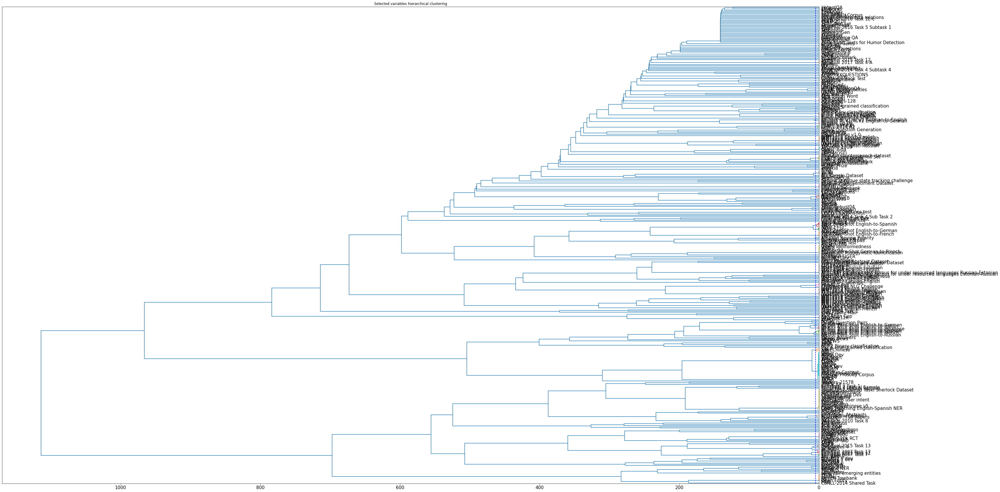

In [32]:
import scipy.cluster.hierarchy as shc

#col_filter="Accuracy,"
#col_filter="F1,|Accuracy,|BLEU,|Recall,|Precision,|BLEU score,"

plt.figure(figsize=(50, 30))  
plt.title("Selected variables hierarchical clustering")  

#cut=400 #for value

cut=5 #for percentage

#define inside the regular expression which variable to use for the clustering (unique_vars variable)
dend = shc.dendrogram(shc.linkage(np.array(df[df.columns.intersection(unique_vars)]),method='ward'),
                                 labels=df.index,
                                 orientation='left',
                                 color_threshold=cut)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=15)
ax.tick_params(axis='y', which='major', labelsize=15)
plt.axvline(linestyle='--', x=cut, c="Blue") 

#plt.savefig('dend_percent_max_sota.png')
#plt.savefig('dend_percent.png')
#plt.savefig('dend_value.png')
plt.savefig('dend_percent_max_sota_task.png')


#Ref:https://joernhees.de/blog/2015/08/26/scipy-hierarchical-clustering-and-dendrogram-tutorial/

In [33]:
#test display
df[df["Accuracy, 2013"]>0]

,"1 in 10 R-at-1, 2012","Accuracy, 2013","PPL, 2013","F1, 2013","Accuracy, 2014","Relation F1, 2014","MRR, 2014","F1 score, 2014","PPL, 2014","MAP, 2014","F1, 2014","Entity+Relation F1, 2014","BLEU score, 2014","% Test Accuracy, 2014","Entity F1, 2014","POS, 2015","F1, 2015","Daily Mail, 2015","Accuracy, 2015","BLEU score, 2015","ROUGE-L, 2015","Error, 2015","Mean Error Rate, 2015","% Train Accuracy, 2015","Parameters, 2015","Pearson Correlation, 2015","MRR, 2015","Spearman Correlation, 2015","ROUGE-2, 2015","Kitchen, 2015","ROUGE-1, 2015","CNN, 2015","Books, 2015","Mean Acc (Restaurant + Laptop), 2015","LAS, 2015","DVD, 2015","Restaurant (Acc), 2015","F1 score, 2015","Average, 2015","Accuracy (trained on 10k), 2015","Electronics, 2015","UAS, 2015","Laptop (Acc), 2015","Accuracy (trained on 1k), 2015","BLEU, 2015","MSE, 2015","MAP, 2015","CR, 2015","P-at-1, 2015","ROUGE-1, 2016","BLEU score, 2016","EM, 2016","F1 (Quasar-T), 2016","F1, 2016","MAP, 2016","Request, 2016","Mean Error Rate, 2016","Accuracy, 2016","Mean Acc (Restaurant + Laptop), 2016","Avg accuracy, 2016","CNN, 2016","Test perplexity, 2016","Accuracy (trained on 1k), 2016","Restaurant (Acc), 2016","Daily Mail, 2016","Area, 2016","P-at-5, 2016","N-gram F1, 2016","MRR, 2016","Rouge-L, 2016","ROUGE-L, 2016","ROUGE, 2016","Validation perplexity, 2016","EM (Quasar-T), 2016","Relation F1, 2016","Accuracy-NE, 2016","UAS, 2016","F0.5, 2016","Unigram Acc, 2016","Price, 2016","F1 score, 2016","LAS, 2016","Laptop (Acc), 2016","Accuracy-CN, 2016","BLEU-3, 2016","% Test Accuracy, 2016","BLEU-5, 2016","BLEU-4, 2016","Entity+Relation F1, 2016","Joint, 2016","BLEU-1, 2016","Aspect, 2016","P-at-1, 2016","BLEU, 2016","Micro-F1, 2016","BLEU-2, 2016","ROUGE-2, 2016","Sentiment, 2016","Bit per Character (BPC), 2016","Entity F1, 2016","Number of params, 2016","Food, 2016","Error, 2016","Accuracy (trained on 10k), 2016","METEOR, 2016","NLL, 2017","ROUGE-1, 2017","Accuracy, 2017","% Test Accuracy, 2017","Holder Binary F1, 2017","F1, 2017","R-at-1, 2017","Entity F1, 2017","ROUGE-L, 2017","BLEU-5, 2017","Kitchen, 2017","MAP, 2017","Number of params, 2017","F1-score, 2017","Max F1 (WSJ), 2017","P-at-1, 2017","Mean F1 (WSJ), 2017","F1 (surface form), 2017","BLEU-2, 2017","Laptop (Acc), 2017","F1 (Quasar-T), 2017","BLEU-4, 2017","BLEU score, 2017","BLEU, 2017","F0.5, 2017","EM, 2017","Senseval 3, 2017","F1 score, 2017","ROUGE, 2017","Parameters, 2017","MRR, 2017","EM (Quasar-T), 2017","nDCG-at-20, 2017","Test, 2017","Senseval 2, 2017","Target Binary F1, 2017","BLEU-3, 2017","SemEval 2015, 2017","Perplexity, 2017","Micro-F1, 2017","METEOR, 2017","Average Precision, 2017","Per-class Accuracy (Agree), 2017","Avg F1, 2017","SICK-R, 2017","CR, 2017","Per-class Accuracy (Discuss), 2017","SemEval 2013, 2017","Per-class Accuracy (Disagree), 2017","KL, 2017","Mean Acc (Restaurant + Laptop), 2017","Per-class Accuracy (Unrelated), 2017","R-at-10, 2017","Weighted Accuracy, 2017","R-at-5, 2017","CNN, 2017","PPL, 2017","Average, 2017","Avg accuracy, 2017","Temporal awareness, 2017","ROUGE-2, 2017","Relation F1, 2017","MAE (Power), 2017","NIST, 2017","MAE (Expectancy), 2017","P-at-20, 2017","MAE (Valence), 2017","CIDEr, 2017","Error, 2017","Error rate, 2017","SICK-E, 2017","MSE, 2017","BLEU-1, 2017","1-of-100 Accuracy, 2017","MAE (Arousal), 2017","1 in 10 R-at-2, 2017","Mean Rank, 2017","BLEU, 2018","SemEval 2007, 2018","Pointing Game Accuracy, 2018","Max F1 (WSJ10), 2018","F1, 2018","% Test Accuracy, 2018","All, 2018","R-at-1, 2018","Senseval 3, 2018","Entity F1, 2018","Mean F1 (WSJ10), 2018","SemEval 2015, 2018","Accuracy, 2018","Overall, 2018","In-domain, 2018","nDCG-at-20, 2018","F-measure, 2018","Joint, 2018","ROUGE-L, 2018","N-gram F1, 2018","Test, 2018","SemEval 2013, 2018","EM, 2018","Micro-F1, 2018","Sentiment, 2018","Pearson Correlation, 2018","Mismatched, 2018","R-at-10, 2018","Mean Acc (Restaurant + Laptop), 2018","MAP, 2018","Average, 2018","Avg F1, 2018","Aspect, 2018","DVD, 2018","R-at-5, 2018

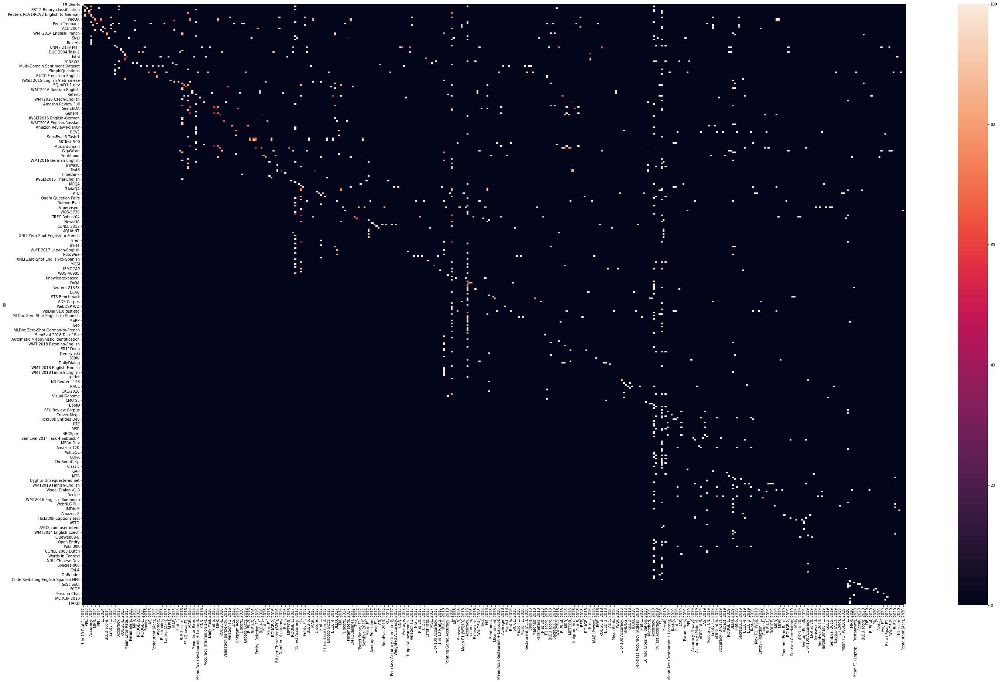

In [34]:
#plot heatmap (better to use clustermap below)
fig, ax = plt.subplots(figsize=(50,30)) 
ax = sns.heatmap(df)
plt.savefig('heat_percent_max_sota_task.png')
#Ref:https://seaborn.pydata.org/generated/seaborn.clustermap.html

c:\users\adriano\appdata\local\programs\python\python39\lib\site-packages\seaborn\matrix.py:649: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



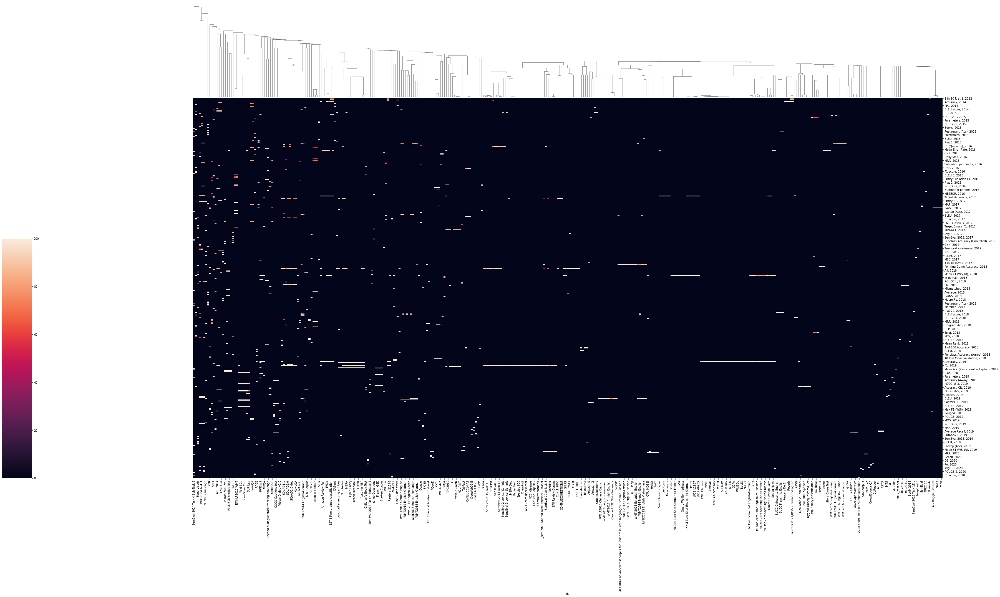

In [35]:
#clustermap showing distance analysis between the tasks
ax = sns.clustermap(df.T,
                    figsize=(50, 30),
                    metric="euclidean",
                    row_cluster=False,
                    #dendrogram_ratio=(.1, .2),
                    cbar_pos=(0, .2, .03, .4))
plt.savefig('clustermap_percent_max_sota_task.png')
#Ref:https://seaborn.pydata.org/generated/seaborn.clustermap.html

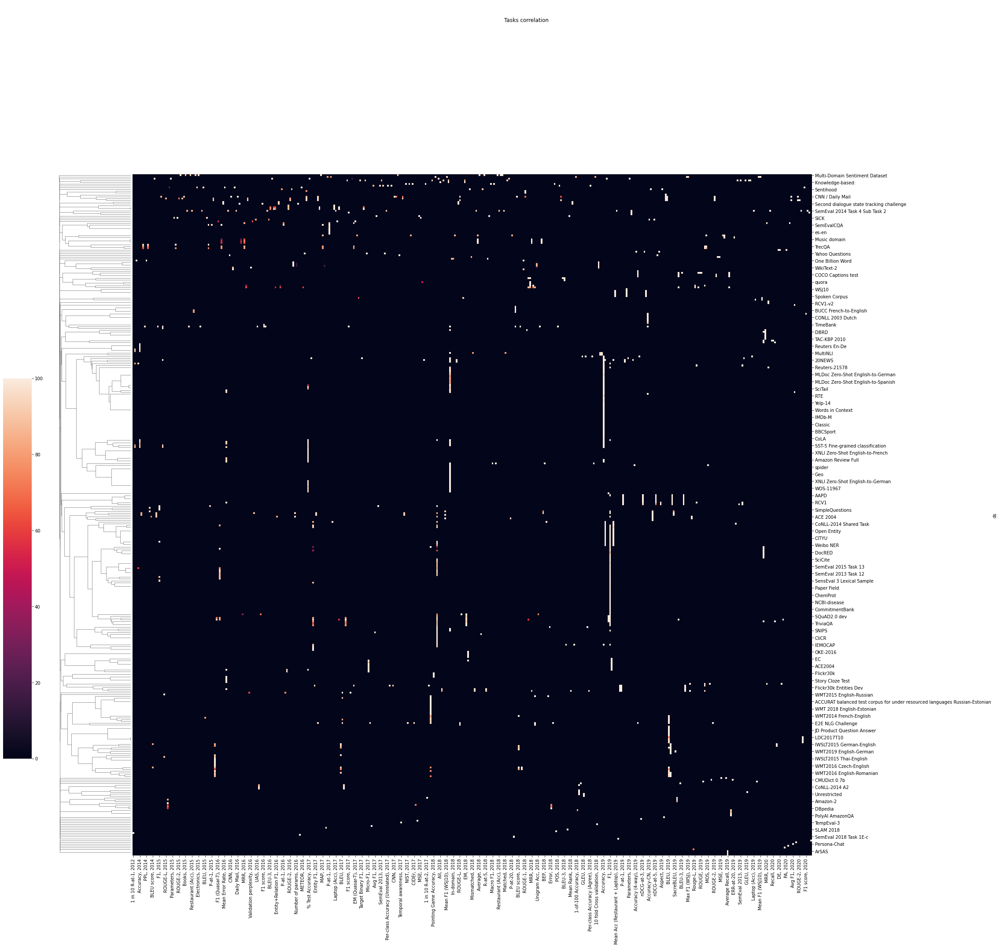

In [36]:
#clustermap showing correlation analysis between the tasks
from matplotlib import rcParams
rcParams['axes.titlepad'] = 1 # Space between the title and graph

ax = sns.clustermap(df,
                    figsize=(30, 30),
                    metric="correlation",
                    col_cluster=False,
                    dendrogram_ratio=(.1, .2),
                    cbar_pos=(-.05, .2, .03, .4)
                    )
plt.suptitle('Tasks correlation') 
plt.savefig('clustermap_corr_percent_max_sota_task.png')
#Ref:https://seaborn.pydata.org/generated/seaborn.clustermap.html

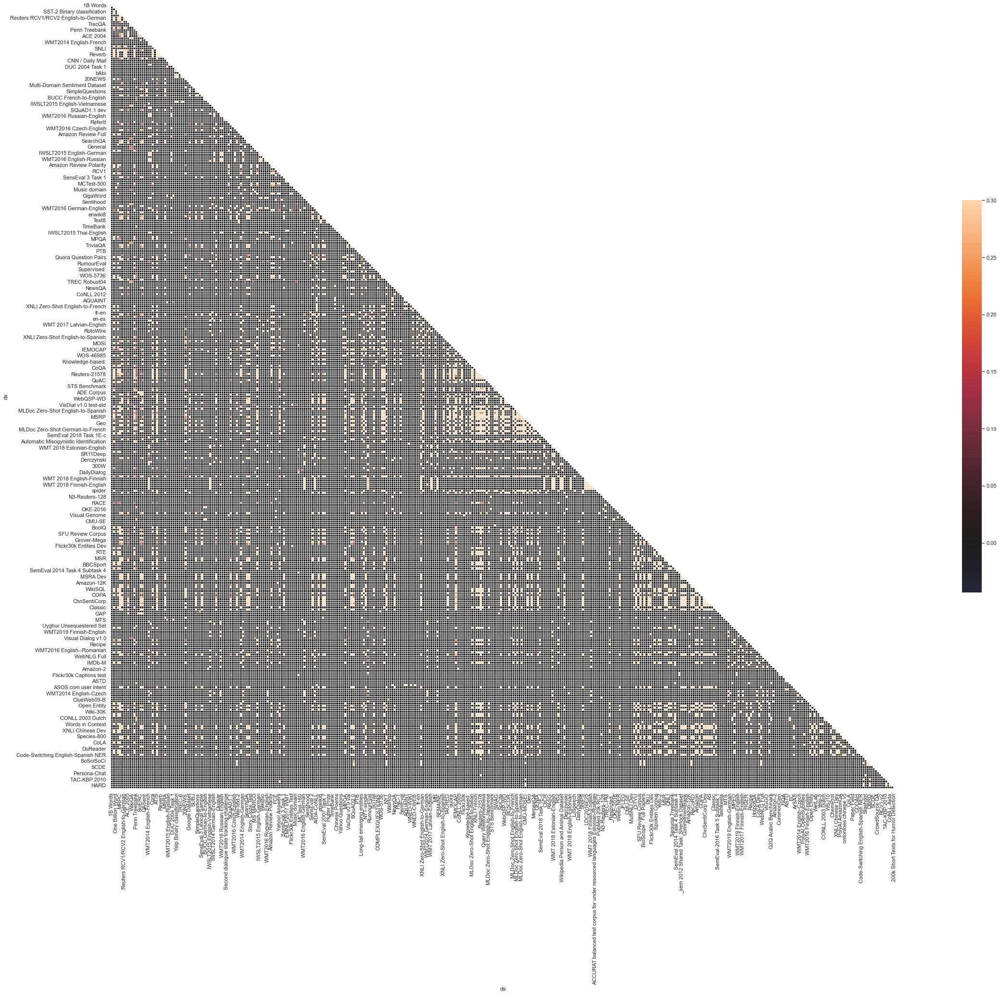

In [37]:
#Correlation plot (better to use clustermap above)
from string import ascii_letters
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="white")

# Compute the correlation matrix (trnapose to get the task correlations)
corr = df.T.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(50, 30))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.savefig('corr_percent_max_sota_task.png')

#Ref:https://seaborn.pydata.org/examples/many_pairwise_correlations.html